In [1]:
import argparse
import os
import numpy as np
import math
import sys


import torch.nn as nn
import torch.nn.functional as F
import torch.autograd as autograd
import torch

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

In [2]:

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

In [3]:
class Generator(nn.Module):
    def __init__(self, latent_dim,samples_dim):
        super(Generator, self).__init__()

        def block(in_feat, out_feat, normalize=True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *block(latent_dim, 50, normalize=False),
            nn.Linear(50, samples_dim)
        )

    def forward(self, z):
        img = self.model(z)
        return img


In [4]:

class Discriminator(nn.Module):
    def __init__(self, samples_dim):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(samples_dim, 50),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(50, 50),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(50, 1)
        )

    def forward(self, x):
        validity =self.model(x)#torch.sin(self.model(x))
        # T=nn.Tanh()
       # validity=T(C*x)
        return validity

In [5]:
def compute_gradient_penalty(D, real_samples, fake_samples):
    """Calculates the gradient penalty loss for WGAN GP"""
    # Random weight term for interpolation between real and fake samples
    alpha = Tensor(np.random.random((real_samples.size(0), 1, 1, 1)))
    # Get random interpolation between real and fake samples
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(True)
    d_interpolates = D(interpolates)
  #  fake = Variable(Tensor(real_samples.shape[0], 1).fill_(1.0), requires_grad=False)
    # Get gradient w.r.t. interpolates
    gradients = d_interpolates.view(d_interpolates.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1)).mean()
    return gradient_penalty

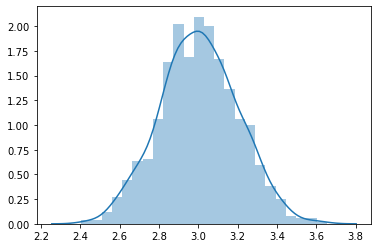

In [6]:
m = torch.distributions.normal.Normal(torch.tensor([3.0]), torch.tensor([.2]))
real_data=m.sample([1000]).to(device)
real_data.shape

sns.distplot(real_data.cpu())

In [10]:
lat_dim=1
samples_dim=1

# Initialize generator and discriminator
generator = Generator(lat_dim,samples_dim)
discriminator = Discriminator(samples_dim)


if cuda:
    generator.cuda()
    discriminator.cuda()


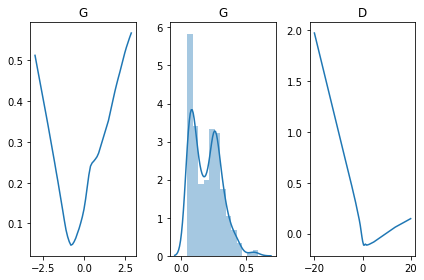

In [11]:

def viewGAN(discriminator, generator):
    fig, ax= plt.subplots(1,3)

    X=torch.arange(-20.,20.,0.1)
    Y=discriminator(X.unsqueeze(1).to(device)).detach().cpu()
    ax[2].plot(X,Y)
    ax[2].title.set_text('D')
    
    Z=torch.arange(-3.,3.,0.1)
    Y=generator(Z.unsqueeze(1).to(device)).detach().cpu()
    ax[0].plot(Z,Y)
    ax[0].title.set_text('G')
    
    


    z = Tensor(np.random.normal(0, 1, (500, lat_dim)))
    fake_data=generator(z).detach().cpu()
    sns.distplot(fake_data, ax=ax[1])
    ax[1].title.set_text('G')
    
    plt.tight_layout()
    plt.show()
viewGAN(discriminator, generator)

In [12]:
b1=0.5 #0.5
b2=0.9999
lr_g=0.008
lr_d=0.001
# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr_g, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr_d, betas=(b1, b2))





[Epoch 0/50000] [D loss: -0.080542] [G loss: 0.089842]


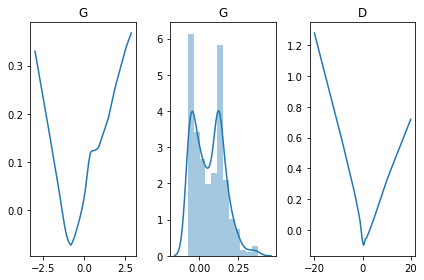

[Epoch 4/50000] [D loss: -0.478015] [G loss: 0.104235]
[Epoch 8/50000] [D loss: -0.848091] [G loss: 0.117019]
[Epoch 12/50000] [D loss: -1.167695] [G loss: 0.084221]
[Epoch 16/50000] [D loss: -1.495716] [G loss: -0.017793]
[Epoch 20/50000] [D loss: -1.809123] [G loss: -0.181882]
[Epoch 24/50000] [D loss: -2.041061] [G loss: -0.467724]
[Epoch 28/50000] [D loss: -2.206181] [G loss: -0.846182]
[Epoch 32/50000] [D loss: -2.272056] [G loss: -1.344669]
[Epoch 36/50000] [D loss: -2.431037] [G loss: -1.795524]
[Epoch 40/50000] [D loss: -2.221005] [G loss: -2.604822]
[Epoch 44/50000] [D loss: -1.989678] [G loss: -3.392946]
[Epoch 48/50000] [D loss: -1.484487] [G loss: -4.272311]
[Epoch 52/50000] [D loss: -0.968408] [G loss: -5.056399]
[Epoch 56/50000] [D loss: -0.439534] [G loss: -5.634155]
[Epoch 60/50000] [D loss: 0.330359] [G loss: -6.141270]
[Epoch 64/50000] [D loss: 1.011355] [G loss: -6.276072]
[Epoch 68/50000] [D loss: 1.440708] [G loss: -5.955010]
[Epoch 72/50000] [D loss: 1.529472] [G 

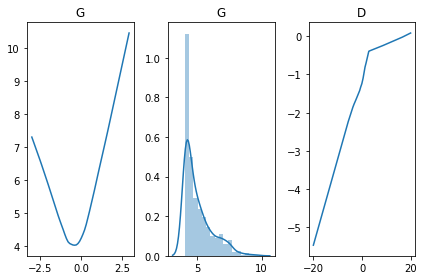

[Epoch 104/50000] [D loss: -0.169229] [G loss: 0.940342]
[Epoch 108/50000] [D loss: -0.422740] [G loss: 1.656798]
[Epoch 112/50000] [D loss: -0.725205] [G loss: 2.458880]
[Epoch 116/50000] [D loss: -0.940061] [G loss: 3.200899]
[Epoch 120/50000] [D loss: -1.166507] [G loss: 3.989486]
[Epoch 124/50000] [D loss: -1.371480] [G loss: 4.759320]
[Epoch 128/50000] [D loss: -1.460116] [G loss: 5.433166]
[Epoch 132/50000] [D loss: -1.474094] [G loss: 6.040601]
[Epoch 136/50000] [D loss: -1.343994] [G loss: 6.401418]
[Epoch 140/50000] [D loss: -1.174697] [G loss: 6.652642]
[Epoch 144/50000] [D loss: -0.612365] [G loss: 6.374674]
[Epoch 148/50000] [D loss: -0.195308] [G loss: 5.987734]
[Epoch 152/50000] [D loss: 0.220477] [G loss: 5.323902]
[Epoch 156/50000] [D loss: 0.588274] [G loss: 4.342711]
[Epoch 160/50000] [D loss: 0.717395] [G loss: 3.497600]
[Epoch 164/50000] [D loss: 0.722636] [G loss: 2.701807]
[Epoch 168/50000] [D loss: 0.686168] [G loss: 1.956890]
[Epoch 172/50000] [D loss: 0.567902]

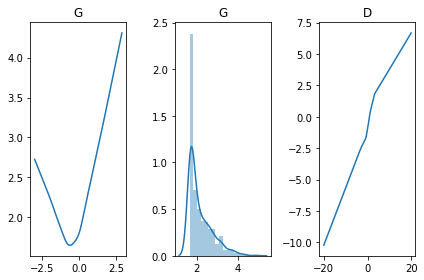

[Epoch 204/50000] [D loss: -0.683449] [G loss: -1.217257]
[Epoch 208/50000] [D loss: -0.717129] [G loss: -1.433975]
[Epoch 212/50000] [D loss: -0.711876] [G loss: -1.623452]
[Epoch 216/50000] [D loss: -0.683375] [G loss: -1.784110]
[Epoch 220/50000] [D loss: -0.499647] [G loss: -2.025750]
[Epoch 224/50000] [D loss: -0.278217] [G loss: -2.235079]
[Epoch 228/50000] [D loss: -0.114687] [G loss: -2.267636]
[Epoch 232/50000] [D loss: 0.040641] [G loss: -2.174793]
[Epoch 236/50000] [D loss: 0.224161] [G loss: -2.076928]
[Epoch 240/50000] [D loss: 0.241993] [G loss: -1.715087]
[Epoch 244/50000] [D loss: 0.224245] [G loss: -1.356839]
[Epoch 248/50000] [D loss: 0.090324] [G loss: -0.779393]
[Epoch 252/50000] [D loss: -0.047305] [G loss: -0.181093]
[Epoch 256/50000] [D loss: -0.161813] [G loss: 0.288997]
[Epoch 260/50000] [D loss: -0.189269] [G loss: 0.464788]
[Epoch 264/50000] [D loss: -0.202999] [G loss: 0.594572]
[Epoch 268/50000] [D loss: -0.223443] [G loss: 0.734266]
[Epoch 272/50000] [D lo

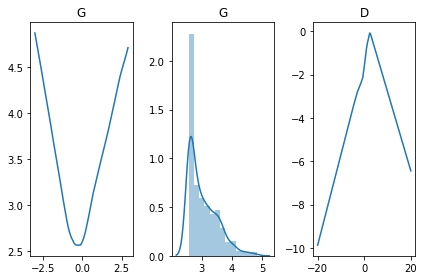

[Epoch 304/50000] [D loss: -0.107346] [G loss: 0.048664]
[Epoch 308/50000] [D loss: -0.100244] [G loss: -0.004628]
[Epoch 312/50000] [D loss: -0.099954] [G loss: 0.010714]
[Epoch 316/50000] [D loss: -0.093942] [G loss: 0.002687]
[Epoch 320/50000] [D loss: -0.086240] [G loss: -0.004198]
[Epoch 324/50000] [D loss: -0.080734] [G loss: -0.016182]
[Epoch 328/50000] [D loss: -0.085139] [G loss: -0.014548]
[Epoch 332/50000] [D loss: -0.081112] [G loss: -0.020406]
[Epoch 336/50000] [D loss: -0.082379] [G loss: -0.016444]
[Epoch 340/50000] [D loss: -0.079984] [G loss: -0.029392]
[Epoch 344/50000] [D loss: -0.092918] [G loss: 0.009689]
[Epoch 348/50000] [D loss: -0.129601] [G loss: -0.019188]
[Epoch 352/50000] [D loss: -0.135986] [G loss: -0.006498]
[Epoch 356/50000] [D loss: -0.145011] [G loss: -0.002635]
[Epoch 360/50000] [D loss: -0.140726] [G loss: -0.005702]
[Epoch 364/50000] [D loss: -0.145933] [G loss: -0.006243]
[Epoch 368/50000] [D loss: -0.146311] [G loss: 0.004457]
[Epoch 372/50000] [

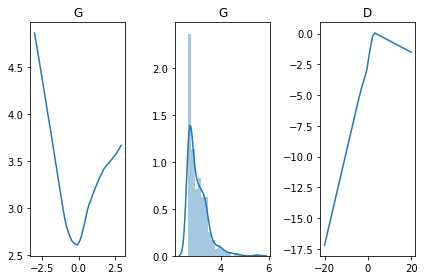

[Epoch 404/50000] [D loss: -0.123258] [G loss: 0.021029]
[Epoch 408/50000] [D loss: -0.118226] [G loss: 0.026144]
[Epoch 412/50000] [D loss: -0.121727] [G loss: 0.033581]
[Epoch 416/50000] [D loss: -0.118391] [G loss: 0.034016]
[Epoch 420/50000] [D loss: -0.113709] [G loss: 0.033831]
[Epoch 424/50000] [D loss: -0.109121] [G loss: 0.024459]
[Epoch 428/50000] [D loss: -0.107933] [G loss: 0.018719]
[Epoch 432/50000] [D loss: -0.108005] [G loss: 0.023962]
[Epoch 436/50000] [D loss: -0.106742] [G loss: 0.024301]
[Epoch 440/50000] [D loss: -0.106487] [G loss: 0.023695]
[Epoch 444/50000] [D loss: -0.101811] [G loss: 0.019436]
[Epoch 448/50000] [D loss: -0.104261] [G loss: 0.021656]
[Epoch 452/50000] [D loss: -0.104593] [G loss: 0.021347]
[Epoch 456/50000] [D loss: -0.102935] [G loss: 0.019177]
[Epoch 460/50000] [D loss: -0.099703] [G loss: 0.018470]
[Epoch 464/50000] [D loss: -0.103165] [G loss: 0.018840]
[Epoch 468/50000] [D loss: -0.102704] [G loss: 0.016006]
[Epoch 472/50000] [D loss: -0.1

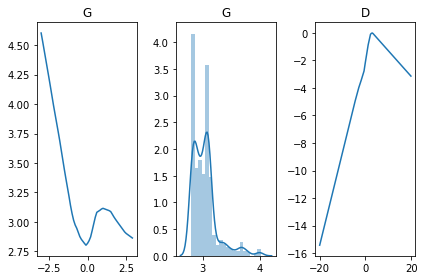

[Epoch 504/50000] [D loss: -0.099573] [G loss: 0.018254]
[Epoch 508/50000] [D loss: -0.103221] [G loss: 0.002876]
[Epoch 512/50000] [D loss: -0.099432] [G loss: -0.011778]
[Epoch 516/50000] [D loss: -0.101263] [G loss: -0.009099]
[Epoch 520/50000] [D loss: -0.098288] [G loss: -0.015125]
[Epoch 524/50000] [D loss: -0.098074] [G loss: 0.007393]
[Epoch 528/50000] [D loss: -0.098739] [G loss: -0.014651]
[Epoch 532/50000] [D loss: -0.099310] [G loss: -0.007406]
[Epoch 536/50000] [D loss: -0.098102] [G loss: -0.011148]
[Epoch 540/50000] [D loss: -0.098990] [G loss: -0.008209]
[Epoch 544/50000] [D loss: -0.098886] [G loss: -0.012725]
[Epoch 548/50000] [D loss: -0.096580] [G loss: -0.005964]
[Epoch 552/50000] [D loss: -0.096483] [G loss: -0.011825]
[Epoch 556/50000] [D loss: -0.098297] [G loss: -0.012380]
[Epoch 560/50000] [D loss: -0.096690] [G loss: -0.006042]
[Epoch 564/50000] [D loss: -0.095450] [G loss: -0.003289]
[Epoch 568/50000] [D loss: -0.098705] [G loss: -0.005674]
[Epoch 572/50000]

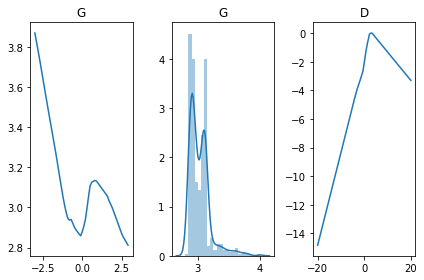

[Epoch 604/50000] [D loss: -0.095171] [G loss: -0.007920]
[Epoch 608/50000] [D loss: -0.094697] [G loss: -0.011766]
[Epoch 612/50000] [D loss: -0.094583] [G loss: -0.009952]
[Epoch 616/50000] [D loss: -0.096719] [G loss: -0.010588]
[Epoch 620/50000] [D loss: -0.094047] [G loss: -0.014295]
[Epoch 624/50000] [D loss: -0.094704] [G loss: -0.012144]
[Epoch 628/50000] [D loss: -0.094584] [G loss: -0.012547]
[Epoch 632/50000] [D loss: -0.095270] [G loss: -0.010380]
[Epoch 636/50000] [D loss: -0.095733] [G loss: -0.017868]
[Epoch 640/50000] [D loss: -0.094991] [G loss: -0.001427]
[Epoch 644/50000] [D loss: -0.095209] [G loss: -0.004060]
[Epoch 648/50000] [D loss: -0.092089] [G loss: -0.017597]
[Epoch 652/50000] [D loss: -0.097279] [G loss: 0.020114]
[Epoch 656/50000] [D loss: -0.096880] [G loss: -0.035947]
[Epoch 660/50000] [D loss: -0.093367] [G loss: 0.019362]
[Epoch 664/50000] [D loss: -0.093876] [G loss: 0.046175]
[Epoch 668/50000] [D loss: -0.096805] [G loss: 0.037090]
[Epoch 672/50000] 

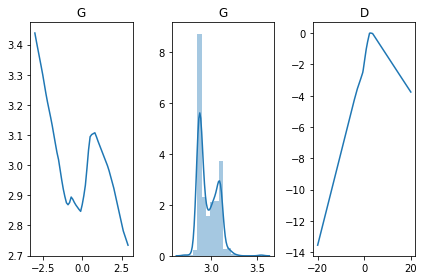

[Epoch 704/50000] [D loss: -0.096460] [G loss: -0.004383]
[Epoch 708/50000] [D loss: -0.096948] [G loss: 0.027698]
[Epoch 712/50000] [D loss: -0.096411] [G loss: 0.021091]
[Epoch 716/50000] [D loss: -0.096066] [G loss: -0.013157]
[Epoch 720/50000] [D loss: -0.093879] [G loss: -0.054976]
[Epoch 724/50000] [D loss: -0.097896] [G loss: -0.056414]
[Epoch 728/50000] [D loss: -0.096171] [G loss: 0.001177]
[Epoch 732/50000] [D loss: -0.097637] [G loss: 0.022247]
[Epoch 736/50000] [D loss: -0.098090] [G loss: -0.011239]
[Epoch 740/50000] [D loss: -0.099462] [G loss: -0.030353]
[Epoch 744/50000] [D loss: -0.100668] [G loss: 0.006649]
[Epoch 748/50000] [D loss: -0.099328] [G loss: -0.008984]
[Epoch 752/50000] [D loss: -0.100429] [G loss: 0.027813]
[Epoch 756/50000] [D loss: -0.101097] [G loss: -0.004208]
[Epoch 760/50000] [D loss: -0.101583] [G loss: -0.025044]
[Epoch 764/50000] [D loss: -0.100539] [G loss: 0.001307]
[Epoch 768/50000] [D loss: -0.099295] [G loss: 0.013083]
[Epoch 772/50000] [D l

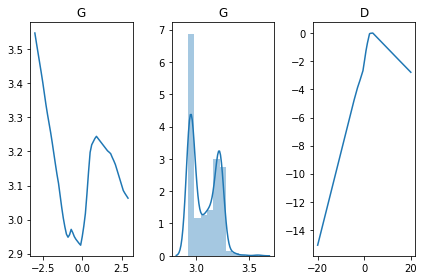

[Epoch 804/50000] [D loss: -0.094955] [G loss: -0.000408]
[Epoch 808/50000] [D loss: -0.096573] [G loss: 0.013054]
[Epoch 812/50000] [D loss: -0.098553] [G loss: 0.049325]
[Epoch 816/50000] [D loss: -0.094854] [G loss: -0.004879]
[Epoch 820/50000] [D loss: -0.097701] [G loss: -0.017099]
[Epoch 824/50000] [D loss: -0.098191] [G loss: 0.024487]
[Epoch 828/50000] [D loss: -0.100947] [G loss: -0.038310]
[Epoch 832/50000] [D loss: -0.098174] [G loss: 0.028103]
[Epoch 836/50000] [D loss: -0.100630] [G loss: -0.009956]
[Epoch 840/50000] [D loss: -0.099109] [G loss: 0.006081]
[Epoch 844/50000] [D loss: -0.101009] [G loss: -0.035026]
[Epoch 848/50000] [D loss: -0.098291] [G loss: 0.003536]
[Epoch 852/50000] [D loss: -0.101004] [G loss: -0.003203]
[Epoch 856/50000] [D loss: -0.099757] [G loss: -0.009204]
[Epoch 860/50000] [D loss: -0.098930] [G loss: -0.013902]
[Epoch 864/50000] [D loss: -0.097466] [G loss: -0.018308]
[Epoch 868/50000] [D loss: -0.097365] [G loss: -0.018461]
[Epoch 872/50000] [D

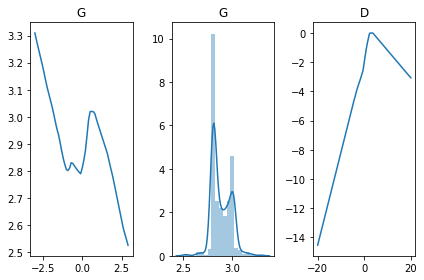

[Epoch 904/50000] [D loss: -0.096856] [G loss: -0.005874]
[Epoch 908/50000] [D loss: -0.098751] [G loss: -0.055995]
[Epoch 912/50000] [D loss: -0.101386] [G loss: -0.002131]
[Epoch 916/50000] [D loss: -0.103079] [G loss: 0.028191]
[Epoch 920/50000] [D loss: -0.103513] [G loss: -0.035822]
[Epoch 924/50000] [D loss: -0.102478] [G loss: 0.004187]
[Epoch 928/50000] [D loss: -0.101494] [G loss: -0.004479]
[Epoch 932/50000] [D loss: -0.100767] [G loss: 0.014580]
[Epoch 936/50000] [D loss: -0.099947] [G loss: 0.010189]
[Epoch 940/50000] [D loss: -0.097885] [G loss: 0.015737]
[Epoch 944/50000] [D loss: -0.097192] [G loss: 0.018280]
[Epoch 948/50000] [D loss: -0.095303] [G loss: 0.022772]
[Epoch 952/50000] [D loss: -0.094329] [G loss: 0.011033]
[Epoch 956/50000] [D loss: -0.093653] [G loss: 0.008915]
[Epoch 960/50000] [D loss: -0.095335] [G loss: 0.020087]
[Epoch 964/50000] [D loss: -0.095965] [G loss: 0.008288]
[Epoch 968/50000] [D loss: -0.095350] [G loss: -0.006986]
[Epoch 972/50000] [D loss

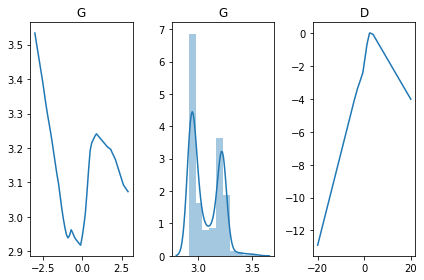

[Epoch 1004/50000] [D loss: -0.103023] [G loss: 0.030178]
[Epoch 1008/50000] [D loss: -0.102280] [G loss: 0.007658]
[Epoch 1012/50000] [D loss: -0.100706] [G loss: 0.016586]
[Epoch 1016/50000] [D loss: -0.097620] [G loss: 0.011014]
[Epoch 1020/50000] [D loss: -0.096831] [G loss: 0.010461]
[Epoch 1024/50000] [D loss: -0.095313] [G loss: 0.010528]
[Epoch 1028/50000] [D loss: -0.092039] [G loss: -0.011172]
[Epoch 1032/50000] [D loss: -0.093211] [G loss: 0.006304]
[Epoch 1036/50000] [D loss: -0.093511] [G loss: -0.031399]
[Epoch 1040/50000] [D loss: -0.093219] [G loss: -0.025538]
[Epoch 1044/50000] [D loss: -0.096889] [G loss: 0.012641]
[Epoch 1048/50000] [D loss: -0.097751] [G loss: 0.010472]
[Epoch 1052/50000] [D loss: -0.100758] [G loss: 0.016265]
[Epoch 1056/50000] [D loss: -0.103769] [G loss: 0.019674]
[Epoch 1060/50000] [D loss: -0.107054] [G loss: 0.022934]
[Epoch 1064/50000] [D loss: -0.108294] [G loss: 0.025328]
[Epoch 1068/50000] [D loss: -0.109688] [G loss: -0.009636]
[Epoch 107

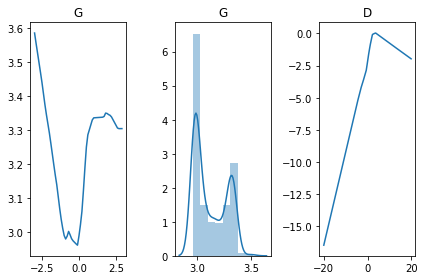

[Epoch 1104/50000] [D loss: -0.088665] [G loss: 0.002480]
[Epoch 1108/50000] [D loss: -0.089244] [G loss: -0.008824]
[Epoch 1112/50000] [D loss: -0.091378] [G loss: 0.038329]
[Epoch 1116/50000] [D loss: -0.092454] [G loss: 0.048431]
[Epoch 1120/50000] [D loss: -0.096954] [G loss: -0.023797]
[Epoch 1124/50000] [D loss: -0.099757] [G loss: 0.004879]
[Epoch 1128/50000] [D loss: -0.103091] [G loss: 0.035893]
[Epoch 1132/50000] [D loss: -0.108809] [G loss: 0.038041]
[Epoch 1136/50000] [D loss: -0.108770] [G loss: 0.056575]
[Epoch 1140/50000] [D loss: -0.112312] [G loss: 0.040681]
[Epoch 1144/50000] [D loss: -0.112788] [G loss: 0.013976]
[Epoch 1148/50000] [D loss: -0.109016] [G loss: -0.001279]
[Epoch 1152/50000] [D loss: -0.110899] [G loss: 0.020254]
[Epoch 1156/50000] [D loss: -0.106180] [G loss: 0.007539]
[Epoch 1160/50000] [D loss: -0.101580] [G loss: -0.004106]
[Epoch 1164/50000] [D loss: -0.096517] [G loss: -0.003728]
[Epoch 1168/50000] [D loss: -0.091455] [G loss: -0.000247]
[Epoch 1

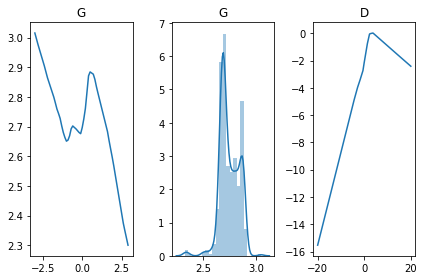

[Epoch 1204/50000] [D loss: -0.114262] [G loss: -0.061825]
[Epoch 1208/50000] [D loss: -0.120683] [G loss: -0.004353]
[Epoch 1212/50000] [D loss: -0.122020] [G loss: 0.000789]
[Epoch 1216/50000] [D loss: -0.118248] [G loss: 0.006335]
[Epoch 1220/50000] [D loss: -0.116218] [G loss: 0.004573]
[Epoch 1224/50000] [D loss: -0.110590] [G loss: 0.001042]
[Epoch 1228/50000] [D loss: -0.103244] [G loss: 0.005151]
[Epoch 1232/50000] [D loss: -0.095922] [G loss: -0.002120]
[Epoch 1236/50000] [D loss: -0.085705] [G loss: 0.001015]
[Epoch 1240/50000] [D loss: -0.078364] [G loss: 0.005776]
[Epoch 1244/50000] [D loss: -0.077460] [G loss: 0.004071]
[Epoch 1248/50000] [D loss: -0.076692] [G loss: 0.008672]
[Epoch 1252/50000] [D loss: -0.081771] [G loss: 0.001401]
[Epoch 1256/50000] [D loss: -0.088608] [G loss: 0.005026]
[Epoch 1260/50000] [D loss: -0.105262] [G loss: 0.070907]
[Epoch 1264/50000] [D loss: -0.127993] [G loss: 0.046231]
[Epoch 1268/50000] [D loss: -0.140101] [G loss: 0.051933]
[Epoch 1272

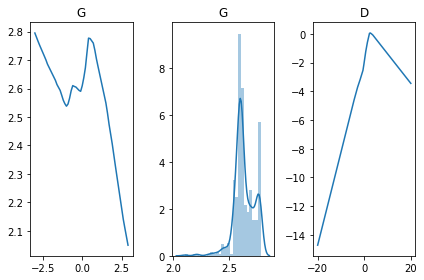

[Epoch 1304/50000] [D loss: -0.072935] [G loss: -0.057050]
[Epoch 1308/50000] [D loss: -0.114136] [G loss: -0.074958]
[Epoch 1312/50000] [D loss: -0.139836] [G loss: -0.100542]
[Epoch 1316/50000] [D loss: -0.145875] [G loss: -0.106306]
[Epoch 1320/50000] [D loss: -0.144514] [G loss: -0.056574]
[Epoch 1324/50000] [D loss: -0.143531] [G loss: 0.011602]
[Epoch 1328/50000] [D loss: -0.129132] [G loss: 0.000990]
[Epoch 1332/50000] [D loss: -0.114230] [G loss: -0.002728]
[Epoch 1336/50000] [D loss: -0.099991] [G loss: -0.005776]
[Epoch 1340/50000] [D loss: -0.082483] [G loss: -0.005643]
[Epoch 1344/50000] [D loss: -0.069425] [G loss: -0.000187]
[Epoch 1348/50000] [D loss: -0.069483] [G loss: 0.002459]
[Epoch 1352/50000] [D loss: -0.080283] [G loss: -0.007432]
[Epoch 1356/50000] [D loss: -0.094405] [G loss: 0.125514]
[Epoch 1360/50000] [D loss: -0.105849] [G loss: 0.076269]
[Epoch 1364/50000] [D loss: -0.116589] [G loss: 0.013376]
[Epoch 1368/50000] [D loss: -0.125274] [G loss: 0.021343]
[Epo

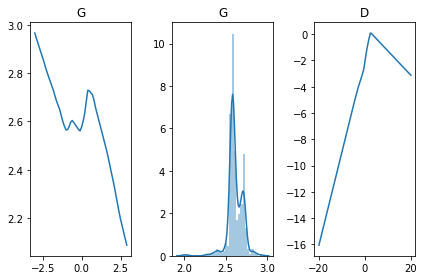

[Epoch 1404/50000] [D loss: -0.047024] [G loss: -0.099541]
[Epoch 1408/50000] [D loss: -0.118633] [G loss: -0.053644]
[Epoch 1412/50000] [D loss: -0.156906] [G loss: -0.038557]
[Epoch 1416/50000] [D loss: -0.161341] [G loss: -0.055004]
[Epoch 1420/50000] [D loss: -0.162356] [G loss: -0.024379]
[Epoch 1424/50000] [D loss: -0.149699] [G loss: 0.003090]
[Epoch 1428/50000] [D loss: -0.131026] [G loss: -0.001414]
[Epoch 1432/50000] [D loss: -0.109898] [G loss: -0.005896]
[Epoch 1436/50000] [D loss: -0.087863] [G loss: -0.005191]
[Epoch 1440/50000] [D loss: -0.069923] [G loss: 0.009922]
[Epoch 1444/50000] [D loss: -0.064488] [G loss: 0.006324]
[Epoch 1448/50000] [D loss: -0.072734] [G loss: -0.001040]
[Epoch 1452/50000] [D loss: -0.088226] [G loss: 0.007879]
[Epoch 1456/50000] [D loss: -0.099684] [G loss: 0.042676]
[Epoch 1460/50000] [D loss: -0.110805] [G loss: 0.011217]
[Epoch 1464/50000] [D loss: -0.121856] [G loss: 0.046946]
[Epoch 1468/50000] [D loss: -0.130092] [G loss: 0.042469]
[Epoc

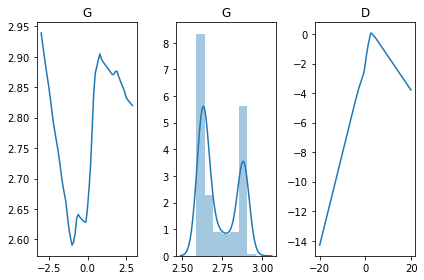

[Epoch 1504/50000] [D loss: -0.059118] [G loss: -0.038811]
[Epoch 1508/50000] [D loss: -0.056906] [G loss: -0.055682]
[Epoch 1512/50000] [D loss: -0.081006] [G loss: -0.072448]
[Epoch 1516/50000] [D loss: -0.135872] [G loss: -0.085132]
[Epoch 1520/50000] [D loss: -0.154879] [G loss: -0.092469]
[Epoch 1524/50000] [D loss: -0.156527] [G loss: -0.071324]
[Epoch 1528/50000] [D loss: -0.150224] [G loss: 0.019057]
[Epoch 1532/50000] [D loss: -0.132322] [G loss: -0.001131]
[Epoch 1536/50000] [D loss: -0.113774] [G loss: -0.002458]
[Epoch 1540/50000] [D loss: -0.095623] [G loss: -0.008210]
[Epoch 1544/50000] [D loss: -0.068101] [G loss: -0.006007]
[Epoch 1548/50000] [D loss: -0.057048] [G loss: 0.007163]
[Epoch 1552/50000] [D loss: -0.068122] [G loss: 0.006832]
[Epoch 1556/50000] [D loss: -0.092122] [G loss: 0.030085]
[Epoch 1560/50000] [D loss: -0.105988] [G loss: 0.010172]
[Epoch 1564/50000] [D loss: -0.118683] [G loss: 0.026001]
[Epoch 1568/50000] [D loss: -0.128580] [G loss: 0.037422]
[Epo

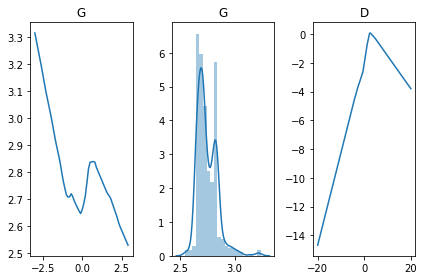

[Epoch 1604/50000] [D loss: -0.058780] [G loss: -0.037027]
[Epoch 1608/50000] [D loss: -0.058395] [G loss: -0.038858]
[Epoch 1612/50000] [D loss: -0.068216] [G loss: -0.060789]
[Epoch 1616/50000] [D loss: -0.108910] [G loss: -0.081260]
[Epoch 1620/50000] [D loss: -0.153975] [G loss: -0.099884]
[Epoch 1624/50000] [D loss: -0.160763] [G loss: -0.082504]
[Epoch 1628/50000] [D loss: -0.151291] [G loss: 0.003099]
[Epoch 1632/50000] [D loss: -0.137061] [G loss: -0.001760]
[Epoch 1636/50000] [D loss: -0.112435] [G loss: -0.004263]
[Epoch 1640/50000] [D loss: -0.087917] [G loss: -0.005698]
[Epoch 1644/50000] [D loss: -0.072404] [G loss: 0.003594]
[Epoch 1648/50000] [D loss: -0.063666] [G loss: 0.008950]
[Epoch 1652/50000] [D loss: -0.077947] [G loss: 0.007810]
[Epoch 1656/50000] [D loss: -0.094588] [G loss: 0.150451]
[Epoch 1660/50000] [D loss: -0.105348] [G loss: 0.114402]
[Epoch 1664/50000] [D loss: -0.116972] [G loss: 0.057248]
[Epoch 1668/50000] [D loss: -0.127621] [G loss: 0.061959]
[Epoc

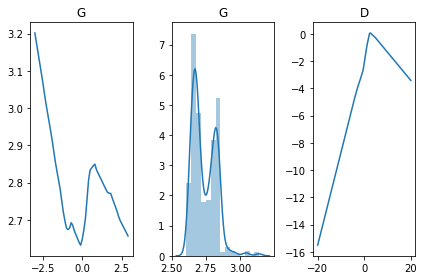

[Epoch 1704/50000] [D loss: -0.066472] [G loss: -0.030061]
[Epoch 1708/50000] [D loss: -0.066423] [G loss: -0.036231]
[Epoch 1712/50000] [D loss: -0.078226] [G loss: -0.042335]
[Epoch 1716/50000] [D loss: -0.102141] [G loss: -0.072698]
[Epoch 1720/50000] [D loss: -0.148320] [G loss: -0.083324]
[Epoch 1724/50000] [D loss: -0.162129] [G loss: -0.067846]
[Epoch 1728/50000] [D loss: -0.154187] [G loss: 0.004367]
[Epoch 1732/50000] [D loss: -0.142164] [G loss: -0.002718]
[Epoch 1736/50000] [D loss: -0.114675] [G loss: -0.007291]
[Epoch 1740/50000] [D loss: -0.090407] [G loss: -0.007090]
[Epoch 1744/50000] [D loss: -0.063963] [G loss: -0.004837]
[Epoch 1748/50000] [D loss: -0.052869] [G loss: 0.007478]
[Epoch 1752/50000] [D loss: -0.061934] [G loss: 0.005740]
[Epoch 1756/50000] [D loss: -0.082741] [G loss: 0.022308]
[Epoch 1760/50000] [D loss: -0.097541] [G loss: 0.047246]
[Epoch 1764/50000] [D loss: -0.115947] [G loss: 0.117834]
[Epoch 1768/50000] [D loss: -0.129038] [G loss: 0.170885]
[Epo

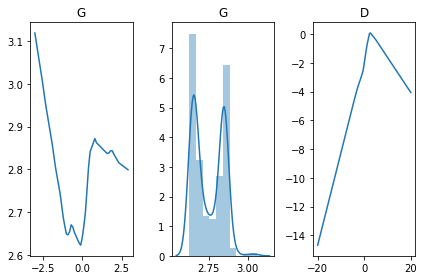

[Epoch 1804/50000] [D loss: -0.051928] [G loss: -0.041278]
[Epoch 1808/50000] [D loss: -0.052222] [G loss: -0.063463]
[Epoch 1812/50000] [D loss: -0.078576] [G loss: -0.078939]
[Epoch 1816/50000] [D loss: -0.128024] [G loss: -0.105630]
[Epoch 1820/50000] [D loss: -0.151810] [G loss: -0.134077]
[Epoch 1824/50000] [D loss: -0.153865] [G loss: -0.118808]
[Epoch 1828/50000] [D loss: -0.147700] [G loss: -0.033601]
[Epoch 1832/50000] [D loss: -0.131991] [G loss: -0.007706]
[Epoch 1836/50000] [D loss: -0.116209] [G loss: -0.008344]
[Epoch 1840/50000] [D loss: -0.093596] [G loss: -0.002971]
[Epoch 1844/50000] [D loss: -0.079185] [G loss: -0.012543]
[Epoch 1848/50000] [D loss: -0.064663] [G loss: -0.003229]
[Epoch 1852/50000] [D loss: -0.067575] [G loss: -0.008725]
[Epoch 1856/50000] [D loss: -0.089942] [G loss: 0.113091]
[Epoch 1860/50000] [D loss: -0.105737] [G loss: 0.098611]
[Epoch 1864/50000] [D loss: -0.119007] [G loss: 0.068241]
[Epoch 1868/50000] [D loss: -0.128785] [G loss: 0.041428]
[

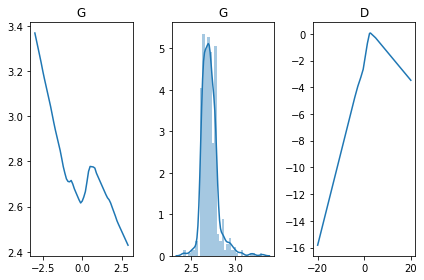

[Epoch 1904/50000] [D loss: -0.057957] [G loss: -0.043039]
[Epoch 1908/50000] [D loss: -0.066495] [G loss: -0.045482]
[Epoch 1912/50000] [D loss: -0.107223] [G loss: -0.040372]
[Epoch 1916/50000] [D loss: -0.146037] [G loss: -0.032375]
[Epoch 1920/50000] [D loss: -0.153689] [G loss: -0.000626]
[Epoch 1924/50000] [D loss: -0.151300] [G loss: -0.000491]
[Epoch 1928/50000] [D loss: -0.137831] [G loss: -0.007565]
[Epoch 1932/50000] [D loss: -0.112264] [G loss: -0.003129]
[Epoch 1936/50000] [D loss: -0.093450] [G loss: -0.008810]
[Epoch 1940/50000] [D loss: -0.073620] [G loss: -0.012275]
[Epoch 1944/50000] [D loss: -0.062352] [G loss: 0.002382]
[Epoch 1948/50000] [D loss: -0.067601] [G loss: -0.001126]
[Epoch 1952/50000] [D loss: -0.094076] [G loss: 0.057204]
[Epoch 1956/50000] [D loss: -0.110644] [G loss: 0.049380]
[Epoch 1960/50000] [D loss: -0.124398] [G loss: 0.036013]
[Epoch 1964/50000] [D loss: -0.130954] [G loss: 0.044637]
[Epoch 1968/50000] [D loss: -0.135697] [G loss: 0.044371]
[Ep

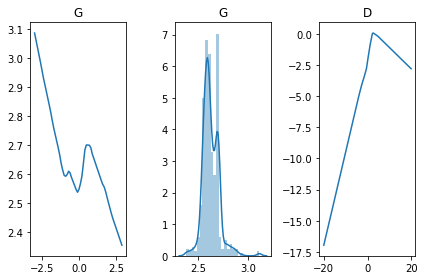

[Epoch 2004/50000] [D loss: -0.071422] [G loss: -0.070789]
[Epoch 2008/50000] [D loss: -0.124278] [G loss: -0.082106]
[Epoch 2012/50000] [D loss: -0.158988] [G loss: -0.085754]
[Epoch 2016/50000] [D loss: -0.160237] [G loss: -0.052493]
[Epoch 2020/50000] [D loss: -0.155145] [G loss: 0.013976]
[Epoch 2024/50000] [D loss: -0.127882] [G loss: -0.002982]
[Epoch 2028/50000] [D loss: -0.105231] [G loss: -0.008465]
[Epoch 2032/50000] [D loss: -0.078629] [G loss: -0.009265]
[Epoch 2036/50000] [D loss: -0.063171] [G loss: -0.006456]
[Epoch 2040/50000] [D loss: -0.057772] [G loss: -0.002439]
[Epoch 2044/50000] [D loss: -0.084345] [G loss: 0.096018]
[Epoch 2048/50000] [D loss: -0.102915] [G loss: 0.110813]
[Epoch 2052/50000] [D loss: -0.118432] [G loss: 0.112202]
[Epoch 2056/50000] [D loss: -0.131435] [G loss: 0.085474]
[Epoch 2060/50000] [D loss: -0.135757] [G loss: 0.043340]
[Epoch 2064/50000] [D loss: -0.135811] [G loss: 0.038076]
[Epoch 2068/50000] [D loss: -0.129804] [G loss: 0.033252]
[Epoc

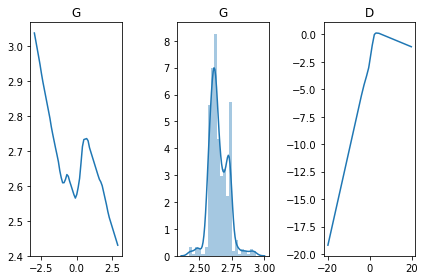

[Epoch 2104/50000] [D loss: -0.154486] [G loss: -0.058835]
[Epoch 2108/50000] [D loss: -0.160387] [G loss: -0.013799]
[Epoch 2112/50000] [D loss: -0.149187] [G loss: -0.000077]
[Epoch 2116/50000] [D loss: -0.127456] [G loss: -0.005508]
[Epoch 2120/50000] [D loss: -0.101078] [G loss: -0.001979]
[Epoch 2124/50000] [D loss: -0.077626] [G loss: -0.007539]
[Epoch 2128/50000] [D loss: -0.058039] [G loss: -0.010064]
[Epoch 2132/50000] [D loss: -0.057870] [G loss: 0.002623]
[Epoch 2136/50000] [D loss: -0.087090] [G loss: 0.064501]
[Epoch 2140/50000] [D loss: -0.109722] [G loss: 0.068695]
[Epoch 2144/50000] [D loss: -0.123345] [G loss: 0.077101]
[Epoch 2148/50000] [D loss: -0.138014] [G loss: 0.049962]
[Epoch 2152/50000] [D loss: -0.142278] [G loss: 0.051419]
[Epoch 2156/50000] [D loss: -0.145252] [G loss: 0.056195]
[Epoch 2160/50000] [D loss: -0.129672] [G loss: 0.033572]
[Epoch 2164/50000] [D loss: -0.115321] [G loss: 0.013263]
[Epoch 2168/50000] [D loss: -0.098354] [G loss: 0.006224]
[Epoch 

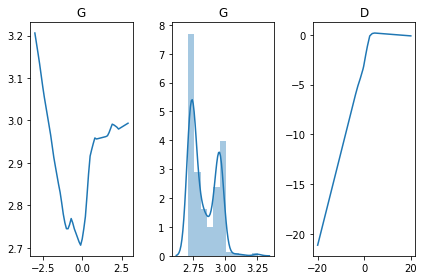

[Epoch 2204/50000] [D loss: -0.134890] [G loss: -0.002026]
[Epoch 2208/50000] [D loss: -0.116962] [G loss: -0.004669]
[Epoch 2212/50000] [D loss: -0.086572] [G loss: -0.004002]
[Epoch 2216/50000] [D loss: -0.065305] [G loss: -0.005878]
[Epoch 2220/50000] [D loss: -0.057545] [G loss: 0.004494]
[Epoch 2224/50000] [D loss: -0.076425] [G loss: 0.032593]
[Epoch 2228/50000] [D loss: -0.105255] [G loss: 0.012987]
[Epoch 2232/50000] [D loss: -0.119924] [G loss: 0.041524]
[Epoch 2236/50000] [D loss: -0.133745] [G loss: 0.051632]
[Epoch 2240/50000] [D loss: -0.141701] [G loss: 0.054624]
[Epoch 2244/50000] [D loss: -0.137332] [G loss: 0.038908]
[Epoch 2248/50000] [D loss: -0.130500] [G loss: 0.036916]
[Epoch 2252/50000] [D loss: -0.120430] [G loss: 0.022823]
[Epoch 2256/50000] [D loss: -0.099302] [G loss: 0.001246]
[Epoch 2260/50000] [D loss: -0.082986] [G loss: -0.015218]
[Epoch 2264/50000] [D loss: -0.062160] [G loss: -0.031509]
[Epoch 2268/50000] [D loss: -0.051833] [G loss: -0.041315]
[Epoch 

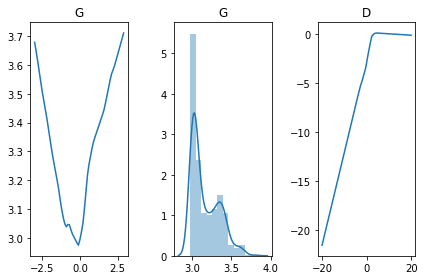

[Epoch 2304/50000] [D loss: -0.064528] [G loss: -0.007683]
[Epoch 2308/50000] [D loss: -0.059216] [G loss: 0.007305]
[Epoch 2312/50000] [D loss: -0.088206] [G loss: 0.080412]
[Epoch 2316/50000] [D loss: -0.112906] [G loss: 0.076005]
[Epoch 2320/50000] [D loss: -0.127182] [G loss: 0.044545]
[Epoch 2324/50000] [D loss: -0.135356] [G loss: 0.050696]
[Epoch 2328/50000] [D loss: -0.134586] [G loss: 0.036808]
[Epoch 2332/50000] [D loss: -0.135612] [G loss: 0.040413]
[Epoch 2336/50000] [D loss: -0.124242] [G loss: 0.026261]
[Epoch 2340/50000] [D loss: -0.106142] [G loss: 0.006825]
[Epoch 2344/50000] [D loss: -0.089770] [G loss: -0.007305]
[Epoch 2348/50000] [D loss: -0.066440] [G loss: -0.028460]
[Epoch 2352/50000] [D loss: -0.058985] [G loss: -0.038878]
[Epoch 2356/50000] [D loss: -0.054496] [G loss: -0.046409]
[Epoch 2360/50000] [D loss: -0.086976] [G loss: -0.035216]
[Epoch 2364/50000] [D loss: -0.142471] [G loss: -0.020020]
[Epoch 2368/50000] [D loss: -0.159642] [G loss: 0.002626]
[Epoch 

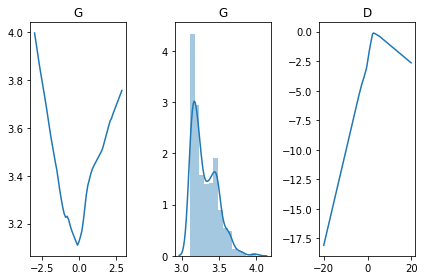

[Epoch 2404/50000] [D loss: -0.121510] [G loss: 0.084639]
[Epoch 2408/50000] [D loss: -0.128073] [G loss: 0.042901]
[Epoch 2412/50000] [D loss: -0.128378] [G loss: 0.028906]
[Epoch 2416/50000] [D loss: -0.126016] [G loss: 0.033752]
[Epoch 2420/50000] [D loss: -0.113989] [G loss: 0.017143]
[Epoch 2424/50000] [D loss: -0.105309] [G loss: 0.026006]
[Epoch 2428/50000] [D loss: -0.082110] [G loss: -0.029656]
[Epoch 2432/50000] [D loss: -0.071772] [G loss: -0.027053]
[Epoch 2436/50000] [D loss: -0.062228] [G loss: -0.034590]
[Epoch 2440/50000] [D loss: -0.064562] [G loss: -0.030721]
[Epoch 2444/50000] [D loss: -0.077328] [G loss: -0.039990]
[Epoch 2448/50000] [D loss: -0.124080] [G loss: -0.022776]
[Epoch 2452/50000] [D loss: -0.160685] [G loss: 0.007413]
[Epoch 2456/50000] [D loss: -0.154279] [G loss: 0.002974]
[Epoch 2460/50000] [D loss: -0.131443] [G loss: -0.004684]
[Epoch 2464/50000] [D loss: -0.108769] [G loss: -0.003407]
[Epoch 2468/50000] [D loss: -0.065425] [G loss: -0.002618]
[Epoc

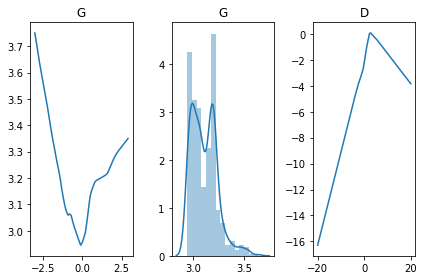

[Epoch 2504/50000] [D loss: -0.121058] [G loss: 0.032657]
[Epoch 2508/50000] [D loss: -0.099518] [G loss: -0.003854]
[Epoch 2512/50000] [D loss: -0.081823] [G loss: -0.013091]
[Epoch 2516/50000] [D loss: -0.065167] [G loss: -0.030777]
[Epoch 2520/50000] [D loss: -0.055949] [G loss: -0.043416]
[Epoch 2524/50000] [D loss: -0.061613] [G loss: -0.049118]
[Epoch 2528/50000] [D loss: -0.107786] [G loss: -0.041837]
[Epoch 2532/50000] [D loss: -0.154324] [G loss: -0.020720]
[Epoch 2536/50000] [D loss: -0.157418] [G loss: 0.005217]
[Epoch 2540/50000] [D loss: -0.144602] [G loss: 0.001861]
[Epoch 2544/50000] [D loss: -0.128044] [G loss: -0.002863]
[Epoch 2548/50000] [D loss: -0.095061] [G loss: -0.005488]
[Epoch 2552/50000] [D loss: -0.075898] [G loss: -0.007916]
[Epoch 2556/50000] [D loss: -0.060882] [G loss: 0.010681]
[Epoch 2560/50000] [D loss: -0.071546] [G loss: 0.011187]
[Epoch 2564/50000] [D loss: -0.103398] [G loss: 0.203682]
[Epoch 2568/50000] [D loss: -0.119191] [G loss: 0.155206]
[Epo

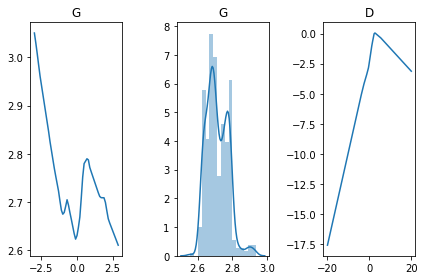

[Epoch 2604/50000] [D loss: -0.064417] [G loss: -0.030440]
[Epoch 2608/50000] [D loss: -0.079390] [G loss: -0.047549]
[Epoch 2612/50000] [D loss: -0.129488] [G loss: -0.022379]
[Epoch 2616/50000] [D loss: -0.159185] [G loss: 0.010276]
[Epoch 2620/50000] [D loss: -0.148245] [G loss: 0.002356]
[Epoch 2624/50000] [D loss: -0.126360] [G loss: -0.008556]
[Epoch 2628/50000] [D loss: -0.099375] [G loss: -0.007345]
[Epoch 2632/50000] [D loss: -0.066147] [G loss: -0.015720]
[Epoch 2636/50000] [D loss: -0.052545] [G loss: -0.017452]
[Epoch 2640/50000] [D loss: -0.073729] [G loss: 0.105689]
[Epoch 2644/50000] [D loss: -0.105293] [G loss: 0.108161]
[Epoch 2648/50000] [D loss: -0.121565] [G loss: 0.112798]
[Epoch 2652/50000] [D loss: -0.133351] [G loss: 0.070694]
[Epoch 2656/50000] [D loss: -0.141576] [G loss: 0.067079]
[Epoch 2660/50000] [D loss: -0.137469] [G loss: 0.046299]
[Epoch 2664/50000] [D loss: -0.126526] [G loss: 0.027470]
[Epoch 2668/50000] [D loss: -0.110784] [G loss: 0.007284]
[Epoch 

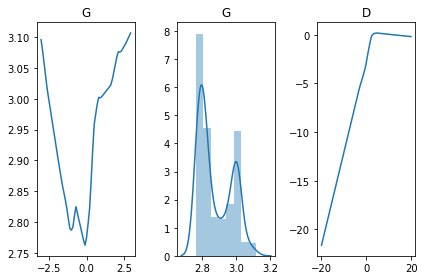

[Epoch 2704/50000] [D loss: -0.126466] [G loss: -0.006056]
[Epoch 2708/50000] [D loss: -0.096193] [G loss: -0.005861]
[Epoch 2712/50000] [D loss: -0.072978] [G loss: -0.004747]
[Epoch 2716/50000] [D loss: -0.055971] [G loss: -0.009209]
[Epoch 2720/50000] [D loss: -0.063387] [G loss: 0.058271]
[Epoch 2724/50000] [D loss: -0.103578] [G loss: 0.039529]
[Epoch 2728/50000] [D loss: -0.127052] [G loss: 0.046228]
[Epoch 2732/50000] [D loss: -0.135772] [G loss: 0.053202]
[Epoch 2736/50000] [D loss: -0.139988] [G loss: 0.050878]
[Epoch 2740/50000] [D loss: -0.136238] [G loss: 0.034962]
[Epoch 2744/50000] [D loss: -0.120709] [G loss: 0.019526]
[Epoch 2748/50000] [D loss: -0.103008] [G loss: 0.012824]
[Epoch 2752/50000] [D loss: -0.081085] [G loss: -0.023472]
[Epoch 2756/50000] [D loss: -0.065616] [G loss: -0.030509]
[Epoch 2760/50000] [D loss: -0.055494] [G loss: -0.036234]
[Epoch 2764/50000] [D loss: -0.061754] [G loss: -0.056470]
[Epoch 2768/50000] [D loss: -0.112625] [G loss: -0.047185]
[Epoc

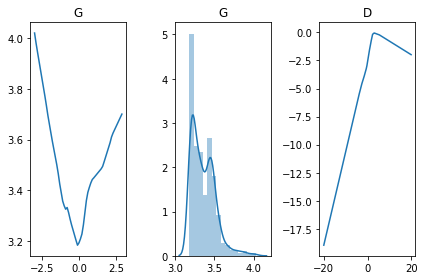

[Epoch 2804/50000] [D loss: -0.119360] [G loss: 0.100081]
[Epoch 2808/50000] [D loss: -0.134832] [G loss: 0.076881]
[Epoch 2812/50000] [D loss: -0.141336] [G loss: 0.059040]
[Epoch 2816/50000] [D loss: -0.136855] [G loss: 0.037336]
[Epoch 2820/50000] [D loss: -0.130323] [G loss: 0.038735]
[Epoch 2824/50000] [D loss: -0.109878] [G loss: 0.008239]
[Epoch 2828/50000] [D loss: -0.090357] [G loss: -0.003597]
[Epoch 2832/50000] [D loss: -0.067708] [G loss: -0.033744]
[Epoch 2836/50000] [D loss: -0.053635] [G loss: -0.038329]
[Epoch 2840/50000] [D loss: -0.054193] [G loss: -0.060087]
[Epoch 2844/50000] [D loss: -0.103473] [G loss: -0.046051]
[Epoch 2848/50000] [D loss: -0.149699] [G loss: -0.026441]
[Epoch 2852/50000] [D loss: -0.156814] [G loss: 0.008246]
[Epoch 2856/50000] [D loss: -0.149429] [G loss: 0.002143]
[Epoch 2860/50000] [D loss: -0.121714] [G loss: -0.003383]
[Epoch 2864/50000] [D loss: -0.098609] [G loss: -0.000821]
[Epoch 2868/50000] [D loss: -0.073401] [G loss: -0.008745]
[Epoc

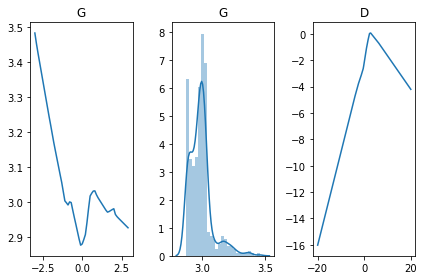

[Epoch 2904/50000] [D loss: -0.092332] [G loss: -0.017519]
[Epoch 2908/50000] [D loss: -0.073630] [G loss: -0.017400]
[Epoch 2912/50000] [D loss: -0.055015] [G loss: -0.042822]
[Epoch 2916/50000] [D loss: -0.053180] [G loss: -0.043333]
[Epoch 2920/50000] [D loss: -0.093305] [G loss: -0.044450]
[Epoch 2924/50000] [D loss: -0.143399] [G loss: -0.022017]
[Epoch 2928/50000] [D loss: -0.157256] [G loss: 0.008054]
[Epoch 2932/50000] [D loss: -0.143605] [G loss: 0.000121]
[Epoch 2936/50000] [D loss: -0.126444] [G loss: 0.001000]
[Epoch 2940/50000] [D loss: -0.096197] [G loss: 0.001546]
[Epoch 2944/50000] [D loss: -0.071737] [G loss: 0.003478]
[Epoch 2948/50000] [D loss: -0.059673] [G loss: -0.006798]
[Epoch 2952/50000] [D loss: -0.074700] [G loss: 0.079749]
[Epoch 2956/50000] [D loss: -0.110825] [G loss: 0.027833]
[Epoch 2960/50000] [D loss: -0.126201] [G loss: 0.052953]
[Epoch 2964/50000] [D loss: -0.134440] [G loss: 0.040980]
[Epoch 2968/50000] [D loss: -0.135629] [G loss: 0.041379]
[Epoch 

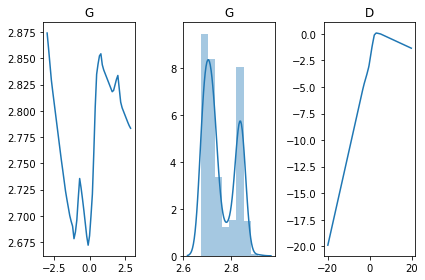

[Epoch 3004/50000] [D loss: -0.147513] [G loss: -0.000409]
[Epoch 3008/50000] [D loss: -0.134123] [G loss: -0.001373]
[Epoch 3012/50000] [D loss: -0.113602] [G loss: 0.000575]
[Epoch 3016/50000] [D loss: -0.081648] [G loss: 0.001150]
[Epoch 3020/50000] [D loss: -0.067710] [G loss: 0.001072]
[Epoch 3024/50000] [D loss: -0.062647] [G loss: -0.016346]
[Epoch 3028/50000] [D loss: -0.093888] [G loss: 0.125759]
[Epoch 3032/50000] [D loss: -0.119743] [G loss: 0.049057]
[Epoch 3036/50000] [D loss: -0.128248] [G loss: 0.030582]
[Epoch 3040/50000] [D loss: -0.131284] [G loss: 0.041784]
[Epoch 3044/50000] [D loss: -0.125754] [G loss: 0.027705]
[Epoch 3048/50000] [D loss: -0.112324] [G loss: 0.021538]
[Epoch 3052/50000] [D loss: -0.098827] [G loss: 0.006151]
[Epoch 3056/50000] [D loss: -0.079815] [G loss: -0.019178]
[Epoch 3060/50000] [D loss: -0.067265] [G loss: -0.030357]
[Epoch 3064/50000] [D loss: -0.061446] [G loss: -0.037704]
[Epoch 3068/50000] [D loss: -0.084743] [G loss: -0.001028]
[Epoch 

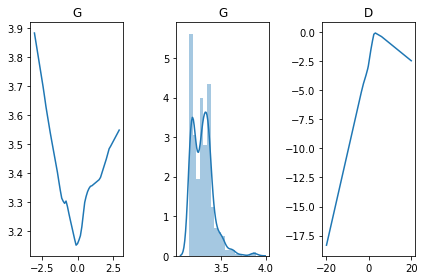

[Epoch 3104/50000] [D loss: -0.117301] [G loss: 0.043341]
[Epoch 3108/50000] [D loss: -0.128791] [G loss: 0.050228]
[Epoch 3112/50000] [D loss: -0.129258] [G loss: 0.046792]
[Epoch 3116/50000] [D loss: -0.120311] [G loss: 0.006663]
[Epoch 3120/50000] [D loss: -0.110023] [G loss: 0.008642]
[Epoch 3124/50000] [D loss: -0.094894] [G loss: 0.001997]
[Epoch 3128/50000] [D loss: -0.078509] [G loss: -0.017756]
[Epoch 3132/50000] [D loss: -0.068650] [G loss: -0.025918]
[Epoch 3136/50000] [D loss: -0.067459] [G loss: -0.026922]
[Epoch 3140/50000] [D loss: -0.095154] [G loss: 0.008985]
[Epoch 3144/50000] [D loss: -0.132767] [G loss: 0.003592]
[Epoch 3148/50000] [D loss: -0.140277] [G loss: 0.003489]
[Epoch 3152/50000] [D loss: -0.124896] [G loss: 0.002982]
[Epoch 3156/50000] [D loss: -0.107753] [G loss: 0.005505]
[Epoch 3160/50000] [D loss: -0.082136] [G loss: 0.006207]
[Epoch 3164/50000] [D loss: -0.065433] [G loss: 0.011052]
[Epoch 3168/50000] [D loss: -0.071073] [G loss: 0.016882]
[Epoch 3172

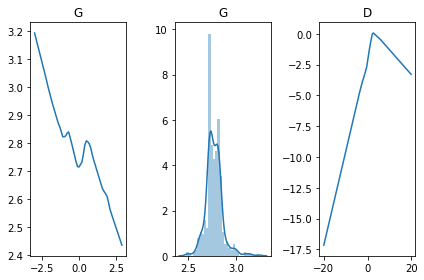

[Epoch 3204/50000] [D loss: -0.066087] [G loss: -0.031430]
[Epoch 3208/50000] [D loss: -0.074525] [G loss: -0.017980]
[Epoch 3212/50000] [D loss: -0.112975] [G loss: 0.003738]
[Epoch 3216/50000] [D loss: -0.139472] [G loss: 0.004183]
[Epoch 3220/50000] [D loss: -0.138373] [G loss: 0.001877]
[Epoch 3224/50000] [D loss: -0.118047] [G loss: 0.004909]
[Epoch 3228/50000] [D loss: -0.093520] [G loss: 0.005473]
[Epoch 3232/50000] [D loss: -0.073916] [G loss: 0.005931]
[Epoch 3236/50000] [D loss: -0.058758] [G loss: -0.008732]
[Epoch 3240/50000] [D loss: -0.086763] [G loss: 0.074876]
[Epoch 3244/50000] [D loss: -0.111617] [G loss: 0.094547]
[Epoch 3248/50000] [D loss: -0.125079] [G loss: 0.057750]
[Epoch 3252/50000] [D loss: -0.126226] [G loss: 0.062072]
[Epoch 3256/50000] [D loss: -0.121443] [G loss: 0.000900]
[Epoch 3260/50000] [D loss: -0.109005] [G loss: 0.036638]
[Epoch 3264/50000] [D loss: -0.094210] [G loss: -0.011064]
[Epoch 3268/50000] [D loss: -0.086012] [G loss: -0.008881]
[Epoch 32

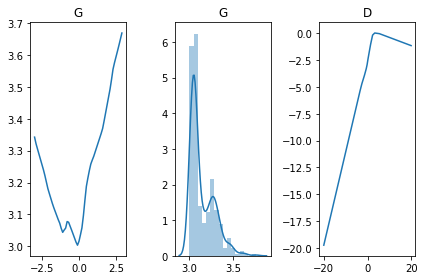

[Epoch 3304/50000] [D loss: -0.074105] [G loss: 0.012686]
[Epoch 3308/50000] [D loss: -0.071555] [G loss: -0.010912]
[Epoch 3312/50000] [D loss: -0.096812] [G loss: 0.077511]
[Epoch 3316/50000] [D loss: -0.117067] [G loss: 0.083408]
[Epoch 3320/50000] [D loss: -0.119457] [G loss: 0.083184]
[Epoch 3324/50000] [D loss: -0.111253] [G loss: 0.043177]
[Epoch 3328/50000] [D loss: -0.107146] [G loss: -0.008803]
[Epoch 3332/50000] [D loss: -0.092430] [G loss: -0.002737]
[Epoch 3336/50000] [D loss: -0.081484] [G loss: -0.015715]
[Epoch 3340/50000] [D loss: -0.071067] [G loss: -0.028601]
[Epoch 3344/50000] [D loss: -0.069088] [G loss: -0.034583]
[Epoch 3348/50000] [D loss: -0.091429] [G loss: 0.003204]
[Epoch 3352/50000] [D loss: -0.128150] [G loss: 0.000876]
[Epoch 3356/50000] [D loss: -0.135084] [G loss: 0.000126]
[Epoch 3360/50000] [D loss: -0.121942] [G loss: 0.000363]
[Epoch 3364/50000] [D loss: -0.104502] [G loss: 0.012888]
[Epoch 3368/50000] [D loss: -0.080270] [G loss: 0.009333]
[Epoch 3

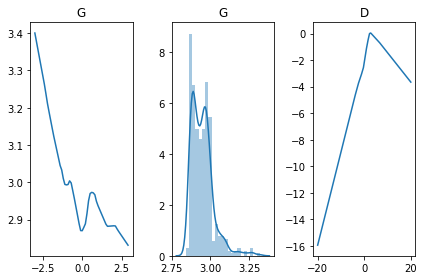

[Epoch 3404/50000] [D loss: -0.087864] [G loss: -0.010845]
[Epoch 3408/50000] [D loss: -0.076272] [G loss: -0.009082]
[Epoch 3412/50000] [D loss: -0.064246] [G loss: -0.036350]
[Epoch 3416/50000] [D loss: -0.068955] [G loss: -0.022936]
[Epoch 3420/50000] [D loss: -0.107073] [G loss: 0.007059]
[Epoch 3424/50000] [D loss: -0.134272] [G loss: -0.001859]
[Epoch 3428/50000] [D loss: -0.131453] [G loss: -0.003332]
[Epoch 3432/50000] [D loss: -0.121450] [G loss: 0.001439]
[Epoch 3436/50000] [D loss: -0.098963] [G loss: 0.004505]
[Epoch 3440/50000] [D loss: -0.076385] [G loss: 0.008626]
[Epoch 3444/50000] [D loss: -0.070011] [G loss: 0.027101]
[Epoch 3448/50000] [D loss: -0.076300] [G loss: 0.076997]
[Epoch 3452/50000] [D loss: -0.105202] [G loss: 0.043562]
[Epoch 3456/50000] [D loss: -0.115919] [G loss: 0.053758]
[Epoch 3460/50000] [D loss: -0.122684] [G loss: 0.032859]
[Epoch 3464/50000] [D loss: -0.121957] [G loss: 0.031596]
[Epoch 3468/50000] [D loss: -0.112936] [G loss: 0.022558]
[Epoch 3

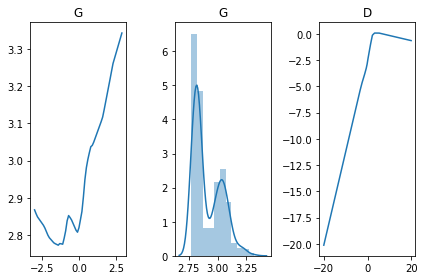

[Epoch 3504/50000] [D loss: -0.112866] [G loss: 0.002059]
[Epoch 3508/50000] [D loss: -0.091501] [G loss: 0.009674]
[Epoch 3512/50000] [D loss: -0.077571] [G loss: 0.021282]
[Epoch 3516/50000] [D loss: -0.068996] [G loss: 0.009842]
[Epoch 3520/50000] [D loss: -0.082455] [G loss: 0.112304]
[Epoch 3524/50000] [D loss: -0.106478] [G loss: 0.042900]
[Epoch 3528/50000] [D loss: -0.113111] [G loss: 0.116000]
[Epoch 3532/50000] [D loss: -0.114592] [G loss: 0.071088]
[Epoch 3536/50000] [D loss: -0.111222] [G loss: 0.006069]
[Epoch 3540/50000] [D loss: -0.105326] [G loss: 0.000039]
[Epoch 3544/50000] [D loss: -0.095483] [G loss: -0.019021]
[Epoch 3548/50000] [D loss: -0.085608] [G loss: -0.024241]
[Epoch 3552/50000] [D loss: -0.077156] [G loss: -0.016210]
[Epoch 3556/50000] [D loss: -0.073640] [G loss: -0.022254]
[Epoch 3560/50000] [D loss: -0.078936] [G loss: -0.016289]
[Epoch 3564/50000] [D loss: -0.097389] [G loss: -0.022209]
[Epoch 3568/50000] [D loss: -0.114765] [G loss: -0.018978]
[Epoch 

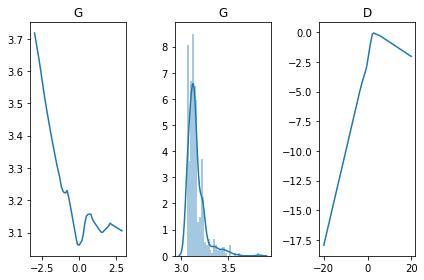

[Epoch 3604/50000] [D loss: -0.105782] [G loss: 0.059883]
[Epoch 3608/50000] [D loss: -0.106841] [G loss: 0.069167]
[Epoch 3612/50000] [D loss: -0.106152] [G loss: 0.036844]
[Epoch 3616/50000] [D loss: -0.097847] [G loss: 0.023518]
[Epoch 3620/50000] [D loss: -0.092952] [G loss: -0.022046]
[Epoch 3624/50000] [D loss: -0.089313] [G loss: 0.031906]
[Epoch 3628/50000] [D loss: -0.086398] [G loss: -0.022667]
[Epoch 3632/50000] [D loss: -0.086958] [G loss: 0.006587]
[Epoch 3636/50000] [D loss: -0.087516] [G loss: -0.047846]
[Epoch 3640/50000] [D loss: -0.094382] [G loss: -0.084672]
[Epoch 3644/50000] [D loss: -0.102389] [G loss: 0.022389]
[Epoch 3648/50000] [D loss: -0.106210] [G loss: -0.061380]
[Epoch 3652/50000] [D loss: -0.112404] [G loss: -0.070360]
[Epoch 3656/50000] [D loss: -0.112207] [G loss: -0.042776]
[Epoch 3660/50000] [D loss: -0.108569] [G loss: -0.029318]
[Epoch 3664/50000] [D loss: -0.107895] [G loss: -0.001680]
[Epoch 3668/50000] [D loss: -0.100182] [G loss: -0.001947]
[Epo

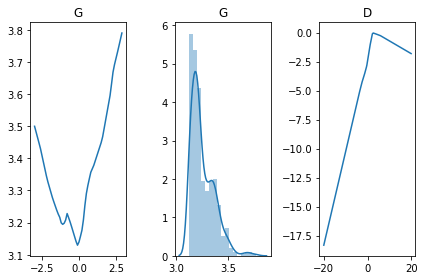

[Epoch 3704/50000] [D loss: -0.115740] [G loss: 0.116302]
[Epoch 3708/50000] [D loss: -0.120915] [G loss: -0.009084]
[Epoch 3712/50000] [D loss: -0.118889] [G loss: -0.005044]
[Epoch 3716/50000] [D loss: -0.112629] [G loss: 0.049133]
[Epoch 3720/50000] [D loss: -0.107117] [G loss: 0.006512]
[Epoch 3724/50000] [D loss: -0.093538] [G loss: -0.008478]
[Epoch 3728/50000] [D loss: -0.084519] [G loss: -0.005779]
[Epoch 3732/50000] [D loss: -0.077747] [G loss: -0.014424]
[Epoch 3736/50000] [D loss: -0.072142] [G loss: -0.052431]
[Epoch 3740/50000] [D loss: -0.078055] [G loss: -0.040353]
[Epoch 3744/50000] [D loss: -0.088105] [G loss: -0.025709]
[Epoch 3748/50000] [D loss: -0.103453] [G loss: -0.045388]
[Epoch 3752/50000] [D loss: -0.119341] [G loss: -0.076556]
[Epoch 3756/50000] [D loss: -0.132118] [G loss: -0.083373]
[Epoch 3760/50000] [D loss: -0.139141] [G loss: -0.039470]
[Epoch 3764/50000] [D loss: -0.137528] [G loss: -0.005937]
[Epoch 3768/50000] [D loss: -0.126757] [G loss: 0.008096]
[

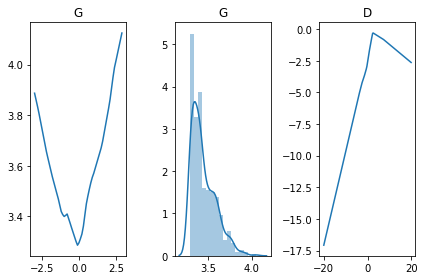

[Epoch 3804/50000] [D loss: -0.130310] [G loss: 0.597216]
[Epoch 3808/50000] [D loss: -0.136219] [G loss: 0.686630]
[Epoch 3812/50000] [D loss: -0.119367] [G loss: 0.572627]
[Epoch 3816/50000] [D loss: -0.105874] [G loss: 0.254983]
[Epoch 3820/50000] [D loss: -0.095885] [G loss: -0.006384]
[Epoch 3824/50000] [D loss: -0.085751] [G loss: 0.008162]
[Epoch 3828/50000] [D loss: -0.075231] [G loss: -0.046991]
[Epoch 3832/50000] [D loss: -0.067503] [G loss: -0.040930]
[Epoch 3836/50000] [D loss: -0.070941] [G loss: -0.026898]
[Epoch 3840/50000] [D loss: -0.081956] [G loss: -0.045380]
[Epoch 3844/50000] [D loss: -0.099477] [G loss: -0.102760]
[Epoch 3848/50000] [D loss: -0.122446] [G loss: -0.190273]
[Epoch 3852/50000] [D loss: -0.136358] [G loss: -0.242217]
[Epoch 3856/50000] [D loss: -0.139059] [G loss: -0.232371]
[Epoch 3860/50000] [D loss: -0.130093] [G loss: -0.108285]
[Epoch 3864/50000] [D loss: -0.122175] [G loss: -0.029285]
[Epoch 3868/50000] [D loss: -0.106700] [G loss: -0.017555]
[E

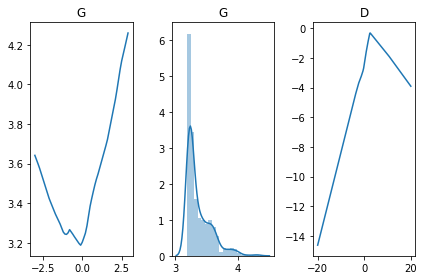

[Epoch 3904/50000] [D loss: -0.138590] [G loss: 0.556836]
[Epoch 3908/50000] [D loss: -0.125781] [G loss: 0.414544]
[Epoch 3912/50000] [D loss: -0.111240] [G loss: 0.087934]
[Epoch 3916/50000] [D loss: -0.105076] [G loss: 0.015668]
[Epoch 3920/50000] [D loss: -0.089123] [G loss: -0.028109]
[Epoch 3924/50000] [D loss: -0.075339] [G loss: -0.022807]
[Epoch 3928/50000] [D loss: -0.069683] [G loss: -0.026735]
[Epoch 3932/50000] [D loss: -0.068130] [G loss: -0.058333]
[Epoch 3936/50000] [D loss: -0.076967] [G loss: -0.064460]
[Epoch 3940/50000] [D loss: -0.092823] [G loss: -0.120098]
[Epoch 3944/50000] [D loss: -0.115319] [G loss: -0.202375]
[Epoch 3948/50000] [D loss: -0.132052] [G loss: -0.271338]
[Epoch 3952/50000] [D loss: -0.139886] [G loss: -0.278095]
[Epoch 3956/50000] [D loss: -0.130108] [G loss: -0.192675]
[Epoch 3960/50000] [D loss: -0.121666] [G loss: 0.036848]
[Epoch 3964/50000] [D loss: -0.107264] [G loss: 0.002860]
[Epoch 3968/50000] [D loss: -0.093279] [G loss: 0.002431]
[Epo

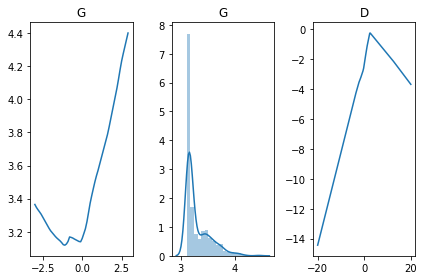

[Epoch 4004/50000] [D loss: -0.130837] [G loss: 0.386392]
[Epoch 4008/50000] [D loss: -0.120186] [G loss: 0.182180]
[Epoch 4012/50000] [D loss: -0.123958] [G loss: 0.059868]
[Epoch 4016/50000] [D loss: -0.106383] [G loss: 0.014504]
[Epoch 4020/50000] [D loss: -0.086308] [G loss: -0.026049]
[Epoch 4024/50000] [D loss: -0.076337] [G loss: -0.023474]
[Epoch 4028/50000] [D loss: -0.070699] [G loss: -0.026332]
[Epoch 4032/50000] [D loss: -0.066925] [G loss: -0.039091]
[Epoch 4036/50000] [D loss: -0.075341] [G loss: -0.060492]
[Epoch 4040/50000] [D loss: -0.093382] [G loss: -0.125665]
[Epoch 4044/50000] [D loss: -0.114996] [G loss: -0.218287]
[Epoch 4048/50000] [D loss: -0.130655] [G loss: -0.275107]
[Epoch 4052/50000] [D loss: -0.134097] [G loss: -0.281980]
[Epoch 4056/50000] [D loss: -0.128372] [G loss: -0.182403]
[Epoch 4060/50000] [D loss: -0.124444] [G loss: 0.045492]
[Epoch 4064/50000] [D loss: -0.108559] [G loss: -0.006014]
[Epoch 4068/50000] [D loss: -0.095398] [G loss: -0.000781]
[E

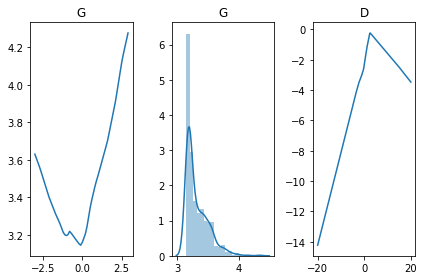

[Epoch 4104/50000] [D loss: -0.133502] [G loss: 0.352737]
[Epoch 4108/50000] [D loss: -0.125120] [G loss: 0.181422]
[Epoch 4112/50000] [D loss: -0.118837] [G loss: 0.051303]
[Epoch 4116/50000] [D loss: -0.107168] [G loss: 0.009586]
[Epoch 4120/50000] [D loss: -0.090274] [G loss: -0.007621]
[Epoch 4124/50000] [D loss: -0.078418] [G loss: -0.013399]
[Epoch 4128/50000] [D loss: -0.068152] [G loss: -0.032908]
[Epoch 4132/50000] [D loss: -0.066290] [G loss: -0.031480]
[Epoch 4136/50000] [D loss: -0.072243] [G loss: -0.064347]
[Epoch 4140/50000] [D loss: -0.089174] [G loss: -0.128885]
[Epoch 4144/50000] [D loss: -0.110825] [G loss: -0.224687]
[Epoch 4148/50000] [D loss: -0.130631] [G loss: -0.303412]
[Epoch 4152/50000] [D loss: -0.134273] [G loss: -0.334008]
[Epoch 4156/50000] [D loss: -0.126628] [G loss: -0.271102]
[Epoch 4160/50000] [D loss: -0.116253] [G loss: -0.063819]
[Epoch 4164/50000] [D loss: -0.107649] [G loss: -0.006269]
[Epoch 4168/50000] [D loss: -0.092368] [G loss: 0.009180]
[E

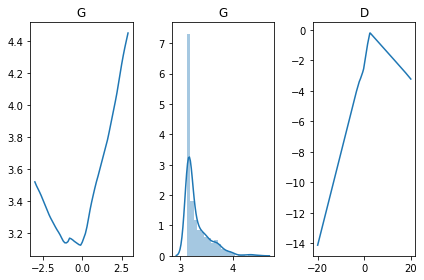

[Epoch 4204/50000] [D loss: -0.135569] [G loss: 0.322067]
[Epoch 4208/50000] [D loss: -0.127163] [G loss: 0.166505]
[Epoch 4212/50000] [D loss: -0.118140] [G loss: 0.053334]
[Epoch 4216/50000] [D loss: -0.105687] [G loss: 0.007739]
[Epoch 4220/50000] [D loss: -0.089764] [G loss: -0.015082]
[Epoch 4224/50000] [D loss: -0.075305] [G loss: -0.025110]
[Epoch 4228/50000] [D loss: -0.071470] [G loss: -0.032461]
[Epoch 4232/50000] [D loss: -0.069077] [G loss: -0.026081]
[Epoch 4236/50000] [D loss: -0.073193] [G loss: -0.043061]
[Epoch 4240/50000] [D loss: -0.086779] [G loss: -0.102359]
[Epoch 4244/50000] [D loss: -0.107538] [G loss: -0.188812]
[Epoch 4248/50000] [D loss: -0.127869] [G loss: -0.266275]
[Epoch 4252/50000] [D loss: -0.137296] [G loss: -0.306887]
[Epoch 4256/50000] [D loss: -0.132704] [G loss: -0.269816]
[Epoch 4260/50000] [D loss: -0.124894] [G loss: -0.112473]
[Epoch 4264/50000] [D loss: -0.114765] [G loss: -0.021704]
[Epoch 4268/50000] [D loss: -0.098911] [G loss: 0.000323]
[E

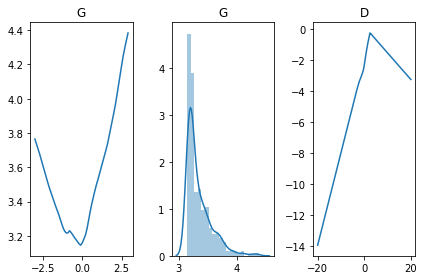

[Epoch 4304/50000] [D loss: -0.131957] [G loss: 0.419466]
[Epoch 4308/50000] [D loss: -0.124227] [G loss: 0.283908]
[Epoch 4312/50000] [D loss: -0.122784] [G loss: -0.014126]
[Epoch 4316/50000] [D loss: -0.107574] [G loss: 0.011876]
[Epoch 4320/50000] [D loss: -0.094295] [G loss: -0.008832]
[Epoch 4324/50000] [D loss: -0.085015] [G loss: -0.009441]
[Epoch 4328/50000] [D loss: -0.071771] [G loss: -0.027013]
[Epoch 4332/50000] [D loss: -0.069129] [G loss: -0.029430]
[Epoch 4336/50000] [D loss: -0.071473] [G loss: -0.038395]
[Epoch 4340/50000] [D loss: -0.084161] [G loss: -0.079058]
[Epoch 4344/50000] [D loss: -0.104462] [G loss: -0.156670]
[Epoch 4348/50000] [D loss: -0.127437] [G loss: -0.228093]
[Epoch 4352/50000] [D loss: -0.146410] [G loss: -0.265663]
[Epoch 4356/50000] [D loss: -0.150716] [G loss: -0.182408]
[Epoch 4360/50000] [D loss: -0.136847] [G loss: -0.059452]
[Epoch 4364/50000] [D loss: -0.116305] [G loss: -0.005625]
[Epoch 4368/50000] [D loss: -0.074912] [G loss: 0.013902]
[

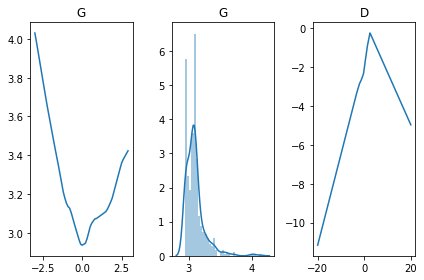

[Epoch 4404/50000] [D loss: -0.113459] [G loss: -0.094379]
[Epoch 4408/50000] [D loss: -0.094168] [G loss: -0.035059]
[Epoch 4412/50000] [D loss: -0.076833] [G loss: -0.045012]
[Epoch 4416/50000] [D loss: -0.067159] [G loss: -0.057230]
[Epoch 4420/50000] [D loss: -0.065228] [G loss: -0.037045]
[Epoch 4424/50000] [D loss: -0.071472] [G loss: -0.044607]
[Epoch 4428/50000] [D loss: -0.085932] [G loss: -0.120842]
[Epoch 4432/50000] [D loss: -0.107910] [G loss: -0.248087]
[Epoch 4436/50000] [D loss: -0.134536] [G loss: -0.398085]
[Epoch 4440/50000] [D loss: -0.134776] [G loss: -0.469648]
[Epoch 4444/50000] [D loss: -0.125675] [G loss: -0.373691]
[Epoch 4448/50000] [D loss: -0.115241] [G loss: -0.053857]
[Epoch 4452/50000] [D loss: -0.099720] [G loss: -0.005257]
[Epoch 4456/50000] [D loss: -0.086911] [G loss: 0.006471]
[Epoch 4460/50000] [D loss: -0.077587] [G loss: 0.057660]
[Epoch 4464/50000] [D loss: -0.070877] [G loss: 0.072622]
[Epoch 4468/50000] [D loss: -0.070327] [G loss: 0.049446]
[

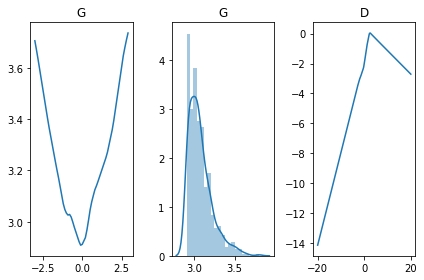

[Epoch 4504/50000] [D loss: -0.109868] [G loss: 0.013225]
[Epoch 4508/50000] [D loss: -0.097814] [G loss: 0.021899]
[Epoch 4512/50000] [D loss: -0.086078] [G loss: 0.002630]
[Epoch 4516/50000] [D loss: -0.075137] [G loss: -0.043997]
[Epoch 4520/50000] [D loss: -0.071437] [G loss: -0.034996]
[Epoch 4524/50000] [D loss: -0.075088] [G loss: -0.034329]
[Epoch 4528/50000] [D loss: -0.081792] [G loss: -0.061614]
[Epoch 4532/50000] [D loss: -0.099253] [G loss: -0.154018]
[Epoch 4536/50000] [D loss: -0.118197] [G loss: -0.266628]
[Epoch 4540/50000] [D loss: -0.131640] [G loss: -0.340294]
[Epoch 4544/50000] [D loss: -0.127418] [G loss: -0.316349]
[Epoch 4548/50000] [D loss: -0.116890] [G loss: -0.154920]
[Epoch 4552/50000] [D loss: -0.113309] [G loss: -0.043664]
[Epoch 4556/50000] [D loss: -0.101783] [G loss: -0.053920]
[Epoch 4560/50000] [D loss: -0.088022] [G loss: -0.023605]
[Epoch 4564/50000] [D loss: -0.077611] [G loss: -0.034781]
[Epoch 4568/50000] [D loss: -0.068593] [G loss: 0.079922]
[

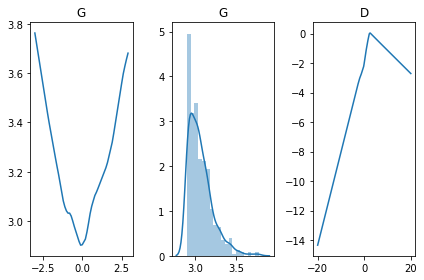

[Epoch 4604/50000] [D loss: -0.107283] [G loss: 0.009776]
[Epoch 4608/50000] [D loss: -0.094536] [G loss: 0.010740]
[Epoch 4612/50000] [D loss: -0.083625] [G loss: -0.026380]
[Epoch 4616/50000] [D loss: -0.073291] [G loss: -0.025144]
[Epoch 4620/50000] [D loss: -0.071143] [G loss: -0.031375]
[Epoch 4624/50000] [D loss: -0.075505] [G loss: -0.032560]
[Epoch 4628/50000] [D loss: -0.086086] [G loss: -0.060290]
[Epoch 4632/50000] [D loss: -0.101684] [G loss: -0.132728]
[Epoch 4636/50000] [D loss: -0.122819] [G loss: -0.226529]
[Epoch 4640/50000] [D loss: -0.133293] [G loss: -0.295131]
[Epoch 4644/50000] [D loss: -0.131206] [G loss: -0.275606]
[Epoch 4648/50000] [D loss: -0.117341] [G loss: -0.114548]
[Epoch 4652/50000] [D loss: -0.111996] [G loss: -0.014332]
[Epoch 4656/50000] [D loss: -0.100532] [G loss: 0.006954]
[Epoch 4660/50000] [D loss: -0.086391] [G loss: 0.014526]
[Epoch 4664/50000] [D loss: -0.075293] [G loss: 0.009455]
[Epoch 4668/50000] [D loss: -0.072371] [G loss: 0.025584]
[Ep

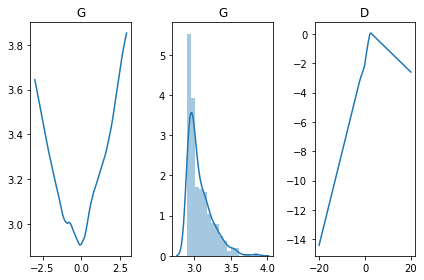

[Epoch 4704/50000] [D loss: -0.110751] [G loss: 0.019225]
[Epoch 4708/50000] [D loss: -0.096727] [G loss: -0.006122]
[Epoch 4712/50000] [D loss: -0.083073] [G loss: -0.007413]
[Epoch 4716/50000] [D loss: -0.073181] [G loss: -0.028950]
[Epoch 4720/50000] [D loss: -0.071808] [G loss: -0.032854]
[Epoch 4724/50000] [D loss: -0.073728] [G loss: -0.035225]
[Epoch 4728/50000] [D loss: -0.084393] [G loss: -0.069413]
[Epoch 4732/50000] [D loss: -0.101701] [G loss: -0.144536]
[Epoch 4736/50000] [D loss: -0.120164] [G loss: -0.228761]
[Epoch 4740/50000] [D loss: -0.128635] [G loss: -0.280285]
[Epoch 4744/50000] [D loss: -0.135483] [G loss: -0.257678]
[Epoch 4748/50000] [D loss: -0.121169] [G loss: -0.106205]
[Epoch 4752/50000] [D loss: -0.115111] [G loss: -0.013195]
[Epoch 4756/50000] [D loss: -0.099894] [G loss: 0.006474]
[Epoch 4760/50000] [D loss: -0.087753] [G loss: 0.010360]
[Epoch 4764/50000] [D loss: -0.078292] [G loss: 0.009653]
[Epoch 4768/50000] [D loss: -0.072596] [G loss: -0.003990]
[

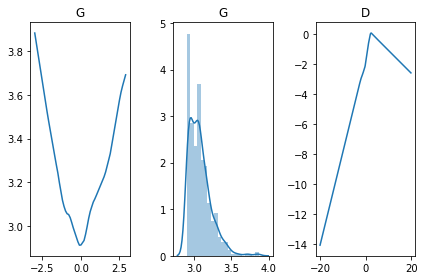

[Epoch 4804/50000] [D loss: -0.111591] [G loss: 0.007301]
[Epoch 4808/50000] [D loss: -0.096786] [G loss: -0.002174]
[Epoch 4812/50000] [D loss: -0.083820] [G loss: -0.010305]
[Epoch 4816/50000] [D loss: -0.075638] [G loss: -0.016995]
[Epoch 4820/50000] [D loss: -0.069918] [G loss: -0.027102]
[Epoch 4824/50000] [D loss: -0.073758] [G loss: -0.047151]
[Epoch 4828/50000] [D loss: -0.085954] [G loss: -0.087872]
[Epoch 4832/50000] [D loss: -0.103366] [G loss: -0.156861]
[Epoch 4836/50000] [D loss: -0.120619] [G loss: -0.219229]
[Epoch 4840/50000] [D loss: -0.135890] [G loss: -0.260585]
[Epoch 4844/50000] [D loss: -0.129970] [G loss: -0.216529]
[Epoch 4848/50000] [D loss: -0.123022] [G loss: 0.014600]
[Epoch 4852/50000] [D loss: -0.112131] [G loss: 0.035833]
[Epoch 4856/50000] [D loss: -0.095860] [G loss: 0.006484]
[Epoch 4860/50000] [D loss: -0.079848] [G loss: 0.022277]
[Epoch 4864/50000] [D loss: -0.070102] [G loss: 0.002438]
[Epoch 4868/50000] [D loss: -0.062604] [G loss: 0.005376]
[Epo

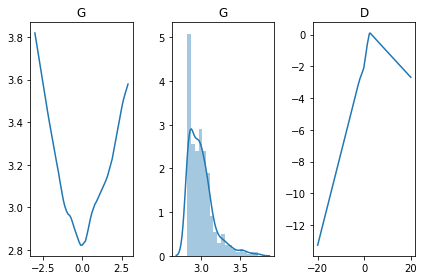

[Epoch 4904/50000] [D loss: -0.094387] [G loss: 0.005511]
[Epoch 4908/50000] [D loss: -0.081037] [G loss: -0.027174]
[Epoch 4912/50000] [D loss: -0.072296] [G loss: -0.033232]
[Epoch 4916/50000] [D loss: -0.068737] [G loss: -0.033294]
[Epoch 4920/50000] [D loss: -0.072866] [G loss: -0.043846]
[Epoch 4924/50000] [D loss: -0.084560] [G loss: -0.100767]
[Epoch 4928/50000] [D loss: -0.104076] [G loss: -0.192245]
[Epoch 4932/50000] [D loss: -0.122938] [G loss: -0.283665]
[Epoch 4936/50000] [D loss: -0.133951] [G loss: -0.340876]
[Epoch 4940/50000] [D loss: -0.126490] [G loss: -0.304797]
[Epoch 4944/50000] [D loss: -0.117878] [G loss: -0.114712]
[Epoch 4948/50000] [D loss: -0.112315] [G loss: -0.032960]
[Epoch 4952/50000] [D loss: -0.092045] [G loss: 0.009698]
[Epoch 4956/50000] [D loss: -0.082195] [G loss: -0.000515]
[Epoch 4960/50000] [D loss: -0.074455] [G loss: 0.016778]
[Epoch 4964/50000] [D loss: -0.074050] [G loss: -0.007220]
[Epoch 4968/50000] [D loss: -0.076257] [G loss: 0.073769]
[

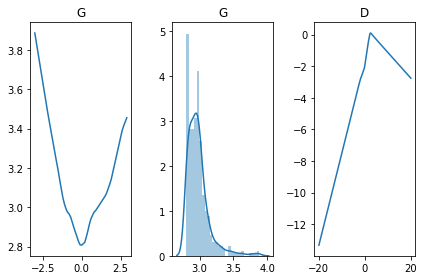

[Epoch 5004/50000] [D loss: -0.094517] [G loss: 0.009304]
[Epoch 5008/50000] [D loss: -0.079857] [G loss: -0.025714]
[Epoch 5012/50000] [D loss: -0.072383] [G loss: -0.026841]
[Epoch 5016/50000] [D loss: -0.071929] [G loss: -0.034755]
[Epoch 5020/50000] [D loss: -0.077974] [G loss: -0.054623]
[Epoch 5024/50000] [D loss: -0.092025] [G loss: -0.110423]
[Epoch 5028/50000] [D loss: -0.111903] [G loss: -0.191268]
[Epoch 5032/50000] [D loss: -0.128637] [G loss: -0.260639]
[Epoch 5036/50000] [D loss: -0.129344] [G loss: -0.277786]
[Epoch 5040/50000] [D loss: -0.124607] [G loss: -0.200365]
[Epoch 5044/50000] [D loss: -0.121509] [G loss: -0.003849]
[Epoch 5048/50000] [D loss: -0.109761] [G loss: -0.006415]
[Epoch 5052/50000] [D loss: -0.095422] [G loss: 0.004198]
[Epoch 5056/50000] [D loss: -0.085505] [G loss: 0.018091]
[Epoch 5060/50000] [D loss: -0.074276] [G loss: 0.016649]
[Epoch 5064/50000] [D loss: -0.072687] [G loss: -0.000871]
[Epoch 5068/50000] [D loss: -0.074710] [G loss: 0.015991]
[E

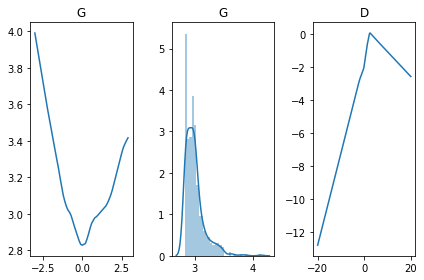

[Epoch 5104/50000] [D loss: -0.094576] [G loss: -0.011832]
[Epoch 5108/50000] [D loss: -0.085250] [G loss: -0.004479]
[Epoch 5112/50000] [D loss: -0.076386] [G loss: -0.024957]
[Epoch 5116/50000] [D loss: -0.073152] [G loss: -0.026482]
[Epoch 5120/50000] [D loss: -0.073650] [G loss: -0.036841]
[Epoch 5124/50000] [D loss: -0.082229] [G loss: -0.066447]
[Epoch 5128/50000] [D loss: -0.096848] [G loss: -0.126545]
[Epoch 5132/50000] [D loss: -0.113688] [G loss: -0.201314]
[Epoch 5136/50000] [D loss: -0.127837] [G loss: -0.248718]
[Epoch 5140/50000] [D loss: -0.128707] [G loss: -0.243691]
[Epoch 5144/50000] [D loss: -0.123455] [G loss: -0.159607]
[Epoch 5148/50000] [D loss: -0.121719] [G loss: 0.036943]
[Epoch 5152/50000] [D loss: -0.111801] [G loss: -0.006416]
[Epoch 5156/50000] [D loss: -0.098400] [G loss: 0.010381]
[Epoch 5160/50000] [D loss: -0.086867] [G loss: 0.004736]
[Epoch 5164/50000] [D loss: -0.080601] [G loss: 0.001523]
[Epoch 5168/50000] [D loss: -0.073354] [G loss: -0.004562]
[

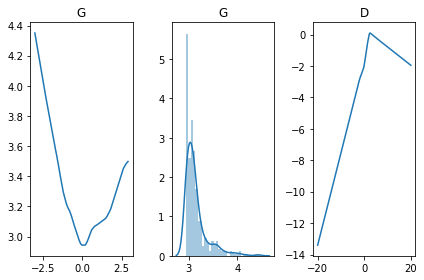

[Epoch 5204/50000] [D loss: -0.116142] [G loss: 0.040085]
[Epoch 5208/50000] [D loss: -0.107604] [G loss: 0.016083]
[Epoch 5212/50000] [D loss: -0.092799] [G loss: -0.006913]
[Epoch 5216/50000] [D loss: -0.083607] [G loss: -0.014955]
[Epoch 5220/50000] [D loss: -0.076106] [G loss: -0.020688]
[Epoch 5224/50000] [D loss: -0.075150] [G loss: -0.024894]
[Epoch 5228/50000] [D loss: -0.076212] [G loss: -0.047001]
[Epoch 5232/50000] [D loss: -0.087127] [G loss: -0.072812]
[Epoch 5236/50000] [D loss: -0.102990] [G loss: -0.132463]
[Epoch 5240/50000] [D loss: -0.116812] [G loss: -0.203055]
[Epoch 5244/50000] [D loss: -0.125293] [G loss: -0.235883]
[Epoch 5248/50000] [D loss: -0.129590] [G loss: -0.212667]
[Epoch 5252/50000] [D loss: -0.125879] [G loss: -0.106602]
[Epoch 5256/50000] [D loss: -0.113806] [G loss: -0.005930]
[Epoch 5260/50000] [D loss: -0.102369] [G loss: 0.002776]
[Epoch 5264/50000] [D loss: -0.093924] [G loss: -0.008759]
[Epoch 5268/50000] [D loss: -0.080721] [G loss: 0.013297]
[

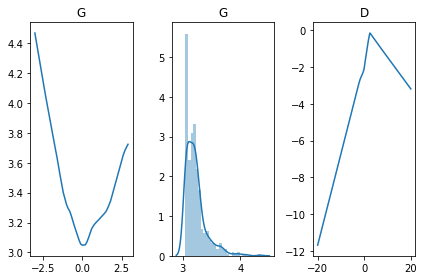

[Epoch 5304/50000] [D loss: -0.125678] [G loss: 0.180683]
[Epoch 5308/50000] [D loss: -0.117496] [G loss: 0.039673]
[Epoch 5312/50000] [D loss: -0.109088] [G loss: 0.017388]
[Epoch 5316/50000] [D loss: -0.095827] [G loss: -0.003583]
[Epoch 5320/50000] [D loss: -0.084215] [G loss: -0.012745]
[Epoch 5324/50000] [D loss: -0.079790] [G loss: -0.018623]
[Epoch 5328/50000] [D loss: -0.072342] [G loss: -0.029778]
[Epoch 5332/50000] [D loss: -0.072668] [G loss: -0.049154]
[Epoch 5336/50000] [D loss: -0.083936] [G loss: -0.090583]
[Epoch 5340/50000] [D loss: -0.099991] [G loss: -0.160671]
[Epoch 5344/50000] [D loss: -0.115582] [G loss: -0.233124]
[Epoch 5348/50000] [D loss: -0.122216] [G loss: -0.258772]
[Epoch 5352/50000] [D loss: -0.127577] [G loss: -0.226350]
[Epoch 5356/50000] [D loss: -0.120864] [G loss: -0.113911]
[Epoch 5360/50000] [D loss: -0.113801] [G loss: -0.003224]
[Epoch 5364/50000] [D loss: -0.105305] [G loss: 0.000944]
[Epoch 5368/50000] [D loss: -0.090761] [G loss: 0.008900]
[E

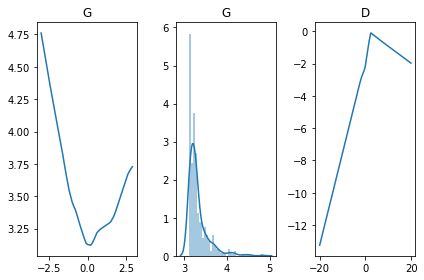

[Epoch 5404/50000] [D loss: -0.128806] [G loss: 0.208162]
[Epoch 5408/50000] [D loss: -0.128461] [G loss: 0.116015]
[Epoch 5412/50000] [D loss: -0.126553] [G loss: 0.040280]
[Epoch 5416/50000] [D loss: -0.117099] [G loss: 0.017768]
[Epoch 5420/50000] [D loss: -0.104169] [G loss: 0.004523]
[Epoch 5424/50000] [D loss: -0.088919] [G loss: -0.009355]
[Epoch 5428/50000] [D loss: -0.077476] [G loss: -0.022318]
[Epoch 5432/50000] [D loss: -0.072889] [G loss: -0.029358]
[Epoch 5436/50000] [D loss: -0.070790] [G loss: -0.037444]
[Epoch 5440/50000] [D loss: -0.075634] [G loss: -0.053517]
[Epoch 5444/50000] [D loss: -0.085267] [G loss: -0.104815]
[Epoch 5448/50000] [D loss: -0.102871] [G loss: -0.185936]
[Epoch 5452/50000] [D loss: -0.118675] [G loss: -0.271701]
[Epoch 5456/50000] [D loss: -0.134728] [G loss: -0.324923]
[Epoch 5460/50000] [D loss: -0.124568] [G loss: -0.315383]
[Epoch 5464/50000] [D loss: -0.112008] [G loss: -0.186292]
[Epoch 5468/50000] [D loss: -0.112131] [G loss: 0.035865]
[Ep

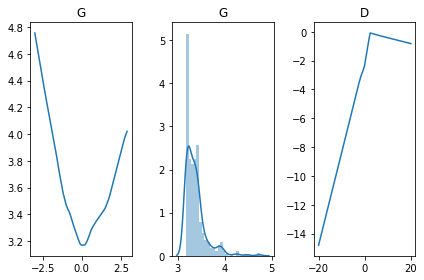

[Epoch 5504/50000] [D loss: -0.117667] [G loss: 0.203262]
[Epoch 5508/50000] [D loss: -0.127726] [G loss: 0.240374]
[Epoch 5512/50000] [D loss: -0.123868] [G loss: 0.203365]
[Epoch 5516/50000] [D loss: -0.123505] [G loss: 0.049854]
[Epoch 5520/50000] [D loss: -0.120671] [G loss: 0.018294]
[Epoch 5524/50000] [D loss: -0.108309] [G loss: 0.012169]
[Epoch 5528/50000] [D loss: -0.097145] [G loss: -0.003688]
[Epoch 5532/50000] [D loss: -0.081109] [G loss: -0.022097]
[Epoch 5536/50000] [D loss: -0.073803] [G loss: -0.025030]
[Epoch 5540/50000] [D loss: -0.071390] [G loss: -0.027467]
[Epoch 5544/50000] [D loss: -0.071708] [G loss: -0.053434]
[Epoch 5548/50000] [D loss: -0.081908] [G loss: -0.095988]
[Epoch 5552/50000] [D loss: -0.098705] [G loss: -0.167274]
[Epoch 5556/50000] [D loss: -0.117673] [G loss: -0.242457]
[Epoch 5560/50000] [D loss: -0.127126] [G loss: -0.295037]
[Epoch 5564/50000] [D loss: -0.128029] [G loss: -0.296931]
[Epoch 5568/50000] [D loss: -0.119960] [G loss: -0.172106]
[Ep

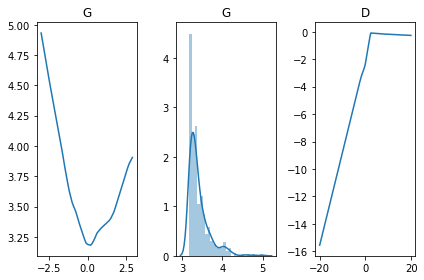

[Epoch 5604/50000] [D loss: -0.106231] [G loss: 0.201881]
[Epoch 5608/50000] [D loss: -0.120015] [G loss: 0.287410]
[Epoch 5612/50000] [D loss: -0.125265] [G loss: 0.295997]
[Epoch 5616/50000] [D loss: -0.126324] [G loss: 0.214197]
[Epoch 5620/50000] [D loss: -0.121567] [G loss: 0.001093]
[Epoch 5624/50000] [D loss: -0.116902] [G loss: 0.035648]
[Epoch 5628/50000] [D loss: -0.106686] [G loss: 0.007477]
[Epoch 5632/50000] [D loss: -0.091888] [G loss: -0.004821]
[Epoch 5636/50000] [D loss: -0.080991] [G loss: -0.013549]
[Epoch 5640/50000] [D loss: -0.070225] [G loss: -0.026787]
[Epoch 5644/50000] [D loss: -0.073320] [G loss: -0.030765]
[Epoch 5648/50000] [D loss: -0.076723] [G loss: -0.053620]
[Epoch 5652/50000] [D loss: -0.087193] [G loss: -0.097190]
[Epoch 5656/50000] [D loss: -0.101986] [G loss: -0.164732]
[Epoch 5660/50000] [D loss: -0.115312] [G loss: -0.229501]
[Epoch 5664/50000] [D loss: -0.128725] [G loss: -0.270977]
[Epoch 5668/50000] [D loss: -0.127762] [G loss: -0.251055]
[Epo

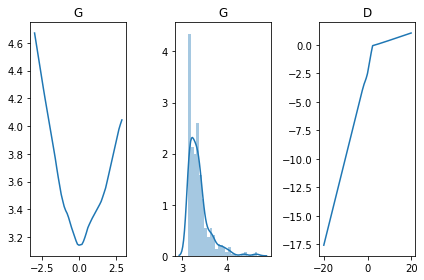

[Epoch 5704/50000] [D loss: -0.085442] [G loss: 0.063780]
[Epoch 5708/50000] [D loss: -0.096414] [G loss: 0.120021]
[Epoch 5712/50000] [D loss: -0.110442] [G loss: 0.215641]
[Epoch 5716/50000] [D loss: -0.122058] [G loss: 0.277208]
[Epoch 5720/50000] [D loss: -0.127664] [G loss: 0.276646]
[Epoch 5724/50000] [D loss: -0.121283] [G loss: 0.154376]
[Epoch 5728/50000] [D loss: -0.121813] [G loss: 0.066158]
[Epoch 5732/50000] [D loss: -0.105976] [G loss: 0.004837]
[Epoch 5736/50000] [D loss: -0.095448] [G loss: -0.005621]
[Epoch 5740/50000] [D loss: -0.085870] [G loss: -0.005778]
[Epoch 5744/50000] [D loss: -0.074141] [G loss: -0.027795]
[Epoch 5748/50000] [D loss: -0.072790] [G loss: -0.028575]
[Epoch 5752/50000] [D loss: -0.076174] [G loss: -0.034844]
[Epoch 5756/50000] [D loss: -0.083661] [G loss: -0.070606]
[Epoch 5760/50000] [D loss: -0.097893] [G loss: -0.129247]
[Epoch 5764/50000] [D loss: -0.112869] [G loss: -0.204483]
[Epoch 5768/50000] [D loss: -0.129950] [G loss: -0.261228]
[Epoc

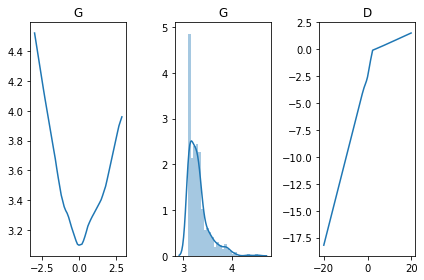

[Epoch 5804/50000] [D loss: -0.078654] [G loss: 0.022338]
[Epoch 5808/50000] [D loss: -0.085801] [G loss: 0.039477]
[Epoch 5812/50000] [D loss: -0.096732] [G loss: 0.106881]
[Epoch 5816/50000] [D loss: -0.109925] [G loss: 0.189840]
[Epoch 5820/50000] [D loss: -0.120306] [G loss: 0.249782]
[Epoch 5824/50000] [D loss: -0.125774] [G loss: 0.218432]
[Epoch 5828/50000] [D loss: -0.121943] [G loss: 0.094419]
[Epoch 5832/50000] [D loss: -0.122128] [G loss: 0.065102]
[Epoch 5836/50000] [D loss: -0.112429] [G loss: 0.007715]
[Epoch 5840/50000] [D loss: -0.099245] [G loss: 0.010838]
[Epoch 5844/50000] [D loss: -0.087986] [G loss: -0.011674]
[Epoch 5848/50000] [D loss: -0.076189] [G loss: -0.023451]
[Epoch 5852/50000] [D loss: -0.069459] [G loss: -0.030528]
[Epoch 5856/50000] [D loss: -0.074436] [G loss: -0.036744]
[Epoch 5860/50000] [D loss: -0.082213] [G loss: -0.065422]
[Epoch 5864/50000] [D loss: -0.096872] [G loss: -0.137944]
[Epoch 5868/50000] [D loss: -0.114667] [G loss: -0.211551]
[Epoch 

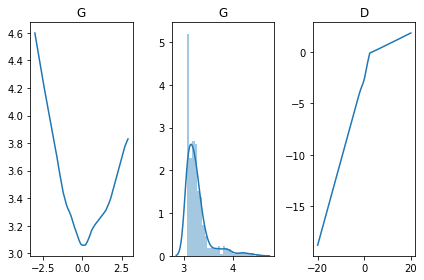

[Epoch 5904/50000] [D loss: -0.076712] [G loss: -0.000023]
[Epoch 5908/50000] [D loss: -0.079111] [G loss: 0.040280]
[Epoch 5912/50000] [D loss: -0.086521] [G loss: 0.073975]
[Epoch 5916/50000] [D loss: -0.098792] [G loss: 0.151336]
[Epoch 5920/50000] [D loss: -0.114909] [G loss: 0.252466]
[Epoch 5924/50000] [D loss: -0.122959] [G loss: 0.321124]
[Epoch 5928/50000] [D loss: -0.123794] [G loss: 0.297446]
[Epoch 5932/50000] [D loss: -0.118469] [G loss: 0.131470]
[Epoch 5936/50000] [D loss: -0.117955] [G loss: 0.027488]
[Epoch 5940/50000] [D loss: -0.104981] [G loss: 0.012322]
[Epoch 5944/50000] [D loss: -0.095576] [G loss: -0.004351]
[Epoch 5948/50000] [D loss: -0.084044] [G loss: -0.007959]
[Epoch 5952/50000] [D loss: -0.077688] [G loss: -0.028353]
[Epoch 5956/50000] [D loss: -0.074246] [G loss: -0.026534]
[Epoch 5960/50000] [D loss: -0.078646] [G loss: -0.038916]
[Epoch 5964/50000] [D loss: -0.087963] [G loss: -0.064307]
[Epoch 5968/50000] [D loss: -0.101312] [G loss: -0.108964]
[Epoch

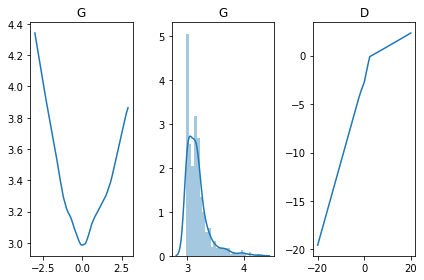

[Epoch 6004/50000] [D loss: -0.076553] [G loss: 0.000568]
[Epoch 6008/50000] [D loss: -0.074067] [G loss: 0.000836]
[Epoch 6012/50000] [D loss: -0.075329] [G loss: 0.034225]
[Epoch 6016/50000] [D loss: -0.083007] [G loss: 0.071955]
[Epoch 6020/50000] [D loss: -0.095373] [G loss: 0.149111]
[Epoch 6024/50000] [D loss: -0.111155] [G loss: 0.259361]
[Epoch 6028/50000] [D loss: -0.120813] [G loss: 0.326019]
[Epoch 6032/50000] [D loss: -0.121517] [G loss: 0.303284]
[Epoch 6036/50000] [D loss: -0.119600] [G loss: 0.193647]
[Epoch 6040/50000] [D loss: -0.118467] [G loss: 0.012056]
[Epoch 6044/50000] [D loss: -0.111270] [G loss: 0.017728]
[Epoch 6048/50000] [D loss: -0.102190] [G loss: 0.010751]
[Epoch 6052/50000] [D loss: -0.088342] [G loss: -0.008683]
[Epoch 6056/50000] [D loss: -0.081575] [G loss: -0.023132]
[Epoch 6060/50000] [D loss: -0.078310] [G loss: -0.024044]
[Epoch 6064/50000] [D loss: -0.079426] [G loss: -0.020532]
[Epoch 6068/50000] [D loss: -0.082539] [G loss: -0.033917]
[Epoch 60

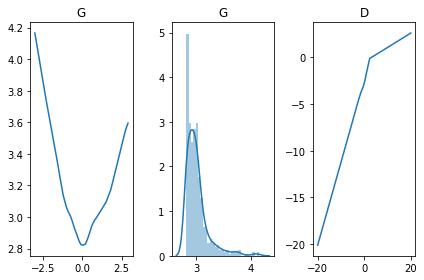

[Epoch 6104/50000] [D loss: -0.101416] [G loss: 0.004954]
[Epoch 6108/50000] [D loss: -0.087438] [G loss: 0.008721]
[Epoch 6112/50000] [D loss: -0.079846] [G loss: 0.010864]
[Epoch 6116/50000] [D loss: -0.073774] [G loss: -0.003855]
[Epoch 6120/50000] [D loss: -0.073865] [G loss: 0.043264]
[Epoch 6124/50000] [D loss: -0.080125] [G loss: 0.062426]
[Epoch 6128/50000] [D loss: -0.090149] [G loss: 0.131010]
[Epoch 6132/50000] [D loss: -0.104856] [G loss: 0.231471]
[Epoch 6136/50000] [D loss: -0.116469] [G loss: 0.322886]
[Epoch 6140/50000] [D loss: -0.123529] [G loss: 0.347618]
[Epoch 6144/50000] [D loss: -0.117454] [G loss: 0.250547]
[Epoch 6148/50000] [D loss: -0.115862] [G loss: 0.036342]
[Epoch 6152/50000] [D loss: -0.115033] [G loss: 0.011414]
[Epoch 6156/50000] [D loss: -0.104332] [G loss: 0.014598]
[Epoch 6160/50000] [D loss: -0.092041] [G loss: -0.007799]
[Epoch 6164/50000] [D loss: -0.085514] [G loss: -0.010109]
[Epoch 6168/50000] [D loss: -0.080086] [G loss: -0.024955]
[Epoch 617

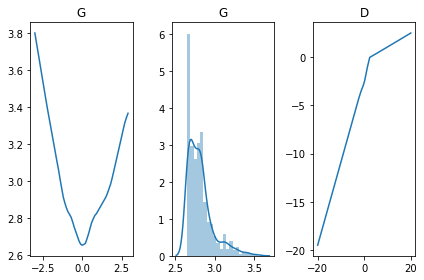

[Epoch 6204/50000] [D loss: -0.119517] [G loss: -0.015155]
[Epoch 6208/50000] [D loss: -0.110363] [G loss: 0.005583]
[Epoch 6212/50000] [D loss: -0.103703] [G loss: -0.001000]
[Epoch 6216/50000] [D loss: -0.090315] [G loss: 0.011313]
[Epoch 6220/50000] [D loss: -0.081280] [G loss: 0.012178]
[Epoch 6224/50000] [D loss: -0.075697] [G loss: 0.002092]
[Epoch 6228/50000] [D loss: -0.075056] [G loss: 0.006860]
[Epoch 6232/50000] [D loss: -0.076629] [G loss: 0.023760]
[Epoch 6236/50000] [D loss: -0.084679] [G loss: 0.075503]
[Epoch 6240/50000] [D loss: -0.096267] [G loss: 0.170093]
[Epoch 6244/50000] [D loss: -0.112587] [G loss: 0.294758]
[Epoch 6248/50000] [D loss: -0.122646] [G loss: 0.371271]
[Epoch 6252/50000] [D loss: -0.124644] [G loss: 0.362255]
[Epoch 6256/50000] [D loss: -0.115184] [G loss: 0.214888]
[Epoch 6260/50000] [D loss: -0.113643] [G loss: -0.015357]
[Epoch 6264/50000] [D loss: -0.104337] [G loss: 0.023162]
[Epoch 6268/50000] [D loss: -0.096948] [G loss: 0.004442]
[Epoch 6272

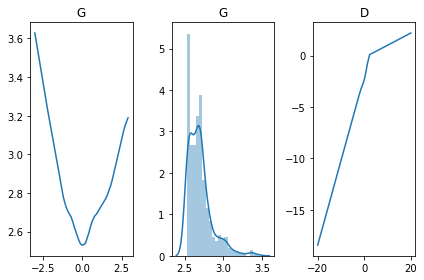

[Epoch 6304/50000] [D loss: -0.128038] [G loss: -0.145736]
[Epoch 6308/50000] [D loss: -0.122938] [G loss: -0.091294]
[Epoch 6312/50000] [D loss: -0.123355] [G loss: 0.008184]
[Epoch 6316/50000] [D loss: -0.117793] [G loss: 0.003200]
[Epoch 6320/50000] [D loss: -0.103969] [G loss: 0.005657]
[Epoch 6324/50000] [D loss: -0.094347] [G loss: 0.002243]
[Epoch 6328/50000] [D loss: -0.081486] [G loss: 0.009025]
[Epoch 6332/50000] [D loss: -0.076667] [G loss: 0.002980]
[Epoch 6336/50000] [D loss: -0.072919] [G loss: 0.003287]
[Epoch 6340/50000] [D loss: -0.075791] [G loss: 0.041095]
[Epoch 6344/50000] [D loss: -0.082302] [G loss: 0.076706]
[Epoch 6348/50000] [D loss: -0.094084] [G loss: 0.173990]
[Epoch 6352/50000] [D loss: -0.107699] [G loss: 0.279287]
[Epoch 6356/50000] [D loss: -0.119432] [G loss: 0.367963]
[Epoch 6360/50000] [D loss: -0.125850] [G loss: 0.386216]
[Epoch 6364/50000] [D loss: -0.112127] [G loss: 0.267241]
[Epoch 6368/50000] [D loss: -0.114936] [G loss: 0.016748]
[Epoch 6372/

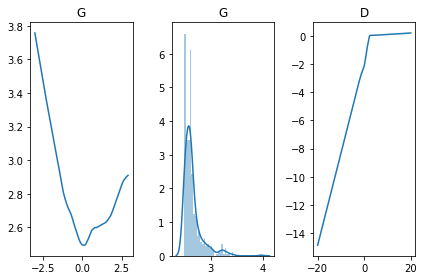

[Epoch 6404/50000] [D loss: -0.106958] [G loss: -0.078156]
[Epoch 6408/50000] [D loss: -0.117733] [G loss: -0.121528]
[Epoch 6412/50000] [D loss: -0.123412] [G loss: -0.132693]
[Epoch 6416/50000] [D loss: -0.126943] [G loss: -0.085011]
[Epoch 6420/50000] [D loss: -0.124714] [G loss: 0.013463]
[Epoch 6424/50000] [D loss: -0.119577] [G loss: -0.004283]
[Epoch 6428/50000] [D loss: -0.106093] [G loss: 0.003242]
[Epoch 6432/50000] [D loss: -0.100150] [G loss: 0.000706]
[Epoch 6436/50000] [D loss: -0.084919] [G loss: -0.003028]
[Epoch 6440/50000] [D loss: -0.076223] [G loss: 0.006538]
[Epoch 6444/50000] [D loss: -0.072237] [G loss: 0.003082]
[Epoch 6448/50000] [D loss: -0.071475] [G loss: 0.040970]
[Epoch 6452/50000] [D loss: -0.080399] [G loss: 0.094803]
[Epoch 6456/50000] [D loss: -0.092689] [G loss: 0.174405]
[Epoch 6460/50000] [D loss: -0.106054] [G loss: 0.284228]
[Epoch 6464/50000] [D loss: -0.114241] [G loss: 0.355929]
[Epoch 6468/50000] [D loss: -0.121639] [G loss: 0.364450]
[Epoch 6

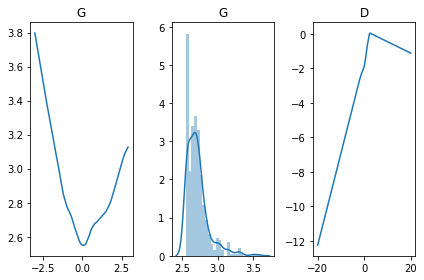

[Epoch 6504/50000] [D loss: -0.085164] [G loss: -0.026050]
[Epoch 6508/50000] [D loss: -0.092631] [G loss: -0.030825]
[Epoch 6512/50000] [D loss: -0.102959] [G loss: -0.052026]
[Epoch 6516/50000] [D loss: -0.113167] [G loss: -0.087198]
[Epoch 6520/50000] [D loss: -0.124010] [G loss: -0.098851]
[Epoch 6524/50000] [D loss: -0.124531] [G loss: -0.072479]
[Epoch 6528/50000] [D loss: -0.122051] [G loss: 0.012647]
[Epoch 6532/50000] [D loss: -0.119246] [G loss: -0.003831]
[Epoch 6536/50000] [D loss: -0.110380] [G loss: 0.001225]
[Epoch 6540/50000] [D loss: -0.101446] [G loss: 0.007581]
[Epoch 6544/50000] [D loss: -0.088500] [G loss: 0.001934]
[Epoch 6548/50000] [D loss: -0.081505] [G loss: 0.006427]
[Epoch 6552/50000] [D loss: -0.077730] [G loss: -0.005228]
[Epoch 6556/50000] [D loss: -0.073849] [G loss: 0.032834]
[Epoch 6560/50000] [D loss: -0.078435] [G loss: 0.032552]
[Epoch 6564/50000] [D loss: -0.085850] [G loss: 0.088317]
[Epoch 6568/50000] [D loss: -0.098371] [G loss: 0.179598]
[Epoch

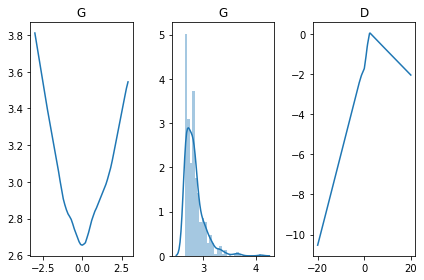

[Epoch 6604/50000] [D loss: -0.080743] [G loss: -0.013149]
[Epoch 6608/50000] [D loss: -0.079266] [G loss: -0.015660]
[Epoch 6612/50000] [D loss: -0.080109] [G loss: -0.023009]
[Epoch 6616/50000] [D loss: -0.086203] [G loss: -0.034936]
[Epoch 6620/50000] [D loss: -0.097214] [G loss: -0.076366]
[Epoch 6624/50000] [D loss: -0.110592] [G loss: -0.135119]
[Epoch 6628/50000] [D loss: -0.118875] [G loss: -0.167672]
[Epoch 6632/50000] [D loss: -0.125931] [G loss: -0.159765]
[Epoch 6636/50000] [D loss: -0.121948] [G loss: -0.099894]
[Epoch 6640/50000] [D loss: -0.117990] [G loss: 0.017653]
[Epoch 6644/50000] [D loss: -0.112214] [G loss: 0.001207]
[Epoch 6648/50000] [D loss: -0.103110] [G loss: 0.003837]
[Epoch 6652/50000] [D loss: -0.091223] [G loss: -0.000883]
[Epoch 6656/50000] [D loss: -0.083408] [G loss: -0.000262]
[Epoch 6660/50000] [D loss: -0.075362] [G loss: 0.006217]
[Epoch 6664/50000] [D loss: -0.077459] [G loss: 0.001496]
[Epoch 6668/50000] [D loss: -0.079832] [G loss: 0.035776]
[Ep

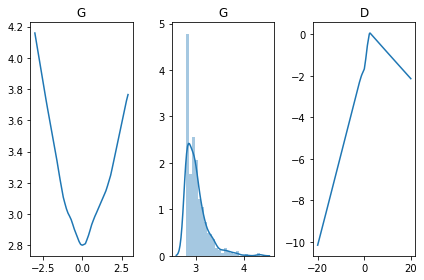

[Epoch 6704/50000] [D loss: -0.095035] [G loss: -0.000494]
[Epoch 6708/50000] [D loss: -0.090694] [G loss: -0.010212]
[Epoch 6712/50000] [D loss: -0.083157] [G loss: -0.013221]
[Epoch 6716/50000] [D loss: -0.078700] [G loss: -0.024067]
[Epoch 6720/50000] [D loss: -0.079403] [G loss: -0.024998]
[Epoch 6724/50000] [D loss: -0.083875] [G loss: -0.027767]
[Epoch 6728/50000] [D loss: -0.093796] [G loss: -0.060563]
[Epoch 6732/50000] [D loss: -0.106363] [G loss: -0.113771]
[Epoch 6736/50000] [D loss: -0.116364] [G loss: -0.153301]
[Epoch 6740/50000] [D loss: -0.121966] [G loss: -0.160436]
[Epoch 6744/50000] [D loss: -0.120562] [G loss: -0.105187]
[Epoch 6748/50000] [D loss: -0.120785] [G loss: 0.015207]
[Epoch 6752/50000] [D loss: -0.118045] [G loss: 0.003588]
[Epoch 6756/50000] [D loss: -0.108308] [G loss: 0.003845]
[Epoch 6760/50000] [D loss: -0.095162] [G loss: 0.000553]
[Epoch 6764/50000] [D loss: -0.088571] [G loss: 0.006540]
[Epoch 6768/50000] [D loss: -0.080409] [G loss: 0.001557]
[Ep

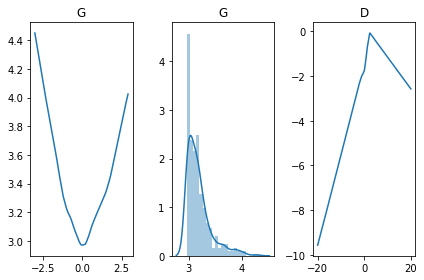

[Epoch 6804/50000] [D loss: -0.117201] [G loss: 0.008348]
[Epoch 6808/50000] [D loss: -0.114545] [G loss: 0.039679]
[Epoch 6812/50000] [D loss: -0.105067] [G loss: 0.001412]
[Epoch 6816/50000] [D loss: -0.096247] [G loss: 0.005585]
[Epoch 6820/50000] [D loss: -0.087836] [G loss: -0.008443]
[Epoch 6824/50000] [D loss: -0.083471] [G loss: -0.018127]
[Epoch 6828/50000] [D loss: -0.079246] [G loss: -0.019904]
[Epoch 6832/50000] [D loss: -0.081897] [G loss: -0.025905]
[Epoch 6836/50000] [D loss: -0.088496] [G loss: -0.029543]
[Epoch 6840/50000] [D loss: -0.096941] [G loss: -0.050232]
[Epoch 6844/50000] [D loss: -0.109194] [G loss: -0.094017]
[Epoch 6848/50000] [D loss: -0.118187] [G loss: -0.141289]
[Epoch 6852/50000] [D loss: -0.122685] [G loss: -0.143818]
[Epoch 6856/50000] [D loss: -0.126349] [G loss: -0.087869]
[Epoch 6860/50000] [D loss: -0.119852] [G loss: 0.017486]
[Epoch 6864/50000] [D loss: -0.110977] [G loss: -0.001863]
[Epoch 6868/50000] [D loss: -0.103165] [G loss: -0.000087]
[E

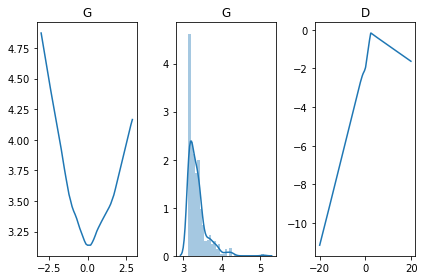

[Epoch 6904/50000] [D loss: -0.119433] [G loss: 0.336453]
[Epoch 6908/50000] [D loss: -0.117679] [G loss: 0.327764]
[Epoch 6912/50000] [D loss: -0.117158] [G loss: 0.223510]
[Epoch 6916/50000] [D loss: -0.114091] [G loss: -0.001639]
[Epoch 6920/50000] [D loss: -0.106572] [G loss: 0.020407]
[Epoch 6924/50000] [D loss: -0.099384] [G loss: 0.002885]
[Epoch 6928/50000] [D loss: -0.089521] [G loss: -0.004323]
[Epoch 6932/50000] [D loss: -0.081822] [G loss: -0.011145]
[Epoch 6936/50000] [D loss: -0.080707] [G loss: -0.017462]
[Epoch 6940/50000] [D loss: -0.081413] [G loss: -0.024092]
[Epoch 6944/50000] [D loss: -0.085175] [G loss: -0.027785]
[Epoch 6948/50000] [D loss: -0.094197] [G loss: -0.047655]
[Epoch 6952/50000] [D loss: -0.104907] [G loss: -0.075123]
[Epoch 6956/50000] [D loss: -0.114502] [G loss: -0.105505]
[Epoch 6960/50000] [D loss: -0.121486] [G loss: -0.109365]
[Epoch 6964/50000] [D loss: -0.123068] [G loss: -0.086944]
[Epoch 6968/50000] [D loss: -0.122913] [G loss: 0.011973]
[Ep

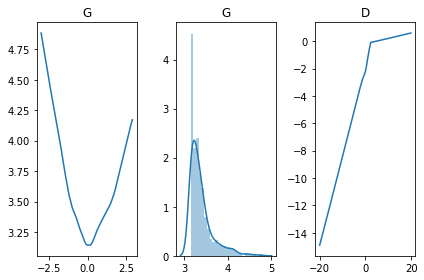

[Epoch 7004/50000] [D loss: -0.089142] [G loss: 0.105831]
[Epoch 7008/50000] [D loss: -0.101157] [G loss: 0.190539]
[Epoch 7012/50000] [D loss: -0.114098] [G loss: 0.284009]
[Epoch 7016/50000] [D loss: -0.117950] [G loss: 0.325083]
[Epoch 7020/50000] [D loss: -0.114644] [G loss: 0.285044]
[Epoch 7024/50000] [D loss: -0.112470] [G loss: 0.115098]
[Epoch 7028/50000] [D loss: -0.111221] [G loss: 0.020347]
[Epoch 7032/50000] [D loss: -0.106176] [G loss: 0.000714]
[Epoch 7036/50000] [D loss: -0.093975] [G loss: -0.001929]
[Epoch 7040/50000] [D loss: -0.088064] [G loss: -0.009267]
[Epoch 7044/50000] [D loss: -0.080298] [G loss: -0.021113]
[Epoch 7048/50000] [D loss: -0.078867] [G loss: -0.022870]
[Epoch 7052/50000] [D loss: -0.082762] [G loss: -0.024932]
[Epoch 7056/50000] [D loss: -0.088585] [G loss: -0.037294]
[Epoch 7060/50000] [D loss: -0.099039] [G loss: -0.069125]
[Epoch 7064/50000] [D loss: -0.111721] [G loss: -0.119052]
[Epoch 7068/50000] [D loss: -0.120005] [G loss: -0.148085]
[Epoc

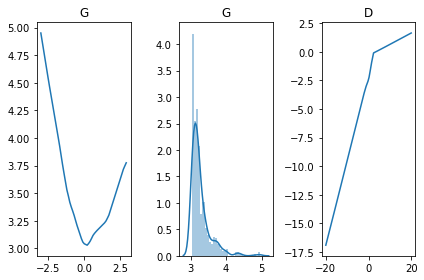

[Epoch 7104/50000] [D loss: -0.076954] [G loss: 0.014233]
[Epoch 7108/50000] [D loss: -0.078687] [G loss: 0.031259]
[Epoch 7112/50000] [D loss: -0.087149] [G loss: 0.082096]
[Epoch 7116/50000] [D loss: -0.097832] [G loss: 0.161273]
[Epoch 7120/50000] [D loss: -0.110295] [G loss: 0.251840]
[Epoch 7124/50000] [D loss: -0.116145] [G loss: 0.303787]
[Epoch 7128/50000] [D loss: -0.119224] [G loss: 0.266910]
[Epoch 7132/50000] [D loss: -0.117463] [G loss: 0.132517]
[Epoch 7136/50000] [D loss: -0.113690] [G loss: 0.045503]
[Epoch 7140/50000] [D loss: -0.103639] [G loss: 0.006852]
[Epoch 7144/50000] [D loss: -0.094137] [G loss: -0.003974]
[Epoch 7148/50000] [D loss: -0.088852] [G loss: -0.005264]
[Epoch 7152/50000] [D loss: -0.080657] [G loss: -0.014954]
[Epoch 7156/50000] [D loss: -0.079587] [G loss: -0.020709]
[Epoch 7160/50000] [D loss: -0.081595] [G loss: -0.026447]
[Epoch 7164/50000] [D loss: -0.086472] [G loss: -0.033622]
[Epoch 7168/50000] [D loss: -0.095856] [G loss: -0.053690]
[Epoch 

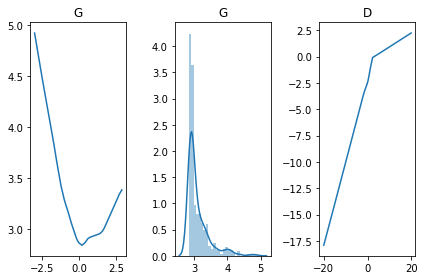

[Epoch 7204/50000] [D loss: -0.090278] [G loss: 0.001748]
[Epoch 7208/50000] [D loss: -0.081246] [G loss: -0.006135]
[Epoch 7212/50000] [D loss: -0.076406] [G loss: 0.007073]
[Epoch 7216/50000] [D loss: -0.079033] [G loss: 0.020247]
[Epoch 7220/50000] [D loss: -0.083649] [G loss: 0.041706]
[Epoch 7224/50000] [D loss: -0.092427] [G loss: 0.079750]
[Epoch 7228/50000] [D loss: -0.104512] [G loss: 0.171526]
[Epoch 7232/50000] [D loss: -0.114902] [G loss: 0.266493]
[Epoch 7236/50000] [D loss: -0.117564] [G loss: 0.273381]
[Epoch 7240/50000] [D loss: -0.116366] [G loss: 0.181687]
[Epoch 7244/50000] [D loss: -0.117643] [G loss: -0.003656]
[Epoch 7248/50000] [D loss: -0.113585] [G loss: 0.023969]
[Epoch 7252/50000] [D loss: -0.105959] [G loss: 0.012564]
[Epoch 7256/50000] [D loss: -0.096317] [G loss: -0.004124]
[Epoch 7260/50000] [D loss: -0.091925] [G loss: -0.001255]
[Epoch 7264/50000] [D loss: -0.079901] [G loss: -0.017812]
[Epoch 7268/50000] [D loss: -0.076972] [G loss: -0.024830]
[Epoch 7

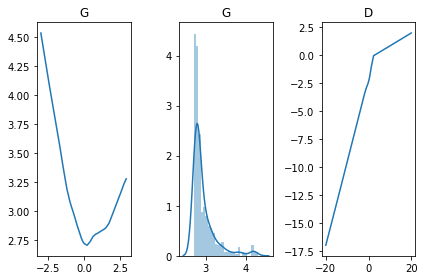

[Epoch 7304/50000] [D loss: -0.105133] [G loss: -0.004661]
[Epoch 7308/50000] [D loss: -0.098458] [G loss: 0.000894]
[Epoch 7312/50000] [D loss: -0.091552] [G loss: -0.000335]
[Epoch 7316/50000] [D loss: -0.085850] [G loss: 0.002970]
[Epoch 7320/50000] [D loss: -0.082317] [G loss: 0.000429]
[Epoch 7324/50000] [D loss: -0.080318] [G loss: 0.015454]
[Epoch 7328/50000] [D loss: -0.084801] [G loss: 0.013643]
[Epoch 7332/50000] [D loss: -0.090945] [G loss: 0.045919]
[Epoch 7336/50000] [D loss: -0.100552] [G loss: 0.113947]
[Epoch 7340/50000] [D loss: -0.109831] [G loss: 0.150389]
[Epoch 7344/50000] [D loss: -0.118124] [G loss: 0.166097]
[Epoch 7348/50000] [D loss: -0.120415] [G loss: 0.119848]
[Epoch 7352/50000] [D loss: -0.122859] [G loss: 0.021841]
[Epoch 7356/50000] [D loss: -0.121157] [G loss: 0.044933]
[Epoch 7360/50000] [D loss: -0.110963] [G loss: 0.012950]
[Epoch 7364/50000] [D loss: -0.105648] [G loss: 0.012389]
[Epoch 7368/50000] [D loss: -0.091713] [G loss: -0.010362]
[Epoch 7372

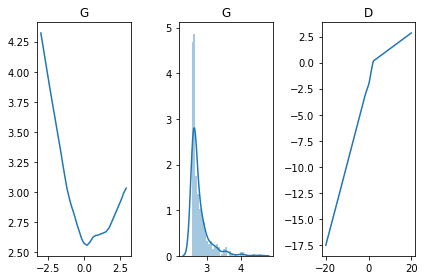

[Epoch 7404/50000] [D loss: -0.118231] [G loss: -0.180058]
[Epoch 7408/50000] [D loss: -0.111922] [G loss: -0.047633]
[Epoch 7412/50000] [D loss: -0.109467] [G loss: -0.008532]
[Epoch 7416/50000] [D loss: -0.100733] [G loss: 0.002368]
[Epoch 7420/50000] [D loss: -0.094262] [G loss: -0.000268]
[Epoch 7424/50000] [D loss: -0.086246] [G loss: 0.012493]
[Epoch 7428/50000] [D loss: -0.084488] [G loss: 0.001592]
[Epoch 7432/50000] [D loss: -0.084347] [G loss: 0.003772]
[Epoch 7436/50000] [D loss: -0.086114] [G loss: 0.016450]
[Epoch 7440/50000] [D loss: -0.092870] [G loss: 0.001100]
[Epoch 7444/50000] [D loss: -0.098998] [G loss: 0.026402]
[Epoch 7448/50000] [D loss: -0.107613] [G loss: 0.056359]
[Epoch 7452/50000] [D loss: -0.115152] [G loss: 0.065142]
[Epoch 7456/50000] [D loss: -0.117707] [G loss: 0.043236]
[Epoch 7460/50000] [D loss: -0.124201] [G loss: 0.032297]
[Epoch 7464/50000] [D loss: -0.122520] [G loss: 0.031176]
[Epoch 7468/50000] [D loss: -0.116503] [G loss: 0.016298]
[Epoch 747

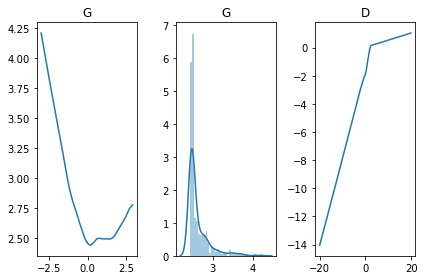

[Epoch 7504/50000] [D loss: -0.111601] [G loss: -0.220731]
[Epoch 7508/50000] [D loss: -0.122025] [G loss: -0.266575]
[Epoch 7512/50000] [D loss: -0.118655] [G loss: -0.261057]
[Epoch 7516/50000] [D loss: -0.111474] [G loss: -0.160717]
[Epoch 7520/50000] [D loss: -0.108418] [G loss: 0.040265]
[Epoch 7524/50000] [D loss: -0.104271] [G loss: 0.020230]
[Epoch 7528/50000] [D loss: -0.097363] [G loss: 0.004553]
[Epoch 7532/50000] [D loss: -0.089149] [G loss: 0.011917]
[Epoch 7536/50000] [D loss: -0.088031] [G loss: 0.014030]
[Epoch 7540/50000] [D loss: -0.087587] [G loss: 0.007297]
[Epoch 7544/50000] [D loss: -0.084138] [G loss: 0.007277]
[Epoch 7548/50000] [D loss: -0.090354] [G loss: 0.019246]
[Epoch 7552/50000] [D loss: -0.097737] [G loss: 0.014010]
[Epoch 7556/50000] [D loss: -0.105261] [G loss: 0.013476]
[Epoch 7560/50000] [D loss: -0.113822] [G loss: 0.066004]
[Epoch 7564/50000] [D loss: -0.116350] [G loss: 0.026459]
[Epoch 7568/50000] [D loss: -0.122214] [G loss: 0.029290]
[Epoch 757

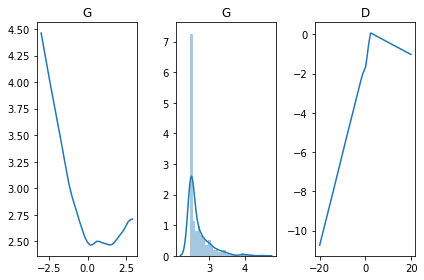

[Epoch 7604/50000] [D loss: -0.082915] [G loss: -0.056424]
[Epoch 7608/50000] [D loss: -0.092618] [G loss: -0.106430]
[Epoch 7612/50000] [D loss: -0.111041] [G loss: -0.184308]
[Epoch 7616/50000] [D loss: -0.118942] [G loss: -0.243008]
[Epoch 7620/50000] [D loss: -0.127041] [G loss: -0.246581]
[Epoch 7624/50000] [D loss: -0.120373] [G loss: -0.185659]
[Epoch 7628/50000] [D loss: -0.110363] [G loss: -0.028350]
[Epoch 7632/50000] [D loss: -0.104991] [G loss: -0.006991]
[Epoch 7636/50000] [D loss: -0.095010] [G loss: 0.002605]
[Epoch 7640/50000] [D loss: -0.088138] [G loss: 0.010031]
[Epoch 7644/50000] [D loss: -0.086673] [G loss: -0.000470]
[Epoch 7648/50000] [D loss: -0.083316] [G loss: 0.004936]
[Epoch 7652/50000] [D loss: -0.086298] [G loss: 0.008352]
[Epoch 7656/50000] [D loss: -0.089185] [G loss: 0.019582]
[Epoch 7660/50000] [D loss: -0.096484] [G loss: 0.033788]
[Epoch 7664/50000] [D loss: -0.105217] [G loss: 0.075014]
[Epoch 7668/50000] [D loss: -0.116412] [G loss: 0.129187]
[Epoc

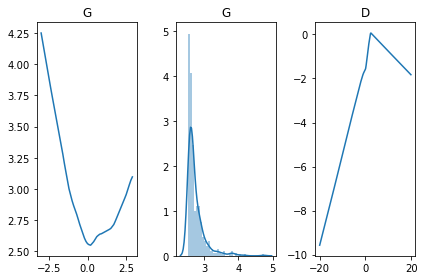

[Epoch 7704/50000] [D loss: -0.076784] [G loss: -0.031936]
[Epoch 7708/50000] [D loss: -0.077619] [G loss: -0.056779]
[Epoch 7712/50000] [D loss: -0.088124] [G loss: -0.102080]
[Epoch 7716/50000] [D loss: -0.106891] [G loss: -0.174431]
[Epoch 7720/50000] [D loss: -0.121819] [G loss: -0.229497]
[Epoch 7724/50000] [D loss: -0.125874] [G loss: -0.250570]
[Epoch 7728/50000] [D loss: -0.120590] [G loss: -0.214823]
[Epoch 7732/50000] [D loss: -0.114960] [G loss: -0.083682]
[Epoch 7736/50000] [D loss: -0.108066] [G loss: -0.019576]
[Epoch 7740/50000] [D loss: -0.096559] [G loss: -0.000694]
[Epoch 7744/50000] [D loss: -0.088511] [G loss: 0.007397]
[Epoch 7748/50000] [D loss: -0.086706] [G loss: 0.005845]
[Epoch 7752/50000] [D loss: -0.081263] [G loss: -0.001922]
[Epoch 7756/50000] [D loss: -0.080471] [G loss: 0.016212]
[Epoch 7760/50000] [D loss: -0.084068] [G loss: 0.016071]
[Epoch 7764/50000] [D loss: -0.096057] [G loss: 0.083850]
[Epoch 7768/50000] [D loss: -0.107867] [G loss: 0.140994]
[Ep

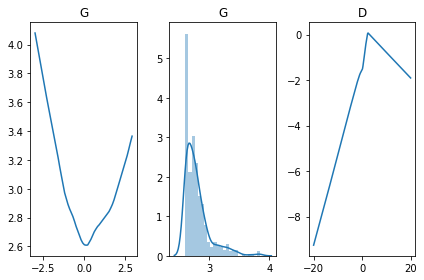

[Epoch 7804/50000] [D loss: -0.078154] [G loss: -0.019793]
[Epoch 7808/50000] [D loss: -0.077631] [G loss: -0.034251]
[Epoch 7812/50000] [D loss: -0.082222] [G loss: -0.042623]
[Epoch 7816/50000] [D loss: -0.092110] [G loss: -0.080657]
[Epoch 7820/50000] [D loss: -0.104825] [G loss: -0.137209]
[Epoch 7824/50000] [D loss: -0.119449] [G loss: -0.187221]
[Epoch 7828/50000] [D loss: -0.125459] [G loss: -0.223955]
[Epoch 7832/50000] [D loss: -0.119318] [G loss: -0.183700]
[Epoch 7836/50000] [D loss: -0.116076] [G loss: -0.013076]
[Epoch 7840/50000] [D loss: -0.108755] [G loss: -0.009333]
[Epoch 7844/50000] [D loss: -0.095460] [G loss: 0.003465]
[Epoch 7848/50000] [D loss: -0.087093] [G loss: -0.010226]
[Epoch 7852/50000] [D loss: -0.077689] [G loss: -0.007223]
[Epoch 7856/50000] [D loss: -0.077848] [G loss: 0.003925]
[Epoch 7860/50000] [D loss: -0.082084] [G loss: 0.018298]
[Epoch 7864/50000] [D loss: -0.089141] [G loss: 0.053232]
[Epoch 7868/50000] [D loss: -0.100271] [G loss: 0.124755]
[E

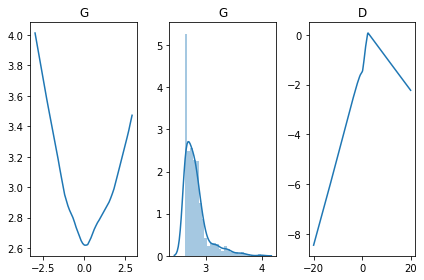

[Epoch 7904/50000] [D loss: -0.077112] [G loss: -0.019313]
[Epoch 7908/50000] [D loss: -0.077020] [G loss: -0.025017]
[Epoch 7912/50000] [D loss: -0.077918] [G loss: -0.054736]
[Epoch 7916/50000] [D loss: -0.089849] [G loss: -0.107854]
[Epoch 7920/50000] [D loss: -0.110791] [G loss: -0.196052]
[Epoch 7924/50000] [D loss: -0.122341] [G loss: -0.267498]
[Epoch 7928/50000] [D loss: -0.127603] [G loss: -0.291664]
[Epoch 7932/50000] [D loss: -0.114949] [G loss: -0.234028]
[Epoch 7936/50000] [D loss: -0.108708] [G loss: -0.058085]
[Epoch 7940/50000] [D loss: -0.105613] [G loss: -0.021675]
[Epoch 7944/50000] [D loss: -0.093275] [G loss: 0.011307]
[Epoch 7948/50000] [D loss: -0.088458] [G loss: 0.009234]
[Epoch 7952/50000] [D loss: -0.080183] [G loss: 0.015900]
[Epoch 7956/50000] [D loss: -0.081962] [G loss: -0.004796]
[Epoch 7960/50000] [D loss: -0.082198] [G loss: 0.051804]
[Epoch 7964/50000] [D loss: -0.088193] [G loss: 0.080069]
[Epoch 7968/50000] [D loss: -0.102905] [G loss: 0.155263]
[Ep

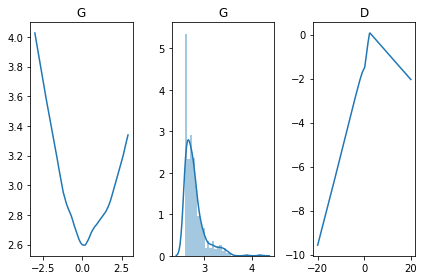

[Epoch 8004/50000] [D loss: -0.077296] [G loss: -0.019820]
[Epoch 8008/50000] [D loss: -0.078880] [G loss: -0.045249]
[Epoch 8012/50000] [D loss: -0.087710] [G loss: -0.080528]
[Epoch 8016/50000] [D loss: -0.100207] [G loss: -0.130267]
[Epoch 8020/50000] [D loss: -0.118347] [G loss: -0.202510]
[Epoch 8024/50000] [D loss: -0.124603] [G loss: -0.247074]
[Epoch 8028/50000] [D loss: -0.117710] [G loss: -0.218136]
[Epoch 8032/50000] [D loss: -0.112591] [G loss: -0.106833]
[Epoch 8036/50000] [D loss: -0.104004] [G loss: -0.009553]
[Epoch 8040/50000] [D loss: -0.095147] [G loss: 0.004084]
[Epoch 8044/50000] [D loss: -0.086994] [G loss: 0.003209]
[Epoch 8048/50000] [D loss: -0.081743] [G loss: 0.001046]
[Epoch 8052/50000] [D loss: -0.080261] [G loss: 0.007369]
[Epoch 8056/50000] [D loss: -0.085016] [G loss: 0.018473]
[Epoch 8060/50000] [D loss: -0.091944] [G loss: 0.040244]
[Epoch 8064/50000] [D loss: -0.101880] [G loss: 0.087644]
[Epoch 8068/50000] [D loss: -0.112552] [G loss: 0.152485]
[Epoc

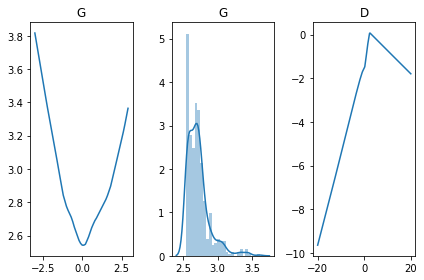

[Epoch 8104/50000] [D loss: -0.074912] [G loss: -0.047114]
[Epoch 8108/50000] [D loss: -0.081627] [G loss: -0.075466]
[Epoch 8112/50000] [D loss: -0.095159] [G loss: -0.146736]
[Epoch 8116/50000] [D loss: -0.117407] [G loss: -0.221151]
[Epoch 8120/50000] [D loss: -0.124260] [G loss: -0.279276]
[Epoch 8124/50000] [D loss: -0.115593] [G loss: -0.271482]
[Epoch 8128/50000] [D loss: -0.110309] [G loss: -0.166394]
[Epoch 8132/50000] [D loss: -0.110138] [G loss: 0.038803]
[Epoch 8136/50000] [D loss: -0.097392] [G loss: 0.002979]
[Epoch 8140/50000] [D loss: -0.090962] [G loss: 0.001951]
[Epoch 8144/50000] [D loss: -0.083664] [G loss: 0.009030]
[Epoch 8148/50000] [D loss: -0.080325] [G loss: 0.002061]
[Epoch 8152/50000] [D loss: -0.085098] [G loss: 0.017435]
[Epoch 8156/50000] [D loss: -0.090599] [G loss: 0.007860]
[Epoch 8160/50000] [D loss: -0.097593] [G loss: 0.036497]
[Epoch 8164/50000] [D loss: -0.106973] [G loss: 0.085031]
[Epoch 8168/50000] [D loss: -0.114544] [G loss: 0.109388]
[Epoch 

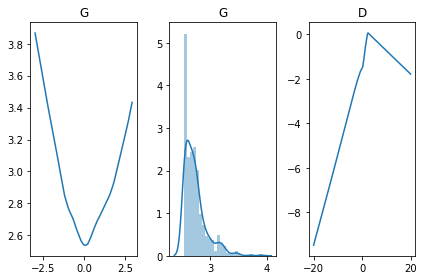

[Epoch 8204/50000] [D loss: -0.076395] [G loss: -0.039962]
[Epoch 8208/50000] [D loss: -0.081908] [G loss: -0.069815]
[Epoch 8212/50000] [D loss: -0.092962] [G loss: -0.125852]
[Epoch 8216/50000] [D loss: -0.117597] [G loss: -0.208707]
[Epoch 8220/50000] [D loss: -0.126985] [G loss: -0.269101]
[Epoch 8224/50000] [D loss: -0.122416] [G loss: -0.286524]
[Epoch 8228/50000] [D loss: -0.108945] [G loss: -0.213551]
[Epoch 8232/50000] [D loss: -0.106243] [G loss: -0.023595]
[Epoch 8236/50000] [D loss: -0.099557] [G loss: -0.007512]
[Epoch 8240/50000] [D loss: -0.090819] [G loss: 0.006390]
[Epoch 8244/50000] [D loss: -0.082560] [G loss: 0.010439]
[Epoch 8248/50000] [D loss: -0.080769] [G loss: -0.000765]
[Epoch 8252/50000] [D loss: -0.084419] [G loss: 0.028109]
[Epoch 8256/50000] [D loss: -0.089854] [G loss: 0.009374]
[Epoch 8260/50000] [D loss: -0.098166] [G loss: 0.049543]
[Epoch 8264/50000] [D loss: -0.107606] [G loss: 0.092304]
[Epoch 8268/50000] [D loss: -0.115148] [G loss: 0.118860]
[Epo

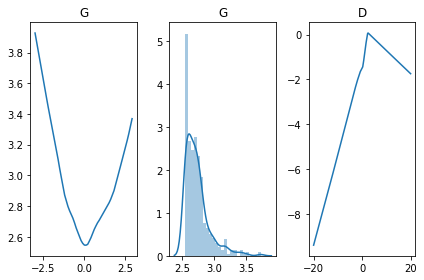

[Epoch 8304/50000] [D loss: -0.075865] [G loss: -0.036213]
[Epoch 8308/50000] [D loss: -0.080513] [G loss: -0.055769]
[Epoch 8312/50000] [D loss: -0.091413] [G loss: -0.107552]
[Epoch 8316/50000] [D loss: -0.115407] [G loss: -0.191584]
[Epoch 8320/50000] [D loss: -0.123160] [G loss: -0.249939]
[Epoch 8324/50000] [D loss: -0.123365] [G loss: -0.262675]
[Epoch 8328/50000] [D loss: -0.120211] [G loss: -0.197242]
[Epoch 8332/50000] [D loss: -0.107967] [G loss: -0.031592]
[Epoch 8336/50000] [D loss: -0.105065] [G loss: -0.008559]
[Epoch 8340/50000] [D loss: -0.096261] [G loss: 0.000012]
[Epoch 8344/50000] [D loss: -0.084656] [G loss: 0.000999]
[Epoch 8348/50000] [D loss: -0.082562] [G loss: -0.001273]
[Epoch 8352/50000] [D loss: -0.081756] [G loss: 0.037564]
[Epoch 8356/50000] [D loss: -0.089228] [G loss: 0.025348]
[Epoch 8360/50000] [D loss: -0.095991] [G loss: 0.032726]
[Epoch 8364/50000] [D loss: -0.103478] [G loss: 0.057768]
[Epoch 8368/50000] [D loss: -0.114132] [G loss: 0.085464]
[Epo

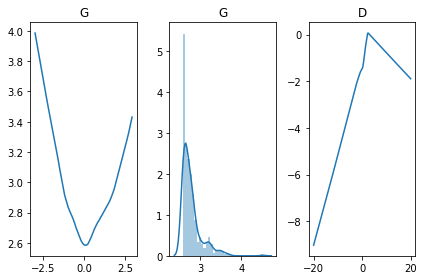

[Epoch 8404/50000] [D loss: -0.075385] [G loss: -0.026775]
[Epoch 8408/50000] [D loss: -0.077092] [G loss: -0.037855]
[Epoch 8412/50000] [D loss: -0.083954] [G loss: -0.066213]
[Epoch 8416/50000] [D loss: -0.096198] [G loss: -0.126155]
[Epoch 8420/50000] [D loss: -0.119366] [G loss: -0.199258]
[Epoch 8424/50000] [D loss: -0.124848] [G loss: -0.247202]
[Epoch 8428/50000] [D loss: -0.121282] [G loss: -0.231669]
[Epoch 8432/50000] [D loss: -0.109699] [G loss: -0.150639]
[Epoch 8436/50000] [D loss: -0.111254] [G loss: 0.030899]
[Epoch 8440/50000] [D loss: -0.098589] [G loss: 0.009105]
[Epoch 8444/50000] [D loss: -0.088904] [G loss: 0.001364]
[Epoch 8448/50000] [D loss: -0.085083] [G loss: 0.007435]
[Epoch 8452/50000] [D loss: -0.086869] [G loss: -0.007864]
[Epoch 8456/50000] [D loss: -0.085607] [G loss: 0.030657]
[Epoch 8460/50000] [D loss: -0.090341] [G loss: 0.007187]
[Epoch 8464/50000] [D loss: -0.096794] [G loss: 0.013576]
[Epoch 8468/50000] [D loss: -0.104519] [G loss: 0.038670]
[Epoc

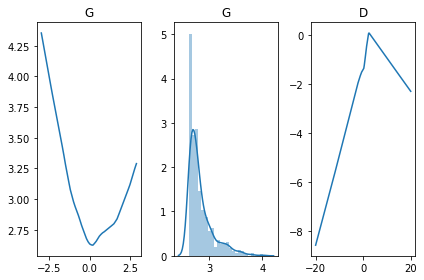

[Epoch 8504/50000] [D loss: -0.076079] [G loss: -0.022743]
[Epoch 8508/50000] [D loss: -0.074482] [G loss: -0.037232]
[Epoch 8512/50000] [D loss: -0.075752] [G loss: -0.054911]
[Epoch 8516/50000] [D loss: -0.085947] [G loss: -0.115008]
[Epoch 8520/50000] [D loss: -0.113838] [G loss: -0.204855]
[Epoch 8524/50000] [D loss: -0.124573] [G loss: -0.269244]
[Epoch 8528/50000] [D loss: -0.119523] [G loss: -0.279734]
[Epoch 8532/50000] [D loss: -0.110820] [G loss: -0.216717]
[Epoch 8536/50000] [D loss: -0.104056] [G loss: -0.062010]
[Epoch 8540/50000] [D loss: -0.105049] [G loss: -0.029435]
[Epoch 8544/50000] [D loss: -0.096190] [G loss: -0.011814]
[Epoch 8548/50000] [D loss: -0.089324] [G loss: -0.004846]
[Epoch 8552/50000] [D loss: -0.090233] [G loss: -0.019098]
[Epoch 8556/50000] [D loss: -0.087743] [G loss: 0.050629]
[Epoch 8560/50000] [D loss: -0.092839] [G loss: 0.024917]
[Epoch 8564/50000] [D loss: -0.098738] [G loss: 0.020279]
[Epoch 8568/50000] [D loss: -0.104673] [G loss: 0.140348]
[

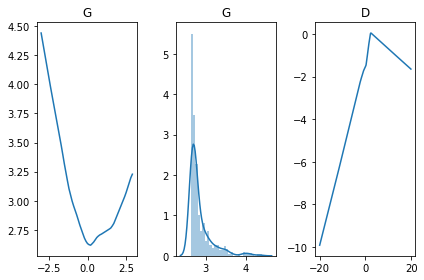

[Epoch 8604/50000] [D loss: -0.084086] [G loss: -0.015419]
[Epoch 8608/50000] [D loss: -0.086100] [G loss: -0.014905]
[Epoch 8612/50000] [D loss: -0.088887] [G loss: -0.016324]
[Epoch 8616/50000] [D loss: -0.095087] [G loss: -0.017877]
[Epoch 8620/50000] [D loss: -0.103614] [G loss: -0.025719]
[Epoch 8624/50000] [D loss: -0.113431] [G loss: -0.043653]
[Epoch 8628/50000] [D loss: -0.120372] [G loss: -0.035470]
[Epoch 8632/50000] [D loss: -0.123423] [G loss: -0.001788]
[Epoch 8636/50000] [D loss: -0.123137] [G loss: -0.003887]
[Epoch 8640/50000] [D loss: -0.116107] [G loss: -0.003031]
[Epoch 8644/50000] [D loss: -0.109699] [G loss: -0.002534]
[Epoch 8648/50000] [D loss: -0.098304] [G loss: -0.002392]
[Epoch 8652/50000] [D loss: -0.090849] [G loss: 0.002135]
[Epoch 8656/50000] [D loss: -0.083865] [G loss: -0.004025]
[Epoch 8660/50000] [D loss: -0.075386] [G loss: 0.007327]
[Epoch 8664/50000] [D loss: -0.074993] [G loss: 0.034162]
[Epoch 8668/50000] [D loss: -0.079745] [G loss: 0.084916]
[

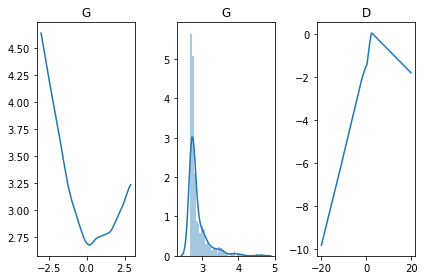

[Epoch 8704/50000] [D loss: -0.087630] [G loss: -0.010388]
[Epoch 8708/50000] [D loss: -0.085338] [G loss: -0.016298]
[Epoch 8712/50000] [D loss: -0.083916] [G loss: -0.019037]
[Epoch 8716/50000] [D loss: -0.086913] [G loss: -0.024620]
[Epoch 8720/50000] [D loss: -0.095055] [G loss: -0.023863]
[Epoch 8724/50000] [D loss: -0.103429] [G loss: -0.028595]
[Epoch 8728/50000] [D loss: -0.110856] [G loss: -0.032540]
[Epoch 8732/50000] [D loss: -0.120014] [G loss: -0.028879]
[Epoch 8736/50000] [D loss: -0.122724] [G loss: -0.000354]
[Epoch 8740/50000] [D loss: -0.121800] [G loss: -0.011244]
[Epoch 8744/50000] [D loss: -0.115875] [G loss: -0.008192]
[Epoch 8748/50000] [D loss: -0.104749] [G loss: -0.004616]
[Epoch 8752/50000] [D loss: -0.101727] [G loss: -0.005398]
[Epoch 8756/50000] [D loss: -0.087955] [G loss: -0.004838]
[Epoch 8760/50000] [D loss: -0.079628] [G loss: 0.001564]
[Epoch 8764/50000] [D loss: -0.078925] [G loss: 0.012827]
[Epoch 8768/50000] [D loss: -0.077568] [G loss: 0.042661]


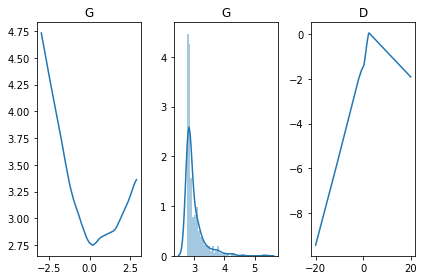

[Epoch 8804/50000] [D loss: -0.097995] [G loss: -0.005663]
[Epoch 8808/50000] [D loss: -0.087378] [G loss: -0.015842]
[Epoch 8812/50000] [D loss: -0.082100] [G loss: -0.021630]
[Epoch 8816/50000] [D loss: -0.084946] [G loss: -0.016037]
[Epoch 8820/50000] [D loss: -0.086117] [G loss: -0.025223]
[Epoch 8824/50000] [D loss: -0.093149] [G loss: -0.032517]
[Epoch 8828/50000] [D loss: -0.101736] [G loss: -0.048895]
[Epoch 8832/50000] [D loss: -0.110340] [G loss: -0.056264]
[Epoch 8836/50000] [D loss: -0.116546] [G loss: -0.057193]
[Epoch 8840/50000] [D loss: -0.121977] [G loss: -0.024646]
[Epoch 8844/50000] [D loss: -0.122491] [G loss: -0.009668]
[Epoch 8848/50000] [D loss: -0.111041] [G loss: -0.004293]
[Epoch 8852/50000] [D loss: -0.109859] [G loss: 0.003223]
[Epoch 8856/50000] [D loss: -0.097079] [G loss: -0.000699]
[Epoch 8860/50000] [D loss: -0.092338] [G loss: 0.001730]
[Epoch 8864/50000] [D loss: -0.084965] [G loss: -0.006031]
[Epoch 8868/50000] [D loss: -0.079655] [G loss: 0.009228]


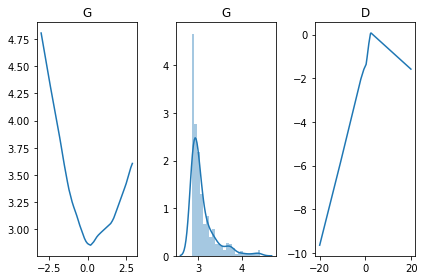

[Epoch 8904/50000] [D loss: -0.107525] [G loss: 0.016876]
[Epoch 8908/50000] [D loss: -0.103572] [G loss: 0.003379]
[Epoch 8912/50000] [D loss: -0.092509] [G loss: -0.009694]
[Epoch 8916/50000] [D loss: -0.084719] [G loss: -0.014058]
[Epoch 8920/50000] [D loss: -0.082774] [G loss: -0.015940]
[Epoch 8924/50000] [D loss: -0.081447] [G loss: -0.027990]
[Epoch 8928/50000] [D loss: -0.086815] [G loss: -0.034301]
[Epoch 8932/50000] [D loss: -0.095392] [G loss: -0.049995]
[Epoch 8936/50000] [D loss: -0.105073] [G loss: -0.074079]
[Epoch 8940/50000] [D loss: -0.113944] [G loss: -0.105132]
[Epoch 8944/50000] [D loss: -0.120111] [G loss: -0.099706]
[Epoch 8948/50000] [D loss: -0.122027] [G loss: -0.056992]
[Epoch 8952/50000] [D loss: -0.116423] [G loss: -0.004532]
[Epoch 8956/50000] [D loss: -0.112415] [G loss: -0.005220]
[Epoch 8960/50000] [D loss: -0.104760] [G loss: -0.000910]
[Epoch 8964/50000] [D loss: -0.096312] [G loss: -0.002536]
[Epoch 8968/50000] [D loss: -0.088806] [G loss: -0.000363]

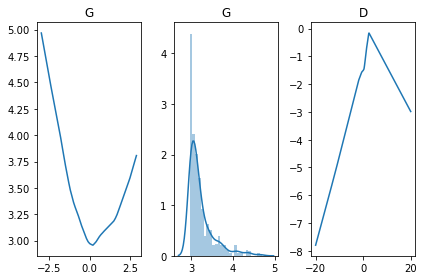

[Epoch 9004/50000] [D loss: -0.115792] [G loss: 0.174409]
[Epoch 9008/50000] [D loss: -0.108954] [G loss: 0.003675]
[Epoch 9012/50000] [D loss: -0.101007] [G loss: 0.008930]
[Epoch 9016/50000] [D loss: -0.094049] [G loss: -0.002060]
[Epoch 9020/50000] [D loss: -0.086262] [G loss: -0.009357]
[Epoch 9024/50000] [D loss: -0.082829] [G loss: -0.017365]
[Epoch 9028/50000] [D loss: -0.082313] [G loss: -0.023991]
[Epoch 9032/50000] [D loss: -0.086875] [G loss: -0.025233]
[Epoch 9036/50000] [D loss: -0.093587] [G loss: -0.034000]
[Epoch 9040/50000] [D loss: -0.102453] [G loss: -0.050762]
[Epoch 9044/50000] [D loss: -0.112654] [G loss: -0.089503]
[Epoch 9048/50000] [D loss: -0.119871] [G loss: -0.113452]
[Epoch 9052/50000] [D loss: -0.120379] [G loss: -0.088710]
[Epoch 9056/50000] [D loss: -0.119656] [G loss: -0.011655]
[Epoch 9060/50000] [D loss: -0.110506] [G loss: 0.001013]
[Epoch 9064/50000] [D loss: -0.105307] [G loss: -0.002326]
[Epoch 9068/50000] [D loss: -0.095401] [G loss: 0.001542]
[E

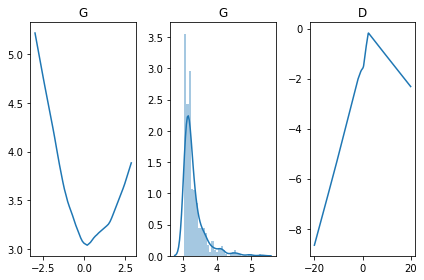

[Epoch 9104/50000] [D loss: -0.117914] [G loss: 0.291957]
[Epoch 9108/50000] [D loss: -0.110398] [G loss: 0.200155]
[Epoch 9112/50000] [D loss: -0.110723] [G loss: -0.009854]
[Epoch 9116/50000] [D loss: -0.105254] [G loss: 0.014594]
[Epoch 9120/50000] [D loss: -0.097274] [G loss: 0.002901]
[Epoch 9124/50000] [D loss: -0.090138] [G loss: -0.009229]
[Epoch 9128/50000] [D loss: -0.083924] [G loss: -0.017533]
[Epoch 9132/50000] [D loss: -0.083399] [G loss: -0.019209]
[Epoch 9136/50000] [D loss: -0.086083] [G loss: -0.021837]
[Epoch 9140/50000] [D loss: -0.090602] [G loss: -0.022028]
[Epoch 9144/50000] [D loss: -0.097805] [G loss: -0.031230]
[Epoch 9148/50000] [D loss: -0.106677] [G loss: -0.064699]
[Epoch 9152/50000] [D loss: -0.116636] [G loss: -0.084658]
[Epoch 9156/50000] [D loss: -0.118900] [G loss: -0.090273]
[Epoch 9160/50000] [D loss: -0.119708] [G loss: -0.029599]
[Epoch 9164/50000] [D loss: -0.119661] [G loss: -0.020681]
[Epoch 9168/50000] [D loss: -0.109274] [G loss: -0.010148]
[

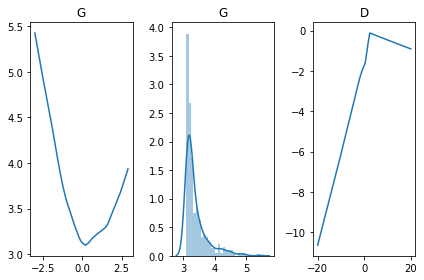

[Epoch 9204/50000] [D loss: -0.110056] [G loss: 0.247720]
[Epoch 9208/50000] [D loss: -0.114791] [G loss: 0.284979]
[Epoch 9212/50000] [D loss: -0.118951] [G loss: 0.266295]
[Epoch 9216/50000] [D loss: -0.114029] [G loss: 0.151670]
[Epoch 9220/50000] [D loss: -0.107842] [G loss: 0.011194]
[Epoch 9224/50000] [D loss: -0.101333] [G loss: 0.015175]
[Epoch 9228/50000] [D loss: -0.095177] [G loss: -0.001751]
[Epoch 9232/50000] [D loss: -0.087032] [G loss: -0.015470]
[Epoch 9236/50000] [D loss: -0.083545] [G loss: -0.015984]
[Epoch 9240/50000] [D loss: -0.084421] [G loss: -0.019170]
[Epoch 9244/50000] [D loss: -0.085820] [G loss: -0.023114]
[Epoch 9248/50000] [D loss: -0.093272] [G loss: -0.043006]
[Epoch 9252/50000] [D loss: -0.103016] [G loss: -0.069093]
[Epoch 9256/50000] [D loss: -0.112938] [G loss: -0.108774]
[Epoch 9260/50000] [D loss: -0.119705] [G loss: -0.132423]
[Epoch 9264/50000] [D loss: -0.120717] [G loss: -0.103799]
[Epoch 9268/50000] [D loss: -0.117735] [G loss: -0.017874]
[Ep

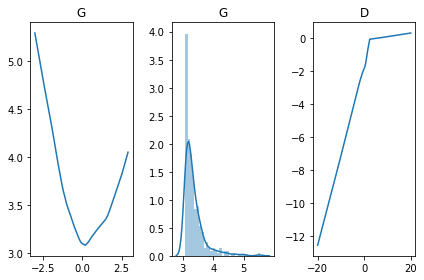

[Epoch 9304/50000] [D loss: -0.096494] [G loss: 0.131284]
[Epoch 9308/50000] [D loss: -0.108528] [G loss: 0.215633]
[Epoch 9312/50000] [D loss: -0.114905] [G loss: 0.261453]
[Epoch 9316/50000] [D loss: -0.111924] [G loss: 0.223993]
[Epoch 9320/50000] [D loss: -0.111762] [G loss: 0.085721]
[Epoch 9324/50000] [D loss: -0.111933] [G loss: 0.031891]
[Epoch 9328/50000] [D loss: -0.106641] [G loss: 0.004113]
[Epoch 9332/50000] [D loss: -0.095233] [G loss: -0.007052]
[Epoch 9336/50000] [D loss: -0.093419] [G loss: -0.000730]
[Epoch 9340/50000] [D loss: -0.086437] [G loss: -0.012283]
[Epoch 9344/50000] [D loss: -0.083327] [G loss: -0.017830]
[Epoch 9348/50000] [D loss: -0.085709] [G loss: -0.020290]
[Epoch 9352/50000] [D loss: -0.089456] [G loss: -0.018325]
[Epoch 9356/50000] [D loss: -0.097776] [G loss: -0.039281]
[Epoch 9360/50000] [D loss: -0.108733] [G loss: -0.074318]
[Epoch 9364/50000] [D loss: -0.117018] [G loss: -0.102865]
[Epoch 9368/50000] [D loss: -0.118610] [G loss: -0.098078]
[Epo

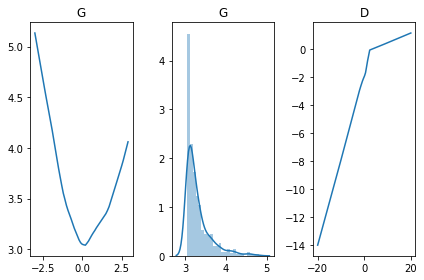

[Epoch 9404/50000] [D loss: -0.082830] [G loss: 0.030522]
[Epoch 9408/50000] [D loss: -0.089250] [G loss: 0.058216]
[Epoch 9412/50000] [D loss: -0.098289] [G loss: 0.129750]
[Epoch 9416/50000] [D loss: -0.110347] [G loss: 0.216158]
[Epoch 9420/50000] [D loss: -0.116159] [G loss: 0.262748]
[Epoch 9424/50000] [D loss: -0.115980] [G loss: 0.229288]
[Epoch 9428/50000] [D loss: -0.113576] [G loss: 0.099357]
[Epoch 9432/50000] [D loss: -0.111674] [G loss: 0.026832]
[Epoch 9436/50000] [D loss: -0.107865] [G loss: 0.008898]
[Epoch 9440/50000] [D loss: -0.095641] [G loss: 0.002033]
[Epoch 9444/50000] [D loss: -0.088125] [G loss: -0.007351]
[Epoch 9448/50000] [D loss: -0.083201] [G loss: -0.014196]
[Epoch 9452/50000] [D loss: -0.082888] [G loss: -0.019810]
[Epoch 9456/50000] [D loss: -0.085851] [G loss: -0.027128]
[Epoch 9460/50000] [D loss: -0.092539] [G loss: -0.045692]
[Epoch 9464/50000] [D loss: -0.101640] [G loss: -0.077307]
[Epoch 9468/50000] [D loss: -0.110694] [G loss: -0.111851]
[Epoch 

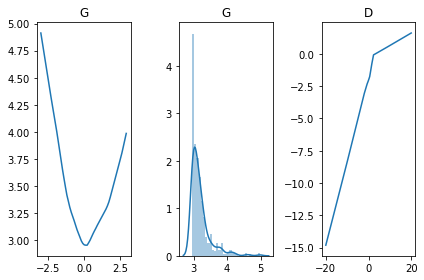

[Epoch 9504/50000] [D loss: -0.083093] [G loss: -0.002096]
[Epoch 9508/50000] [D loss: -0.081160] [G loss: 0.024482]
[Epoch 9512/50000] [D loss: -0.085771] [G loss: 0.031581]
[Epoch 9516/50000] [D loss: -0.092200] [G loss: 0.067857]
[Epoch 9520/50000] [D loss: -0.100730] [G loss: 0.116317]
[Epoch 9524/50000] [D loss: -0.110332] [G loss: 0.188145]
[Epoch 9528/50000] [D loss: -0.114126] [G loss: 0.212890]
[Epoch 9532/50000] [D loss: -0.117804] [G loss: 0.178495]
[Epoch 9536/50000] [D loss: -0.118108] [G loss: 0.047821]
[Epoch 9540/50000] [D loss: -0.112118] [G loss: 0.013925]
[Epoch 9544/50000] [D loss: -0.105160] [G loss: 0.013198]
[Epoch 9548/50000] [D loss: -0.095989] [G loss: -0.002009]
[Epoch 9552/50000] [D loss: -0.083583] [G loss: -0.017693]
[Epoch 9556/50000] [D loss: -0.082299] [G loss: -0.015477]
[Epoch 9560/50000] [D loss: -0.079558] [G loss: -0.027458]
[Epoch 9564/50000] [D loss: -0.085304] [G loss: -0.035919]
[Epoch 9568/50000] [D loss: -0.093975] [G loss: -0.075246]
[Epoch 

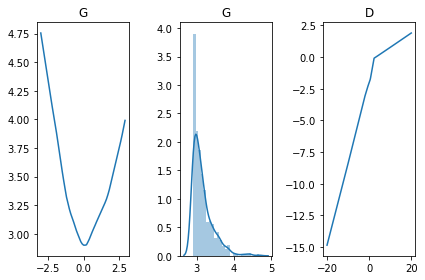

[Epoch 9604/50000] [D loss: -0.085345] [G loss: -0.000646]
[Epoch 9608/50000] [D loss: -0.080571] [G loss: 0.006507]
[Epoch 9612/50000] [D loss: -0.080670] [G loss: 0.016287]
[Epoch 9616/50000] [D loss: -0.087616] [G loss: 0.048559]
[Epoch 9620/50000] [D loss: -0.096524] [G loss: 0.088658]
[Epoch 9624/50000] [D loss: -0.107498] [G loss: 0.155808]
[Epoch 9628/50000] [D loss: -0.114794] [G loss: 0.207391]
[Epoch 9632/50000] [D loss: -0.116183] [G loss: 0.172136]
[Epoch 9636/50000] [D loss: -0.118915] [G loss: 0.056713]
[Epoch 9640/50000] [D loss: -0.113721] [G loss: 0.012473]
[Epoch 9644/50000] [D loss: -0.109597] [G loss: 0.010341]
[Epoch 9648/50000] [D loss: -0.096371] [G loss: -0.006009]
[Epoch 9652/50000] [D loss: -0.088813] [G loss: -0.011814]
[Epoch 9656/50000] [D loss: -0.078655] [G loss: -0.022980]
[Epoch 9660/50000] [D loss: -0.078654] [G loss: -0.026138]
[Epoch 9664/50000] [D loss: -0.081292] [G loss: -0.039262]
[Epoch 9668/50000] [D loss: -0.089361] [G loss: -0.060180]
[Epoch 

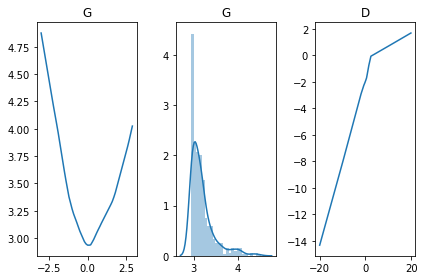

[Epoch 9704/50000] [D loss: -0.085859] [G loss: 0.006618]
[Epoch 9708/50000] [D loss: -0.084728] [G loss: 0.011296]
[Epoch 9712/50000] [D loss: -0.089743] [G loss: 0.006535]
[Epoch 9716/50000] [D loss: -0.094871] [G loss: 0.032252]
[Epoch 9720/50000] [D loss: -0.103994] [G loss: 0.093835]
[Epoch 9724/50000] [D loss: -0.111932] [G loss: 0.145811]
[Epoch 9728/50000] [D loss: -0.115359] [G loss: 0.152612]
[Epoch 9732/50000] [D loss: -0.119081] [G loss: 0.101337]
[Epoch 9736/50000] [D loss: -0.117487] [G loss: 0.044035]
[Epoch 9740/50000] [D loss: -0.111626] [G loss: 0.019307]
[Epoch 9744/50000] [D loss: -0.101349] [G loss: 0.002326]
[Epoch 9748/50000] [D loss: -0.092738] [G loss: -0.004579]
[Epoch 9752/50000] [D loss: -0.085117] [G loss: -0.013164]
[Epoch 9756/50000] [D loss: -0.077806] [G loss: -0.024628]
[Epoch 9760/50000] [D loss: -0.080669] [G loss: -0.030486]
[Epoch 9764/50000] [D loss: -0.084091] [G loss: -0.053131]
[Epoch 9768/50000] [D loss: -0.094590] [G loss: -0.106173]
[Epoch 9

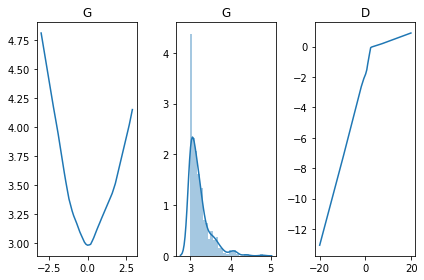

[Epoch 9804/50000] [D loss: -0.091350] [G loss: 0.001285]
[Epoch 9808/50000] [D loss: -0.095617] [G loss: 0.011368]
[Epoch 9812/50000] [D loss: -0.100383] [G loss: 0.126882]
[Epoch 9816/50000] [D loss: -0.105254] [G loss: 0.118565]
[Epoch 9820/50000] [D loss: -0.110070] [G loss: 0.044331]
[Epoch 9824/50000] [D loss: -0.112770] [G loss: 0.054781]
[Epoch 9828/50000] [D loss: -0.110400] [G loss: 0.035477]
[Epoch 9832/50000] [D loss: -0.108381] [G loss: 0.002887]
[Epoch 9836/50000] [D loss: -0.102104] [G loss: 0.000531]
[Epoch 9840/50000] [D loss: -0.098922] [G loss: 0.006457]
[Epoch 9844/50000] [D loss: -0.094846] [G loss: -0.003490]
[Epoch 9848/50000] [D loss: -0.088774] [G loss: -0.014386]
[Epoch 9852/50000] [D loss: -0.087210] [G loss: -0.015142]
[Epoch 9856/50000] [D loss: -0.087700] [G loss: -0.012687]
[Epoch 9860/50000] [D loss: -0.091684] [G loss: -0.012408]
[Epoch 9864/50000] [D loss: -0.098079] [G loss: -0.011538]
[Epoch 9868/50000] [D loss: -0.106407] [G loss: -0.027781]
[Epoch 

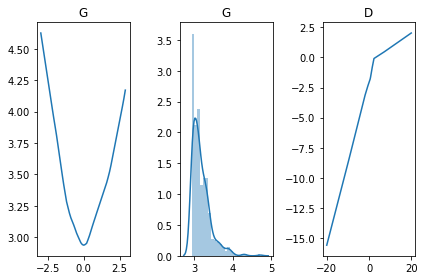

[Epoch 9904/50000] [D loss: -0.080258] [G loss: -0.003695]
[Epoch 9908/50000] [D loss: -0.078908] [G loss: 0.016886]
[Epoch 9912/50000] [D loss: -0.080974] [G loss: 0.036284]
[Epoch 9916/50000] [D loss: -0.087701] [G loss: 0.090308]
[Epoch 9920/50000] [D loss: -0.097528] [G loss: 0.166919]
[Epoch 9924/50000] [D loss: -0.109863] [G loss: 0.256323]
[Epoch 9928/50000] [D loss: -0.120072] [G loss: 0.328804]
[Epoch 9932/50000] [D loss: -0.113946] [G loss: 0.310957]
[Epoch 9936/50000] [D loss: -0.107882] [G loss: 0.157148]
[Epoch 9940/50000] [D loss: -0.103835] [G loss: 0.000175]
[Epoch 9944/50000] [D loss: -0.098254] [G loss: 0.002855]
[Epoch 9948/50000] [D loss: -0.090775] [G loss: -0.004908]
[Epoch 9952/50000] [D loss: -0.087218] [G loss: -0.011671]
[Epoch 9956/50000] [D loss: -0.086438] [G loss: -0.013569]
[Epoch 9960/50000] [D loss: -0.085630] [G loss: -0.025026]
[Epoch 9964/50000] [D loss: -0.091548] [G loss: -0.024006]
[Epoch 9968/50000] [D loss: -0.098717] [G loss: -0.036734]
[Epoch 

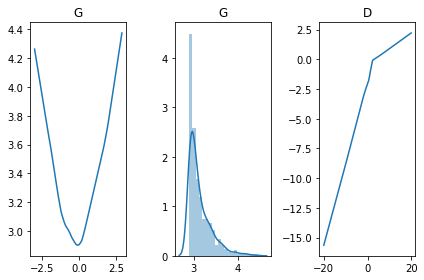

[Epoch 10004/50000] [D loss: -0.083964] [G loss: -0.006780]
[Epoch 10008/50000] [D loss: -0.081012] [G loss: 0.003274]
[Epoch 10012/50000] [D loss: -0.078753] [G loss: 0.035365]
[Epoch 10016/50000] [D loss: -0.084471] [G loss: 0.093115]
[Epoch 10020/50000] [D loss: -0.094902] [G loss: 0.183222]
[Epoch 10024/50000] [D loss: -0.106246] [G loss: 0.278444]
[Epoch 10028/50000] [D loss: -0.111446] [G loss: 0.336070]
[Epoch 10032/50000] [D loss: -0.113137] [G loss: 0.308194]
[Epoch 10036/50000] [D loss: -0.105048] [G loss: 0.167182]
[Epoch 10040/50000] [D loss: -0.106955] [G loss: 0.014102]
[Epoch 10044/50000] [D loss: -0.099483] [G loss: 0.007159]
[Epoch 10048/50000] [D loss: -0.093742] [G loss: -0.004959]
[Epoch 10052/50000] [D loss: -0.090819] [G loss: -0.011631]
[Epoch 10056/50000] [D loss: -0.086852] [G loss: -0.016023]
[Epoch 10060/50000] [D loss: -0.088708] [G loss: -0.010345]
[Epoch 10064/50000] [D loss: -0.092349] [G loss: -0.005029]
[Epoch 10068/50000] [D loss: -0.096941] [G loss: -

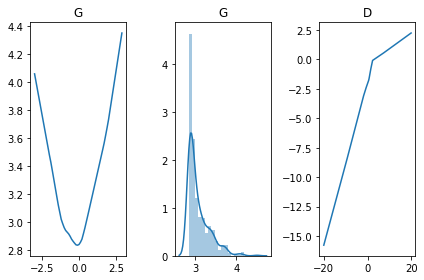

[Epoch 10104/50000] [D loss: -0.088941] [G loss: -0.002543]
[Epoch 10108/50000] [D loss: -0.083562] [G loss: -0.004183]
[Epoch 10112/50000] [D loss: -0.079580] [G loss: 0.008840]
[Epoch 10116/50000] [D loss: -0.079033] [G loss: 0.036178]
[Epoch 10120/50000] [D loss: -0.085635] [G loss: 0.066435]
[Epoch 10124/50000] [D loss: -0.093868] [G loss: 0.129553]
[Epoch 10128/50000] [D loss: -0.105564] [G loss: 0.216843]
[Epoch 10132/50000] [D loss: -0.114883] [G loss: 0.295086]
[Epoch 10136/50000] [D loss: -0.118140] [G loss: 0.300024]
[Epoch 10140/50000] [D loss: -0.109045] [G loss: 0.185312]
[Epoch 10144/50000] [D loss: -0.112026] [G loss: -0.015256]
[Epoch 10148/50000] [D loss: -0.104299] [G loss: 0.006904]
[Epoch 10152/50000] [D loss: -0.095003] [G loss: -0.007418]
[Epoch 10156/50000] [D loss: -0.089631] [G loss: -0.009382]
[Epoch 10160/50000] [D loss: -0.086771] [G loss: -0.013270]
[Epoch 10164/50000] [D loss: -0.083545] [G loss: -0.020755]
[Epoch 10168/50000] [D loss: -0.087502] [G loss: 

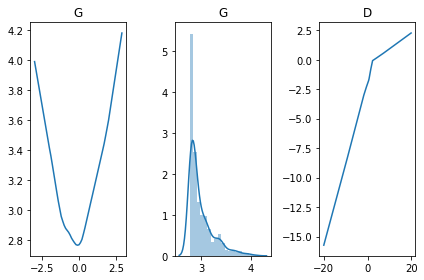

[Epoch 10204/50000] [D loss: -0.100802] [G loss: 0.000609]
[Epoch 10208/50000] [D loss: -0.090106] [G loss: 0.002238]
[Epoch 10212/50000] [D loss: -0.083878] [G loss: -0.002136]
[Epoch 10216/50000] [D loss: -0.078741] [G loss: 0.005399]
[Epoch 10220/50000] [D loss: -0.079039] [G loss: 0.024283]
[Epoch 10224/50000] [D loss: -0.083352] [G loss: 0.058069]
[Epoch 10228/50000] [D loss: -0.093177] [G loss: 0.147528]
[Epoch 10232/50000] [D loss: -0.107393] [G loss: 0.274307]
[Epoch 10236/50000] [D loss: -0.115668] [G loss: 0.343199]
[Epoch 10240/50000] [D loss: -0.110190] [G loss: 0.327730]
[Epoch 10244/50000] [D loss: -0.106647] [G loss: 0.207446]
[Epoch 10248/50000] [D loss: -0.106552] [G loss: -0.015415]
[Epoch 10252/50000] [D loss: -0.101678] [G loss: -0.001056]
[Epoch 10256/50000] [D loss: -0.094494] [G loss: -0.005253]
[Epoch 10260/50000] [D loss: -0.090405] [G loss: -0.009093]
[Epoch 10264/50000] [D loss: -0.086498] [G loss: -0.015499]
[Epoch 10268/50000] [D loss: -0.089212] [G loss: -

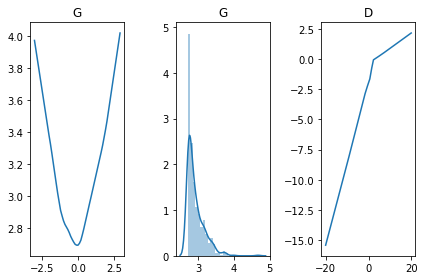

[Epoch 10304/50000] [D loss: -0.109915] [G loss: -0.003776]
[Epoch 10308/50000] [D loss: -0.101705] [G loss: -0.002075]
[Epoch 10312/50000] [D loss: -0.092890] [G loss: 0.001926]
[Epoch 10316/50000] [D loss: -0.084341] [G loss: 0.002330]
[Epoch 10320/50000] [D loss: -0.081801] [G loss: 0.001963]
[Epoch 10324/50000] [D loss: -0.080698] [G loss: 0.013077]
[Epoch 10328/50000] [D loss: -0.083109] [G loss: 0.050617]
[Epoch 10332/50000] [D loss: -0.090804] [G loss: 0.127552]
[Epoch 10336/50000] [D loss: -0.102534] [G loss: 0.230816]
[Epoch 10340/50000] [D loss: -0.115228] [G loss: 0.334796]
[Epoch 10344/50000] [D loss: -0.116030] [G loss: 0.357628]
[Epoch 10348/50000] [D loss: -0.108654] [G loss: 0.267344]
[Epoch 10352/50000] [D loss: -0.106346] [G loss: 0.058070]
[Epoch 10356/50000] [D loss: -0.102041] [G loss: 0.005742]
[Epoch 10360/50000] [D loss: -0.095006] [G loss: -0.007698]
[Epoch 10364/50000] [D loss: -0.090625] [G loss: -0.008295]
[Epoch 10368/50000] [D loss: -0.085397] [G loss: -0.

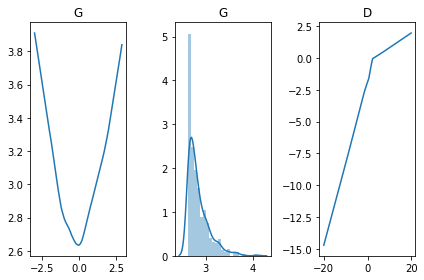

[Epoch 10404/50000] [D loss: -0.117793] [G loss: -0.007965]
[Epoch 10408/50000] [D loss: -0.109290] [G loss: -0.004849]
[Epoch 10412/50000] [D loss: -0.103035] [G loss: -0.005408]
[Epoch 10416/50000] [D loss: -0.090474] [G loss: 0.003396]
[Epoch 10420/50000] [D loss: -0.085440] [G loss: 0.005773]
[Epoch 10424/50000] [D loss: -0.082532] [G loss: -0.003240]
[Epoch 10428/50000] [D loss: -0.078505] [G loss: 0.029540]
[Epoch 10432/50000] [D loss: -0.081451] [G loss: 0.039656]
[Epoch 10436/50000] [D loss: -0.088807] [G loss: 0.110091]
[Epoch 10440/50000] [D loss: -0.099836] [G loss: 0.210138]
[Epoch 10444/50000] [D loss: -0.109378] [G loss: 0.296689]
[Epoch 10448/50000] [D loss: -0.116509] [G loss: 0.336671]
[Epoch 10452/50000] [D loss: -0.108107] [G loss: 0.270137]
[Epoch 10456/50000] [D loss: -0.107676] [G loss: 0.097305]
[Epoch 10460/50000] [D loss: -0.106835] [G loss: 0.048336]
[Epoch 10464/50000] [D loss: -0.097176] [G loss: 0.020699]
[Epoch 10468/50000] [D loss: -0.092197] [G loss: -0.

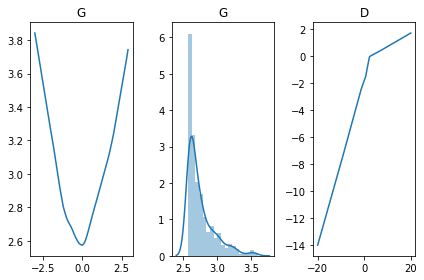

[Epoch 10504/50000] [D loss: -0.121353] [G loss: 0.000005]
[Epoch 10508/50000] [D loss: -0.118748] [G loss: -0.003337]
[Epoch 10512/50000] [D loss: -0.109715] [G loss: -0.005468]
[Epoch 10516/50000] [D loss: -0.104086] [G loss: -0.001840]
[Epoch 10520/50000] [D loss: -0.095517] [G loss: -0.007163]
[Epoch 10524/50000] [D loss: -0.085890] [G loss: -0.004517]
[Epoch 10528/50000] [D loss: -0.085359] [G loss: -0.005912]
[Epoch 10532/50000] [D loss: -0.079541] [G loss: 0.030905]
[Epoch 10536/50000] [D loss: -0.081552] [G loss: 0.036996]
[Epoch 10540/50000] [D loss: -0.088111] [G loss: 0.081026]
[Epoch 10544/50000] [D loss: -0.098369] [G loss: 0.162162]
[Epoch 10548/50000] [D loss: -0.109723] [G loss: 0.257280]
[Epoch 10552/50000] [D loss: -0.111110] [G loss: 0.302611]
[Epoch 10556/50000] [D loss: -0.113912] [G loss: 0.263024]
[Epoch 10560/50000] [D loss: -0.105976] [G loss: 0.115642]
[Epoch 10564/50000] [D loss: -0.107126] [G loss: 0.028600]
[Epoch 10568/50000] [D loss: -0.101648] [G loss: 0

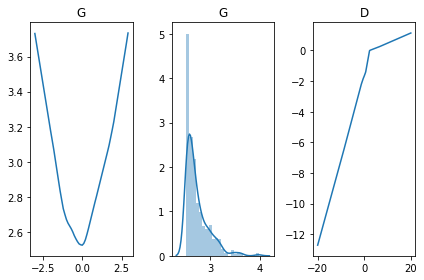

[Epoch 10604/50000] [D loss: -0.117362] [G loss: -0.025449]
[Epoch 10608/50000] [D loss: -0.120370] [G loss: -0.005796]
[Epoch 10612/50000] [D loss: -0.119067] [G loss: -0.008031]
[Epoch 10616/50000] [D loss: -0.111681] [G loss: -0.001528]
[Epoch 10620/50000] [D loss: -0.104412] [G loss: -0.002017]
[Epoch 10624/50000] [D loss: -0.098238] [G loss: -0.004485]
[Epoch 10628/50000] [D loss: -0.089795] [G loss: -0.000072]
[Epoch 10632/50000] [D loss: -0.079729] [G loss: 0.001743]
[Epoch 10636/50000] [D loss: -0.079549] [G loss: 0.008764]
[Epoch 10640/50000] [D loss: -0.079430] [G loss: 0.026101]
[Epoch 10644/50000] [D loss: -0.084991] [G loss: 0.054112]
[Epoch 10648/50000] [D loss: -0.093193] [G loss: 0.125860]
[Epoch 10652/50000] [D loss: -0.105694] [G loss: 0.218434]
[Epoch 10656/50000] [D loss: -0.113425] [G loss: 0.298915]
[Epoch 10660/50000] [D loss: -0.114408] [G loss: 0.303740]
[Epoch 10664/50000] [D loss: -0.111702] [G loss: 0.217575]
[Epoch 10668/50000] [D loss: -0.109869] [G loss: 

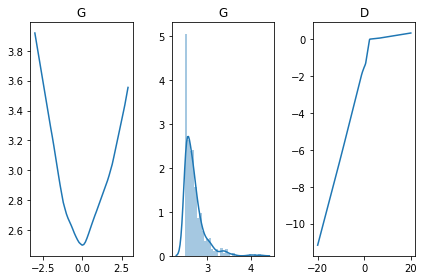

[Epoch 10704/50000] [D loss: -0.108164] [G loss: -0.020078]
[Epoch 10708/50000] [D loss: -0.114909] [G loss: -0.032705]
[Epoch 10712/50000] [D loss: -0.118230] [G loss: -0.025298]
[Epoch 10716/50000] [D loss: -0.118207] [G loss: -0.005133]
[Epoch 10720/50000] [D loss: -0.116796] [G loss: -0.005517]
[Epoch 10724/50000] [D loss: -0.110581] [G loss: -0.004314]
[Epoch 10728/50000] [D loss: -0.106851] [G loss: -0.003670]
[Epoch 10732/50000] [D loss: -0.095715] [G loss: -0.001824]
[Epoch 10736/50000] [D loss: -0.085873] [G loss: 0.001282]
[Epoch 10740/50000] [D loss: -0.081709] [G loss: 0.002503]
[Epoch 10744/50000] [D loss: -0.080545] [G loss: 0.013635]
[Epoch 10748/50000] [D loss: -0.080047] [G loss: 0.031746]
[Epoch 10752/50000] [D loss: -0.086528] [G loss: 0.080377]
[Epoch 10756/50000] [D loss: -0.097236] [G loss: 0.177133]
[Epoch 10760/50000] [D loss: -0.111902] [G loss: 0.260963]
[Epoch 10764/50000] [D loss: -0.117648] [G loss: 0.327827]
[Epoch 10768/50000] [D loss: -0.116611] [G loss:

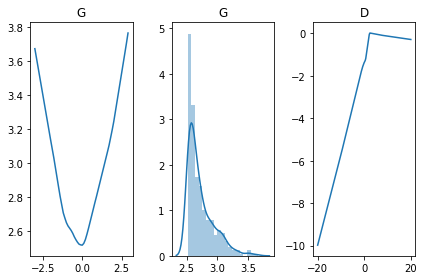

[Epoch 10804/50000] [D loss: -0.098236] [G loss: -0.026101]
[Epoch 10808/50000] [D loss: -0.105582] [G loss: -0.034862]
[Epoch 10812/50000] [D loss: -0.112386] [G loss: -0.040042]
[Epoch 10816/50000] [D loss: -0.117068] [G loss: -0.026243]
[Epoch 10820/50000] [D loss: -0.116567] [G loss: -0.000094]
[Epoch 10824/50000] [D loss: -0.116776] [G loss: -0.003685]
[Epoch 10828/50000] [D loss: -0.111852] [G loss: -0.004433]
[Epoch 10832/50000] [D loss: -0.104012] [G loss: -0.001554]
[Epoch 10836/50000] [D loss: -0.099493] [G loss: -0.003668]
[Epoch 10840/50000] [D loss: -0.091177] [G loss: -0.006207]
[Epoch 10844/50000] [D loss: -0.087152] [G loss: -0.009416]
[Epoch 10848/50000] [D loss: -0.080250] [G loss: 0.021506]
[Epoch 10852/50000] [D loss: -0.081890] [G loss: 0.015716]
[Epoch 10856/50000] [D loss: -0.086225] [G loss: 0.055780]
[Epoch 10860/50000] [D loss: -0.094617] [G loss: 0.120602]
[Epoch 10864/50000] [D loss: -0.104254] [G loss: 0.199514]
[Epoch 10868/50000] [D loss: -0.112344] [G lo

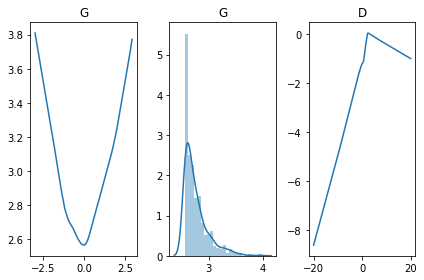

[Epoch 10904/50000] [D loss: -0.087728] [G loss: -0.015472]
[Epoch 10908/50000] [D loss: -0.092348] [G loss: -0.014563]
[Epoch 10912/50000] [D loss: -0.098758] [G loss: -0.026433]
[Epoch 10916/50000] [D loss: -0.106540] [G loss: -0.044419]
[Epoch 10920/50000] [D loss: -0.113132] [G loss: -0.056287]
[Epoch 10924/50000] [D loss: -0.114045] [G loss: -0.050222]
[Epoch 10928/50000] [D loss: -0.119407] [G loss: -0.003280]
[Epoch 10932/50000] [D loss: -0.115982] [G loss: -0.004632]
[Epoch 10936/50000] [D loss: -0.108654] [G loss: -0.002594]
[Epoch 10940/50000] [D loss: -0.105393] [G loss: -0.002055]
[Epoch 10944/50000] [D loss: -0.094769] [G loss: 0.001322]
[Epoch 10948/50000] [D loss: -0.089776] [G loss: -0.004505]
[Epoch 10952/50000] [D loss: -0.083508] [G loss: -0.000032]
[Epoch 10956/50000] [D loss: -0.081389] [G loss: 0.012999]
[Epoch 10960/50000] [D loss: -0.083714] [G loss: 0.020965]
[Epoch 10964/50000] [D loss: -0.087196] [G loss: 0.045094]
[Epoch 10968/50000] [D loss: -0.095875] [G l

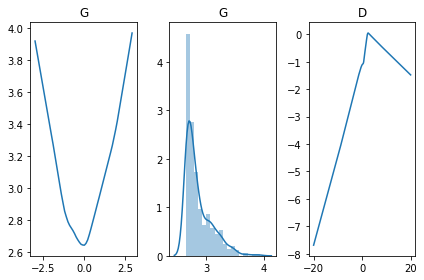

[Epoch 11004/50000] [D loss: -0.087484] [G loss: -0.013373]
[Epoch 11008/50000] [D loss: -0.085399] [G loss: -0.015634]
[Epoch 11012/50000] [D loss: -0.088559] [G loss: -0.018479]
[Epoch 11016/50000] [D loss: -0.093244] [G loss: -0.016493]
[Epoch 11020/50000] [D loss: -0.099746] [G loss: -0.020585]
[Epoch 11024/50000] [D loss: -0.106991] [G loss: -0.032081]
[Epoch 11028/50000] [D loss: -0.113201] [G loss: -0.050074]
[Epoch 11032/50000] [D loss: -0.118261] [G loss: -0.031387]
[Epoch 11036/50000] [D loss: -0.118219] [G loss: -0.002777]
[Epoch 11040/50000] [D loss: -0.116629] [G loss: -0.005522]
[Epoch 11044/50000] [D loss: -0.111112] [G loss: -0.005241]
[Epoch 11048/50000] [D loss: -0.106370] [G loss: -0.002530]
[Epoch 11052/50000] [D loss: -0.098156] [G loss: -0.002638]
[Epoch 11056/50000] [D loss: -0.087999] [G loss: -0.003572]
[Epoch 11060/50000] [D loss: -0.083049] [G loss: -0.000749]
[Epoch 11064/50000] [D loss: -0.078523] [G loss: 0.019768]
[Epoch 11068/50000] [D loss: -0.081589] [

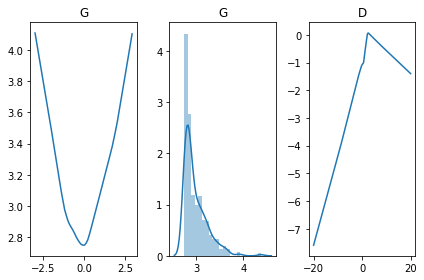

[Epoch 11104/50000] [D loss: -0.095038] [G loss: -0.009664]
[Epoch 11108/50000] [D loss: -0.093139] [G loss: -0.005801]
[Epoch 11112/50000] [D loss: -0.088435] [G loss: -0.009796]
[Epoch 11116/50000] [D loss: -0.087572] [G loss: -0.013459]
[Epoch 11120/50000] [D loss: -0.089004] [G loss: -0.016931]
[Epoch 11124/50000] [D loss: -0.094324] [G loss: -0.010200]
[Epoch 11128/50000] [D loss: -0.100449] [G loss: -0.010272]
[Epoch 11132/50000] [D loss: -0.107962] [G loss: -0.028566]
[Epoch 11136/50000] [D loss: -0.115356] [G loss: -0.038599]
[Epoch 11140/50000] [D loss: -0.117936] [G loss: -0.028662]
[Epoch 11144/50000] [D loss: -0.119740] [G loss: -0.000858]
[Epoch 11148/50000] [D loss: -0.118925] [G loss: -0.004907]
[Epoch 11152/50000] [D loss: -0.110618] [G loss: -0.003755]
[Epoch 11156/50000] [D loss: -0.102111] [G loss: -0.001290]
[Epoch 11160/50000] [D loss: -0.096735] [G loss: -0.005263]
[Epoch 11164/50000] [D loss: -0.088116] [G loss: -0.005182]
[Epoch 11168/50000] [D loss: -0.081698] 

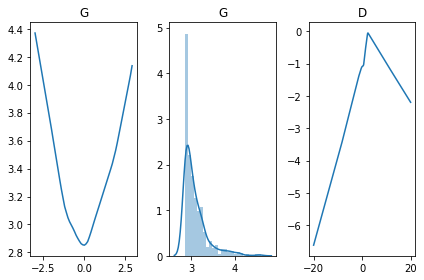

[Epoch 11204/50000] [D loss: -0.103692] [G loss: 0.000890]
[Epoch 11208/50000] [D loss: -0.099654] [G loss: 0.011936]
[Epoch 11212/50000] [D loss: -0.093047] [G loss: -0.011990]
[Epoch 11216/50000] [D loss: -0.091630] [G loss: -0.008891]
[Epoch 11220/50000] [D loss: -0.088414] [G loss: -0.012421]
[Epoch 11224/50000] [D loss: -0.089744] [G loss: -0.010041]
[Epoch 11228/50000] [D loss: -0.091854] [G loss: -0.012274]
[Epoch 11232/50000] [D loss: -0.097756] [G loss: -0.004083]
[Epoch 11236/50000] [D loss: -0.103618] [G loss: -0.006559]
[Epoch 11240/50000] [D loss: -0.109481] [G loss: -0.009700]
[Epoch 11244/50000] [D loss: -0.116450] [G loss: -0.008084]
[Epoch 11248/50000] [D loss: -0.116759] [G loss: -0.003640]
[Epoch 11252/50000] [D loss: -0.119474] [G loss: -0.006436]
[Epoch 11256/50000] [D loss: -0.113154] [G loss: -0.005730]
[Epoch 11260/50000] [D loss: -0.109248] [G loss: -0.005370]
[Epoch 11264/50000] [D loss: -0.101093] [G loss: 0.000495]
[Epoch 11268/50000] [D loss: -0.092468] [G 

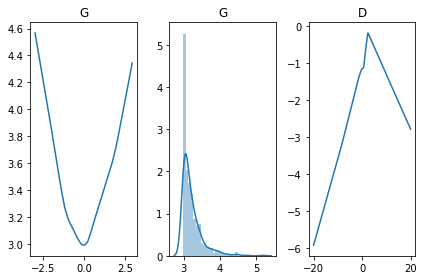

[Epoch 11304/50000] [D loss: -0.109211] [G loss: 0.264087]
[Epoch 11308/50000] [D loss: -0.106415] [G loss: 0.108467]
[Epoch 11312/50000] [D loss: -0.105367] [G loss: 0.023394]
[Epoch 11316/50000] [D loss: -0.097443] [G loss: -0.006289]
[Epoch 11320/50000] [D loss: -0.092294] [G loss: -0.008651]
[Epoch 11324/50000] [D loss: -0.089324] [G loss: -0.012691]
[Epoch 11328/50000] [D loss: -0.087805] [G loss: -0.015386]
[Epoch 11332/50000] [D loss: -0.089639] [G loss: -0.016564]
[Epoch 11336/50000] [D loss: -0.094308] [G loss: -0.010021]
[Epoch 11340/50000] [D loss: -0.100216] [G loss: -0.012553]
[Epoch 11344/50000] [D loss: -0.106711] [G loss: -0.016975]
[Epoch 11348/50000] [D loss: -0.111780] [G loss: -0.019780]
[Epoch 11352/50000] [D loss: -0.115980] [G loss: -0.006327]
[Epoch 11356/50000] [D loss: -0.115998] [G loss: -0.005605]
[Epoch 11360/50000] [D loss: -0.115539] [G loss: -0.007758]
[Epoch 11364/50000] [D loss: -0.111868] [G loss: -0.005617]
[Epoch 11368/50000] [D loss: -0.101823] [G 

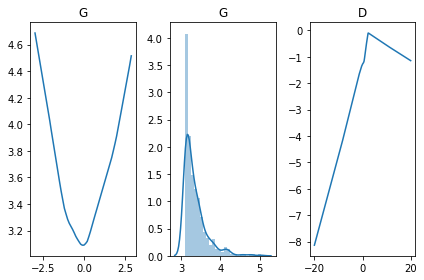

[Epoch 11404/50000] [D loss: -0.112107] [G loss: 0.239067]
[Epoch 11408/50000] [D loss: -0.113639] [G loss: 0.246350]
[Epoch 11412/50000] [D loss: -0.106752] [G loss: 0.155805]
[Epoch 11416/50000] [D loss: -0.112839] [G loss: -0.001269]
[Epoch 11420/50000] [D loss: -0.105460] [G loss: 0.001828]
[Epoch 11424/50000] [D loss: -0.101147] [G loss: 0.008249]
[Epoch 11428/50000] [D loss: -0.094304] [G loss: 0.000985]
[Epoch 11432/50000] [D loss: -0.088327] [G loss: -0.015379]
[Epoch 11436/50000] [D loss: -0.086122] [G loss: -0.015269]
[Epoch 11440/50000] [D loss: -0.086845] [G loss: -0.018299]
[Epoch 11444/50000] [D loss: -0.090861] [G loss: -0.019010]
[Epoch 11448/50000] [D loss: -0.096513] [G loss: -0.033012]
[Epoch 11452/50000] [D loss: -0.104536] [G loss: -0.061138]
[Epoch 11456/50000] [D loss: -0.111485] [G loss: -0.082355]
[Epoch 11460/50000] [D loss: -0.115373] [G loss: -0.090147]
[Epoch 11464/50000] [D loss: -0.113711] [G loss: -0.065302]
[Epoch 11468/50000] [D loss: -0.115581] [G los

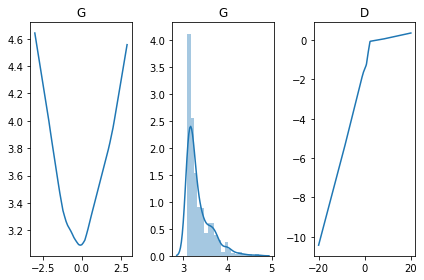

[Epoch 11504/50000] [D loss: -0.094466] [G loss: 0.106065]
[Epoch 11508/50000] [D loss: -0.104733] [G loss: 0.184506]
[Epoch 11512/50000] [D loss: -0.109097] [G loss: 0.221649]
[Epoch 11516/50000] [D loss: -0.112958] [G loss: 0.220402]
[Epoch 11520/50000] [D loss: -0.110680] [G loss: 0.143380]
[Epoch 11524/50000] [D loss: -0.110457] [G loss: -0.013229]
[Epoch 11528/50000] [D loss: -0.106575] [G loss: 0.009505]
[Epoch 11532/50000] [D loss: -0.103054] [G loss: 0.014660]
[Epoch 11536/50000] [D loss: -0.093480] [G loss: -0.010710]
[Epoch 11540/50000] [D loss: -0.089507] [G loss: -0.013400]
[Epoch 11544/50000] [D loss: -0.085769] [G loss: -0.016065]
[Epoch 11548/50000] [D loss: -0.085556] [G loss: -0.020265]
[Epoch 11552/50000] [D loss: -0.090634] [G loss: -0.012998]
[Epoch 11556/50000] [D loss: -0.095401] [G loss: -0.031814]
[Epoch 11560/50000] [D loss: -0.102420] [G loss: -0.047302]
[Epoch 11564/50000] [D loss: -0.107971] [G loss: -0.071191]
[Epoch 11568/50000] [D loss: -0.113179] [G loss

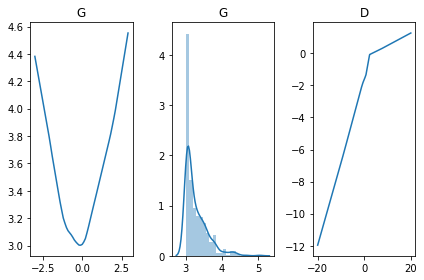

[Epoch 11604/50000] [D loss: -0.084392] [G loss: 0.008684]
[Epoch 11608/50000] [D loss: -0.086391] [G loss: 0.021238]
[Epoch 11612/50000] [D loss: -0.091479] [G loss: 0.058308]
[Epoch 11616/50000] [D loss: -0.100987] [G loss: 0.139378]
[Epoch 11620/50000] [D loss: -0.110040] [G loss: 0.216844]
[Epoch 11624/50000] [D loss: -0.115394] [G loss: 0.254170]
[Epoch 11628/50000] [D loss: -0.110883] [G loss: 0.202613]
[Epoch 11632/50000] [D loss: -0.111913] [G loss: 0.079512]
[Epoch 11636/50000] [D loss: -0.107927] [G loss: 0.027543]
[Epoch 11640/50000] [D loss: -0.101136] [G loss: 0.001021]
[Epoch 11644/50000] [D loss: -0.095651] [G loss: -0.002516]
[Epoch 11648/50000] [D loss: -0.088654] [G loss: -0.012795]
[Epoch 11652/50000] [D loss: -0.085880] [G loss: -0.015575]
[Epoch 11656/50000] [D loss: -0.086495] [G loss: -0.015829]
[Epoch 11660/50000] [D loss: -0.089674] [G loss: -0.028733]
[Epoch 11664/50000] [D loss: -0.096657] [G loss: -0.051247]
[Epoch 11668/50000] [D loss: -0.104535] [G loss: -

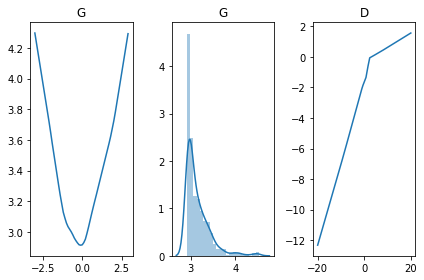

[Epoch 11704/50000] [D loss: -0.087345] [G loss: 0.002708]
[Epoch 11708/50000] [D loss: -0.085633] [G loss: 0.002043]
[Epoch 11712/50000] [D loss: -0.086390] [G loss: 0.017759]
[Epoch 11716/50000] [D loss: -0.090256] [G loss: 0.019027]
[Epoch 11720/50000] [D loss: -0.095628] [G loss: 0.050619]
[Epoch 11724/50000] [D loss: -0.102468] [G loss: 0.102030]
[Epoch 11728/50000] [D loss: -0.110834] [G loss: 0.149408]
[Epoch 11732/50000] [D loss: -0.114863] [G loss: 0.162364]
[Epoch 11736/50000] [D loss: -0.112281] [G loss: 0.099728]
[Epoch 11740/50000] [D loss: -0.112585] [G loss: 0.028577]
[Epoch 11744/50000] [D loss: -0.108055] [G loss: 0.012344]
[Epoch 11748/50000] [D loss: -0.101699] [G loss: 0.003851]
[Epoch 11752/50000] [D loss: -0.094765] [G loss: -0.002397]
[Epoch 11756/50000] [D loss: -0.089718] [G loss: -0.011113]
[Epoch 11760/50000] [D loss: -0.085680] [G loss: -0.013933]
[Epoch 11764/50000] [D loss: -0.083026] [G loss: -0.022281]
[Epoch 11768/50000] [D loss: -0.087605] [G loss: -0.

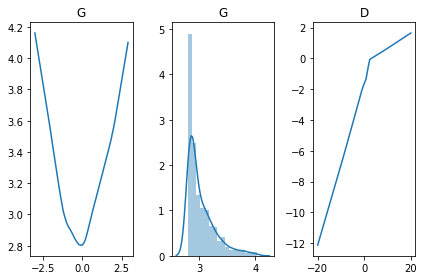

[Epoch 11804/50000] [D loss: -0.093893] [G loss: 0.001815]
[Epoch 11808/50000] [D loss: -0.094209] [G loss: -0.000425]
[Epoch 11812/50000] [D loss: -0.088186] [G loss: -0.004164]
[Epoch 11816/50000] [D loss: -0.087507] [G loss: 0.001659]
[Epoch 11820/50000] [D loss: -0.087468] [G loss: 0.014610]
[Epoch 11824/50000] [D loss: -0.091685] [G loss: 0.014078]
[Epoch 11828/50000] [D loss: -0.097498] [G loss: 0.039494]
[Epoch 11832/50000] [D loss: -0.104349] [G loss: 0.075594]
[Epoch 11836/50000] [D loss: -0.111451] [G loss: 0.103156]
[Epoch 11840/50000] [D loss: -0.113573] [G loss: 0.092742]
[Epoch 11844/50000] [D loss: -0.115665] [G loss: 0.032625]
[Epoch 11848/50000] [D loss: -0.116502] [G loss: 0.024503]
[Epoch 11852/50000] [D loss: -0.107838] [G loss: 0.008233]
[Epoch 11856/50000] [D loss: -0.105412] [G loss: 0.010200]
[Epoch 11860/50000] [D loss: -0.099209] [G loss: 0.003563]
[Epoch 11864/50000] [D loss: -0.085648] [G loss: -0.019988]
[Epoch 11868/50000] [D loss: -0.082238] [G loss: -0.0

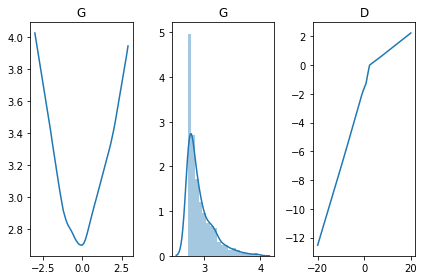

[Epoch 11904/50000] [D loss: -0.104763] [G loss: -0.004443]
[Epoch 11908/50000] [D loss: -0.099552] [G loss: -0.005168]
[Epoch 11912/50000] [D loss: -0.095189] [G loss: 0.001098]
[Epoch 11916/50000] [D loss: -0.088400] [G loss: 0.005523]
[Epoch 11920/50000] [D loss: -0.085984] [G loss: 0.003802]
[Epoch 11924/50000] [D loss: -0.087133] [G loss: 0.007176]
[Epoch 11928/50000] [D loss: -0.090750] [G loss: 0.016620]
[Epoch 11932/50000] [D loss: -0.095418] [G loss: 0.027139]
[Epoch 11936/50000] [D loss: -0.102969] [G loss: 0.058613]
[Epoch 11940/50000] [D loss: -0.110348] [G loss: 0.085165]
[Epoch 11944/50000] [D loss: -0.116824] [G loss: 0.084357]
[Epoch 11948/50000] [D loss: -0.123173] [G loss: 0.049150]
[Epoch 11952/50000] [D loss: -0.119701] [G loss: 0.030908]
[Epoch 11956/50000] [D loss: -0.112698] [G loss: 0.018646]
[Epoch 11960/50000] [D loss: -0.097731] [G loss: 0.001012]
[Epoch 11964/50000] [D loss: -0.084842] [G loss: -0.019611]
[Epoch 11968/50000] [D loss: -0.076561] [G loss: -0.0

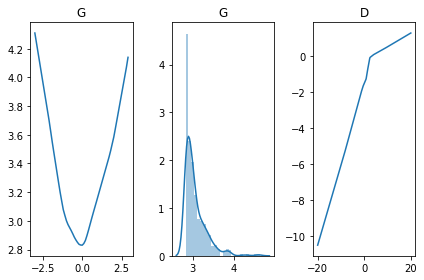

[Epoch 12004/50000] [D loss: -0.093097] [G loss: 0.002750]
[Epoch 12008/50000] [D loss: -0.086357] [G loss: 0.004931]
[Epoch 12012/50000] [D loss: -0.087224] [G loss: 0.010452]
[Epoch 12016/50000] [D loss: -0.093412] [G loss: 0.003024]
[Epoch 12020/50000] [D loss: -0.098332] [G loss: 0.016406]
[Epoch 12024/50000] [D loss: -0.104779] [G loss: 0.027600]
[Epoch 12028/50000] [D loss: -0.109672] [G loss: 0.034548]
[Epoch 12032/50000] [D loss: -0.114085] [G loss: 0.019192]
[Epoch 12036/50000] [D loss: -0.118945] [G loss: 0.030067]
[Epoch 12040/50000] [D loss: -0.118369] [G loss: 0.028881]
[Epoch 12044/50000] [D loss: -0.112263] [G loss: 0.017920]
[Epoch 12048/50000] [D loss: -0.107799] [G loss: 0.014261]
[Epoch 12052/50000] [D loss: -0.096282] [G loss: -0.000980]
[Epoch 12056/50000] [D loss: -0.086471] [G loss: -0.013135]
[Epoch 12060/50000] [D loss: -0.080895] [G loss: -0.022984]
[Epoch 12064/50000] [D loss: -0.079502] [G loss: -0.028347]
[Epoch 12068/50000] [D loss: -0.084305] [G loss: -0.

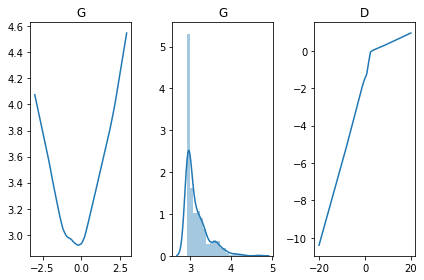

[Epoch 12104/50000] [D loss: -0.090929] [G loss: 0.005229]
[Epoch 12108/50000] [D loss: -0.094667] [G loss: -0.001888]
[Epoch 12112/50000] [D loss: -0.096340] [G loss: 0.028942]
[Epoch 12116/50000] [D loss: -0.101160] [G loss: -0.003064]
[Epoch 12120/50000] [D loss: -0.104812] [G loss: 0.123721]
[Epoch 12124/50000] [D loss: -0.110516] [G loss: 0.097448]
[Epoch 12128/50000] [D loss: -0.111276] [G loss: 0.013471]
[Epoch 12132/50000] [D loss: -0.111190] [G loss: 0.012228]
[Epoch 12136/50000] [D loss: -0.110046] [G loss: 0.020428]
[Epoch 12140/50000] [D loss: -0.107202] [G loss: 0.012480]
[Epoch 12144/50000] [D loss: -0.099491] [G loss: 0.003665]
[Epoch 12148/50000] [D loss: -0.093699] [G loss: -0.005430]
[Epoch 12152/50000] [D loss: -0.087866] [G loss: -0.011591]
[Epoch 12156/50000] [D loss: -0.088275] [G loss: -0.012714]
[Epoch 12160/50000] [D loss: -0.087813] [G loss: -0.015450]
[Epoch 12164/50000] [D loss: -0.092328] [G loss: -0.019999]
[Epoch 12168/50000] [D loss: -0.099050] [G loss: 

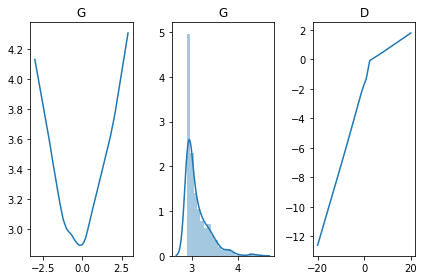

[Epoch 12204/50000] [D loss: -0.088383] [G loss: -0.002719]
[Epoch 12208/50000] [D loss: -0.082177] [G loss: 0.003845]
[Epoch 12212/50000] [D loss: -0.082803] [G loss: 0.014537]
[Epoch 12216/50000] [D loss: -0.086025] [G loss: 0.035180]
[Epoch 12220/50000] [D loss: -0.092084] [G loss: 0.081884]
[Epoch 12224/50000] [D loss: -0.101344] [G loss: 0.166689]
[Epoch 12228/50000] [D loss: -0.109897] [G loss: 0.237715]
[Epoch 12232/50000] [D loss: -0.114366] [G loss: 0.263604]
[Epoch 12236/50000] [D loss: -0.106038] [G loss: 0.195543]
[Epoch 12240/50000] [D loss: -0.109098] [G loss: 0.039419]
[Epoch 12244/50000] [D loss: -0.103893] [G loss: 0.015192]
[Epoch 12248/50000] [D loss: -0.100436] [G loss: 0.003566]
[Epoch 12252/50000] [D loss: -0.093486] [G loss: -0.002208]
[Epoch 12256/50000] [D loss: -0.085141] [G loss: -0.017287]
[Epoch 12260/50000] [D loss: -0.086485] [G loss: -0.017230]
[Epoch 12264/50000] [D loss: -0.089742] [G loss: -0.015047]
[Epoch 12268/50000] [D loss: -0.093957] [G loss: -0

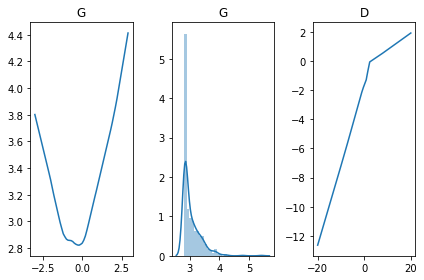

[Epoch 12304/50000] [D loss: -0.094756] [G loss: -0.004334]
[Epoch 12308/50000] [D loss: -0.084919] [G loss: 0.000059]
[Epoch 12312/50000] [D loss: -0.083964] [G loss: 0.005479]
[Epoch 12316/50000] [D loss: -0.083057] [G loss: 0.014954]
[Epoch 12320/50000] [D loss: -0.087271] [G loss: 0.026196]
[Epoch 12324/50000] [D loss: -0.092471] [G loss: 0.073888]
[Epoch 12328/50000] [D loss: -0.100916] [G loss: 0.132851]
[Epoch 12332/50000] [D loss: -0.108378] [G loss: 0.197359]
[Epoch 12336/50000] [D loss: -0.116600] [G loss: 0.218966]
[Epoch 12340/50000] [D loss: -0.111316] [G loss: 0.175825]
[Epoch 12344/50000] [D loss: -0.111508] [G loss: 0.042800]
[Epoch 12348/50000] [D loss: -0.107615] [G loss: 0.013456]
[Epoch 12352/50000] [D loss: -0.102404] [G loss: 0.004700]
[Epoch 12356/50000] [D loss: -0.093173] [G loss: -0.007022]
[Epoch 12360/50000] [D loss: -0.087714] [G loss: -0.014159]
[Epoch 12364/50000] [D loss: -0.086630] [G loss: -0.017056]
[Epoch 12368/50000] [D loss: -0.086203] [G loss: -0.

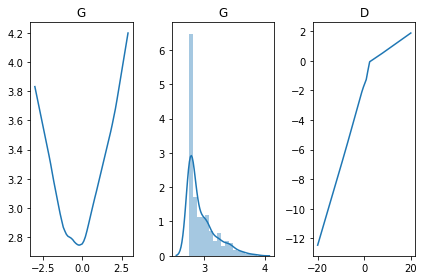

[Epoch 12404/50000] [D loss: -0.103076] [G loss: -0.005007]
[Epoch 12408/50000] [D loss: -0.096871] [G loss: -0.005226]
[Epoch 12412/50000] [D loss: -0.090823] [G loss: -0.006170]
[Epoch 12416/50000] [D loss: -0.085761] [G loss: 0.004775]
[Epoch 12420/50000] [D loss: -0.082704] [G loss: 0.025928]
[Epoch 12424/50000] [D loss: -0.084508] [G loss: 0.027838]
[Epoch 12428/50000] [D loss: -0.090873] [G loss: 0.067898]
[Epoch 12432/50000] [D loss: -0.098575] [G loss: 0.130609]
[Epoch 12436/50000] [D loss: -0.109246] [G loss: 0.201617]
[Epoch 12440/50000] [D loss: -0.108297] [G loss: 0.227152]
[Epoch 12444/50000] [D loss: -0.111125] [G loss: 0.197186]
[Epoch 12448/50000] [D loss: -0.108244] [G loss: 0.088841]
[Epoch 12452/50000] [D loss: -0.108278] [G loss: 0.026870]
[Epoch 12456/50000] [D loss: -0.101785] [G loss: 0.009016]
[Epoch 12460/50000] [D loss: -0.095622] [G loss: -0.001750]
[Epoch 12464/50000] [D loss: -0.088703] [G loss: -0.012127]
[Epoch 12468/50000] [D loss: -0.085763] [G loss: -0

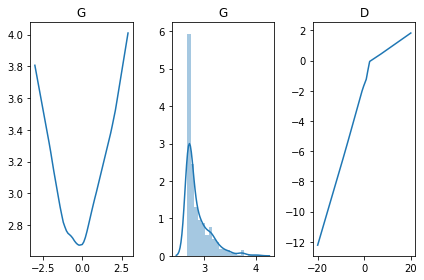

[Epoch 12504/50000] [D loss: -0.110320] [G loss: -0.003935]
[Epoch 12508/50000] [D loss: -0.104657] [G loss: -0.007118]
[Epoch 12512/50000] [D loss: -0.095743] [G loss: -0.001314]
[Epoch 12516/50000] [D loss: -0.089353] [G loss: -0.000615]
[Epoch 12520/50000] [D loss: -0.084157] [G loss: 0.001096]
[Epoch 12524/50000] [D loss: -0.081131] [G loss: 0.020418]
[Epoch 12528/50000] [D loss: -0.084279] [G loss: 0.029127]
[Epoch 12532/50000] [D loss: -0.088591] [G loss: 0.070341]
[Epoch 12536/50000] [D loss: -0.096899] [G loss: 0.134047]
[Epoch 12540/50000] [D loss: -0.106304] [G loss: 0.210355]
[Epoch 12544/50000] [D loss: -0.111076] [G loss: 0.249912]
[Epoch 12548/50000] [D loss: -0.109676] [G loss: 0.241947]
[Epoch 12552/50000] [D loss: -0.105136] [G loss: 0.134199]
[Epoch 12556/50000] [D loss: -0.108025] [G loss: 0.007984]
[Epoch 12560/50000] [D loss: -0.102743] [G loss: 0.010952]
[Epoch 12564/50000] [D loss: -0.096832] [G loss: -0.000132]
[Epoch 12568/50000] [D loss: -0.092173] [G loss: -0

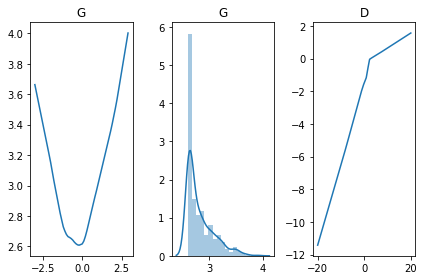

[Epoch 12604/50000] [D loss: -0.117117] [G loss: -0.005718]
[Epoch 12608/50000] [D loss: -0.113753] [G loss: -0.004435]
[Epoch 12612/50000] [D loss: -0.105018] [G loss: 0.000989]
[Epoch 12616/50000] [D loss: -0.098605] [G loss: -0.009769]
[Epoch 12620/50000] [D loss: -0.088696] [G loss: -0.000592]
[Epoch 12624/50000] [D loss: -0.085102] [G loss: 0.005600]
[Epoch 12628/50000] [D loss: -0.083102] [G loss: 0.019527]
[Epoch 12632/50000] [D loss: -0.086035] [G loss: 0.036907]
[Epoch 12636/50000] [D loss: -0.092853] [G loss: 0.089110]
[Epoch 12640/50000] [D loss: -0.101959] [G loss: 0.155075]
[Epoch 12644/50000] [D loss: -0.106874] [G loss: 0.221610]
[Epoch 12648/50000] [D loss: -0.114205] [G loss: 0.246344]
[Epoch 12652/50000] [D loss: -0.110687] [G loss: 0.198120]
[Epoch 12656/50000] [D loss: -0.107229] [G loss: 0.068809]
[Epoch 12660/50000] [D loss: -0.105324] [G loss: 0.030641]
[Epoch 12664/50000] [D loss: -0.101142] [G loss: 0.016601]
[Epoch 12668/50000] [D loss: -0.092402] [G loss: -0.

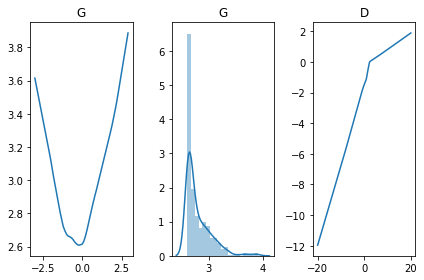

[Epoch 12704/50000] [D loss: -0.114790] [G loss: -0.005465]
[Epoch 12708/50000] [D loss: -0.111127] [G loss: -0.003572]
[Epoch 12712/50000] [D loss: -0.106037] [G loss: -0.003035]
[Epoch 12716/50000] [D loss: -0.100800] [G loss: -0.002289]
[Epoch 12720/50000] [D loss: -0.094459] [G loss: -0.001167]
[Epoch 12724/50000] [D loss: -0.087603] [G loss: -0.002536]
[Epoch 12728/50000] [D loss: -0.085568] [G loss: 0.005461]
[Epoch 12732/50000] [D loss: -0.084745] [G loss: 0.007763]
[Epoch 12736/50000] [D loss: -0.086522] [G loss: 0.041983]
[Epoch 12740/50000] [D loss: -0.092703] [G loss: 0.070429]
[Epoch 12744/50000] [D loss: -0.101177] [G loss: 0.128436]
[Epoch 12748/50000] [D loss: -0.109350] [G loss: 0.204808]
[Epoch 12752/50000] [D loss: -0.111151] [G loss: 0.236618]
[Epoch 12756/50000] [D loss: -0.112897] [G loss: 0.200616]
[Epoch 12760/50000] [D loss: -0.107129] [G loss: 0.061807]
[Epoch 12764/50000] [D loss: -0.102897] [G loss: 0.021422]
[Epoch 12768/50000] [D loss: -0.099379] [G loss: 0

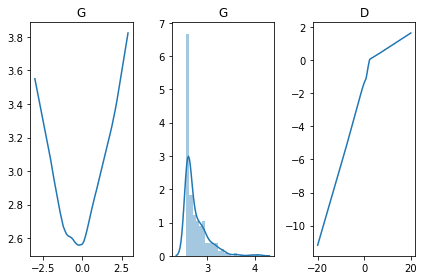

[Epoch 12804/50000] [D loss: -0.114530] [G loss: -0.070327]
[Epoch 12808/50000] [D loss: -0.114986] [G loss: -0.024565]
[Epoch 12812/50000] [D loss: -0.109584] [G loss: -0.008640]
[Epoch 12816/50000] [D loss: -0.106739] [G loss: -0.005142]
[Epoch 12820/50000] [D loss: -0.099226] [G loss: -0.002637]
[Epoch 12824/50000] [D loss: -0.093158] [G loss: -0.003158]
[Epoch 12828/50000] [D loss: -0.089767] [G loss: -0.001615]
[Epoch 12832/50000] [D loss: -0.084900] [G loss: 0.007447]
[Epoch 12836/50000] [D loss: -0.085121] [G loss: 0.013740]
[Epoch 12840/50000] [D loss: -0.087342] [G loss: 0.035378]
[Epoch 12844/50000] [D loss: -0.093365] [G loss: 0.084788]
[Epoch 12848/50000] [D loss: -0.102048] [G loss: 0.150430]
[Epoch 12852/50000] [D loss: -0.111564] [G loss: 0.202172]
[Epoch 12856/50000] [D loss: -0.113748] [G loss: 0.222922]
[Epoch 12860/50000] [D loss: -0.110613] [G loss: 0.175714]
[Epoch 12864/50000] [D loss: -0.103241] [G loss: 0.044407]
[Epoch 12868/50000] [D loss: -0.103226] [G loss: 

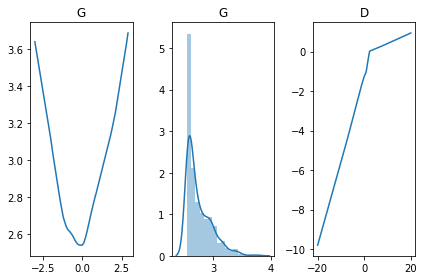

[Epoch 12904/50000] [D loss: -0.111915] [G loss: -0.056256]
[Epoch 12908/50000] [D loss: -0.114231] [G loss: -0.046922]
[Epoch 12912/50000] [D loss: -0.114690] [G loss: -0.006147]
[Epoch 12916/50000] [D loss: -0.112954] [G loss: -0.003464]
[Epoch 12920/50000] [D loss: -0.109132] [G loss: -0.005052]
[Epoch 12924/50000] [D loss: -0.101924] [G loss: -0.005445]
[Epoch 12928/50000] [D loss: -0.093260] [G loss: -0.002492]
[Epoch 12932/50000] [D loss: -0.090848] [G loss: -0.003725]
[Epoch 12936/50000] [D loss: -0.086689] [G loss: -0.001219]
[Epoch 12940/50000] [D loss: -0.085052] [G loss: 0.015282]
[Epoch 12944/50000] [D loss: -0.085828] [G loss: 0.026137]
[Epoch 12948/50000] [D loss: -0.090930] [G loss: 0.059428]
[Epoch 12952/50000] [D loss: -0.099775] [G loss: 0.121592]
[Epoch 12956/50000] [D loss: -0.107567] [G loss: 0.198540]
[Epoch 12960/50000] [D loss: -0.114715] [G loss: 0.237937]
[Epoch 12964/50000] [D loss: -0.114705] [G loss: 0.215195]
[Epoch 12968/50000] [D loss: -0.105326] [G loss

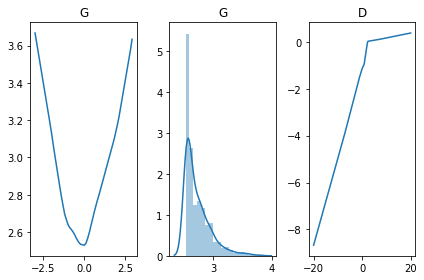

[Epoch 13004/50000] [D loss: -0.106186] [G loss: -0.056325]
[Epoch 13008/50000] [D loss: -0.111780] [G loss: -0.068642]
[Epoch 13012/50000] [D loss: -0.114188] [G loss: -0.062980]
[Epoch 13016/50000] [D loss: -0.113545] [G loss: -0.025788]
[Epoch 13020/50000] [D loss: -0.112969] [G loss: -0.010314]
[Epoch 13024/50000] [D loss: -0.106736] [G loss: -0.005750]
[Epoch 13028/50000] [D loss: -0.101527] [G loss: -0.002728]
[Epoch 13032/50000] [D loss: -0.094360] [G loss: -0.002763]
[Epoch 13036/50000] [D loss: -0.086534] [G loss: 0.000389]
[Epoch 13040/50000] [D loss: -0.086401] [G loss: 0.001420]
[Epoch 13044/50000] [D loss: -0.085324] [G loss: 0.020917]
[Epoch 13048/50000] [D loss: -0.086623] [G loss: 0.028326]
[Epoch 13052/50000] [D loss: -0.093236] [G loss: 0.058900]
[Epoch 13056/50000] [D loss: -0.100150] [G loss: 0.110127]
[Epoch 13060/50000] [D loss: -0.108433] [G loss: 0.158730]
[Epoch 13064/50000] [D loss: -0.115322] [G loss: 0.195018]
[Epoch 13068/50000] [D loss: -0.111104] [G loss:

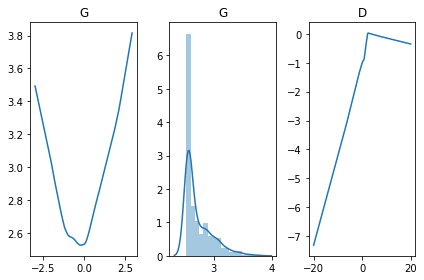

[Epoch 13104/50000] [D loss: -0.095959] [G loss: -0.039167]
[Epoch 13108/50000] [D loss: -0.103422] [G loss: -0.060180]
[Epoch 13112/50000] [D loss: -0.110645] [G loss: -0.073868]
[Epoch 13116/50000] [D loss: -0.112520] [G loss: -0.079828]
[Epoch 13120/50000] [D loss: -0.115879] [G loss: -0.057167]
[Epoch 13124/50000] [D loss: -0.114692] [G loss: -0.000732]
[Epoch 13128/50000] [D loss: -0.106805] [G loss: -0.003357]
[Epoch 13132/50000] [D loss: -0.103208] [G loss: -0.003370]
[Epoch 13136/50000] [D loss: -0.098391] [G loss: -0.001103]
[Epoch 13140/50000] [D loss: -0.091487] [G loss: -0.004180]
[Epoch 13144/50000] [D loss: -0.087836] [G loss: 0.000116]
[Epoch 13148/50000] [D loss: -0.084160] [G loss: 0.011326]
[Epoch 13152/50000] [D loss: -0.086953] [G loss: 0.012134]
[Epoch 13156/50000] [D loss: -0.089949] [G loss: 0.040804]
[Epoch 13160/50000] [D loss: -0.097635] [G loss: 0.111988]
[Epoch 13164/50000] [D loss: -0.104930] [G loss: 0.169950]
[Epoch 13168/50000] [D loss: -0.111849] [G los

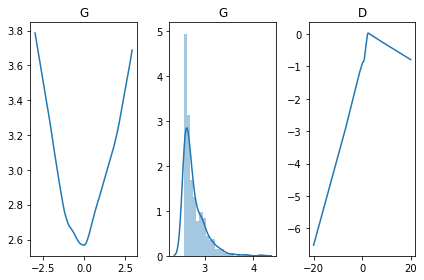

[Epoch 13204/50000] [D loss: -0.090277] [G loss: -0.020190]
[Epoch 13208/50000] [D loss: -0.096034] [G loss: -0.024666]
[Epoch 13212/50000] [D loss: -0.102363] [G loss: -0.040699]
[Epoch 13216/50000] [D loss: -0.108445] [G loss: -0.058262]
[Epoch 13220/50000] [D loss: -0.113168] [G loss: -0.054348]
[Epoch 13224/50000] [D loss: -0.113590] [G loss: -0.035162]
[Epoch 13228/50000] [D loss: -0.114163] [G loss: -0.002337]
[Epoch 13232/50000] [D loss: -0.110373] [G loss: -0.007026]
[Epoch 13236/50000] [D loss: -0.104072] [G loss: -0.004133]
[Epoch 13240/50000] [D loss: -0.100466] [G loss: -0.004552]
[Epoch 13244/50000] [D loss: -0.091895] [G loss: -0.003614]
[Epoch 13248/50000] [D loss: -0.087672] [G loss: 0.000482]
[Epoch 13252/50000] [D loss: -0.085410] [G loss: 0.008088]
[Epoch 13256/50000] [D loss: -0.085659] [G loss: 0.013139]
[Epoch 13260/50000] [D loss: -0.088730] [G loss: 0.032248]
[Epoch 13264/50000] [D loss: -0.095170] [G loss: 0.071682]
[Epoch 13268/50000] [D loss: -0.103375] [G lo

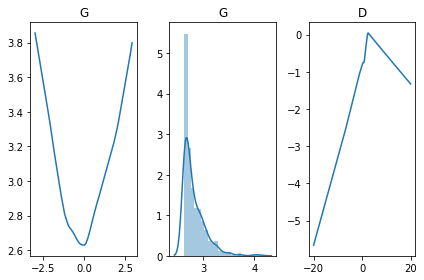

[Epoch 13304/50000] [D loss: -0.087881] [G loss: -0.013715]
[Epoch 13308/50000] [D loss: -0.088851] [G loss: -0.016145]
[Epoch 13312/50000] [D loss: -0.091514] [G loss: -0.021714]
[Epoch 13316/50000] [D loss: -0.097377] [G loss: -0.040908]
[Epoch 13320/50000] [D loss: -0.105176] [G loss: -0.068416]
[Epoch 13324/50000] [D loss: -0.111752] [G loss: -0.085148]
[Epoch 13328/50000] [D loss: -0.114880] [G loss: -0.090202]
[Epoch 13332/50000] [D loss: -0.113635] [G loss: -0.061135]
[Epoch 13336/50000] [D loss: -0.111008] [G loss: 0.005154]
[Epoch 13340/50000] [D loss: -0.105697] [G loss: -0.000629]
[Epoch 13344/50000] [D loss: -0.101526] [G loss: -0.001880]
[Epoch 13348/50000] [D loss: -0.098993] [G loss: -0.002407]
[Epoch 13352/50000] [D loss: -0.090094] [G loss: -0.002474]
[Epoch 13356/50000] [D loss: -0.085842] [G loss: 0.004620]
[Epoch 13360/50000] [D loss: -0.085770] [G loss: 0.008478]
[Epoch 13364/50000] [D loss: -0.087940] [G loss: 0.014157]
[Epoch 13368/50000] [D loss: -0.091797] [G l

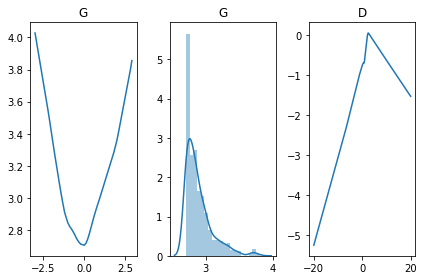

[Epoch 13404/50000] [D loss: -0.091567] [G loss: -0.007864]
[Epoch 13408/50000] [D loss: -0.086131] [G loss: -0.015564]
[Epoch 13412/50000] [D loss: -0.086723] [G loss: -0.018344]
[Epoch 13416/50000] [D loss: -0.088758] [G loss: -0.022140]
[Epoch 13420/50000] [D loss: -0.094717] [G loss: -0.038709]
[Epoch 13424/50000] [D loss: -0.101627] [G loss: -0.064485]
[Epoch 13428/50000] [D loss: -0.109507] [G loss: -0.086338]
[Epoch 13432/50000] [D loss: -0.114028] [G loss: -0.096388]
[Epoch 13436/50000] [D loss: -0.111863] [G loss: -0.076631]
[Epoch 13440/50000] [D loss: -0.112664] [G loss: -0.019804]
[Epoch 13444/50000] [D loss: -0.106882] [G loss: -0.006584]
[Epoch 13448/50000] [D loss: -0.101002] [G loss: -0.002952]
[Epoch 13452/50000] [D loss: -0.098554] [G loss: -0.001582]
[Epoch 13456/50000] [D loss: -0.089650] [G loss: -0.001086]
[Epoch 13460/50000] [D loss: -0.089806] [G loss: -0.003581]
[Epoch 13464/50000] [D loss: -0.087257] [G loss: 0.005605]
[Epoch 13468/50000] [D loss: -0.087523] [

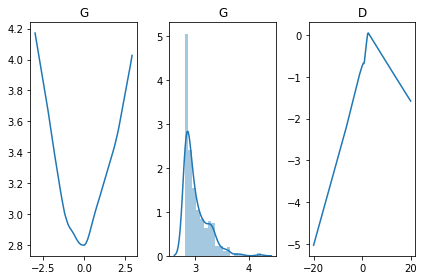

[Epoch 13504/50000] [D loss: -0.100799] [G loss: 0.004747]
[Epoch 13508/50000] [D loss: -0.095010] [G loss: -0.003312]
[Epoch 13512/50000] [D loss: -0.089452] [G loss: -0.011743]
[Epoch 13516/50000] [D loss: -0.086612] [G loss: -0.015706]
[Epoch 13520/50000] [D loss: -0.087493] [G loss: -0.023921]
[Epoch 13524/50000] [D loss: -0.091104] [G loss: -0.032451]
[Epoch 13528/50000] [D loss: -0.098869] [G loss: -0.059705]
[Epoch 13532/50000] [D loss: -0.106519] [G loss: -0.089213]
[Epoch 13536/50000] [D loss: -0.113405] [G loss: -0.105031]
[Epoch 13540/50000] [D loss: -0.114405] [G loss: -0.101731]
[Epoch 13544/50000] [D loss: -0.113068] [G loss: -0.061317]
[Epoch 13548/50000] [D loss: -0.110754] [G loss: 0.008445]
[Epoch 13552/50000] [D loss: -0.104202] [G loss: 0.000612]
[Epoch 13556/50000] [D loss: -0.095575] [G loss: -0.000301]
[Epoch 13560/50000] [D loss: -0.092310] [G loss: 0.001424]
[Epoch 13564/50000] [D loss: -0.087262] [G loss: 0.000398]
[Epoch 13568/50000] [D loss: -0.087528] [G lo

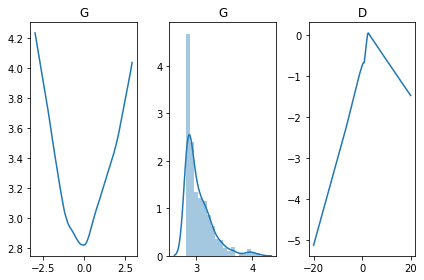

[Epoch 13604/50000] [D loss: -0.101499] [G loss: 0.007601]
[Epoch 13608/50000] [D loss: -0.096295] [G loss: -0.002308]
[Epoch 13612/50000] [D loss: -0.091693] [G loss: -0.006635]
[Epoch 13616/50000] [D loss: -0.086524] [G loss: -0.015598]
[Epoch 13620/50000] [D loss: -0.085577] [G loss: -0.021842]
[Epoch 13624/50000] [D loss: -0.089879] [G loss: -0.026223]
[Epoch 13628/50000] [D loss: -0.095185] [G loss: -0.036315]
[Epoch 13632/50000] [D loss: -0.102386] [G loss: -0.058133]
[Epoch 13636/50000] [D loss: -0.109896] [G loss: -0.090997]
[Epoch 13640/50000] [D loss: -0.113078] [G loss: -0.097019]
[Epoch 13644/50000] [D loss: -0.113313] [G loss: -0.079472]
[Epoch 13648/50000] [D loss: -0.109781] [G loss: -0.025354]
[Epoch 13652/50000] [D loss: -0.108310] [G loss: -0.009477]
[Epoch 13656/50000] [D loss: -0.103713] [G loss: -0.003725]
[Epoch 13660/50000] [D loss: -0.097038] [G loss: -0.003209]
[Epoch 13664/50000] [D loss: -0.091797] [G loss: 0.000118]
[Epoch 13668/50000] [D loss: -0.088902] [G

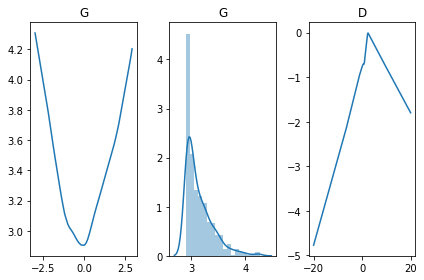

[Epoch 13704/50000] [D loss: -0.108828] [G loss: 0.008717]
[Epoch 13708/50000] [D loss: -0.105219] [G loss: 0.008598]
[Epoch 13712/50000] [D loss: -0.099444] [G loss: 0.002563]
[Epoch 13716/50000] [D loss: -0.091676] [G loss: -0.006160]
[Epoch 13720/50000] [D loss: -0.086827] [G loss: -0.014563]
[Epoch 13724/50000] [D loss: -0.085582] [G loss: -0.019336]
[Epoch 13728/50000] [D loss: -0.087547] [G loss: -0.020680]
[Epoch 13732/50000] [D loss: -0.092662] [G loss: -0.040768]
[Epoch 13736/50000] [D loss: -0.100807] [G loss: -0.071478]
[Epoch 13740/50000] [D loss: -0.108296] [G loss: -0.109087]
[Epoch 13744/50000] [D loss: -0.115452] [G loss: -0.129445]
[Epoch 13748/50000] [D loss: -0.109754] [G loss: -0.126002]
[Epoch 13752/50000] [D loss: -0.106679] [G loss: -0.068789]
[Epoch 13756/50000] [D loss: -0.107968] [G loss: 0.007036]
[Epoch 13760/50000] [D loss: -0.102376] [G loss: -0.001098]
[Epoch 13764/50000] [D loss: -0.095880] [G loss: -0.001432]
[Epoch 13768/50000] [D loss: -0.092313] [G l

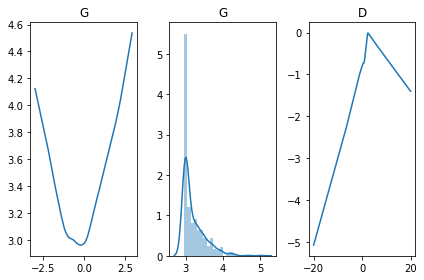

[Epoch 13804/50000] [D loss: -0.113672] [G loss: 0.019351]
[Epoch 13808/50000] [D loss: -0.110798] [G loss: 0.015967]
[Epoch 13812/50000] [D loss: -0.107320] [G loss: 0.013014]
[Epoch 13816/50000] [D loss: -0.101357] [G loss: 0.004804]
[Epoch 13820/50000] [D loss: -0.095472] [G loss: 0.001619]
[Epoch 13824/50000] [D loss: -0.091757] [G loss: -0.005661]
[Epoch 13828/50000] [D loss: -0.087939] [G loss: -0.013555]
[Epoch 13832/50000] [D loss: -0.084764] [G loss: -0.029915]
[Epoch 13836/50000] [D loss: -0.089332] [G loss: -0.030637]
[Epoch 13840/50000] [D loss: -0.095579] [G loss: -0.056657]
[Epoch 13844/50000] [D loss: -0.104609] [G loss: -0.094558]
[Epoch 13848/50000] [D loss: -0.112058] [G loss: -0.128530]
[Epoch 13852/50000] [D loss: -0.112679] [G loss: -0.135878]
[Epoch 13856/50000] [D loss: -0.107208] [G loss: -0.113194]
[Epoch 13860/50000] [D loss: -0.107527] [G loss: -0.033280]
[Epoch 13864/50000] [D loss: -0.105814] [G loss: -0.011394]
[Epoch 13868/50000] [D loss: -0.098935] [G lo

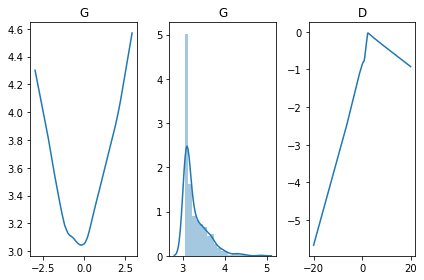

[Epoch 13904/50000] [D loss: -0.111931] [G loss: 0.099687]
[Epoch 13908/50000] [D loss: -0.113031] [G loss: 0.083551]
[Epoch 13912/50000] [D loss: -0.115501] [G loss: 0.017356]
[Epoch 13916/50000] [D loss: -0.111989] [G loss: 0.018292]
[Epoch 13920/50000] [D loss: -0.107305] [G loss: 0.013147]
[Epoch 13924/50000] [D loss: -0.099267] [G loss: 0.002714]
[Epoch 13928/50000] [D loss: -0.091315] [G loss: -0.007184]
[Epoch 13932/50000] [D loss: -0.086091] [G loss: -0.015565]
[Epoch 13936/50000] [D loss: -0.085506] [G loss: -0.016940]
[Epoch 13940/50000] [D loss: -0.086521] [G loss: -0.030881]
[Epoch 13944/50000] [D loss: -0.091384] [G loss: -0.051123]
[Epoch 13948/50000] [D loss: -0.099600] [G loss: -0.083976]
[Epoch 13952/50000] [D loss: -0.109032] [G loss: -0.117217]
[Epoch 13956/50000] [D loss: -0.112803] [G loss: -0.140158]
[Epoch 13960/50000] [D loss: -0.112615] [G loss: -0.134144]
[Epoch 13964/50000] [D loss: -0.111325] [G loss: -0.091210]
[Epoch 13968/50000] [D loss: -0.104566] [G los

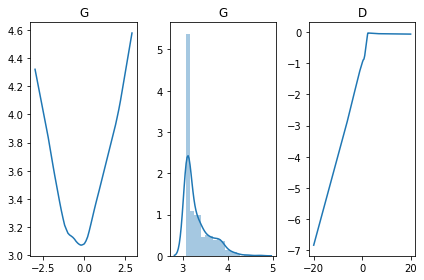

[Epoch 14004/50000] [D loss: -0.103645] [G loss: 0.065132]
[Epoch 14008/50000] [D loss: -0.109014] [G loss: 0.098641]
[Epoch 14012/50000] [D loss: -0.113156] [G loss: 0.106853]
[Epoch 14016/50000] [D loss: -0.112296] [G loss: 0.067296]
[Epoch 14020/50000] [D loss: -0.113463] [G loss: 0.023664]
[Epoch 14024/50000] [D loss: -0.108572] [G loss: 0.015648]
[Epoch 14028/50000] [D loss: -0.101673] [G loss: 0.005981]
[Epoch 14032/50000] [D loss: -0.093950] [G loss: -0.005578]
[Epoch 14036/50000] [D loss: -0.086042] [G loss: -0.016546]
[Epoch 14040/50000] [D loss: -0.084324] [G loss: -0.020940]
[Epoch 14044/50000] [D loss: -0.085289] [G loss: -0.027134]
[Epoch 14048/50000] [D loss: -0.092656] [G loss: -0.040609]
[Epoch 14052/50000] [D loss: -0.103334] [G loss: -0.074375]
[Epoch 14056/50000] [D loss: -0.114352] [G loss: -0.102863]
[Epoch 14060/50000] [D loss: -0.123109] [G loss: -0.103775]
[Epoch 14064/50000] [D loss: -0.117590] [G loss: -0.069530]
[Epoch 14068/50000] [D loss: -0.113447] [G loss

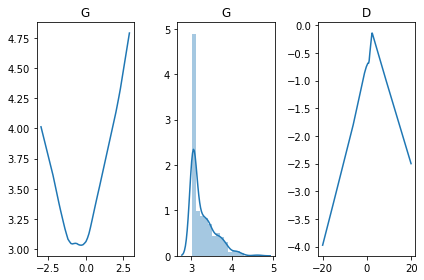

[Epoch 14104/50000] [D loss: -0.119602] [G loss: 0.291855]
[Epoch 14108/50000] [D loss: -0.111830] [G loss: 0.206954]
[Epoch 14112/50000] [D loss: -0.103816] [G loss: -0.009795]
[Epoch 14116/50000] [D loss: -0.095527] [G loss: 0.003984]
[Epoch 14120/50000] [D loss: -0.083484] [G loss: -0.016791]
[Epoch 14124/50000] [D loss: -0.078870] [G loss: -0.030989]
[Epoch 14128/50000] [D loss: -0.082353] [G loss: -0.042811]
[Epoch 14132/50000] [D loss: -0.091308] [G loss: -0.069078]
[Epoch 14136/50000] [D loss: -0.115908] [G loss: -0.116665]
[Epoch 14140/50000] [D loss: -0.129826] [G loss: -0.154201]
[Epoch 14144/50000] [D loss: -0.127084] [G loss: -0.166086]
[Epoch 14148/50000] [D loss: -0.109925] [G loss: -0.110396]
[Epoch 14152/50000] [D loss: -0.101948] [G loss: 0.015589]
[Epoch 14156/50000] [D loss: -0.089203] [G loss: -0.002433]
[Epoch 14160/50000] [D loss: -0.084810] [G loss: 0.023505]
[Epoch 14164/50000] [D loss: -0.090612] [G loss: 0.021860]
[Epoch 14168/50000] [D loss: -0.096793] [G los

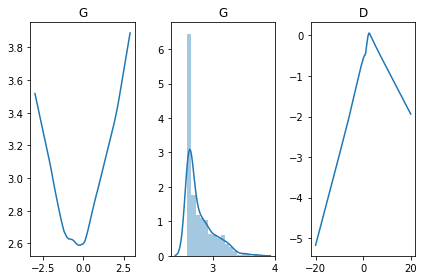

[Epoch 14204/50000] [D loss: -0.074062] [G loss: -0.040952]
[Epoch 14208/50000] [D loss: -0.079535] [G loss: -0.054093]
[Epoch 14212/50000] [D loss: -0.091741] [G loss: -0.094871]
[Epoch 14216/50000] [D loss: -0.136786] [G loss: -0.165469]
[Epoch 14220/50000] [D loss: -0.140085] [G loss: -0.199372]
[Epoch 14224/50000] [D loss: -0.128433] [G loss: -0.195064]
[Epoch 14228/50000] [D loss: -0.098331] [G loss: -0.112457]
[Epoch 14232/50000] [D loss: -0.091627] [G loss: 0.025648]
[Epoch 14236/50000] [D loss: -0.080250] [G loss: 0.005151]
[Epoch 14240/50000] [D loss: -0.071734] [G loss: 0.037589]
[Epoch 14244/50000] [D loss: -0.084165] [G loss: 0.104919]
[Epoch 14248/50000] [D loss: -0.107426] [G loss: 0.222294]
[Epoch 14252/50000] [D loss: -0.121908] [G loss: 0.297714]
[Epoch 14256/50000] [D loss: -0.123499] [G loss: 0.316044]
[Epoch 14260/50000] [D loss: -0.113069] [G loss: 0.232488]
[Epoch 14264/50000] [D loss: -0.107456] [G loss: 0.051396]
[Epoch 14268/50000] [D loss: -0.099500] [G loss: 

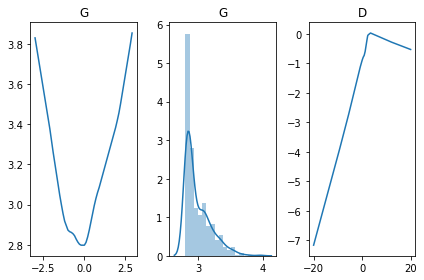

[Epoch 14304/50000] [D loss: -0.100046] [G loss: 0.003549]
[Epoch 14308/50000] [D loss: -0.099155] [G loss: 0.007077]
[Epoch 14312/50000] [D loss: -0.097009] [G loss: 0.001499]
[Epoch 14316/50000] [D loss: -0.098871] [G loss: 0.032643]
[Epoch 14320/50000] [D loss: -0.102338] [G loss: 0.014585]
[Epoch 14324/50000] [D loss: -0.101053] [G loss: -0.000340]
[Epoch 14328/50000] [D loss: -0.098135] [G loss: -0.002400]
[Epoch 14332/50000] [D loss: -0.095620] [G loss: -0.007200]
[Epoch 14336/50000] [D loss: -0.095504] [G loss: 0.000715]
[Epoch 14340/50000] [D loss: -0.095290] [G loss: -0.023060]
[Epoch 14344/50000] [D loss: -0.097080] [G loss: -0.026994]
[Epoch 14348/50000] [D loss: -0.100305] [G loss: 0.004825]
[Epoch 14352/50000] [D loss: -0.103504] [G loss: -0.011278]
[Epoch 14356/50000] [D loss: -0.106637] [G loss: 0.002299]
[Epoch 14360/50000] [D loss: -0.107518] [G loss: 0.004771]
[Epoch 14364/50000] [D loss: -0.107262] [G loss: -0.004353]
[Epoch 14368/50000] [D loss: -0.103891] [G loss: 

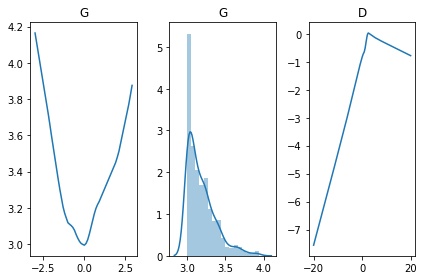

[Epoch 14404/50000] [D loss: -0.110631] [G loss: 0.013303]
[Epoch 14408/50000] [D loss: -0.111011] [G loss: 0.009723]
[Epoch 14412/50000] [D loss: -0.102580] [G loss: 0.000703]
[Epoch 14416/50000] [D loss: -0.095327] [G loss: -0.001237]
[Epoch 14420/50000] [D loss: -0.090345] [G loss: -0.004984]
[Epoch 14424/50000] [D loss: -0.084561] [G loss: -0.014547]
[Epoch 14428/50000] [D loss: -0.087520] [G loss: -0.012137]
[Epoch 14432/50000] [D loss: -0.095097] [G loss: -0.017194]
[Epoch 14436/50000] [D loss: -0.106417] [G loss: -0.020165]
[Epoch 14440/50000] [D loss: -0.118720] [G loss: -0.021648]
[Epoch 14444/50000] [D loss: -0.127455] [G loss: -0.017496]
[Epoch 14448/50000] [D loss: -0.127483] [G loss: 0.001930]
[Epoch 14452/50000] [D loss: -0.117803] [G loss: -0.003263]
[Epoch 14456/50000] [D loss: -0.105117] [G loss: -0.004325]
[Epoch 14460/50000] [D loss: -0.087594] [G loss: -0.005113]
[Epoch 14464/50000] [D loss: -0.074767] [G loss: 0.002419]
[Epoch 14468/50000] [D loss: -0.069286] [G lo

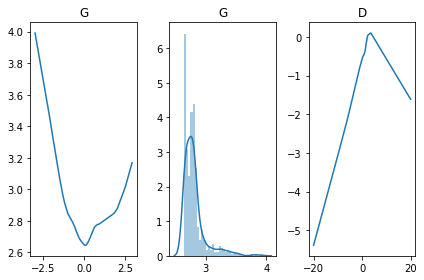

[Epoch 14504/50000] [D loss: -0.105105] [G loss: -0.009709]
[Epoch 14508/50000] [D loss: -0.111269] [G loss: -0.000796]
[Epoch 14512/50000] [D loss: -0.113439] [G loss: -0.001387]
[Epoch 14516/50000] [D loss: -0.113090] [G loss: -0.000387]
[Epoch 14520/50000] [D loss: -0.111758] [G loss: -0.000256]
[Epoch 14524/50000] [D loss: -0.105536] [G loss: -0.000475]
[Epoch 14528/50000] [D loss: -0.102135] [G loss: -0.002492]
[Epoch 14532/50000] [D loss: -0.096398] [G loss: -0.000115]
[Epoch 14536/50000] [D loss: -0.097909] [G loss: 0.024760]
[Epoch 14540/50000] [D loss: -0.108304] [G loss: 0.026347]
[Epoch 14544/50000] [D loss: -0.107209] [G loss: 0.013422]
[Epoch 14548/50000] [D loss: -0.102470] [G loss: 0.004280]
[Epoch 14552/50000] [D loss: -0.096241] [G loss: -0.004348]
[Epoch 14556/50000] [D loss: -0.092525] [G loss: -0.008743]
[Epoch 14560/50000] [D loss: -0.091765] [G loss: -0.007664]
[Epoch 14564/50000] [D loss: -0.092303] [G loss: -0.014642]
[Epoch 14568/50000] [D loss: -0.098061] [G l

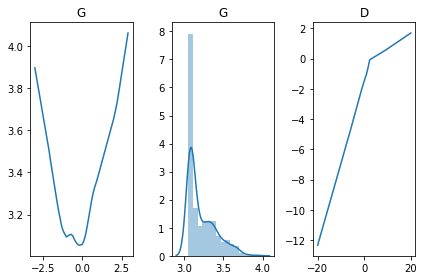

[Epoch 14604/50000] [D loss: -0.083207] [G loss: 0.011170]
[Epoch 14608/50000] [D loss: -0.086903] [G loss: 0.018620]
[Epoch 14612/50000] [D loss: -0.099241] [G loss: 0.045516]
[Epoch 14616/50000] [D loss: -0.112969] [G loss: 0.087357]
[Epoch 14620/50000] [D loss: -0.125290] [G loss: 0.117615]
[Epoch 14624/50000] [D loss: -0.128997] [G loss: 0.099101]
[Epoch 14628/50000] [D loss: -0.125085] [G loss: 0.024805]
[Epoch 14632/50000] [D loss: -0.109806] [G loss: 0.013330]
[Epoch 14636/50000] [D loss: -0.085586] [G loss: -0.007995]
[Epoch 14640/50000] [D loss: -0.070131] [G loss: -0.026133]
[Epoch 14644/50000] [D loss: -0.066401] [G loss: -0.056205]
[Epoch 14648/50000] [D loss: -0.079210] [G loss: -0.095147]
[Epoch 14652/50000] [D loss: -0.158569] [G loss: -0.177673]
[Epoch 14656/50000] [D loss: -0.159946] [G loss: -0.222009]
[Epoch 14660/50000] [D loss: -0.142286] [G loss: -0.227998]
[Epoch 14664/50000] [D loss: -0.103785] [G loss: -0.174362]
[Epoch 14668/50000] [D loss: -0.081938] [G loss:

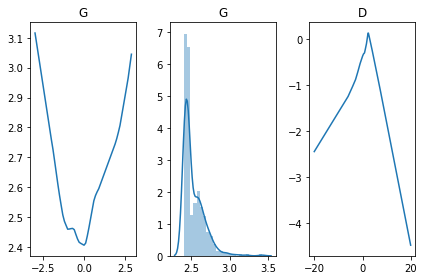

[Epoch 14704/50000] [D loss: -0.095430] [G loss: -0.303755]
[Epoch 14708/50000] [D loss: -0.246856] [G loss: -0.890880]
[Epoch 14712/50000] [D loss: -0.296235] [G loss: -1.662001]
[Epoch 14716/50000] [D loss: 0.022349] [G loss: -0.650353]
[Epoch 14720/50000] [D loss: -0.018236] [G loss: 0.877033]
[Epoch 14724/50000] [D loss: -0.267523] [G loss: 2.880308]
[Epoch 14728/50000] [D loss: -0.336887] [G loss: 4.791696]
[Epoch 14732/50000] [D loss: 0.266774] [G loss: 0.926431]
[Epoch 14736/50000] [D loss: -0.168959] [G loss: -0.085940]
[Epoch 14740/50000] [D loss: -0.530644] [G loss: -0.342625]
[Epoch 14744/50000] [D loss: -0.980002] [G loss: -1.020008]
[Epoch 14748/50000] [D loss: -0.644403] [G loss: -2.352368]
[Epoch 14752/50000] [D loss: 0.777221] [G loss: -1.248537]
[Epoch 14756/50000] [D loss: 0.104778] [G loss: 0.314544]
[Epoch 14760/50000] [D loss: -0.631600] [G loss: 2.152268]
[Epoch 14764/50000] [D loss: -2.953993] [G loss: 9.671734]
[Epoch 14768/50000] [D loss: -2.562846] [G loss: 14

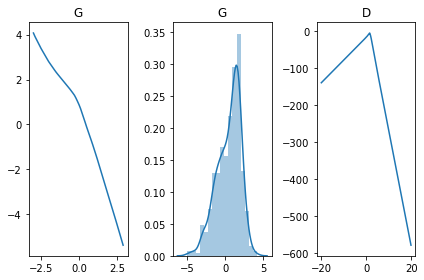

[Epoch 14804/50000] [D loss: -21.762194] [G loss: 38.133282]
[Epoch 14808/50000] [D loss: -88.159790] [G loss: 75.264641]
[Epoch 14812/50000] [D loss: -45.388214] [G loss: 8.896852]
[Epoch 14816/50000] [D loss: -10.447822] [G loss: 2.511259]
[Epoch 14820/50000] [D loss: -72.690269] [G loss: 105.709290]
[Epoch 14824/50000] [D loss: -34.038319] [G loss: 60.862225]
[Epoch 14828/50000] [D loss: -133.105194] [G loss: 115.910675]
[Epoch 14832/50000] [D loss: -61.718239] [G loss: 24.224663]
[Epoch 14836/50000] [D loss: -79.533257] [G loss: 83.253563]
[Epoch 14840/50000] [D loss: -141.845673] [G loss: 187.491943]
[Epoch 14844/50000] [D loss: -43.090622] [G loss: 72.759987]
[Epoch 14848/50000] [D loss: -112.099251] [G loss: 95.933327]
[Epoch 14852/50000] [D loss: -131.460312] [G loss: 69.363876]
[Epoch 14856/50000] [D loss: 12.647474] [G loss: -90.530304]
[Epoch 14860/50000] [D loss: -57.273083] [G loss: 29.908161]
[Epoch 14864/50000] [D loss: -22.401276] [G loss: 17.489130]
[Epoch 14868/50000]

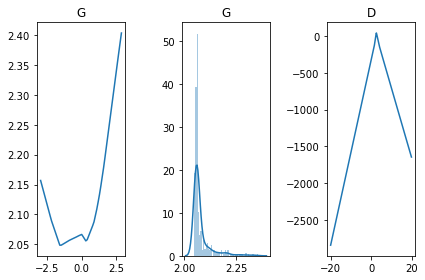

[Epoch 14904/50000] [D loss: -133.937698] [G loss: 124.746590]
[Epoch 14908/50000] [D loss: -144.097107] [G loss: 108.184525]
[Epoch 14912/50000] [D loss: -5.044393] [G loss: 2.241077]
[Epoch 14916/50000] [D loss: -110.018158] [G loss: 102.768425]
[Epoch 14920/50000] [D loss: -150.259888] [G loss: 157.187286]
[Epoch 14924/50000] [D loss: -80.095909] [G loss: 79.535889]
[Epoch 14928/50000] [D loss: 0.152093] [G loss: -2.842785]
[Epoch 14932/50000] [D loss: -3.557675] [G loss: 0.037318]
[Epoch 14936/50000] [D loss: -67.718163] [G loss: 72.272690]
[Epoch 14940/50000] [D loss: -43.170002] [G loss: 55.638840]
[Epoch 14944/50000] [D loss: -3.967647] [G loss: 10.443200]
[Epoch 14948/50000] [D loss: -34.740192] [G loss: 40.903915]
[Epoch 14952/50000] [D loss: 11.177168] [G loss: 14.727948]
[Epoch 14956/50000] [D loss: -27.993784] [G loss: 47.637165]
[Epoch 14960/50000] [D loss: 4.134642] [G loss: 12.835309]
[Epoch 14964/50000] [D loss: -21.501402] [G loss: 33.254181]
[Epoch 14968/50000] [D los

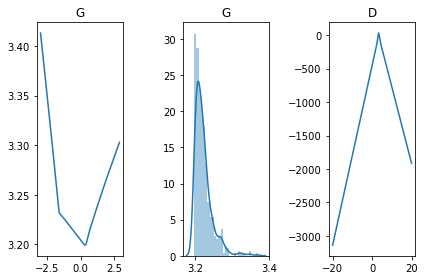

[Epoch 15004/50000] [D loss: 30.677494] [G loss: -2.466940]
[Epoch 15008/50000] [D loss: -66.067490] [G loss: 94.997116]
[Epoch 15012/50000] [D loss: -44.110542] [G loss: 75.535431]
[Epoch 15016/50000] [D loss: 38.722240] [G loss: -18.741879]
[Epoch 15020/50000] [D loss: -78.189697] [G loss: 82.762161]
[Epoch 15024/50000] [D loss: -102.851204] [G loss: 94.142426]
[Epoch 15028/50000] [D loss: -40.971600] [G loss: 34.463287]
[Epoch 15032/50000] [D loss: -5.670861] [G loss: -4.673183]
[Epoch 15036/50000] [D loss: -44.603325] [G loss: 47.337364]
[Epoch 15040/50000] [D loss: 12.220716] [G loss: 0.689404]
[Epoch 15044/50000] [D loss: -57.930462] [G loss: 66.088875]
[Epoch 15048/50000] [D loss: -62.621803] [G loss: 70.035240]
[Epoch 15052/50000] [D loss: 17.127186] [G loss: 4.483598]
[Epoch 15056/50000] [D loss: -56.188522] [G loss: 71.943787]
[Epoch 15060/50000] [D loss: -95.283951] [G loss: 112.764473]
[Epoch 15064/50000] [D loss: -42.619820] [G loss: 55.676876]
[Epoch 15068/50000] [D loss:

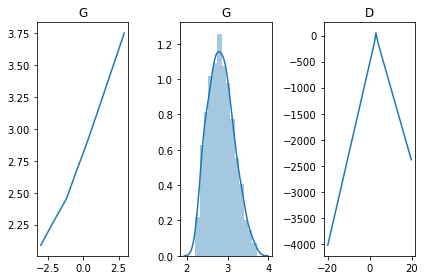

[Epoch 15104/50000] [D loss: -42.469933] [G loss: 36.624527]
[Epoch 15108/50000] [D loss: 23.756540] [G loss: -24.379763]
[Epoch 15112/50000] [D loss: -37.400478] [G loss: 40.459034]
[Epoch 15116/50000] [D loss: -20.977180] [G loss: 24.058205]
[Epoch 15120/50000] [D loss: 30.895494] [G loss: -15.554317]
[Epoch 15124/50000] [D loss: -59.513176] [G loss: 75.460876]
[Epoch 15128/50000] [D loss: -28.557364] [G loss: 39.672745]
[Epoch 15132/50000] [D loss: 23.474005] [G loss: -4.766409]
[Epoch 15136/50000] [D loss: -17.456654] [G loss: 37.087868]
[Epoch 15140/50000] [D loss: 10.453188] [G loss: 4.689976]
[Epoch 15144/50000] [D loss: -20.500200] [G loss: 50.325680]
[Epoch 15148/50000] [D loss: -12.310843] [G loss: 39.676735]
[Epoch 15152/50000] [D loss: 13.584069] [G loss: 12.725569]
[Epoch 15156/50000] [D loss: -29.238140] [G loss: 55.753853]
[Epoch 15160/50000] [D loss: 3.893524] [G loss: 21.982271]
[Epoch 15164/50000] [D loss: -5.032047] [G loss: 32.462952]
[Epoch 15168/50000] [D loss: -3

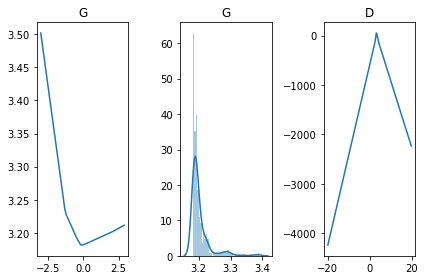

[Epoch 15204/50000] [D loss: 55.180325] [G loss: -34.620228]
[Epoch 15208/50000] [D loss: -67.937981] [G loss: 95.967339]
[Epoch 15212/50000] [D loss: -112.190857] [G loss: 121.090538]
[Epoch 15216/50000] [D loss: -73.512543] [G loss: 78.405663]
[Epoch 15220/50000] [D loss: -15.271086] [G loss: 11.562413]
[Epoch 15224/50000] [D loss: 1.087227] [G loss: -5.927172]
[Epoch 15228/50000] [D loss: -13.666645] [G loss: 15.575728]
[Epoch 15232/50000] [D loss: 42.514828] [G loss: -26.900351]
[Epoch 15236/50000] [D loss: -82.072342] [G loss: 104.447655]
[Epoch 15240/50000] [D loss: -52.455467] [G loss: 76.238708]
[Epoch 15244/50000] [D loss: 17.326656] [G loss: -6.632178]
[Epoch 15248/50000] [D loss: -20.842577] [G loss: 30.670786]
[Epoch 15252/50000] [D loss: -35.887966] [G loss: 43.098995]
[Epoch 15256/50000] [D loss: 9.642847] [G loss: 1.147299]
[Epoch 15260/50000] [D loss: -7.877337] [G loss: 32.468582]
[Epoch 15264/50000] [D loss: -32.244499] [G loss: 61.295673]
[Epoch 15268/50000] [D loss:

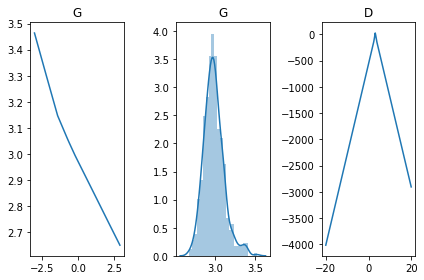

[Epoch 15304/50000] [D loss: 5.179731] [G loss: 16.402185]
[Epoch 15308/50000] [D loss: 19.841120] [G loss: 10.001739]
[Epoch 15312/50000] [D loss: -14.253149] [G loss: 51.120628]
[Epoch 15316/50000] [D loss: 8.902944] [G loss: 25.090736]
[Epoch 15320/50000] [D loss: -4.395950] [G loss: 28.397316]
[Epoch 15324/50000] [D loss: -31.000462] [G loss: 49.425587]
[Epoch 15328/50000] [D loss: 1.552411] [G loss: 22.530575]
[Epoch 15332/50000] [D loss: 41.948902] [G loss: -21.029627]
[Epoch 15336/50000] [D loss: -10.887708] [G loss: 32.624924]
[Epoch 15340/50000] [D loss: -12.761469] [G loss: 36.553104]
[Epoch 15344/50000] [D loss: 17.442423] [G loss: 11.145271]
[Epoch 15348/50000] [D loss: 5.569858] [G loss: 18.880419]
[Epoch 15352/50000] [D loss: -14.933497] [G loss: 36.170048]
[Epoch 15356/50000] [D loss: 11.887012] [G loss: 15.310179]
[Epoch 15360/50000] [D loss: 17.063745] [G loss: 8.797747]
[Epoch 15364/50000] [D loss: -17.686192] [G loss: 43.630161]
[Epoch 15368/50000] [D loss: -9.979244

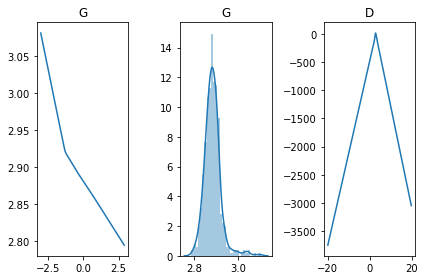

[Epoch 15404/50000] [D loss: 24.669731] [G loss: -6.935728]
[Epoch 15408/50000] [D loss: -0.581015] [G loss: 18.318455]
[Epoch 15412/50000] [D loss: -23.469553] [G loss: 38.629143]
[Epoch 15416/50000] [D loss: -0.190862] [G loss: 24.122438]
[Epoch 15420/50000] [D loss: 28.938086] [G loss: -11.772343]
[Epoch 15424/50000] [D loss: 0.878573] [G loss: 21.448534]
[Epoch 15428/50000] [D loss: -21.285858] [G loss: 41.411705]
[Epoch 15432/50000] [D loss: -13.632858] [G loss: 35.187820]
[Epoch 15436/50000] [D loss: 5.097684] [G loss: 15.998926]
[Epoch 15440/50000] [D loss: 24.320002] [G loss: -7.138705]
[Epoch 15444/50000] [D loss: -1.867497] [G loss: 20.114981]
[Epoch 15448/50000] [D loss: -27.051136] [G loss: 41.721146]
[Epoch 15452/50000] [D loss: -9.642431] [G loss: 29.123169]
[Epoch 15456/50000] [D loss: 28.949389] [G loss: -1.921909]
[Epoch 15460/50000] [D loss: 9.110554] [G loss: 15.521420]
[Epoch 15464/50000] [D loss: -19.736153] [G loss: 43.321793]
[Epoch 15468/50000] [D loss: -22.9264

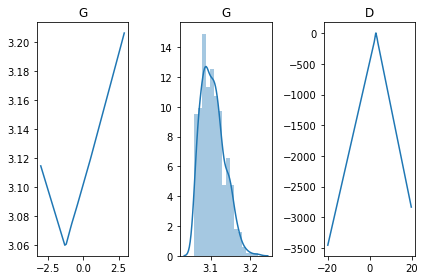

[Epoch 15504/50000] [D loss: -2.770305] [G loss: 22.587179]
[Epoch 15508/50000] [D loss: 10.574486] [G loss: 9.797741]
[Epoch 15512/50000] [D loss: 25.647573] [G loss: -8.239686]
[Epoch 15516/50000] [D loss: 3.715112] [G loss: 8.116348]
[Epoch 15520/50000] [D loss: -6.008016] [G loss: 12.715630]
[Epoch 15524/50000] [D loss: 1.651083] [G loss: 7.244654]
[Epoch 15528/50000] [D loss: 13.441987] [G loss: -2.249856]
[Epoch 15532/50000] [D loss: 23.604366] [G loss: -5.621961]
[Epoch 15536/50000] [D loss: -3.452920] [G loss: 23.758024]
[Epoch 15540/50000] [D loss: -13.940350] [G loss: 33.742535]
[Epoch 15544/50000] [D loss: -9.274428] [G loss: 28.466410]
[Epoch 15548/50000] [D loss: 10.005031] [G loss: 12.204166]
[Epoch 15552/50000] [D loss: 19.896172] [G loss: -6.055148]
[Epoch 15556/50000] [D loss: 4.325238] [G loss: 3.003047]
[Epoch 15560/50000] [D loss: -3.312563] [G loss: 6.540605]
[Epoch 15564/50000] [D loss: -4.807024] [G loss: 4.540442]
[Epoch 15568/50000] [D loss: 1.913712] [G loss: 

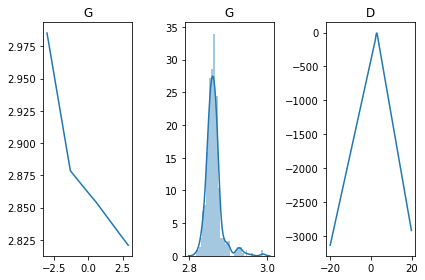

[Epoch 15604/50000] [D loss: 16.824732] [G loss: -0.672238]
[Epoch 15608/50000] [D loss: 5.378100] [G loss: 0.748601]
[Epoch 15612/50000] [D loss: -4.079213] [G loss: 2.078515]
[Epoch 15616/50000] [D loss: -4.296144] [G loss: 0.596087]
[Epoch 15620/50000] [D loss: -0.724428] [G loss: -2.266557]
[Epoch 15624/50000] [D loss: 5.726713] [G loss: -5.673045]
[Epoch 15628/50000] [D loss: 13.029685] [G loss: -8.400346]
[Epoch 15632/50000] [D loss: 18.634590] [G loss: -7.063038]
[Epoch 15636/50000] [D loss: 11.135663] [G loss: 8.907990]
[Epoch 15640/50000] [D loss: -2.412013] [G loss: 27.982567]
[Epoch 15644/50000] [D loss: -5.649488] [G loss: 35.752056]
[Epoch 15648/50000] [D loss: -2.463622] [G loss: 33.284473]
[Epoch 15652/50000] [D loss: 6.128417] [G loss: 24.474482]
[Epoch 15656/50000] [D loss: 15.877773] [G loss: 11.964526]
[Epoch 15660/50000] [D loss: 14.927492] [G loss: -1.124529]
[Epoch 15664/50000] [D loss: 1.091523] [G loss: -0.517654]
[Epoch 15668/50000] [D loss: -4.295411] [G loss:

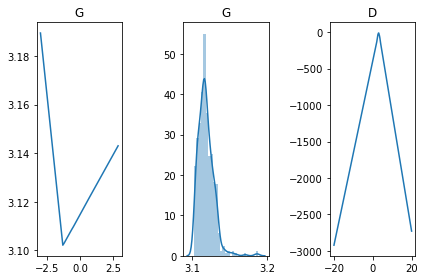

[Epoch 15704/50000] [D loss: -0.955137] [G loss: 29.951344]
[Epoch 15708/50000] [D loss: 5.515790] [G loss: 22.438433]
[Epoch 15712/50000] [D loss: 13.702069] [G loss: 10.588860]
[Epoch 15716/50000] [D loss: 12.692727] [G loss: -2.038961]
[Epoch 15720/50000] [D loss: 1.397732] [G loss: -1.165084]
[Epoch 15724/50000] [D loss: -2.980103] [G loss: -1.002247]
[Epoch 15728/50000] [D loss: -2.496408] [G loss: -2.152134]
[Epoch 15732/50000] [D loss: 0.138393] [G loss: -3.998938]
[Epoch 15736/50000] [D loss: 5.103308] [G loss: -6.021784]
[Epoch 15740/50000] [D loss: 9.471841] [G loss: -7.440846]
[Epoch 15744/50000] [D loss: 13.636642] [G loss: -8.011374]
[Epoch 15748/50000] [D loss: 14.661446] [G loss: -2.579482]
[Epoch 15752/50000] [D loss: 2.637862] [G loss: 17.071888]
[Epoch 15756/50000] [D loss: -7.385604] [G loss: 30.890718]
[Epoch 15760/50000] [D loss: -7.817306] [G loss: 34.507885]
[Epoch 15764/50000] [D loss: -1.758947] [G loss: 30.934744]
[Epoch 15768/50000] [D loss: 5.170269] [G loss

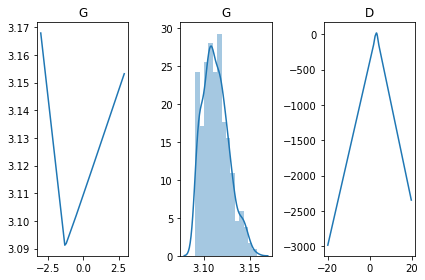

[Epoch 15804/50000] [D loss: 10.516307] [G loss: -7.184799]
[Epoch 15808/50000] [D loss: 14.079964] [G loss: -7.868711]
[Epoch 15812/50000] [D loss: 16.530014] [G loss: -4.607806]
[Epoch 15816/50000] [D loss: 3.640712] [G loss: 16.800735]
[Epoch 15820/50000] [D loss: -8.272426] [G loss: 32.219803]
[Epoch 15824/50000] [D loss: -9.022055] [G loss: 37.420639]
[Epoch 15828/50000] [D loss: -3.113729] [G loss: 33.869640]
[Epoch 15832/50000] [D loss: 4.290065] [G loss: 24.693754]
[Epoch 15836/50000] [D loss: 14.649201] [G loss: 11.845542]
[Epoch 15840/50000] [D loss: 11.767663] [G loss: -1.305528]
[Epoch 15844/50000] [D loss: 1.075937] [G loss: -1.040629]
[Epoch 15848/50000] [D loss: -3.669973] [G loss: -0.283275]
[Epoch 15852/50000] [D loss: -3.888872] [G loss: -0.642239]
[Epoch 15856/50000] [D loss: -1.869974] [G loss: -1.794728]
[Epoch 15860/50000] [D loss: 0.970730] [G loss: -3.077468]
[Epoch 15864/50000] [D loss: 3.864749] [G loss: -4.021698]
[Epoch 15868/50000] [D loss: 7.771773] [G los

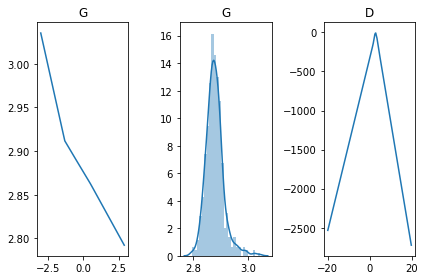

[Epoch 15904/50000] [D loss: 15.122713] [G loss: 0.147567]
[Epoch 15908/50000] [D loss: 4.746191] [G loss: -1.783490]
[Epoch 15912/50000] [D loss: -0.110811] [G loss: -0.866048]
[Epoch 15916/50000] [D loss: -1.658783] [G loss: -0.477713]
[Epoch 15920/50000] [D loss: -1.302086] [G loss: -0.669729]
[Epoch 15924/50000] [D loss: 0.374915] [G loss: -1.402151]
[Epoch 15928/50000] [D loss: 2.195705] [G loss: -2.303602]
[Epoch 15932/50000] [D loss: 4.176568] [G loss: -2.965191]
[Epoch 15936/50000] [D loss: 6.660068] [G loss: -3.520061]
[Epoch 15940/50000] [D loss: 8.865929] [G loss: -4.192179]
[Epoch 15944/50000] [D loss: 11.557085] [G loss: -4.505442]
[Epoch 15948/50000] [D loss: 12.226778] [G loss: -2.366713]
[Epoch 15952/50000] [D loss: 3.941351] [G loss: 10.488555]
[Epoch 15956/50000] [D loss: -5.176753] [G loss: 23.597347]
[Epoch 15960/50000] [D loss: -6.942387] [G loss: 28.584856]
[Epoch 15964/50000] [D loss: -2.641325] [G loss: 26.301723]
[Epoch 15968/50000] [D loss: 6.234438] [G loss: 

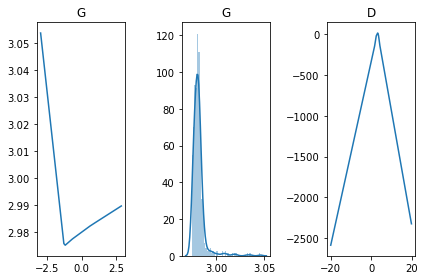

[Epoch 16004/50000] [D loss: 0.028437] [G loss: -1.317086]
[Epoch 16008/50000] [D loss: 2.188441] [G loss: -2.002184]
[Epoch 16012/50000] [D loss: 4.752593] [G loss: -2.655493]
[Epoch 16016/50000] [D loss: 7.331121] [G loss: -3.136435]
[Epoch 16020/50000] [D loss: 8.588814] [G loss: -3.549481]
[Epoch 16024/50000] [D loss: 10.405102] [G loss: -3.774621]
[Epoch 16028/50000] [D loss: 11.245173] [G loss: -3.451796]
[Epoch 16032/50000] [D loss: 8.543158] [G loss: 1.575477]
[Epoch 16036/50000] [D loss: 1.327762] [G loss: 11.478825]
[Epoch 16040/50000] [D loss: -4.921876] [G loss: 18.863987]
[Epoch 16044/50000] [D loss: -5.459314] [G loss: 21.081486]
[Epoch 16048/50000] [D loss: -2.842943] [G loss: 18.832598]
[Epoch 16052/50000] [D loss: 2.175685] [G loss: 13.261925]
[Epoch 16056/50000] [D loss: 5.699316] [G loss: 6.264039]
[Epoch 16060/50000] [D loss: 11.260513] [G loss: -0.139914]
[Epoch 16064/50000] [D loss: 9.784037] [G loss: -5.412094]
[Epoch 16068/50000] [D loss: 3.058058] [G loss: -3.9

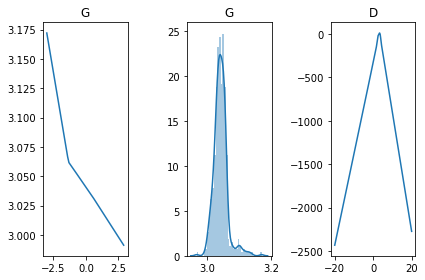

[Epoch 16104/50000] [D loss: 2.850454] [G loss: -1.315261]
[Epoch 16108/50000] [D loss: 3.642520] [G loss: -1.758091]
[Epoch 16112/50000] [D loss: 6.033678] [G loss: -2.260764]
[Epoch 16116/50000] [D loss: 6.619929] [G loss: -2.402106]
[Epoch 16120/50000] [D loss: 7.654350] [G loss: -2.489948]
[Epoch 16124/50000] [D loss: 7.717433] [G loss: -2.446209]
[Epoch 16128/50000] [D loss: 7.767543] [G loss: -2.210637]
[Epoch 16132/50000] [D loss: 7.155796] [G loss: -1.174566]
[Epoch 16136/50000] [D loss: 2.396686] [G loss: 6.373622]
[Epoch 16140/50000] [D loss: -5.336505] [G loss: 16.190409]
[Epoch 16144/50000] [D loss: -8.389506] [G loss: 21.368690]
[Epoch 16148/50000] [D loss: -5.566962] [G loss: 20.733946]
[Epoch 16152/50000] [D loss: -0.715078] [G loss: 16.541935]
[Epoch 16156/50000] [D loss: 5.079674] [G loss: 8.898599]
[Epoch 16160/50000] [D loss: 11.840771] [G loss: -0.433940]
[Epoch 16164/50000] [D loss: 8.514605] [G loss: -4.000278]
[Epoch 16168/50000] [D loss: 3.667350] [G loss: -2.35

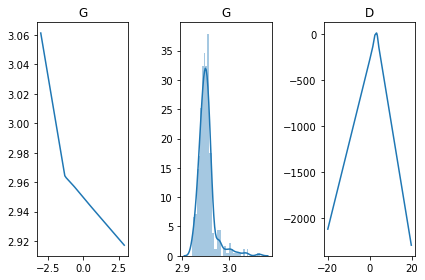

[Epoch 16204/50000] [D loss: -1.132205] [G loss: 0.244873]
[Epoch 16208/50000] [D loss: 0.126509] [G loss: -0.141009]
[Epoch 16212/50000] [D loss: 0.534352] [G loss: -0.469381]
[Epoch 16216/50000] [D loss: 1.026544] [G loss: -0.682082]
[Epoch 16220/50000] [D loss: 1.871008] [G loss: -0.794466]
[Epoch 16224/50000] [D loss: 2.328121] [G loss: -0.968552]
[Epoch 16228/50000] [D loss: 2.820669] [G loss: -1.071998]
[Epoch 16232/50000] [D loss: 3.254020] [G loss: -1.074181]
[Epoch 16236/50000] [D loss: 3.133129] [G loss: -1.052525]
[Epoch 16240/50000] [D loss: 3.215434] [G loss: -0.980281]
[Epoch 16244/50000] [D loss: 3.034139] [G loss: -0.877781]
[Epoch 16248/50000] [D loss: 2.276875] [G loss: -0.648714]
[Epoch 16252/50000] [D loss: 1.913992] [G loss: -0.459845]
[Epoch 16256/50000] [D loss: 0.799787] [G loss: -0.168238]
[Epoch 16260/50000] [D loss: 0.014079] [G loss: 0.719715]
[Epoch 16264/50000] [D loss: -0.949149] [G loss: 0.920469]
[Epoch 16268/50000] [D loss: -1.927185] [G loss: 1.427154

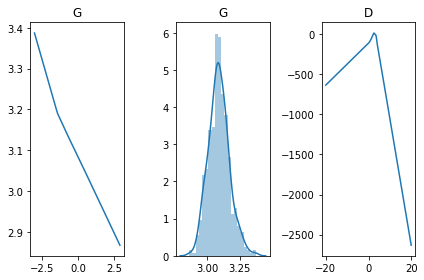

[Epoch 16304/50000] [D loss: -3.391758] [G loss: 2.100646]
[Epoch 16308/50000] [D loss: -2.050547] [G loss: 1.692905]
[Epoch 16312/50000] [D loss: -0.821246] [G loss: 0.756866]
[Epoch 16316/50000] [D loss: -0.249838] [G loss: 0.420044]
[Epoch 16320/50000] [D loss: 0.688642] [G loss: -0.474986]
[Epoch 16324/50000] [D loss: 1.244978] [G loss: -1.401664]
[Epoch 16328/50000] [D loss: 1.976819] [G loss: -1.882795]
[Epoch 16332/50000] [D loss: 2.114655] [G loss: -1.716920]
[Epoch 16336/50000] [D loss: 2.261386] [G loss: -1.858266]
[Epoch 16340/50000] [D loss: 2.167086] [G loss: -1.617725]
[Epoch 16344/50000] [D loss: 1.892401] [G loss: -1.268931]
[Epoch 16348/50000] [D loss: 1.317495] [G loss: -0.770985]
[Epoch 16352/50000] [D loss: 0.504440] [G loss: -0.320039]
[Epoch 16356/50000] [D loss: 0.011347] [G loss: -0.198179]
[Epoch 16360/50000] [D loss: -0.497419] [G loss: 0.220524]
[Epoch 16364/50000] [D loss: -1.055017] [G loss: 0.455188]
[Epoch 16368/50000] [D loss: -1.538089] [G loss: 0.66842

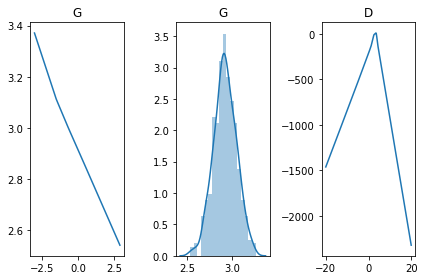

[Epoch 16404/50000] [D loss: -1.575645] [G loss: 0.613675]
[Epoch 16408/50000] [D loss: -1.237353] [G loss: 0.540163]
[Epoch 16412/50000] [D loss: -0.900208] [G loss: 0.316101]
[Epoch 16416/50000] [D loss: -0.446688] [G loss: 0.139682]
[Epoch 16420/50000] [D loss: 0.237834] [G loss: -0.000344]
[Epoch 16424/50000] [D loss: 0.673077] [G loss: -0.218779]
[Epoch 16428/50000] [D loss: 0.893436] [G loss: -0.376264]
[Epoch 16432/50000] [D loss: 1.559321] [G loss: -0.410281]
[Epoch 16436/50000] [D loss: 1.539707] [G loss: -0.333004]
[Epoch 16440/50000] [D loss: 2.197300] [G loss: -0.454180]
[Epoch 16444/50000] [D loss: 2.773812] [G loss: -0.657971]
[Epoch 16448/50000] [D loss: 2.680520] [G loss: -0.532239]
[Epoch 16452/50000] [D loss: 2.791276] [G loss: -0.543573]
[Epoch 16456/50000] [D loss: 2.288882] [G loss: -0.495790]
[Epoch 16460/50000] [D loss: 2.355886] [G loss: -0.398328]
[Epoch 16464/50000] [D loss: 1.683852] [G loss: -0.332376]
[Epoch 16468/50000] [D loss: 1.270766] [G loss: -0.25257

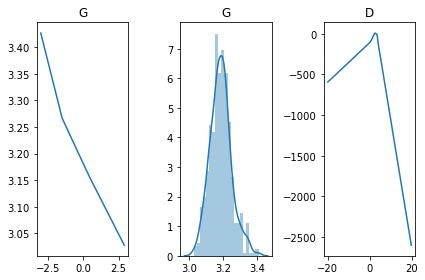

[Epoch 16504/50000] [D loss: -2.681254] [G loss: 1.758808]
[Epoch 16508/50000] [D loss: -3.020632] [G loss: 1.897997]
[Epoch 16512/50000] [D loss: -3.015970] [G loss: 1.998752]
[Epoch 16516/50000] [D loss: -2.630978] [G loss: 1.692273]
[Epoch 16520/50000] [D loss: -2.263849] [G loss: 1.324610]
[Epoch 16524/50000] [D loss: -2.245960] [G loss: 1.180264]
[Epoch 16528/50000] [D loss: -1.862248] [G loss: 0.822887]
[Epoch 16532/50000] [D loss: -0.941461] [G loss: 0.476265]
[Epoch 16536/50000] [D loss: -0.922235] [G loss: 0.226397]
[Epoch 16540/50000] [D loss: 0.132017] [G loss: -0.335245]
[Epoch 16544/50000] [D loss: 0.465277] [G loss: -0.766054]
[Epoch 16548/50000] [D loss: 0.355000] [G loss: -1.090304]
[Epoch 16552/50000] [D loss: 1.346555] [G loss: -1.045484]
[Epoch 16556/50000] [D loss: 1.618610] [G loss: -1.583254]
[Epoch 16560/50000] [D loss: 2.596353] [G loss: -1.680122]
[Epoch 16564/50000] [D loss: 2.398612] [G loss: -1.724573]
[Epoch 16568/50000] [D loss: 3.188690] [G loss: -1.84977

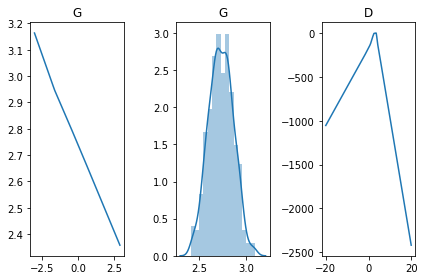

[Epoch 16604/50000] [D loss: -2.113045] [G loss: 1.056452]
[Epoch 16608/50000] [D loss: -2.830090] [G loss: 1.316561]
[Epoch 16612/50000] [D loss: -2.795504] [G loss: 1.231755]
[Epoch 16616/50000] [D loss: -3.922890] [G loss: 1.782216]
[Epoch 16620/50000] [D loss: -4.053772] [G loss: 1.560436]
[Epoch 16624/50000] [D loss: -4.172143] [G loss: 1.695555]
[Epoch 16628/50000] [D loss: -4.208240] [G loss: 1.669343]
[Epoch 16632/50000] [D loss: -4.323472] [G loss: 1.732590]
[Epoch 16636/50000] [D loss: -3.534338] [G loss: 1.186777]
[Epoch 16640/50000] [D loss: -3.273187] [G loss: 1.014306]
[Epoch 16644/50000] [D loss: -2.303149] [G loss: 0.826411]
[Epoch 16648/50000] [D loss: -1.818263] [G loss: 0.712115]
[Epoch 16652/50000] [D loss: -0.893685] [G loss: 0.262564]
[Epoch 16656/50000] [D loss: -0.245830] [G loss: 0.227066]
[Epoch 16660/50000] [D loss: 0.601769] [G loss: -0.125530]
[Epoch 16664/50000] [D loss: 1.316231] [G loss: -0.382622]
[Epoch 16668/50000] [D loss: 2.389181] [G loss: -0.86799

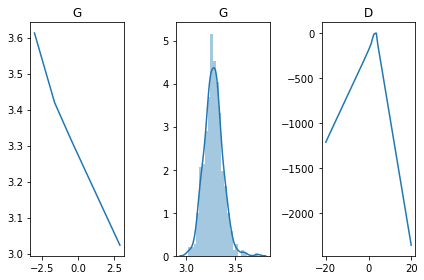

[Epoch 16704/50000] [D loss: 2.657058] [G loss: -0.599370]
[Epoch 16708/50000] [D loss: 1.835588] [G loss: -0.284626]
[Epoch 16712/50000] [D loss: 0.810870] [G loss: -0.084352]
[Epoch 16716/50000] [D loss: -0.019140] [G loss: -0.059359]
[Epoch 16720/50000] [D loss: -1.015974] [G loss: 0.744104]
[Epoch 16724/50000] [D loss: -1.849708] [G loss: 1.586833]
[Epoch 16728/50000] [D loss: -2.641814] [G loss: 1.932684]
[Epoch 16732/50000] [D loss: -3.427951] [G loss: 2.651251]
[Epoch 16736/50000] [D loss: -4.172631] [G loss: 2.929281]
[Epoch 16740/50000] [D loss: -4.373091] [G loss: 3.331384]
[Epoch 16744/50000] [D loss: -4.928400] [G loss: 3.457505]
[Epoch 16748/50000] [D loss: -5.289041] [G loss: 3.672674]
[Epoch 16752/50000] [D loss: -5.014461] [G loss: 3.447354]
[Epoch 16756/50000] [D loss: -4.758346] [G loss: 3.256774]
[Epoch 16760/50000] [D loss: -4.220251] [G loss: 3.092494]
[Epoch 16764/50000] [D loss: -3.449740] [G loss: 2.291259]
[Epoch 16768/50000] [D loss: -2.102109] [G loss: 1.7194

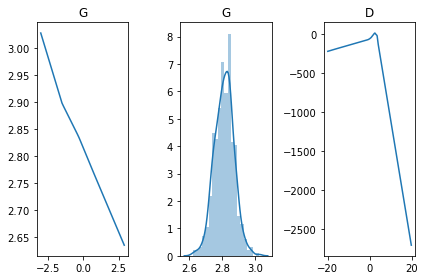

[Epoch 16804/50000] [D loss: 4.703376] [G loss: -3.163132]
[Epoch 16808/50000] [D loss: 4.793264] [G loss: -3.251465]
[Epoch 16812/50000] [D loss: 5.069687] [G loss: -2.933877]
[Epoch 16816/50000] [D loss: 4.649744] [G loss: -2.768890]
[Epoch 16820/50000] [D loss: 4.231790] [G loss: -2.333894]
[Epoch 16824/50000] [D loss: 3.539850] [G loss: -1.998964]
[Epoch 16828/50000] [D loss: 2.454797] [G loss: -1.292812]
[Epoch 16832/50000] [D loss: 1.128391] [G loss: -0.471690]
[Epoch 16836/50000] [D loss: -0.172379] [G loss: 0.527991]
[Epoch 16840/50000] [D loss: -1.442982] [G loss: 1.166388]
[Epoch 16844/50000] [D loss: -2.805571] [G loss: 1.759512]
[Epoch 16848/50000] [D loss: -3.860785] [G loss: 2.111461]
[Epoch 16852/50000] [D loss: -4.710649] [G loss: 2.247100]
[Epoch 16856/50000] [D loss: -5.642786] [G loss: 2.414941]
[Epoch 16860/50000] [D loss: -6.140187] [G loss: 2.310362]
[Epoch 16864/50000] [D loss: -6.590104] [G loss: 2.512498]
[Epoch 16868/50000] [D loss: -6.038126] [G loss: 2.21836

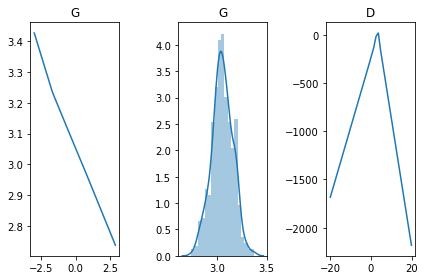

[Epoch 16904/50000] [D loss: 2.353397] [G loss: -1.059263]
[Epoch 16908/50000] [D loss: 2.835940] [G loss: -1.222814]
[Epoch 16912/50000] [D loss: 4.338422] [G loss: -1.686878]
[Epoch 16916/50000] [D loss: 5.179298] [G loss: -1.631476]
[Epoch 16920/50000] [D loss: 5.904214] [G loss: -1.792017]
[Epoch 16924/50000] [D loss: 6.015481] [G loss: -1.417247]
[Epoch 16928/50000] [D loss: 6.311894] [G loss: -1.007001]
[Epoch 16932/50000] [D loss: 5.816059] [G loss: -1.073240]
[Epoch 16936/50000] [D loss: 4.933989] [G loss: -0.817505]
[Epoch 16940/50000] [D loss: 4.681646] [G loss: -0.689250]
[Epoch 16944/50000] [D loss: 3.259190] [G loss: -0.493850]
[Epoch 16948/50000] [D loss: 2.284816] [G loss: -0.320865]
[Epoch 16952/50000] [D loss: 0.945026] [G loss: -0.103944]
[Epoch 16956/50000] [D loss: -0.298479] [G loss: 1.369853]
[Epoch 16960/50000] [D loss: -1.768052] [G loss: 1.422822]
[Epoch 16964/50000] [D loss: -2.873123] [G loss: 2.476872]
[Epoch 16968/50000] [D loss: -4.173818] [G loss: 3.25518

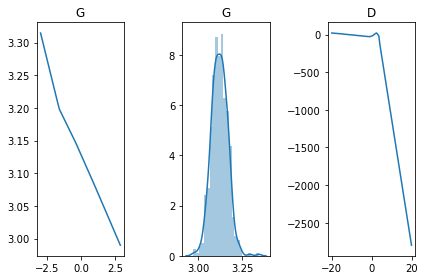

[Epoch 17004/50000] [D loss: -4.747601] [G loss: 3.380808]
[Epoch 17008/50000] [D loss: -3.468659] [G loss: 2.303877]
[Epoch 17012/50000] [D loss: -1.624946] [G loss: 1.017221]
[Epoch 17016/50000] [D loss: -0.972845] [G loss: 0.128478]
[Epoch 17020/50000] [D loss: 0.502023] [G loss: -0.855050]
[Epoch 17024/50000] [D loss: 2.684334] [G loss: -1.747816]
[Epoch 17028/50000] [D loss: 3.872377] [G loss: -2.687450]
[Epoch 17032/50000] [D loss: 5.086319] [G loss: -3.479426]
[Epoch 17036/50000] [D loss: 6.457946] [G loss: -3.913866]
[Epoch 17040/50000] [D loss: 6.927281] [G loss: -4.451391]
[Epoch 17044/50000] [D loss: 7.365887] [G loss: -4.550903]
[Epoch 17048/50000] [D loss: 7.201595] [G loss: -4.473220]
[Epoch 17052/50000] [D loss: 6.900627] [G loss: -4.254607]
[Epoch 17056/50000] [D loss: 6.526439] [G loss: -3.807165]
[Epoch 17060/50000] [D loss: 5.074023] [G loss: -2.942224]
[Epoch 17064/50000] [D loss: 3.114619] [G loss: -1.439953]
[Epoch 17068/50000] [D loss: 1.435135] [G loss: 0.114385

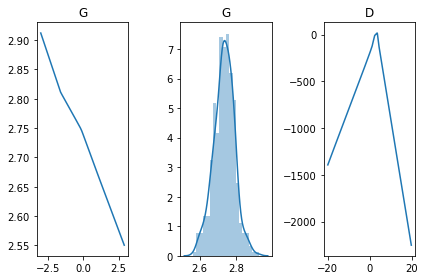

[Epoch 17104/50000] [D loss: -6.953301] [G loss: 2.852187]
[Epoch 17108/50000] [D loss: -7.030268] [G loss: 2.526988]
[Epoch 17112/50000] [D loss: -6.891343] [G loss: 2.379426]
[Epoch 17116/50000] [D loss: -6.223842] [G loss: 2.245057]
[Epoch 17120/50000] [D loss: -5.483966] [G loss: 1.637263]
[Epoch 17124/50000] [D loss: -4.789767] [G loss: 1.295970]
[Epoch 17128/50000] [D loss: -3.879338] [G loss: 0.940506]
[Epoch 17132/50000] [D loss: -1.852453] [G loss: 0.200878]
[Epoch 17136/50000] [D loss: -0.594956] [G loss: -0.122412]
[Epoch 17140/50000] [D loss: 1.328961] [G loss: -0.857242]
[Epoch 17144/50000] [D loss: 2.071496] [G loss: -0.999702]
[Epoch 17148/50000] [D loss: 3.093712] [G loss: -1.724462]
[Epoch 17152/50000] [D loss: 4.375275] [G loss: -1.702981]
[Epoch 17156/50000] [D loss: 5.420160] [G loss: -2.418786]
[Epoch 17160/50000] [D loss: 6.280306] [G loss: -2.245426]
[Epoch 17164/50000] [D loss: 6.808115] [G loss: -2.174853]
[Epoch 17168/50000] [D loss: 7.284726] [G loss: -1.9726

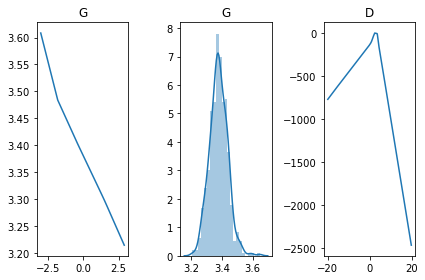

[Epoch 17204/50000] [D loss: -3.119590] [G loss: 2.470301]
[Epoch 17208/50000] [D loss: -4.519192] [G loss: 3.401397]
[Epoch 17212/50000] [D loss: -5.538329] [G loss: 4.106782]
[Epoch 17216/50000] [D loss: -6.486132] [G loss: 4.799303]
[Epoch 17220/50000] [D loss: -7.429579] [G loss: 5.250390]
[Epoch 17224/50000] [D loss: -7.924787] [G loss: 5.378958]
[Epoch 17228/50000] [D loss: -7.958919] [G loss: 5.397146]
[Epoch 17232/50000] [D loss: -7.950787] [G loss: 5.177488]
[Epoch 17236/50000] [D loss: -7.082035] [G loss: 4.606994]
[Epoch 17240/50000] [D loss: -6.640091] [G loss: 4.044203]
[Epoch 17244/50000] [D loss: -5.722250] [G loss: 2.895443]
[Epoch 17248/50000] [D loss: -5.151343] [G loss: 1.914710]
[Epoch 17252/50000] [D loss: -3.626477] [G loss: 0.674296]
[Epoch 17256/50000] [D loss: -3.250521] [G loss: -0.310397]
[Epoch 17260/50000] [D loss: -0.270056] [G loss: -1.341863]
[Epoch 17264/50000] [D loss: 2.182320] [G loss: -2.265968]
[Epoch 17268/50000] [D loss: 4.671039] [G loss: -2.925

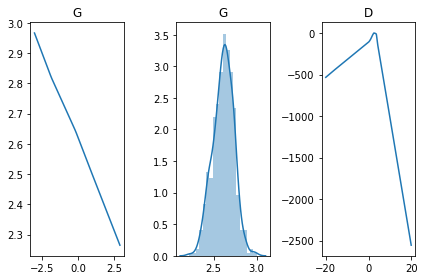

[Epoch 17304/50000] [D loss: 0.967352] [G loss: 0.124083]
[Epoch 17308/50000] [D loss: -0.717311] [G loss: 0.921248]
[Epoch 17312/50000] [D loss: -2.095291] [G loss: 1.355652]
[Epoch 17316/50000] [D loss: -3.553586] [G loss: 1.860161]
[Epoch 17320/50000] [D loss: -4.564322] [G loss: 2.151857]
[Epoch 17324/50000] [D loss: -5.411811] [G loss: 2.449073]
[Epoch 17328/50000] [D loss: -6.620429] [G loss: 2.596797]
[Epoch 17332/50000] [D loss: -6.999537] [G loss: 2.802886]
[Epoch 17336/50000] [D loss: -7.508888] [G loss: 2.958949]
[Epoch 17340/50000] [D loss: -8.137311] [G loss: 3.099774]
[Epoch 17344/50000] [D loss: -7.579381] [G loss: 3.060439]
[Epoch 17348/50000] [D loss: -6.921555] [G loss: 2.638964]
[Epoch 17352/50000] [D loss: -6.973971] [G loss: 2.494597]
[Epoch 17356/50000] [D loss: -6.222535] [G loss: 1.974139]
[Epoch 17360/50000] [D loss: -5.599248] [G loss: 1.762490]
[Epoch 17364/50000] [D loss: -4.335257] [G loss: 1.022647]
[Epoch 17368/50000] [D loss: -3.302693] [G loss: 0.510644

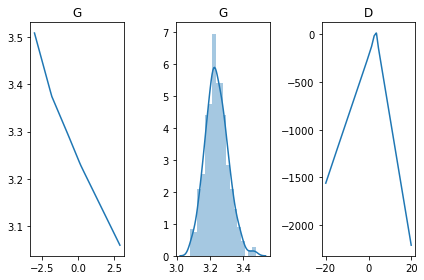

[Epoch 17404/50000] [D loss: 8.046886] [G loss: -2.468563]
[Epoch 17408/50000] [D loss: 8.228538] [G loss: -2.349656]
[Epoch 17412/50000] [D loss: 7.935040] [G loss: -1.868726]
[Epoch 17416/50000] [D loss: 6.950884] [G loss: -0.846581]
[Epoch 17420/50000] [D loss: 5.720184] [G loss: -0.274285]
[Epoch 17424/50000] [D loss: 3.922559] [G loss: -0.171038]
[Epoch 17428/50000] [D loss: 2.187935] [G loss: -0.097147]
[Epoch 17432/50000] [D loss: 0.662344] [G loss: 0.011001]
[Epoch 17436/50000] [D loss: -1.027625] [G loss: 1.592026]
[Epoch 17440/50000] [D loss: -2.568953] [G loss: 2.549010]
[Epoch 17444/50000] [D loss: -4.192306] [G loss: 3.698649]
[Epoch 17448/50000] [D loss: -5.718787] [G loss: 4.540072]
[Epoch 17452/50000] [D loss: -6.790638] [G loss: 5.366795]
[Epoch 17456/50000] [D loss: -7.763450] [G loss: 5.829510]
[Epoch 17460/50000] [D loss: -8.173185] [G loss: 6.143354]
[Epoch 17464/50000] [D loss: -8.118200] [G loss: 6.261005]
[Epoch 17468/50000] [D loss: -7.997334] [G loss: 6.135398

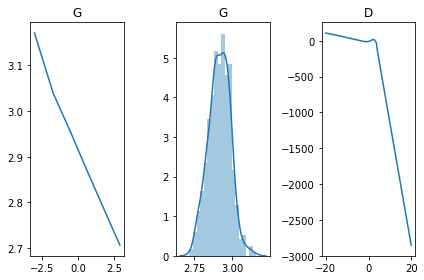

[Epoch 17504/50000] [D loss: 3.559222] [G loss: -2.431131]
[Epoch 17508/50000] [D loss: 4.523982] [G loss: -3.436578]
[Epoch 17512/50000] [D loss: 6.426242] [G loss: -4.031785]
[Epoch 17516/50000] [D loss: 7.034472] [G loss: -4.537400]
[Epoch 17520/50000] [D loss: 7.408760] [G loss: -5.111807]
[Epoch 17524/50000] [D loss: 7.493754] [G loss: -4.941902]
[Epoch 17528/50000] [D loss: 7.597858] [G loss: -4.777741]
[Epoch 17532/50000] [D loss: 6.255116] [G loss: -4.383761]
[Epoch 17536/50000] [D loss: 5.131392] [G loss: -3.048245]
[Epoch 17540/50000] [D loss: 3.342278] [G loss: -1.253316]
[Epoch 17544/50000] [D loss: 1.598233] [G loss: -0.315197]
[Epoch 17548/50000] [D loss: 0.109247] [G loss: 0.218922]
[Epoch 17552/50000] [D loss: -1.029927] [G loss: 0.594158]
[Epoch 17556/50000] [D loss: -2.070650] [G loss: 1.095150]
[Epoch 17560/50000] [D loss: -3.234467] [G loss: 1.456404]
[Epoch 17564/50000] [D loss: -4.265932] [G loss: 1.785879]
[Epoch 17568/50000] [D loss: -4.875536] [G loss: 2.005773

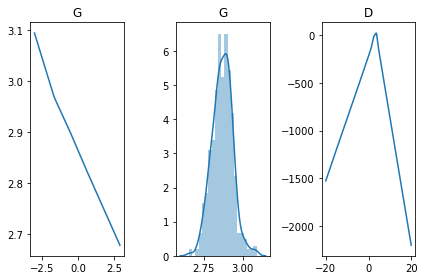

[Epoch 17604/50000] [D loss: -4.271982] [G loss: 1.174619]
[Epoch 17608/50000] [D loss: -2.837427] [G loss: 1.089875]
[Epoch 17612/50000] [D loss: -2.246404] [G loss: 0.649014]
[Epoch 17616/50000] [D loss: -0.996935] [G loss: 0.248756]
[Epoch 17620/50000] [D loss: 0.309690] [G loss: -0.437191]
[Epoch 17624/50000] [D loss: 1.053639] [G loss: -0.723434]
[Epoch 17628/50000] [D loss: 2.441186] [G loss: -1.121452]
[Epoch 17632/50000] [D loss: 2.944160] [G loss: -1.358750]
[Epoch 17636/50000] [D loss: 4.235907] [G loss: -1.577303]
[Epoch 17640/50000] [D loss: 5.151503] [G loss: -1.890660]
[Epoch 17644/50000] [D loss: 5.439456] [G loss: -1.727634]
[Epoch 17648/50000] [D loss: 6.164013] [G loss: -2.196468]
[Epoch 17652/50000] [D loss: 6.167806] [G loss: -1.827799]
[Epoch 17656/50000] [D loss: 5.931315] [G loss: -1.636890]
[Epoch 17660/50000] [D loss: 5.869440] [G loss: -1.190933]
[Epoch 17664/50000] [D loss: 4.449647] [G loss: -0.108979]
[Epoch 17668/50000] [D loss: 2.885549] [G loss: -0.06352

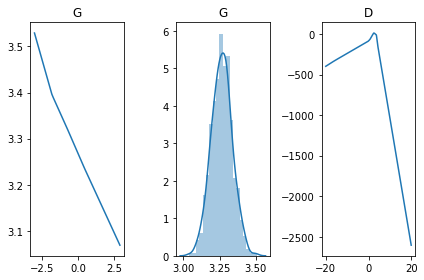

[Epoch 17704/50000] [D loss: -6.783106] [G loss: 5.028691]
[Epoch 17708/50000] [D loss: -6.565989] [G loss: 4.822561]
[Epoch 17712/50000] [D loss: -5.577701] [G loss: 4.453180]
[Epoch 17716/50000] [D loss: -5.192169] [G loss: 4.166346]
[Epoch 17720/50000] [D loss: -4.789117] [G loss: 3.529540]
[Epoch 17724/50000] [D loss: -3.897695] [G loss: 2.913824]
[Epoch 17728/50000] [D loss: -2.348321] [G loss: 1.762717]
[Epoch 17732/50000] [D loss: -2.519112] [G loss: 1.278524]
[Epoch 17736/50000] [D loss: -0.132587] [G loss: 0.207447]
[Epoch 17740/50000] [D loss: 1.684526] [G loss: -0.905121]
[Epoch 17744/50000] [D loss: 1.935339] [G loss: -1.302871]
[Epoch 17748/50000] [D loss: 3.079982] [G loss: -1.840900]
[Epoch 17752/50000] [D loss: 4.235970] [G loss: -2.900152]
[Epoch 17756/50000] [D loss: 4.364636] [G loss: -2.856193]
[Epoch 17760/50000] [D loss: 5.045193] [G loss: -3.423003]
[Epoch 17764/50000] [D loss: 5.264072] [G loss: -3.392032]
[Epoch 17768/50000] [D loss: 5.328021] [G loss: -3.44083

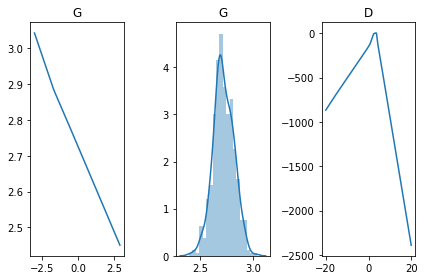

[Epoch 17804/50000] [D loss: -3.269071] [G loss: 1.389850]
[Epoch 17808/50000] [D loss: -3.522588] [G loss: 1.369146]
[Epoch 17812/50000] [D loss: -3.955111] [G loss: 1.535222]
[Epoch 17816/50000] [D loss: -4.594967] [G loss: 1.840794]
[Epoch 17820/50000] [D loss: -4.449744] [G loss: 1.698808]
[Epoch 17824/50000] [D loss: -4.571867] [G loss: 1.908408]
[Epoch 17828/50000] [D loss: -4.454854] [G loss: 1.561282]
[Epoch 17832/50000] [D loss: -4.237612] [G loss: 1.471232]
[Epoch 17836/50000] [D loss: -3.899373] [G loss: 1.322680]
[Epoch 17840/50000] [D loss: -3.199355] [G loss: 1.258483]
[Epoch 17844/50000] [D loss: -3.016695] [G loss: 0.788812]
[Epoch 17848/50000] [D loss: -2.375552] [G loss: 0.573361]
[Epoch 17852/50000] [D loss: -0.949720] [G loss: 0.073461]
[Epoch 17856/50000] [D loss: -0.633562] [G loss: -0.342487]
[Epoch 17860/50000] [D loss: 0.177874] [G loss: -0.587717]
[Epoch 17864/50000] [D loss: 1.033118] [G loss: -0.650466]
[Epoch 17868/50000] [D loss: 1.570632] [G loss: -0.8131

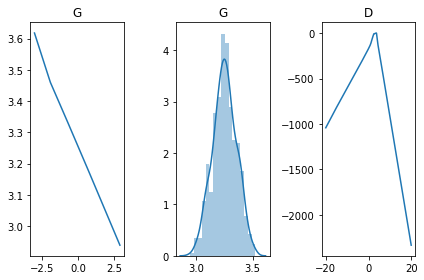

[Epoch 17904/50000] [D loss: 2.287418] [G loss: -0.065189]
[Epoch 17908/50000] [D loss: 1.371209] [G loss: 0.239561]
[Epoch 17912/50000] [D loss: 0.086241] [G loss: 0.796929]
[Epoch 17916/50000] [D loss: -1.137125] [G loss: 1.731518]
[Epoch 17920/50000] [D loss: -2.019509] [G loss: 2.318312]
[Epoch 17924/50000] [D loss: -2.875801] [G loss: 2.558930]
[Epoch 17928/50000] [D loss: -3.118432] [G loss: 2.769952]
[Epoch 17932/50000] [D loss: -3.412195] [G loss: 2.929442]
[Epoch 17936/50000] [D loss: -3.772478] [G loss: 3.077241]
[Epoch 17940/50000] [D loss: -4.416044] [G loss: 3.025755]
[Epoch 17944/50000] [D loss: -4.210480] [G loss: 2.829032]
[Epoch 17948/50000] [D loss: -3.475449] [G loss: 2.985190]
[Epoch 17952/50000] [D loss: -3.119852] [G loss: 2.312286]
[Epoch 17956/50000] [D loss: -2.302532] [G loss: 2.085612]
[Epoch 17960/50000] [D loss: -1.413733] [G loss: 1.231269]
[Epoch 17964/50000] [D loss: -1.449528] [G loss: 0.756071]
[Epoch 17968/50000] [D loss: -0.365546] [G loss: 0.022285]

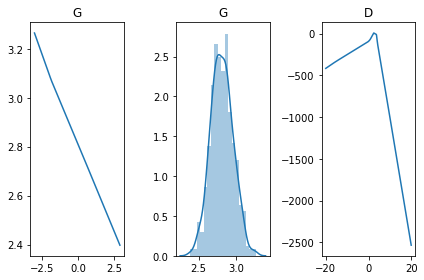

[Epoch 18004/50000] [D loss: 2.521459] [G loss: -1.382502]
[Epoch 18008/50000] [D loss: 1.798486] [G loss: -0.861966]
[Epoch 18012/50000] [D loss: 1.070277] [G loss: -0.259924]
[Epoch 18016/50000] [D loss: 0.291737] [G loss: 0.140509]
[Epoch 18020/50000] [D loss: -0.429136] [G loss: 0.509983]
[Epoch 18024/50000] [D loss: -1.046880] [G loss: 0.665131]
[Epoch 18028/50000] [D loss: -1.565069] [G loss: 0.749681]
[Epoch 18032/50000] [D loss: -2.041650] [G loss: 0.862683]
[Epoch 18036/50000] [D loss: -2.107512] [G loss: 0.898519]
[Epoch 18040/50000] [D loss: -2.484149] [G loss: 0.872983]
[Epoch 18044/50000] [D loss: -2.450918] [G loss: 0.987436]
[Epoch 18048/50000] [D loss: -2.688659] [G loss: 1.031403]
[Epoch 18052/50000] [D loss: -3.072265] [G loss: 0.977964]
[Epoch 18056/50000] [D loss: -2.028658] [G loss: 0.439785]
[Epoch 18060/50000] [D loss: -2.383268] [G loss: 1.069638]
[Epoch 18064/50000] [D loss: -1.692276] [G loss: 0.417035]
[Epoch 18068/50000] [D loss: -1.466349] [G loss: 0.535756

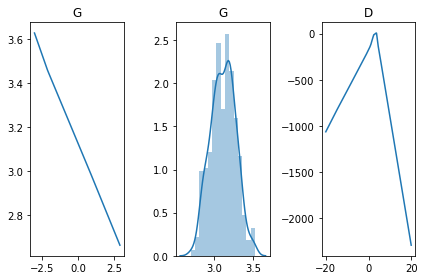

[Epoch 18104/50000] [D loss: 2.461820] [G loss: -0.455817]
[Epoch 18108/50000] [D loss: 2.450423] [G loss: -0.349872]
[Epoch 18112/50000] [D loss: 2.898302] [G loss: -0.455599]
[Epoch 18116/50000] [D loss: 2.593171] [G loss: -0.175883]
[Epoch 18120/50000] [D loss: 2.298176] [G loss: 0.141018]
[Epoch 18124/50000] [D loss: 1.590186] [G loss: 0.059844]
[Epoch 18128/50000] [D loss: 1.081657] [G loss: 0.197001]
[Epoch 18132/50000] [D loss: 0.203131] [G loss: 0.335372]
[Epoch 18136/50000] [D loss: -0.335496] [G loss: 0.780553]
[Epoch 18140/50000] [D loss: -0.908997] [G loss: 1.220070]
[Epoch 18144/50000] [D loss: -1.482703] [G loss: 1.409445]
[Epoch 18148/50000] [D loss: -1.579381] [G loss: 1.454808]
[Epoch 18152/50000] [D loss: -1.888154] [G loss: 1.618312]
[Epoch 18156/50000] [D loss: -2.194143] [G loss: 1.794777]
[Epoch 18160/50000] [D loss: -2.486078] [G loss: 1.773134]
[Epoch 18164/50000] [D loss: -2.126248] [G loss: 1.817603]
[Epoch 18168/50000] [D loss: -2.516017] [G loss: 1.814026]
[

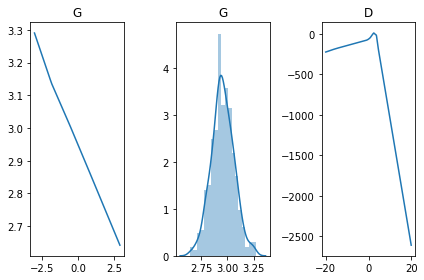

[Epoch 18204/50000] [D loss: 1.062000] [G loss: -0.826273]
[Epoch 18208/50000] [D loss: 1.488500] [G loss: -0.998841]
[Epoch 18212/50000] [D loss: 1.406524] [G loss: -1.207227]
[Epoch 18216/50000] [D loss: 1.835666] [G loss: -1.345487]
[Epoch 18220/50000] [D loss: 1.823407] [G loss: -1.428709]
[Epoch 18224/50000] [D loss: 2.639546] [G loss: -1.641236]
[Epoch 18228/50000] [D loss: 2.158645] [G loss: -1.482954]
[Epoch 18232/50000] [D loss: 2.109671] [G loss: -1.255219]
[Epoch 18236/50000] [D loss: 2.146926] [G loss: -1.412574]
[Epoch 18240/50000] [D loss: 1.915409] [G loss: -1.123422]
[Epoch 18244/50000] [D loss: 1.283380] [G loss: -0.736358]
[Epoch 18248/50000] [D loss: 0.700521] [G loss: -0.258806]
[Epoch 18252/50000] [D loss: -0.015935] [G loss: 0.259008]
[Epoch 18256/50000] [D loss: -0.677740] [G loss: 0.351950]
[Epoch 18260/50000] [D loss: -1.288569] [G loss: 1.027255]
[Epoch 18264/50000] [D loss: -1.996659] [G loss: 1.259114]
[Epoch 18268/50000] [D loss: -2.583350] [G loss: 1.27796

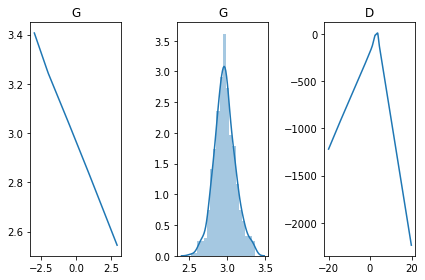

[Epoch 18304/50000] [D loss: -1.039216] [G loss: 0.251107]
[Epoch 18308/50000] [D loss: 0.114648] [G loss: -0.284011]
[Epoch 18312/50000] [D loss: 0.247296] [G loss: -0.619413]
[Epoch 18316/50000] [D loss: 1.014904] [G loss: -1.280037]
[Epoch 18320/50000] [D loss: 0.949981] [G loss: -0.428452]
[Epoch 18324/50000] [D loss: 1.802264] [G loss: -0.751152]
[Epoch 18328/50000] [D loss: 1.967870] [G loss: -0.565728]
[Epoch 18332/50000] [D loss: 1.869596] [G loss: -0.383443]
[Epoch 18336/50000] [D loss: 1.633270] [G loss: -0.346571]
[Epoch 18340/50000] [D loss: 2.004552] [G loss: -0.157219]
[Epoch 18344/50000] [D loss: 1.431628] [G loss: 0.227349]
[Epoch 18348/50000] [D loss: 1.249037] [G loss: 0.044741]
[Epoch 18352/50000] [D loss: 0.658516] [G loss: -0.267838]
[Epoch 18356/50000] [D loss: -0.061710] [G loss: 0.361906]
[Epoch 18360/50000] [D loss: -0.771970] [G loss: 1.019805]
[Epoch 18364/50000] [D loss: -1.237448] [G loss: 1.059522]
[Epoch 18368/50000] [D loss: -1.586183] [G loss: 1.290911]

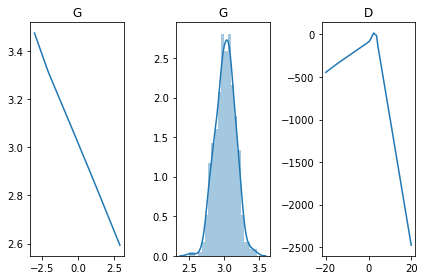

[Epoch 18404/50000] [D loss: -0.644574] [G loss: 0.572178]
[Epoch 18408/50000] [D loss: -0.617261] [G loss: -0.100590]
[Epoch 18412/50000] [D loss: 0.464219] [G loss: -1.021781]
[Epoch 18416/50000] [D loss: 0.904268] [G loss: -1.130479]
[Epoch 18420/50000] [D loss: 0.932124] [G loss: -1.138954]
[Epoch 18424/50000] [D loss: 1.213122] [G loss: -1.130211]
[Epoch 18428/50000] [D loss: 0.857956] [G loss: -0.833556]
[Epoch 18432/50000] [D loss: 0.826964] [G loss: -0.791586]
[Epoch 18436/50000] [D loss: 0.495481] [G loss: -0.348167]
[Epoch 18440/50000] [D loss: 0.204134] [G loss: -0.131956]
[Epoch 18444/50000] [D loss: -0.048460] [G loss: 0.162688]
[Epoch 18448/50000] [D loss: -0.327328] [G loss: 0.504965]
[Epoch 18452/50000] [D loss: -0.590665] [G loss: 0.225812]
[Epoch 18456/50000] [D loss: -0.640545] [G loss: 0.892312]
[Epoch 18460/50000] [D loss: -0.734346] [G loss: 0.953085]
[Epoch 18464/50000] [D loss: -0.945904] [G loss: 0.855875]
[Epoch 18468/50000] [D loss: -0.939761] [G loss: 0.8305

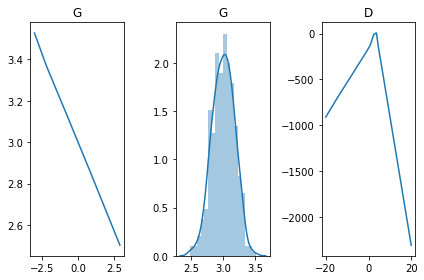

[Epoch 18504/50000] [D loss: 0.113196] [G loss: 0.536208]
[Epoch 18508/50000] [D loss: 0.345952] [G loss: 0.638743]
[Epoch 18512/50000] [D loss: 0.603158] [G loss: 0.247546]
[Epoch 18516/50000] [D loss: 0.542911] [G loss: 0.488048]
[Epoch 18520/50000] [D loss: 0.905844] [G loss: 0.377743]
[Epoch 18524/50000] [D loss: 0.787967] [G loss: 0.263077]
[Epoch 18528/50000] [D loss: 1.019503] [G loss: 0.167606]
[Epoch 18532/50000] [D loss: 0.875902] [G loss: 0.015264]
[Epoch 18536/50000] [D loss: 0.645065] [G loss: 0.019396]
[Epoch 18540/50000] [D loss: 0.627519] [G loss: -0.030140]
[Epoch 18544/50000] [D loss: 0.294526] [G loss: 0.025782]
[Epoch 18548/50000] [D loss: 0.216400] [G loss: 0.013171]
[Epoch 18552/50000] [D loss: 0.075469] [G loss: -0.402581]
[Epoch 18556/50000] [D loss: -0.115817] [G loss: -0.084791]
[Epoch 18560/50000] [D loss: -0.252582] [G loss: 0.207622]
[Epoch 18564/50000] [D loss: -0.350785] [G loss: 0.256426]
[Epoch 18568/50000] [D loss: -0.496664] [G loss: 0.328996]
[Epoch 

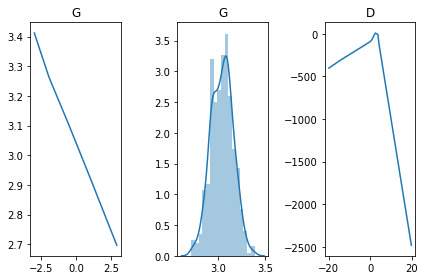

[Epoch 18604/50000] [D loss: -0.811484] [G loss: 0.284732]
[Epoch 18608/50000] [D loss: -0.565681] [G loss: 0.266933]
[Epoch 18612/50000] [D loss: -0.423343] [G loss: 0.007984]
[Epoch 18616/50000] [D loss: -0.434555] [G loss: -0.147904]
[Epoch 18620/50000] [D loss: -0.302902] [G loss: -0.127067]
[Epoch 18624/50000] [D loss: -0.155328] [G loss: -0.226619]
[Epoch 18628/50000] [D loss: -0.035318] [G loss: -0.454665]
[Epoch 18632/50000] [D loss: 0.483746] [G loss: -0.683106]
[Epoch 18636/50000] [D loss: 0.462920] [G loss: -0.697570]
[Epoch 18640/50000] [D loss: 0.977457] [G loss: -1.058565]
[Epoch 18644/50000] [D loss: 0.897671] [G loss: -0.978149]
[Epoch 18648/50000] [D loss: 1.164663] [G loss: -1.111708]
[Epoch 18652/50000] [D loss: 0.737226] [G loss: -0.804296]
[Epoch 18656/50000] [D loss: 0.848366] [G loss: -0.820305]
[Epoch 18660/50000] [D loss: 0.628082] [G loss: -0.588748]
[Epoch 18664/50000] [D loss: 0.385410] [G loss: -0.356318]
[Epoch 18668/50000] [D loss: 0.152779] [G loss: 0.03

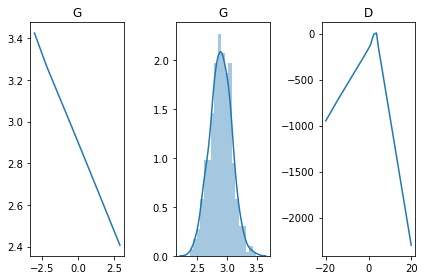

[Epoch 18704/50000] [D loss: -0.992811] [G loss: 0.681073]
[Epoch 18708/50000] [D loss: -1.013873] [G loss: 0.618226]
[Epoch 18712/50000] [D loss: -1.026336] [G loss: 0.810840]
[Epoch 18716/50000] [D loss: -0.636757] [G loss: 0.674667]
[Epoch 18720/50000] [D loss: -0.287318] [G loss: 0.509952]
[Epoch 18724/50000] [D loss: -0.188211] [G loss: 0.374122]
[Epoch 18728/50000] [D loss: -0.004990] [G loss: 0.294972]
[Epoch 18732/50000] [D loss: 0.300361] [G loss: 0.160958]
[Epoch 18736/50000] [D loss: 0.467419] [G loss: 0.204617]
[Epoch 18740/50000] [D loss: 0.432439] [G loss: 0.017753]
[Epoch 18744/50000] [D loss: 0.829090] [G loss: -0.122045]
[Epoch 18748/50000] [D loss: 0.813392] [G loss: -0.023180]
[Epoch 18752/50000] [D loss: 0.901966] [G loss: -0.075997]
[Epoch 18756/50000] [D loss: 1.171576] [G loss: -0.246618]
[Epoch 18760/50000] [D loss: 1.023159] [G loss: -0.124448]
[Epoch 18764/50000] [D loss: 0.824652] [G loss: -0.186856]
[Epoch 18768/50000] [D loss: 0.835382] [G loss: -0.200617]


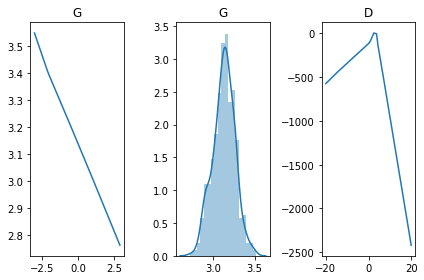

[Epoch 18804/50000] [D loss: -0.833741] [G loss: 0.419569]
[Epoch 18808/50000] [D loss: -0.934191] [G loss: 0.483159]
[Epoch 18812/50000] [D loss: -1.239289] [G loss: 0.689598]
[Epoch 18816/50000] [D loss: -1.276318] [G loss: 0.842320]
[Epoch 18820/50000] [D loss: -1.305137] [G loss: 0.718155]
[Epoch 18824/50000] [D loss: -1.495958] [G loss: 0.783451]
[Epoch 18828/50000] [D loss: -1.450787] [G loss: 0.715757]
[Epoch 18832/50000] [D loss: -1.532230] [G loss: 0.693706]
[Epoch 18836/50000] [D loss: -1.319677] [G loss: 0.545746]
[Epoch 18840/50000] [D loss: -1.296602] [G loss: 0.383643]
[Epoch 18844/50000] [D loss: -1.129887] [G loss: 0.367956]
[Epoch 18848/50000] [D loss: -0.732083] [G loss: -0.146915]
[Epoch 18852/50000] [D loss: -0.413935] [G loss: -0.370513]
[Epoch 18856/50000] [D loss: -0.224450] [G loss: -0.473036]
[Epoch 18860/50000] [D loss: 0.478213] [G loss: -0.898015]
[Epoch 18864/50000] [D loss: 0.901259] [G loss: -1.044543]
[Epoch 18868/50000] [D loss: 1.544216] [G loss: -1.63

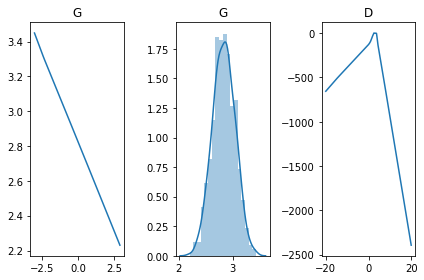

[Epoch 18904/50000] [D loss: -0.361812] [G loss: -0.050877]
[Epoch 18908/50000] [D loss: -0.787351] [G loss: 0.552891]
[Epoch 18912/50000] [D loss: -0.982941] [G loss: 0.757379]
[Epoch 18916/50000] [D loss: -1.387517] [G loss: 0.976985]
[Epoch 18920/50000] [D loss: -1.370036] [G loss: 0.915007]
[Epoch 18924/50000] [D loss: -1.633857] [G loss: 1.022153]
[Epoch 18928/50000] [D loss: -1.589821] [G loss: 1.006803]
[Epoch 18932/50000] [D loss: -1.785258] [G loss: 1.105287]
[Epoch 18936/50000] [D loss: -1.887648] [G loss: 1.332749]
[Epoch 18940/50000] [D loss: -1.559678] [G loss: 1.163767]
[Epoch 18944/50000] [D loss: -1.055246] [G loss: 0.909155]
[Epoch 18948/50000] [D loss: -1.165710] [G loss: 0.922075]
[Epoch 18952/50000] [D loss: -0.441782] [G loss: 0.755935]
[Epoch 18956/50000] [D loss: -0.446340] [G loss: 0.800664]
[Epoch 18960/50000] [D loss: 0.293484] [G loss: 0.507396]
[Epoch 18964/50000] [D loss: 0.713060] [G loss: 0.270147]
[Epoch 18968/50000] [D loss: 0.702240] [G loss: 0.222806]

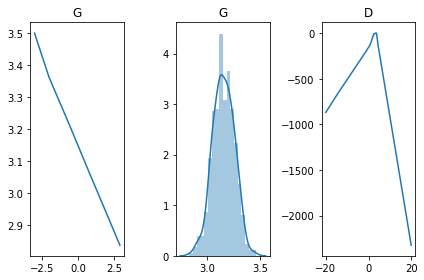

[Epoch 19004/50000] [D loss: 0.896066] [G loss: -0.206762]
[Epoch 19008/50000] [D loss: 0.544387] [G loss: -0.098188]
[Epoch 19012/50000] [D loss: 0.433406] [G loss: -0.101454]
[Epoch 19016/50000] [D loss: 0.145141] [G loss: 0.158613]
[Epoch 19020/50000] [D loss: -0.159061] [G loss: -0.173289]
[Epoch 19024/50000] [D loss: -0.420999] [G loss: 0.340967]
[Epoch 19028/50000] [D loss: -0.698652] [G loss: 0.526647]
[Epoch 19032/50000] [D loss: -1.010816] [G loss: 0.686206]
[Epoch 19036/50000] [D loss: -1.103570] [G loss: 0.778012]
[Epoch 19040/50000] [D loss: -1.302343] [G loss: 0.915341]
[Epoch 19044/50000] [D loss: -1.537180] [G loss: 0.990651]
[Epoch 19048/50000] [D loss: -1.251672] [G loss: 0.885819]
[Epoch 19052/50000] [D loss: -1.540341] [G loss: 1.067113]
[Epoch 19056/50000] [D loss: -1.723397] [G loss: 1.055189]
[Epoch 19060/50000] [D loss: -1.224732] [G loss: 0.914511]
[Epoch 19064/50000] [D loss: -1.157627] [G loss: 0.701307]
[Epoch 19068/50000] [D loss: -1.336453] [G loss: 0.76535

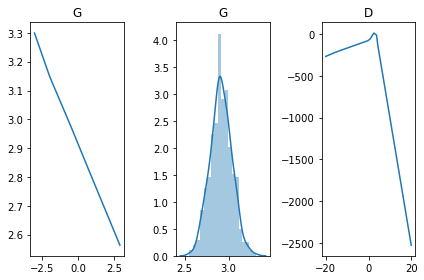

[Epoch 19104/50000] [D loss: 1.238490] [G loss: -0.985554]
[Epoch 19108/50000] [D loss: 1.873134] [G loss: -1.329637]
[Epoch 19112/50000] [D loss: 1.536231] [G loss: -1.169923]
[Epoch 19116/50000] [D loss: 1.771932] [G loss: -1.248829]
[Epoch 19120/50000] [D loss: 1.760934] [G loss: -1.270193]
[Epoch 19124/50000] [D loss: 1.501593] [G loss: -1.107330]
[Epoch 19128/50000] [D loss: 1.296388] [G loss: -0.958709]
[Epoch 19132/50000] [D loss: 0.998203] [G loss: -0.742034]
[Epoch 19136/50000] [D loss: 0.385131] [G loss: -0.282383]
[Epoch 19140/50000] [D loss: -0.075800] [G loss: 0.154578]
[Epoch 19144/50000] [D loss: -0.560479] [G loss: 0.335323]
[Epoch 19148/50000] [D loss: -0.979506] [G loss: 0.576166]
[Epoch 19152/50000] [D loss: -1.337146] [G loss: 0.669912]
[Epoch 19156/50000] [D loss: -1.734120] [G loss: 0.989675]
[Epoch 19160/50000] [D loss: -2.079739] [G loss: 1.030385]
[Epoch 19164/50000] [D loss: -1.982059] [G loss: 1.038243]
[Epoch 19168/50000] [D loss: -2.159382] [G loss: 1.04854

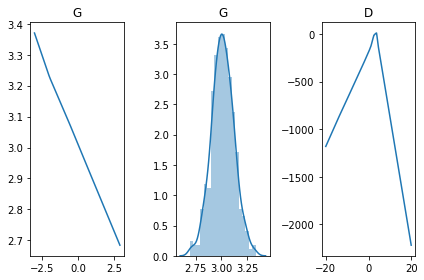

[Epoch 19204/50000] [D loss: 0.858019] [G loss: 0.038840]
[Epoch 19208/50000] [D loss: 0.756003] [G loss: -0.110800]
[Epoch 19212/50000] [D loss: 1.092486] [G loss: -0.162068]
[Epoch 19216/50000] [D loss: 1.470451] [G loss: -0.195943]
[Epoch 19220/50000] [D loss: 1.577360] [G loss: -0.275350]
[Epoch 19224/50000] [D loss: 1.973816] [G loss: -0.425661]
[Epoch 19228/50000] [D loss: 1.966985] [G loss: -0.486486]
[Epoch 19232/50000] [D loss: 1.660616] [G loss: -0.466744]
[Epoch 19236/50000] [D loss: 1.689086] [G loss: -0.422036]
[Epoch 19240/50000] [D loss: 1.576878] [G loss: -0.382001]
[Epoch 19244/50000] [D loss: 1.484787] [G loss: -0.282905]
[Epoch 19248/50000] [D loss: 1.068915] [G loss: -0.274633]
[Epoch 19252/50000] [D loss: 0.836804] [G loss: -0.212992]
[Epoch 19256/50000] [D loss: 0.420953] [G loss: -0.119992]
[Epoch 19260/50000] [D loss: 0.013917] [G loss: 0.356204]
[Epoch 19264/50000] [D loss: -0.489386] [G loss: 0.240274]
[Epoch 19268/50000] [D loss: -0.882363] [G loss: 0.605384]

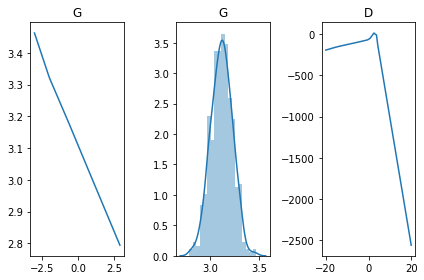

[Epoch 19304/50000] [D loss: -2.194397] [G loss: 1.367399]
[Epoch 19308/50000] [D loss: -1.809941] [G loss: 1.089181]
[Epoch 19312/50000] [D loss: -1.271182] [G loss: 1.001466]
[Epoch 19316/50000] [D loss: -1.077750] [G loss: 0.454879]
[Epoch 19320/50000] [D loss: -0.365098] [G loss: 0.370488]
[Epoch 19324/50000] [D loss: -0.599100] [G loss: 0.206673]
[Epoch 19328/50000] [D loss: 0.244584] [G loss: -0.056050]
[Epoch 19332/50000] [D loss: 0.677402] [G loss: -0.542146]
[Epoch 19336/50000] [D loss: 1.150577] [G loss: -1.026605]
[Epoch 19340/50000] [D loss: 1.724880] [G loss: -1.143212]
[Epoch 19344/50000] [D loss: 2.415406] [G loss: -1.588453]
[Epoch 19348/50000] [D loss: 2.616061] [G loss: -1.700861]
[Epoch 19352/50000] [D loss: 2.770914] [G loss: -1.810617]
[Epoch 19356/50000] [D loss: 2.499175] [G loss: -1.676744]
[Epoch 19360/50000] [D loss: 2.370908] [G loss: -1.650169]
[Epoch 19364/50000] [D loss: 2.218418] [G loss: -1.529738]
[Epoch 19368/50000] [D loss: 1.846022] [G loss: -1.26641

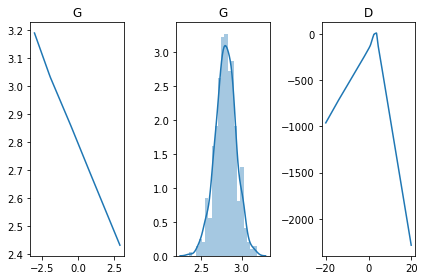

[Epoch 19404/50000] [D loss: -2.947687] [G loss: 1.586555]
[Epoch 19408/50000] [D loss: -2.950242] [G loss: 1.672450]
[Epoch 19412/50000] [D loss: -3.321377] [G loss: 1.587975]
[Epoch 19416/50000] [D loss: -3.276021] [G loss: 1.752275]
[Epoch 19420/50000] [D loss: -2.302467] [G loss: 1.106946]
[Epoch 19424/50000] [D loss: -2.153867] [G loss: 0.949465]
[Epoch 19428/50000] [D loss: -1.787005] [G loss: 0.845547]
[Epoch 19432/50000] [D loss: -1.024592] [G loss: 0.384867]
[Epoch 19436/50000] [D loss: -0.360468] [G loss: 0.135033]
[Epoch 19440/50000] [D loss: 1.083805] [G loss: -0.198208]
[Epoch 19444/50000] [D loss: 0.988656] [G loss: 0.071241]
[Epoch 19448/50000] [D loss: 2.120698] [G loss: -0.222287]
[Epoch 19452/50000] [D loss: 2.948302] [G loss: -0.343843]
[Epoch 19456/50000] [D loss: 2.662951] [G loss: -0.136850]
[Epoch 19460/50000] [D loss: 2.851671] [G loss: -0.295269]
[Epoch 19464/50000] [D loss: 3.122116] [G loss: -0.570982]
[Epoch 19468/50000] [D loss: 2.709118] [G loss: -0.542655

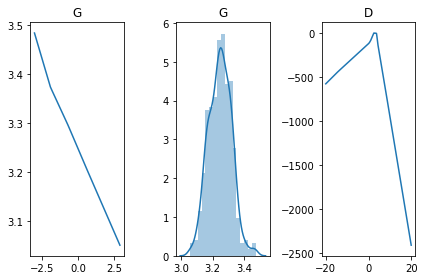

[Epoch 19504/50000] [D loss: -1.133660] [G loss: 0.912649]
[Epoch 19508/50000] [D loss: -1.633466] [G loss: 1.340898]
[Epoch 19512/50000] [D loss: -2.256706] [G loss: 1.594831]
[Epoch 19516/50000] [D loss: -2.515945] [G loss: 1.882344]
[Epoch 19520/50000] [D loss: -2.936511] [G loss: 2.131942]
[Epoch 19524/50000] [D loss: -3.090265] [G loss: 2.256088]
[Epoch 19528/50000] [D loss: -3.263847] [G loss: 2.344442]
[Epoch 19532/50000] [D loss: -3.079950] [G loss: 2.014590]
[Epoch 19536/50000] [D loss: -3.030782] [G loss: 2.169716]
[Epoch 19540/50000] [D loss: -2.672564] [G loss: 1.867873]
[Epoch 19544/50000] [D loss: -2.342081] [G loss: 1.508577]
[Epoch 19548/50000] [D loss: -1.784937] [G loss: 1.151772]
[Epoch 19552/50000] [D loss: -1.427101] [G loss: 0.997682]
[Epoch 19556/50000] [D loss: -0.969609] [G loss: 0.456937]
[Epoch 19560/50000] [D loss: -0.368586] [G loss: 0.247098]
[Epoch 19564/50000] [D loss: 0.571685] [G loss: -0.575898]
[Epoch 19568/50000] [D loss: 1.618954] [G loss: -0.95050

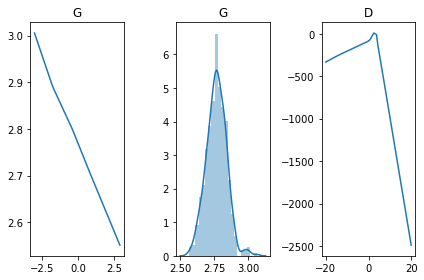

[Epoch 19604/50000] [D loss: 2.456060] [G loss: -1.523439]
[Epoch 19608/50000] [D loss: 1.989299] [G loss: -1.294230]
[Epoch 19612/50000] [D loss: 1.477754] [G loss: -0.951771]
[Epoch 19616/50000] [D loss: 0.730831] [G loss: -0.419158]
[Epoch 19620/50000] [D loss: -0.173665] [G loss: -0.347928]
[Epoch 19624/50000] [D loss: -1.007255] [G loss: 0.570279]
[Epoch 19628/50000] [D loss: -1.853900] [G loss: 0.959583]
[Epoch 19632/50000] [D loss: -2.713559] [G loss: 1.474766]
[Epoch 19636/50000] [D loss: -3.534714] [G loss: 1.863532]
[Epoch 19640/50000] [D loss: -3.876744] [G loss: 2.007133]
[Epoch 19644/50000] [D loss: -4.052044] [G loss: 1.835029]
[Epoch 19648/50000] [D loss: -4.590613] [G loss: 1.903716]
[Epoch 19652/50000] [D loss: -4.446302] [G loss: 1.878669]
[Epoch 19656/50000] [D loss: -4.538941] [G loss: 1.779235]
[Epoch 19660/50000] [D loss: -3.592569] [G loss: 1.311941]
[Epoch 19664/50000] [D loss: -3.303532] [G loss: 0.849460]
[Epoch 19668/50000] [D loss: -2.962234] [G loss: 0.8099

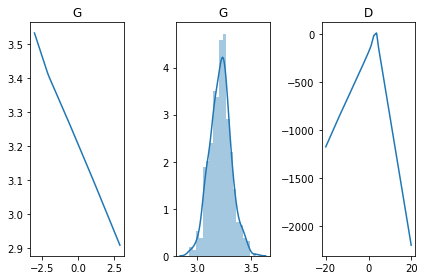

[Epoch 19704/50000] [D loss: 4.881633] [G loss: -0.428627]
[Epoch 19708/50000] [D loss: 4.251923] [G loss: -0.666419]
[Epoch 19712/50000] [D loss: 4.043795] [G loss: -0.612822]
[Epoch 19716/50000] [D loss: 3.442785] [G loss: -0.602986]
[Epoch 19720/50000] [D loss: 2.843907] [G loss: -0.521197]
[Epoch 19724/50000] [D loss: 2.026891] [G loss: -0.329435]
[Epoch 19728/50000] [D loss: 1.076887] [G loss: -0.169669]
[Epoch 19732/50000] [D loss: 0.183031] [G loss: -0.153183]
[Epoch 19736/50000] [D loss: -0.799262] [G loss: 0.587579]
[Epoch 19740/50000] [D loss: -1.645165] [G loss: 1.469551]
[Epoch 19744/50000] [D loss: -2.613362] [G loss: 2.000642]
[Epoch 19748/50000] [D loss: -3.468918] [G loss: 2.643234]
[Epoch 19752/50000] [D loss: -4.055989] [G loss: 2.960342]
[Epoch 19756/50000] [D loss: -4.520038] [G loss: 3.257133]
[Epoch 19760/50000] [D loss: -5.092569] [G loss: 3.630278]
[Epoch 19764/50000] [D loss: -5.102096] [G loss: 3.804209]
[Epoch 19768/50000] [D loss: -5.370319] [G loss: 3.73822

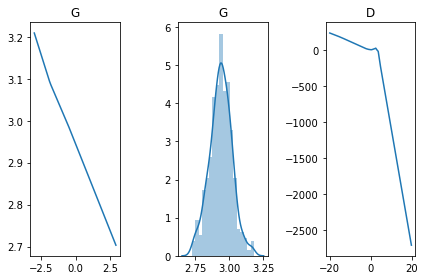

[Epoch 19804/50000] [D loss: 1.665312] [G loss: -1.480504]
[Epoch 19808/50000] [D loss: 2.559298] [G loss: -1.965386]
[Epoch 19812/50000] [D loss: 4.099969] [G loss: -2.669189]
[Epoch 19816/50000] [D loss: 4.598062] [G loss: -2.998809]
[Epoch 19820/50000] [D loss: 4.865658] [G loss: -3.185522]
[Epoch 19824/50000] [D loss: 5.385932] [G loss: -3.276255]
[Epoch 19828/50000] [D loss: 5.954565] [G loss: -3.602132]
[Epoch 19832/50000] [D loss: 5.329164] [G loss: -3.235279]
[Epoch 19836/50000] [D loss: 4.697416] [G loss: -2.655588]
[Epoch 19840/50000] [D loss: 3.412839] [G loss: -1.800999]
[Epoch 19844/50000] [D loss: 1.773682] [G loss: -0.550731]
[Epoch 19848/50000] [D loss: 0.335637] [G loss: 0.322699]
[Epoch 19852/50000] [D loss: -1.174946] [G loss: 0.962893]
[Epoch 19856/50000] [D loss: -2.474036] [G loss: 1.332536]
[Epoch 19860/50000] [D loss: -3.284498] [G loss: 1.521759]
[Epoch 19864/50000] [D loss: -4.211690] [G loss: 1.710648]
[Epoch 19868/50000] [D loss: -4.942794] [G loss: 1.945128

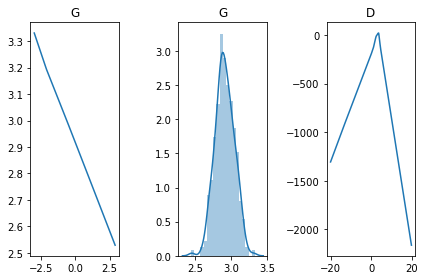

[Epoch 19904/50000] [D loss: -2.451195] [G loss: 0.621365]
[Epoch 19908/50000] [D loss: -0.858549] [G loss: 0.087030]
[Epoch 19912/50000] [D loss: -0.125895] [G loss: -0.186124]
[Epoch 19916/50000] [D loss: 0.895397] [G loss: -0.294627]
[Epoch 19920/50000] [D loss: 1.819667] [G loss: -0.807200]
[Epoch 19924/50000] [D loss: 3.282454] [G loss: -1.129259]
[Epoch 19928/50000] [D loss: 3.866134] [G loss: -1.188699]
[Epoch 19932/50000] [D loss: 5.038544] [G loss: -1.443057]
[Epoch 19936/50000] [D loss: 5.836533] [G loss: -1.454347]
[Epoch 19940/50000] [D loss: 5.763784] [G loss: -1.260702]
[Epoch 19944/50000] [D loss: 5.432951] [G loss: -0.724231]
[Epoch 19948/50000] [D loss: 5.039542] [G loss: -0.233968]
[Epoch 19952/50000] [D loss: 4.481800] [G loss: -0.282511]
[Epoch 19956/50000] [D loss: 3.084518] [G loss: -0.174985]
[Epoch 19960/50000] [D loss: 2.228056] [G loss: -0.193126]
[Epoch 19964/50000] [D loss: 1.085866] [G loss: -0.059606]
[Epoch 19968/50000] [D loss: -0.087790] [G loss: 1.3422

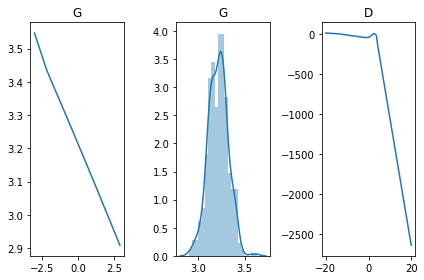

[Epoch 20004/50000] [D loss: -5.028379] [G loss: 4.012664]
[Epoch 20008/50000] [D loss: -5.370951] [G loss: 3.748277]
[Epoch 20012/50000] [D loss: -4.874437] [G loss: 3.617547]
[Epoch 20016/50000] [D loss: -3.988287] [G loss: 2.698861]
[Epoch 20020/50000] [D loss: -2.151597] [G loss: 1.791162]
[Epoch 20024/50000] [D loss: -1.331217] [G loss: 1.173105]
[Epoch 20028/50000] [D loss: -0.635285] [G loss: 0.596485]
[Epoch 20032/50000] [D loss: 0.988737] [G loss: -0.454808]
[Epoch 20036/50000] [D loss: 2.094191] [G loss: -1.318266]
[Epoch 20040/50000] [D loss: 3.184103] [G loss: -1.950004]
[Epoch 20044/50000] [D loss: 3.391409] [G loss: -2.501247]
[Epoch 20048/50000] [D loss: 4.749582] [G loss: -3.052570]
[Epoch 20052/50000] [D loss: 4.425968] [G loss: -2.968223]
[Epoch 20056/50000] [D loss: 5.658712] [G loss: -3.647269]
[Epoch 20060/50000] [D loss: 5.351555] [G loss: -3.545827]
[Epoch 20064/50000] [D loss: 4.973981] [G loss: -3.167359]
[Epoch 20068/50000] [D loss: 5.067678] [G loss: -3.17286

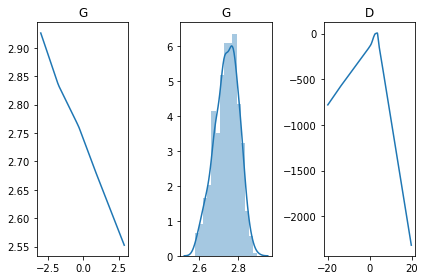

[Epoch 20104/50000] [D loss: -4.110165] [G loss: 1.750255]
[Epoch 20108/50000] [D loss: -4.473656] [G loss: 1.777230]
[Epoch 20112/50000] [D loss: -4.931295] [G loss: 1.810245]
[Epoch 20116/50000] [D loss: -4.739903] [G loss: 1.830463]
[Epoch 20120/50000] [D loss: -4.655436] [G loss: 1.742370]
[Epoch 20124/50000] [D loss: -4.631644] [G loss: 1.451586]
[Epoch 20128/50000] [D loss: -3.956471] [G loss: 1.385895]
[Epoch 20132/50000] [D loss: -3.664884] [G loss: 1.331931]
[Epoch 20136/50000] [D loss: -2.353007] [G loss: 0.956637]
[Epoch 20140/50000] [D loss: -1.641809] [G loss: 0.620910]
[Epoch 20144/50000] [D loss: -0.713099] [G loss: 0.338501]
[Epoch 20148/50000] [D loss: -0.001184] [G loss: -0.115986]
[Epoch 20152/50000] [D loss: 1.433733] [G loss: -0.411972]
[Epoch 20156/50000] [D loss: 1.674217] [G loss: -0.695150]
[Epoch 20160/50000] [D loss: 2.426672] [G loss: -0.717532]
[Epoch 20164/50000] [D loss: 3.094597] [G loss: -0.929988]
[Epoch 20168/50000] [D loss: 3.808031] [G loss: -1.1468

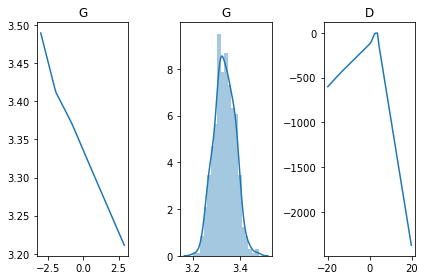

[Epoch 20204/50000] [D loss: 0.046541] [G loss: 0.953863]
[Epoch 20208/50000] [D loss: -1.262118] [G loss: 1.773270]
[Epoch 20212/50000] [D loss: -2.417395] [G loss: 2.429543]
[Epoch 20216/50000] [D loss: -3.489979] [G loss: 3.083249]
[Epoch 20220/50000] [D loss: -4.207467] [G loss: 3.470494]
[Epoch 20224/50000] [D loss: -5.071172] [G loss: 3.932933]
[Epoch 20228/50000] [D loss: -5.286048] [G loss: 4.189896]
[Epoch 20232/50000] [D loss: -5.416523] [G loss: 4.183907]
[Epoch 20236/50000] [D loss: -5.647004] [G loss: 4.024235]
[Epoch 20240/50000] [D loss: -5.204473] [G loss: 4.037297]
[Epoch 20244/50000] [D loss: -5.079574] [G loss: 3.537192]
[Epoch 20248/50000] [D loss: -4.170079] [G loss: 3.094790]
[Epoch 20252/50000] [D loss: -3.220200] [G loss: 2.361575]
[Epoch 20256/50000] [D loss: -1.980450] [G loss: 1.552698]
[Epoch 20260/50000] [D loss: -0.936722] [G loss: 0.782167]
[Epoch 20264/50000] [D loss: 0.273846] [G loss: -0.042512]
[Epoch 20268/50000] [D loss: 1.530429] [G loss: -0.948784

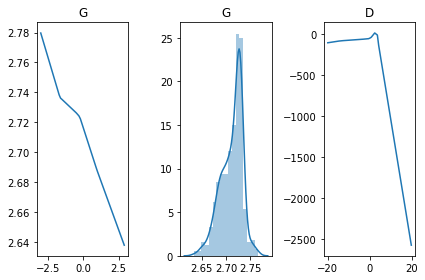

[Epoch 20304/50000] [D loss: 5.125811] [G loss: -3.130306]
[Epoch 20308/50000] [D loss: 4.285447] [G loss: -2.644368]
[Epoch 20312/50000] [D loss: 2.429832] [G loss: -1.133098]
[Epoch 20316/50000] [D loss: 0.760684] [G loss: 0.368845]
[Epoch 20320/50000] [D loss: -0.699324] [G loss: 0.845429]
[Epoch 20324/50000] [D loss: -1.918031] [G loss: 1.157101]
[Epoch 20328/50000] [D loss: -3.002549] [G loss: 1.479722]
[Epoch 20332/50000] [D loss: -4.021461] [G loss: 1.803455]
[Epoch 20336/50000] [D loss: -4.558506] [G loss: 1.881284]
[Epoch 20340/50000] [D loss: -4.807074] [G loss: 2.028544]
[Epoch 20344/50000] [D loss: -5.360332] [G loss: 2.040237]
[Epoch 20348/50000] [D loss: -5.933470] [G loss: 2.190361]
[Epoch 20352/50000] [D loss: -5.217448] [G loss: 2.138656]
[Epoch 20356/50000] [D loss: -5.101292] [G loss: 1.877291]
[Epoch 20360/50000] [D loss: -5.067507] [G loss: 1.851041]
[Epoch 20364/50000] [D loss: -4.579429] [G loss: 1.406820]
[Epoch 20368/50000] [D loss: -3.408363] [G loss: 1.054796

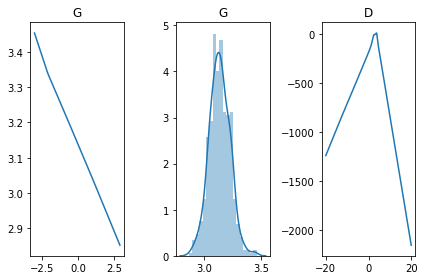

[Epoch 20404/50000] [D loss: 1.648333] [G loss: -0.691303]
[Epoch 20408/50000] [D loss: 2.012495] [G loss: -1.158952]
[Epoch 20412/50000] [D loss: 1.747171] [G loss: -0.848914]
[Epoch 20416/50000] [D loss: 1.417037] [G loss: -0.779791]
[Epoch 20420/50000] [D loss: 0.727303] [G loss: -0.683163]
[Epoch 20424/50000] [D loss: -0.292263] [G loss: -0.301712]
[Epoch 20428/50000] [D loss: -1.494385] [G loss: 0.028109]
[Epoch 20432/50000] [D loss: -3.202729] [G loss: 1.250231]
[Epoch 20436/50000] [D loss: -4.666423] [G loss: 1.735700]
[Epoch 20440/50000] [D loss: -6.007170] [G loss: 3.563246]
[Epoch 20444/50000] [D loss: -6.800373] [G loss: 4.890437]
[Epoch 20448/50000] [D loss: -6.534861] [G loss: 5.038377]
[Epoch 20452/50000] [D loss: -5.824809] [G loss: 4.597066]
[Epoch 20456/50000] [D loss: -4.279575] [G loss: 4.161991]
[Epoch 20460/50000] [D loss: -1.546870] [G loss: 2.957566]
[Epoch 20464/50000] [D loss: -0.399767] [G loss: 2.689864]
[Epoch 20468/50000] [D loss: 2.141755] [G loss: 2.53185

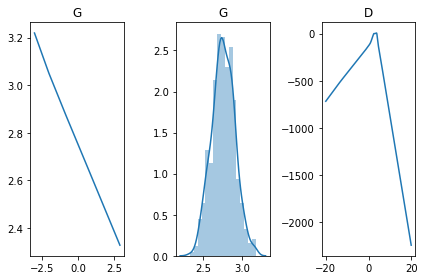

[Epoch 20504/50000] [D loss: -1.484201] [G loss: 0.431694]
[Epoch 20508/50000] [D loss: -2.378244] [G loss: 0.604808]
[Epoch 20512/50000] [D loss: -3.079544] [G loss: 0.780525]
[Epoch 20516/50000] [D loss: -4.188668] [G loss: 0.944863]
[Epoch 20520/50000] [D loss: -4.320481] [G loss: 0.722291]
[Epoch 20524/50000] [D loss: -5.341169] [G loss: 0.941372]
[Epoch 20528/50000] [D loss: -5.262617] [G loss: 0.878059]
[Epoch 20532/50000] [D loss: -4.811327] [G loss: 1.105780]
[Epoch 20536/50000] [D loss: -4.988245] [G loss: 1.223988]
[Epoch 20540/50000] [D loss: -3.774526] [G loss: 0.773387]
[Epoch 20544/50000] [D loss: -3.194227] [G loss: 0.435352]
[Epoch 20548/50000] [D loss: -2.047524] [G loss: 0.086226]
[Epoch 20552/50000] [D loss: -0.680070] [G loss: -0.169192]
[Epoch 20556/50000] [D loss: 0.808614] [G loss: -0.797592]
[Epoch 20560/50000] [D loss: 1.382990] [G loss: -1.248062]
[Epoch 20564/50000] [D loss: 2.536917] [G loss: -1.404212]
[Epoch 20568/50000] [D loss: 4.036589] [G loss: -1.5074

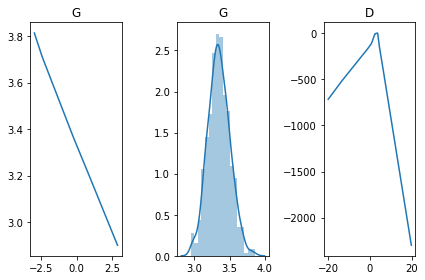

[Epoch 20604/50000] [D loss: 1.630802] [G loss: -0.174417]
[Epoch 20608/50000] [D loss: 0.596178] [G loss: 0.031350]
[Epoch 20612/50000] [D loss: -0.602395] [G loss: 1.185267]
[Epoch 20616/50000] [D loss: -1.759882] [G loss: 1.295411]
[Epoch 20620/50000] [D loss: -2.878471] [G loss: 1.993792]
[Epoch 20624/50000] [D loss: -3.952782] [G loss: 2.606003]
[Epoch 20628/50000] [D loss: -4.590933] [G loss: 3.122597]
[Epoch 20632/50000] [D loss: -5.877174] [G loss: 3.632858]
[Epoch 20636/50000] [D loss: -6.381868] [G loss: 3.889090]
[Epoch 20640/50000] [D loss: -6.517735] [G loss: 3.834527]
[Epoch 20644/50000] [D loss: -7.814653] [G loss: 3.740702]
[Epoch 20648/50000] [D loss: -7.502139] [G loss: 3.624327]
[Epoch 20652/50000] [D loss: -7.656448] [G loss: 2.666085]
[Epoch 20656/50000] [D loss: -6.484474] [G loss: 2.250919]
[Epoch 20660/50000] [D loss: -5.784679] [G loss: 1.898165]
[Epoch 20664/50000] [D loss: -4.102962] [G loss: 1.506305]
[Epoch 20668/50000] [D loss: -0.715871] [G loss: -0.19534

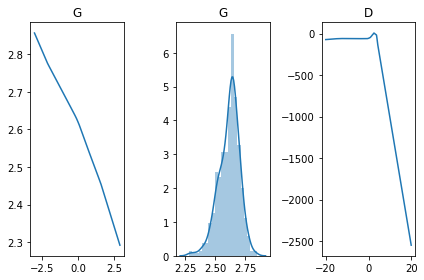

[Epoch 20704/50000] [D loss: 6.013576] [G loss: -2.845924]
[Epoch 20708/50000] [D loss: 2.998072] [G loss: -2.143966]
[Epoch 20712/50000] [D loss: -0.054075] [G loss: -0.667279]
[Epoch 20716/50000] [D loss: -4.591966] [G loss: 2.956972]
[Epoch 20720/50000] [D loss: -8.907036] [G loss: 6.026245]
[Epoch 20724/50000] [D loss: -9.485453] [G loss: 6.204273]
[Epoch 20728/50000] [D loss: -9.431634] [G loss: 6.216365]
[Epoch 20732/50000] [D loss: -9.524044] [G loss: 6.222542]
[Epoch 20736/50000] [D loss: -9.907189] [G loss: 5.982296]
[Epoch 20740/50000] [D loss: -7.508237] [G loss: 4.804540]
[Epoch 20744/50000] [D loss: -5.658130] [G loss: 3.233617]
[Epoch 20748/50000] [D loss: -2.845027] [G loss: 1.660865]
[Epoch 20752/50000] [D loss: -0.959715] [G loss: 0.414009]
[Epoch 20756/50000] [D loss: 2.700337] [G loss: -0.612577]
[Epoch 20760/50000] [D loss: 5.465588] [G loss: -1.821815]
[Epoch 20764/50000] [D loss: 7.775324] [G loss: -2.587642]
[Epoch 20768/50000] [D loss: 11.555401] [G loss: -3.494

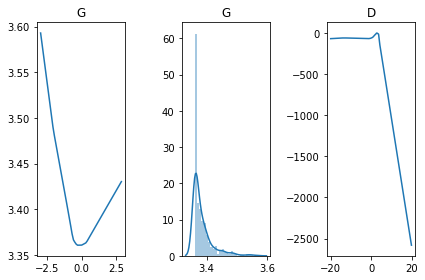

[Epoch 20804/50000] [D loss: -6.791217] [G loss: 5.708748]
[Epoch 20808/50000] [D loss: -7.474758] [G loss: 5.862689]
[Epoch 20812/50000] [D loss: -7.522344] [G loss: 5.901616]
[Epoch 20816/50000] [D loss: -6.814165] [G loss: 5.657956]
[Epoch 20820/50000] [D loss: -6.695083] [G loss: 4.787674]
[Epoch 20824/50000] [D loss: -5.872401] [G loss: 4.161390]
[Epoch 20828/50000] [D loss: -4.661862] [G loss: 3.287351]
[Epoch 20832/50000] [D loss: -2.959349] [G loss: 2.079747]
[Epoch 20836/50000] [D loss: -1.254167] [G loss: 1.370256]
[Epoch 20840/50000] [D loss: 0.395459] [G loss: -0.184540]
[Epoch 20844/50000] [D loss: 2.112565] [G loss: -1.267036]
[Epoch 20848/50000] [D loss: 3.090000] [G loss: -1.945752]
[Epoch 20852/50000] [D loss: 3.756843] [G loss: -2.482582]
[Epoch 20856/50000] [D loss: 5.504570] [G loss: -3.372591]
[Epoch 20860/50000] [D loss: 6.553850] [G loss: -4.151103]
[Epoch 20864/50000] [D loss: 7.038500] [G loss: -4.515469]
[Epoch 20868/50000] [D loss: 6.567161] [G loss: -4.44683

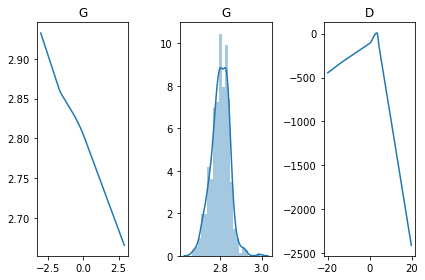

[Epoch 20904/50000] [D loss: -5.254213] [G loss: 2.476713]
[Epoch 20908/50000] [D loss: -4.855725] [G loss: 2.059444]
[Epoch 20912/50000] [D loss: -4.047138] [G loss: 1.894895]
[Epoch 20916/50000] [D loss: -3.654233] [G loss: 1.465345]
[Epoch 20920/50000] [D loss: -2.794680] [G loss: 1.066326]
[Epoch 20924/50000] [D loss: -1.075209] [G loss: 0.597014]
[Epoch 20928/50000] [D loss: -0.515830] [G loss: 0.398258]
[Epoch 20932/50000] [D loss: 1.034567] [G loss: 0.102950]
[Epoch 20936/50000] [D loss: 1.752252] [G loss: -0.390527]
[Epoch 20940/50000] [D loss: 3.278539] [G loss: -0.788490]
[Epoch 20944/50000] [D loss: 3.973667] [G loss: -1.212416]
[Epoch 20948/50000] [D loss: 5.243660] [G loss: -1.408841]
[Epoch 20952/50000] [D loss: 5.341608] [G loss: -1.583482]
[Epoch 20956/50000] [D loss: 5.829632] [G loss: -1.657444]
[Epoch 20960/50000] [D loss: 5.449035] [G loss: -1.714538]
[Epoch 20964/50000] [D loss: 4.906323] [G loss: -1.498518]
[Epoch 20968/50000] [D loss: 4.193427] [G loss: -1.123328

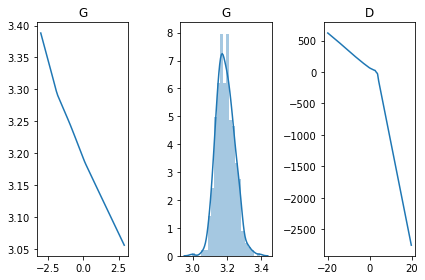

[Epoch 21004/50000] [D loss: -10.700993] [G loss: 6.824543]
[Epoch 21008/50000] [D loss: -9.375927] [G loss: 5.260410]
[Epoch 21012/50000] [D loss: -6.324607] [G loss: 3.044636]
[Epoch 21016/50000] [D loss: -1.572835] [G loss: 0.233172]
[Epoch 21020/50000] [D loss: 3.950036] [G loss: -1.281138]
[Epoch 21024/50000] [D loss: 8.246446] [G loss: -3.707635]
[Epoch 21028/50000] [D loss: 10.546041] [G loss: -5.395888]
[Epoch 21032/50000] [D loss: 13.267082] [G loss: -7.125791]
[Epoch 21036/50000] [D loss: 13.053001] [G loss: -6.849055]
[Epoch 21040/50000] [D loss: 10.989111] [G loss: -5.124484]
[Epoch 21044/50000] [D loss: 9.129455] [G loss: -4.003472]
[Epoch 21048/50000] [D loss: 6.216512] [G loss: -2.667189]
[Epoch 21052/50000] [D loss: 2.796837] [G loss: -0.928051]
[Epoch 21056/50000] [D loss: -1.161458] [G loss: 0.787788]
[Epoch 21060/50000] [D loss: -5.015804] [G loss: 1.987330]
[Epoch 21064/50000] [D loss: -9.074017] [G loss: 4.208867]
[Epoch 21068/50000] [D loss: -13.515990] [G loss: 7

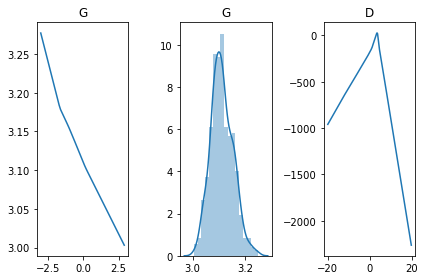

[Epoch 21104/50000] [D loss: 8.345243] [G loss: -3.424294]
[Epoch 21108/50000] [D loss: 12.163279] [G loss: -4.626279]
[Epoch 21112/50000] [D loss: 17.259394] [G loss: -5.665978]
[Epoch 21116/50000] [D loss: 19.690197] [G loss: -4.556562]
[Epoch 21120/50000] [D loss: 19.186300] [G loss: -2.815068]
[Epoch 21124/50000] [D loss: 14.924963] [G loss: -2.467829]
[Epoch 21128/50000] [D loss: 5.690583] [G loss: 2.208861]
[Epoch 21132/50000] [D loss: -2.021813] [G loss: 5.610576]
[Epoch 21136/50000] [D loss: -6.428552] [G loss: 8.026871]
[Epoch 21140/50000] [D loss: -9.778598] [G loss: 9.260401]
[Epoch 21144/50000] [D loss: -11.801402] [G loss: 10.092362]
[Epoch 21148/50000] [D loss: -12.918321] [G loss: 10.718430]
[Epoch 21152/50000] [D loss: -13.304103] [G loss: 10.498520]
[Epoch 21156/50000] [D loss: -12.686975] [G loss: 9.943192]
[Epoch 21160/50000] [D loss: -12.341859] [G loss: 9.119135]
[Epoch 21164/50000] [D loss: -10.112847] [G loss: 7.992106]
[Epoch 21168/50000] [D loss: -9.214176] [G 

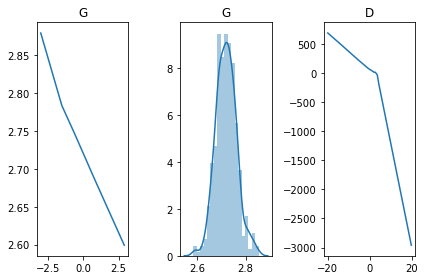

[Epoch 21204/50000] [D loss: 12.983337] [G loss: -8.173724]
[Epoch 21208/50000] [D loss: 11.607242] [G loss: -6.006375]
[Epoch 21212/50000] [D loss: 5.792637] [G loss: -0.073955]
[Epoch 21216/50000] [D loss: 0.610267] [G loss: 3.392814]
[Epoch 21220/50000] [D loss: -2.708111] [G loss: 4.077309]
[Epoch 21224/50000] [D loss: -5.272469] [G loss: 4.465693]
[Epoch 21228/50000] [D loss: -6.480738] [G loss: 4.523300]
[Epoch 21232/50000] [D loss: -8.028767] [G loss: 4.555960]
[Epoch 21236/50000] [D loss: -8.432925] [G loss: 4.708246]
[Epoch 21240/50000] [D loss: -7.929257] [G loss: 4.180891]
[Epoch 21244/50000] [D loss: -7.241344] [G loss: 3.748760]
[Epoch 21248/50000] [D loss: -6.712119] [G loss: 3.504953]
[Epoch 21252/50000] [D loss: -5.254269] [G loss: 2.449332]
[Epoch 21256/50000] [D loss: -2.930240] [G loss: 1.685644]
[Epoch 21260/50000] [D loss: -0.507140] [G loss: 0.755132]
[Epoch 21264/50000] [D loss: 1.435285] [G loss: -0.019300]
[Epoch 21268/50000] [D loss: 3.797163] [G loss: -1.1163

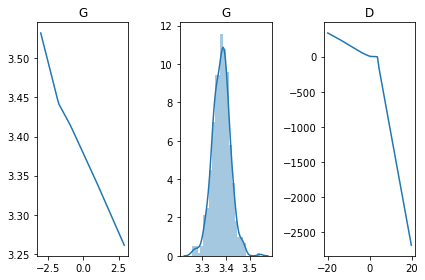

[Epoch 21304/50000] [D loss: -1.428852] [G loss: 2.340205]
[Epoch 21308/50000] [D loss: -4.104656] [G loss: 2.139017]
[Epoch 21312/50000] [D loss: -6.881416] [G loss: 3.668100]
[Epoch 21316/50000] [D loss: -9.180480] [G loss: 4.742991]
[Epoch 21320/50000] [D loss: -11.794224] [G loss: 5.156671]
[Epoch 21324/50000] [D loss: -14.279010] [G loss: 5.754251]
[Epoch 21328/50000] [D loss: -16.993677] [G loss: 6.680072]
[Epoch 21332/50000] [D loss: -16.632648] [G loss: 6.784896]
[Epoch 21336/50000] [D loss: -13.530601] [G loss: 7.203947]
[Epoch 21340/50000] [D loss: -8.547897] [G loss: 5.308043]
[Epoch 21344/50000] [D loss: -3.717726] [G loss: 1.827536]
[Epoch 21348/50000] [D loss: 1.867229] [G loss: -1.381634]
[Epoch 21352/50000] [D loss: 8.117078] [G loss: -4.415544]
[Epoch 21356/50000] [D loss: 13.464321] [G loss: -7.406357]
[Epoch 21360/50000] [D loss: 17.179474] [G loss: -9.203320]
[Epoch 21364/50000] [D loss: 16.229872] [G loss: -9.428386]
[Epoch 21368/50000] [D loss: 15.528070] [G loss:

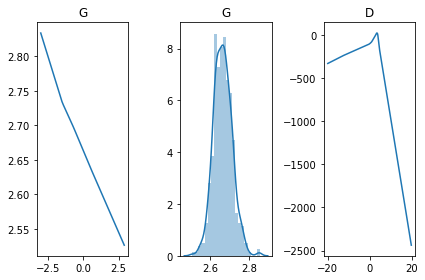

[Epoch 21404/50000] [D loss: -19.236948] [G loss: 9.778625]
[Epoch 21408/50000] [D loss: -17.219442] [G loss: 8.782118]
[Epoch 21412/50000] [D loss: -15.473869] [G loss: 7.140625]
[Epoch 21416/50000] [D loss: -13.443137] [G loss: 5.214338]
[Epoch 21420/50000] [D loss: -9.157860] [G loss: 2.618889]
[Epoch 21424/50000] [D loss: -4.622328] [G loss: 0.191584]
[Epoch 21428/50000] [D loss: 0.672630] [G loss: -1.452525]
[Epoch 21432/50000] [D loss: 5.909990] [G loss: -4.203285]
[Epoch 21436/50000] [D loss: 11.057869] [G loss: -6.013942]
[Epoch 21440/50000] [D loss: 14.152890] [G loss: -6.771840]
[Epoch 21444/50000] [D loss: 15.948521] [G loss: -5.976721]
[Epoch 21448/50000] [D loss: 13.955504] [G loss: -4.111584]
[Epoch 21452/50000] [D loss: 9.604785] [G loss: -3.369487]
[Epoch 21456/50000] [D loss: 2.817621] [G loss: 0.952080]
[Epoch 21460/50000] [D loss: -5.436080] [G loss: 5.935287]
[Epoch 21464/50000] [D loss: -13.504323] [G loss: 10.745731]
[Epoch 21468/50000] [D loss: -18.441833] [G los

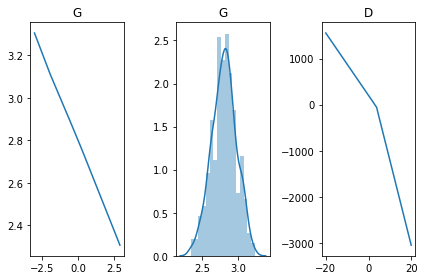

[Epoch 21504/50000] [D loss: 14.151184] [G loss: -4.081640]
[Epoch 21508/50000] [D loss: 15.310838] [G loss: -2.546470]
[Epoch 21512/50000] [D loss: 10.998935] [G loss: -0.041207]
[Epoch 21516/50000] [D loss: 2.394644] [G loss: 0.844530]
[Epoch 21520/50000] [D loss: -2.463972] [G loss: 3.810500]
[Epoch 21524/50000] [D loss: -6.102110] [G loss: 6.055224]
[Epoch 21528/50000] [D loss: -9.052280] [G loss: 7.183266]
[Epoch 21532/50000] [D loss: -11.341792] [G loss: 7.786405]
[Epoch 21536/50000] [D loss: -11.707918] [G loss: 7.415987]
[Epoch 21540/50000] [D loss: -11.931837] [G loss: 7.827602]
[Epoch 21544/50000] [D loss: -10.231775] [G loss: 6.463272]
[Epoch 21548/50000] [D loss: -9.936158] [G loss: 5.577830]
[Epoch 21552/50000] [D loss: -7.724872] [G loss: 3.991492]
[Epoch 21556/50000] [D loss: -4.559402] [G loss: 2.503364]
[Epoch 21560/50000] [D loss: -1.110713] [G loss: 0.638186]
[Epoch 21564/50000] [D loss: 1.939845] [G loss: -1.098082]
[Epoch 21568/50000] [D loss: 5.353489] [G loss: -1

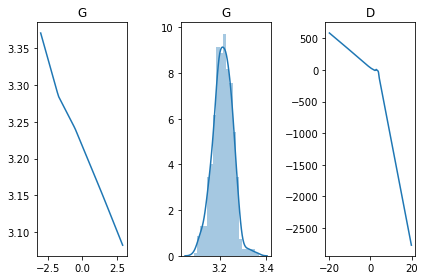

[Epoch 21604/50000] [D loss: -6.717089] [G loss: 4.844144]
[Epoch 21608/50000] [D loss: -5.397487] [G loss: 4.205635]
[Epoch 21612/50000] [D loss: -4.957182] [G loss: 3.368153]
[Epoch 21616/50000] [D loss: -3.917943] [G loss: 2.638805]
[Epoch 21620/50000] [D loss: -2.093631] [G loss: 1.572836]
[Epoch 21624/50000] [D loss: 0.252327] [G loss: 0.425384]
[Epoch 21628/50000] [D loss: 1.064893] [G loss: -0.384409]
[Epoch 21632/50000] [D loss: 3.343798] [G loss: -1.589588]
[Epoch 21636/50000] [D loss: 5.146262] [G loss: -2.476858]
[Epoch 21640/50000] [D loss: 6.009740] [G loss: -3.289145]
[Epoch 21644/50000] [D loss: 7.302342] [G loss: -3.652054]
[Epoch 21648/50000] [D loss: 7.408842] [G loss: -4.012523]
[Epoch 21652/50000] [D loss: 7.943485] [G loss: -3.939422]
[Epoch 21656/50000] [D loss: 7.391934] [G loss: -3.887979]
[Epoch 21660/50000] [D loss: 4.404180] [G loss: -1.563891]
[Epoch 21664/50000] [D loss: 0.969648] [G loss: 1.123584]
[Epoch 21668/50000] [D loss: -1.618335] [G loss: 1.833763]

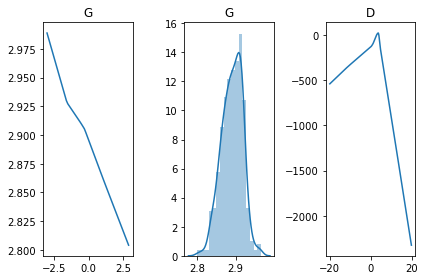

[Epoch 21704/50000] [D loss: -3.775257] [G loss: 1.698263]
[Epoch 21708/50000] [D loss: -2.752748] [G loss: 1.113257]
[Epoch 21712/50000] [D loss: -1.295697] [G loss: 0.411857]
[Epoch 21716/50000] [D loss: 0.674477] [G loss: -0.402143]
[Epoch 21720/50000] [D loss: 2.684739] [G loss: -0.999983]
[Epoch 21724/50000] [D loss: 3.931533] [G loss: -1.348551]
[Epoch 21728/50000] [D loss: 5.434032] [G loss: -2.019629]
[Epoch 21732/50000] [D loss: 6.414455] [G loss: -2.215298]
[Epoch 21736/50000] [D loss: 6.951567] [G loss: -2.580346]
[Epoch 21740/50000] [D loss: 8.267362] [G loss: -2.682293]
[Epoch 21744/50000] [D loss: 7.546359] [G loss: -2.542569]
[Epoch 21748/50000] [D loss: 6.968157] [G loss: -2.093195]
[Epoch 21752/50000] [D loss: 4.359078] [G loss: 0.604397]
[Epoch 21756/50000] [D loss: 0.635576] [G loss: 1.753707]
[Epoch 21760/50000] [D loss: -2.053101] [G loss: 3.105371]
[Epoch 21764/50000] [D loss: -4.254213] [G loss: 4.197441]
[Epoch 21768/50000] [D loss: -5.856896] [G loss: 4.711132]

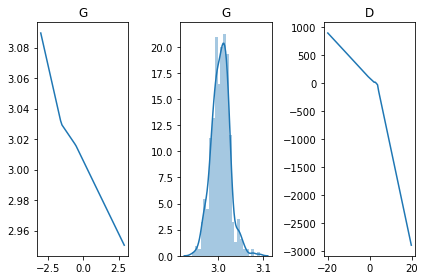

[Epoch 21804/50000] [D loss: 0.230452] [G loss: 0.127892]
[Epoch 21808/50000] [D loss: 2.864789] [G loss: -1.172348]
[Epoch 21812/50000] [D loss: 3.793154] [G loss: -1.942267]
[Epoch 21816/50000] [D loss: 5.080543] [G loss: -2.716160]
[Epoch 21820/50000] [D loss: 7.150319] [G loss: -3.534998]
[Epoch 21824/50000] [D loss: 7.390151] [G loss: -3.922555]
[Epoch 21828/50000] [D loss: 8.610464] [G loss: -4.408609]
[Epoch 21832/50000] [D loss: 8.519464] [G loss: -4.323101]
[Epoch 21836/50000] [D loss: 7.067998] [G loss: -3.833820]
[Epoch 21840/50000] [D loss: 4.085118] [G loss: -1.262195]
[Epoch 21844/50000] [D loss: 1.065300] [G loss: 0.583245]
[Epoch 21848/50000] [D loss: -1.109983] [G loss: 1.554063]
[Epoch 21852/50000] [D loss: -2.975979] [G loss: 1.923099]
[Epoch 21856/50000] [D loss: -4.384946] [G loss: 2.375022]
[Epoch 21860/50000] [D loss: -5.455048] [G loss: 2.873470]
[Epoch 21864/50000] [D loss: -6.438118] [G loss: 3.021704]
[Epoch 21868/50000] [D loss: -7.103827] [G loss: 3.190016]

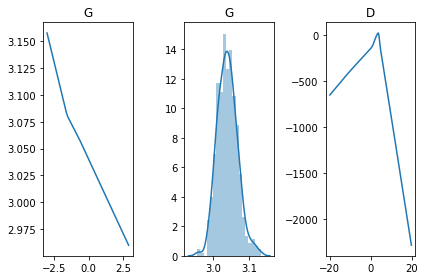

[Epoch 21904/50000] [D loss: 1.660172] [G loss: -0.694285]
[Epoch 21908/50000] [D loss: 3.938583] [G loss: -1.366161]
[Epoch 21912/50000] [D loss: 5.569632] [G loss: -1.733279]
[Epoch 21916/50000] [D loss: 6.502594] [G loss: -2.154751]
[Epoch 21920/50000] [D loss: 7.702884] [G loss: -2.597201]
[Epoch 21924/50000] [D loss: 8.172295] [G loss: -2.755211]
[Epoch 21928/50000] [D loss: 8.426764] [G loss: -2.708873]
[Epoch 21932/50000] [D loss: 7.835697] [G loss: -2.425192]
[Epoch 21936/50000] [D loss: 5.553006] [G loss: -0.075207]
[Epoch 21940/50000] [D loss: 2.003674] [G loss: 0.636681]
[Epoch 21944/50000] [D loss: -1.138701] [G loss: 2.580066]
[Epoch 21948/50000] [D loss: -3.480217] [G loss: 3.876098]
[Epoch 21952/50000] [D loss: -5.410460] [G loss: 4.481657]
[Epoch 21956/50000] [D loss: -6.633281] [G loss: 5.312931]
[Epoch 21960/50000] [D loss: -7.874011] [G loss: 5.464206]
[Epoch 21964/50000] [D loss: -8.094303] [G loss: 5.867572]
[Epoch 21968/50000] [D loss: -7.775754] [G loss: 5.707904

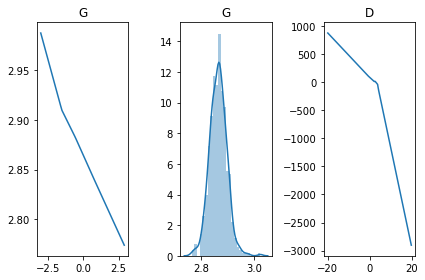

[Epoch 22004/50000] [D loss: 5.791730] [G loss: -3.007594]
[Epoch 22008/50000] [D loss: 7.365710] [G loss: -3.796021]
[Epoch 22012/50000] [D loss: 8.077577] [G loss: -4.109582]
[Epoch 22016/50000] [D loss: 9.183908] [G loss: -4.700665]
[Epoch 22020/50000] [D loss: 8.534596] [G loss: -4.702242]
[Epoch 22024/50000] [D loss: 7.055404] [G loss: -3.520572]
[Epoch 22028/50000] [D loss: 3.920980] [G loss: -0.608752]
[Epoch 22032/50000] [D loss: 0.922859] [G loss: 0.494040]
[Epoch 22036/50000] [D loss: -1.125425] [G loss: 1.422288]
[Epoch 22040/50000] [D loss: -3.058642] [G loss: 1.976395]
[Epoch 22044/50000] [D loss: -4.314444] [G loss: 2.402724]
[Epoch 22048/50000] [D loss: -5.540388] [G loss: 2.810929]
[Epoch 22052/50000] [D loss: -6.664655] [G loss: 3.101003]
[Epoch 22056/50000] [D loss: -7.041897] [G loss: 3.357427]
[Epoch 22060/50000] [D loss: -6.667238] [G loss: 3.293620]
[Epoch 22064/50000] [D loss: -7.359400] [G loss: 3.258693]
[Epoch 22068/50000] [D loss: -6.879209] [G loss: 2.867939

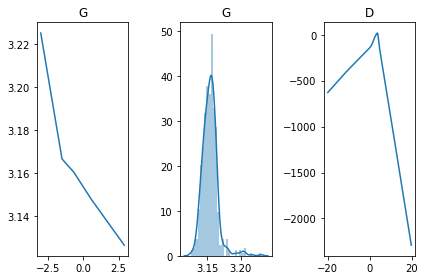

[Epoch 22104/50000] [D loss: 6.408222] [G loss: -2.286977]
[Epoch 22108/50000] [D loss: 7.034555] [G loss: -2.480424]
[Epoch 22112/50000] [D loss: 8.011620] [G loss: -2.742222]
[Epoch 22116/50000] [D loss: 8.713070] [G loss: -2.908896]
[Epoch 22120/50000] [D loss: 8.784728] [G loss: -2.756754]
[Epoch 22124/50000] [D loss: 7.235378] [G loss: -1.107126]
[Epoch 22128/50000] [D loss: 3.665946] [G loss: 0.638520]
[Epoch 22132/50000] [D loss: 0.397665] [G loss: 1.765402]
[Epoch 22136/50000] [D loss: -2.175663] [G loss: 3.366755]
[Epoch 22140/50000] [D loss: -4.433556] [G loss: 4.028525]
[Epoch 22144/50000] [D loss: -6.127856] [G loss: 5.043211]
[Epoch 22148/50000] [D loss: -7.842265] [G loss: 5.802227]
[Epoch 22152/50000] [D loss: -8.439977] [G loss: 6.066987]
[Epoch 22156/50000] [D loss: -8.205237] [G loss: 5.821797]
[Epoch 22160/50000] [D loss: -8.012620] [G loss: 5.454652]
[Epoch 22164/50000] [D loss: -7.249505] [G loss: 5.005123]
[Epoch 22168/50000] [D loss: -6.107961] [G loss: 4.240460]

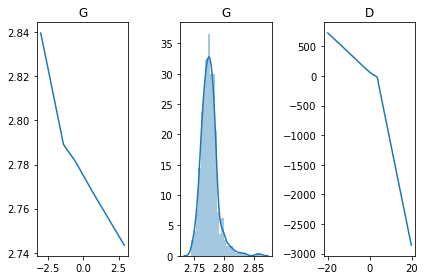

[Epoch 22204/50000] [D loss: 8.510617] [G loss: -4.528768]
[Epoch 22208/50000] [D loss: 8.973096] [G loss: -4.793660]
[Epoch 22212/50000] [D loss: 8.692884] [G loss: -4.785316]
[Epoch 22216/50000] [D loss: 6.463913] [G loss: -2.986257]
[Epoch 22220/50000] [D loss: 3.410909] [G loss: -0.219398]
[Epoch 22224/50000] [D loss: 0.546006] [G loss: 0.820867]
[Epoch 22228/50000] [D loss: -1.594787] [G loss: 1.462781]
[Epoch 22232/50000] [D loss: -3.279433] [G loss: 2.048045]
[Epoch 22236/50000] [D loss: -4.516547] [G loss: 2.350559]
[Epoch 22240/50000] [D loss: -5.775053] [G loss: 2.940791]
[Epoch 22244/50000] [D loss: -6.178893] [G loss: 3.114097]
[Epoch 22248/50000] [D loss: -6.962213] [G loss: 3.237633]
[Epoch 22252/50000] [D loss: -7.137326] [G loss: 3.300121]
[Epoch 22256/50000] [D loss: -7.043566] [G loss: 3.013198]
[Epoch 22260/50000] [D loss: -6.807133] [G loss: 2.756757]
[Epoch 22264/50000] [D loss: -5.652667] [G loss: 2.469342]
[Epoch 22268/50000] [D loss: -4.683939] [G loss: 1.927664

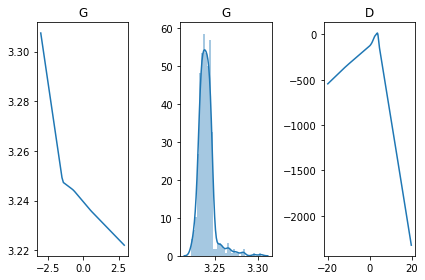

[Epoch 22304/50000] [D loss: 8.541280] [G loss: -3.146743]
[Epoch 22308/50000] [D loss: 8.398148] [G loss: -3.150519]
[Epoch 22312/50000] [D loss: 7.702124] [G loss: -3.619962]
[Epoch 22316/50000] [D loss: 0.619940] [G loss: -3.301316]
[Epoch 22320/50000] [D loss: -3.558430] [G loss: 7.570159]
[Epoch 22324/50000] [D loss: -6.529478] [G loss: 7.126499]
[Epoch 22328/50000] [D loss: -8.014927] [G loss: 2.949015]
[Epoch 22332/50000] [D loss: -9.393106] [G loss: 8.921502]
[Epoch 22336/50000] [D loss: -9.491911] [G loss: 8.362535]
[Epoch 22340/50000] [D loss: -8.414778] [G loss: 7.540136]
[Epoch 22344/50000] [D loss: -7.201550] [G loss: 7.698300]
[Epoch 22348/50000] [D loss: -6.375281] [G loss: 4.076512]
[Epoch 22352/50000] [D loss: -3.769150] [G loss: 3.794445]
[Epoch 22356/50000] [D loss: -1.534927] [G loss: 1.967766]
[Epoch 22360/50000] [D loss: -0.195400] [G loss: -1.309646]
[Epoch 22364/50000] [D loss: 1.120895] [G loss: -0.699433]
[Epoch 22368/50000] [D loss: 1.879994] [G loss: -1.3784

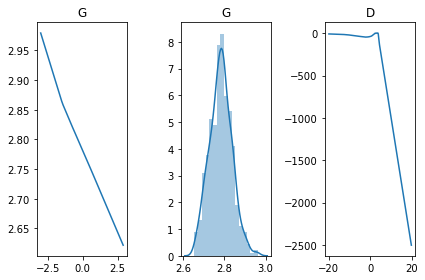

[Epoch 22404/50000] [D loss: -3.188841] [G loss: 1.816677]
[Epoch 22408/50000] [D loss: -3.642853] [G loss: 1.781876]
[Epoch 22412/50000] [D loss: -3.818213] [G loss: 1.736053]
[Epoch 22416/50000] [D loss: -3.733136] [G loss: 1.655435]
[Epoch 22420/50000] [D loss: -3.918918] [G loss: 1.678066]
[Epoch 22424/50000] [D loss: -3.825262] [G loss: 1.449129]
[Epoch 22428/50000] [D loss: -3.197062] [G loss: 1.032132]
[Epoch 22432/50000] [D loss: -2.671378] [G loss: 0.852664]
[Epoch 22436/50000] [D loss: -1.983262] [G loss: 0.152170]
[Epoch 22440/50000] [D loss: -1.168669] [G loss: -0.502770]
[Epoch 22444/50000] [D loss: -0.657519] [G loss: -0.791036]
[Epoch 22448/50000] [D loss: 0.266272] [G loss: -2.029060]
[Epoch 22452/50000] [D loss: 0.498644] [G loss: -1.281202]
[Epoch 22456/50000] [D loss: 0.635027] [G loss: -1.017941]
[Epoch 22460/50000] [D loss: 0.625008] [G loss: -0.700668]
[Epoch 22464/50000] [D loss: 0.491499] [G loss: -0.287897]
[Epoch 22468/50000] [D loss: 0.095140] [G loss: -0.109

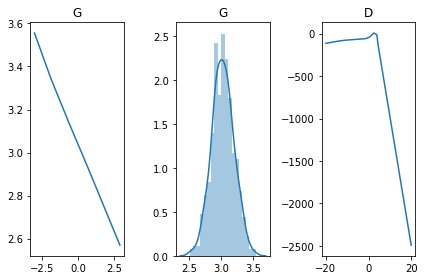

[Epoch 22504/50000] [D loss: -0.352876] [G loss: 1.009132]
[Epoch 22508/50000] [D loss: -0.352784] [G loss: 0.637710]
[Epoch 22512/50000] [D loss: -0.046406] [G loss: 0.352921]
[Epoch 22516/50000] [D loss: 0.475137] [G loss: 0.247340]
[Epoch 22520/50000] [D loss: 0.306501] [G loss: -0.056871]
[Epoch 22524/50000] [D loss: 0.431422] [G loss: -0.110037]
[Epoch 22528/50000] [D loss: 0.277283] [G loss: -0.327908]
[Epoch 22532/50000] [D loss: 0.075111] [G loss: -0.158099]
[Epoch 22536/50000] [D loss: 0.199419] [G loss: -0.302340]
[Epoch 22540/50000] [D loss: 0.218649] [G loss: -0.312923]
[Epoch 22544/50000] [D loss: 0.001824] [G loss: -0.650619]
[Epoch 22548/50000] [D loss: 0.079142] [G loss: -0.381327]
[Epoch 22552/50000] [D loss: -0.065901] [G loss: -0.852146]
[Epoch 22556/50000] [D loss: -0.183624] [G loss: -0.061069]
[Epoch 22560/50000] [D loss: -0.399223] [G loss: 0.078901]
[Epoch 22564/50000] [D loss: -0.595283] [G loss: 0.197198]
[Epoch 22568/50000] [D loss: -0.758799] [G loss: 0.2703

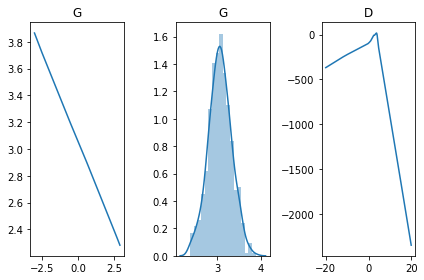

[Epoch 22604/50000] [D loss: 2.238041] [G loss: -0.980443]
[Epoch 22608/50000] [D loss: 2.856186] [G loss: -0.779089]
[Epoch 22612/50000] [D loss: 2.249862] [G loss: 0.080729]
[Epoch 22616/50000] [D loss: 2.881356] [G loss: -0.130309]
[Epoch 22620/50000] [D loss: 2.505678] [G loss: 0.004498]
[Epoch 22624/50000] [D loss: 2.402482] [G loss: 0.194256]
[Epoch 22628/50000] [D loss: 1.667541] [G loss: 0.508175]
[Epoch 22632/50000] [D loss: -0.208325] [G loss: -0.746201]
[Epoch 22636/50000] [D loss: -2.429150] [G loss: 0.094725]
[Epoch 22640/50000] [D loss: -4.105239] [G loss: 2.240645]
[Epoch 22644/50000] [D loss: -4.375790] [G loss: 3.375081]
[Epoch 22648/50000] [D loss: -4.338816] [G loss: 3.645233]
[Epoch 22652/50000] [D loss: -4.126843] [G loss: 3.234052]
[Epoch 22656/50000] [D loss: -2.792670] [G loss: 2.016070]
[Epoch 22660/50000] [D loss: -2.100040] [G loss: 1.453849]
[Epoch 22664/50000] [D loss: -0.665326] [G loss: 0.812541]
[Epoch 22668/50000] [D loss: 0.664302] [G loss: -0.055343]


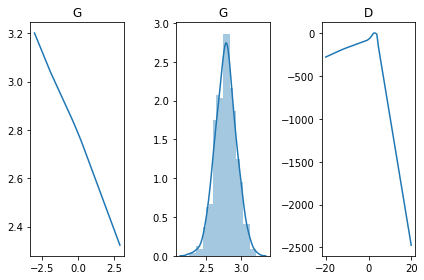

[Epoch 22704/50000] [D loss: -0.326691] [G loss: 0.204796]
[Epoch 22708/50000] [D loss: -0.960840] [G loss: 0.524481]
[Epoch 22712/50000] [D loss: -1.758584] [G loss: 0.708994]
[Epoch 22716/50000] [D loss: -2.402372] [G loss: 1.218068]
[Epoch 22720/50000] [D loss: -2.825145] [G loss: 1.312982]
[Epoch 22724/50000] [D loss: -3.375242] [G loss: 1.360960]
[Epoch 22728/50000] [D loss: -3.318634] [G loss: 1.477771]
[Epoch 22732/50000] [D loss: -3.209063] [G loss: 1.496195]
[Epoch 22736/50000] [D loss: -3.399253] [G loss: 1.144150]
[Epoch 22740/50000] [D loss: -3.168860] [G loss: 1.393708]
[Epoch 22744/50000] [D loss: -2.045879] [G loss: 0.929152]
[Epoch 22748/50000] [D loss: -0.693149] [G loss: 0.390669]
[Epoch 22752/50000] [D loss: -0.850911] [G loss: 0.335575]
[Epoch 22756/50000] [D loss: 0.992535] [G loss: -0.252454]
[Epoch 22760/50000] [D loss: 1.163472] [G loss: -0.203925]
[Epoch 22764/50000] [D loss: 1.883223] [G loss: -0.410760]
[Epoch 22768/50000] [D loss: 2.697316] [G loss: -0.35099

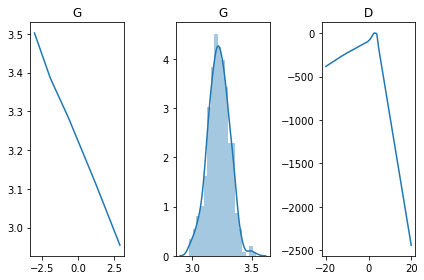

[Epoch 22804/50000] [D loss: -1.146105] [G loss: 2.182792]
[Epoch 22808/50000] [D loss: -2.284494] [G loss: 3.613183]
[Epoch 22812/50000] [D loss: -2.991763] [G loss: 3.618710]
[Epoch 22816/50000] [D loss: -3.165552] [G loss: 3.301730]
[Epoch 22820/50000] [D loss: -3.059398] [G loss: 3.210811]
[Epoch 22824/50000] [D loss: -2.806804] [G loss: 3.001990]
[Epoch 22828/50000] [D loss: -2.309595] [G loss: 2.271061]
[Epoch 22832/50000] [D loss: -1.272321] [G loss: 1.768327]
[Epoch 22836/50000] [D loss: 0.065051] [G loss: 0.910721]
[Epoch 22840/50000] [D loss: 0.996593] [G loss: 0.069319]
[Epoch 22844/50000] [D loss: 2.623800] [G loss: -0.886051]
[Epoch 22848/50000] [D loss: 3.386255] [G loss: -1.456144]
[Epoch 22852/50000] [D loss: 3.784807] [G loss: -1.970424]
[Epoch 22856/50000] [D loss: 4.581240] [G loss: -2.340782]
[Epoch 22860/50000] [D loss: 4.906125] [G loss: -2.765718]
[Epoch 22864/50000] [D loss: 4.939020] [G loss: -2.751276]
[Epoch 22868/50000] [D loss: 4.106532] [G loss: -2.018582]

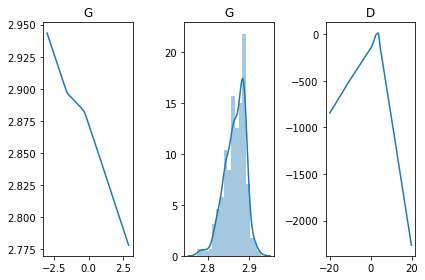

[Epoch 22904/50000] [D loss: -3.123407] [G loss: 1.339163]
[Epoch 22908/50000] [D loss: -2.877716] [G loss: 1.258916]
[Epoch 22912/50000] [D loss: -2.099394] [G loss: 1.034216]
[Epoch 22916/50000] [D loss: -1.055969] [G loss: 0.582419]
[Epoch 22920/50000] [D loss: -0.465449] [G loss: 0.258156]
[Epoch 22924/50000] [D loss: 0.921825] [G loss: -0.124569]
[Epoch 22928/50000] [D loss: 2.001360] [G loss: -0.405832]
[Epoch 22932/50000] [D loss: 2.482774] [G loss: -0.732533]
[Epoch 22936/50000] [D loss: 3.623398] [G loss: -0.911122]
[Epoch 22940/50000] [D loss: 3.756576] [G loss: -1.127353]
[Epoch 22944/50000] [D loss: 4.200690] [G loss: -1.192536]
[Epoch 22948/50000] [D loss: 4.411245] [G loss: -1.331867]
[Epoch 22952/50000] [D loss: 4.379293] [G loss: -1.337373]
[Epoch 22956/50000] [D loss: 3.892396] [G loss: -1.106502]
[Epoch 22960/50000] [D loss: 2.922442] [G loss: -0.900079]
[Epoch 22964/50000] [D loss: 2.175596] [G loss: -0.595345]
[Epoch 22968/50000] [D loss: 0.906063] [G loss: -0.29455

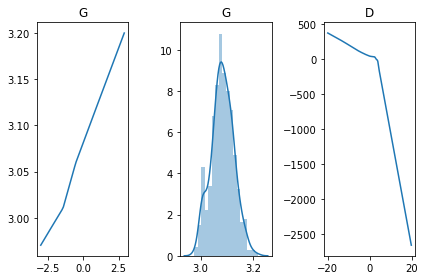

[Epoch 23004/50000] [D loss: -4.847488] [G loss: 4.614050]
[Epoch 23008/50000] [D loss: -1.757424] [G loss: 2.640841]
[Epoch 23012/50000] [D loss: -0.613271] [G loss: 0.564232]
[Epoch 23016/50000] [D loss: 1.952258] [G loss: -1.283503]
[Epoch 23020/50000] [D loss: 2.646480] [G loss: -1.191915]
[Epoch 23024/50000] [D loss: 2.788441] [G loss: -1.322070]
[Epoch 23028/50000] [D loss: 2.384245] [G loss: -0.670123]
[Epoch 23032/50000] [D loss: 1.292228] [G loss: -0.524255]
[Epoch 23036/50000] [D loss: 0.117603] [G loss: 0.431883]
[Epoch 23040/50000] [D loss: -0.844940] [G loss: 1.044222]
[Epoch 23044/50000] [D loss: -1.747144] [G loss: 1.295575]
[Epoch 23048/50000] [D loss: -2.423103] [G loss: 1.578041]
[Epoch 23052/50000] [D loss: -3.236655] [G loss: 1.844642]
[Epoch 23056/50000] [D loss: -3.241146] [G loss: 1.913064]
[Epoch 23060/50000] [D loss: -2.792494] [G loss: 1.495881]
[Epoch 23064/50000] [D loss: -2.590784] [G loss: 1.231578]
[Epoch 23068/50000] [D loss: -2.672179] [G loss: 1.309327

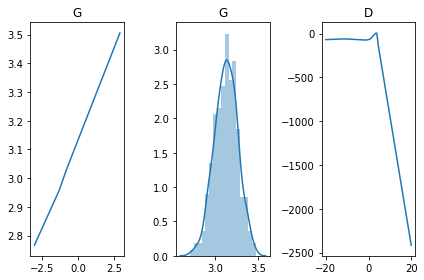

[Epoch 23104/50000] [D loss: 3.295598] [G loss: -0.635393]
[Epoch 23108/50000] [D loss: 3.021821] [G loss: -0.472494]
[Epoch 23112/50000] [D loss: 2.898548] [G loss: -0.156592]
[Epoch 23116/50000] [D loss: 2.318472] [G loss: 0.269073]
[Epoch 23120/50000] [D loss: 1.511313] [G loss: 0.333439]
[Epoch 23124/50000] [D loss: 0.504737] [G loss: 0.798654]
[Epoch 23128/50000] [D loss: -0.507079] [G loss: 1.412721]
[Epoch 23132/50000] [D loss: -1.118762] [G loss: 1.545988]
[Epoch 23136/50000] [D loss: -1.739914] [G loss: 1.748731]
[Epoch 23140/50000] [D loss: -1.906508] [G loss: 1.883117]
[Epoch 23144/50000] [D loss: -2.020846] [G loss: 1.712158]
[Epoch 23148/50000] [D loss: -2.117898] [G loss: 1.758485]
[Epoch 23152/50000] [D loss: -1.942114] [G loss: 1.859825]
[Epoch 23156/50000] [D loss: -1.720399] [G loss: 1.386165]
[Epoch 23160/50000] [D loss: -1.270750] [G loss: 1.219046]
[Epoch 23164/50000] [D loss: -0.473460] [G loss: 0.565448]
[Epoch 23168/50000] [D loss: -0.106360] [G loss: 0.526001]


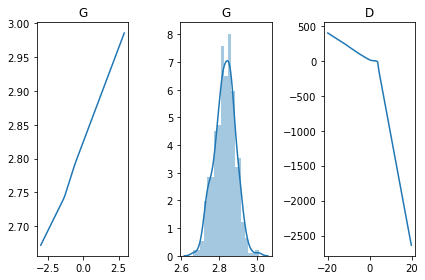

[Epoch 23204/50000] [D loss: 2.696681] [G loss: -1.442329]
[Epoch 23208/50000] [D loss: 2.355106] [G loss: -1.155924]
[Epoch 23212/50000] [D loss: 1.982968] [G loss: -0.989549]
[Epoch 23216/50000] [D loss: 1.230522] [G loss: -0.602194]
[Epoch 23220/50000] [D loss: 0.564095] [G loss: -0.126876]
[Epoch 23224/50000] [D loss: -0.019798] [G loss: -0.006634]
[Epoch 23228/50000] [D loss: -0.644304] [G loss: 0.528234]
[Epoch 23232/50000] [D loss: -1.195352] [G loss: 0.648413]
[Epoch 23236/50000] [D loss: -1.697056] [G loss: 0.857844]
[Epoch 23240/50000] [D loss: -2.141972] [G loss: 0.995863]
[Epoch 23244/50000] [D loss: -2.471694] [G loss: 1.232117]
[Epoch 23248/50000] [D loss: -2.808707] [G loss: 1.313611]
[Epoch 23252/50000] [D loss: -3.064099] [G loss: 1.415496]
[Epoch 23256/50000] [D loss: -2.951888] [G loss: 1.311267]
[Epoch 23260/50000] [D loss: -2.877785] [G loss: 1.375548]
[Epoch 23264/50000] [D loss: -2.413826] [G loss: 1.245975]
[Epoch 23268/50000] [D loss: -1.965143] [G loss: 1.0920

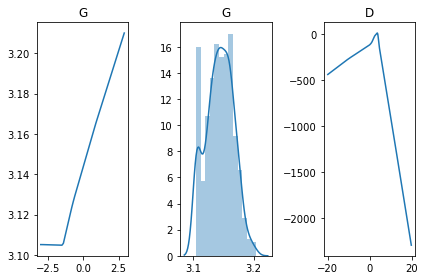

[Epoch 23304/50000] [D loss: 3.280639] [G loss: -0.970160]
[Epoch 23308/50000] [D loss: 3.308251] [G loss: -0.990792]
[Epoch 23312/50000] [D loss: 3.246312] [G loss: -0.964266]
[Epoch 23316/50000] [D loss: 2.940774] [G loss: -0.920168]
[Epoch 23320/50000] [D loss: 2.515213] [G loss: -0.754441]
[Epoch 23324/50000] [D loss: 1.745779] [G loss: -0.550793]
[Epoch 23328/50000] [D loss: 1.066633] [G loss: -0.345101]
[Epoch 23332/50000] [D loss: 0.072746] [G loss: 0.729682]
[Epoch 23336/50000] [D loss: -0.756634] [G loss: 0.657344]
[Epoch 23340/50000] [D loss: -1.612433] [G loss: 1.112787]
[Epoch 23344/50000] [D loss: -2.398891] [G loss: 1.535007]
[Epoch 23348/50000] [D loss: -3.087154] [G loss: 2.158046]
[Epoch 23352/50000] [D loss: -3.793793] [G loss: 2.393487]
[Epoch 23356/50000] [D loss: -4.267132] [G loss: 2.716371]
[Epoch 23360/50000] [D loss: -4.262926] [G loss: 2.814177]
[Epoch 23364/50000] [D loss: -4.439767] [G loss: 2.790350]
[Epoch 23368/50000] [D loss: -4.039487] [G loss: 2.562569

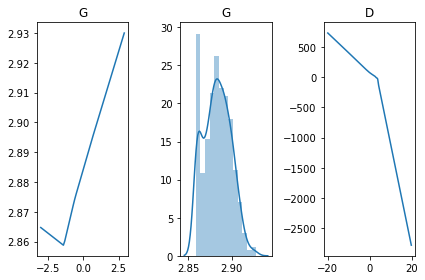

[Epoch 23404/50000] [D loss: 3.559058] [G loss: -1.928627]
[Epoch 23408/50000] [D loss: 4.161931] [G loss: -2.290365]
[Epoch 23412/50000] [D loss: 4.278342] [G loss: -2.397538]
[Epoch 23416/50000] [D loss: 4.318894] [G loss: -2.551176]
[Epoch 23420/50000] [D loss: 4.347242] [G loss: -2.375900]
[Epoch 23424/50000] [D loss: 3.635766] [G loss: -2.111289]
[Epoch 23428/50000] [D loss: 3.331995] [G loss: -1.741222]
[Epoch 23432/50000] [D loss: 2.189927] [G loss: -1.218873]
[Epoch 23436/50000] [D loss: 1.227050] [G loss: -0.715857]
[Epoch 23440/50000] [D loss: 0.127946] [G loss: 0.051231]
[Epoch 23444/50000] [D loss: -1.146123] [G loss: 0.505956]
[Epoch 23448/50000] [D loss: -2.421879] [G loss: 1.157205]
[Epoch 23452/50000] [D loss: -3.617469] [G loss: 1.623637]
[Epoch 23456/50000] [D loss: -4.493882] [G loss: 1.847310]
[Epoch 23460/50000] [D loss: -5.592334] [G loss: 2.212097]
[Epoch 23464/50000] [D loss: -5.873267] [G loss: 2.477869]
[Epoch 23468/50000] [D loss: -6.625083] [G loss: 2.639070

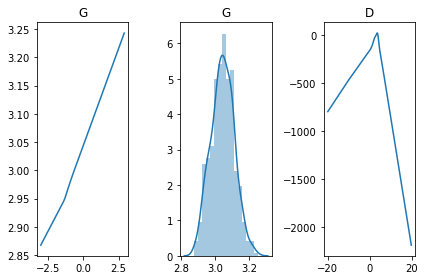

[Epoch 23504/50000] [D loss: 1.942066] [G loss: -0.522297]
[Epoch 23508/50000] [D loss: 3.239676] [G loss: -1.174901]
[Epoch 23512/50000] [D loss: 4.684004] [G loss: -1.414474]
[Epoch 23516/50000] [D loss: 5.727324] [G loss: -1.802911]
[Epoch 23520/50000] [D loss: 6.817322] [G loss: -1.961637]
[Epoch 23524/50000] [D loss: 7.041584] [G loss: -1.998590]
[Epoch 23528/50000] [D loss: 7.464788] [G loss: -2.055110]
[Epoch 23532/50000] [D loss: 7.206366] [G loss: -2.063967]
[Epoch 23536/50000] [D loss: 6.539565] [G loss: -1.946425]
[Epoch 23540/50000] [D loss: 4.680398] [G loss: -1.395558]
[Epoch 23544/50000] [D loss: 2.791802] [G loss: -0.999509]
[Epoch 23548/50000] [D loss: 0.292294] [G loss: -0.258794]
[Epoch 23552/50000] [D loss: -2.482171] [G loss: 2.015408]
[Epoch 23556/50000] [D loss: -5.198566] [G loss: 3.773450]
[Epoch 23560/50000] [D loss: -7.379850] [G loss: 5.159718]
[Epoch 23564/50000] [D loss: -9.848936] [G loss: 6.062411]
[Epoch 23568/50000] [D loss: -12.206646] [G loss: 7.0213

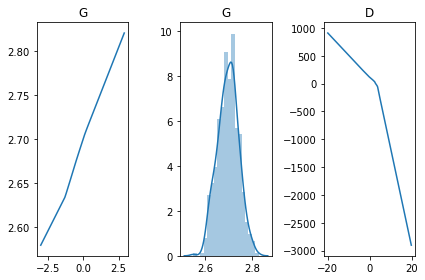

[Epoch 23604/50000] [D loss: 15.065905] [G loss: -6.884611]
[Epoch 23608/50000] [D loss: 14.204044] [G loss: -6.845255]
[Epoch 23612/50000] [D loss: 13.914433] [G loss: -6.715500]
[Epoch 23616/50000] [D loss: 10.937410] [G loss: -5.767161]
[Epoch 23620/50000] [D loss: 5.688410] [G loss: -2.340934]
[Epoch 23624/50000] [D loss: -0.391374] [G loss: 2.300976]
[Epoch 23628/50000] [D loss: -4.835582] [G loss: 4.798942]
[Epoch 23632/50000] [D loss: -8.430081] [G loss: 5.609227]
[Epoch 23636/50000] [D loss: -11.383047] [G loss: 6.365315]
[Epoch 23640/50000] [D loss: -13.185450] [G loss: 6.602765]
[Epoch 23644/50000] [D loss: -15.235739] [G loss: 6.742992]
[Epoch 23648/50000] [D loss: -16.028566] [G loss: 6.907969]
[Epoch 23652/50000] [D loss: -15.505347] [G loss: 6.506350]
[Epoch 23656/50000] [D loss: -14.738385] [G loss: 5.609468]
[Epoch 23660/50000] [D loss: -12.962127] [G loss: 4.755218]
[Epoch 23664/50000] [D loss: -9.891011] [G loss: 3.710467]
[Epoch 23668/50000] [D loss: -8.404038] [G lo

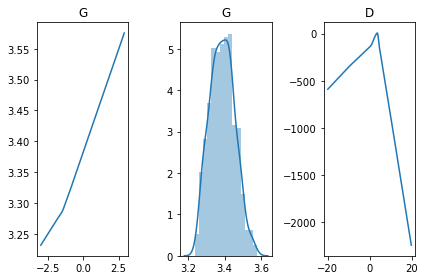

[Epoch 23704/50000] [D loss: 10.280573] [G loss: -0.201481]
[Epoch 23708/50000] [D loss: 7.401099] [G loss: -0.091699]
[Epoch 23712/50000] [D loss: 4.142282] [G loss: 0.130244]
[Epoch 23716/50000] [D loss: -0.017279] [G loss: 4.296259]
[Epoch 23720/50000] [D loss: -4.771232] [G loss: 6.858068]
[Epoch 23724/50000] [D loss: -9.228121] [G loss: 10.655240]
[Epoch 23728/50000] [D loss: -12.180149] [G loss: 12.925592]
[Epoch 23732/50000] [D loss: -13.664916] [G loss: 13.025868]
[Epoch 23736/50000] [D loss: -12.452111] [G loss: 11.295404]
[Epoch 23740/50000] [D loss: -10.984258] [G loss: 9.789900]
[Epoch 23744/50000] [D loss: -8.777072] [G loss: 7.311753]
[Epoch 23748/50000] [D loss: -4.239509] [G loss: 4.598389]
[Epoch 23752/50000] [D loss: -1.151032] [G loss: 1.715372]
[Epoch 23756/50000] [D loss: 2.794072] [G loss: -1.382449]
[Epoch 23760/50000] [D loss: 7.055800] [G loss: -4.058069]
[Epoch 23764/50000] [D loss: 10.997942] [G loss: -6.424533]
[Epoch 23768/50000] [D loss: 15.047134] [G loss

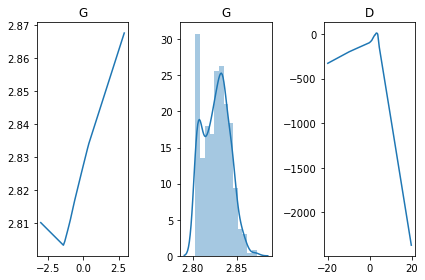

[Epoch 23804/50000] [D loss: -5.954136] [G loss: 2.580995]
[Epoch 23808/50000] [D loss: -5.221371] [G loss: 2.109112]
[Epoch 23812/50000] [D loss: -3.509763] [G loss: 1.420435]
[Epoch 23816/50000] [D loss: -1.828446] [G loss: 0.839174]
[Epoch 23820/50000] [D loss: -0.667704] [G loss: 0.202194]
[Epoch 23824/50000] [D loss: 1.701019] [G loss: -0.679468]
[Epoch 23828/50000] [D loss: 3.519750] [G loss: -1.269613]
[Epoch 23832/50000] [D loss: 5.327630] [G loss: -1.889989]
[Epoch 23836/50000] [D loss: 7.328021] [G loss: -2.329252]
[Epoch 23840/50000] [D loss: 8.392192] [G loss: -2.465010]
[Epoch 23844/50000] [D loss: 8.268254] [G loss: -0.706839]
[Epoch 23848/50000] [D loss: 5.548688] [G loss: 1.559960]
[Epoch 23852/50000] [D loss: 0.643116] [G loss: 4.662412]
[Epoch 23856/50000] [D loss: -2.708064] [G loss: 6.637840]
[Epoch 23860/50000] [D loss: -4.034775] [G loss: 6.916767]
[Epoch 23864/50000] [D loss: -3.905202] [G loss: 6.209691]
[Epoch 23868/50000] [D loss: -3.747753] [G loss: 5.152119]

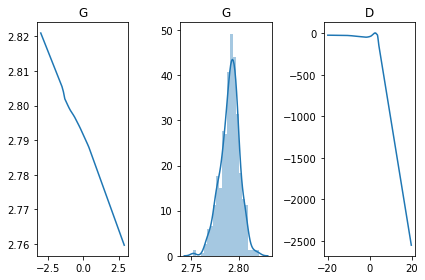

[Epoch 23904/50000] [D loss: 1.219518] [G loss: 0.639732]
[Epoch 23908/50000] [D loss: -0.520401] [G loss: 1.693129]
[Epoch 23912/50000] [D loss: -1.637700] [G loss: 1.485282]
[Epoch 23916/50000] [D loss: -1.959448] [G loss: 1.257612]
[Epoch 23920/50000] [D loss: -1.875449] [G loss: 0.722207]
[Epoch 23924/50000] [D loss: -1.339618] [G loss: 0.107490]
[Epoch 23928/50000] [D loss: -1.283576] [G loss: 0.347696]
[Epoch 23932/50000] [D loss: -1.100002] [G loss: -0.574020]
[Epoch 23936/50000] [D loss: -0.591131] [G loss: -0.786380]
[Epoch 23940/50000] [D loss: -0.208327] [G loss: -0.461066]
[Epoch 23944/50000] [D loss: -0.046782] [G loss: -0.393769]
[Epoch 23948/50000] [D loss: -0.298324] [G loss: 0.067386]
[Epoch 23952/50000] [D loss: -0.535422] [G loss: 0.557528]
[Epoch 23956/50000] [D loss: -1.130984] [G loss: 0.453074]
[Epoch 23960/50000] [D loss: -0.593668] [G loss: 0.459108]
[Epoch 23964/50000] [D loss: -0.815027] [G loss: 0.567426]
[Epoch 23968/50000] [D loss: -0.640412] [G loss: 0.42

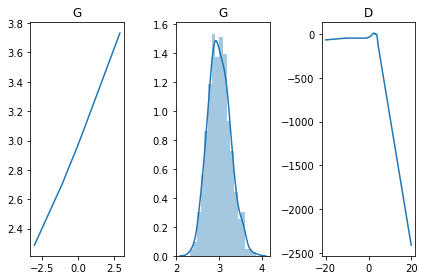

[Epoch 24004/50000] [D loss: 0.102685] [G loss: -1.240220]
[Epoch 24008/50000] [D loss: 0.199697] [G loss: -1.227188]
[Epoch 24012/50000] [D loss: 0.670674] [G loss: -1.284423]
[Epoch 24016/50000] [D loss: 0.241516] [G loss: -0.704942]
[Epoch 24020/50000] [D loss: 0.077286] [G loss: -0.419181]
[Epoch 24024/50000] [D loss: -0.122898] [G loss: 0.238346]
[Epoch 24028/50000] [D loss: -0.060290] [G loss: 0.646022]
[Epoch 24032/50000] [D loss: -0.407228] [G loss: 1.319925]
[Epoch 24036/50000] [D loss: -0.841122] [G loss: 2.357192]
[Epoch 24040/50000] [D loss: -0.491579] [G loss: 1.974513]
[Epoch 24044/50000] [D loss: -0.312230] [G loss: 1.751429]
[Epoch 24048/50000] [D loss: 0.292059] [G loss: 1.676064]
[Epoch 24052/50000] [D loss: 0.123152] [G loss: 1.652986]
[Epoch 24056/50000] [D loss: 1.410779] [G loss: 0.910437]
[Epoch 24060/50000] [D loss: 1.893538] [G loss: 0.485099]
[Epoch 24064/50000] [D loss: 2.569325] [G loss: 0.101914]
[Epoch 24068/50000] [D loss: 3.287412] [G loss: -0.700217]
[E

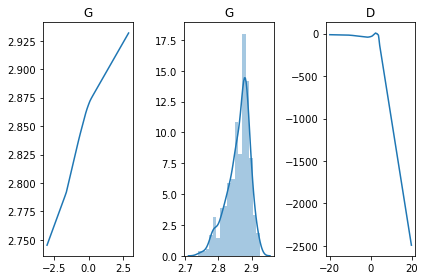

[Epoch 24104/50000] [D loss: 0.480178] [G loss: 0.499381]
[Epoch 24108/50000] [D loss: -1.013552] [G loss: 0.942939]
[Epoch 24112/50000] [D loss: -1.587863] [G loss: 0.725265]
[Epoch 24116/50000] [D loss: -1.671868] [G loss: 0.464495]
[Epoch 24120/50000] [D loss: -1.171427] [G loss: 0.149324]
[Epoch 24124/50000] [D loss: -1.277148] [G loss: 0.022090]
[Epoch 24128/50000] [D loss: -0.766569] [G loss: -0.604640]
[Epoch 24132/50000] [D loss: -0.269621] [G loss: -0.851605]
[Epoch 24136/50000] [D loss: -0.036661] [G loss: -1.148828]
[Epoch 24140/50000] [D loss: 0.077856] [G loss: -2.035080]
[Epoch 24144/50000] [D loss: 0.169706] [G loss: -1.488946]
[Epoch 24148/50000] [D loss: 0.007883] [G loss: -0.783013]
[Epoch 24152/50000] [D loss: -0.258771] [G loss: -0.155801]
[Epoch 24156/50000] [D loss: -0.401879] [G loss: 0.515407]
[Epoch 24160/50000] [D loss: -0.226909] [G loss: 0.358968]
[Epoch 24164/50000] [D loss: -0.362787] [G loss: 0.313435]
[Epoch 24168/50000] [D loss: -0.220462] [G loss: 0.64

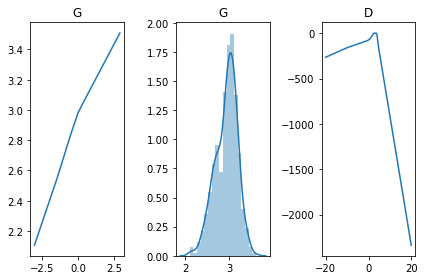

[Epoch 24204/50000] [D loss: -0.013589] [G loss: -1.209594]
[Epoch 24208/50000] [D loss: -0.322533] [G loss: -0.851463]
[Epoch 24212/50000] [D loss: -0.240078] [G loss: -1.009473]
[Epoch 24216/50000] [D loss: -0.015522] [G loss: -0.975758]
[Epoch 24220/50000] [D loss: -0.034317] [G loss: -0.607499]
[Epoch 24224/50000] [D loss: 0.139225] [G loss: -0.554518]
[Epoch 24228/50000] [D loss: -0.088762] [G loss: -0.206980]
[Epoch 24232/50000] [D loss: 0.024423] [G loss: -0.042116]
[Epoch 24236/50000] [D loss: -0.004079] [G loss: 0.141263]
[Epoch 24240/50000] [D loss: -0.231269] [G loss: 0.238516]
[Epoch 24244/50000] [D loss: 0.015622] [G loss: 0.236063]
[Epoch 24248/50000] [D loss: -0.098837] [G loss: 0.245357]
[Epoch 24252/50000] [D loss: 0.024594] [G loss: 0.429031]
[Epoch 24256/50000] [D loss: 0.058147] [G loss: 0.288205]
[Epoch 24260/50000] [D loss: 0.122185] [G loss: 0.609722]
[Epoch 24264/50000] [D loss: 0.024370] [G loss: 0.567987]
[Epoch 24268/50000] [D loss: 0.024481] [G loss: 0.56546

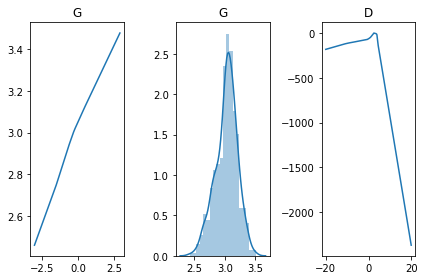

[Epoch 24304/50000] [D loss: -0.304840] [G loss: 0.074930]
[Epoch 24308/50000] [D loss: -0.279251] [G loss: 0.159371]
[Epoch 24312/50000] [D loss: -0.294564] [G loss: -0.041742]
[Epoch 24316/50000] [D loss: -0.203102] [G loss: 0.001884]
[Epoch 24320/50000] [D loss: -0.068466] [G loss: -0.170730]
[Epoch 24324/50000] [D loss: -0.055884] [G loss: -0.229447]
[Epoch 24328/50000] [D loss: -0.023371] [G loss: -0.362267]
[Epoch 24332/50000] [D loss: 0.083882] [G loss: -0.226521]
[Epoch 24336/50000] [D loss: 0.131876] [G loss: -0.241737]
[Epoch 24340/50000] [D loss: 0.030290] [G loss: -0.166330]
[Epoch 24344/50000] [D loss: -0.006555] [G loss: -0.232601]
[Epoch 24348/50000] [D loss: -0.063610] [G loss: 0.036823]
[Epoch 24352/50000] [D loss: -0.042455] [G loss: -0.386705]
[Epoch 24356/50000] [D loss: -0.081518] [G loss: -0.302539]
[Epoch 24360/50000] [D loss: -0.082357] [G loss: -0.500931]
[Epoch 24364/50000] [D loss: -0.045181] [G loss: -0.222563]
[Epoch 24368/50000] [D loss: -0.112467] [G loss

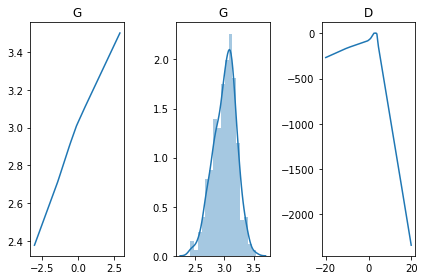

[Epoch 24404/50000] [D loss: -0.057448] [G loss: -0.449121]
[Epoch 24408/50000] [D loss: -0.058454] [G loss: -0.661787]
[Epoch 24412/50000] [D loss: -0.076546] [G loss: -0.451338]
[Epoch 24416/50000] [D loss: -0.045394] [G loss: -0.606434]
[Epoch 24420/50000] [D loss: -0.100911] [G loss: -0.057277]
[Epoch 24424/50000] [D loss: -0.069353] [G loss: 0.595593]
[Epoch 24428/50000] [D loss: -0.063910] [G loss: -0.385351]
[Epoch 24432/50000] [D loss: -0.086798] [G loss: -0.158711]
[Epoch 24436/50000] [D loss: -0.076614] [G loss: 0.537058]
[Epoch 24440/50000] [D loss: -0.072602] [G loss: -0.075690]
[Epoch 24444/50000] [D loss: -0.119207] [G loss: 0.296730]
[Epoch 24448/50000] [D loss: -0.073778] [G loss: 0.414918]
[Epoch 24452/50000] [D loss: -0.080443] [G loss: -0.109646]
[Epoch 24456/50000] [D loss: 0.004604] [G loss: -0.289740]
[Epoch 24460/50000] [D loss: -0.050882] [G loss: 0.229935]
[Epoch 24464/50000] [D loss: -0.092780] [G loss: -0.442118]
[Epoch 24468/50000] [D loss: -0.076555] [G los

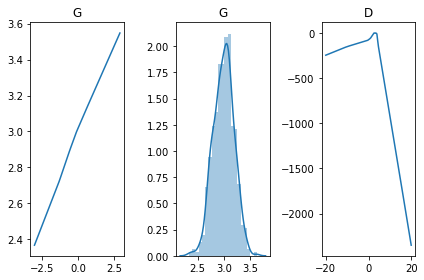

[Epoch 24504/50000] [D loss: -0.084452] [G loss: -0.117199]
[Epoch 24508/50000] [D loss: -0.095050] [G loss: -0.110173]
[Epoch 24512/50000] [D loss: -0.083136] [G loss: 0.452387]
[Epoch 24516/50000] [D loss: 0.008081] [G loss: -0.291106]
[Epoch 24520/50000] [D loss: -0.053204] [G loss: -0.209900]
[Epoch 24524/50000] [D loss: -0.119760] [G loss: 0.421828]
[Epoch 24528/50000] [D loss: -0.057567] [G loss: -0.370857]
[Epoch 24532/50000] [D loss: -0.110245] [G loss: -0.047617]
[Epoch 24536/50000] [D loss: -0.175567] [G loss: 0.569555]
[Epoch 24540/50000] [D loss: -0.062061] [G loss: -0.576060]
[Epoch 24544/50000] [D loss: -0.156525] [G loss: -0.054894]
[Epoch 24548/50000] [D loss: -0.036756] [G loss: 0.280575]
[Epoch 24552/50000] [D loss: 0.021795] [G loss: -0.525543]
[Epoch 24556/50000] [D loss: -0.058814] [G loss: -0.223161]
[Epoch 24560/50000] [D loss: -0.117346] [G loss: 0.466891]
[Epoch 24564/50000] [D loss: -0.139456] [G loss: -0.143948]
[Epoch 24568/50000] [D loss: -0.075384] [G loss

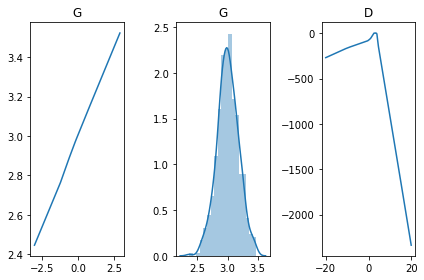

[Epoch 24604/50000] [D loss: -0.066205] [G loss: 0.059349]
[Epoch 24608/50000] [D loss: -0.075775] [G loss: 0.492208]
[Epoch 24612/50000] [D loss: -0.096206] [G loss: -0.526025]
[Epoch 24616/50000] [D loss: -0.115468] [G loss: -0.092321]
[Epoch 24620/50000] [D loss: -0.033308] [G loss: 0.622869]
[Epoch 24624/50000] [D loss: -0.052102] [G loss: -0.747019]
[Epoch 24628/50000] [D loss: -0.004142] [G loss: -0.244885]
[Epoch 24632/50000] [D loss: 0.062364] [G loss: 0.243054]
[Epoch 24636/50000] [D loss: -0.070073] [G loss: -0.606790]
[Epoch 24640/50000] [D loss: -0.069796] [G loss: -0.079494]
[Epoch 24644/50000] [D loss: -0.084927] [G loss: 0.374597]
[Epoch 24648/50000] [D loss: -0.065138] [G loss: 0.412411]
[Epoch 24652/50000] [D loss: -0.126270] [G loss: -0.219192]
[Epoch 24656/50000] [D loss: -0.092327] [G loss: 0.088949]
[Epoch 24660/50000] [D loss: -0.074872] [G loss: 0.342828]
[Epoch 24664/50000] [D loss: -0.127471] [G loss: 0.243749]
[Epoch 24668/50000] [D loss: -0.079920] [G loss: 0

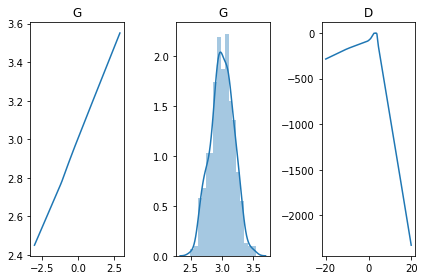

[Epoch 24704/50000] [D loss: 0.008992] [G loss: -0.021648]
[Epoch 24708/50000] [D loss: -0.056755] [G loss: 0.104358]
[Epoch 24712/50000] [D loss: -0.072521] [G loss: -0.691133]
[Epoch 24716/50000] [D loss: -0.125052] [G loss: -0.037391]
[Epoch 24720/50000] [D loss: -0.040235] [G loss: 0.676824]
[Epoch 24724/50000] [D loss: -0.041027] [G loss: -0.544284]
[Epoch 24728/50000] [D loss: -0.093298] [G loss: -0.177789]
[Epoch 24732/50000] [D loss: -0.039815] [G loss: 0.550708]
[Epoch 24736/50000] [D loss: -0.032134] [G loss: -0.394352]
[Epoch 24740/50000] [D loss: -0.039569] [G loss: -0.063117]
[Epoch 24744/50000] [D loss: -0.090571] [G loss: 0.591756]
[Epoch 24748/50000] [D loss: -0.068860] [G loss: -0.302134]
[Epoch 24752/50000] [D loss: -0.092862] [G loss: 0.062365]
[Epoch 24756/50000] [D loss: -0.076413] [G loss: 0.399366]
[Epoch 24760/50000] [D loss: -0.057205] [G loss: -0.266168]
[Epoch 24764/50000] [D loss: -0.022948] [G loss: -0.072660]
[Epoch 24768/50000] [D loss: -0.106323] [G loss

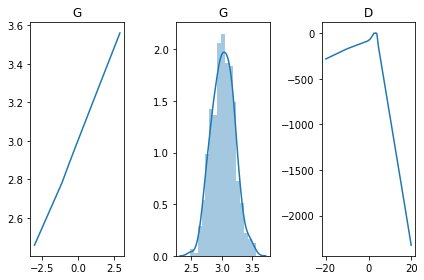

[Epoch 24804/50000] [D loss: 0.014324] [G loss: -0.543475]
[Epoch 24808/50000] [D loss: -0.000538] [G loss: -0.729377]
[Epoch 24812/50000] [D loss: -0.046566] [G loss: -0.138232]
[Epoch 24816/50000] [D loss: -0.056279] [G loss: 0.080875]
[Epoch 24820/50000] [D loss: -0.031822] [G loss: -0.136591]
[Epoch 24824/50000] [D loss: -0.084760] [G loss: 0.602406]
[Epoch 24828/50000] [D loss: -0.055680] [G loss: -0.171175]
[Epoch 24832/50000] [D loss: -0.072391] [G loss: -0.001837]
[Epoch 24836/50000] [D loss: -0.064077] [G loss: 0.572598]
[Epoch 24840/50000] [D loss: -0.021928] [G loss: -0.083971]
[Epoch 24844/50000] [D loss: -0.029187] [G loss: -0.026335]
[Epoch 24848/50000] [D loss: -0.069046] [G loss: 0.537975]
[Epoch 24852/50000] [D loss: -0.001968] [G loss: -0.026445]
[Epoch 24856/50000] [D loss: 0.001462] [G loss: 0.115867]
[Epoch 24860/50000] [D loss: -0.066435] [G loss: 0.559923]
[Epoch 24864/50000] [D loss: -0.064415] [G loss: 0.126310]
[Epoch 24868/50000] [D loss: -0.013379] [G loss: 

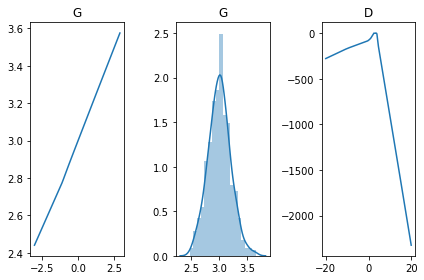

[Epoch 24904/50000] [D loss: -0.001968] [G loss: -0.118373]
[Epoch 24908/50000] [D loss: -0.030165] [G loss: -0.046755]
[Epoch 24912/50000] [D loss: 0.000406] [G loss: 0.005811]
[Epoch 24916/50000] [D loss: 0.010257] [G loss: 0.164883]
[Epoch 24920/50000] [D loss: -0.011130] [G loss: 0.145735]
[Epoch 24924/50000] [D loss: -0.053443] [G loss: 0.188861]
[Epoch 24928/50000] [D loss: -0.048685] [G loss: 0.309728]
[Epoch 24932/50000] [D loss: -0.029284] [G loss: -0.407761]
[Epoch 24936/50000] [D loss: -0.102996] [G loss: -0.486536]
[Epoch 24940/50000] [D loss: -0.096091] [G loss: 0.037888]
[Epoch 24944/50000] [D loss: -0.048307] [G loss: 0.252687]
[Epoch 24948/50000] [D loss: -0.054289] [G loss: 0.142253]
[Epoch 24952/50000] [D loss: -0.084541] [G loss: 0.663107]
[Epoch 24956/50000] [D loss: -0.006846] [G loss: 0.120848]
[Epoch 24960/50000] [D loss: -0.035507] [G loss: 0.133339]
[Epoch 24964/50000] [D loss: -0.038086] [G loss: -0.163089]
[Epoch 24968/50000] [D loss: -0.080389] [G loss: 0.16

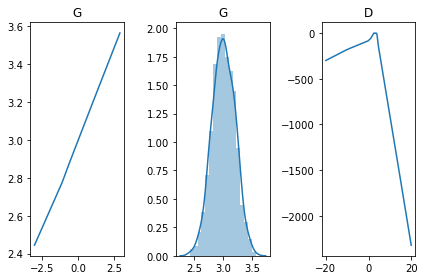

[Epoch 25004/50000] [D loss: 0.007986] [G loss: 0.448282]
[Epoch 25008/50000] [D loss: -0.066973] [G loss: 0.409752]
[Epoch 25012/50000] [D loss: -0.012227] [G loss: 0.490972]
[Epoch 25016/50000] [D loss: 0.028016] [G loss: 0.009069]
[Epoch 25020/50000] [D loss: -0.060535] [G loss: 0.191054]
[Epoch 25024/50000] [D loss: -0.084452] [G loss: 0.224978]
[Epoch 25028/50000] [D loss: -0.013965] [G loss: 0.114511]
[Epoch 25032/50000] [D loss: -0.053447] [G loss: 0.196505]
[Epoch 25036/50000] [D loss: -0.048219] [G loss: 0.144301]
[Epoch 25040/50000] [D loss: -0.051948] [G loss: 0.303713]
[Epoch 25044/50000] [D loss: -0.095766] [G loss: 0.346069]
[Epoch 25048/50000] [D loss: -0.063977] [G loss: 0.418404]
[Epoch 25052/50000] [D loss: -0.113442] [G loss: 0.457248]
[Epoch 25056/50000] [D loss: -0.123146] [G loss: -0.222981]
[Epoch 25060/50000] [D loss: -0.075602] [G loss: 0.121457]
[Epoch 25064/50000] [D loss: -0.106366] [G loss: 0.232134]
[Epoch 25068/50000] [D loss: -0.056850] [G loss: 0.250920

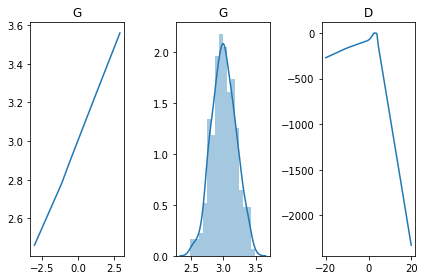

[Epoch 25104/50000] [D loss: -0.048882] [G loss: 0.124496]
[Epoch 25108/50000] [D loss: -0.083395] [G loss: 0.262322]
[Epoch 25112/50000] [D loss: -0.052590] [G loss: 0.006235]
[Epoch 25116/50000] [D loss: -0.085544] [G loss: 0.880881]
[Epoch 25120/50000] [D loss: -0.053840] [G loss: 0.577796]
[Epoch 25124/50000] [D loss: -0.052630] [G loss: 0.605076]
[Epoch 25128/50000] [D loss: -0.041442] [G loss: -0.113534]
[Epoch 25132/50000] [D loss: 0.059202] [G loss: -0.790091]
[Epoch 25136/50000] [D loss: -0.036432] [G loss: -0.497776]
[Epoch 25140/50000] [D loss: -0.019345] [G loss: 0.034099]
[Epoch 25144/50000] [D loss: -0.022412] [G loss: 0.003101]
[Epoch 25148/50000] [D loss: -0.027726] [G loss: -0.581198]
[Epoch 25152/50000] [D loss: -0.034498] [G loss: -0.346911]
[Epoch 25156/50000] [D loss: -0.105250] [G loss: -0.056494]
[Epoch 25160/50000] [D loss: -0.062777] [G loss: 0.895663]
[Epoch 25164/50000] [D loss: -0.011815] [G loss: 0.524762]
[Epoch 25168/50000] [D loss: -0.038579] [G loss: -0

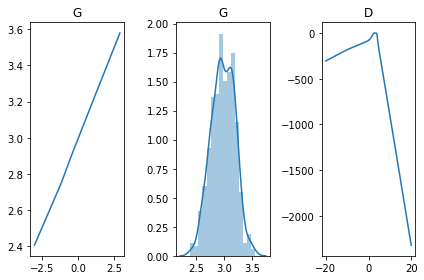

[Epoch 25204/50000] [D loss: -0.089739] [G loss: 0.223187]
[Epoch 25208/50000] [D loss: -0.099083] [G loss: 0.288150]
[Epoch 25212/50000] [D loss: -0.060354] [G loss: 0.401250]
[Epoch 25216/50000] [D loss: -0.113699] [G loss: 0.007335]
[Epoch 25220/50000] [D loss: -0.080858] [G loss: -0.098097]
[Epoch 25224/50000] [D loss: -0.137491] [G loss: -0.102256]
[Epoch 25228/50000] [D loss: -0.053390] [G loss: -0.130989]
[Epoch 25232/50000] [D loss: -0.106192] [G loss: -0.122815]
[Epoch 25236/50000] [D loss: -0.098693] [G loss: -0.169482]
[Epoch 25240/50000] [D loss: -0.076006] [G loss: -0.122096]
[Epoch 25244/50000] [D loss: -0.045157] [G loss: -0.109629]
[Epoch 25248/50000] [D loss: -0.109160] [G loss: -0.386744]
[Epoch 25252/50000] [D loss: -0.072130] [G loss: -0.394673]
[Epoch 25256/50000] [D loss: -0.028843] [G loss: -0.547105]
[Epoch 25260/50000] [D loss: -0.096996] [G loss: -0.457482]
[Epoch 25264/50000] [D loss: -0.062796] [G loss: -0.221331]
[Epoch 25268/50000] [D loss: -0.049333] [G l

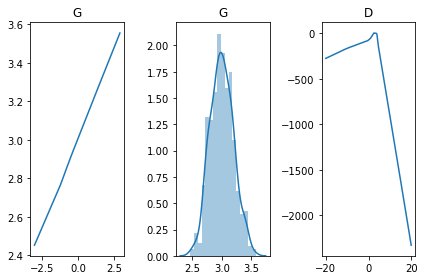

[Epoch 25304/50000] [D loss: -0.097716] [G loss: -0.163778]
[Epoch 25308/50000] [D loss: -0.060486] [G loss: 0.365236]
[Epoch 25312/50000] [D loss: -0.018154] [G loss: 0.419734]
[Epoch 25316/50000] [D loss: 0.004555] [G loss: 0.207993]
[Epoch 25320/50000] [D loss: -0.014322] [G loss: 0.395785]
[Epoch 25324/50000] [D loss: 0.014911] [G loss: 0.463223]
[Epoch 25328/50000] [D loss: 0.019953] [G loss: 0.361967]
[Epoch 25332/50000] [D loss: 0.016382] [G loss: 0.455284]
[Epoch 25336/50000] [D loss: -0.048995] [G loss: 0.125065]
[Epoch 25340/50000] [D loss: -0.027888] [G loss: -0.052550]
[Epoch 25344/50000] [D loss: -0.095562] [G loss: 0.189711]
[Epoch 25348/50000] [D loss: -0.037556] [G loss: 0.100228]
[Epoch 25352/50000] [D loss: -0.033482] [G loss: 0.142131]
[Epoch 25356/50000] [D loss: 0.028488] [G loss: 0.099333]
[Epoch 25360/50000] [D loss: -0.073383] [G loss: 0.394019]
[Epoch 25364/50000] [D loss: -0.079565] [G loss: 0.241260]
[Epoch 25368/50000] [D loss: -0.027442] [G loss: 0.255582]


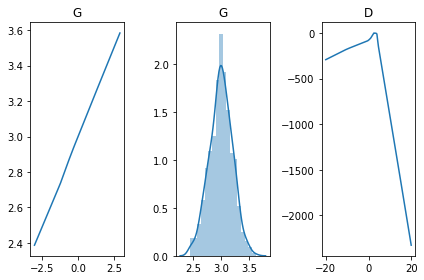

[Epoch 25404/50000] [D loss: -0.031819] [G loss: -0.433333]
[Epoch 25408/50000] [D loss: -0.060381] [G loss: 0.443550]
[Epoch 25412/50000] [D loss: -0.094633] [G loss: 0.390870]
[Epoch 25416/50000] [D loss: -0.088446] [G loss: 0.118593]
[Epoch 25420/50000] [D loss: -0.059730] [G loss: -0.143134]
[Epoch 25424/50000] [D loss: -0.060948] [G loss: -0.311866]
[Epoch 25428/50000] [D loss: -0.082130] [G loss: -0.321975]
[Epoch 25432/50000] [D loss: -0.058246] [G loss: -0.256884]
[Epoch 25436/50000] [D loss: -0.108150] [G loss: -0.325021]
[Epoch 25440/50000] [D loss: -0.075234] [G loss: -0.372121]
[Epoch 25444/50000] [D loss: -0.097534] [G loss: -0.314966]
[Epoch 25448/50000] [D loss: -0.091052] [G loss: -0.439377]
[Epoch 25452/50000] [D loss: -0.049978] [G loss: -0.477474]
[Epoch 25456/50000] [D loss: -0.073037] [G loss: -0.538158]
[Epoch 25460/50000] [D loss: -0.112111] [G loss: -0.523180]
[Epoch 25464/50000] [D loss: -0.017434] [G loss: -0.656936]
[Epoch 25468/50000] [D loss: 0.010076] [G l

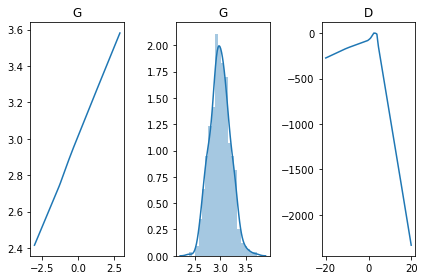

[Epoch 25504/50000] [D loss: -0.128378] [G loss: 1.069226]
[Epoch 25508/50000] [D loss: 0.020367] [G loss: 0.496927]
[Epoch 25512/50000] [D loss: 0.002706] [G loss: 0.136201]
[Epoch 25516/50000] [D loss: 0.034323] [G loss: -0.675756]
[Epoch 25520/50000] [D loss: -0.021105] [G loss: -0.226179]
[Epoch 25524/50000] [D loss: -0.008229] [G loss: -0.256784]
[Epoch 25528/50000] [D loss: -0.060638] [G loss: -0.516609]
[Epoch 25532/50000] [D loss: -0.073376] [G loss: -0.424760]
[Epoch 25536/50000] [D loss: -0.084817] [G loss: -0.316476]
[Epoch 25540/50000] [D loss: -0.052642] [G loss: -0.283359]
[Epoch 25544/50000] [D loss: -0.145670] [G loss: -0.225300]
[Epoch 25548/50000] [D loss: -0.150503] [G loss: -0.117941]
[Epoch 25552/50000] [D loss: -0.116105] [G loss: -0.288332]
[Epoch 25556/50000] [D loss: -0.191176] [G loss: -0.902559]
[Epoch 25560/50000] [D loss: -0.051957] [G loss: -0.050669]
[Epoch 25564/50000] [D loss: -0.003202] [G loss: 0.329393]
[Epoch 25568/50000] [D loss: -0.058652] [G loss

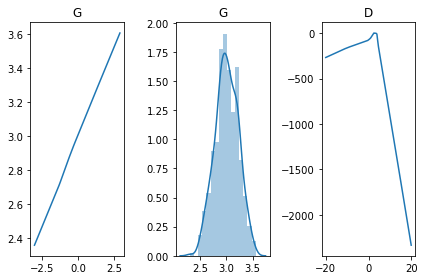

[Epoch 25604/50000] [D loss: -0.053468] [G loss: 0.218310]
[Epoch 25608/50000] [D loss: -0.122680] [G loss: 0.214613]
[Epoch 25612/50000] [D loss: -0.060626] [G loss: -0.452981]
[Epoch 25616/50000] [D loss: -0.121898] [G loss: -0.332121]
[Epoch 25620/50000] [D loss: -0.064695] [G loss: 0.339865]
[Epoch 25624/50000] [D loss: 0.033309] [G loss: 0.449797]
[Epoch 25628/50000] [D loss: 0.006399] [G loss: 0.488470]
[Epoch 25632/50000] [D loss: -0.043133] [G loss: 0.492287]
[Epoch 25636/50000] [D loss: -0.058954] [G loss: 0.508832]
[Epoch 25640/50000] [D loss: -0.048764] [G loss: 0.327218]
[Epoch 25644/50000] [D loss: -0.121032] [G loss: 0.488668]
[Epoch 25648/50000] [D loss: -0.033957] [G loss: -0.287991]
[Epoch 25652/50000] [D loss: -0.092105] [G loss: -0.400219]
[Epoch 25656/50000] [D loss: -0.093178] [G loss: -0.473823]
[Epoch 25660/50000] [D loss: -0.008811] [G loss: -0.499140]
[Epoch 25664/50000] [D loss: -0.065849] [G loss: -0.513260]
[Epoch 25668/50000] [D loss: 0.003222] [G loss: -0.

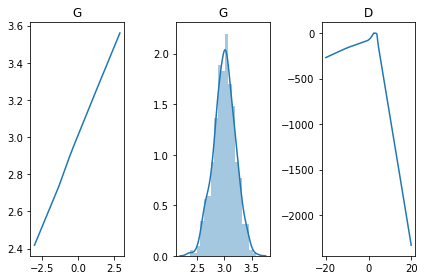

[Epoch 25704/50000] [D loss: -0.072947] [G loss: -1.168045]
[Epoch 25708/50000] [D loss: -0.109202] [G loss: 0.565554]
[Epoch 25712/50000] [D loss: -0.005968] [G loss: -0.053930]
[Epoch 25716/50000] [D loss: 0.002327] [G loss: -0.241847]
[Epoch 25720/50000] [D loss: -0.016758] [G loss: -0.455480]
[Epoch 25724/50000] [D loss: 0.001506] [G loss: -0.233017]
[Epoch 25728/50000] [D loss: -0.055677] [G loss: -0.071376]
[Epoch 25732/50000] [D loss: -0.009693] [G loss: -0.500436]
[Epoch 25736/50000] [D loss: -0.029470] [G loss: 0.071668]
[Epoch 25740/50000] [D loss: -0.119053] [G loss: 0.431219]
[Epoch 25744/50000] [D loss: -0.115445] [G loss: -0.185994]
[Epoch 25748/50000] [D loss: -0.073872] [G loss: -0.416723]
[Epoch 25752/50000] [D loss: -0.012468] [G loss: -0.584355]
[Epoch 25756/50000] [D loss: -0.014863] [G loss: -0.340261]
[Epoch 25760/50000] [D loss: 0.024092] [G loss: -0.743452]
[Epoch 25764/50000] [D loss: 0.026979] [G loss: -0.737566]
[Epoch 25768/50000] [D loss: -0.014808] [G loss

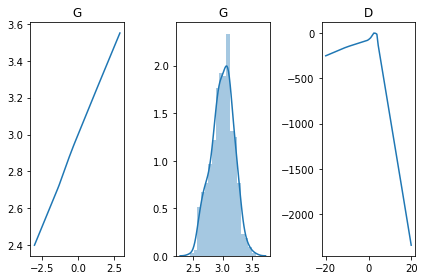

[Epoch 25804/50000] [D loss: 0.020659] [G loss: 0.858915]
[Epoch 25808/50000] [D loss: -0.000507] [G loss: -0.053844]
[Epoch 25812/50000] [D loss: 0.050844] [G loss: -0.574820]
[Epoch 25816/50000] [D loss: 0.005275] [G loss: -0.273282]
[Epoch 25820/50000] [D loss: 0.002669] [G loss: -0.437089]
[Epoch 25824/50000] [D loss: -0.049966] [G loss: -0.275254]
[Epoch 25828/50000] [D loss: -0.086978] [G loss: -0.270328]
[Epoch 25832/50000] [D loss: -0.141722] [G loss: -0.114860]
[Epoch 25836/50000] [D loss: -0.186980] [G loss: -0.317001]
[Epoch 25840/50000] [D loss: -0.251985] [G loss: -0.415920]
[Epoch 25844/50000] [D loss: -0.290698] [G loss: -0.287398]
[Epoch 25848/50000] [D loss: -0.140535] [G loss: -0.013596]
[Epoch 25852/50000] [D loss: -0.037387] [G loss: -0.102198]
[Epoch 25856/50000] [D loss: -0.295052] [G loss: -0.037358]
[Epoch 25860/50000] [D loss: -0.039796] [G loss: -0.328058]
[Epoch 25864/50000] [D loss: 0.032500] [G loss: -0.306884]
[Epoch 25868/50000] [D loss: -0.008288] [G los

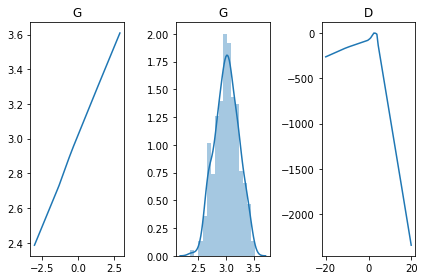

[Epoch 25904/50000] [D loss: -0.225418] [G loss: 0.985547]
[Epoch 25908/50000] [D loss: -0.031385] [G loss: 0.631255]
[Epoch 25912/50000] [D loss: -0.032377] [G loss: 0.404594]
[Epoch 25916/50000] [D loss: -0.002604] [G loss: 0.339731]
[Epoch 25920/50000] [D loss: 0.051042] [G loss: 0.946535]
[Epoch 25924/50000] [D loss: 0.112821] [G loss: 0.014550]
[Epoch 25928/50000] [D loss: 0.097782] [G loss: -0.392781]
[Epoch 25932/50000] [D loss: 0.041416] [G loss: -0.244687]
[Epoch 25936/50000] [D loss: -0.009241] [G loss: -0.113671]
[Epoch 25940/50000] [D loss: -0.075266] [G loss: 0.105161]
[Epoch 25944/50000] [D loss: -0.147803] [G loss: 0.601107]
[Epoch 25948/50000] [D loss: -0.338289] [G loss: 1.130457]
[Epoch 25952/50000] [D loss: -0.197223] [G loss: -0.782675]
[Epoch 25956/50000] [D loss: -0.298573] [G loss: -1.401376]
[Epoch 25960/50000] [D loss: -0.161650] [G loss: -0.418165]
[Epoch 25964/50000] [D loss: -0.133913] [G loss: -0.003889]
[Epoch 25968/50000] [D loss: 0.069064] [G loss: -1.68

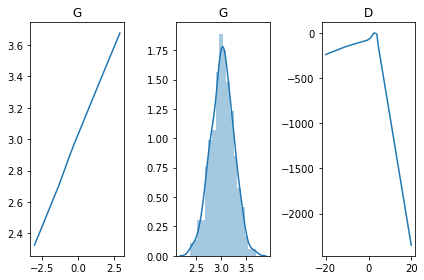

[Epoch 26004/50000] [D loss: -0.244838] [G loss: 0.181682]
[Epoch 26008/50000] [D loss: -0.268396] [G loss: 0.425492]
[Epoch 26012/50000] [D loss: -0.119457] [G loss: 0.151420]
[Epoch 26016/50000] [D loss: -0.102691] [G loss: 0.048647]
[Epoch 26020/50000] [D loss: -0.038589] [G loss: 0.018816]
[Epoch 26024/50000] [D loss: 0.046987] [G loss: 0.453504]
[Epoch 26028/50000] [D loss: 0.004542] [G loss: 0.367081]
[Epoch 26032/50000] [D loss: 0.137667] [G loss: 0.312238]
[Epoch 26036/50000] [D loss: 0.047038] [G loss: 0.506674]
[Epoch 26040/50000] [D loss: 0.086961] [G loss: 0.397079]
[Epoch 26044/50000] [D loss: -0.007288] [G loss: 0.494624]
[Epoch 26048/50000] [D loss: -0.080318] [G loss: 0.615978]
[Epoch 26052/50000] [D loss: -0.116087] [G loss: 0.190114]
[Epoch 26056/50000] [D loss: -0.146804] [G loss: 1.021124]
[Epoch 26060/50000] [D loss: -0.292916] [G loss: 1.025948]
[Epoch 26064/50000] [D loss: -0.321243] [G loss: -0.636071]
[Epoch 26068/50000] [D loss: -0.280852] [G loss: -1.336828]


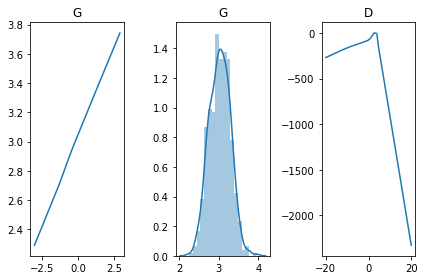

[Epoch 26104/50000] [D loss: -0.141543] [G loss: -0.542339]
[Epoch 26108/50000] [D loss: -0.232397] [G loss: -0.899544]
[Epoch 26112/50000] [D loss: -0.362078] [G loss: 0.733773]
[Epoch 26116/50000] [D loss: -0.385428] [G loss: 0.740109]
[Epoch 26120/50000] [D loss: -0.473862] [G loss: 0.616344]
[Epoch 26124/50000] [D loss: -0.255575] [G loss: 0.539891]
[Epoch 26128/50000] [D loss: -0.084306] [G loss: 0.339835]
[Epoch 26132/50000] [D loss: 0.047688] [G loss: 0.313881]
[Epoch 26136/50000] [D loss: -0.031501] [G loss: 0.308697]
[Epoch 26140/50000] [D loss: 0.153767] [G loss: 0.176587]
[Epoch 26144/50000] [D loss: 0.120916] [G loss: -0.207273]
[Epoch 26148/50000] [D loss: 0.241632] [G loss: -0.237919]
[Epoch 26152/50000] [D loss: 0.054338] [G loss: -0.219525]
[Epoch 26156/50000] [D loss: 0.087069] [G loss: -0.214181]
[Epoch 26160/50000] [D loss: -0.071570] [G loss: -0.626301]
[Epoch 26164/50000] [D loss: -0.142737] [G loss: 0.111206]
[Epoch 26168/50000] [D loss: -0.158019] [G loss: 1.0791

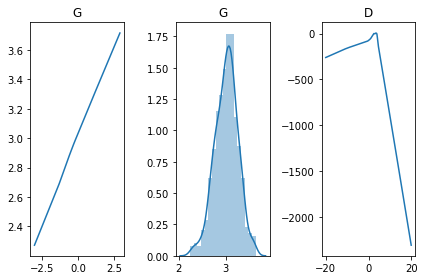

[Epoch 26204/50000] [D loss: 0.432238] [G loss: -2.151119]
[Epoch 26208/50000] [D loss: 0.183217] [G loss: -1.586757]
[Epoch 26212/50000] [D loss: 0.156789] [G loss: -0.407788]
[Epoch 26216/50000] [D loss: -0.170848] [G loss: -0.396220]
[Epoch 26220/50000] [D loss: -0.341858] [G loss: 0.190448]
[Epoch 26224/50000] [D loss: -0.359621] [G loss: 0.680506]
[Epoch 26228/50000] [D loss: -0.558350] [G loss: 0.465221]
[Epoch 26232/50000] [D loss: -0.481107] [G loss: 0.566685]
[Epoch 26236/50000] [D loss: -0.317985] [G loss: 0.622155]
[Epoch 26240/50000] [D loss: 0.011649] [G loss: 0.422478]
[Epoch 26244/50000] [D loss: -0.069759] [G loss: 0.525664]
[Epoch 26248/50000] [D loss: 0.111196] [G loss: 0.110513]
[Epoch 26252/50000] [D loss: 0.161979] [G loss: -0.050409]
[Epoch 26256/50000] [D loss: 0.080347] [G loss: -0.118380]
[Epoch 26260/50000] [D loss: 0.062541] [G loss: -0.258419]
[Epoch 26264/50000] [D loss: 0.166521] [G loss: -0.310755]
[Epoch 26268/50000] [D loss: 0.145558] [G loss: -0.233907

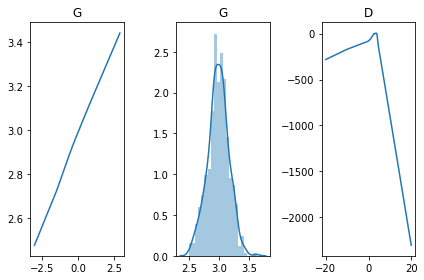

[Epoch 26304/50000] [D loss: -0.356157] [G loss: -0.730538]
[Epoch 26308/50000] [D loss: -0.177561] [G loss: -0.679413]
[Epoch 26312/50000] [D loss: -0.004036] [G loss: -1.318078]
[Epoch 26316/50000] [D loss: 0.184792] [G loss: -0.969374]
[Epoch 26320/50000] [D loss: 0.396581] [G loss: -1.388263]
[Epoch 26324/50000] [D loss: 0.134370] [G loss: -0.593126]
[Epoch 26328/50000] [D loss: 0.215082] [G loss: -0.214763]
[Epoch 26332/50000] [D loss: 0.085344] [G loss: -0.242045]
[Epoch 26336/50000] [D loss: -0.191987] [G loss: -0.695069]
[Epoch 26340/50000] [D loss: -0.423173] [G loss: 0.891868]
[Epoch 26344/50000] [D loss: -0.459979] [G loss: 0.356281]
[Epoch 26348/50000] [D loss: -0.648071] [G loss: 0.839653]
[Epoch 26352/50000] [D loss: -0.272229] [G loss: 0.681415]
[Epoch 26356/50000] [D loss: -0.425218] [G loss: 0.643448]
[Epoch 26360/50000] [D loss: -0.199512] [G loss: 0.402104]
[Epoch 26364/50000] [D loss: -0.098152] [G loss: 0.323355]
[Epoch 26368/50000] [D loss: 0.080550] [G loss: 0.14

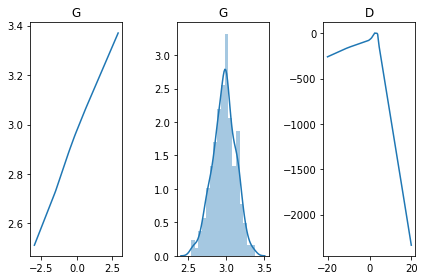

[Epoch 26404/50000] [D loss: -0.012198] [G loss: -0.742845]
[Epoch 26408/50000] [D loss: -0.111984] [G loss: -0.113474]
[Epoch 26412/50000] [D loss: -0.216598] [G loss: 0.282845]
[Epoch 26416/50000] [D loss: -0.333322] [G loss: -0.987728]
[Epoch 26420/50000] [D loss: -0.328805] [G loss: 0.088048]
[Epoch 26424/50000] [D loss: -0.477537] [G loss: 0.786324]
[Epoch 26428/50000] [D loss: -0.433189] [G loss: 0.409123]
[Epoch 26432/50000] [D loss: -0.092701] [G loss: -0.812454]
[Epoch 26436/50000] [D loss: 0.012190] [G loss: -0.821286]
[Epoch 26440/50000] [D loss: 0.043101] [G loss: -0.972893]
[Epoch 26444/50000] [D loss: 0.003411] [G loss: -1.122950]
[Epoch 26448/50000] [D loss: 0.201703] [G loss: -0.999501]
[Epoch 26452/50000] [D loss: 0.174868] [G loss: -0.930579]
[Epoch 26456/50000] [D loss: -0.022663] [G loss: -0.773735]
[Epoch 26460/50000] [D loss: 0.053793] [G loss: -0.529098]
[Epoch 26464/50000] [D loss: -0.189374] [G loss: -0.522004]
[Epoch 26468/50000] [D loss: -0.143173] [G loss: -

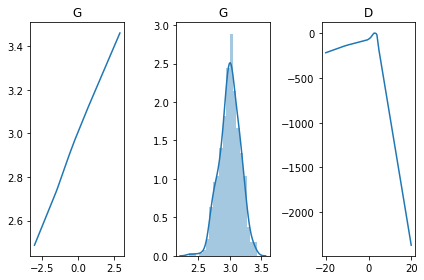

[Epoch 26504/50000] [D loss: 0.011382] [G loss: -0.075577]
[Epoch 26508/50000] [D loss: 0.051091] [G loss: -0.145150]
[Epoch 26512/50000] [D loss: 0.026907] [G loss: -0.189674]
[Epoch 26516/50000] [D loss: 0.027401] [G loss: -0.183478]
[Epoch 26520/50000] [D loss: -0.019815] [G loss: -0.087241]
[Epoch 26524/50000] [D loss: -0.092625] [G loss: 0.316883]
[Epoch 26528/50000] [D loss: -0.149880] [G loss: -0.230123]
[Epoch 26532/50000] [D loss: -0.168741] [G loss: -0.384724]
[Epoch 26536/50000] [D loss: -0.204913] [G loss: 0.231789]
[Epoch 26540/50000] [D loss: -0.242864] [G loss: -1.033718]
[Epoch 26544/50000] [D loss: -0.089569] [G loss: -0.090961]
[Epoch 26548/50000] [D loss: -0.109346] [G loss: -0.063300]
[Epoch 26552/50000] [D loss: -0.037154] [G loss: 0.053221]
[Epoch 26556/50000] [D loss: 0.004726] [G loss: 0.459010]
[Epoch 26560/50000] [D loss: 0.012079] [G loss: -0.818131]
[Epoch 26564/50000] [D loss: 0.221567] [G loss: -1.166827]
[Epoch 26568/50000] [D loss: 0.123599] [G loss: -0.

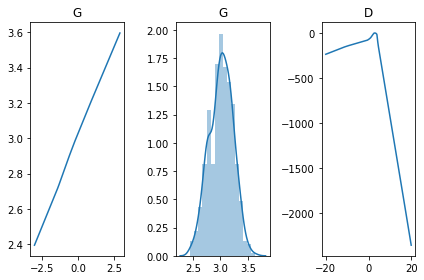

[Epoch 26604/50000] [D loss: -0.030713] [G loss: 0.397480]
[Epoch 26608/50000] [D loss: -0.161864] [G loss: 0.443576]
[Epoch 26612/50000] [D loss: -0.012789] [G loss: 0.378740]
[Epoch 26616/50000] [D loss: -0.024332] [G loss: 0.289847]
[Epoch 26620/50000] [D loss: -0.060333] [G loss: 0.400592]
[Epoch 26624/50000] [D loss: 0.044932] [G loss: 0.313959]
[Epoch 26628/50000] [D loss: -0.045061] [G loss: 0.276581]
[Epoch 26632/50000] [D loss: -0.004793] [G loss: 0.210968]
[Epoch 26636/50000] [D loss: -0.017551] [G loss: 0.241224]
[Epoch 26640/50000] [D loss: -0.039227] [G loss: 0.303894]
[Epoch 26644/50000] [D loss: -0.073590] [G loss: 0.337163]
[Epoch 26648/50000] [D loss: -0.104444] [G loss: 0.408406]
[Epoch 26652/50000] [D loss: -0.164850] [G loss: 0.471408]
[Epoch 26656/50000] [D loss: -0.090363] [G loss: 0.089862]
[Epoch 26660/50000] [D loss: -0.059299] [G loss: 0.654612]
[Epoch 26664/50000] [D loss: -0.073131] [G loss: 0.159376]
[Epoch 26668/50000] [D loss: -0.087294] [G loss: -0.86972

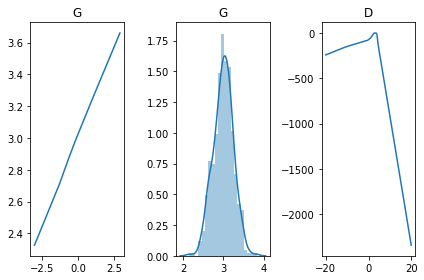

[Epoch 26704/50000] [D loss: -0.141633] [G loss: -0.969398]
[Epoch 26708/50000] [D loss: -0.147851] [G loss: -0.598356]
[Epoch 26712/50000] [D loss: -0.101335] [G loss: 0.262081]
[Epoch 26716/50000] [D loss: -0.122227] [G loss: 0.377915]
[Epoch 26720/50000] [D loss: -0.133478] [G loss: 0.436313]
[Epoch 26724/50000] [D loss: -0.115734] [G loss: 0.408199]
[Epoch 26728/50000] [D loss: 0.000882] [G loss: 0.411818]
[Epoch 26732/50000] [D loss: -0.103230] [G loss: 0.395852]
[Epoch 26736/50000] [D loss: -0.100252] [G loss: 0.416183]
[Epoch 26740/50000] [D loss: -0.050843] [G loss: 0.350168]
[Epoch 26744/50000] [D loss: -0.033762] [G loss: 0.335388]
[Epoch 26748/50000] [D loss: 0.028739] [G loss: 0.347649]
[Epoch 26752/50000] [D loss: -0.004424] [G loss: 0.414116]
[Epoch 26756/50000] [D loss: -0.026865] [G loss: 0.403348]
[Epoch 26760/50000] [D loss: -0.019845] [G loss: 0.303693]
[Epoch 26764/50000] [D loss: -0.052572] [G loss: 0.512971]
[Epoch 26768/50000] [D loss: -0.095971] [G loss: 0.46747

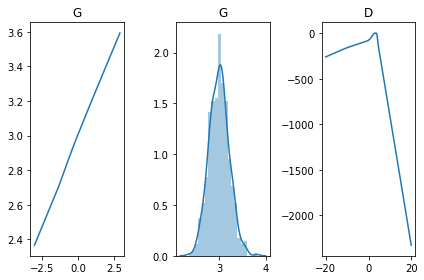

[Epoch 26804/50000] [D loss: 0.029372] [G loss: -0.666197]
[Epoch 26808/50000] [D loss: -0.040278] [G loss: -0.448325]
[Epoch 26812/50000] [D loss: -0.049131] [G loss: -0.254223]
[Epoch 26816/50000] [D loss: 0.051432] [G loss: -0.258728]
[Epoch 26820/50000] [D loss: -0.124847] [G loss: -0.243400]
[Epoch 26824/50000] [D loss: -0.001295] [G loss: -0.228301]
[Epoch 26828/50000] [D loss: -0.056872] [G loss: -0.317089]
[Epoch 26832/50000] [D loss: -0.114593] [G loss: -0.342172]
[Epoch 26836/50000] [D loss: -0.129600] [G loss: -0.255136]
[Epoch 26840/50000] [D loss: -0.123688] [G loss: -0.178599]
[Epoch 26844/50000] [D loss: -0.129656] [G loss: -0.171699]
[Epoch 26848/50000] [D loss: -0.052351] [G loss: -0.147007]
[Epoch 26852/50000] [D loss: -0.094648] [G loss: -0.118258]
[Epoch 26856/50000] [D loss: -0.107110] [G loss: -0.218665]
[Epoch 26860/50000] [D loss: -0.017454] [G loss: -0.181516]
[Epoch 26864/50000] [D loss: -0.007388] [G loss: -0.152612]
[Epoch 26868/50000] [D loss: -0.018302] [G

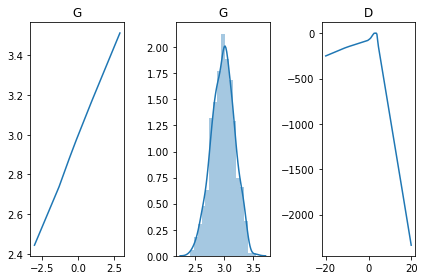

[Epoch 26904/50000] [D loss: -0.082005] [G loss: 0.247862]
[Epoch 26908/50000] [D loss: -0.049782] [G loss: 0.397395]
[Epoch 26912/50000] [D loss: -0.046988] [G loss: 0.715509]
[Epoch 26916/50000] [D loss: -0.130981] [G loss: 0.099097]
[Epoch 26920/50000] [D loss: -0.021670] [G loss: 0.184760]
[Epoch 26924/50000] [D loss: -0.121624] [G loss: -0.759423]
[Epoch 26928/50000] [D loss: -0.146802] [G loss: -0.540049]
[Epoch 26932/50000] [D loss: -0.085321] [G loss: -0.515801]
[Epoch 26936/50000] [D loss: -0.059483] [G loss: -0.497909]
[Epoch 26940/50000] [D loss: -0.038740] [G loss: -0.619695]
[Epoch 26944/50000] [D loss: -0.031539] [G loss: -0.523356]
[Epoch 26948/50000] [D loss: -0.033338] [G loss: -0.417803]
[Epoch 26952/50000] [D loss: -0.048417] [G loss: -0.505901]
[Epoch 26956/50000] [D loss: -0.120525] [G loss: 1.041049]
[Epoch 26960/50000] [D loss: -0.043938] [G loss: 0.732146]
[Epoch 26964/50000] [D loss: -0.041531] [G loss: 0.575518]
[Epoch 26968/50000] [D loss: -0.107668] [G loss:

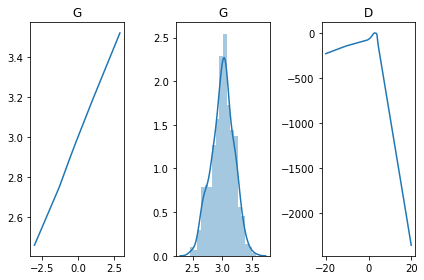

[Epoch 27004/50000] [D loss: -0.000336] [G loss: 0.855678]
[Epoch 27008/50000] [D loss: -0.114080] [G loss: 0.858925]
[Epoch 27012/50000] [D loss: -0.015784] [G loss: 0.866817]
[Epoch 27016/50000] [D loss: -0.028730] [G loss: 0.901928]
[Epoch 27020/50000] [D loss: -0.098894] [G loss: 0.827403]
[Epoch 27024/50000] [D loss: -0.029737] [G loss: 0.748383]
[Epoch 27028/50000] [D loss: -0.082168] [G loss: 0.811088]
[Epoch 27032/50000] [D loss: -0.048590] [G loss: 0.771432]
[Epoch 27036/50000] [D loss: -0.066282] [G loss: 0.905649]
[Epoch 27040/50000] [D loss: -0.087382] [G loss: 0.891296]
[Epoch 27044/50000] [D loss: -0.117056] [G loss: 0.749703]
[Epoch 27048/50000] [D loss: -0.121442] [G loss: 1.037939]
[Epoch 27052/50000] [D loss: -0.086597] [G loss: -0.731751]
[Epoch 27056/50000] [D loss: -0.059323] [G loss: -0.509978]
[Epoch 27060/50000] [D loss: -0.123684] [G loss: -0.172801]
[Epoch 27064/50000] [D loss: -0.060555] [G loss: -0.258191]
[Epoch 27068/50000] [D loss: 0.036609] [G loss: -0.3

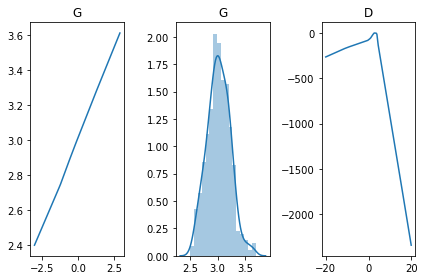

[Epoch 27104/50000] [D loss: -0.127376] [G loss: 0.526366]
[Epoch 27108/50000] [D loss: -0.063730] [G loss: 0.166660]
[Epoch 27112/50000] [D loss: -0.065408] [G loss: 0.731885]
[Epoch 27116/50000] [D loss: -0.046687] [G loss: 0.514692]
[Epoch 27120/50000] [D loss: -0.090168] [G loss: 1.218467]
[Epoch 27124/50000] [D loss: -0.118158] [G loss: 0.873660]
[Epoch 27128/50000] [D loss: -0.022174] [G loss: 0.602200]
[Epoch 27132/50000] [D loss: 0.017200] [G loss: 0.833522]
[Epoch 27136/50000] [D loss: -0.045714] [G loss: 0.915485]
[Epoch 27140/50000] [D loss: -0.047140] [G loss: 0.997669]
[Epoch 27144/50000] [D loss: -0.067952] [G loss: 0.869257]
[Epoch 27148/50000] [D loss: -0.019601] [G loss: 0.814288]
[Epoch 27152/50000] [D loss: -0.113767] [G loss: 1.033033]
[Epoch 27156/50000] [D loss: -0.077493] [G loss: -0.272585]
[Epoch 27160/50000] [D loss: -0.038747] [G loss: -0.100231]
[Epoch 27164/50000] [D loss: -0.101253] [G loss: -0.355200]
[Epoch 27168/50000] [D loss: -0.069375] [G loss: -0.16

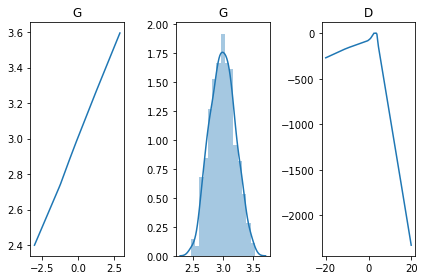

[Epoch 27204/50000] [D loss: -0.038307] [G loss: -0.351977]
[Epoch 27208/50000] [D loss: -0.051763] [G loss: -0.354311]
[Epoch 27212/50000] [D loss: -0.059949] [G loss: -0.189488]
[Epoch 27216/50000] [D loss: -0.050027] [G loss: -0.206858]
[Epoch 27220/50000] [D loss: -0.077299] [G loss: -0.386273]
[Epoch 27224/50000] [D loss: -0.036365] [G loss: -0.468898]
[Epoch 27228/50000] [D loss: 0.000741] [G loss: -0.482982]
[Epoch 27232/50000] [D loss: -0.086106] [G loss: -0.531102]
[Epoch 27236/50000] [D loss: -0.101455] [G loss: -0.530749]
[Epoch 27240/50000] [D loss: 0.012846] [G loss: -0.485628]
[Epoch 27244/50000] [D loss: -0.121974] [G loss: -0.358539]
[Epoch 27248/50000] [D loss: -0.050094] [G loss: -0.273762]
[Epoch 27252/50000] [D loss: -0.046458] [G loss: -0.318938]
[Epoch 27256/50000] [D loss: -0.038498] [G loss: -0.276705]
[Epoch 27260/50000] [D loss: -0.082386] [G loss: -0.306993]
[Epoch 27264/50000] [D loss: -0.087567] [G loss: -0.253541]
[Epoch 27268/50000] [D loss: -0.062461] [G

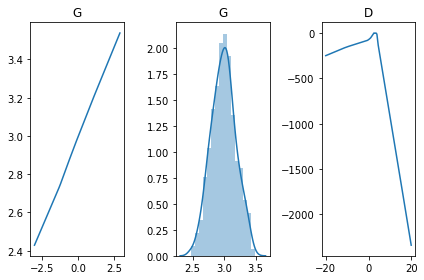

[Epoch 27304/50000] [D loss: -0.089115] [G loss: -0.263415]
[Epoch 27308/50000] [D loss: -0.057743] [G loss: -0.025257]
[Epoch 27312/50000] [D loss: -0.001383] [G loss: 0.157948]
[Epoch 27316/50000] [D loss: 0.022832] [G loss: 0.101456]
[Epoch 27320/50000] [D loss: -0.048676] [G loss: 0.227912]
[Epoch 27324/50000] [D loss: -0.046469] [G loss: 0.178645]
[Epoch 27328/50000] [D loss: 0.027312] [G loss: 0.178750]
[Epoch 27332/50000] [D loss: -0.042631] [G loss: 0.237403]
[Epoch 27336/50000] [D loss: 0.030382] [G loss: 0.045996]
[Epoch 27340/50000] [D loss: -0.038298] [G loss: 0.385482]
[Epoch 27344/50000] [D loss: -0.015325] [G loss: 0.423775]
[Epoch 27348/50000] [D loss: -0.003139] [G loss: 0.316725]
[Epoch 27352/50000] [D loss: -0.009843] [G loss: 0.230492]
[Epoch 27356/50000] [D loss: -0.091789] [G loss: 0.151955]
[Epoch 27360/50000] [D loss: -0.072167] [G loss: 0.308759]
[Epoch 27364/50000] [D loss: -0.081636] [G loss: 0.217411]
[Epoch 27368/50000] [D loss: -0.058772] [G loss: 0.217761

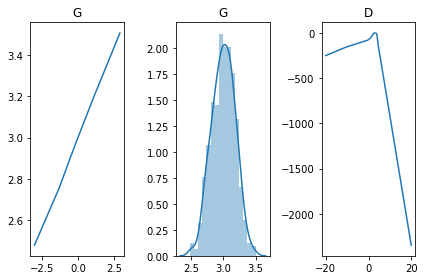

[Epoch 27404/50000] [D loss: -0.016536] [G loss: 0.653985]
[Epoch 27408/50000] [D loss: -0.044150] [G loss: 0.050219]
[Epoch 27412/50000] [D loss: -0.058378] [G loss: -0.772680]
[Epoch 27416/50000] [D loss: -0.024192] [G loss: -0.224609]
[Epoch 27420/50000] [D loss: -0.077078] [G loss: -0.358739]
[Epoch 27424/50000] [D loss: -0.092378] [G loss: -0.195601]
[Epoch 27428/50000] [D loss: -0.025899] [G loss: -0.486122]
[Epoch 27432/50000] [D loss: -0.098382] [G loss: -0.239383]
[Epoch 27436/50000] [D loss: -0.060474] [G loss: 0.104595]
[Epoch 27440/50000] [D loss: -0.075568] [G loss: 0.413576]
[Epoch 27444/50000] [D loss: -0.097117] [G loss: 0.173527]
[Epoch 27448/50000] [D loss: -0.158193] [G loss: 0.534133]
[Epoch 27452/50000] [D loss: 0.063444] [G loss: 0.232947]
[Epoch 27456/50000] [D loss: -0.097253] [G loss: 0.626691]
[Epoch 27460/50000] [D loss: -0.038988] [G loss: 0.695855]
[Epoch 27464/50000] [D loss: 0.007021] [G loss: 0.694118]
[Epoch 27468/50000] [D loss: -0.082081] [G loss: 0.7

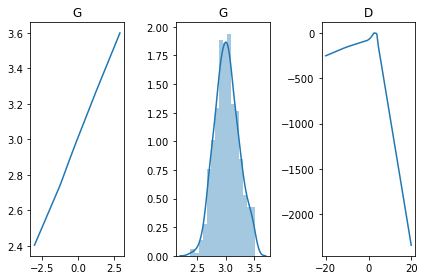

[Epoch 27504/50000] [D loss: 0.030591] [G loss: -0.482675]
[Epoch 27508/50000] [D loss: 0.018564] [G loss: -0.480770]
[Epoch 27512/50000] [D loss: 0.015833] [G loss: -0.488645]
[Epoch 27516/50000] [D loss: -0.016283] [G loss: -0.547881]
[Epoch 27520/50000] [D loss: 0.019574] [G loss: -0.556936]
[Epoch 27524/50000] [D loss: -0.027217] [G loss: -0.505175]
[Epoch 27528/50000] [D loss: -0.019216] [G loss: -0.420224]
[Epoch 27532/50000] [D loss: -0.035039] [G loss: -0.282881]
[Epoch 27536/50000] [D loss: -0.033812] [G loss: -0.156757]
[Epoch 27540/50000] [D loss: 0.000414] [G loss: -0.046940]
[Epoch 27544/50000] [D loss: -0.068453] [G loss: 0.489314]
[Epoch 27548/50000] [D loss: -0.081365] [G loss: 0.404770]
[Epoch 27552/50000] [D loss: -0.057412] [G loss: 0.448147]
[Epoch 27556/50000] [D loss: -0.114222] [G loss: -1.242992]
[Epoch 27560/50000] [D loss: -0.066842] [G loss: -1.152002]
[Epoch 27564/50000] [D loss: -0.085975] [G loss: -0.888245]
[Epoch 27568/50000] [D loss: -0.065181] [G loss:

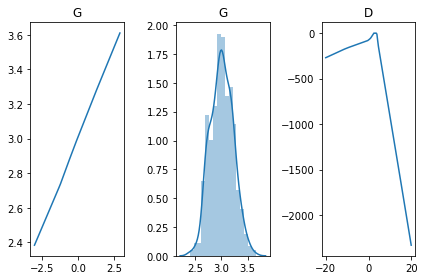

[Epoch 27604/50000] [D loss: -0.007446] [G loss: 0.141457]
[Epoch 27608/50000] [D loss: -0.092541] [G loss: 0.175760]
[Epoch 27612/50000] [D loss: -0.064734] [G loss: 0.020863]
[Epoch 27616/50000] [D loss: -0.062243] [G loss: -1.094876]
[Epoch 27620/50000] [D loss: -0.053668] [G loss: 0.222920]
[Epoch 27624/50000] [D loss: 0.004587] [G loss: 0.710942]
[Epoch 27628/50000] [D loss: 0.003407] [G loss: 0.653491]
[Epoch 27632/50000] [D loss: -0.008807] [G loss: 0.521300]
[Epoch 27636/50000] [D loss: -0.002304] [G loss: 0.336101]
[Epoch 27640/50000] [D loss: -0.022320] [G loss: 0.240076]
[Epoch 27644/50000] [D loss: -0.015339] [G loss: 0.383788]
[Epoch 27648/50000] [D loss: 0.003338] [G loss: 0.453017]
[Epoch 27652/50000] [D loss: -0.047698] [G loss: 0.475060]
[Epoch 27656/50000] [D loss: -0.008871] [G loss: 0.435185]
[Epoch 27660/50000] [D loss: -0.013619] [G loss: 0.420812]
[Epoch 27664/50000] [D loss: -0.015140] [G loss: 0.440796]
[Epoch 27668/50000] [D loss: 0.019329] [G loss: 0.417121]


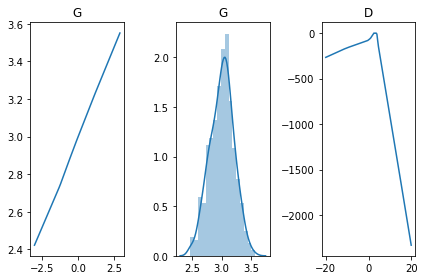

[Epoch 27704/50000] [D loss: -0.101887] [G loss: -0.531298]
[Epoch 27708/50000] [D loss: -0.095525] [G loss: -0.269845]
[Epoch 27712/50000] [D loss: -0.075376] [G loss: -0.138469]
[Epoch 27716/50000] [D loss: -0.102956] [G loss: -0.411726]
[Epoch 27720/50000] [D loss: -0.029325] [G loss: -0.400366]
[Epoch 27724/50000] [D loss: -0.076310] [G loss: -0.325516]
[Epoch 27728/50000] [D loss: -0.037413] [G loss: -0.255561]
[Epoch 27732/50000] [D loss: -0.018586] [G loss: -0.327041]
[Epoch 27736/50000] [D loss: -0.049067] [G loss: -0.354874]
[Epoch 27740/50000] [D loss: -0.075209] [G loss: -0.284589]
[Epoch 27744/50000] [D loss: -0.032683] [G loss: -0.287211]
[Epoch 27748/50000] [D loss: -0.044313] [G loss: -0.180874]
[Epoch 27752/50000] [D loss: -0.002865] [G loss: -0.285459]
[Epoch 27756/50000] [D loss: -0.050354] [G loss: -0.391257]
[Epoch 27760/50000] [D loss: -0.082988] [G loss: -0.456453]
[Epoch 27764/50000] [D loss: -0.103472] [G loss: -0.530186]
[Epoch 27768/50000] [D loss: -0.110941] 

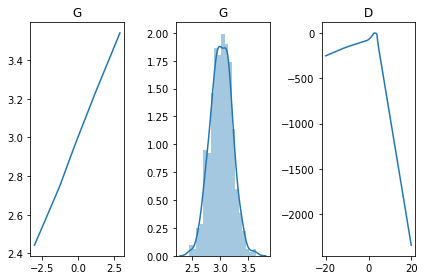

[Epoch 27804/50000] [D loss: -0.081217] [G loss: 0.333649]
[Epoch 27808/50000] [D loss: -0.042075] [G loss: 0.451537]
[Epoch 27812/50000] [D loss: -0.044782] [G loss: 0.460987]
[Epoch 27816/50000] [D loss: -0.072207] [G loss: 0.460122]
[Epoch 27820/50000] [D loss: -0.062424] [G loss: 0.453013]
[Epoch 27824/50000] [D loss: -0.068788] [G loss: 0.484830]
[Epoch 27828/50000] [D loss: -0.075279] [G loss: 0.542491]
[Epoch 27832/50000] [D loss: -0.046965] [G loss: 0.315905]
[Epoch 27836/50000] [D loss: -0.097812] [G loss: 0.506653]
[Epoch 27840/50000] [D loss: -0.080417] [G loss: -1.259479]
[Epoch 27844/50000] [D loss: -0.101355] [G loss: 0.079352]
[Epoch 27848/50000] [D loss: -0.037171] [G loss: 0.710620]
[Epoch 27852/50000] [D loss: -0.047909] [G loss: 0.016573]
[Epoch 27856/50000] [D loss: -0.088431] [G loss: 0.351790]
[Epoch 27860/50000] [D loss: -0.038781] [G loss: 0.028844]
[Epoch 27864/50000] [D loss: -0.083973] [G loss: 0.354096]
[Epoch 27868/50000] [D loss: -0.065490] [G loss: 0.2531

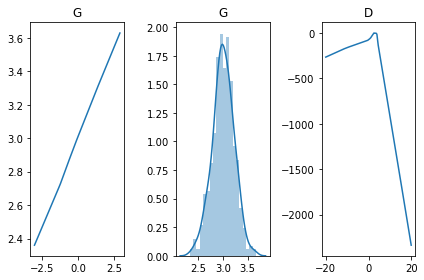

[Epoch 27904/50000] [D loss: -0.070904] [G loss: 0.308964]
[Epoch 27908/50000] [D loss: -0.108346] [G loss: 0.244763]
[Epoch 27912/50000] [D loss: -0.036076] [G loss: 0.052184]
[Epoch 27916/50000] [D loss: -0.100844] [G loss: -1.142974]
[Epoch 27920/50000] [D loss: -0.091642] [G loss: 0.517701]
[Epoch 27924/50000] [D loss: -0.100143] [G loss: 0.466418]
[Epoch 27928/50000] [D loss: -0.111565] [G loss: 0.301180]
[Epoch 27932/50000] [D loss: -0.053227] [G loss: 0.324765]
[Epoch 27936/50000] [D loss: -0.033380] [G loss: 0.231664]
[Epoch 27940/50000] [D loss: -0.040236] [G loss: 0.251798]
[Epoch 27944/50000] [D loss: -0.054699] [G loss: 0.289835]
[Epoch 27948/50000] [D loss: -0.044905] [G loss: 0.314977]
[Epoch 27952/50000] [D loss: -0.049692] [G loss: 0.435052]
[Epoch 27956/50000] [D loss: -0.030303] [G loss: 0.438859]
[Epoch 27960/50000] [D loss: -0.061284] [G loss: 0.167347]
[Epoch 27964/50000] [D loss: -0.078909] [G loss: 0.070678]
[Epoch 27968/50000] [D loss: -0.088093] [G loss: 0.3410

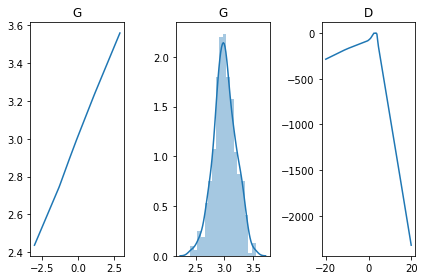

[Epoch 28004/50000] [D loss: -0.052232] [G loss: 0.259140]
[Epoch 28008/50000] [D loss: -0.078788] [G loss: 0.359849]
[Epoch 28012/50000] [D loss: -0.119289] [G loss: 0.498694]
[Epoch 28016/50000] [D loss: -0.143717] [G loss: 0.605381]
[Epoch 28020/50000] [D loss: -0.003943] [G loss: 0.233906]
[Epoch 28024/50000] [D loss: -0.097406] [G loss: -1.117028]
[Epoch 28028/50000] [D loss: -0.094218] [G loss: -0.988883]
[Epoch 28032/50000] [D loss: -0.037307] [G loss: -0.813554]
[Epoch 28036/50000] [D loss: -0.054209] [G loss: -0.737082]
[Epoch 28040/50000] [D loss: -0.054881] [G loss: -0.790736]
[Epoch 28044/50000] [D loss: -0.066586] [G loss: -0.749906]
[Epoch 28048/50000] [D loss: -0.103058] [G loss: -0.703834]
[Epoch 28052/50000] [D loss: -0.096880] [G loss: -0.510022]
[Epoch 28056/50000] [D loss: -0.106097] [G loss: 0.156323]
[Epoch 28060/50000] [D loss: -0.106040] [G loss: 0.195297]
[Epoch 28064/50000] [D loss: -0.087906] [G loss: 0.021052]
[Epoch 28068/50000] [D loss: -0.060960] [G loss:

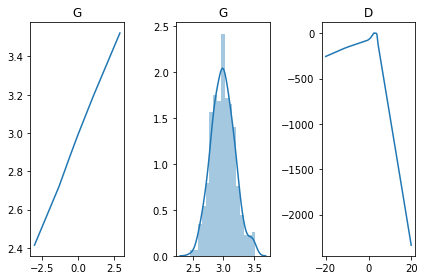

[Epoch 28104/50000] [D loss: -0.036140] [G loss: -0.077207]
[Epoch 28108/50000] [D loss: -0.055128] [G loss: -0.100664]
[Epoch 28112/50000] [D loss: -0.049064] [G loss: -0.095903]
[Epoch 28116/50000] [D loss: -0.078618] [G loss: -0.244203]
[Epoch 28120/50000] [D loss: -0.101616] [G loss: -0.426152]
[Epoch 28124/50000] [D loss: -0.105832] [G loss: -0.226383]
[Epoch 28128/50000] [D loss: -0.073319] [G loss: -0.341771]
[Epoch 28132/50000] [D loss: -0.063360] [G loss: -0.313799]
[Epoch 28136/50000] [D loss: -0.095354] [G loss: -0.298736]
[Epoch 28140/50000] [D loss: -0.126867] [G loss: -0.284482]
[Epoch 28144/50000] [D loss: -0.049853] [G loss: -0.160468]
[Epoch 28148/50000] [D loss: -0.161207] [G loss: 0.133300]
[Epoch 28152/50000] [D loss: -0.033366] [G loss: 0.081195]
[Epoch 28156/50000] [D loss: -0.037997] [G loss: 0.127866]
[Epoch 28160/50000] [D loss: 0.027624] [G loss: 0.114398]
[Epoch 28164/50000] [D loss: -0.003904] [G loss: 0.118027]
[Epoch 28168/50000] [D loss: -0.003769] [G los

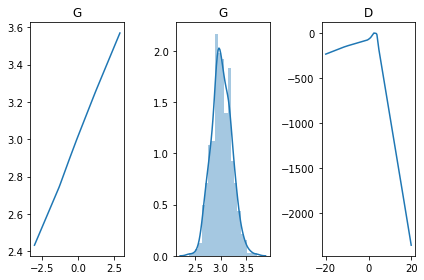

[Epoch 28204/50000] [D loss: -0.086282] [G loss: 0.262371]
[Epoch 28208/50000] [D loss: -0.084492] [G loss: 0.190591]
[Epoch 28212/50000] [D loss: -0.043890] [G loss: 0.052225]
[Epoch 28216/50000] [D loss: -0.075415] [G loss: -0.069808]
[Epoch 28220/50000] [D loss: -0.074321] [G loss: -0.197401]
[Epoch 28224/50000] [D loss: -0.072971] [G loss: -0.172525]
[Epoch 28228/50000] [D loss: -0.049516] [G loss: -0.220193]
[Epoch 28232/50000] [D loss: -0.047813] [G loss: -0.194764]
[Epoch 28236/50000] [D loss: -0.068770] [G loss: -0.227693]
[Epoch 28240/50000] [D loss: -0.075568] [G loss: -0.216973]
[Epoch 28244/50000] [D loss: -0.059576] [G loss: -0.263983]
[Epoch 28248/50000] [D loss: -0.050914] [G loss: -0.205372]
[Epoch 28252/50000] [D loss: -0.066360] [G loss: -0.181676]
[Epoch 28256/50000] [D loss: -0.067815] [G loss: -0.176049]
[Epoch 28260/50000] [D loss: -0.092363] [G loss: -0.725946]
[Epoch 28264/50000] [D loss: -0.049268] [G loss: -0.588904]
[Epoch 28268/50000] [D loss: -0.081286] [G 

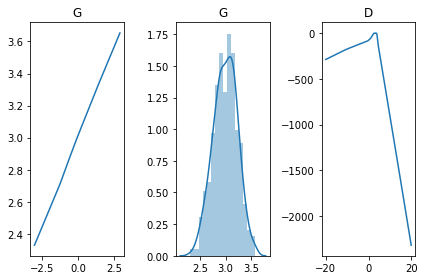

[Epoch 28304/50000] [D loss: 0.007137] [G loss: -0.507347]
[Epoch 28308/50000] [D loss: -0.078704] [G loss: -0.435230]
[Epoch 28312/50000] [D loss: -0.068576] [G loss: -0.272619]
[Epoch 28316/50000] [D loss: -0.071286] [G loss: -0.532279]
[Epoch 28320/50000] [D loss: -0.076882] [G loss: 0.089895]
[Epoch 28324/50000] [D loss: -0.061453] [G loss: 0.068178]
[Epoch 28328/50000] [D loss: -0.100575] [G loss: 0.794829]
[Epoch 28332/50000] [D loss: -0.096524] [G loss: 0.606295]
[Epoch 28336/50000] [D loss: -0.117123] [G loss: 0.574416]
[Epoch 28340/50000] [D loss: -0.044528] [G loss: 0.163032]
[Epoch 28344/50000] [D loss: -0.036803] [G loss: 0.257042]
[Epoch 28348/50000] [D loss: -0.017794] [G loss: 0.364463]
[Epoch 28352/50000] [D loss: -0.065235] [G loss: 0.382265]
[Epoch 28356/50000] [D loss: 0.029651] [G loss: 0.470031]
[Epoch 28360/50000] [D loss: 0.004009] [G loss: 0.517950]
[Epoch 28364/50000] [D loss: -0.005679] [G loss: 0.529222]
[Epoch 28368/50000] [D loss: -0.051999] [G loss: 0.5349

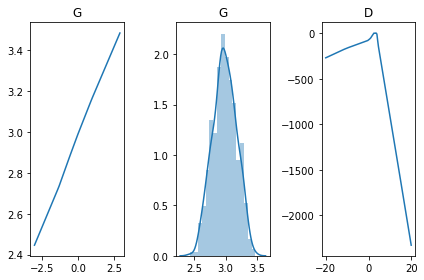

[Epoch 28404/50000] [D loss: -0.096822] [G loss: -0.333498]
[Epoch 28408/50000] [D loss: -0.074968] [G loss: -0.160686]
[Epoch 28412/50000] [D loss: -0.147107] [G loss: -0.280956]
[Epoch 28416/50000] [D loss: -0.024907] [G loss: -0.076942]
[Epoch 28420/50000] [D loss: -0.167031] [G loss: -0.269518]
[Epoch 28424/50000] [D loss: -0.184021] [G loss: -0.395049]
[Epoch 28428/50000] [D loss: -0.105808] [G loss: -0.521649]
[Epoch 28432/50000] [D loss: -0.076834] [G loss: -0.499995]
[Epoch 28436/50000] [D loss: 0.067592] [G loss: -0.583561]
[Epoch 28440/50000] [D loss: -0.018797] [G loss: -0.465231]
[Epoch 28444/50000] [D loss: -0.062284] [G loss: -0.390487]
[Epoch 28448/50000] [D loss: -0.025002] [G loss: -0.331236]
[Epoch 28452/50000] [D loss: -0.070672] [G loss: -0.275324]
[Epoch 28456/50000] [D loss: -0.082079] [G loss: -0.343043]
[Epoch 28460/50000] [D loss: -0.037605] [G loss: -0.473890]
[Epoch 28464/50000] [D loss: -0.102457] [G loss: -0.554239]
[Epoch 28468/50000] [D loss: -0.099638] [

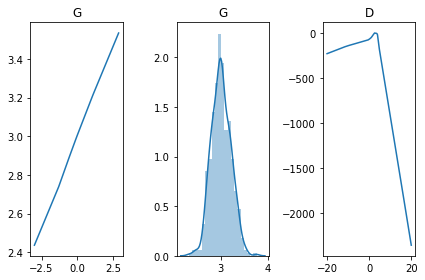

[Epoch 28504/50000] [D loss: 0.040310] [G loss: -0.160196]
[Epoch 28508/50000] [D loss: -0.074852] [G loss: -0.177651]
[Epoch 28512/50000] [D loss: -0.066601] [G loss: -0.272020]
[Epoch 28516/50000] [D loss: -0.081088] [G loss: -0.250992]
[Epoch 28520/50000] [D loss: -0.069158] [G loss: -0.264434]
[Epoch 28524/50000] [D loss: -0.008189] [G loss: -0.240211]
[Epoch 28528/50000] [D loss: -0.041236] [G loss: -0.226804]
[Epoch 28532/50000] [D loss: -0.068790] [G loss: -0.097030]
[Epoch 28536/50000] [D loss: -0.093631] [G loss: -0.337909]
[Epoch 28540/50000] [D loss: -0.081153] [G loss: -0.108520]
[Epoch 28544/50000] [D loss: -0.046016] [G loss: -0.710883]
[Epoch 28548/50000] [D loss: -0.055639] [G loss: -0.464601]
[Epoch 28552/50000] [D loss: -0.078371] [G loss: -0.180755]
[Epoch 28556/50000] [D loss: -0.042852] [G loss: -0.515500]
[Epoch 28560/50000] [D loss: -0.086581] [G loss: -0.203010]
[Epoch 28564/50000] [D loss: -0.073074] [G loss: -0.067236]
[Epoch 28568/50000] [D loss: 0.043688] [G

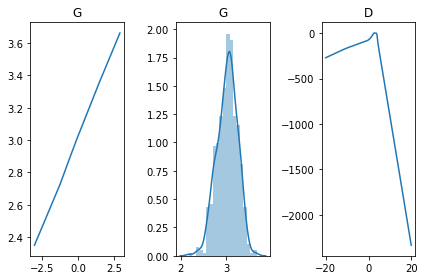

[Epoch 28604/50000] [D loss: -0.184556] [G loss: -0.436084]
[Epoch 28608/50000] [D loss: -0.097348] [G loss: 0.075185]
[Epoch 28612/50000] [D loss: -0.062030] [G loss: -0.229987]
[Epoch 28616/50000] [D loss: -0.085748] [G loss: -0.279774]
[Epoch 28620/50000] [D loss: -0.115169] [G loss: -0.318256]
[Epoch 28624/50000] [D loss: -0.133957] [G loss: -0.264027]
[Epoch 28628/50000] [D loss: -0.059546] [G loss: -0.180000]
[Epoch 28632/50000] [D loss: -0.087961] [G loss: -0.258421]
[Epoch 28636/50000] [D loss: -0.005476] [G loss: -0.224324]
[Epoch 28640/50000] [D loss: 0.002596] [G loss: -0.212556]
[Epoch 28644/50000] [D loss: 0.003931] [G loss: -0.249840]
[Epoch 28648/50000] [D loss: -0.031767] [G loss: -0.195468]
[Epoch 28652/50000] [D loss: -0.039327] [G loss: -0.279657]
[Epoch 28656/50000] [D loss: -0.038514] [G loss: -0.259541]
[Epoch 28660/50000] [D loss: -0.036322] [G loss: -0.211220]
[Epoch 28664/50000] [D loss: -0.031155] [G loss: -0.152172]
[Epoch 28668/50000] [D loss: -0.032643] [G 

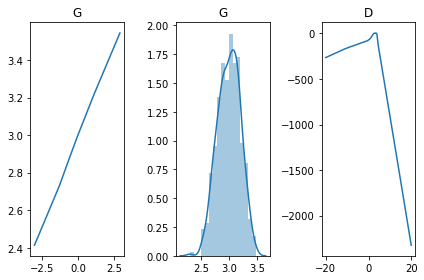

[Epoch 28704/50000] [D loss: -0.023201] [G loss: 0.576912]
[Epoch 28708/50000] [D loss: -0.057080] [G loss: -0.462555]
[Epoch 28712/50000] [D loss: -0.078616] [G loss: -0.395207]
[Epoch 28716/50000] [D loss: -0.060474] [G loss: -0.269056]
[Epoch 28720/50000] [D loss: 0.014678] [G loss: -0.390109]
[Epoch 28724/50000] [D loss: -0.041697] [G loss: -0.354822]
[Epoch 28728/50000] [D loss: 0.051717] [G loss: -0.396580]
[Epoch 28732/50000] [D loss: -0.028594] [G loss: -0.458983]
[Epoch 28736/50000] [D loss: -0.104270] [G loss: -0.452644]
[Epoch 28740/50000] [D loss: -0.095582] [G loss: -0.416929]
[Epoch 28744/50000] [D loss: -0.068509] [G loss: -0.580864]
[Epoch 28748/50000] [D loss: -0.014678] [G loss: 0.036502]
[Epoch 28752/50000] [D loss: -0.046152] [G loss: 0.543545]
[Epoch 28756/50000] [D loss: -0.011646] [G loss: 0.419412]
[Epoch 28760/50000] [D loss: -0.045062] [G loss: 0.393474]
[Epoch 28764/50000] [D loss: -0.040492] [G loss: 0.287278]
[Epoch 28768/50000] [D loss: -0.046800] [G loss:

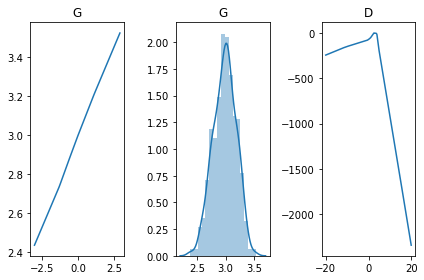

[Epoch 28804/50000] [D loss: -0.029424] [G loss: 0.290039]
[Epoch 28808/50000] [D loss: -0.012448] [G loss: 0.343439]
[Epoch 28812/50000] [D loss: -0.010545] [G loss: 0.421201]
[Epoch 28816/50000] [D loss: -0.005845] [G loss: 0.585807]
[Epoch 28820/50000] [D loss: -0.012611] [G loss: 0.334189]
[Epoch 28824/50000] [D loss: -0.034002] [G loss: 0.322553]
[Epoch 28828/50000] [D loss: -0.027219] [G loss: 0.427627]
[Epoch 28832/50000] [D loss: -0.022924] [G loss: 0.569314]
[Epoch 28836/50000] [D loss: 0.028534] [G loss: 0.638037]
[Epoch 28840/50000] [D loss: -0.070744] [G loss: 0.084977]
[Epoch 28844/50000] [D loss: -0.088555] [G loss: 0.229431]
[Epoch 28848/50000] [D loss: -0.043471] [G loss: 0.106088]
[Epoch 28852/50000] [D loss: -0.089665] [G loss: 0.514627]
[Epoch 28856/50000] [D loss: 0.011130] [G loss: -0.021773]
[Epoch 28860/50000] [D loss: -0.037890] [G loss: -0.595430]
[Epoch 28864/50000] [D loss: -0.089007] [G loss: -0.400138]
[Epoch 28868/50000] [D loss: -0.082073] [G loss: -0.409

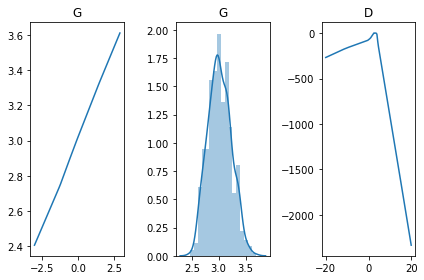

[Epoch 28904/50000] [D loss: -0.093014] [G loss: -0.565827]
[Epoch 28908/50000] [D loss: -0.049839] [G loss: 0.200961]
[Epoch 28912/50000] [D loss: -0.043816] [G loss: 0.012907]
[Epoch 28916/50000] [D loss: -0.067865] [G loss: -0.919715]
[Epoch 28920/50000] [D loss: -0.138240] [G loss: -0.590373]
[Epoch 28924/50000] [D loss: -0.070821] [G loss: -0.703097]
[Epoch 28928/50000] [D loss: -0.004954] [G loss: -0.619381]
[Epoch 28932/50000] [D loss: -0.058798] [G loss: -0.661048]
[Epoch 28936/50000] [D loss: -0.103153] [G loss: -0.604201]
[Epoch 28940/50000] [D loss: -0.022266] [G loss: -0.407341]
[Epoch 28944/50000] [D loss: 0.013859] [G loss: -0.083742]
[Epoch 28948/50000] [D loss: -0.078934] [G loss: -0.188818]
[Epoch 28952/50000] [D loss: -0.050774] [G loss: -0.254952]
[Epoch 28956/50000] [D loss: -0.024110] [G loss: -0.249031]
[Epoch 28960/50000] [D loss: -0.042780] [G loss: -0.266797]
[Epoch 28964/50000] [D loss: -0.074989] [G loss: -0.137474]
[Epoch 28968/50000] [D loss: -0.028367] [G 

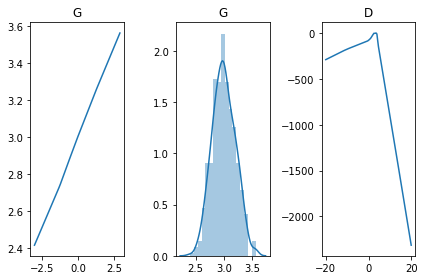

[Epoch 29004/50000] [D loss: -0.102828] [G loss: -0.372426]
[Epoch 29008/50000] [D loss: -0.082906] [G loss: -0.387512]
[Epoch 29012/50000] [D loss: -0.092414] [G loss: -0.410170]
[Epoch 29016/50000] [D loss: -0.049290] [G loss: -0.442473]
[Epoch 29020/50000] [D loss: -0.038233] [G loss: -0.466513]
[Epoch 29024/50000] [D loss: -0.045763] [G loss: -0.425384]
[Epoch 29028/50000] [D loss: -0.007340] [G loss: -0.390522]
[Epoch 29032/50000] [D loss: -0.005951] [G loss: -0.461944]
[Epoch 29036/50000] [D loss: -0.064883] [G loss: -0.543628]
[Epoch 29040/50000] [D loss: -0.127587] [G loss: -0.583174]
[Epoch 29044/50000] [D loss: -0.073508] [G loss: -0.397577]
[Epoch 29048/50000] [D loss: -0.118069] [G loss: -0.267042]
[Epoch 29052/50000] [D loss: -0.135042] [G loss: -0.255902]
[Epoch 29056/50000] [D loss: -0.081314] [G loss: -0.207349]
[Epoch 29060/50000] [D loss: -0.102086] [G loss: -0.229149]
[Epoch 29064/50000] [D loss: -0.159140] [G loss: 0.037142]
[Epoch 29068/50000] [D loss: -0.101893] [

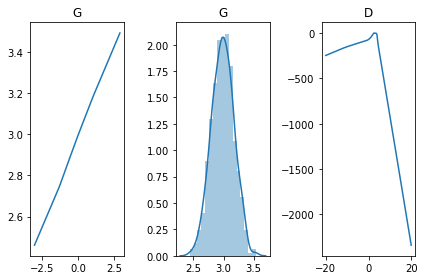

[Epoch 29104/50000] [D loss: -0.034350] [G loss: -0.231532]
[Epoch 29108/50000] [D loss: -0.046506] [G loss: -0.145583]
[Epoch 29112/50000] [D loss: -0.063752] [G loss: -0.198136]
[Epoch 29116/50000] [D loss: -0.026102] [G loss: -0.085089]
[Epoch 29120/50000] [D loss: -0.091418] [G loss: -0.124848]
[Epoch 29124/50000] [D loss: -0.105982] [G loss: 0.801583]
[Epoch 29128/50000] [D loss: -0.110811] [G loss: 0.778024]
[Epoch 29132/50000] [D loss: -0.147255] [G loss: 1.054698]
[Epoch 29136/50000] [D loss: -0.075288] [G loss: -0.733172]
[Epoch 29140/50000] [D loss: -0.072791] [G loss: -0.365877]
[Epoch 29144/50000] [D loss: -0.135936] [G loss: 0.459974]
[Epoch 29148/50000] [D loss: -0.057939] [G loss: 0.142579]
[Epoch 29152/50000] [D loss: -0.056197] [G loss: 0.167144]
[Epoch 29156/50000] [D loss: -0.034062] [G loss: 0.244245]
[Epoch 29160/50000] [D loss: -0.056020] [G loss: 0.220553]
[Epoch 29164/50000] [D loss: -0.039406] [G loss: 0.121857]
[Epoch 29168/50000] [D loss: -0.058776] [G loss: 

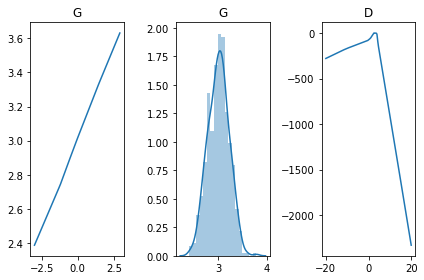

[Epoch 29204/50000] [D loss: -0.109101] [G loss: 0.370141]
[Epoch 29208/50000] [D loss: -0.082018] [G loss: 0.310065]
[Epoch 29212/50000] [D loss: -0.105432] [G loss: 0.143432]
[Epoch 29216/50000] [D loss: 0.024246] [G loss: 0.716966]
[Epoch 29220/50000] [D loss: -0.054216] [G loss: 0.408313]
[Epoch 29224/50000] [D loss: -0.095962] [G loss: 0.329936]
[Epoch 29228/50000] [D loss: -0.082010] [G loss: 0.409594]
[Epoch 29232/50000] [D loss: -0.005841] [G loss: 0.435558]
[Epoch 29236/50000] [D loss: -0.052901] [G loss: 0.363105]
[Epoch 29240/50000] [D loss: 0.032898] [G loss: 0.337168]
[Epoch 29244/50000] [D loss: -0.002884] [G loss: 0.376936]
[Epoch 29248/50000] [D loss: 0.005354] [G loss: 0.290471]
[Epoch 29252/50000] [D loss: -0.064347] [G loss: 0.163109]
[Epoch 29256/50000] [D loss: -0.010703] [G loss: -0.380236]
[Epoch 29260/50000] [D loss: -0.048163] [G loss: -0.216905]
[Epoch 29264/50000] [D loss: -0.047653] [G loss: -0.253729]
[Epoch 29268/50000] [D loss: -0.051169] [G loss: -0.2594

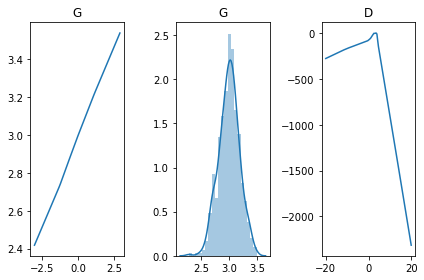

[Epoch 29304/50000] [D loss: -0.134169] [G loss: -0.174483]
[Epoch 29308/50000] [D loss: -0.092066] [G loss: -0.483959]
[Epoch 29312/50000] [D loss: 0.020913] [G loss: -0.406373]
[Epoch 29316/50000] [D loss: -0.091025] [G loss: -0.388338]
[Epoch 29320/50000] [D loss: -0.022870] [G loss: -0.446810]
[Epoch 29324/50000] [D loss: -0.026701] [G loss: -0.480510]
[Epoch 29328/50000] [D loss: -0.024568] [G loss: -0.514086]
[Epoch 29332/50000] [D loss: -0.029413] [G loss: -0.513714]
[Epoch 29336/50000] [D loss: -0.017346] [G loss: -0.620376]
[Epoch 29340/50000] [D loss: -0.047611] [G loss: -0.660049]
[Epoch 29344/50000] [D loss: -0.026135] [G loss: -0.910814]
[Epoch 29348/50000] [D loss: -0.127206] [G loss: -1.020147]
[Epoch 29352/50000] [D loss: -0.172434] [G loss: 0.532803]
[Epoch 29356/50000] [D loss: -0.141124] [G loss: 0.312083]
[Epoch 29360/50000] [D loss: -0.118181] [G loss: 0.384076]
[Epoch 29364/50000] [D loss: -0.103114] [G loss: 0.332238]
[Epoch 29368/50000] [D loss: -0.027378] [G lo

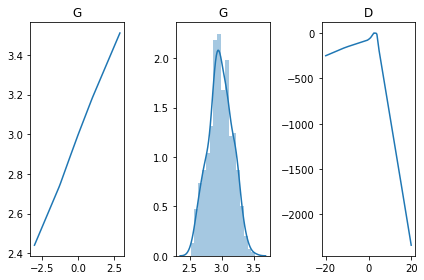

[Epoch 29404/50000] [D loss: -0.047891] [G loss: 0.386251]
[Epoch 29408/50000] [D loss: -0.056589] [G loss: 0.373415]
[Epoch 29412/50000] [D loss: -0.036533] [G loss: 0.480023]
[Epoch 29416/50000] [D loss: -0.082264] [G loss: 0.466827]
[Epoch 29420/50000] [D loss: -0.114120] [G loss: 0.461471]
[Epoch 29424/50000] [D loss: -0.109424] [G loss: 0.381769]
[Epoch 29428/50000] [D loss: -0.088060] [G loss: 0.467307]
[Epoch 29432/50000] [D loss: -0.099635] [G loss: 0.468226]
[Epoch 29436/50000] [D loss: -0.090575] [G loss: 0.533101]
[Epoch 29440/50000] [D loss: -0.046250] [G loss: 0.026261]
[Epoch 29444/50000] [D loss: -0.111051] [G loss: 0.048383]
[Epoch 29448/50000] [D loss: -0.012533] [G loss: 0.365353]
[Epoch 29452/50000] [D loss: -0.043648] [G loss: 0.293731]
[Epoch 29456/50000] [D loss: -0.066703] [G loss: 0.328954]
[Epoch 29460/50000] [D loss: -0.022853] [G loss: 0.195213]
[Epoch 29464/50000] [D loss: 0.031930] [G loss: 0.067034]
[Epoch 29468/50000] [D loss: -0.056363] [G loss: -0.22243

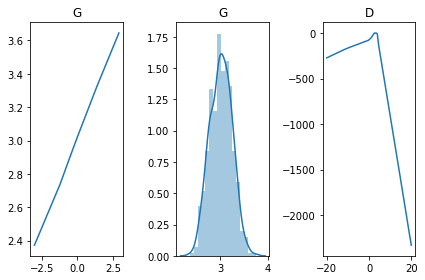

[Epoch 29504/50000] [D loss: -0.108693] [G loss: 0.401383]
[Epoch 29508/50000] [D loss: -0.081793] [G loss: 0.287208]
[Epoch 29512/50000] [D loss: -0.088110] [G loss: 0.230613]
[Epoch 29516/50000] [D loss: -0.102453] [G loss: 0.312683]
[Epoch 29520/50000] [D loss: -0.019385] [G loss: 0.388209]
[Epoch 29524/50000] [D loss: -0.097881] [G loss: 0.391405]
[Epoch 29528/50000] [D loss: -0.063169] [G loss: 0.347762]
[Epoch 29532/50000] [D loss: -0.039189] [G loss: 0.325805]
[Epoch 29536/50000] [D loss: -0.107120] [G loss: 0.333792]
[Epoch 29540/50000] [D loss: -0.070883] [G loss: 0.372065]
[Epoch 29544/50000] [D loss: -0.068763] [G loss: 0.284255]
[Epoch 29548/50000] [D loss: -0.067211] [G loss: 0.279790]
[Epoch 29552/50000] [D loss: -0.025818] [G loss: 0.246169]
[Epoch 29556/50000] [D loss: -0.017759] [G loss: 0.278596]
[Epoch 29560/50000] [D loss: -0.064443] [G loss: 0.370589]
[Epoch 29564/50000] [D loss: -0.087565] [G loss: 0.383529]
[Epoch 29568/50000] [D loss: -0.072756] [G loss: 0.43023

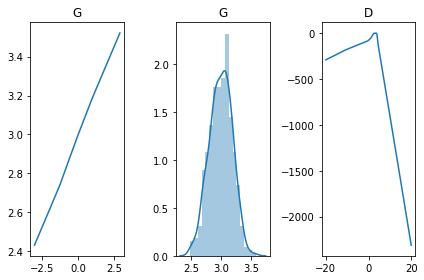

[Epoch 29604/50000] [D loss: -0.045198] [G loss: -0.478447]
[Epoch 29608/50000] [D loss: -0.056733] [G loss: -0.312471]
[Epoch 29612/50000] [D loss: -0.037955] [G loss: -0.412242]
[Epoch 29616/50000] [D loss: -0.079879] [G loss: -0.346046]
[Epoch 29620/50000] [D loss: -0.047263] [G loss: -0.461698]
[Epoch 29624/50000] [D loss: -0.013215] [G loss: -0.449500]
[Epoch 29628/50000] [D loss: -0.057587] [G loss: -0.429332]
[Epoch 29632/50000] [D loss: -0.016929] [G loss: -0.369783]
[Epoch 29636/50000] [D loss: -0.062014] [G loss: -0.476488]
[Epoch 29640/50000] [D loss: -0.085390] [G loss: -0.511561]
[Epoch 29644/50000] [D loss: -0.039137] [G loss: -0.498674]
[Epoch 29648/50000] [D loss: -0.106933] [G loss: 0.060993]
[Epoch 29652/50000] [D loss: -0.132329] [G loss: -0.348090]
[Epoch 29656/50000] [D loss: -0.160174] [G loss: -0.081786]
[Epoch 29660/50000] [D loss: -0.121669] [G loss: -0.181300]
[Epoch 29664/50000] [D loss: -0.154117] [G loss: -0.172440]
[Epoch 29668/50000] [D loss: -0.095341] [

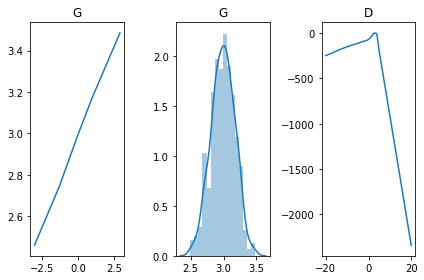

[Epoch 29704/50000] [D loss: -0.043675] [G loss: -0.222295]
[Epoch 29708/50000] [D loss: -0.054421] [G loss: -0.211941]
[Epoch 29712/50000] [D loss: -0.063165] [G loss: -0.231724]
[Epoch 29716/50000] [D loss: -0.059097] [G loss: -0.190535]
[Epoch 29720/50000] [D loss: -0.065365] [G loss: -0.058908]
[Epoch 29724/50000] [D loss: -0.081640] [G loss: -0.612960]
[Epoch 29728/50000] [D loss: -0.103733] [G loss: -0.487796]
[Epoch 29732/50000] [D loss: -0.120841] [G loss: -0.339797]
[Epoch 29736/50000] [D loss: -0.146408] [G loss: -0.116339]
[Epoch 29740/50000] [D loss: -0.102620] [G loss: -0.053892]
[Epoch 29744/50000] [D loss: -0.152830] [G loss: -0.113108]
[Epoch 29748/50000] [D loss: -0.075653] [G loss: -0.372314]
[Epoch 29752/50000] [D loss: -0.142832] [G loss: -0.325878]
[Epoch 29756/50000] [D loss: -0.078126] [G loss: -0.422902]
[Epoch 29760/50000] [D loss: -0.040575] [G loss: -0.393637]
[Epoch 29764/50000] [D loss: -0.119396] [G loss: -0.328274]
[Epoch 29768/50000] [D loss: -0.069957] 

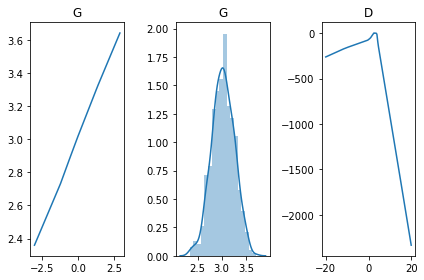

[Epoch 29804/50000] [D loss: -0.032746] [G loss: 0.034932]
[Epoch 29808/50000] [D loss: -0.127986] [G loss: 1.060846]
[Epoch 29812/50000] [D loss: -0.128126] [G loss: 0.872826]
[Epoch 29816/50000] [D loss: -0.086164] [G loss: 0.682886]
[Epoch 29820/50000] [D loss: -0.128283] [G loss: 0.784135]
[Epoch 29824/50000] [D loss: -0.044645] [G loss: 0.646089]
[Epoch 29828/50000] [D loss: -0.116976] [G loss: 0.961904]
[Epoch 29832/50000] [D loss: -0.038702] [G loss: 0.915505]
[Epoch 29836/50000] [D loss: -0.092202] [G loss: 0.903469]
[Epoch 29840/50000] [D loss: -0.053829] [G loss: 0.805751]
[Epoch 29844/50000] [D loss: -0.034137] [G loss: 0.801533]
[Epoch 29848/50000] [D loss: -0.038807] [G loss: 0.876784]
[Epoch 29852/50000] [D loss: -0.061054] [G loss: 0.925427]
[Epoch 29856/50000] [D loss: -0.049168] [G loss: 0.939791]
[Epoch 29860/50000] [D loss: -0.060211] [G loss: 0.980528]
[Epoch 29864/50000] [D loss: -0.091830] [G loss: 0.625013]
[Epoch 29868/50000] [D loss: -0.097974] [G loss: 0.89827

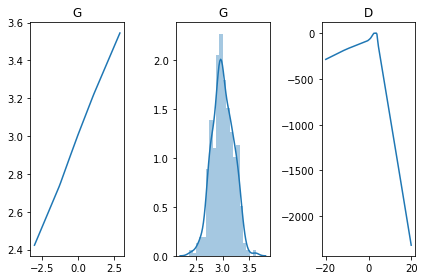

[Epoch 29904/50000] [D loss: -0.048468] [G loss: 0.191860]
[Epoch 29908/50000] [D loss: 0.004077] [G loss: 0.154202]
[Epoch 29912/50000] [D loss: -0.038206] [G loss: 0.242442]
[Epoch 29916/50000] [D loss: -0.058692] [G loss: 0.306334]
[Epoch 29920/50000] [D loss: -0.046953] [G loss: 0.291958]
[Epoch 29924/50000] [D loss: -0.073809] [G loss: 0.273223]
[Epoch 29928/50000] [D loss: -0.044310] [G loss: 0.248525]
[Epoch 29932/50000] [D loss: -0.037236] [G loss: 0.151975]
[Epoch 29936/50000] [D loss: -0.036113] [G loss: 0.063227]
[Epoch 29940/50000] [D loss: -0.073803] [G loss: 0.069944]
[Epoch 29944/50000] [D loss: -0.133828] [G loss: 0.327432]
[Epoch 29948/50000] [D loss: -0.107476] [G loss: 0.437203]
[Epoch 29952/50000] [D loss: -0.132728] [G loss: 0.365809]
[Epoch 29956/50000] [D loss: -0.104071] [G loss: 0.330977]
[Epoch 29960/50000] [D loss: -0.110802] [G loss: 0.267020]
[Epoch 29964/50000] [D loss: -0.112393] [G loss: 0.344941]
[Epoch 29968/50000] [D loss: -0.055581] [G loss: 0.253127

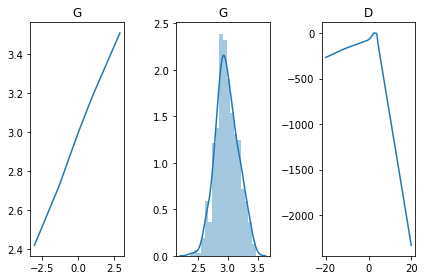

[Epoch 30004/50000] [D loss: -0.031631] [G loss: 0.236091]
[Epoch 30008/50000] [D loss: -0.079236] [G loss: 0.291686]
[Epoch 30012/50000] [D loss: -0.086720] [G loss: 0.431683]
[Epoch 30016/50000] [D loss: -0.070797] [G loss: 0.429972]
[Epoch 30020/50000] [D loss: -0.091408] [G loss: 0.339897]
[Epoch 30024/50000] [D loss: -0.086539] [G loss: 0.302533]
[Epoch 30028/50000] [D loss: -0.072507] [G loss: 0.261952]
[Epoch 30032/50000] [D loss: -0.067429] [G loss: 0.296771]
[Epoch 30036/50000] [D loss: -0.079397] [G loss: 0.218670]
[Epoch 30040/50000] [D loss: -0.071021] [G loss: 0.189181]
[Epoch 30044/50000] [D loss: -0.106551] [G loss: 0.062652]
[Epoch 30048/50000] [D loss: -0.079669] [G loss: 0.175076]
[Epoch 30052/50000] [D loss: -0.102667] [G loss: 0.164509]
[Epoch 30056/50000] [D loss: -0.068490] [G loss: 0.171778]
[Epoch 30060/50000] [D loss: -0.107427] [G loss: 0.276248]
[Epoch 30064/50000] [D loss: -0.066148] [G loss: 0.257770]
[Epoch 30068/50000] [D loss: -0.043587] [G loss: 0.19107

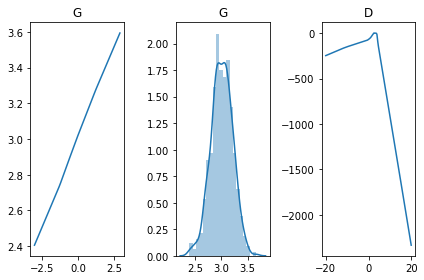

[Epoch 30104/50000] [D loss: -0.101563] [G loss: 0.340016]
[Epoch 30108/50000] [D loss: -0.096453] [G loss: 0.316385]
[Epoch 30112/50000] [D loss: -0.064174] [G loss: 0.115078]
[Epoch 30116/50000] [D loss: -0.072608] [G loss: 0.122635]
[Epoch 30120/50000] [D loss: -0.088135] [G loss: -0.050563]
[Epoch 30124/50000] [D loss: -0.111707] [G loss: -0.196449]
[Epoch 30128/50000] [D loss: -0.090431] [G loss: -0.189572]
[Epoch 30132/50000] [D loss: -0.078140] [G loss: -0.170121]
[Epoch 30136/50000] [D loss: -0.054593] [G loss: -0.227855]
[Epoch 30140/50000] [D loss: -0.064149] [G loss: -0.278837]
[Epoch 30144/50000] [D loss: -0.053010] [G loss: -0.259797]
[Epoch 30148/50000] [D loss: -0.043814] [G loss: -0.292683]
[Epoch 30152/50000] [D loss: -0.065684] [G loss: -0.270906]
[Epoch 30156/50000] [D loss: -0.080995] [G loss: -0.244171]
[Epoch 30160/50000] [D loss: -0.060043] [G loss: -0.262751]
[Epoch 30164/50000] [D loss: -0.071413] [G loss: -0.162127]
[Epoch 30168/50000] [D loss: -0.025676] [G l

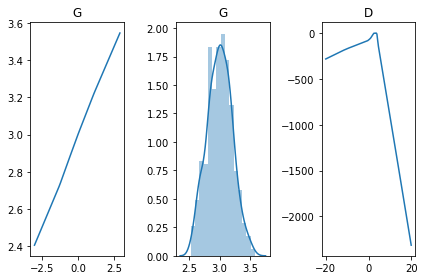

[Epoch 30204/50000] [D loss: -0.064088] [G loss: -0.253663]
[Epoch 30208/50000] [D loss: -0.062493] [G loss: -0.372197]
[Epoch 30212/50000] [D loss: -0.081349] [G loss: -0.409474]
[Epoch 30216/50000] [D loss: -0.037018] [G loss: -0.490540]
[Epoch 30220/50000] [D loss: -0.084531] [G loss: -0.389986]
[Epoch 30224/50000] [D loss: -0.062158] [G loss: -0.392466]
[Epoch 30228/50000] [D loss: -0.044320] [G loss: -0.431152]
[Epoch 30232/50000] [D loss: -0.080405] [G loss: -0.424683]
[Epoch 30236/50000] [D loss: -0.055520] [G loss: -0.399849]
[Epoch 30240/50000] [D loss: -0.082543] [G loss: -0.367589]
[Epoch 30244/50000] [D loss: -0.066127] [G loss: -0.443230]
[Epoch 30248/50000] [D loss: -0.040506] [G loss: -0.468301]
[Epoch 30252/50000] [D loss: -0.091828] [G loss: -0.502258]
[Epoch 30256/50000] [D loss: -0.101721] [G loss: -0.461624]
[Epoch 30260/50000] [D loss: -0.083885] [G loss: -0.252281]
[Epoch 30264/50000] [D loss: -0.100829] [G loss: -0.355006]
[Epoch 30268/50000] [D loss: -0.073936] 

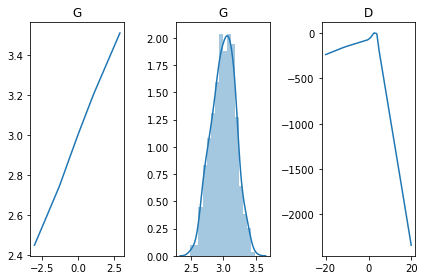

[Epoch 30304/50000] [D loss: -0.067441] [G loss: -0.238034]
[Epoch 30308/50000] [D loss: -0.068538] [G loss: -0.288933]
[Epoch 30312/50000] [D loss: -0.064752] [G loss: -0.221350]
[Epoch 30316/50000] [D loss: -0.061031] [G loss: -0.254035]
[Epoch 30320/50000] [D loss: -0.070914] [G loss: -0.216350]
[Epoch 30324/50000] [D loss: -0.052886] [G loss: -0.188964]
[Epoch 30328/50000] [D loss: -0.044175] [G loss: -0.288770]
[Epoch 30332/50000] [D loss: -0.093707] [G loss: -0.189779]
[Epoch 30336/50000] [D loss: -0.075133] [G loss: -0.064619]
[Epoch 30340/50000] [D loss: -0.063882] [G loss: -0.120102]
[Epoch 30344/50000] [D loss: -0.118227] [G loss: 0.133770]
[Epoch 30348/50000] [D loss: -0.145746] [G loss: 0.552820]
[Epoch 30352/50000] [D loss: -0.118351] [G loss: 0.899696]
[Epoch 30356/50000] [D loss: -0.107098] [G loss: 0.349443]
[Epoch 30360/50000] [D loss: -0.133374] [G loss: 0.289215]
[Epoch 30364/50000] [D loss: -0.072561] [G loss: 0.156326]
[Epoch 30368/50000] [D loss: -0.097156] [G los

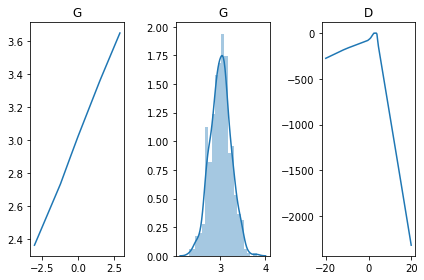

[Epoch 30404/50000] [D loss: -0.055428] [G loss: 0.421737]
[Epoch 30408/50000] [D loss: -0.071316] [G loss: 0.281211]
[Epoch 30412/50000] [D loss: -0.077218] [G loss: 0.185222]
[Epoch 30416/50000] [D loss: -0.089293] [G loss: 0.139966]
[Epoch 30420/50000] [D loss: -0.116469] [G loss: 0.222521]
[Epoch 30424/50000] [D loss: -0.113978] [G loss: 0.374379]
[Epoch 30428/50000] [D loss: -0.130279] [G loss: 0.373085]
[Epoch 30432/50000] [D loss: -0.127070] [G loss: 0.370592]
[Epoch 30436/50000] [D loss: -0.123194] [G loss: 0.303205]
[Epoch 30440/50000] [D loss: -0.108747] [G loss: 0.305930]
[Epoch 30444/50000] [D loss: -0.062569] [G loss: 0.276309]
[Epoch 30448/50000] [D loss: -0.079075] [G loss: 0.145153]
[Epoch 30452/50000] [D loss: -0.086286] [G loss: 0.160103]
[Epoch 30456/50000] [D loss: -0.080958] [G loss: 0.256699]
[Epoch 30460/50000] [D loss: -0.051984] [G loss: 0.267684]
[Epoch 30464/50000] [D loss: -0.074160] [G loss: 0.349545]
[Epoch 30468/50000] [D loss: 0.008555] [G loss: 0.296059

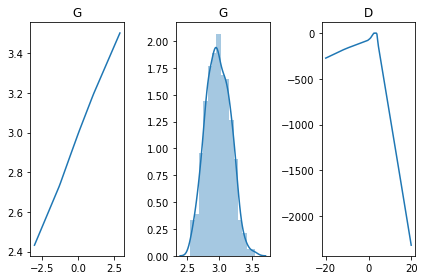

[Epoch 30504/50000] [D loss: -0.099017] [G loss: 0.352831]
[Epoch 30508/50000] [D loss: -0.085285] [G loss: 0.329096]
[Epoch 30512/50000] [D loss: -0.142439] [G loss: 0.290411]
[Epoch 30516/50000] [D loss: -0.115544] [G loss: 0.311972]
[Epoch 30520/50000] [D loss: -0.118067] [G loss: 0.149974]
[Epoch 30524/50000] [D loss: -0.113708] [G loss: 0.164864]
[Epoch 30528/50000] [D loss: -0.083444] [G loss: 0.136154]
[Epoch 30532/50000] [D loss: -0.094245] [G loss: 0.164527]
[Epoch 30536/50000] [D loss: -0.056997] [G loss: 0.103925]
[Epoch 30540/50000] [D loss: -0.035357] [G loss: 0.057581]
[Epoch 30544/50000] [D loss: -0.002830] [G loss: 0.129878]
[Epoch 30548/50000] [D loss: 0.001419] [G loss: 0.173097]
[Epoch 30552/50000] [D loss: -0.039958] [G loss: 0.155395]
[Epoch 30556/50000] [D loss: -0.031614] [G loss: 0.191960]
[Epoch 30560/50000] [D loss: -0.024446] [G loss: 0.175825]
[Epoch 30564/50000] [D loss: -0.027942] [G loss: 0.117685]
[Epoch 30568/50000] [D loss: -0.052843] [G loss: 0.090974

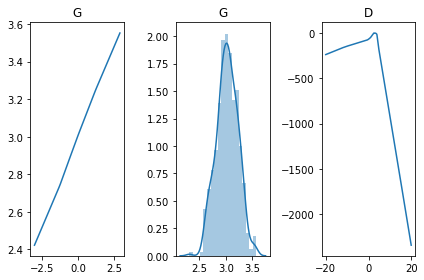

[Epoch 30604/50000] [D loss: -0.097979] [G loss: 0.345601]
[Epoch 30608/50000] [D loss: 0.015990] [G loss: 0.253482]
[Epoch 30612/50000] [D loss: -0.045810] [G loss: 0.346724]
[Epoch 30616/50000] [D loss: -0.039923] [G loss: 0.283674]
[Epoch 30620/50000] [D loss: -0.037659] [G loss: 0.265111]
[Epoch 30624/50000] [D loss: -0.022434] [G loss: 0.201656]
[Epoch 30628/50000] [D loss: -0.037726] [G loss: 0.262337]
[Epoch 30632/50000] [D loss: -0.063926] [G loss: 0.275397]
[Epoch 30636/50000] [D loss: -0.031385] [G loss: 0.350968]
[Epoch 30640/50000] [D loss: -0.064542] [G loss: 0.397231]
[Epoch 30644/50000] [D loss: -0.073330] [G loss: 0.366664]
[Epoch 30648/50000] [D loss: -0.069580] [G loss: 0.309753]
[Epoch 30652/50000] [D loss: -0.084394] [G loss: 0.288538]
[Epoch 30656/50000] [D loss: -0.074597] [G loss: 0.303717]
[Epoch 30660/50000] [D loss: -0.069842] [G loss: 0.277285]
[Epoch 30664/50000] [D loss: -0.080904] [G loss: 0.213446]
[Epoch 30668/50000] [D loss: -0.105807] [G loss: 0.223670

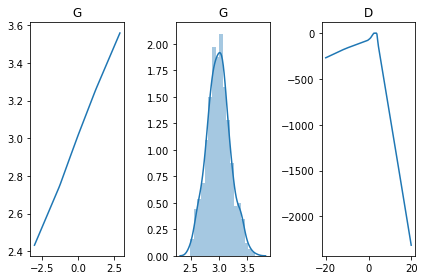

[Epoch 30704/50000] [D loss: -0.074852] [G loss: 0.471431]
[Epoch 30708/50000] [D loss: -0.034862] [G loss: -0.384480]
[Epoch 30712/50000] [D loss: -0.069854] [G loss: -0.290360]
[Epoch 30716/50000] [D loss: -0.082530] [G loss: -0.241934]
[Epoch 30720/50000] [D loss: -0.071016] [G loss: -0.323077]
[Epoch 30724/50000] [D loss: -0.072989] [G loss: -0.271058]
[Epoch 30728/50000] [D loss: -0.086835] [G loss: -0.291050]
[Epoch 30732/50000] [D loss: -0.081791] [G loss: -0.195178]
[Epoch 30736/50000] [D loss: -0.063991] [G loss: -0.252944]
[Epoch 30740/50000] [D loss: -0.078613] [G loss: -0.224480]
[Epoch 30744/50000] [D loss: -0.066968] [G loss: -0.233443]
[Epoch 30748/50000] [D loss: -0.079962] [G loss: -0.308876]
[Epoch 30752/50000] [D loss: -0.099777] [G loss: -0.321211]
[Epoch 30756/50000] [D loss: -0.065508] [G loss: -0.278743]
[Epoch 30760/50000] [D loss: -0.038599] [G loss: -0.335065]
[Epoch 30764/50000] [D loss: -0.071553] [G loss: -0.331172]
[Epoch 30768/50000] [D loss: -0.063209] [

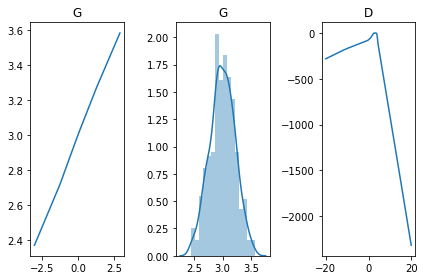

[Epoch 30804/50000] [D loss: -0.073332] [G loss: 0.298139]
[Epoch 30808/50000] [D loss: -0.061582] [G loss: 0.340737]
[Epoch 30812/50000] [D loss: -0.090381] [G loss: 0.337832]
[Epoch 30816/50000] [D loss: -0.055485] [G loss: 0.310047]
[Epoch 30820/50000] [D loss: -0.043659] [G loss: 0.257128]
[Epoch 30824/50000] [D loss: -0.064065] [G loss: 0.264121]
[Epoch 30828/50000] [D loss: -0.047472] [G loss: 0.274751]
[Epoch 30832/50000] [D loss: -0.045183] [G loss: 0.340956]
[Epoch 30836/50000] [D loss: -0.054782] [G loss: 0.401927]
[Epoch 30840/50000] [D loss: -0.091320] [G loss: 0.453592]
[Epoch 30844/50000] [D loss: -0.079977] [G loss: 0.391296]
[Epoch 30848/50000] [D loss: -0.074217] [G loss: 0.370621]
[Epoch 30852/50000] [D loss: -0.085988] [G loss: 0.415274]
[Epoch 30856/50000] [D loss: -0.077849] [G loss: 0.445339]
[Epoch 30860/50000] [D loss: -0.085066] [G loss: 0.508062]
[Epoch 30864/50000] [D loss: -0.065460] [G loss: 0.530442]
[Epoch 30868/50000] [D loss: -0.087682] [G loss: 0.51502

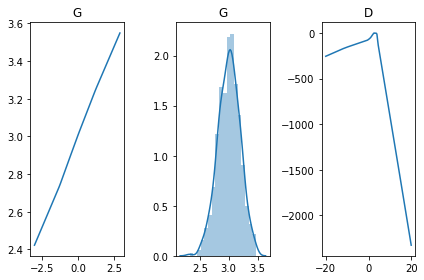

[Epoch 30904/50000] [D loss: -0.067652] [G loss: 0.353657]
[Epoch 30908/50000] [D loss: -0.066661] [G loss: 0.298027]
[Epoch 30912/50000] [D loss: -0.051270] [G loss: 0.223127]
[Epoch 30916/50000] [D loss: -0.064193] [G loss: 0.258595]
[Epoch 30920/50000] [D loss: -0.051443] [G loss: 0.272986]
[Epoch 30924/50000] [D loss: -0.065927] [G loss: 0.277744]
[Epoch 30928/50000] [D loss: -0.061378] [G loss: 0.300813]
[Epoch 30932/50000] [D loss: -0.076811] [G loss: 0.333845]
[Epoch 30936/50000] [D loss: -0.058914] [G loss: 0.272327]
[Epoch 30940/50000] [D loss: -0.057214] [G loss: 0.294861]
[Epoch 30944/50000] [D loss: -0.066661] [G loss: 0.256881]
[Epoch 30948/50000] [D loss: -0.076896] [G loss: 0.343561]
[Epoch 30952/50000] [D loss: -0.075863] [G loss: 0.420206]
[Epoch 30956/50000] [D loss: -0.074718] [G loss: 0.394255]
[Epoch 30960/50000] [D loss: -0.084432] [G loss: 0.424805]
[Epoch 30964/50000] [D loss: -0.068344] [G loss: 0.461265]
[Epoch 30968/50000] [D loss: -0.077631] [G loss: 0.56023

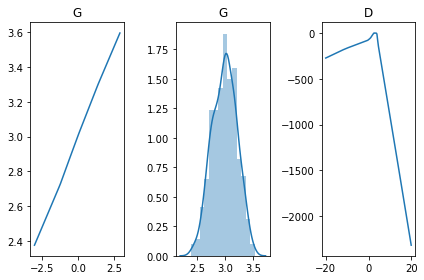

[Epoch 31004/50000] [D loss: -0.079910] [G loss: 0.356454]
[Epoch 31008/50000] [D loss: -0.074560] [G loss: 0.315006]
[Epoch 31012/50000] [D loss: -0.071258] [G loss: 0.269144]
[Epoch 31016/50000] [D loss: -0.047735] [G loss: 0.223269]
[Epoch 31020/50000] [D loss: -0.071530] [G loss: 0.196660]
[Epoch 31024/50000] [D loss: -0.080025] [G loss: 0.195852]
[Epoch 31028/50000] [D loss: -0.053687] [G loss: 0.221256]
[Epoch 31032/50000] [D loss: -0.059210] [G loss: 0.221054]
[Epoch 31036/50000] [D loss: -0.044959] [G loss: 0.245468]
[Epoch 31040/50000] [D loss: -0.073479] [G loss: 0.324746]
[Epoch 31044/50000] [D loss: -0.091344] [G loss: 0.400585]
[Epoch 31048/50000] [D loss: -0.094823] [G loss: 0.377876]
[Epoch 31052/50000] [D loss: -0.059545] [G loss: 0.396957]
[Epoch 31056/50000] [D loss: -0.075325] [G loss: 0.441808]
[Epoch 31060/50000] [D loss: -0.090096] [G loss: 0.496866]
[Epoch 31064/50000] [D loss: -0.057618] [G loss: 0.464386]
[Epoch 31068/50000] [D loss: -0.080738] [G loss: 0.45734

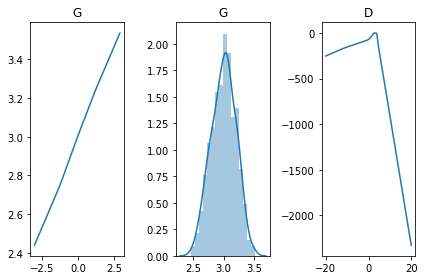

[Epoch 31104/50000] [D loss: -0.056758] [G loss: 0.373713]
[Epoch 31108/50000] [D loss: -0.062295] [G loss: 0.369850]
[Epoch 31112/50000] [D loss: -0.082163] [G loss: 0.386478]
[Epoch 31116/50000] [D loss: -0.076044] [G loss: 0.364989]
[Epoch 31120/50000] [D loss: -0.080704] [G loss: 0.357049]
[Epoch 31124/50000] [D loss: -0.052310] [G loss: 0.304478]
[Epoch 31128/50000] [D loss: -0.064455] [G loss: 0.316700]
[Epoch 31132/50000] [D loss: -0.079891] [G loss: 0.360561]
[Epoch 31136/50000] [D loss: -0.085414] [G loss: 0.396261]
[Epoch 31140/50000] [D loss: -0.084928] [G loss: 0.464279]
[Epoch 31144/50000] [D loss: -0.066948] [G loss: 0.435058]
[Epoch 31148/50000] [D loss: -0.109194] [G loss: 0.457726]
[Epoch 31152/50000] [D loss: -0.064550] [G loss: 0.368631]
[Epoch 31156/50000] [D loss: -0.074709] [G loss: 0.354908]
[Epoch 31160/50000] [D loss: -0.049168] [G loss: 0.287591]
[Epoch 31164/50000] [D loss: -0.081048] [G loss: 0.293818]
[Epoch 31168/50000] [D loss: -0.048764] [G loss: 0.19869

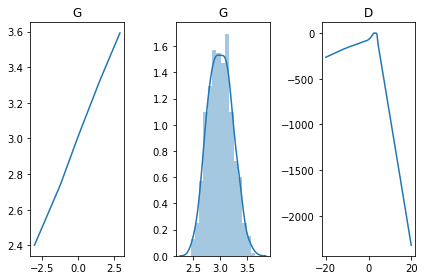

[Epoch 31204/50000] [D loss: -0.076107] [G loss: 0.114709]
[Epoch 31208/50000] [D loss: -0.050415] [G loss: 0.051510]
[Epoch 31212/50000] [D loss: 0.025205] [G loss: 0.811292]
[Epoch 31216/50000] [D loss: -0.051972] [G loss: -0.006991]
[Epoch 31220/50000] [D loss: -0.023571] [G loss: -0.622081]
[Epoch 31224/50000] [D loss: -0.068005] [G loss: 0.566357]
[Epoch 31228/50000] [D loss: -0.054318] [G loss: -0.186771]
[Epoch 31232/50000] [D loss: -0.060347] [G loss: -0.235688]
[Epoch 31236/50000] [D loss: -0.073791] [G loss: -0.395153]
[Epoch 31240/50000] [D loss: -0.133710] [G loss: -0.319368]
[Epoch 31244/50000] [D loss: -0.070879] [G loss: -0.309123]
[Epoch 31248/50000] [D loss: -0.061583] [G loss: -0.280168]
[Epoch 31252/50000] [D loss: -0.059651] [G loss: -0.303250]
[Epoch 31256/50000] [D loss: -0.048125] [G loss: -0.329171]
[Epoch 31260/50000] [D loss: -0.080383] [G loss: -0.313324]
[Epoch 31264/50000] [D loss: -0.073728] [G loss: -0.360259]
[Epoch 31268/50000] [D loss: -0.063378] [G lo

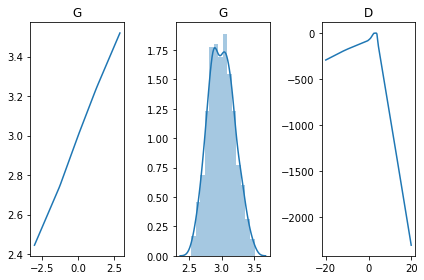

[Epoch 31304/50000] [D loss: -0.024751] [G loss: -0.343749]
[Epoch 31308/50000] [D loss: -0.102873] [G loss: -0.238889]
[Epoch 31312/50000] [D loss: -0.032305] [G loss: -0.327818]
[Epoch 31316/50000] [D loss: -0.093637] [G loss: -0.306286]
[Epoch 31320/50000] [D loss: -0.044818] [G loss: -0.367417]
[Epoch 31324/50000] [D loss: -0.126889] [G loss: -0.350822]
[Epoch 31328/50000] [D loss: -0.044977] [G loss: -0.375816]
[Epoch 31332/50000] [D loss: -0.044806] [G loss: -0.349657]
[Epoch 31336/50000] [D loss: -0.047829] [G loss: -0.482194]
[Epoch 31340/50000] [D loss: -0.066657] [G loss: -0.509287]
[Epoch 31344/50000] [D loss: -0.079157] [G loss: -0.514807]
[Epoch 31348/50000] [D loss: -0.062998] [G loss: -0.534581]
[Epoch 31352/50000] [D loss: -0.096319] [G loss: -0.523827]
[Epoch 31356/50000] [D loss: -0.104204] [G loss: -0.405021]
[Epoch 31360/50000] [D loss: -0.066690] [G loss: -0.382914]
[Epoch 31364/50000] [D loss: -0.132252] [G loss: -0.350896]
[Epoch 31368/50000] [D loss: -0.102205] 

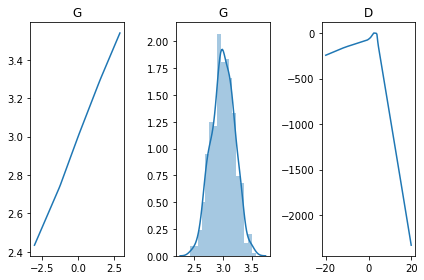

[Epoch 31404/50000] [D loss: -0.069865] [G loss: -0.207939]
[Epoch 31408/50000] [D loss: -0.065794] [G loss: -0.295034]
[Epoch 31412/50000] [D loss: -0.040965] [G loss: -0.295862]
[Epoch 31416/50000] [D loss: -0.035089] [G loss: -0.381881]
[Epoch 31420/50000] [D loss: -0.064691] [G loss: -0.460129]
[Epoch 31424/50000] [D loss: -0.055900] [G loss: -0.494587]
[Epoch 31428/50000] [D loss: -0.095001] [G loss: -0.460396]
[Epoch 31432/50000] [D loss: -0.087718] [G loss: -0.411250]
[Epoch 31436/50000] [D loss: -0.091660] [G loss: -0.366740]
[Epoch 31440/50000] [D loss: -0.087056] [G loss: -0.306715]
[Epoch 31444/50000] [D loss: -0.079614] [G loss: -0.290076]
[Epoch 31448/50000] [D loss: -0.109629] [G loss: -0.197368]
[Epoch 31452/50000] [D loss: -0.142252] [G loss: -0.167099]
[Epoch 31456/50000] [D loss: -0.080907] [G loss: -0.252015]
[Epoch 31460/50000] [D loss: -0.074538] [G loss: -0.220029]
[Epoch 31464/50000] [D loss: -0.133704] [G loss: -0.241726]
[Epoch 31468/50000] [D loss: -0.074567] 

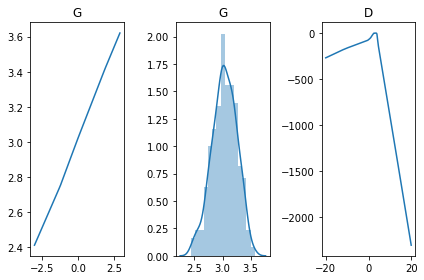

[Epoch 31504/50000] [D loss: -0.062399] [G loss: -0.376948]
[Epoch 31508/50000] [D loss: -0.054774] [G loss: -0.390066]
[Epoch 31512/50000] [D loss: -0.121910] [G loss: -0.338894]
[Epoch 31516/50000] [D loss: -0.093220] [G loss: -0.236691]
[Epoch 31520/50000] [D loss: -0.117949] [G loss: -0.215952]
[Epoch 31524/50000] [D loss: -0.060203] [G loss: -0.156151]
[Epoch 31528/50000] [D loss: -0.095268] [G loss: -0.150101]
[Epoch 31532/50000] [D loss: -0.120153] [G loss: -0.098615]
[Epoch 31536/50000] [D loss: -0.106421] [G loss: 0.167580]
[Epoch 31540/50000] [D loss: -0.072816] [G loss: 0.031037]
[Epoch 31544/50000] [D loss: -0.093208] [G loss: -0.128186]
[Epoch 31548/50000] [D loss: -0.071405] [G loss: -0.202608]
[Epoch 31552/50000] [D loss: -0.076972] [G loss: -0.230189]
[Epoch 31556/50000] [D loss: -0.024756] [G loss: -0.233750]
[Epoch 31560/50000] [D loss: -0.103216] [G loss: -0.274623]
[Epoch 31564/50000] [D loss: -0.081263] [G loss: -0.303050]
[Epoch 31568/50000] [D loss: -0.076702] [G

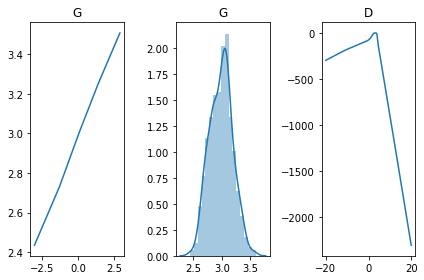

[Epoch 31604/50000] [D loss: -0.074337] [G loss: -0.176924]
[Epoch 31608/50000] [D loss: -0.083182] [G loss: -0.156685]
[Epoch 31612/50000] [D loss: -0.106895] [G loss: -0.155010]
[Epoch 31616/50000] [D loss: -0.089307] [G loss: 0.041241]
[Epoch 31620/50000] [D loss: -0.085633] [G loss: -0.020473]
[Epoch 31624/50000] [D loss: -0.079150] [G loss: 0.132111]
[Epoch 31628/50000] [D loss: -0.043229] [G loss: 0.002636]
[Epoch 31632/50000] [D loss: -0.099913] [G loss: 0.139477]
[Epoch 31636/50000] [D loss: -0.078745] [G loss: 0.248540]
[Epoch 31640/50000] [D loss: -0.084871] [G loss: 0.243532]
[Epoch 31644/50000] [D loss: -0.076474] [G loss: 0.239853]
[Epoch 31648/50000] [D loss: -0.090381] [G loss: 0.284544]
[Epoch 31652/50000] [D loss: -0.081447] [G loss: 0.273348]
[Epoch 31656/50000] [D loss: -0.048206] [G loss: 0.247104]
[Epoch 31660/50000] [D loss: -0.053339] [G loss: 0.220664]
[Epoch 31664/50000] [D loss: -0.060947] [G loss: 0.283053]
[Epoch 31668/50000] [D loss: -0.059835] [G loss: 0.2

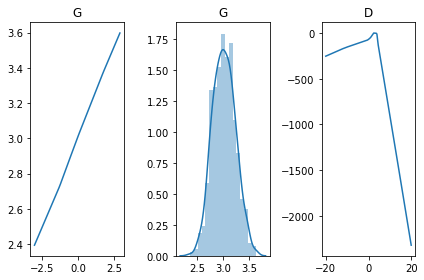

[Epoch 31704/50000] [D loss: -0.059135] [G loss: 0.201848]
[Epoch 31708/50000] [D loss: -0.036987] [G loss: 0.149433]
[Epoch 31712/50000] [D loss: -0.052339] [G loss: 0.079690]
[Epoch 31716/50000] [D loss: -0.072405] [G loss: 0.239311]
[Epoch 31720/50000] [D loss: -0.041568] [G loss: 0.043928]
[Epoch 31724/50000] [D loss: -0.071156] [G loss: 0.514512]
[Epoch 31728/50000] [D loss: -0.081878] [G loss: 0.460590]
[Epoch 31732/50000] [D loss: -0.090377] [G loss: 0.366803]
[Epoch 31736/50000] [D loss: -0.067522] [G loss: 0.288459]
[Epoch 31740/50000] [D loss: -0.078959] [G loss: 0.234715]
[Epoch 31744/50000] [D loss: -0.059914] [G loss: 0.143882]
[Epoch 31748/50000] [D loss: -0.049590] [G loss: 0.085158]
[Epoch 31752/50000] [D loss: -0.036553] [G loss: 0.310925]
[Epoch 31756/50000] [D loss: -0.043306] [G loss: 0.305300]
[Epoch 31760/50000] [D loss: -0.093245] [G loss: 0.297179]
[Epoch 31764/50000] [D loss: -0.054195] [G loss: 0.326066]
[Epoch 31768/50000] [D loss: -0.051102] [G loss: 0.29058

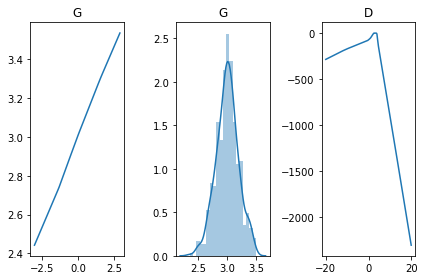

[Epoch 31804/50000] [D loss: -0.063822] [G loss: 0.285352]
[Epoch 31808/50000] [D loss: -0.089373] [G loss: 0.355024]
[Epoch 31812/50000] [D loss: -0.074161] [G loss: 0.366585]
[Epoch 31816/50000] [D loss: -0.059142] [G loss: 0.396514]
[Epoch 31820/50000] [D loss: -0.064844] [G loss: 0.422065]
[Epoch 31824/50000] [D loss: -0.066553] [G loss: 0.447641]
[Epoch 31828/50000] [D loss: -0.075490] [G loss: 0.423105]
[Epoch 31832/50000] [D loss: -0.061570] [G loss: 0.356290]
[Epoch 31836/50000] [D loss: -0.072700] [G loss: 0.329230]
[Epoch 31840/50000] [D loss: -0.091325] [G loss: 0.294708]
[Epoch 31844/50000] [D loss: -0.059017] [G loss: 0.242575]
[Epoch 31848/50000] [D loss: -0.072113] [G loss: 0.214792]
[Epoch 31852/50000] [D loss: -0.064544] [G loss: 0.205444]
[Epoch 31856/50000] [D loss: -0.059050] [G loss: 0.180417]
[Epoch 31860/50000] [D loss: -0.048128] [G loss: 0.132883]
[Epoch 31864/50000] [D loss: -0.030938] [G loss: 0.066301]
[Epoch 31868/50000] [D loss: -0.068158] [G loss: 0.02241

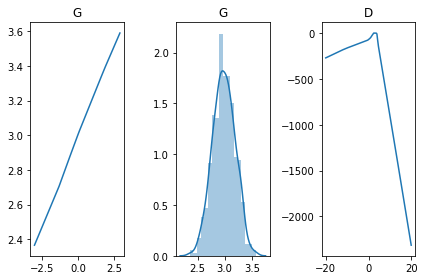

[Epoch 31904/50000] [D loss: -0.067030] [G loss: -0.032344]
[Epoch 31908/50000] [D loss: -0.003345] [G loss: -0.730240]
[Epoch 31912/50000] [D loss: -0.039595] [G loss: 0.040934]
[Epoch 31916/50000] [D loss: -0.098105] [G loss: 0.052602]
[Epoch 31920/50000] [D loss: -0.069835] [G loss: 0.152594]
[Epoch 31924/50000] [D loss: -0.065422] [G loss: -0.412584]
[Epoch 31928/50000] [D loss: -0.062997] [G loss: -0.239738]
[Epoch 31932/50000] [D loss: -0.104466] [G loss: -0.310568]
[Epoch 31936/50000] [D loss: -0.077351] [G loss: -0.299314]
[Epoch 31940/50000] [D loss: -0.092135] [G loss: -0.253176]
[Epoch 31944/50000] [D loss: -0.082724] [G loss: -0.312197]
[Epoch 31948/50000] [D loss: -0.051675] [G loss: -0.247221]
[Epoch 31952/50000] [D loss: -0.067857] [G loss: -0.344403]
[Epoch 31956/50000] [D loss: -0.029673] [G loss: -0.319648]
[Epoch 31960/50000] [D loss: -0.049696] [G loss: -0.278116]
[Epoch 31964/50000] [D loss: -0.051231] [G loss: -0.310506]
[Epoch 31968/50000] [D loss: -0.052268] [G 

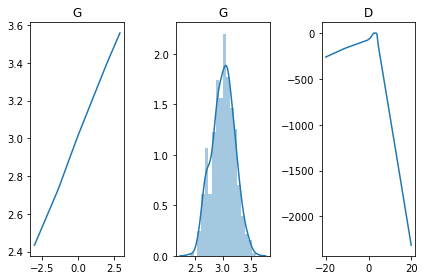

[Epoch 32004/50000] [D loss: -0.084556] [G loss: -0.417017]
[Epoch 32008/50000] [D loss: -0.081659] [G loss: -0.394467]
[Epoch 32012/50000] [D loss: -0.104943] [G loss: -0.289768]
[Epoch 32016/50000] [D loss: -0.079451] [G loss: -0.316072]
[Epoch 32020/50000] [D loss: -0.040882] [G loss: -0.313709]
[Epoch 32024/50000] [D loss: -0.091730] [G loss: -0.311845]
[Epoch 32028/50000] [D loss: -0.077858] [G loss: -0.279781]
[Epoch 32032/50000] [D loss: -0.056163] [G loss: -0.263247]
[Epoch 32036/50000] [D loss: -0.062504] [G loss: -0.349942]
[Epoch 32040/50000] [D loss: -0.080171] [G loss: -0.307422]
[Epoch 32044/50000] [D loss: -0.098923] [G loss: -0.392432]
[Epoch 32048/50000] [D loss: -0.093202] [G loss: -0.333698]
[Epoch 32052/50000] [D loss: -0.083699] [G loss: -0.375530]
[Epoch 32056/50000] [D loss: -0.089042] [G loss: -0.358130]
[Epoch 32060/50000] [D loss: -0.089636] [G loss: -0.368602]
[Epoch 32064/50000] [D loss: -0.066068] [G loss: -0.366419]
[Epoch 32068/50000] [D loss: -0.072103] 

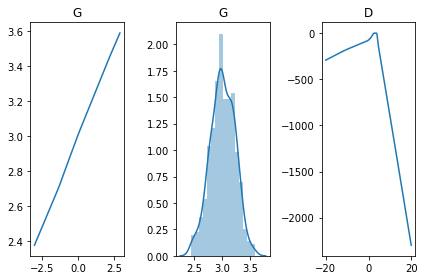

[Epoch 32104/50000] [D loss: -0.033209] [G loss: 0.244711]
[Epoch 32108/50000] [D loss: -0.019464] [G loss: 0.315201]
[Epoch 32112/50000] [D loss: -0.025848] [G loss: 0.253805]
[Epoch 32116/50000] [D loss: -0.014133] [G loss: 0.187786]
[Epoch 32120/50000] [D loss: 0.009027] [G loss: -0.042094]
[Epoch 32124/50000] [D loss: -0.048488] [G loss: 0.138806]
[Epoch 32128/50000] [D loss: -0.040328] [G loss: 0.241581]
[Epoch 32132/50000] [D loss: -0.060889] [G loss: 0.314865]
[Epoch 32136/50000] [D loss: -0.053661] [G loss: 0.210696]
[Epoch 32140/50000] [D loss: -0.063695] [G loss: 0.162011]
[Epoch 32144/50000] [D loss: -0.082974] [G loss: 0.321000]
[Epoch 32148/50000] [D loss: -0.052617] [G loss: 0.233082]
[Epoch 32152/50000] [D loss: -0.095487] [G loss: 0.116687]
[Epoch 32156/50000] [D loss: -0.100855] [G loss: 0.468367]
[Epoch 32160/50000] [D loss: -0.145941] [G loss: 0.274335]
[Epoch 32164/50000] [D loss: -0.098795] [G loss: 0.559594]
[Epoch 32168/50000] [D loss: -0.056134] [G loss: 0.18424

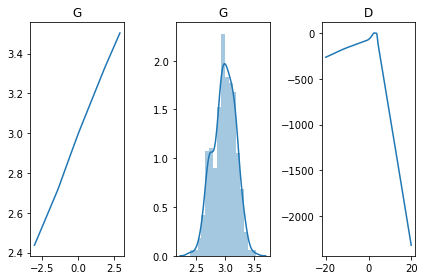

[Epoch 32204/50000] [D loss: -0.040007] [G loss: 0.099278]
[Epoch 32208/50000] [D loss: -0.023890] [G loss: 0.162322]
[Epoch 32212/50000] [D loss: -0.060817] [G loss: 0.240306]
[Epoch 32216/50000] [D loss: -0.077867] [G loss: 0.220218]
[Epoch 32220/50000] [D loss: -0.060245] [G loss: 0.292243]
[Epoch 32224/50000] [D loss: -0.100970] [G loss: 0.346714]
[Epoch 32228/50000] [D loss: -0.095098] [G loss: 0.280617]
[Epoch 32232/50000] [D loss: -0.103295] [G loss: 0.291146]
[Epoch 32236/50000] [D loss: -0.112126] [G loss: 0.205728]
[Epoch 32240/50000] [D loss: -0.097259] [G loss: 0.191911]
[Epoch 32244/50000] [D loss: -0.080297] [G loss: 0.248258]
[Epoch 32248/50000] [D loss: -0.082959] [G loss: 0.235599]
[Epoch 32252/50000] [D loss: -0.151167] [G loss: 0.329136]
[Epoch 32256/50000] [D loss: -0.153325] [G loss: 0.264912]
[Epoch 32260/50000] [D loss: -0.057255] [G loss: 0.216476]
[Epoch 32264/50000] [D loss: -0.104338] [G loss: 0.197372]
[Epoch 32268/50000] [D loss: -0.067767] [G loss: 0.19019

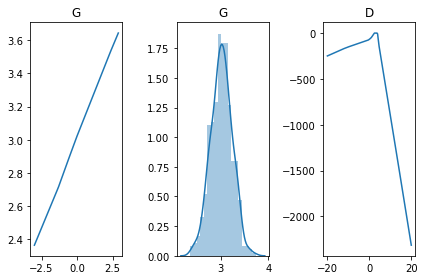

[Epoch 32304/50000] [D loss: -0.084927] [G loss: 0.274007]
[Epoch 32308/50000] [D loss: -0.072134] [G loss: 0.289345]
[Epoch 32312/50000] [D loss: -0.073135] [G loss: 0.159553]
[Epoch 32316/50000] [D loss: -0.102880] [G loss: 0.182690]
[Epoch 32320/50000] [D loss: -0.097844] [G loss: 0.065818]
[Epoch 32324/50000] [D loss: -0.107509] [G loss: 0.116800]
[Epoch 32328/50000] [D loss: -0.141560] [G loss: 0.343229]
[Epoch 32332/50000] [D loss: -0.116109] [G loss: 0.330596]
[Epoch 32336/50000] [D loss: -0.076397] [G loss: 0.310750]
[Epoch 32340/50000] [D loss: -0.054313] [G loss: 0.278536]
[Epoch 32344/50000] [D loss: -0.087845] [G loss: 0.249440]
[Epoch 32348/50000] [D loss: -0.037789] [G loss: 0.133126]
[Epoch 32352/50000] [D loss: -0.037263] [G loss: 0.194458]
[Epoch 32356/50000] [D loss: -0.054502] [G loss: 0.027968]
[Epoch 32360/50000] [D loss: -0.038479] [G loss: -0.066085]
[Epoch 32364/50000] [D loss: -0.014170] [G loss: -0.346406]
[Epoch 32368/50000] [D loss: -0.040931] [G loss: -0.40

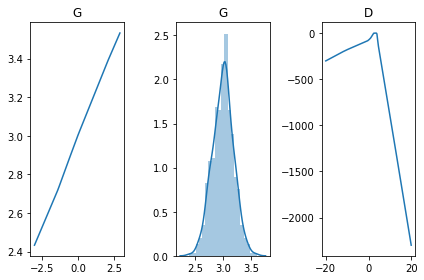

[Epoch 32404/50000] [D loss: -0.091484] [G loss: -0.136464]
[Epoch 32408/50000] [D loss: -0.076999] [G loss: -0.305906]
[Epoch 32412/50000] [D loss: -0.080310] [G loss: -0.247907]
[Epoch 32416/50000] [D loss: -0.078658] [G loss: -0.295008]
[Epoch 32420/50000] [D loss: -0.069538] [G loss: -0.225460]
[Epoch 32424/50000] [D loss: -0.044985] [G loss: -0.284609]
[Epoch 32428/50000] [D loss: -0.044643] [G loss: -0.334022]
[Epoch 32432/50000] [D loss: -0.077783] [G loss: -0.303677]
[Epoch 32436/50000] [D loss: -0.063047] [G loss: -0.220056]
[Epoch 32440/50000] [D loss: -0.075445] [G loss: -0.220373]
[Epoch 32444/50000] [D loss: -0.047768] [G loss: -0.277848]
[Epoch 32448/50000] [D loss: -0.078866] [G loss: -0.163975]
[Epoch 32452/50000] [D loss: -0.070629] [G loss: -0.167497]
[Epoch 32456/50000] [D loss: -0.035674] [G loss: -0.142729]
[Epoch 32460/50000] [D loss: -0.035425] [G loss: -0.090604]
[Epoch 32464/50000] [D loss: -0.059222] [G loss: -0.082168]
[Epoch 32468/50000] [D loss: -0.084309] 

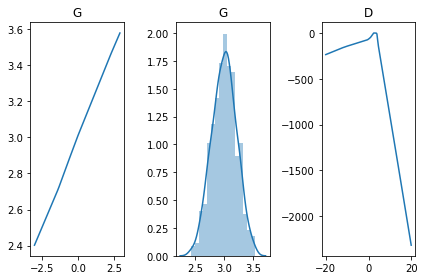

[Epoch 32504/50000] [D loss: -0.070924] [G loss: -0.271360]
[Epoch 32508/50000] [D loss: -0.079884] [G loss: -0.198725]
[Epoch 32512/50000] [D loss: -0.049038] [G loss: -0.222054]
[Epoch 32516/50000] [D loss: -0.035108] [G loss: -0.263959]
[Epoch 32520/50000] [D loss: -0.035195] [G loss: -0.301420]
[Epoch 32524/50000] [D loss: -0.070527] [G loss: -0.302049]
[Epoch 32528/50000] [D loss: -0.082155] [G loss: -0.338763]
[Epoch 32532/50000] [D loss: -0.074885] [G loss: -0.293361]
[Epoch 32536/50000] [D loss: -0.070793] [G loss: -0.282222]
[Epoch 32540/50000] [D loss: -0.042242] [G loss: -0.404077]
[Epoch 32544/50000] [D loss: -0.066664] [G loss: -0.437799]
[Epoch 32548/50000] [D loss: -0.094876] [G loss: -0.455201]
[Epoch 32552/50000] [D loss: -0.063547] [G loss: -0.448319]
[Epoch 32556/50000] [D loss: -0.061167] [G loss: -0.491046]
[Epoch 32560/50000] [D loss: -0.089372] [G loss: -0.523992]
[Epoch 32564/50000] [D loss: -0.098338] [G loss: -0.563973]
[Epoch 32568/50000] [D loss: -0.057399] 

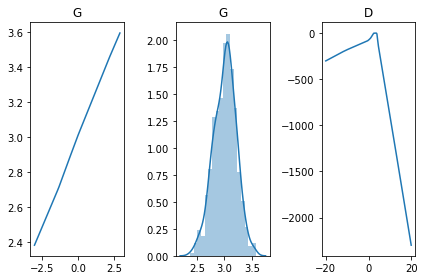

[Epoch 32604/50000] [D loss: -0.097966] [G loss: -0.090318]
[Epoch 32608/50000] [D loss: -0.082932] [G loss: -0.223956]
[Epoch 32612/50000] [D loss: -0.063355] [G loss: -0.227620]
[Epoch 32616/50000] [D loss: -0.095444] [G loss: -0.340220]
[Epoch 32620/50000] [D loss: -0.058172] [G loss: -0.249536]
[Epoch 32624/50000] [D loss: -0.062603] [G loss: -0.310861]
[Epoch 32628/50000] [D loss: -0.061062] [G loss: -0.332414]
[Epoch 32632/50000] [D loss: -0.076997] [G loss: -0.290760]
[Epoch 32636/50000] [D loss: -0.066841] [G loss: -0.304834]
[Epoch 32640/50000] [D loss: -0.065445] [G loss: -0.276631]
[Epoch 32644/50000] [D loss: -0.070818] [G loss: -0.260723]
[Epoch 32648/50000] [D loss: -0.093509] [G loss: -0.397155]
[Epoch 32652/50000] [D loss: -0.074020] [G loss: -0.407881]
[Epoch 32656/50000] [D loss: -0.081982] [G loss: -0.441183]
[Epoch 32660/50000] [D loss: -0.084109] [G loss: -0.402305]
[Epoch 32664/50000] [D loss: -0.108601] [G loss: -0.344935]
[Epoch 32668/50000] [D loss: -0.060519] 

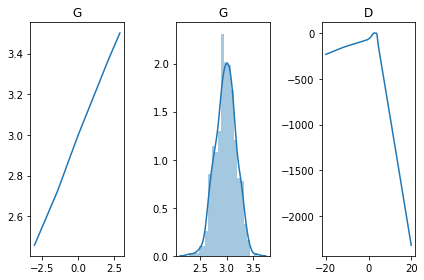

[Epoch 32704/50000] [D loss: -0.063737] [G loss: -0.295870]
[Epoch 32708/50000] [D loss: -0.060833] [G loss: -0.275391]
[Epoch 32712/50000] [D loss: -0.073082] [G loss: -0.291075]
[Epoch 32716/50000] [D loss: -0.041311] [G loss: -0.254721]
[Epoch 32720/50000] [D loss: -0.082193] [G loss: -0.243569]
[Epoch 32724/50000] [D loss: -0.084742] [G loss: -0.185192]
[Epoch 32728/50000] [D loss: -0.068502] [G loss: -0.217722]
[Epoch 32732/50000] [D loss: -0.056054] [G loss: -0.122420]
[Epoch 32736/50000] [D loss: -0.043309] [G loss: -0.290267]
[Epoch 32740/50000] [D loss: -0.104175] [G loss: -0.268971]
[Epoch 32744/50000] [D loss: -0.118276] [G loss: -0.365283]
[Epoch 32748/50000] [D loss: -0.041940] [G loss: -0.365283]
[Epoch 32752/50000] [D loss: -0.144306] [G loss: -0.298864]
[Epoch 32756/50000] [D loss: -0.096215] [G loss: -0.306234]
[Epoch 32760/50000] [D loss: -0.114815] [G loss: -0.329820]
[Epoch 32764/50000] [D loss: -0.137353] [G loss: -0.273252]
[Epoch 32768/50000] [D loss: -0.012912] 

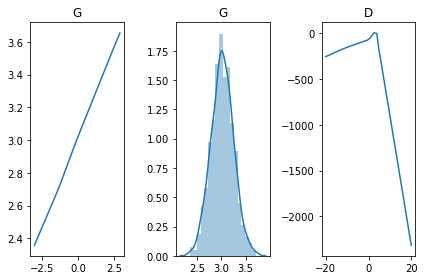

[Epoch 32804/50000] [D loss: -0.113328] [G loss: -0.043637]
[Epoch 32808/50000] [D loss: -0.134590] [G loss: -0.317840]
[Epoch 32812/50000] [D loss: -0.142032] [G loss: -0.097712]
[Epoch 32816/50000] [D loss: -0.109698] [G loss: -0.072696]
[Epoch 32820/50000] [D loss: -0.234268] [G loss: 0.007765]
[Epoch 32824/50000] [D loss: -0.077592] [G loss: -0.051361]
[Epoch 32828/50000] [D loss: -0.101926] [G loss: -0.140311]
[Epoch 32832/50000] [D loss: -0.077761] [G loss: -0.172274]
[Epoch 32836/50000] [D loss: -0.085646] [G loss: -0.152385]
[Epoch 32840/50000] [D loss: -0.049748] [G loss: -0.259773]
[Epoch 32844/50000] [D loss: -0.080632] [G loss: -0.243920]
[Epoch 32848/50000] [D loss: -0.072487] [G loss: -0.202185]
[Epoch 32852/50000] [D loss: -0.048676] [G loss: -0.308330]
[Epoch 32856/50000] [D loss: -0.022356] [G loss: -0.354594]
[Epoch 32860/50000] [D loss: -0.093869] [G loss: -0.466057]
[Epoch 32864/50000] [D loss: -0.072148] [G loss: -0.503711]
[Epoch 32868/50000] [D loss: -0.078081] [

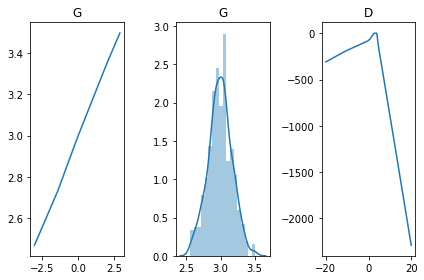

[Epoch 32904/50000] [D loss: -0.119731] [G loss: 0.009940]
[Epoch 32908/50000] [D loss: -0.110367] [G loss: 0.119047]
[Epoch 32912/50000] [D loss: -0.118445] [G loss: 0.094383]
[Epoch 32916/50000] [D loss: -0.100606] [G loss: -0.014575]
[Epoch 32920/50000] [D loss: -0.087422] [G loss: -0.027627]
[Epoch 32924/50000] [D loss: -0.081655] [G loss: 0.202957]
[Epoch 32928/50000] [D loss: -0.074474] [G loss: 0.327464]
[Epoch 32932/50000] [D loss: -0.085706] [G loss: 0.220515]
[Epoch 32936/50000] [D loss: -0.009293] [G loss: 0.319254]
[Epoch 32940/50000] [D loss: -0.077314] [G loss: 0.449606]
[Epoch 32944/50000] [D loss: -0.042094] [G loss: 0.364283]
[Epoch 32948/50000] [D loss: -0.060302] [G loss: 0.138399]
[Epoch 32952/50000] [D loss: -0.068214] [G loss: 0.073808]
[Epoch 32956/50000] [D loss: -0.097203] [G loss: 0.149956]
[Epoch 32960/50000] [D loss: -0.087747] [G loss: -0.110734]
[Epoch 32964/50000] [D loss: -0.085728] [G loss: -0.011529]
[Epoch 32968/50000] [D loss: -0.167864] [G loss: 0.0

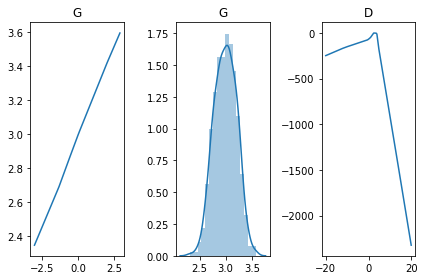

[Epoch 33004/50000] [D loss: -0.054604] [G loss: 0.180691]
[Epoch 33008/50000] [D loss: -0.091664] [G loss: 0.331678]
[Epoch 33012/50000] [D loss: -0.046344] [G loss: 0.159546]
[Epoch 33016/50000] [D loss: -0.013451] [G loss: 0.372559]
[Epoch 33020/50000] [D loss: -0.061248] [G loss: 0.207686]
[Epoch 33024/50000] [D loss: -0.030532] [G loss: 0.097172]
[Epoch 33028/50000] [D loss: -0.069340] [G loss: 0.109947]
[Epoch 33032/50000] [D loss: -0.075267] [G loss: 0.228216]
[Epoch 33036/50000] [D loss: -0.114259] [G loss: 0.255166]
[Epoch 33040/50000] [D loss: -0.087802] [G loss: 0.202507]
[Epoch 33044/50000] [D loss: -0.095126] [G loss: 0.211053]
[Epoch 33048/50000] [D loss: -0.127570] [G loss: 0.149245]
[Epoch 33052/50000] [D loss: -0.079386] [G loss: -0.058031]
[Epoch 33056/50000] [D loss: -0.070756] [G loss: 0.010317]
[Epoch 33060/50000] [D loss: -0.093677] [G loss: -0.008760]
[Epoch 33064/50000] [D loss: -0.080134] [G loss: 0.135186]
[Epoch 33068/50000] [D loss: -0.090757] [G loss: -0.04

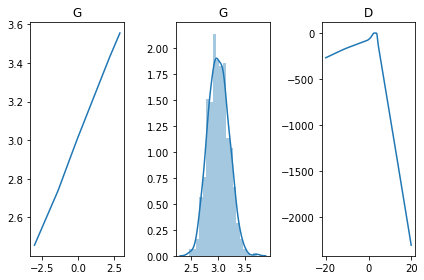

[Epoch 33104/50000] [D loss: -0.053134] [G loss: -0.120234]
[Epoch 33108/50000] [D loss: -0.055418] [G loss: -0.192704]
[Epoch 33112/50000] [D loss: -0.085439] [G loss: -0.227583]
[Epoch 33116/50000] [D loss: -0.091684] [G loss: -0.153380]
[Epoch 33120/50000] [D loss: -0.068787] [G loss: -0.283642]
[Epoch 33124/50000] [D loss: -0.065149] [G loss: -0.226038]
[Epoch 33128/50000] [D loss: -0.105217] [G loss: -0.264241]
[Epoch 33132/50000] [D loss: -0.069559] [G loss: -0.232406]
[Epoch 33136/50000] [D loss: -0.073116] [G loss: -0.176072]
[Epoch 33140/50000] [D loss: -0.059653] [G loss: -0.200580]
[Epoch 33144/50000] [D loss: -0.038832] [G loss: -0.213368]
[Epoch 33148/50000] [D loss: -0.087909] [G loss: -0.231285]
[Epoch 33152/50000] [D loss: -0.050010] [G loss: -0.260173]
[Epoch 33156/50000] [D loss: -0.059169] [G loss: -0.357722]
[Epoch 33160/50000] [D loss: -0.060138] [G loss: -0.390710]
[Epoch 33164/50000] [D loss: -0.044687] [G loss: -0.344564]
[Epoch 33168/50000] [D loss: -0.085017] 

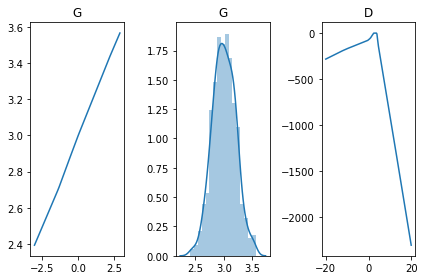

[Epoch 33204/50000] [D loss: -0.076965] [G loss: -0.398007]
[Epoch 33208/50000] [D loss: -0.063814] [G loss: -0.326224]
[Epoch 33212/50000] [D loss: -0.092846] [G loss: -0.322844]
[Epoch 33216/50000] [D loss: -0.075408] [G loss: -0.296170]
[Epoch 33220/50000] [D loss: -0.058229] [G loss: -0.210823]
[Epoch 33224/50000] [D loss: -0.089633] [G loss: -0.175617]
[Epoch 33228/50000] [D loss: -0.075161] [G loss: -0.088547]
[Epoch 33232/50000] [D loss: -0.070360] [G loss: -0.280184]
[Epoch 33236/50000] [D loss: -0.051069] [G loss: -0.307974]
[Epoch 33240/50000] [D loss: -0.069169] [G loss: -0.357150]
[Epoch 33244/50000] [D loss: -0.064725] [G loss: -0.333484]
[Epoch 33248/50000] [D loss: -0.091977] [G loss: -0.390399]
[Epoch 33252/50000] [D loss: -0.046394] [G loss: -0.295907]
[Epoch 33256/50000] [D loss: -0.054386] [G loss: -0.293866]
[Epoch 33260/50000] [D loss: -0.060180] [G loss: -0.289086]
[Epoch 33264/50000] [D loss: -0.070441] [G loss: -0.427162]
[Epoch 33268/50000] [D loss: -0.053202] 

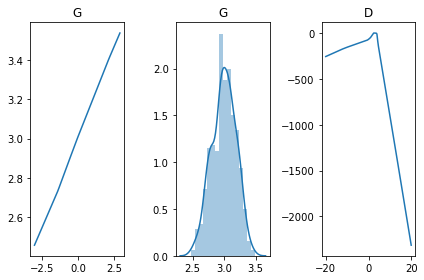

[Epoch 33304/50000] [D loss: -0.062185] [G loss: -0.365296]
[Epoch 33308/50000] [D loss: -0.068548] [G loss: -0.380561]
[Epoch 33312/50000] [D loss: -0.081730] [G loss: -0.314749]
[Epoch 33316/50000] [D loss: -0.047851] [G loss: -0.339840]
[Epoch 33320/50000] [D loss: -0.045080] [G loss: -0.451731]
[Epoch 33324/50000] [D loss: -0.096795] [G loss: -0.445664]
[Epoch 33328/50000] [D loss: -0.090000] [G loss: -0.449013]
[Epoch 33332/50000] [D loss: -0.082621] [G loss: -0.448701]
[Epoch 33336/50000] [D loss: -0.075743] [G loss: -0.356304]
[Epoch 33340/50000] [D loss: -0.087082] [G loss: -0.293679]
[Epoch 33344/50000] [D loss: -0.059055] [G loss: -0.269954]
[Epoch 33348/50000] [D loss: -0.077491] [G loss: -0.202779]
[Epoch 33352/50000] [D loss: -0.045991] [G loss: -0.150674]
[Epoch 33356/50000] [D loss: -0.070319] [G loss: -0.166664]
[Epoch 33360/50000] [D loss: -0.068455] [G loss: -0.208868]
[Epoch 33364/50000] [D loss: -0.053500] [G loss: -0.221369]
[Epoch 33368/50000] [D loss: -0.041209] 

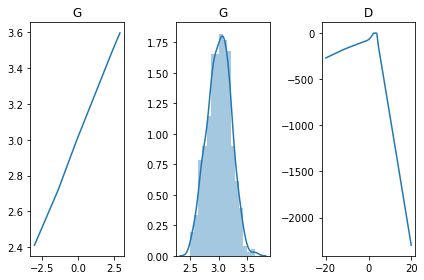

[Epoch 33404/50000] [D loss: -0.076779] [G loss: -0.222444]
[Epoch 33408/50000] [D loss: -0.062128] [G loss: -0.215480]
[Epoch 33412/50000] [D loss: -0.067959] [G loss: -0.317091]
[Epoch 33416/50000] [D loss: -0.092416] [G loss: -0.366231]
[Epoch 33420/50000] [D loss: -0.075335] [G loss: -0.390053]
[Epoch 33424/50000] [D loss: -0.070253] [G loss: -0.283237]
[Epoch 33428/50000] [D loss: -0.048844] [G loss: -0.297118]
[Epoch 33432/50000] [D loss: -0.101870] [G loss: -0.247214]
[Epoch 33436/50000] [D loss: -0.105876] [G loss: -0.229018]
[Epoch 33440/50000] [D loss: -0.087439] [G loss: -0.262815]
[Epoch 33444/50000] [D loss: -0.093750] [G loss: -0.283426]
[Epoch 33448/50000] [D loss: -0.094586] [G loss: -0.260016]
[Epoch 33452/50000] [D loss: -0.079994] [G loss: -0.240810]
[Epoch 33456/50000] [D loss: -0.089971] [G loss: -0.237307]
[Epoch 33460/50000] [D loss: -0.078082] [G loss: -0.230186]
[Epoch 33464/50000] [D loss: -0.088340] [G loss: -0.270277]
[Epoch 33468/50000] [D loss: -0.079671] 

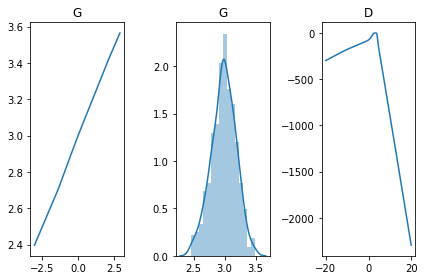

[Epoch 33504/50000] [D loss: -0.069451] [G loss: 0.700442]
[Epoch 33508/50000] [D loss: -0.089798] [G loss: 0.693000]
[Epoch 33512/50000] [D loss: -0.072399] [G loss: 0.628544]
[Epoch 33516/50000] [D loss: -0.089899] [G loss: 0.296460]
[Epoch 33520/50000] [D loss: -0.093905] [G loss: -0.020891]
[Epoch 33524/50000] [D loss: -0.050190] [G loss: -0.245656]
[Epoch 33528/50000] [D loss: -0.076955] [G loss: -0.271028]
[Epoch 33532/50000] [D loss: -0.056955] [G loss: -0.276802]
[Epoch 33536/50000] [D loss: -0.068819] [G loss: -0.316170]
[Epoch 33540/50000] [D loss: -0.062472] [G loss: -0.245632]
[Epoch 33544/50000] [D loss: -0.063671] [G loss: -0.294824]
[Epoch 33548/50000] [D loss: -0.059809] [G loss: -0.273584]
[Epoch 33552/50000] [D loss: -0.076356] [G loss: -0.253880]
[Epoch 33556/50000] [D loss: -0.086796] [G loss: -0.281506]
[Epoch 33560/50000] [D loss: -0.085950] [G loss: -0.351177]
[Epoch 33564/50000] [D loss: -0.093241] [G loss: -0.380703]
[Epoch 33568/50000] [D loss: -0.067564] [G l

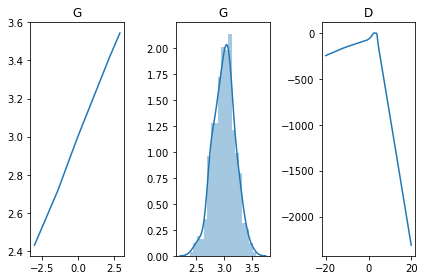

[Epoch 33604/50000] [D loss: -0.082150] [G loss: -0.246633]
[Epoch 33608/50000] [D loss: -0.058364] [G loss: -0.312216]
[Epoch 33612/50000] [D loss: -0.068038] [G loss: -0.302750]
[Epoch 33616/50000] [D loss: -0.055220] [G loss: -0.344335]
[Epoch 33620/50000] [D loss: -0.086406] [G loss: -0.401019]
[Epoch 33624/50000] [D loss: -0.073631] [G loss: -0.415374]
[Epoch 33628/50000] [D loss: -0.086728] [G loss: -0.455285]
[Epoch 33632/50000] [D loss: -0.100405] [G loss: -0.516205]
[Epoch 33636/50000] [D loss: -0.052154] [G loss: -0.388493]
[Epoch 33640/50000] [D loss: -0.113325] [G loss: -0.335442]
[Epoch 33644/50000] [D loss: -0.079153] [G loss: -0.374290]
[Epoch 33648/50000] [D loss: -0.086907] [G loss: -0.365804]
[Epoch 33652/50000] [D loss: -0.071978] [G loss: -0.282341]
[Epoch 33656/50000] [D loss: -0.084227] [G loss: -0.320530]
[Epoch 33660/50000] [D loss: -0.061933] [G loss: -0.309344]
[Epoch 33664/50000] [D loss: -0.097423] [G loss: -0.252551]
[Epoch 33668/50000] [D loss: -0.087938] 

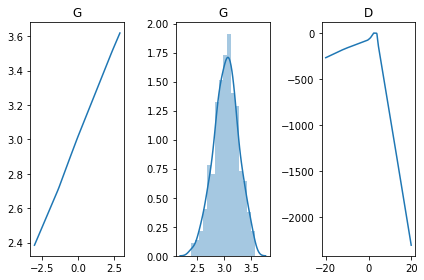

[Epoch 33704/50000] [D loss: -0.071896] [G loss: -0.415402]
[Epoch 33708/50000] [D loss: -0.063871] [G loss: -0.479470]
[Epoch 33712/50000] [D loss: -0.097936] [G loss: -0.447835]
[Epoch 33716/50000] [D loss: -0.085093] [G loss: -0.511525]
[Epoch 33720/50000] [D loss: -0.097304] [G loss: -0.436901]
[Epoch 33724/50000] [D loss: -0.109418] [G loss: -0.371755]
[Epoch 33728/50000] [D loss: -0.097460] [G loss: -0.398387]
[Epoch 33732/50000] [D loss: -0.087146] [G loss: -0.327155]
[Epoch 33736/50000] [D loss: -0.067894] [G loss: -0.404353]
[Epoch 33740/50000] [D loss: -0.120986] [G loss: -0.295756]
[Epoch 33744/50000] [D loss: -0.113084] [G loss: -0.281232]
[Epoch 33748/50000] [D loss: -0.091315] [G loss: -0.289415]
[Epoch 33752/50000] [D loss: -0.091727] [G loss: -0.315376]
[Epoch 33756/50000] [D loss: -0.095018] [G loss: -0.292049]
[Epoch 33760/50000] [D loss: -0.071086] [G loss: -0.345262]
[Epoch 33764/50000] [D loss: -0.094135] [G loss: -0.373065]
[Epoch 33768/50000] [D loss: -0.066469] 

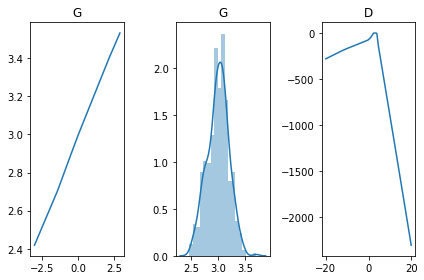

[Epoch 33804/50000] [D loss: -0.101244] [G loss: 0.663357]
[Epoch 33808/50000] [D loss: -0.083974] [G loss: 0.757353]
[Epoch 33812/50000] [D loss: -0.089454] [G loss: 0.636759]
[Epoch 33816/50000] [D loss: -0.098408] [G loss: 0.700482]
[Epoch 33820/50000] [D loss: -0.071281] [G loss: 0.662891]
[Epoch 33824/50000] [D loss: -0.074938] [G loss: 0.606026]
[Epoch 33828/50000] [D loss: -0.110127] [G loss: 0.023827]
[Epoch 33832/50000] [D loss: -0.079839] [G loss: 0.213365]
[Epoch 33836/50000] [D loss: -0.069990] [G loss: 0.026061]
[Epoch 33840/50000] [D loss: -0.058345] [G loss: 0.171806]
[Epoch 33844/50000] [D loss: -0.065877] [G loss: 0.199957]
[Epoch 33848/50000] [D loss: -0.076394] [G loss: 0.214793]
[Epoch 33852/50000] [D loss: -0.068952] [G loss: 0.288507]
[Epoch 33856/50000] [D loss: -0.084679] [G loss: 0.266738]
[Epoch 33860/50000] [D loss: -0.046609] [G loss: 0.275885]
[Epoch 33864/50000] [D loss: -0.082034] [G loss: 0.385548]
[Epoch 33868/50000] [D loss: -0.096480] [G loss: 0.40114

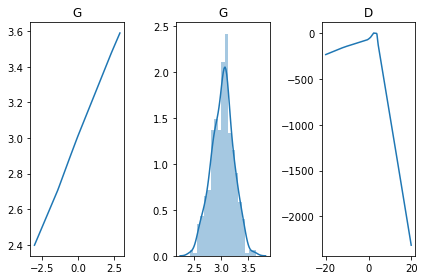

[Epoch 33904/50000] [D loss: -0.100154] [G loss: 0.238773]
[Epoch 33908/50000] [D loss: -0.130834] [G loss: 0.322218]
[Epoch 33912/50000] [D loss: -0.085014] [G loss: 0.110333]
[Epoch 33916/50000] [D loss: -0.078518] [G loss: 0.247900]
[Epoch 33920/50000] [D loss: -0.065377] [G loss: 0.246338]
[Epoch 33924/50000] [D loss: -0.078516] [G loss: 0.330618]
[Epoch 33928/50000] [D loss: -0.037856] [G loss: 0.263041]
[Epoch 33932/50000] [D loss: -0.076181] [G loss: 0.291336]
[Epoch 33936/50000] [D loss: -0.089448] [G loss: 0.270512]
[Epoch 33940/50000] [D loss: -0.019763] [G loss: 0.246489]
[Epoch 33944/50000] [D loss: -0.035699] [G loss: 0.208930]
[Epoch 33948/50000] [D loss: -0.072387] [G loss: 0.159624]
[Epoch 33952/50000] [D loss: -0.046119] [G loss: 0.112346]
[Epoch 33956/50000] [D loss: -0.074568] [G loss: 0.494980]
[Epoch 33960/50000] [D loss: -0.074489] [G loss: 0.399197]
[Epoch 33964/50000] [D loss: -0.063090] [G loss: 0.153823]
[Epoch 33968/50000] [D loss: -0.108135] [G loss: 0.24678

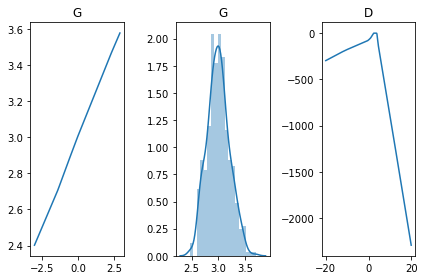

[Epoch 34004/50000] [D loss: -0.082078] [G loss: 0.243393]
[Epoch 34008/50000] [D loss: -0.055015] [G loss: 0.240088]
[Epoch 34012/50000] [D loss: -0.053378] [G loss: 0.278826]
[Epoch 34016/50000] [D loss: -0.056178] [G loss: 0.298568]
[Epoch 34020/50000] [D loss: -0.054071] [G loss: 0.247860]
[Epoch 34024/50000] [D loss: -0.053162] [G loss: 0.262797]
[Epoch 34028/50000] [D loss: -0.054419] [G loss: 0.269585]
[Epoch 34032/50000] [D loss: -0.063921] [G loss: 0.210515]
[Epoch 34036/50000] [D loss: -0.053652] [G loss: 0.151634]
[Epoch 34040/50000] [D loss: -0.042338] [G loss: 0.065476]
[Epoch 34044/50000] [D loss: -0.062286] [G loss: 0.169868]
[Epoch 34048/50000] [D loss: -0.064470] [G loss: 0.304971]
[Epoch 34052/50000] [D loss: -0.059551] [G loss: 0.178635]
[Epoch 34056/50000] [D loss: -0.089887] [G loss: 0.189340]
[Epoch 34060/50000] [D loss: -0.065672] [G loss: 0.154292]
[Epoch 34064/50000] [D loss: -0.052369] [G loss: 0.244195]
[Epoch 34068/50000] [D loss: -0.058946] [G loss: 0.17670

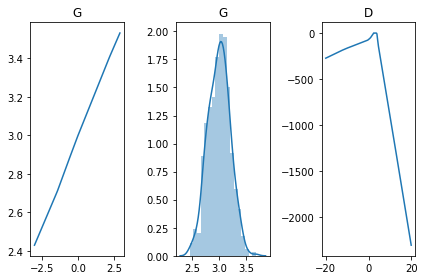

[Epoch 34104/50000] [D loss: -0.081077] [G loss: -0.875710]
[Epoch 34108/50000] [D loss: -0.089249] [G loss: -0.859989]
[Epoch 34112/50000] [D loss: -0.082450] [G loss: -0.868914]
[Epoch 34116/50000] [D loss: -0.069363] [G loss: -0.862700]
[Epoch 34120/50000] [D loss: -0.079332] [G loss: -0.787951]
[Epoch 34124/50000] [D loss: -0.052459] [G loss: -0.706733]
[Epoch 34128/50000] [D loss: -0.075008] [G loss: -0.623281]
[Epoch 34132/50000] [D loss: -0.062968] [G loss: -0.614993]
[Epoch 34136/50000] [D loss: -0.060651] [G loss: -0.592221]
[Epoch 34140/50000] [D loss: -0.040824] [G loss: -0.547584]
[Epoch 34144/50000] [D loss: -0.075257] [G loss: -0.504045]
[Epoch 34148/50000] [D loss: -0.086273] [G loss: -0.509363]
[Epoch 34152/50000] [D loss: -0.069583] [G loss: -0.461342]
[Epoch 34156/50000] [D loss: -0.083432] [G loss: -0.553397]
[Epoch 34160/50000] [D loss: -0.061169] [G loss: -0.586351]
[Epoch 34164/50000] [D loss: -0.076137] [G loss: -0.598705]
[Epoch 34168/50000] [D loss: -0.040046] 

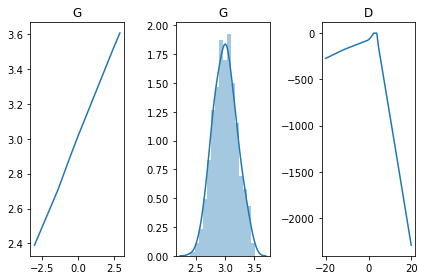

[Epoch 34204/50000] [D loss: -0.051967] [G loss: -0.569399]
[Epoch 34208/50000] [D loss: -0.037902] [G loss: -0.672378]
[Epoch 34212/50000] [D loss: -0.048471] [G loss: -0.765300]
[Epoch 34216/50000] [D loss: -0.072427] [G loss: -0.840475]
[Epoch 34220/50000] [D loss: -0.080938] [G loss: -0.768379]
[Epoch 34224/50000] [D loss: -0.090790] [G loss: -0.793058]
[Epoch 34228/50000] [D loss: -0.109413] [G loss: -0.591901]
[Epoch 34232/50000] [D loss: -0.033687] [G loss: -0.759266]
[Epoch 34236/50000] [D loss: -0.130355] [G loss: -0.243438]
[Epoch 34240/50000] [D loss: -0.110633] [G loss: -0.172252]
[Epoch 34244/50000] [D loss: -0.110116] [G loss: -0.135112]
[Epoch 34248/50000] [D loss: -0.072476] [G loss: -0.247357]
[Epoch 34252/50000] [D loss: -0.122013] [G loss: -0.223594]
[Epoch 34256/50000] [D loss: -0.074816] [G loss: -0.229377]
[Epoch 34260/50000] [D loss: -0.065096] [G loss: -0.254095]
[Epoch 34264/50000] [D loss: -0.103126] [G loss: -0.377776]
[Epoch 34268/50000] [D loss: -0.076810] 

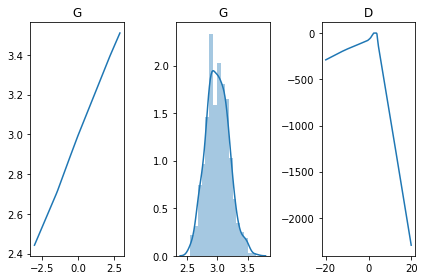

[Epoch 34304/50000] [D loss: -0.072131] [G loss: -0.673105]
[Epoch 34308/50000] [D loss: -0.085778] [G loss: -0.688716]
[Epoch 34312/50000] [D loss: -0.091490] [G loss: -0.644584]
[Epoch 34316/50000] [D loss: -0.104296] [G loss: -0.415714]
[Epoch 34320/50000] [D loss: -0.107004] [G loss: 0.125549]
[Epoch 34324/50000] [D loss: -0.062482] [G loss: 0.118615]
[Epoch 34328/50000] [D loss: -0.094343] [G loss: 0.175309]
[Epoch 34332/50000] [D loss: -0.065072] [G loss: 0.201252]
[Epoch 34336/50000] [D loss: -0.052489] [G loss: 0.274357]
[Epoch 34340/50000] [D loss: -0.057042] [G loss: 0.264503]
[Epoch 34344/50000] [D loss: -0.060847] [G loss: 0.322599]
[Epoch 34348/50000] [D loss: -0.070810] [G loss: 0.358313]
[Epoch 34352/50000] [D loss: -0.094949] [G loss: 0.432688]
[Epoch 34356/50000] [D loss: -0.085733] [G loss: 0.437544]
[Epoch 34360/50000] [D loss: -0.101011] [G loss: 0.544846]
[Epoch 34364/50000] [D loss: -0.061031] [G loss: -0.135767]
[Epoch 34368/50000] [D loss: -0.056138] [G loss: -0

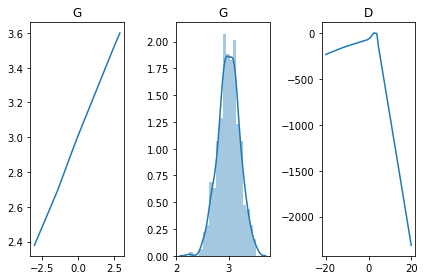

[Epoch 34404/50000] [D loss: -0.075108] [G loss: -0.212945]
[Epoch 34408/50000] [D loss: -0.056042] [G loss: -0.347727]
[Epoch 34412/50000] [D loss: -0.086348] [G loss: -0.286386]
[Epoch 34416/50000] [D loss: -0.037360] [G loss: -0.331737]
[Epoch 34420/50000] [D loss: -0.086331] [G loss: -0.284070]
[Epoch 34424/50000] [D loss: -0.069801] [G loss: -0.287290]
[Epoch 34428/50000] [D loss: -0.110741] [G loss: -0.293132]
[Epoch 34432/50000] [D loss: -0.075702] [G loss: -0.387577]
[Epoch 34436/50000] [D loss: -0.075464] [G loss: -0.486841]
[Epoch 34440/50000] [D loss: -0.107684] [G loss: -0.562519]
[Epoch 34444/50000] [D loss: -0.007439] [G loss: -0.306063]
[Epoch 34448/50000] [D loss: -0.085347] [G loss: -0.053278]
[Epoch 34452/50000] [D loss: -0.005665] [G loss: -0.696152]
[Epoch 34456/50000] [D loss: -0.078150] [G loss: -0.312262]
[Epoch 34460/50000] [D loss: -0.098959] [G loss: -0.304146]
[Epoch 34464/50000] [D loss: -0.071838] [G loss: -0.305780]
[Epoch 34468/50000] [D loss: -0.100275] 

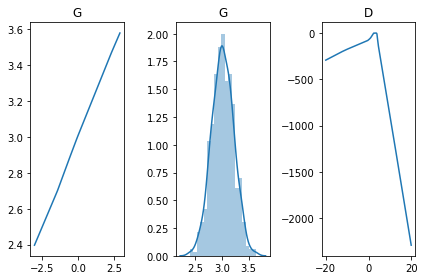

[Epoch 34504/50000] [D loss: -0.053913] [G loss: -0.317881]
[Epoch 34508/50000] [D loss: -0.084790] [G loss: -0.308310]
[Epoch 34512/50000] [D loss: -0.080557] [G loss: -0.262567]
[Epoch 34516/50000] [D loss: -0.055217] [G loss: -0.337339]
[Epoch 34520/50000] [D loss: -0.077107] [G loss: -0.346828]
[Epoch 34524/50000] [D loss: -0.074039] [G loss: -0.338224]
[Epoch 34528/50000] [D loss: -0.066260] [G loss: -0.354831]
[Epoch 34532/50000] [D loss: -0.058827] [G loss: -0.367603]
[Epoch 34536/50000] [D loss: -0.084652] [G loss: -0.377801]
[Epoch 34540/50000] [D loss: -0.084758] [G loss: -0.356593]
[Epoch 34544/50000] [D loss: -0.088055] [G loss: -0.359003]
[Epoch 34548/50000] [D loss: -0.069823] [G loss: -0.402391]
[Epoch 34552/50000] [D loss: -0.074946] [G loss: -0.453832]
[Epoch 34556/50000] [D loss: -0.080672] [G loss: -0.464753]
[Epoch 34560/50000] [D loss: -0.087676] [G loss: -0.442172]
[Epoch 34564/50000] [D loss: -0.099346] [G loss: -0.386145]
[Epoch 34568/50000] [D loss: -0.070117] 

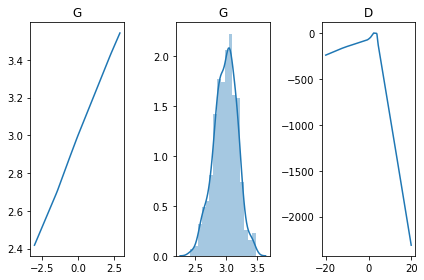

[Epoch 34604/50000] [D loss: -0.069714] [G loss: -0.314098]
[Epoch 34608/50000] [D loss: -0.031392] [G loss: -0.294998]
[Epoch 34612/50000] [D loss: -0.076944] [G loss: -0.353138]
[Epoch 34616/50000] [D loss: -0.092470] [G loss: -0.373715]
[Epoch 34620/50000] [D loss: -0.089942] [G loss: -0.457517]
[Epoch 34624/50000] [D loss: -0.089520] [G loss: -0.494356]
[Epoch 34628/50000] [D loss: -0.087290] [G loss: -0.557427]
[Epoch 34632/50000] [D loss: -0.095035] [G loss: -0.501663]
[Epoch 34636/50000] [D loss: -0.089297] [G loss: -0.441094]
[Epoch 34640/50000] [D loss: -0.083283] [G loss: -0.377874]
[Epoch 34644/50000] [D loss: -0.061150] [G loss: -0.347469]
[Epoch 34648/50000] [D loss: -0.067442] [G loss: -0.334597]
[Epoch 34652/50000] [D loss: -0.098850] [G loss: -0.339394]
[Epoch 34656/50000] [D loss: -0.083162] [G loss: -0.352959]
[Epoch 34660/50000] [D loss: -0.066785] [G loss: -0.346404]
[Epoch 34664/50000] [D loss: -0.068638] [G loss: -0.271544]
[Epoch 34668/50000] [D loss: -0.105793] 

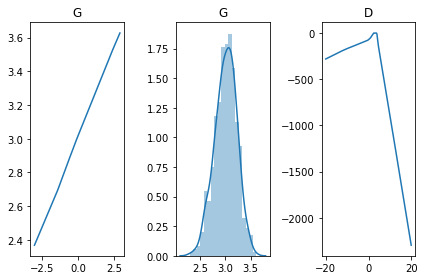

[Epoch 34704/50000] [D loss: -0.055076] [G loss: -0.416291]
[Epoch 34708/50000] [D loss: -0.105066] [G loss: -0.381406]
[Epoch 34712/50000] [D loss: -0.078111] [G loss: -0.403894]
[Epoch 34716/50000] [D loss: -0.079049] [G loss: -0.497642]
[Epoch 34720/50000] [D loss: -0.133834] [G loss: 0.083022]
[Epoch 34724/50000] [D loss: -0.084409] [G loss: 0.331726]
[Epoch 34728/50000] [D loss: -0.077631] [G loss: 0.246355]
[Epoch 34732/50000] [D loss: -0.067653] [G loss: 0.215990]
[Epoch 34736/50000] [D loss: -0.071060] [G loss: 0.282145]
[Epoch 34740/50000] [D loss: -0.078530] [G loss: 0.265724]
[Epoch 34744/50000] [D loss: -0.056299] [G loss: 0.250015]
[Epoch 34748/50000] [D loss: -0.080444] [G loss: 0.221565]
[Epoch 34752/50000] [D loss: -0.030937] [G loss: 0.243284]
[Epoch 34756/50000] [D loss: -0.071608] [G loss: 0.260693]
[Epoch 34760/50000] [D loss: -0.053482] [G loss: 0.253906]
[Epoch 34764/50000] [D loss: -0.058428] [G loss: 0.217162]
[Epoch 34768/50000] [D loss: -0.034056] [G loss: 0.1

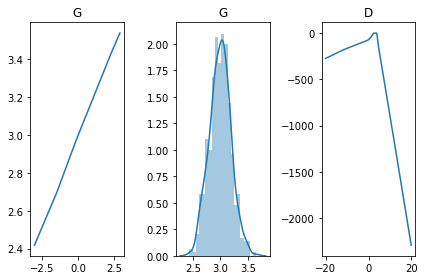

[Epoch 34804/50000] [D loss: -0.075343] [G loss: 0.284510]
[Epoch 34808/50000] [D loss: -0.088643] [G loss: 0.336785]
[Epoch 34812/50000] [D loss: -0.092232] [G loss: 0.340671]
[Epoch 34816/50000] [D loss: -0.089225] [G loss: 0.286807]
[Epoch 34820/50000] [D loss: -0.067845] [G loss: 0.238420]
[Epoch 34824/50000] [D loss: -0.056834] [G loss: 0.250149]
[Epoch 34828/50000] [D loss: -0.074922] [G loss: 0.262222]
[Epoch 34832/50000] [D loss: -0.090746] [G loss: 0.282063]
[Epoch 34836/50000] [D loss: -0.053252] [G loss: 0.213876]
[Epoch 34840/50000] [D loss: -0.092248] [G loss: 0.244014]
[Epoch 34844/50000] [D loss: -0.113773] [G loss: 0.203221]
[Epoch 34848/50000] [D loss: -0.062848] [G loss: 0.252540]
[Epoch 34852/50000] [D loss: -0.014901] [G loss: 0.226702]
[Epoch 34856/50000] [D loss: -0.069299] [G loss: 0.320365]
[Epoch 34860/50000] [D loss: -0.062205] [G loss: 0.287356]
[Epoch 34864/50000] [D loss: -0.082529] [G loss: 0.254226]
[Epoch 34868/50000] [D loss: -0.048196] [G loss: 0.21359

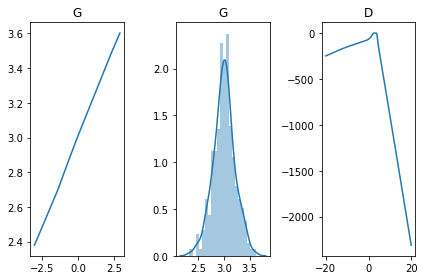

[Epoch 34904/50000] [D loss: -0.068800] [G loss: 0.221581]
[Epoch 34908/50000] [D loss: -0.050008] [G loss: 0.221506]
[Epoch 34912/50000] [D loss: -0.052398] [G loss: 0.278620]
[Epoch 34916/50000] [D loss: -0.072223] [G loss: 0.273302]
[Epoch 34920/50000] [D loss: -0.046932] [G loss: 0.332217]
[Epoch 34924/50000] [D loss: -0.062370] [G loss: 0.210034]
[Epoch 34928/50000] [D loss: -0.035365] [G loss: 0.290341]
[Epoch 34932/50000] [D loss: -0.072088] [G loss: 0.217590]
[Epoch 34936/50000] [D loss: -0.042508] [G loss: 0.053601]
[Epoch 34940/50000] [D loss: -0.094265] [G loss: 0.015006]
[Epoch 34944/50000] [D loss: -0.076834] [G loss: -0.416128]
[Epoch 34948/50000] [D loss: -0.084667] [G loss: -0.344720]
[Epoch 34952/50000] [D loss: -0.120876] [G loss: -0.285339]
[Epoch 34956/50000] [D loss: -0.055001] [G loss: -0.273333]
[Epoch 34960/50000] [D loss: -0.097221] [G loss: -0.216182]
[Epoch 34964/50000] [D loss: -0.112712] [G loss: -0.182542]
[Epoch 34968/50000] [D loss: -0.112513] [G loss: -

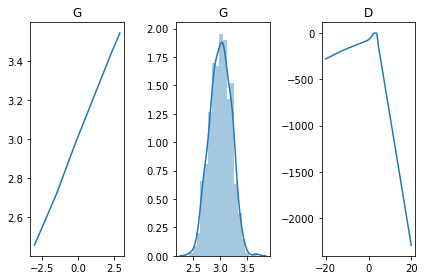

[Epoch 35004/50000] [D loss: -0.054019] [G loss: -0.104398]
[Epoch 35008/50000] [D loss: -0.056919] [G loss: -0.097170]
[Epoch 35012/50000] [D loss: -0.007487] [G loss: -0.082399]
[Epoch 35016/50000] [D loss: -0.077332] [G loss: -0.437697]
[Epoch 35020/50000] [D loss: -0.089777] [G loss: -0.387311]
[Epoch 35024/50000] [D loss: -0.081003] [G loss: -0.327831]
[Epoch 35028/50000] [D loss: -0.091470] [G loss: -0.302753]
[Epoch 35032/50000] [D loss: -0.081023] [G loss: -0.279330]
[Epoch 35036/50000] [D loss: -0.072760] [G loss: -0.272064]
[Epoch 35040/50000] [D loss: -0.065094] [G loss: -0.279817]
[Epoch 35044/50000] [D loss: -0.116973] [G loss: -0.226058]
[Epoch 35048/50000] [D loss: -0.080899] [G loss: -0.227840]
[Epoch 35052/50000] [D loss: -0.040664] [G loss: -0.310283]
[Epoch 35056/50000] [D loss: -0.072952] [G loss: -0.256383]
[Epoch 35060/50000] [D loss: -0.031274] [G loss: -0.304072]
[Epoch 35064/50000] [D loss: -0.080742] [G loss: -0.267005]
[Epoch 35068/50000] [D loss: -0.050835] 

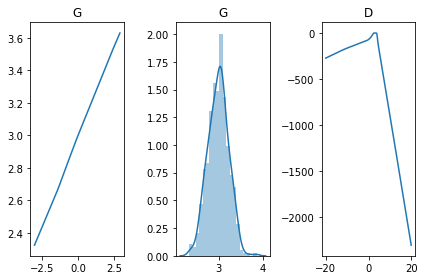

[Epoch 35104/50000] [D loss: -0.092474] [G loss: 0.904980]
[Epoch 35108/50000] [D loss: -0.070261] [G loss: 0.756797]
[Epoch 35112/50000] [D loss: -0.062100] [G loss: 0.645617]
[Epoch 35116/50000] [D loss: -0.054848] [G loss: 0.517064]
[Epoch 35120/50000] [D loss: -0.104067] [G loss: 0.843504]
[Epoch 35124/50000] [D loss: -0.081724] [G loss: 0.700459]
[Epoch 35128/50000] [D loss: -0.110535] [G loss: 0.635746]
[Epoch 35132/50000] [D loss: -0.096472] [G loss: 0.679459]
[Epoch 35136/50000] [D loss: -0.096590] [G loss: 0.020099]
[Epoch 35140/50000] [D loss: -0.068329] [G loss: -0.258978]
[Epoch 35144/50000] [D loss: -0.092811] [G loss: -0.251420]
[Epoch 35148/50000] [D loss: -0.093771] [G loss: -0.257766]
[Epoch 35152/50000] [D loss: -0.082838] [G loss: -0.123263]
[Epoch 35156/50000] [D loss: -0.084540] [G loss: -0.123374]
[Epoch 35160/50000] [D loss: -0.083075] [G loss: -0.205438]
[Epoch 35164/50000] [D loss: -0.053377] [G loss: -0.333357]
[Epoch 35168/50000] [D loss: -0.032449] [G loss: 

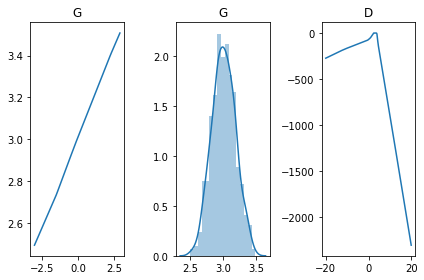

[Epoch 35204/50000] [D loss: -0.050597] [G loss: -0.128685]
[Epoch 35208/50000] [D loss: -0.050626] [G loss: -0.085482]
[Epoch 35212/50000] [D loss: -0.056433] [G loss: -0.134160]
[Epoch 35216/50000] [D loss: -0.068161] [G loss: -0.175356]
[Epoch 35220/50000] [D loss: -0.073624] [G loss: -0.292371]
[Epoch 35224/50000] [D loss: -0.065857] [G loss: -0.214845]
[Epoch 35228/50000] [D loss: -0.095385] [G loss: -0.269382]
[Epoch 35232/50000] [D loss: -0.105991] [G loss: -0.213390]
[Epoch 35236/50000] [D loss: -0.110780] [G loss: -0.222749]
[Epoch 35240/50000] [D loss: -0.090292] [G loss: -0.247944]
[Epoch 35244/50000] [D loss: -0.123629] [G loss: -0.234469]
[Epoch 35248/50000] [D loss: -0.072295] [G loss: -0.199220]
[Epoch 35252/50000] [D loss: -0.093249] [G loss: -0.234536]
[Epoch 35256/50000] [D loss: -0.081047] [G loss: -0.249352]
[Epoch 35260/50000] [D loss: -0.066610] [G loss: -0.297352]
[Epoch 35264/50000] [D loss: -0.093548] [G loss: -0.291590]
[Epoch 35268/50000] [D loss: -0.058272] 

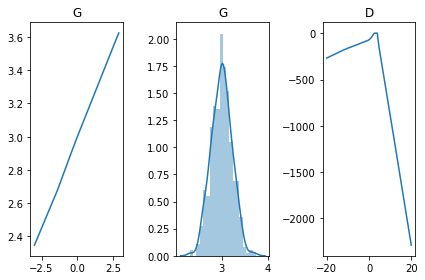

[Epoch 35304/50000] [D loss: -0.091219] [G loss: -0.380653]
[Epoch 35308/50000] [D loss: -0.086706] [G loss: -0.488094]
[Epoch 35312/50000] [D loss: -0.073939] [G loss: -0.576221]
[Epoch 35316/50000] [D loss: -0.040838] [G loss: -0.464291]
[Epoch 35320/50000] [D loss: -0.084911] [G loss: -0.441094]
[Epoch 35324/50000] [D loss: -0.016329] [G loss: -0.401691]
[Epoch 35328/50000] [D loss: -0.091667] [G loss: -0.364778]
[Epoch 35332/50000] [D loss: -0.061891] [G loss: -0.353813]
[Epoch 35336/50000] [D loss: -0.072650] [G loss: -0.362755]
[Epoch 35340/50000] [D loss: -0.068266] [G loss: -0.303816]
[Epoch 35344/50000] [D loss: -0.107805] [G loss: -0.368607]
[Epoch 35348/50000] [D loss: -0.135639] [G loss: -0.258941]
[Epoch 35352/50000] [D loss: -0.129744] [G loss: -0.285036]
[Epoch 35356/50000] [D loss: -0.147491] [G loss: -0.351337]
[Epoch 35360/50000] [D loss: -0.129749] [G loss: -0.193200]
[Epoch 35364/50000] [D loss: -0.141053] [G loss: -0.179009]
[Epoch 35368/50000] [D loss: -0.093382] 

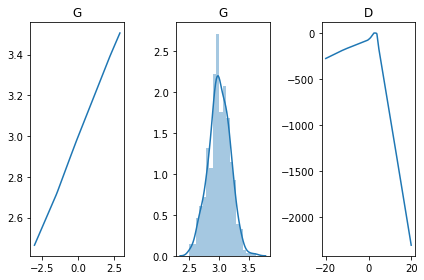

[Epoch 35404/50000] [D loss: 0.004521] [G loss: -0.376539]
[Epoch 35408/50000] [D loss: 0.024397] [G loss: -0.388952]
[Epoch 35412/50000] [D loss: -0.008695] [G loss: -0.380374]
[Epoch 35416/50000] [D loss: -0.001598] [G loss: -0.398506]
[Epoch 35420/50000] [D loss: -0.015255] [G loss: -0.415087]
[Epoch 35424/50000] [D loss: 0.000213] [G loss: -0.444846]
[Epoch 35428/50000] [D loss: -0.016908] [G loss: -0.418833]
[Epoch 35432/50000] [D loss: -0.021946] [G loss: -0.342598]
[Epoch 35436/50000] [D loss: -0.032085] [G loss: -0.262692]
[Epoch 35440/50000] [D loss: 0.001958] [G loss: -0.300838]
[Epoch 35444/50000] [D loss: -0.021638] [G loss: -0.330582]
[Epoch 35448/50000] [D loss: -0.024397] [G loss: -0.308870]
[Epoch 35452/50000] [D loss: -0.024727] [G loss: -0.304840]
[Epoch 35456/50000] [D loss: -0.007809] [G loss: -0.300059]
[Epoch 35460/50000] [D loss: -0.038264] [G loss: -0.272648]
[Epoch 35464/50000] [D loss: -0.044927] [G loss: -0.207645]
[Epoch 35468/50000] [D loss: -0.074405] [G l

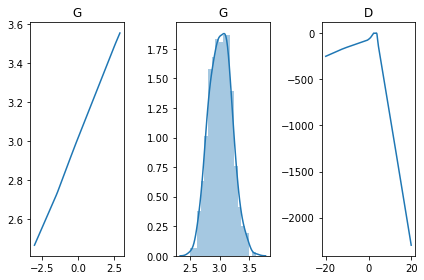

[Epoch 35504/50000] [D loss: -0.080750] [G loss: 0.234444]
[Epoch 35508/50000] [D loss: -0.143695] [G loss: 0.200235]
[Epoch 35512/50000] [D loss: -0.065035] [G loss: 0.114759]
[Epoch 35516/50000] [D loss: -0.091411] [G loss: 0.109865]
[Epoch 35520/50000] [D loss: -0.019751] [G loss: -0.111937]
[Epoch 35524/50000] [D loss: -0.077624] [G loss: -0.034940]
[Epoch 35528/50000] [D loss: -0.070696] [G loss: -0.031567]
[Epoch 35532/50000] [D loss: -0.073299] [G loss: -0.056977]
[Epoch 35536/50000] [D loss: -0.044908] [G loss: -0.173871]
[Epoch 35540/50000] [D loss: -0.066804] [G loss: -0.284690]
[Epoch 35544/50000] [D loss: -0.098281] [G loss: -0.244579]
[Epoch 35548/50000] [D loss: -0.110406] [G loss: -0.257467]
[Epoch 35552/50000] [D loss: -0.060571] [G loss: -0.235233]
[Epoch 35556/50000] [D loss: -0.049207] [G loss: -0.309383]
[Epoch 35560/50000] [D loss: -0.031801] [G loss: -0.317323]
[Epoch 35564/50000] [D loss: -0.059282] [G loss: -0.259500]
[Epoch 35568/50000] [D loss: -0.075299] [G l

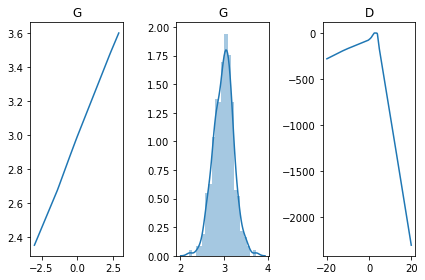

[Epoch 35604/50000] [D loss: -0.080183] [G loss: 0.331202]
[Epoch 35608/50000] [D loss: -0.048735] [G loss: 0.175068]
[Epoch 35612/50000] [D loss: -0.039415] [G loss: 0.420371]
[Epoch 35616/50000] [D loss: -0.055045] [G loss: 0.331745]
[Epoch 35620/50000] [D loss: -0.032484] [G loss: 0.331974]
[Epoch 35624/50000] [D loss: -0.014989] [G loss: 0.287940]
[Epoch 35628/50000] [D loss: -0.046282] [G loss: 0.230340]
[Epoch 35632/50000] [D loss: -0.091379] [G loss: -0.226018]
[Epoch 35636/50000] [D loss: -0.087779] [G loss: -0.023596]
[Epoch 35640/50000] [D loss: -0.076970] [G loss: -0.202294]
[Epoch 35644/50000] [D loss: -0.129267] [G loss: -0.182286]
[Epoch 35648/50000] [D loss: -0.072790] [G loss: -0.261799]
[Epoch 35652/50000] [D loss: -0.083311] [G loss: -0.269092]
[Epoch 35656/50000] [D loss: -0.035655] [G loss: -0.228117]
[Epoch 35660/50000] [D loss: -0.055306] [G loss: -0.285770]
[Epoch 35664/50000] [D loss: -0.063044] [G loss: -0.299976]
[Epoch 35668/50000] [D loss: -0.052261] [G loss

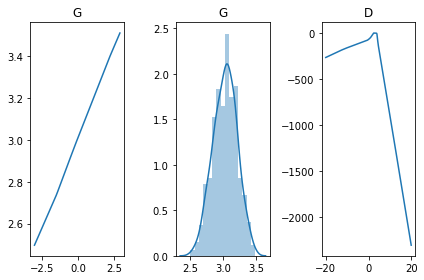

[Epoch 35704/50000] [D loss: -0.004199] [G loss: 0.748927]
[Epoch 35708/50000] [D loss: -0.042519] [G loss: -0.025441]
[Epoch 35712/50000] [D loss: -0.073531] [G loss: -0.220592]
[Epoch 35716/50000] [D loss: -0.066092] [G loss: -0.162073]
[Epoch 35720/50000] [D loss: -0.071236] [G loss: -0.229326]
[Epoch 35724/50000] [D loss: -0.070188] [G loss: -0.219006]
[Epoch 35728/50000] [D loss: -0.088343] [G loss: -0.243107]
[Epoch 35732/50000] [D loss: -0.090383] [G loss: -0.199451]
[Epoch 35736/50000] [D loss: -0.101307] [G loss: -0.251489]
[Epoch 35740/50000] [D loss: -0.081139] [G loss: -0.300045]
[Epoch 35744/50000] [D loss: -0.106648] [G loss: -0.251378]
[Epoch 35748/50000] [D loss: -0.063490] [G loss: -0.253594]
[Epoch 35752/50000] [D loss: -0.077162] [G loss: -0.239427]
[Epoch 35756/50000] [D loss: -0.048464] [G loss: -0.260443]
[Epoch 35760/50000] [D loss: -0.106990] [G loss: -0.245393]
[Epoch 35764/50000] [D loss: -0.092585] [G loss: -0.326073]
[Epoch 35768/50000] [D loss: -0.055820] [

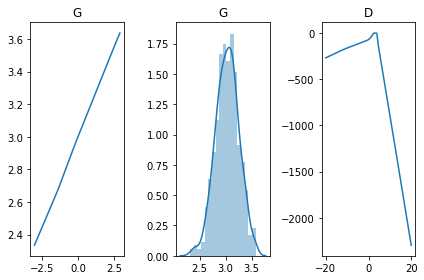

[Epoch 35804/50000] [D loss: -0.063452] [G loss: -1.070647]
[Epoch 35808/50000] [D loss: -0.068846] [G loss: -0.857545]
[Epoch 35812/50000] [D loss: -0.081683] [G loss: -0.671963]
[Epoch 35816/50000] [D loss: -0.032741] [G loss: -0.779096]
[Epoch 35820/50000] [D loss: -0.065560] [G loss: -0.875851]
[Epoch 35824/50000] [D loss: -0.129344] [G loss: -0.654487]
[Epoch 35828/50000] [D loss: -0.080154] [G loss: -0.617931]
[Epoch 35832/50000] [D loss: -0.068568] [G loss: -0.750062]
[Epoch 35836/50000] [D loss: -0.066643] [G loss: -0.803091]
[Epoch 35840/50000] [D loss: -0.077175] [G loss: -0.823640]
[Epoch 35844/50000] [D loss: -0.104931] [G loss: -0.837017]
[Epoch 35848/50000] [D loss: -0.102656] [G loss: -0.795307]
[Epoch 35852/50000] [D loss: -0.093681] [G loss: -0.751390]
[Epoch 35856/50000] [D loss: -0.076682] [G loss: -0.816520]
[Epoch 35860/50000] [D loss: -0.092085] [G loss: -0.826758]
[Epoch 35864/50000] [D loss: -0.086147] [G loss: -0.775976]
[Epoch 35868/50000] [D loss: -0.095385] 

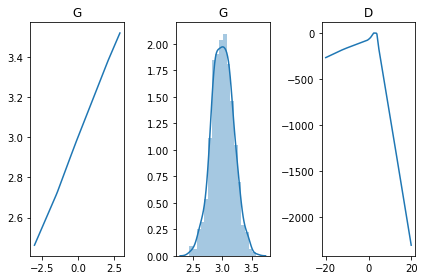

[Epoch 35904/50000] [D loss: -0.061905] [G loss: -0.715139]
[Epoch 35908/50000] [D loss: -0.070338] [G loss: -0.772075]
[Epoch 35912/50000] [D loss: -0.053679] [G loss: -0.783496]
[Epoch 35916/50000] [D loss: -0.062471] [G loss: -0.791692]
[Epoch 35920/50000] [D loss: -0.062990] [G loss: -0.799461]
[Epoch 35924/50000] [D loss: -0.060952] [G loss: -0.806479]
[Epoch 35928/50000] [D loss: -0.070376] [G loss: -0.759876]
[Epoch 35932/50000] [D loss: -0.054716] [G loss: -0.695373]
[Epoch 35936/50000] [D loss: -0.060882] [G loss: -0.654339]
[Epoch 35940/50000] [D loss: -0.066870] [G loss: -0.579692]
[Epoch 35944/50000] [D loss: -0.071296] [G loss: -0.654485]
[Epoch 35948/50000] [D loss: -0.073635] [G loss: -0.681811]
[Epoch 35952/50000] [D loss: -0.062876] [G loss: -0.642173]
[Epoch 35956/50000] [D loss: -0.050222] [G loss: -0.577564]
[Epoch 35960/50000] [D loss: -0.056237] [G loss: -0.572091]
[Epoch 35964/50000] [D loss: -0.066289] [G loss: -0.453683]
[Epoch 35968/50000] [D loss: -0.041699] 

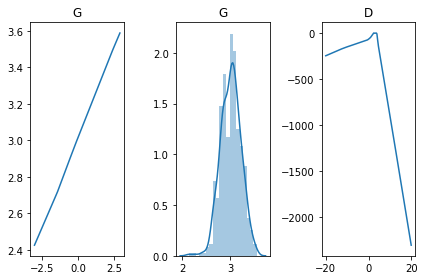

[Epoch 36004/50000] [D loss: -0.084958] [G loss: 0.245369]
[Epoch 36008/50000] [D loss: -0.065899] [G loss: 0.207386]
[Epoch 36012/50000] [D loss: -0.120110] [G loss: 0.276776]
[Epoch 36016/50000] [D loss: -0.098605] [G loss: 0.097461]
[Epoch 36020/50000] [D loss: -0.038112] [G loss: 0.034932]
[Epoch 36024/50000] [D loss: -0.027596] [G loss: 0.096508]
[Epoch 36028/50000] [D loss: -0.066206] [G loss: 0.150143]
[Epoch 36032/50000] [D loss: -0.088965] [G loss: 0.024121]
[Epoch 36036/50000] [D loss: -0.059445] [G loss: -0.338395]
[Epoch 36040/50000] [D loss: -0.076095] [G loss: -0.311484]
[Epoch 36044/50000] [D loss: -0.066833] [G loss: -0.302140]
[Epoch 36048/50000] [D loss: -0.093139] [G loss: -0.297329]
[Epoch 36052/50000] [D loss: -0.097496] [G loss: -0.286614]
[Epoch 36056/50000] [D loss: -0.082337] [G loss: -0.268912]
[Epoch 36060/50000] [D loss: -0.103753] [G loss: -0.343697]
[Epoch 36064/50000] [D loss: -0.099869] [G loss: -0.354454]
[Epoch 36068/50000] [D loss: -0.072962] [G loss:

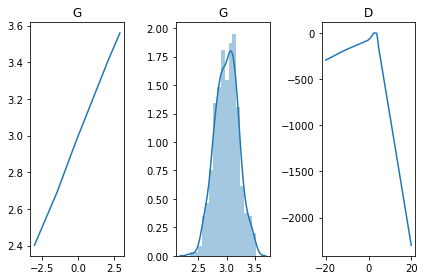

[Epoch 36104/50000] [D loss: -0.103205] [G loss: -0.254016]
[Epoch 36108/50000] [D loss: -0.067955] [G loss: -0.238022]
[Epoch 36112/50000] [D loss: -0.067554] [G loss: -0.159798]
[Epoch 36116/50000] [D loss: -0.096683] [G loss: -0.125903]
[Epoch 36120/50000] [D loss: -0.075266] [G loss: -0.094979]
[Epoch 36124/50000] [D loss: -0.107317] [G loss: -0.131659]
[Epoch 36128/50000] [D loss: -0.091496] [G loss: -0.284959]
[Epoch 36132/50000] [D loss: -0.067880] [G loss: -0.276036]
[Epoch 36136/50000] [D loss: -0.052753] [G loss: -0.263457]
[Epoch 36140/50000] [D loss: -0.057636] [G loss: -0.261216]
[Epoch 36144/50000] [D loss: -0.046648] [G loss: -0.267190]
[Epoch 36148/50000] [D loss: -0.064600] [G loss: -0.306199]
[Epoch 36152/50000] [D loss: -0.066176] [G loss: -0.283377]
[Epoch 36156/50000] [D loss: -0.060067] [G loss: -0.260899]
[Epoch 36160/50000] [D loss: -0.058710] [G loss: -0.158581]
[Epoch 36164/50000] [D loss: -0.046399] [G loss: -0.109772]
[Epoch 36168/50000] [D loss: -0.053274] 

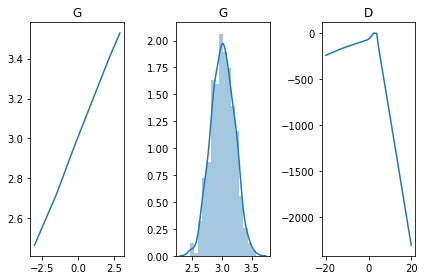

[Epoch 36204/50000] [D loss: -0.080471] [G loss: -0.412621]
[Epoch 36208/50000] [D loss: -0.076683] [G loss: -0.220543]
[Epoch 36212/50000] [D loss: -0.065586] [G loss: -0.237051]
[Epoch 36216/50000] [D loss: -0.074583] [G loss: -0.306647]
[Epoch 36220/50000] [D loss: -0.069076] [G loss: -0.333441]
[Epoch 36224/50000] [D loss: -0.084332] [G loss: -0.241112]
[Epoch 36228/50000] [D loss: -0.056174] [G loss: -0.215955]
[Epoch 36232/50000] [D loss: -0.088388] [G loss: -0.190395]
[Epoch 36236/50000] [D loss: -0.061457] [G loss: -0.222926]
[Epoch 36240/50000] [D loss: -0.070475] [G loss: -0.120662]
[Epoch 36244/50000] [D loss: -0.061802] [G loss: -0.235661]
[Epoch 36248/50000] [D loss: -0.059747] [G loss: -0.302769]
[Epoch 36252/50000] [D loss: -0.047022] [G loss: -0.342683]
[Epoch 36256/50000] [D loss: -0.053143] [G loss: -0.390863]
[Epoch 36260/50000] [D loss: -0.069871] [G loss: -0.506173]
[Epoch 36264/50000] [D loss: -0.072464] [G loss: -0.439185]
[Epoch 36268/50000] [D loss: -0.075057] 

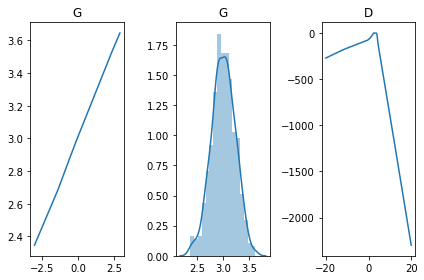

[Epoch 36304/50000] [D loss: -0.096153] [G loss: -0.404893]
[Epoch 36308/50000] [D loss: -0.093398] [G loss: -0.454411]
[Epoch 36312/50000] [D loss: -0.095451] [G loss: -0.492911]
[Epoch 36316/50000] [D loss: -0.120490] [G loss: -0.239876]
[Epoch 36320/50000] [D loss: -0.073158] [G loss: -0.134882]
[Epoch 36324/50000] [D loss: -0.072386] [G loss: -0.289985]
[Epoch 36328/50000] [D loss: -0.068450] [G loss: -0.320435]
[Epoch 36332/50000] [D loss: -0.085531] [G loss: -0.398943]
[Epoch 36336/50000] [D loss: -0.079449] [G loss: -0.351660]
[Epoch 36340/50000] [D loss: -0.083571] [G loss: -0.420079]
[Epoch 36344/50000] [D loss: -0.096044] [G loss: -0.486081]
[Epoch 36348/50000] [D loss: -0.091838] [G loss: 1.122431]
[Epoch 36352/50000] [D loss: -0.091621] [G loss: -0.653100]
[Epoch 36356/50000] [D loss: -0.038383] [G loss: -0.407632]
[Epoch 36360/50000] [D loss: -0.028828] [G loss: -0.497131]
[Epoch 36364/50000] [D loss: -0.041116] [G loss: -0.596274]
[Epoch 36368/50000] [D loss: -0.071295] [

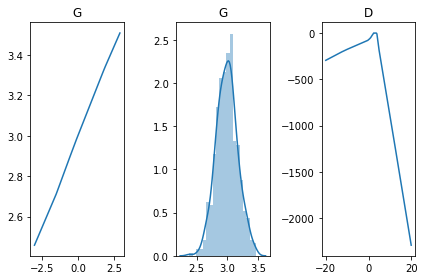

[Epoch 36404/50000] [D loss: -0.068898] [G loss: -0.703255]
[Epoch 36408/50000] [D loss: -0.039508] [G loss: -0.685746]
[Epoch 36412/50000] [D loss: -0.041233] [G loss: -0.595333]
[Epoch 36416/50000] [D loss: -0.046405] [G loss: -0.613041]
[Epoch 36420/50000] [D loss: -0.053374] [G loss: -0.670024]
[Epoch 36424/50000] [D loss: -0.051836] [G loss: -0.669323]
[Epoch 36428/50000] [D loss: -0.058691] [G loss: -0.632367]
[Epoch 36432/50000] [D loss: -0.075159] [G loss: -0.579462]
[Epoch 36436/50000] [D loss: -0.031871] [G loss: -0.466782]
[Epoch 36440/50000] [D loss: -0.039072] [G loss: -0.637700]
[Epoch 36444/50000] [D loss: -0.058729] [G loss: -0.584796]
[Epoch 36448/50000] [D loss: -0.043940] [G loss: -0.494755]
[Epoch 36452/50000] [D loss: -0.035230] [G loss: -0.476012]
[Epoch 36456/50000] [D loss: -0.046518] [G loss: -0.391059]
[Epoch 36460/50000] [D loss: -0.074001] [G loss: 0.159019]
[Epoch 36464/50000] [D loss: -0.061404] [G loss: 0.135753]
[Epoch 36468/50000] [D loss: -0.060131] [G

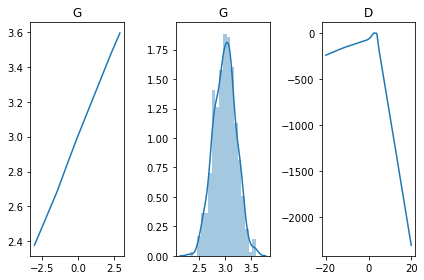

[Epoch 36504/50000] [D loss: -0.058217] [G loss: 0.223857]
[Epoch 36508/50000] [D loss: -0.070818] [G loss: 0.280012]
[Epoch 36512/50000] [D loss: -0.073309] [G loss: 0.251849]
[Epoch 36516/50000] [D loss: -0.056589] [G loss: 0.266040]
[Epoch 36520/50000] [D loss: -0.070890] [G loss: 0.245929]
[Epoch 36524/50000] [D loss: -0.042863] [G loss: 0.143172]
[Epoch 36528/50000] [D loss: -0.046081] [G loss: 0.091858]
[Epoch 36532/50000] [D loss: -0.069815] [G loss: 0.032594]
[Epoch 36536/50000] [D loss: -0.000351] [G loss: 0.353257]
[Epoch 36540/50000] [D loss: -0.044001] [G loss: 0.162648]
[Epoch 36544/50000] [D loss: -0.062985] [G loss: 0.108574]
[Epoch 36548/50000] [D loss: -0.065849] [G loss: 0.377770]
[Epoch 36552/50000] [D loss: -0.055657] [G loss: 0.330790]
[Epoch 36556/50000] [D loss: -0.035129] [G loss: 0.240157]
[Epoch 36560/50000] [D loss: -0.050980] [G loss: 0.298853]
[Epoch 36564/50000] [D loss: -0.026970] [G loss: 0.273538]
[Epoch 36568/50000] [D loss: -0.028553] [G loss: 0.32011

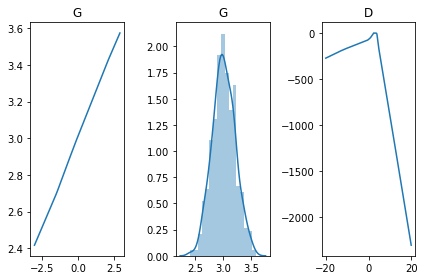

[Epoch 36604/50000] [D loss: -0.044400] [G loss: 0.318007]
[Epoch 36608/50000] [D loss: -0.025919] [G loss: 0.295866]
[Epoch 36612/50000] [D loss: -0.039608] [G loss: 0.287983]
[Epoch 36616/50000] [D loss: -0.036867] [G loss: 0.295891]
[Epoch 36620/50000] [D loss: -0.031390] [G loss: 0.282489]
[Epoch 36624/50000] [D loss: -0.047783] [G loss: 0.288879]
[Epoch 36628/50000] [D loss: -0.036928] [G loss: 0.285515]
[Epoch 36632/50000] [D loss: -0.036130] [G loss: 0.367602]
[Epoch 36636/50000] [D loss: -0.035685] [G loss: 0.357466]
[Epoch 36640/50000] [D loss: -0.020132] [G loss: 0.372074]
[Epoch 36644/50000] [D loss: -0.025335] [G loss: 0.380730]
[Epoch 36648/50000] [D loss: -0.022901] [G loss: 0.341875]
[Epoch 36652/50000] [D loss: -0.036507] [G loss: 0.349142]
[Epoch 36656/50000] [D loss: -0.039263] [G loss: 0.341939]
[Epoch 36660/50000] [D loss: -0.023803] [G loss: 0.350635]
[Epoch 36664/50000] [D loss: -0.013076] [G loss: 0.296270]
[Epoch 36668/50000] [D loss: -0.032249] [G loss: 0.33385

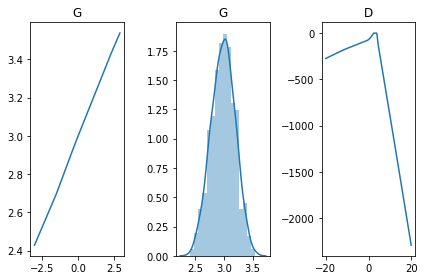

[Epoch 36704/50000] [D loss: -0.017580] [G loss: 0.453340]
[Epoch 36708/50000] [D loss: -0.018478] [G loss: 0.455030]
[Epoch 36712/50000] [D loss: -0.032115] [G loss: 0.449445]
[Epoch 36716/50000] [D loss: -0.006594] [G loss: 0.420672]
[Epoch 36720/50000] [D loss: -0.005449] [G loss: 0.433897]
[Epoch 36724/50000] [D loss: -0.007667] [G loss: 0.468845]
[Epoch 36728/50000] [D loss: -0.002708] [G loss: 0.444606]
[Epoch 36732/50000] [D loss: -0.033031] [G loss: 0.500503]
[Epoch 36736/50000] [D loss: -0.008286] [G loss: 0.383678]
[Epoch 36740/50000] [D loss: -0.049161] [G loss: 0.372916]
[Epoch 36744/50000] [D loss: -0.008626] [G loss: 0.388735]
[Epoch 36748/50000] [D loss: -0.001242] [G loss: 0.420109]
[Epoch 36752/50000] [D loss: 0.003880] [G loss: 0.465215]
[Epoch 36756/50000] [D loss: -0.051503] [G loss: 0.467212]
[Epoch 36760/50000] [D loss: -0.007275] [G loss: 0.464431]
[Epoch 36764/50000] [D loss: -0.005169] [G loss: 0.439373]
[Epoch 36768/50000] [D loss: -0.023644] [G loss: 0.368912

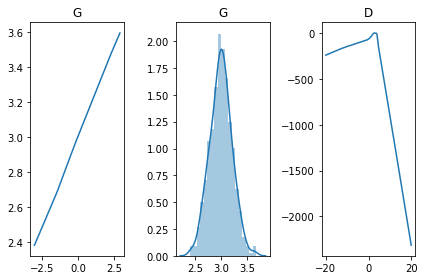

[Epoch 36804/50000] [D loss: -0.032495] [G loss: 0.341393]
[Epoch 36808/50000] [D loss: -0.037064] [G loss: 0.324157]
[Epoch 36812/50000] [D loss: 0.010074] [G loss: 0.290200]
[Epoch 36816/50000] [D loss: -0.010729] [G loss: 0.281284]
[Epoch 36820/50000] [D loss: 0.007674] [G loss: 0.227999]
[Epoch 36824/50000] [D loss: -0.041919] [G loss: 0.152203]
[Epoch 36828/50000] [D loss: -0.016140] [G loss: 0.284207]
[Epoch 36832/50000] [D loss: -0.033060] [G loss: 0.222053]
[Epoch 36836/50000] [D loss: -0.046541] [G loss: 0.142423]
[Epoch 36840/50000] [D loss: -0.045389] [G loss: 0.123948]
[Epoch 36844/50000] [D loss: -0.019631] [G loss: 0.419501]
[Epoch 36848/50000] [D loss: -0.029280] [G loss: 0.376234]
[Epoch 36852/50000] [D loss: -0.061075] [G loss: 0.304776]
[Epoch 36856/50000] [D loss: 0.038493] [G loss: 0.360568]
[Epoch 36860/50000] [D loss: -0.037320] [G loss: 0.292372]
[Epoch 36864/50000] [D loss: -0.067485] [G loss: 0.178689]
[Epoch 36868/50000] [D loss: -0.074522] [G loss: -0.178875]

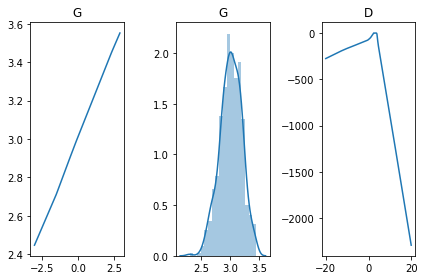

[Epoch 36904/50000] [D loss: -0.045310] [G loss: -0.165007]
[Epoch 36908/50000] [D loss: -0.064987] [G loss: -0.114935]
[Epoch 36912/50000] [D loss: -0.053286] [G loss: -0.181783]
[Epoch 36916/50000] [D loss: -0.052395] [G loss: -0.162931]
[Epoch 36920/50000] [D loss: -0.046771] [G loss: -0.076857]
[Epoch 36924/50000] [D loss: -0.053902] [G loss: -0.214067]
[Epoch 36928/50000] [D loss: -0.070292] [G loss: -0.292225]
[Epoch 36932/50000] [D loss: -0.078520] [G loss: -0.254975]
[Epoch 36936/50000] [D loss: -0.066038] [G loss: -0.267135]
[Epoch 36940/50000] [D loss: -0.068088] [G loss: -0.310682]
[Epoch 36944/50000] [D loss: -0.075101] [G loss: -0.251290]
[Epoch 36948/50000] [D loss: -0.049503] [G loss: -0.261404]
[Epoch 36952/50000] [D loss: -0.093626] [G loss: -0.230090]
[Epoch 36956/50000] [D loss: -0.089434] [G loss: -0.229142]
[Epoch 36960/50000] [D loss: -0.093068] [G loss: -0.253689]
[Epoch 36964/50000] [D loss: -0.062785] [G loss: -0.295269]
[Epoch 36968/50000] [D loss: -0.055263] 

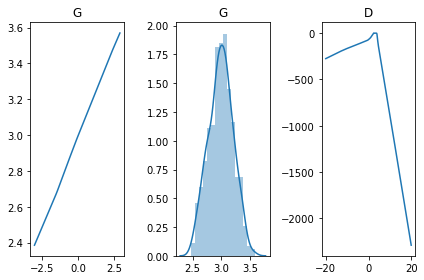

[Epoch 37004/50000] [D loss: -0.104950] [G loss: -0.337345]
[Epoch 37008/50000] [D loss: -0.093145] [G loss: -0.297028]
[Epoch 37012/50000] [D loss: -0.102033] [G loss: -0.243540]
[Epoch 37016/50000] [D loss: -0.122752] [G loss: -0.266816]
[Epoch 37020/50000] [D loss: -0.094229] [G loss: -0.210823]
[Epoch 37024/50000] [D loss: -0.070363] [G loss: -0.204331]
[Epoch 37028/50000] [D loss: -0.081418] [G loss: -0.257068]
[Epoch 37032/50000] [D loss: -0.083071] [G loss: -0.334184]
[Epoch 37036/50000] [D loss: -0.053674] [G loss: -0.285807]
[Epoch 37040/50000] [D loss: -0.051475] [G loss: -0.341730]
[Epoch 37044/50000] [D loss: -0.081275] [G loss: -0.356958]
[Epoch 37048/50000] [D loss: -0.056932] [G loss: -0.367369]
[Epoch 37052/50000] [D loss: -0.074693] [G loss: -0.408608]
[Epoch 37056/50000] [D loss: -0.074708] [G loss: -0.406755]
[Epoch 37060/50000] [D loss: -0.050225] [G loss: -0.409496]
[Epoch 37064/50000] [D loss: -0.088602] [G loss: -0.383790]
[Epoch 37068/50000] [D loss: -0.080894] 

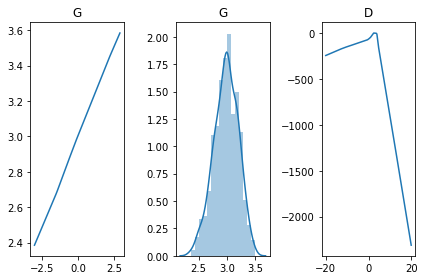

[Epoch 37104/50000] [D loss: -0.068267] [G loss: -0.286172]
[Epoch 37108/50000] [D loss: -0.071786] [G loss: -0.245858]
[Epoch 37112/50000] [D loss: -0.103289] [G loss: -0.319719]
[Epoch 37116/50000] [D loss: -0.068811] [G loss: -0.351283]
[Epoch 37120/50000] [D loss: -0.062533] [G loss: -0.411503]
[Epoch 37124/50000] [D loss: -0.069850] [G loss: -0.399329]
[Epoch 37128/50000] [D loss: -0.069642] [G loss: -0.433259]
[Epoch 37132/50000] [D loss: -0.089079] [G loss: 0.041103]
[Epoch 37136/50000] [D loss: -0.091867] [G loss: -0.194535]
[Epoch 37140/50000] [D loss: -0.090331] [G loss: 0.501934]
[Epoch 37144/50000] [D loss: -0.079820] [G loss: 0.311294]
[Epoch 37148/50000] [D loss: -0.058608] [G loss: 0.259808]
[Epoch 37152/50000] [D loss: -0.087152] [G loss: 0.258590]
[Epoch 37156/50000] [D loss: -0.046115] [G loss: 0.253273]
[Epoch 37160/50000] [D loss: -0.065739] [G loss: 0.281579]
[Epoch 37164/50000] [D loss: -0.068611] [G loss: 0.240893]
[Epoch 37168/50000] [D loss: -0.071651] [G loss:

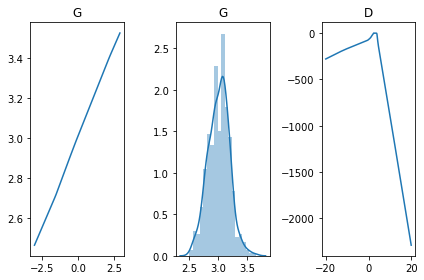

[Epoch 37204/50000] [D loss: -0.076267] [G loss: 0.372229]
[Epoch 37208/50000] [D loss: -0.090431] [G loss: 0.392121]
[Epoch 37212/50000] [D loss: -0.078925] [G loss: 0.378745]
[Epoch 37216/50000] [D loss: -0.050319] [G loss: 0.387831]
[Epoch 37220/50000] [D loss: -0.081155] [G loss: 0.459394]
[Epoch 37224/50000] [D loss: -0.104261] [G loss: 0.521441]
[Epoch 37228/50000] [D loss: -0.113922] [G loss: -1.016955]
[Epoch 37232/50000] [D loss: -0.093193] [G loss: -0.895877]
[Epoch 37236/50000] [D loss: -0.102469] [G loss: -0.819860]
[Epoch 37240/50000] [D loss: -0.090752] [G loss: -0.711610]
[Epoch 37244/50000] [D loss: -0.083463] [G loss: -0.645196]
[Epoch 37248/50000] [D loss: -0.058590] [G loss: -0.694604]
[Epoch 37252/50000] [D loss: -0.049176] [G loss: -0.623747]
[Epoch 37256/50000] [D loss: -0.090426] [G loss: -0.326155]
[Epoch 37260/50000] [D loss: -0.069293] [G loss: -0.202794]
[Epoch 37264/50000] [D loss: -0.073947] [G loss: -0.265040]
[Epoch 37268/50000] [D loss: -0.034552] [G los

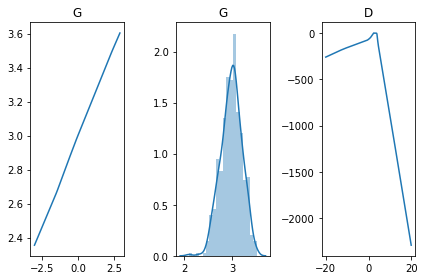

[Epoch 37304/50000] [D loss: -0.080102] [G loss: -0.457554]
[Epoch 37308/50000] [D loss: -0.085669] [G loss: -0.544659]
[Epoch 37312/50000] [D loss: -0.021020] [G loss: 0.208234]
[Epoch 37316/50000] [D loss: -0.053634] [G loss: 0.072686]
[Epoch 37320/50000] [D loss: -0.050082] [G loss: -0.019871]
[Epoch 37324/50000] [D loss: -0.082752] [G loss: -0.935545]
[Epoch 37328/50000] [D loss: -0.101589] [G loss: -0.400135]
[Epoch 37332/50000] [D loss: -0.078069] [G loss: -0.306873]
[Epoch 37336/50000] [D loss: -0.081069] [G loss: -0.317811]
[Epoch 37340/50000] [D loss: -0.078550] [G loss: -0.337764]
[Epoch 37344/50000] [D loss: -0.091696] [G loss: -0.345963]
[Epoch 37348/50000] [D loss: -0.082724] [G loss: -0.294864]
[Epoch 37352/50000] [D loss: -0.089646] [G loss: -0.317649]
[Epoch 37356/50000] [D loss: -0.081316] [G loss: -0.290280]
[Epoch 37360/50000] [D loss: -0.097511] [G loss: -0.310070]
[Epoch 37364/50000] [D loss: -0.080447] [G loss: -0.333509]
[Epoch 37368/50000] [D loss: -0.088807] [G

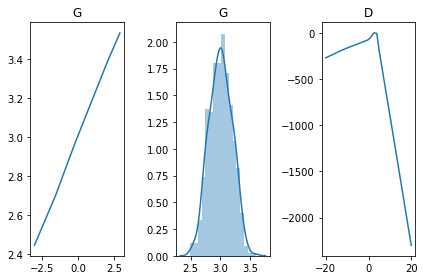

[Epoch 37404/50000] [D loss: -0.064315] [G loss: -0.294332]
[Epoch 37408/50000] [D loss: -0.051563] [G loss: -0.241277]
[Epoch 37412/50000] [D loss: -0.047399] [G loss: -0.254565]
[Epoch 37416/50000] [D loss: -0.057837] [G loss: -0.212010]
[Epoch 37420/50000] [D loss: -0.066383] [G loss: -0.224598]
[Epoch 37424/50000] [D loss: -0.065291] [G loss: -0.242439]
[Epoch 37428/50000] [D loss: -0.067144] [G loss: -0.205205]
[Epoch 37432/50000] [D loss: -0.051673] [G loss: -0.148638]
[Epoch 37436/50000] [D loss: -0.044255] [G loss: -0.094511]
[Epoch 37440/50000] [D loss: -0.054803] [G loss: -0.052794]
[Epoch 37444/50000] [D loss: -0.054613] [G loss: -0.107051]
[Epoch 37448/50000] [D loss: -0.054053] [G loss: -0.116162]
[Epoch 37452/50000] [D loss: -0.060602] [G loss: -0.062388]
[Epoch 37456/50000] [D loss: -0.053732] [G loss: -0.160197]
[Epoch 37460/50000] [D loss: -0.078902] [G loss: -0.122142]
[Epoch 37464/50000] [D loss: -0.054901] [G loss: -0.062209]
[Epoch 37468/50000] [D loss: -0.065486] 

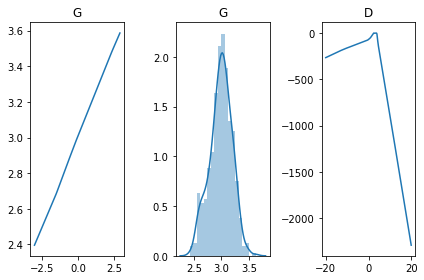

[Epoch 37504/50000] [D loss: -0.035298] [G loss: 0.282108]
[Epoch 37508/50000] [D loss: -0.006341] [G loss: 0.276610]
[Epoch 37512/50000] [D loss: -0.023546] [G loss: 0.268213]
[Epoch 37516/50000] [D loss: -0.045679] [G loss: 0.306489]
[Epoch 37520/50000] [D loss: -0.042975] [G loss: 0.309906]
[Epoch 37524/50000] [D loss: -0.030016] [G loss: 0.348064]
[Epoch 37528/50000] [D loss: -0.016565] [G loss: 0.315679]
[Epoch 37532/50000] [D loss: -0.043206] [G loss: 0.292119]
[Epoch 37536/50000] [D loss: -0.026099] [G loss: 0.233532]
[Epoch 37540/50000] [D loss: -0.029693] [G loss: 0.268877]
[Epoch 37544/50000] [D loss: -0.031247] [G loss: 0.256453]
[Epoch 37548/50000] [D loss: -0.050688] [G loss: 0.167998]
[Epoch 37552/50000] [D loss: -0.023377] [G loss: 0.292818]
[Epoch 37556/50000] [D loss: -0.048405] [G loss: 0.252602]
[Epoch 37560/50000] [D loss: -0.047097] [G loss: 0.138396]
[Epoch 37564/50000] [D loss: -0.058194] [G loss: 0.117750]
[Epoch 37568/50000] [D loss: -0.044970] [G loss: 0.03338

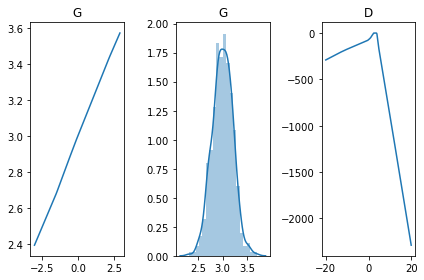

[Epoch 37604/50000] [D loss: -0.057584] [G loss: 0.278166]
[Epoch 37608/50000] [D loss: -0.025135] [G loss: 0.207782]
[Epoch 37612/50000] [D loss: -0.017775] [G loss: 0.420698]
[Epoch 37616/50000] [D loss: -0.028226] [G loss: 0.358700]
[Epoch 37620/50000] [D loss: -0.014245] [G loss: 0.330946]
[Epoch 37624/50000] [D loss: -0.011937] [G loss: 0.399467]
[Epoch 37628/50000] [D loss: -0.021055] [G loss: 0.417862]
[Epoch 37632/50000] [D loss: -0.024084] [G loss: 0.418330]
[Epoch 37636/50000] [D loss: -0.026936] [G loss: 0.446994]
[Epoch 37640/50000] [D loss: -0.009941] [G loss: 0.499455]
[Epoch 37644/50000] [D loss: -0.008525] [G loss: 0.591156]
[Epoch 37648/50000] [D loss: -0.007444] [G loss: 0.578548]
[Epoch 37652/50000] [D loss: -0.012769] [G loss: 0.579335]
[Epoch 37656/50000] [D loss: -0.002510] [G loss: 0.534031]
[Epoch 37660/50000] [D loss: 0.003612] [G loss: 0.485540]
[Epoch 37664/50000] [D loss: -0.024228] [G loss: 0.422591]
[Epoch 37668/50000] [D loss: -0.021588] [G loss: 0.421643

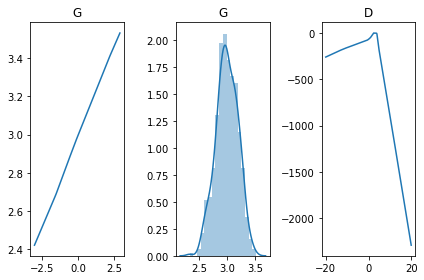

[Epoch 37704/50000] [D loss: -0.042229] [G loss: 0.227206]
[Epoch 37708/50000] [D loss: -0.049877] [G loss: 0.204350]
[Epoch 37712/50000] [D loss: -0.038764] [G loss: 0.210296]
[Epoch 37716/50000] [D loss: -0.036632] [G loss: 0.222710]
[Epoch 37720/50000] [D loss: -0.039678] [G loss: 0.238974]
[Epoch 37724/50000] [D loss: -0.057109] [G loss: 0.229278]
[Epoch 37728/50000] [D loss: -0.059909] [G loss: 0.224358]
[Epoch 37732/50000] [D loss: -0.008070] [G loss: 0.356427]
[Epoch 37736/50000] [D loss: -0.030162] [G loss: 0.293336]
[Epoch 37740/50000] [D loss: -0.057177] [G loss: 0.294111]
[Epoch 37744/50000] [D loss: -0.027577] [G loss: 0.278407]
[Epoch 37748/50000] [D loss: -0.036020] [G loss: 0.213441]
[Epoch 37752/50000] [D loss: -0.010402] [G loss: 0.171348]
[Epoch 37756/50000] [D loss: -0.021172] [G loss: 0.280130]
[Epoch 37760/50000] [D loss: -0.025221] [G loss: 0.306201]
[Epoch 37764/50000] [D loss: 0.004095] [G loss: 0.278884]
[Epoch 37768/50000] [D loss: 0.004964] [G loss: 0.304905]

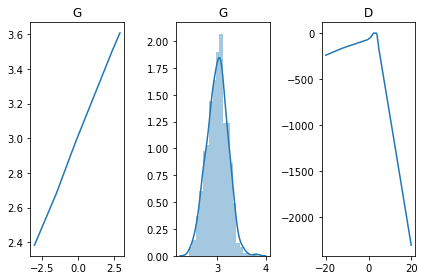

[Epoch 37804/50000] [D loss: -0.040372] [G loss: 0.308729]
[Epoch 37808/50000] [D loss: -0.079110] [G loss: 0.343199]
[Epoch 37812/50000] [D loss: -0.019582] [G loss: 0.250617]
[Epoch 37816/50000] [D loss: -0.024923] [G loss: 0.218289]
[Epoch 37820/50000] [D loss: -0.051262] [G loss: 0.222656]
[Epoch 37824/50000] [D loss: -0.049644] [G loss: -0.242711]
[Epoch 37828/50000] [D loss: -0.059208] [G loss: -0.264730]
[Epoch 37832/50000] [D loss: -0.061555] [G loss: -0.279267]
[Epoch 37836/50000] [D loss: -0.068616] [G loss: -0.301949]
[Epoch 37840/50000] [D loss: -0.077585] [G loss: -0.269345]
[Epoch 37844/50000] [D loss: -0.037150] [G loss: -0.304011]
[Epoch 37848/50000] [D loss: -0.066988] [G loss: -0.314754]
[Epoch 37852/50000] [D loss: -0.073156] [G loss: -0.378326]
[Epoch 37856/50000] [D loss: -0.086472] [G loss: -0.456890]
[Epoch 37860/50000] [D loss: -0.076776] [G loss: -0.339444]
[Epoch 37864/50000] [D loss: -0.085551] [G loss: -0.302183]
[Epoch 37868/50000] [D loss: -0.114862] [G lo

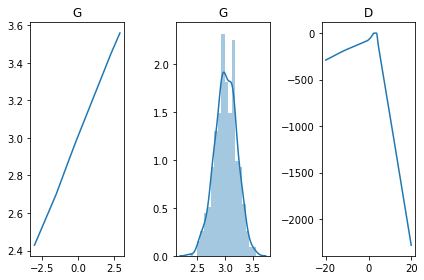

[Epoch 37904/50000] [D loss: -0.064211] [G loss: -0.254675]
[Epoch 37908/50000] [D loss: -0.081907] [G loss: -0.280704]
[Epoch 37912/50000] [D loss: -0.069590] [G loss: -0.298772]
[Epoch 37916/50000] [D loss: -0.047346] [G loss: -0.232402]
[Epoch 37920/50000] [D loss: -0.063357] [G loss: -0.099302]
[Epoch 37924/50000] [D loss: -0.045524] [G loss: -0.113150]
[Epoch 37928/50000] [D loss: -0.042118] [G loss: -0.071186]
[Epoch 37932/50000] [D loss: -0.064012] [G loss: -0.124809]
[Epoch 37936/50000] [D loss: -0.075738] [G loss: -0.172636]
[Epoch 37940/50000] [D loss: -0.086486] [G loss: -0.277847]
[Epoch 37944/50000] [D loss: -0.104946] [G loss: -0.256255]
[Epoch 37948/50000] [D loss: -0.079481] [G loss: -0.242230]
[Epoch 37952/50000] [D loss: -0.104798] [G loss: -0.126786]
[Epoch 37956/50000] [D loss: -0.074778] [G loss: -0.025554]
[Epoch 37960/50000] [D loss: -0.095442] [G loss: 0.106915]
[Epoch 37964/50000] [D loss: -0.104968] [G loss: 0.082942]
[Epoch 37968/50000] [D loss: -0.072449] [G

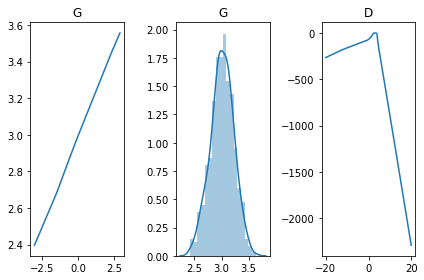

[Epoch 38004/50000] [D loss: -0.045843] [G loss: 0.088354]
[Epoch 38008/50000] [D loss: -0.065724] [G loss: 0.240657]
[Epoch 38012/50000] [D loss: -0.081992] [G loss: 0.350686]
[Epoch 38016/50000] [D loss: -0.086289] [G loss: 0.340697]
[Epoch 38020/50000] [D loss: -0.080290] [G loss: 0.328586]
[Epoch 38024/50000] [D loss: -0.086708] [G loss: 0.287189]
[Epoch 38028/50000] [D loss: -0.057258] [G loss: 0.270686]
[Epoch 38032/50000] [D loss: -0.052439] [G loss: 0.248381]
[Epoch 38036/50000] [D loss: -0.082896] [G loss: 0.232451]
[Epoch 38040/50000] [D loss: -0.091449] [G loss: 0.266274]
[Epoch 38044/50000] [D loss: -0.063920] [G loss: 0.252868]
[Epoch 38048/50000] [D loss: -0.080222] [G loss: 0.289676]
[Epoch 38052/50000] [D loss: -0.088124] [G loss: 0.237535]
[Epoch 38056/50000] [D loss: -0.051405] [G loss: 0.235318]
[Epoch 38060/50000] [D loss: -0.092098] [G loss: 0.218265]
[Epoch 38064/50000] [D loss: -0.068752] [G loss: 0.230513]
[Epoch 38068/50000] [D loss: -0.061716] [G loss: 0.26918

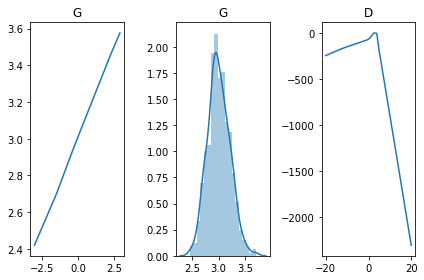

[Epoch 38104/50000] [D loss: -0.068890] [G loss: 0.332135]
[Epoch 38108/50000] [D loss: -0.094637] [G loss: 0.321755]
[Epoch 38112/50000] [D loss: -0.059256] [G loss: 0.294077]
[Epoch 38116/50000] [D loss: -0.068714] [G loss: 0.260475]
[Epoch 38120/50000] [D loss: -0.050794] [G loss: 0.281590]
[Epoch 38124/50000] [D loss: -0.063829] [G loss: 0.281804]
[Epoch 38128/50000] [D loss: -0.058329] [G loss: 0.285503]
[Epoch 38132/50000] [D loss: -0.085374] [G loss: 0.265820]
[Epoch 38136/50000] [D loss: -0.060954] [G loss: 0.269040]
[Epoch 38140/50000] [D loss: -0.051221] [G loss: 0.233360]
[Epoch 38144/50000] [D loss: -0.059571] [G loss: 0.205203]
[Epoch 38148/50000] [D loss: -0.073487] [G loss: 0.251536]
[Epoch 38152/50000] [D loss: -0.067949] [G loss: 0.223218]
[Epoch 38156/50000] [D loss: -0.061938] [G loss: 0.220205]
[Epoch 38160/50000] [D loss: -0.059261] [G loss: 0.163227]
[Epoch 38164/50000] [D loss: -0.060865] [G loss: 0.104398]
[Epoch 38168/50000] [D loss: -0.093210] [G loss: 0.35678

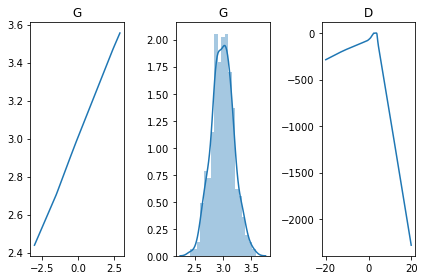

[Epoch 38204/50000] [D loss: -0.094105] [G loss: 0.317655]
[Epoch 38208/50000] [D loss: -0.034830] [G loss: 0.315999]
[Epoch 38212/50000] [D loss: -0.082462] [G loss: 0.408012]
[Epoch 38216/50000] [D loss: -0.100048] [G loss: 0.534635]
[Epoch 38220/50000] [D loss: -0.097011] [G loss: 0.462522]
[Epoch 38224/50000] [D loss: -0.111979] [G loss: 0.356746]
[Epoch 38228/50000] [D loss: -0.060267] [G loss: 0.237061]
[Epoch 38232/50000] [D loss: -0.041321] [G loss: 0.203389]
[Epoch 38236/50000] [D loss: -0.065736] [G loss: 0.252900]
[Epoch 38240/50000] [D loss: -0.069998] [G loss: 0.270452]
[Epoch 38244/50000] [D loss: -0.077046] [G loss: 0.251066]
[Epoch 38248/50000] [D loss: -0.079657] [G loss: 0.186616]
[Epoch 38252/50000] [D loss: -0.123897] [G loss: 0.137257]
[Epoch 38256/50000] [D loss: -0.077040] [G loss: 0.204413]
[Epoch 38260/50000] [D loss: -0.074540] [G loss: 0.220765]
[Epoch 38264/50000] [D loss: -0.103851] [G loss: 0.276115]
[Epoch 38268/50000] [D loss: -0.085340] [G loss: 0.30976

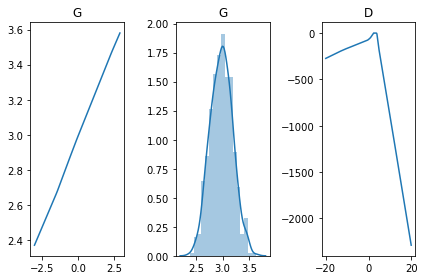

[Epoch 38304/50000] [D loss: -0.086293] [G loss: -0.391715]
[Epoch 38308/50000] [D loss: -0.077126] [G loss: -0.299433]
[Epoch 38312/50000] [D loss: -0.064889] [G loss: -0.291247]
[Epoch 38316/50000] [D loss: -0.081798] [G loss: -0.293666]
[Epoch 38320/50000] [D loss: -0.116719] [G loss: -0.204819]
[Epoch 38324/50000] [D loss: -0.056782] [G loss: -0.084035]
[Epoch 38328/50000] [D loss: -0.096750] [G loss: -0.021948]
[Epoch 38332/50000] [D loss: -0.093786] [G loss: -0.160247]
[Epoch 38336/50000] [D loss: -0.063082] [G loss: -0.114168]
[Epoch 38340/50000] [D loss: -0.072601] [G loss: -0.118527]
[Epoch 38344/50000] [D loss: -0.068570] [G loss: -0.232952]
[Epoch 38348/50000] [D loss: -0.095088] [G loss: -0.292739]
[Epoch 38352/50000] [D loss: -0.062469] [G loss: -0.298737]
[Epoch 38356/50000] [D loss: -0.070347] [G loss: -0.252819]
[Epoch 38360/50000] [D loss: -0.064605] [G loss: -0.256999]
[Epoch 38364/50000] [D loss: -0.080876] [G loss: -0.286779]
[Epoch 38368/50000] [D loss: -0.069324] 

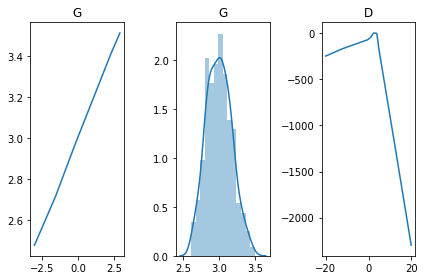

[Epoch 38404/50000] [D loss: -0.031962] [G loss: -0.192322]
[Epoch 38408/50000] [D loss: -0.076269] [G loss: -0.237408]
[Epoch 38412/50000] [D loss: -0.097900] [G loss: -0.221768]
[Epoch 38416/50000] [D loss: -0.052128] [G loss: -0.320879]
[Epoch 38420/50000] [D loss: -0.082009] [G loss: -0.233484]
[Epoch 38424/50000] [D loss: -0.077950] [G loss: -0.309719]
[Epoch 38428/50000] [D loss: -0.065710] [G loss: -0.201089]
[Epoch 38432/50000] [D loss: -0.085919] [G loss: -0.267719]
[Epoch 38436/50000] [D loss: -0.079702] [G loss: -0.241422]
[Epoch 38440/50000] [D loss: -0.034883] [G loss: -0.248758]
[Epoch 38444/50000] [D loss: -0.051714] [G loss: -0.216909]
[Epoch 38448/50000] [D loss: -0.086227] [G loss: -0.195903]
[Epoch 38452/50000] [D loss: -0.080196] [G loss: -0.144789]
[Epoch 38456/50000] [D loss: -0.069355] [G loss: -0.137053]
[Epoch 38460/50000] [D loss: -0.079790] [G loss: -0.175392]
[Epoch 38464/50000] [D loss: -0.078921] [G loss: -0.186547]
[Epoch 38468/50000] [D loss: -0.108590] 

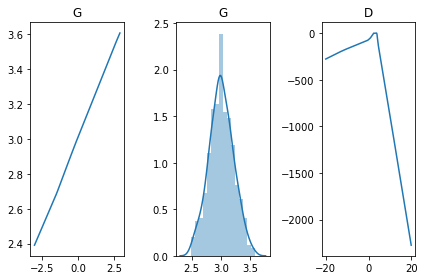

[Epoch 38504/50000] [D loss: -0.063613] [G loss: -0.368408]
[Epoch 38508/50000] [D loss: -0.049020] [G loss: -0.298446]
[Epoch 38512/50000] [D loss: -0.058840] [G loss: -0.328624]
[Epoch 38516/50000] [D loss: -0.057580] [G loss: -0.359190]
[Epoch 38520/50000] [D loss: -0.066313] [G loss: -0.350550]
[Epoch 38524/50000] [D loss: -0.047961] [G loss: -0.397604]
[Epoch 38528/50000] [D loss: -0.061718] [G loss: -0.393130]
[Epoch 38532/50000] [D loss: -0.068511] [G loss: -0.377412]
[Epoch 38536/50000] [D loss: -0.066890] [G loss: -0.293043]
[Epoch 38540/50000] [D loss: -0.113359] [G loss: -0.201902]
[Epoch 38544/50000] [D loss: -0.081817] [G loss: -0.258200]
[Epoch 38548/50000] [D loss: -0.110679] [G loss: -0.221072]
[Epoch 38552/50000] [D loss: -0.109234] [G loss: -0.120600]
[Epoch 38556/50000] [D loss: -0.140441] [G loss: -0.134207]
[Epoch 38560/50000] [D loss: -0.121586] [G loss: -0.137978]
[Epoch 38564/50000] [D loss: -0.120506] [G loss: -0.116378]
[Epoch 38568/50000] [D loss: -0.109465] 

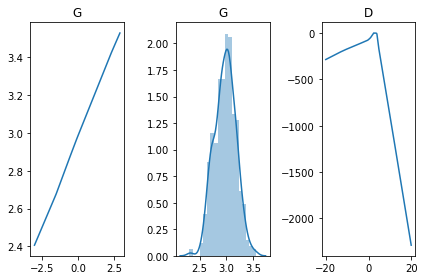

[Epoch 38604/50000] [D loss: -0.097937] [G loss: -0.226108]
[Epoch 38608/50000] [D loss: -0.109361] [G loss: -0.180673]
[Epoch 38612/50000] [D loss: -0.103234] [G loss: 0.086633]
[Epoch 38616/50000] [D loss: -0.133625] [G loss: -0.009204]
[Epoch 38620/50000] [D loss: -0.089590] [G loss: -0.009367]
[Epoch 38624/50000] [D loss: -0.110466] [G loss: 0.017708]
[Epoch 38628/50000] [D loss: -0.059453] [G loss: -0.008462]
[Epoch 38632/50000] [D loss: -0.090915] [G loss: 0.004637]
[Epoch 38636/50000] [D loss: -0.107433] [G loss: 0.123510]
[Epoch 38640/50000] [D loss: -0.057836] [G loss: 0.114993]
[Epoch 38644/50000] [D loss: -0.059334] [G loss: 0.041521]
[Epoch 38648/50000] [D loss: -0.043520] [G loss: 0.333797]
[Epoch 38652/50000] [D loss: -0.054276] [G loss: 0.273891]
[Epoch 38656/50000] [D loss: -0.065405] [G loss: 0.285892]
[Epoch 38660/50000] [D loss: -0.074918] [G loss: 0.331991]
[Epoch 38664/50000] [D loss: -0.063939] [G loss: 0.372517]
[Epoch 38668/50000] [D loss: -0.071643] [G loss: 0.

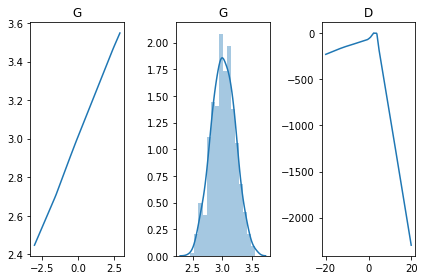

[Epoch 38704/50000] [D loss: -0.104349] [G loss: 0.260998]
[Epoch 38708/50000] [D loss: -0.080888] [G loss: 0.205044]
[Epoch 38712/50000] [D loss: -0.064289] [G loss: 0.250035]
[Epoch 38716/50000] [D loss: -0.068088] [G loss: 0.265417]
[Epoch 38720/50000] [D loss: -0.080193] [G loss: 0.242427]
[Epoch 38724/50000] [D loss: -0.074887] [G loss: 0.226061]
[Epoch 38728/50000] [D loss: -0.050523] [G loss: 0.240417]
[Epoch 38732/50000] [D loss: -0.100557] [G loss: 0.301497]
[Epoch 38736/50000] [D loss: -0.064743] [G loss: 0.220825]
[Epoch 38740/50000] [D loss: -0.041480] [G loss: 0.227286]
[Epoch 38744/50000] [D loss: -0.056842] [G loss: 0.263403]
[Epoch 38748/50000] [D loss: -0.065445] [G loss: 0.245313]
[Epoch 38752/50000] [D loss: -0.065884] [G loss: 0.225817]
[Epoch 38756/50000] [D loss: -0.059675] [G loss: 0.221609]
[Epoch 38760/50000] [D loss: -0.058204] [G loss: 0.203758]
[Epoch 38764/50000] [D loss: -0.072191] [G loss: 0.192838]
[Epoch 38768/50000] [D loss: -0.045400] [G loss: 0.13907

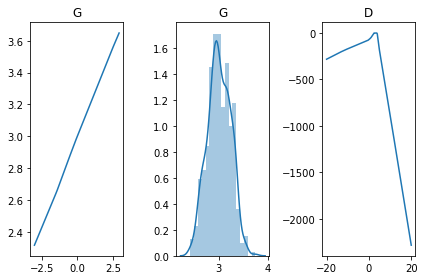

[Epoch 38804/50000] [D loss: -0.065377] [G loss: 0.257943]
[Epoch 38808/50000] [D loss: -0.076061] [G loss: 0.265870]
[Epoch 38812/50000] [D loss: -0.072807] [G loss: 0.183836]
[Epoch 38816/50000] [D loss: -0.065667] [G loss: 0.136193]
[Epoch 38820/50000] [D loss: -0.082309] [G loss: 0.161253]
[Epoch 38824/50000] [D loss: -0.082129] [G loss: 0.295143]
[Epoch 38828/50000] [D loss: -0.098989] [G loss: 0.288823]
[Epoch 38832/50000] [D loss: -0.062772] [G loss: 0.313736]
[Epoch 38836/50000] [D loss: -0.068147] [G loss: 0.287388]
[Epoch 38840/50000] [D loss: -0.053450] [G loss: 0.300649]
[Epoch 38844/50000] [D loss: -0.062428] [G loss: 0.322724]
[Epoch 38848/50000] [D loss: -0.079115] [G loss: 0.286357]
[Epoch 38852/50000] [D loss: -0.080832] [G loss: 0.237067]
[Epoch 38856/50000] [D loss: -0.062486] [G loss: 0.301415]
[Epoch 38860/50000] [D loss: -0.071401] [G loss: 0.321962]
[Epoch 38864/50000] [D loss: -0.063607] [G loss: 0.330515]
[Epoch 38868/50000] [D loss: -0.062171] [G loss: 0.34763

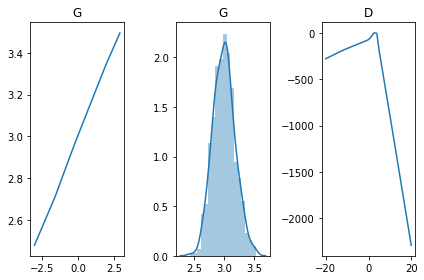

[Epoch 38904/50000] [D loss: -0.057152] [G loss: 0.323641]
[Epoch 38908/50000] [D loss: -0.063051] [G loss: 0.448755]
[Epoch 38912/50000] [D loss: -0.075862] [G loss: 0.489899]
[Epoch 38916/50000] [D loss: -0.087697] [G loss: 0.503563]
[Epoch 38920/50000] [D loss: -0.095878] [G loss: 0.579082]
[Epoch 38924/50000] [D loss: -0.094025] [G loss: -0.444726]
[Epoch 38928/50000] [D loss: -0.080077] [G loss: -0.384245]
[Epoch 38932/50000] [D loss: -0.082180] [G loss: -0.311227]
[Epoch 38936/50000] [D loss: -0.076724] [G loss: -0.319078]
[Epoch 38940/50000] [D loss: -0.073824] [G loss: -0.264319]
[Epoch 38944/50000] [D loss: -0.073787] [G loss: -0.209439]
[Epoch 38948/50000] [D loss: -0.069428] [G loss: -0.155156]
[Epoch 38952/50000] [D loss: -0.075808] [G loss: -0.073654]
[Epoch 38956/50000] [D loss: -0.106564] [G loss: -0.730527]
[Epoch 38960/50000] [D loss: -0.046901] [G loss: -0.421218]
[Epoch 38964/50000] [D loss: -0.047155] [G loss: -0.369518]
[Epoch 38968/50000] [D loss: -0.100280] [G lo

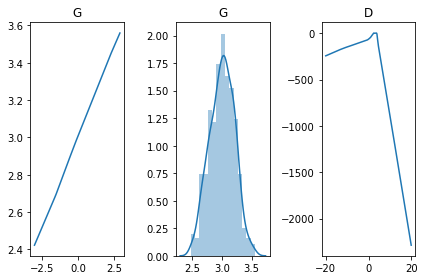

[Epoch 39004/50000] [D loss: -0.049604] [G loss: -0.359548]
[Epoch 39008/50000] [D loss: -0.060316] [G loss: -0.373985]
[Epoch 39012/50000] [D loss: -0.026859] [G loss: -0.342099]
[Epoch 39016/50000] [D loss: -0.017737] [G loss: -0.345352]
[Epoch 39020/50000] [D loss: -0.043667] [G loss: -0.289364]
[Epoch 39024/50000] [D loss: -0.038453] [G loss: -0.321485]
[Epoch 39028/50000] [D loss: -0.006438] [G loss: -0.411817]
[Epoch 39032/50000] [D loss: -0.010954] [G loss: -0.486745]
[Epoch 39036/50000] [D loss: 0.008622] [G loss: -0.517780]
[Epoch 39040/50000] [D loss: -0.016708] [G loss: -0.495201]
[Epoch 39044/50000] [D loss: 0.002339] [G loss: -0.491385]
[Epoch 39048/50000] [D loss: -0.004189] [G loss: -0.512674]
[Epoch 39052/50000] [D loss: 0.001151] [G loss: -0.471872]
[Epoch 39056/50000] [D loss: -0.022100] [G loss: -0.466353]
[Epoch 39060/50000] [D loss: -0.018125] [G loss: -0.494657]
[Epoch 39064/50000] [D loss: -0.006340] [G loss: -0.444083]
[Epoch 39068/50000] [D loss: -0.029581] [G 

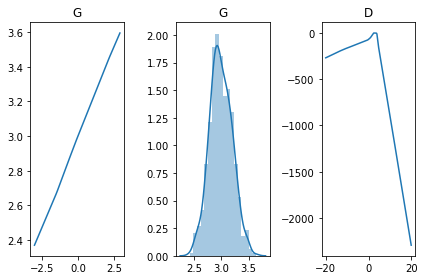

[Epoch 39104/50000] [D loss: -0.095710] [G loss: -0.155118]
[Epoch 39108/50000] [D loss: -0.075730] [G loss: -0.306153]
[Epoch 39112/50000] [D loss: -0.075830] [G loss: -0.374226]
[Epoch 39116/50000] [D loss: -0.073694] [G loss: -0.324338]
[Epoch 39120/50000] [D loss: -0.091821] [G loss: -0.390165]
[Epoch 39124/50000] [D loss: -0.070579] [G loss: -0.327830]
[Epoch 39128/50000] [D loss: -0.034785] [G loss: -0.293018]
[Epoch 39132/50000] [D loss: -0.091042] [G loss: -0.269313]
[Epoch 39136/50000] [D loss: -0.071146] [G loss: -0.266377]
[Epoch 39140/50000] [D loss: -0.061177] [G loss: -0.223737]
[Epoch 39144/50000] [D loss: -0.057813] [G loss: -0.214466]
[Epoch 39148/50000] [D loss: -0.052536] [G loss: -0.249557]
[Epoch 39152/50000] [D loss: -0.042788] [G loss: -0.235304]
[Epoch 39156/50000] [D loss: -0.060003] [G loss: -0.170222]
[Epoch 39160/50000] [D loss: -0.054849] [G loss: -0.167531]
[Epoch 39164/50000] [D loss: -0.043512] [G loss: -0.132233]
[Epoch 39168/50000] [D loss: -0.043920] 

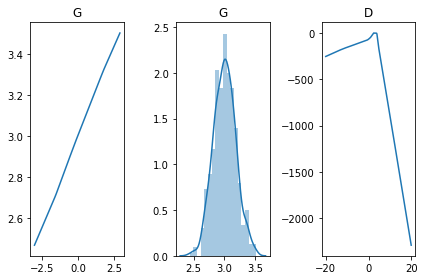

[Epoch 39204/50000] [D loss: -0.060696] [G loss: -0.139245]
[Epoch 39208/50000] [D loss: -0.065205] [G loss: -0.121616]
[Epoch 39212/50000] [D loss: -0.047532] [G loss: -0.034977]
[Epoch 39216/50000] [D loss: -0.031983] [G loss: -0.284765]
[Epoch 39220/50000] [D loss: -0.059847] [G loss: -0.115927]
[Epoch 39224/50000] [D loss: -0.063700] [G loss: -0.059225]
[Epoch 39228/50000] [D loss: -0.024655] [G loss: -0.602513]
[Epoch 39232/50000] [D loss: -0.022621] [G loss: -0.501828]
[Epoch 39236/50000] [D loss: -0.019107] [G loss: -0.455270]
[Epoch 39240/50000] [D loss: -0.018962] [G loss: -0.418946]
[Epoch 39244/50000] [D loss: -0.037863] [G loss: -0.371433]
[Epoch 39248/50000] [D loss: -0.011078] [G loss: -0.374467]
[Epoch 39252/50000] [D loss: -0.033810] [G loss: -0.312594]
[Epoch 39256/50000] [D loss: -0.038035] [G loss: -0.342914]
[Epoch 39260/50000] [D loss: -0.041120] [G loss: -0.363008]
[Epoch 39264/50000] [D loss: -0.031772] [G loss: -0.351302]
[Epoch 39268/50000] [D loss: -0.035315] 

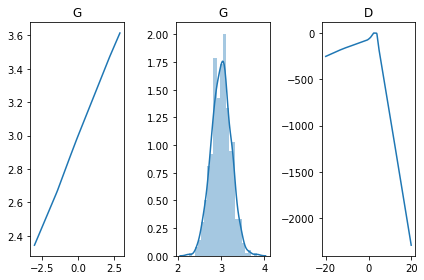

[Epoch 39304/50000] [D loss: -0.018145] [G loss: -0.560669]
[Epoch 39308/50000] [D loss: -0.002725] [G loss: -0.630274]
[Epoch 39312/50000] [D loss: -0.049663] [G loss: 0.208325]
[Epoch 39316/50000] [D loss: -0.043966] [G loss: 0.221483]
[Epoch 39320/50000] [D loss: -0.064186] [G loss: 0.144757]
[Epoch 39324/50000] [D loss: -0.105191] [G loss: 0.250896]
[Epoch 39328/50000] [D loss: -0.071527] [G loss: 0.215093]
[Epoch 39332/50000] [D loss: -0.080853] [G loss: 0.249918]
[Epoch 39336/50000] [D loss: -0.082050] [G loss: 0.335212]
[Epoch 39340/50000] [D loss: -0.067343] [G loss: 0.245743]
[Epoch 39344/50000] [D loss: -0.072664] [G loss: 0.264835]
[Epoch 39348/50000] [D loss: -0.082750] [G loss: 0.224850]
[Epoch 39352/50000] [D loss: -0.073360] [G loss: 0.250662]
[Epoch 39356/50000] [D loss: -0.099891] [G loss: 0.237804]
[Epoch 39360/50000] [D loss: -0.071932] [G loss: 0.233905]
[Epoch 39364/50000] [D loss: -0.053956] [G loss: 0.277663]
[Epoch 39368/50000] [D loss: -0.055770] [G loss: 0.309

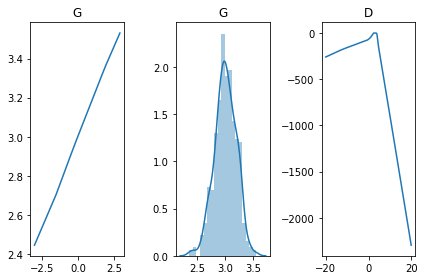

[Epoch 39404/50000] [D loss: -0.086940] [G loss: 0.465985]
[Epoch 39408/50000] [D loss: -0.071174] [G loss: 0.438351]
[Epoch 39412/50000] [D loss: -0.079521] [G loss: 0.478627]
[Epoch 39416/50000] [D loss: -0.090422] [G loss: 0.445670]
[Epoch 39420/50000] [D loss: -0.082274] [G loss: 0.398970]
[Epoch 39424/50000] [D loss: -0.069219] [G loss: 0.370927]
[Epoch 39428/50000] [D loss: -0.074644] [G loss: 0.405692]
[Epoch 39432/50000] [D loss: -0.066731] [G loss: 0.423597]
[Epoch 39436/50000] [D loss: -0.085477] [G loss: 0.459973]
[Epoch 39440/50000] [D loss: -0.096935] [G loss: 0.513850]
[Epoch 39444/50000] [D loss: -0.098382] [G loss: 0.305313]
[Epoch 39448/50000] [D loss: -0.049866] [G loss: 0.065256]
[Epoch 39452/50000] [D loss: -0.061627] [G loss: 0.123799]
[Epoch 39456/50000] [D loss: -0.065333] [G loss: 0.203125]
[Epoch 39460/50000] [D loss: -0.069019] [G loss: 0.248379]
[Epoch 39464/50000] [D loss: -0.069396] [G loss: 0.260209]
[Epoch 39468/50000] [D loss: -0.082893] [G loss: 0.28785

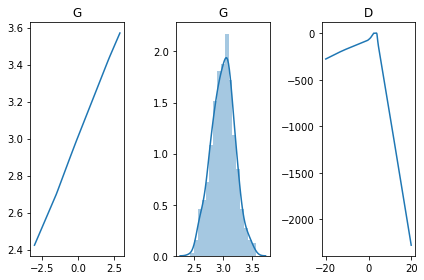

[Epoch 39504/50000] [D loss: -0.076230] [G loss: 0.312749]
[Epoch 39508/50000] [D loss: -0.054728] [G loss: 0.278657]
[Epoch 39512/50000] [D loss: -0.027535] [G loss: 0.287097]
[Epoch 39516/50000] [D loss: -0.055623] [G loss: 0.308691]
[Epoch 39520/50000] [D loss: -0.067906] [G loss: 0.332379]
[Epoch 39524/50000] [D loss: -0.058515] [G loss: 0.342858]
[Epoch 39528/50000] [D loss: -0.056265] [G loss: 0.353893]
[Epoch 39532/50000] [D loss: -0.067060] [G loss: 0.290343]
[Epoch 39536/50000] [D loss: -0.065407] [G loss: 0.291107]
[Epoch 39540/50000] [D loss: -0.067866] [G loss: 0.296555]
[Epoch 39544/50000] [D loss: -0.088584] [G loss: 0.255330]
[Epoch 39548/50000] [D loss: -0.109916] [G loss: 0.166163]
[Epoch 39552/50000] [D loss: -0.085997] [G loss: 0.165845]
[Epoch 39556/50000] [D loss: -0.104252] [G loss: 0.165491]
[Epoch 39560/50000] [D loss: -0.085596] [G loss: 0.102115]
[Epoch 39564/50000] [D loss: -0.071664] [G loss: -0.039404]
[Epoch 39568/50000] [D loss: -0.079293] [G loss: 0.2864

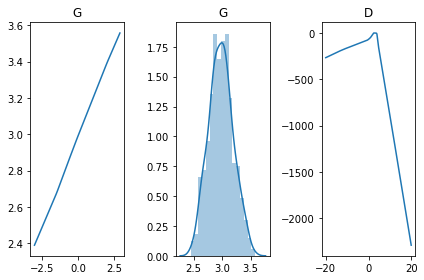

[Epoch 39604/50000] [D loss: -0.054011] [G loss: 0.176334]
[Epoch 39608/50000] [D loss: -0.059989] [G loss: 0.218553]
[Epoch 39612/50000] [D loss: -0.098490] [G loss: 0.410953]
[Epoch 39616/50000] [D loss: -0.055203] [G loss: 0.178492]
[Epoch 39620/50000] [D loss: -0.062751] [G loss: 0.346708]
[Epoch 39624/50000] [D loss: -0.077905] [G loss: 0.280337]
[Epoch 39628/50000] [D loss: -0.086997] [G loss: 0.194864]
[Epoch 39632/50000] [D loss: -0.127286] [G loss: 0.133084]
[Epoch 39636/50000] [D loss: -0.126737] [G loss: 0.044855]
[Epoch 39640/50000] [D loss: -0.103280] [G loss: 0.128466]
[Epoch 39644/50000] [D loss: -0.112734] [G loss: 0.037943]
[Epoch 39648/50000] [D loss: -0.073055] [G loss: 0.106097]
[Epoch 39652/50000] [D loss: -0.076140] [G loss: 0.175898]
[Epoch 39656/50000] [D loss: -0.095433] [G loss: 0.254619]
[Epoch 39660/50000] [D loss: -0.069561] [G loss: 0.256666]
[Epoch 39664/50000] [D loss: -0.083789] [G loss: 0.287086]
[Epoch 39668/50000] [D loss: -0.071435] [G loss: 0.29907

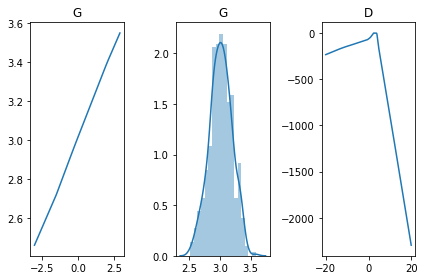

[Epoch 39704/50000] [D loss: -0.089611] [G loss: 0.222860]
[Epoch 39708/50000] [D loss: -0.071070] [G loss: 0.181363]
[Epoch 39712/50000] [D loss: -0.081626] [G loss: 0.247735]
[Epoch 39716/50000] [D loss: -0.086669] [G loss: 0.240349]
[Epoch 39720/50000] [D loss: -0.074969] [G loss: 0.239430]
[Epoch 39724/50000] [D loss: -0.082065] [G loss: 0.245341]
[Epoch 39728/50000] [D loss: -0.070701] [G loss: 0.231257]
[Epoch 39732/50000] [D loss: -0.078788] [G loss: 0.160852]
[Epoch 39736/50000] [D loss: -0.059534] [G loss: 0.231214]
[Epoch 39740/50000] [D loss: -0.058739] [G loss: 0.220023]
[Epoch 39744/50000] [D loss: -0.025040] [G loss: 0.166841]
[Epoch 39748/50000] [D loss: -0.054466] [G loss: 0.230828]
[Epoch 39752/50000] [D loss: -0.092532] [G loss: 0.282698]
[Epoch 39756/50000] [D loss: -0.091258] [G loss: 0.272211]
[Epoch 39760/50000] [D loss: -0.075572] [G loss: 0.273281]
[Epoch 39764/50000] [D loss: -0.091256] [G loss: 0.290601]
[Epoch 39768/50000] [D loss: -0.048087] [G loss: 0.24795

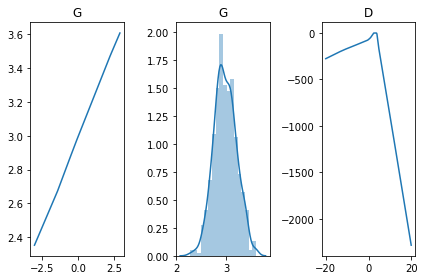

[Epoch 39804/50000] [D loss: -0.120802] [G loss: 0.319550]
[Epoch 39808/50000] [D loss: -0.085095] [G loss: 0.213446]
[Epoch 39812/50000] [D loss: -0.066831] [G loss: 0.231157]
[Epoch 39816/50000] [D loss: -0.067224] [G loss: 0.254419]
[Epoch 39820/50000] [D loss: -0.064920] [G loss: 0.240386]
[Epoch 39824/50000] [D loss: -0.080562] [G loss: 0.248689]
[Epoch 39828/50000] [D loss: -0.071261] [G loss: 0.271353]
[Epoch 39832/50000] [D loss: -0.073725] [G loss: 0.258991]
[Epoch 39836/50000] [D loss: -0.072266] [G loss: 0.274964]
[Epoch 39840/50000] [D loss: -0.059220] [G loss: 0.251150]
[Epoch 39844/50000] [D loss: -0.069708] [G loss: 0.287000]
[Epoch 39848/50000] [D loss: -0.047016] [G loss: 0.287156]
[Epoch 39852/50000] [D loss: -0.044366] [G loss: 0.296186]
[Epoch 39856/50000] [D loss: -0.083409] [G loss: 0.283247]
[Epoch 39860/50000] [D loss: -0.052025] [G loss: 0.281394]
[Epoch 39864/50000] [D loss: -0.055622] [G loss: 0.341518]
[Epoch 39868/50000] [D loss: -0.079752] [G loss: 0.39437

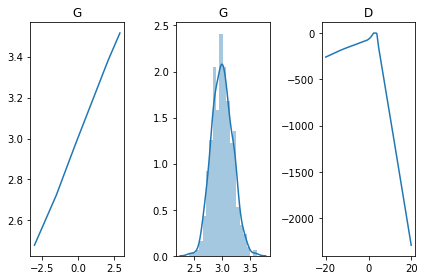

[Epoch 39904/50000] [D loss: -0.056442] [G loss: 0.304405]
[Epoch 39908/50000] [D loss: -0.073398] [G loss: 0.389904]
[Epoch 39912/50000] [D loss: -0.076279] [G loss: 0.451797]
[Epoch 39916/50000] [D loss: -0.081674] [G loss: 0.449588]
[Epoch 39920/50000] [D loss: -0.087169] [G loss: 0.478051]
[Epoch 39924/50000] [D loss: -0.095496] [G loss: 0.491170]
[Epoch 39928/50000] [D loss: -0.089023] [G loss: 0.487559]
[Epoch 39932/50000] [D loss: -0.097354] [G loss: 0.509883]
[Epoch 39936/50000] [D loss: -0.099947] [G loss: 0.533174]
[Epoch 39940/50000] [D loss: -0.109792] [G loss: -1.114522]
[Epoch 39944/50000] [D loss: -0.097872] [G loss: 0.557660]
[Epoch 39948/50000] [D loss: -0.027037] [G loss: 0.274414]
[Epoch 39952/50000] [D loss: -0.086851] [G loss: -0.969332]
[Epoch 39956/50000] [D loss: -0.107940] [G loss: -0.585238]
[Epoch 39960/50000] [D loss: -0.038743] [G loss: 0.152679]
[Epoch 39964/50000] [D loss: -0.079909] [G loss: 0.107886]
[Epoch 39968/50000] [D loss: -0.061239] [G loss: 0.13

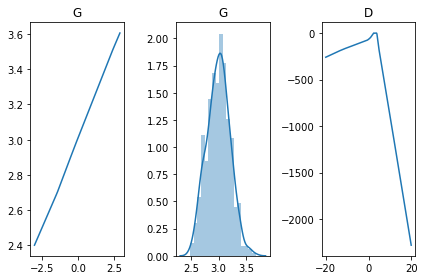

[Epoch 40004/50000] [D loss: -0.025360] [G loss: 0.125111]
[Epoch 40008/50000] [D loss: -0.035208] [G loss: 0.104720]
[Epoch 40012/50000] [D loss: -0.045323] [G loss: 0.102972]
[Epoch 40016/50000] [D loss: -0.049214] [G loss: 0.123196]
[Epoch 40020/50000] [D loss: -0.040229] [G loss: 0.184872]
[Epoch 40024/50000] [D loss: -0.040881] [G loss: 0.264891]
[Epoch 40028/50000] [D loss: -0.043306] [G loss: 0.249966]
[Epoch 40032/50000] [D loss: -0.025176] [G loss: 0.339743]
[Epoch 40036/50000] [D loss: -0.048538] [G loss: 0.341899]
[Epoch 40040/50000] [D loss: -0.036697] [G loss: 0.327845]
[Epoch 40044/50000] [D loss: -0.025779] [G loss: 0.307944]
[Epoch 40048/50000] [D loss: -0.046869] [G loss: 0.280124]
[Epoch 40052/50000] [D loss: -0.039338] [G loss: 0.347715]
[Epoch 40056/50000] [D loss: -0.017751] [G loss: 0.311001]
[Epoch 40060/50000] [D loss: -0.033273] [G loss: 0.249130]
[Epoch 40064/50000] [D loss: -0.046802] [G loss: 0.256860]
[Epoch 40068/50000] [D loss: -0.053002] [G loss: 0.12354

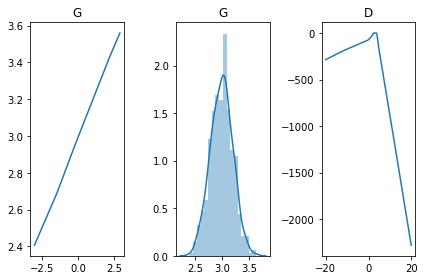

[Epoch 40104/50000] [D loss: -0.094473] [G loss: 0.266162]
[Epoch 40108/50000] [D loss: -0.072274] [G loss: 0.227539]
[Epoch 40112/50000] [D loss: -0.062771] [G loss: 0.237650]
[Epoch 40116/50000] [D loss: -0.055631] [G loss: 0.258465]
[Epoch 40120/50000] [D loss: -0.069344] [G loss: 0.239706]
[Epoch 40124/50000] [D loss: -0.104234] [G loss: 0.291406]
[Epoch 40128/50000] [D loss: -0.092186] [G loss: 0.268198]
[Epoch 40132/50000] [D loss: -0.084203] [G loss: 0.279482]
[Epoch 40136/50000] [D loss: -0.054835] [G loss: 0.320625]
[Epoch 40140/50000] [D loss: -0.060963] [G loss: 0.271347]
[Epoch 40144/50000] [D loss: -0.076884] [G loss: 0.291993]
[Epoch 40148/50000] [D loss: -0.061411] [G loss: 0.301486]
[Epoch 40152/50000] [D loss: -0.065255] [G loss: 0.318892]
[Epoch 40156/50000] [D loss: -0.074830] [G loss: 0.393896]
[Epoch 40160/50000] [D loss: -0.083876] [G loss: 0.397014]
[Epoch 40164/50000] [D loss: -0.084893] [G loss: 0.415556]
[Epoch 40168/50000] [D loss: -0.093935] [G loss: 0.44086

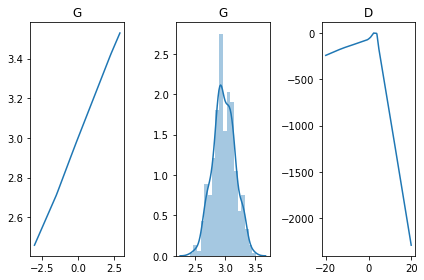

[Epoch 40204/50000] [D loss: -0.068366] [G loss: 0.301412]
[Epoch 40208/50000] [D loss: -0.097402] [G loss: 0.290704]
[Epoch 40212/50000] [D loss: -0.072891] [G loss: 0.251304]
[Epoch 40216/50000] [D loss: -0.056583] [G loss: 0.269516]
[Epoch 40220/50000] [D loss: -0.062303] [G loss: 0.230740]
[Epoch 40224/50000] [D loss: -0.065687] [G loss: 0.223416]
[Epoch 40228/50000] [D loss: -0.075530] [G loss: 0.217858]
[Epoch 40232/50000] [D loss: -0.079784] [G loss: 0.262541]
[Epoch 40236/50000] [D loss: -0.076563] [G loss: 0.264414]
[Epoch 40240/50000] [D loss: -0.071223] [G loss: 0.338342]
[Epoch 40244/50000] [D loss: -0.082023] [G loss: 0.348412]
[Epoch 40248/50000] [D loss: -0.089039] [G loss: 0.375426]
[Epoch 40252/50000] [D loss: -0.109663] [G loss: 0.392762]
[Epoch 40256/50000] [D loss: -0.102534] [G loss: 0.302772]
[Epoch 40260/50000] [D loss: -0.062002] [G loss: 0.205525]
[Epoch 40264/50000] [D loss: -0.100746] [G loss: 0.298161]
[Epoch 40268/50000] [D loss: -0.070216] [G loss: 0.27969

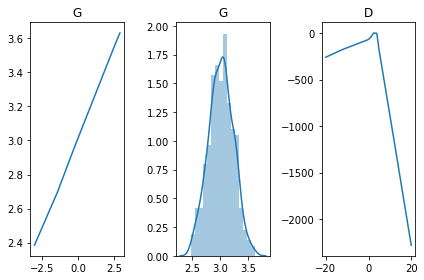

[Epoch 40304/50000] [D loss: -0.083825] [G loss: 0.294906]
[Epoch 40308/50000] [D loss: -0.058153] [G loss: 0.260906]
[Epoch 40312/50000] [D loss: -0.064193] [G loss: 0.255939]
[Epoch 40316/50000] [D loss: -0.072071] [G loss: 0.220458]
[Epoch 40320/50000] [D loss: -0.074769] [G loss: 0.251873]
[Epoch 40324/50000] [D loss: -0.045952] [G loss: 0.236143]
[Epoch 40328/50000] [D loss: -0.074420] [G loss: 0.285147]
[Epoch 40332/50000] [D loss: -0.054354] [G loss: 0.271550]
[Epoch 40336/50000] [D loss: -0.087401] [G loss: 0.330892]
[Epoch 40340/50000] [D loss: -0.077793] [G loss: 0.321425]
[Epoch 40344/50000] [D loss: -0.084850] [G loss: 0.301170]
[Epoch 40348/50000] [D loss: -0.097769] [G loss: 0.311198]
[Epoch 40352/50000] [D loss: -0.070935] [G loss: 0.316871]
[Epoch 40356/50000] [D loss: -0.092124] [G loss: 0.275876]
[Epoch 40360/50000] [D loss: -0.080443] [G loss: 0.282466]
[Epoch 40364/50000] [D loss: -0.067245] [G loss: 0.209997]
[Epoch 40368/50000] [D loss: -0.030661] [G loss: 0.09324

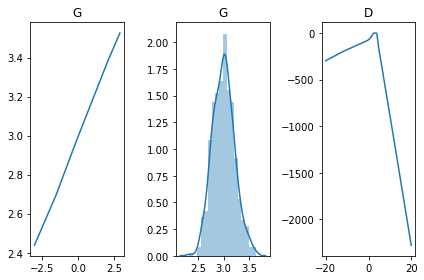

[Epoch 40404/50000] [D loss: -0.075031] [G loss: -0.121522]
[Epoch 40408/50000] [D loss: -0.080398] [G loss: -0.121915]
[Epoch 40412/50000] [D loss: -0.077099] [G loss: 0.051179]
[Epoch 40416/50000] [D loss: -0.068964] [G loss: 0.152334]
[Epoch 40420/50000] [D loss: -0.096283] [G loss: -0.016204]
[Epoch 40424/50000] [D loss: -0.048938] [G loss: -0.223325]
[Epoch 40428/50000] [D loss: -0.057484] [G loss: -0.273694]
[Epoch 40432/50000] [D loss: -0.072411] [G loss: -0.253186]
[Epoch 40436/50000] [D loss: -0.065565] [G loss: -0.260587]
[Epoch 40440/50000] [D loss: -0.075250] [G loss: -0.272156]
[Epoch 40444/50000] [D loss: -0.067329] [G loss: -0.226083]
[Epoch 40448/50000] [D loss: -0.061866] [G loss: -0.150215]
[Epoch 40452/50000] [D loss: -0.057145] [G loss: -0.074086]
[Epoch 40456/50000] [D loss: -0.054286] [G loss: -0.007460]
[Epoch 40460/50000] [D loss: -0.070078] [G loss: -0.185818]
[Epoch 40464/50000] [D loss: -0.063200] [G loss: -0.159181]
[Epoch 40468/50000] [D loss: -0.062661] [G

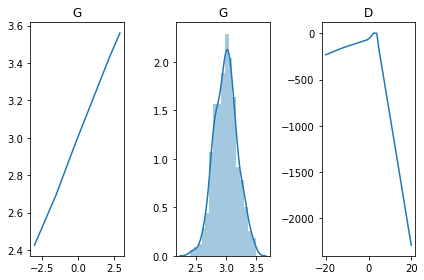

[Epoch 40504/50000] [D loss: -0.083829] [G loss: -0.286321]
[Epoch 40508/50000] [D loss: -0.077014] [G loss: -0.287209]
[Epoch 40512/50000] [D loss: -0.056094] [G loss: -0.301817]
[Epoch 40516/50000] [D loss: -0.051822] [G loss: -0.331296]
[Epoch 40520/50000] [D loss: -0.044892] [G loss: -0.310196]
[Epoch 40524/50000] [D loss: -0.035330] [G loss: -0.298834]
[Epoch 40528/50000] [D loss: -0.060687] [G loss: -0.335869]
[Epoch 40532/50000] [D loss: -0.090840] [G loss: -0.337688]
[Epoch 40536/50000] [D loss: -0.067422] [G loss: -0.362400]
[Epoch 40540/50000] [D loss: -0.070022] [G loss: -0.368372]
[Epoch 40544/50000] [D loss: -0.066667] [G loss: -0.421261]
[Epoch 40548/50000] [D loss: -0.088826] [G loss: -0.471218]
[Epoch 40552/50000] [D loss: -0.086359] [G loss: -0.472587]
[Epoch 40556/50000] [D loss: -0.075574] [G loss: -0.368163]
[Epoch 40560/50000] [D loss: -0.075879] [G loss: -0.344375]
[Epoch 40564/50000] [D loss: -0.102151] [G loss: -0.367914]
[Epoch 40568/50000] [D loss: -0.085472] 

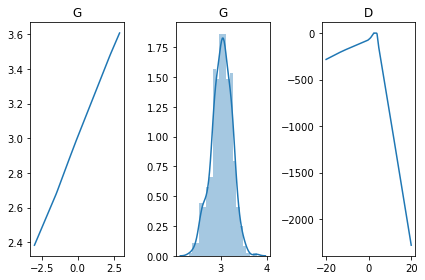

[Epoch 40604/50000] [D loss: -0.080797] [G loss: -0.291149]
[Epoch 40608/50000] [D loss: -0.075141] [G loss: -0.317762]
[Epoch 40612/50000] [D loss: -0.070019] [G loss: -0.341182]
[Epoch 40616/50000] [D loss: -0.078493] [G loss: -0.332791]
[Epoch 40620/50000] [D loss: -0.095713] [G loss: -0.344641]
[Epoch 40624/50000] [D loss: -0.088707] [G loss: -0.319415]
[Epoch 40628/50000] [D loss: -0.081484] [G loss: -0.368917]
[Epoch 40632/50000] [D loss: -0.091581] [G loss: -0.381617]
[Epoch 40636/50000] [D loss: -0.086236] [G loss: -0.400586]
[Epoch 40640/50000] [D loss: -0.090187] [G loss: -0.410808]
[Epoch 40644/50000] [D loss: -0.073489] [G loss: -0.427418]
[Epoch 40648/50000] [D loss: -0.065862] [G loss: -0.399355]
[Epoch 40652/50000] [D loss: -0.079149] [G loss: -0.353721]
[Epoch 40656/50000] [D loss: -0.075939] [G loss: -0.383128]
[Epoch 40660/50000] [D loss: -0.062390] [G loss: -0.412344]
[Epoch 40664/50000] [D loss: -0.067645] [G loss: -0.407091]
[Epoch 40668/50000] [D loss: -0.084187] 

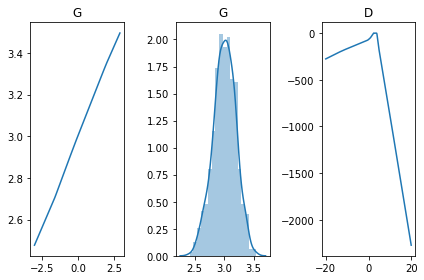

[Epoch 40704/50000] [D loss: -0.065555] [G loss: -0.266789]
[Epoch 40708/50000] [D loss: -0.075810] [G loss: -0.204621]
[Epoch 40712/50000] [D loss: -0.062974] [G loss: -0.151332]
[Epoch 40716/50000] [D loss: -0.083772] [G loss: -0.209627]
[Epoch 40720/50000] [D loss: -0.058703] [G loss: -0.178622]
[Epoch 40724/50000] [D loss: -0.052904] [G loss: -0.170384]
[Epoch 40728/50000] [D loss: -0.060385] [G loss: -0.216799]
[Epoch 40732/50000] [D loss: -0.059702] [G loss: -0.193825]
[Epoch 40736/50000] [D loss: -0.047509] [G loss: -0.172713]
[Epoch 40740/50000] [D loss: -0.077440] [G loss: -0.169940]
[Epoch 40744/50000] [D loss: -0.048036] [G loss: -0.139932]
[Epoch 40748/50000] [D loss: -0.050890] [G loss: -0.076753]
[Epoch 40752/50000] [D loss: -0.080386] [G loss: 0.717196]
[Epoch 40756/50000] [D loss: -0.072443] [G loss: 0.582996]
[Epoch 40760/50000] [D loss: -0.054074] [G loss: 0.598135]
[Epoch 40764/50000] [D loss: -0.035736] [G loss: 0.557416]
[Epoch 40768/50000] [D loss: -0.038940] [G l

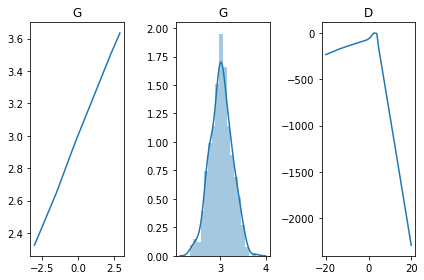

[Epoch 40804/50000] [D loss: -0.071886] [G loss: -0.245263]
[Epoch 40808/50000] [D loss: -0.060726] [G loss: -0.316957]
[Epoch 40812/50000] [D loss: -0.104582] [G loss: -0.330161]
[Epoch 40816/50000] [D loss: -0.081588] [G loss: -0.421019]
[Epoch 40820/50000] [D loss: -0.099213] [G loss: -0.496341]
[Epoch 40824/50000] [D loss: -0.094739] [G loss: -0.463183]
[Epoch 40828/50000] [D loss: -0.061638] [G loss: -0.000848]
[Epoch 40832/50000] [D loss: -0.103580] [G loss: -0.161867]
[Epoch 40836/50000] [D loss: -0.092089] [G loss: 0.225238]
[Epoch 40840/50000] [D loss: -0.071713] [G loss: 0.280876]
[Epoch 40844/50000] [D loss: -0.097946] [G loss: 0.141808]
[Epoch 40848/50000] [D loss: -0.083343] [G loss: 0.193331]
[Epoch 40852/50000] [D loss: -0.108834] [G loss: 0.242963]
[Epoch 40856/50000] [D loss: -0.088667] [G loss: 0.315370]
[Epoch 40860/50000] [D loss: -0.075114] [G loss: 0.295465]
[Epoch 40864/50000] [D loss: -0.080835] [G loss: 0.253173]
[Epoch 40868/50000] [D loss: -0.089561] [G loss:

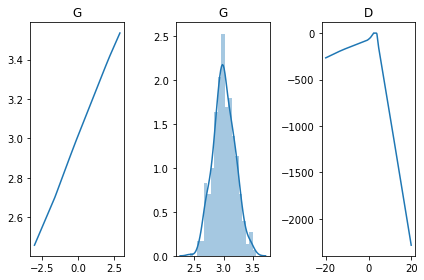

[Epoch 40904/50000] [D loss: -0.086355] [G loss: 0.401847]
[Epoch 40908/50000] [D loss: -0.090505] [G loss: 0.447300]
[Epoch 40912/50000] [D loss: -0.089613] [G loss: 0.500450]
[Epoch 40916/50000] [D loss: -0.089977] [G loss: 0.354592]
[Epoch 40920/50000] [D loss: -0.084092] [G loss: 0.240308]
[Epoch 40924/50000] [D loss: -0.076365] [G loss: 0.240636]
[Epoch 40928/50000] [D loss: -0.083722] [G loss: 0.291928]
[Epoch 40932/50000] [D loss: -0.076294] [G loss: 0.339510]
[Epoch 40936/50000] [D loss: -0.069174] [G loss: 0.320268]
[Epoch 40940/50000] [D loss: -0.088833] [G loss: 0.364922]
[Epoch 40944/50000] [D loss: -0.062447] [G loss: 0.238332]
[Epoch 40948/50000] [D loss: -0.067305] [G loss: 0.255803]
[Epoch 40952/50000] [D loss: -0.084066] [G loss: 0.301466]
[Epoch 40956/50000] [D loss: -0.056196] [G loss: 0.244960]
[Epoch 40960/50000] [D loss: -0.083729] [G loss: 0.319497]
[Epoch 40964/50000] [D loss: -0.057658] [G loss: 0.224563]
[Epoch 40968/50000] [D loss: -0.070247] [G loss: 0.30252

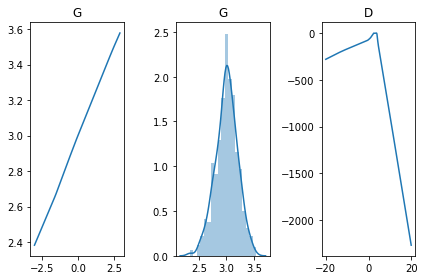

[Epoch 41004/50000] [D loss: -0.055464] [G loss: 0.183419]
[Epoch 41008/50000] [D loss: -0.048750] [G loss: 0.177033]
[Epoch 41012/50000] [D loss: -0.059990] [G loss: 0.178438]
[Epoch 41016/50000] [D loss: -0.073223] [G loss: 0.228545]
[Epoch 41020/50000] [D loss: -0.043925] [G loss: 0.272272]
[Epoch 41024/50000] [D loss: -0.056718] [G loss: 0.304100]
[Epoch 41028/50000] [D loss: -0.067086] [G loss: 0.325397]
[Epoch 41032/50000] [D loss: -0.051366] [G loss: 0.314544]
[Epoch 41036/50000] [D loss: -0.068554] [G loss: 0.281918]
[Epoch 41040/50000] [D loss: -0.056611] [G loss: 0.265121]
[Epoch 41044/50000] [D loss: -0.058544] [G loss: 0.282567]
[Epoch 41048/50000] [D loss: -0.064016] [G loss: 0.245720]
[Epoch 41052/50000] [D loss: -0.089653] [G loss: 0.245969]
[Epoch 41056/50000] [D loss: -0.098313] [G loss: 0.327552]
[Epoch 41060/50000] [D loss: -0.083438] [G loss: 0.292659]
[Epoch 41064/50000] [D loss: -0.048681] [G loss: 0.283009]
[Epoch 41068/50000] [D loss: -0.073077] [G loss: 0.28334

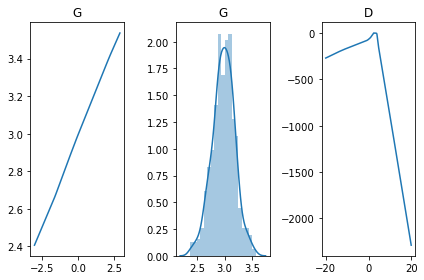

[Epoch 41104/50000] [D loss: -0.055443] [G loss: 0.232771]
[Epoch 41108/50000] [D loss: -0.026039] [G loss: 0.164129]
[Epoch 41112/50000] [D loss: -0.034434] [G loss: 0.235293]
[Epoch 41116/50000] [D loss: -0.047438] [G loss: 0.215850]
[Epoch 41120/50000] [D loss: -0.078611] [G loss: 0.296479]
[Epoch 41124/50000] [D loss: -0.085292] [G loss: 0.273155]
[Epoch 41128/50000] [D loss: -0.065389] [G loss: 0.185643]
[Epoch 41132/50000] [D loss: -0.057030] [G loss: 0.220631]
[Epoch 41136/50000] [D loss: -0.062302] [G loss: 0.174075]
[Epoch 41140/50000] [D loss: -0.057924] [G loss: 0.186557]
[Epoch 41144/50000] [D loss: -0.050194] [G loss: 0.212408]
[Epoch 41148/50000] [D loss: -0.068657] [G loss: 0.316664]
[Epoch 41152/50000] [D loss: -0.085326] [G loss: 0.262800]
[Epoch 41156/50000] [D loss: -0.063580] [G loss: 0.232926]
[Epoch 41160/50000] [D loss: -0.074084] [G loss: 0.282610]
[Epoch 41164/50000] [D loss: -0.061829] [G loss: 0.280220]
[Epoch 41168/50000] [D loss: -0.057818] [G loss: 0.32673

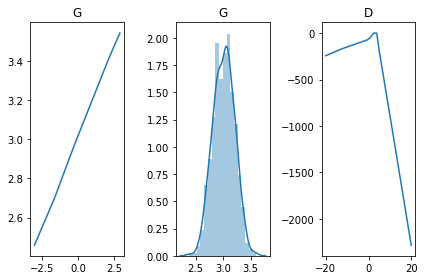

[Epoch 41204/50000] [D loss: -0.081466] [G loss: -0.264172]
[Epoch 41208/50000] [D loss: -0.070440] [G loss: -0.255914]
[Epoch 41212/50000] [D loss: -0.091953] [G loss: -0.283477]
[Epoch 41216/50000] [D loss: -0.091906] [G loss: -0.305966]
[Epoch 41220/50000] [D loss: -0.092520] [G loss: -0.290132]
[Epoch 41224/50000] [D loss: -0.024817] [G loss: -0.314535]
[Epoch 41228/50000] [D loss: -0.052493] [G loss: -0.308892]
[Epoch 41232/50000] [D loss: -0.072867] [G loss: -0.305811]
[Epoch 41236/50000] [D loss: -0.056807] [G loss: -0.266787]
[Epoch 41240/50000] [D loss: -0.053509] [G loss: -0.304433]
[Epoch 41244/50000] [D loss: -0.087465] [G loss: -0.266822]
[Epoch 41248/50000] [D loss: -0.063539] [G loss: -0.252950]
[Epoch 41252/50000] [D loss: -0.058999] [G loss: -0.275952]
[Epoch 41256/50000] [D loss: -0.054928] [G loss: -0.291049]
[Epoch 41260/50000] [D loss: -0.057088] [G loss: -0.274607]
[Epoch 41264/50000] [D loss: -0.065929] [G loss: -0.343694]
[Epoch 41268/50000] [D loss: -0.064514] 

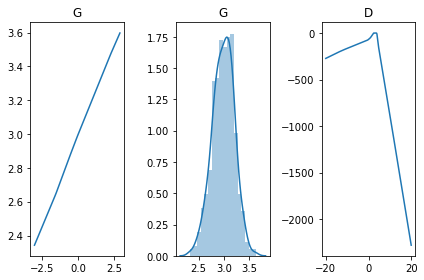

[Epoch 41304/50000] [D loss: -0.066143] [G loss: -0.249418]
[Epoch 41308/50000] [D loss: -0.083195] [G loss: -0.333581]
[Epoch 41312/50000] [D loss: -0.079631] [G loss: -0.271770]
[Epoch 41316/50000] [D loss: -0.095327] [G loss: -0.239874]
[Epoch 41320/50000] [D loss: -0.073034] [G loss: -0.236922]
[Epoch 41324/50000] [D loss: -0.070866] [G loss: -0.296326]
[Epoch 41328/50000] [D loss: -0.080813] [G loss: -0.259795]
[Epoch 41332/50000] [D loss: -0.147099] [G loss: -0.195900]
[Epoch 41336/50000] [D loss: -0.107985] [G loss: -0.278447]
[Epoch 41340/50000] [D loss: -0.081327] [G loss: -0.255099]
[Epoch 41344/50000] [D loss: -0.061777] [G loss: -0.229323]
[Epoch 41348/50000] [D loss: -0.076119] [G loss: -0.266863]
[Epoch 41352/50000] [D loss: -0.079697] [G loss: -0.228564]
[Epoch 41356/50000] [D loss: -0.055971] [G loss: -0.249102]
[Epoch 41360/50000] [D loss: -0.062944] [G loss: -0.275184]
[Epoch 41364/50000] [D loss: -0.046931] [G loss: -0.297446]
[Epoch 41368/50000] [D loss: -0.074195] 

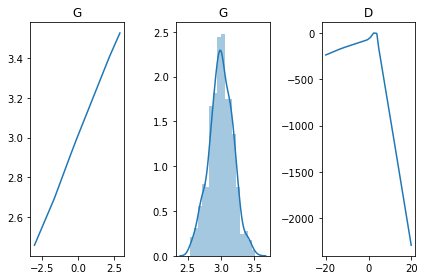

[Epoch 41404/50000] [D loss: -0.087856] [G loss: -0.260342]
[Epoch 41408/50000] [D loss: -0.092683] [G loss: -0.242864]
[Epoch 41412/50000] [D loss: -0.085922] [G loss: -0.186691]
[Epoch 41416/50000] [D loss: -0.071785] [G loss: -0.167470]
[Epoch 41420/50000] [D loss: -0.080530] [G loss: -0.247490]
[Epoch 41424/50000] [D loss: -0.075986] [G loss: -0.295901]
[Epoch 41428/50000] [D loss: -0.055671] [G loss: -0.291216]
[Epoch 41432/50000] [D loss: -0.091928] [G loss: -0.212405]
[Epoch 41436/50000] [D loss: -0.071191] [G loss: -0.301752]
[Epoch 41440/50000] [D loss: -0.078527] [G loss: -0.305137]
[Epoch 41444/50000] [D loss: -0.086747] [G loss: -0.310151]
[Epoch 41448/50000] [D loss: -0.076395] [G loss: -0.278335]
[Epoch 41452/50000] [D loss: -0.084955] [G loss: -0.283892]
[Epoch 41456/50000] [D loss: -0.091522] [G loss: -0.266027]
[Epoch 41460/50000] [D loss: -0.103954] [G loss: -0.259095]
[Epoch 41464/50000] [D loss: -0.096877] [G loss: -0.253303]
[Epoch 41468/50000] [D loss: -0.073577] 

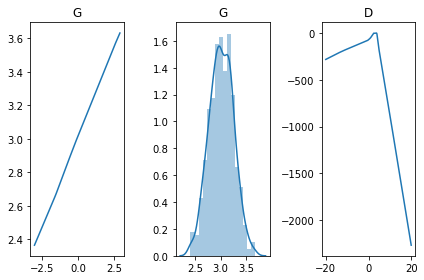

[Epoch 41504/50000] [D loss: -0.053369] [G loss: -0.350864]
[Epoch 41508/50000] [D loss: -0.042978] [G loss: -0.295692]
[Epoch 41512/50000] [D loss: -0.065636] [G loss: -0.309590]
[Epoch 41516/50000] [D loss: -0.057297] [G loss: -0.348175]
[Epoch 41520/50000] [D loss: -0.062923] [G loss: -0.287351]
[Epoch 41524/50000] [D loss: -0.080834] [G loss: -0.235156]
[Epoch 41528/50000] [D loss: -0.100962] [G loss: -0.283738]
[Epoch 41532/50000] [D loss: -0.112162] [G loss: -0.139873]
[Epoch 41536/50000] [D loss: -0.182648] [G loss: 0.086355]
[Epoch 41540/50000] [D loss: -0.120096] [G loss: 0.122678]
[Epoch 41544/50000] [D loss: -0.139354] [G loss: 0.142588]
[Epoch 41548/50000] [D loss: -0.102748] [G loss: 0.102132]
[Epoch 41552/50000] [D loss: -0.128430] [G loss: -0.023500]
[Epoch 41556/50000] [D loss: -0.046466] [G loss: -0.098811]
[Epoch 41560/50000] [D loss: -0.082634] [G loss: -0.286913]
[Epoch 41564/50000] [D loss: -0.035383] [G loss: -0.224108]
[Epoch 41568/50000] [D loss: -0.094759] [G l

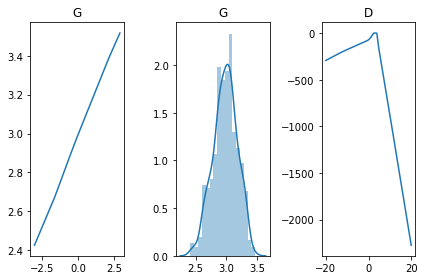

[Epoch 41604/50000] [D loss: -0.088438] [G loss: -0.192709]
[Epoch 41608/50000] [D loss: -0.090097] [G loss: -0.200564]
[Epoch 41612/50000] [D loss: -0.077163] [G loss: -0.086017]
[Epoch 41616/50000] [D loss: -0.088958] [G loss: -0.154797]
[Epoch 41620/50000] [D loss: -0.090081] [G loss: -0.224762]
[Epoch 41624/50000] [D loss: -0.096908] [G loss: -0.228103]
[Epoch 41628/50000] [D loss: -0.074679] [G loss: -0.237939]
[Epoch 41632/50000] [D loss: -0.101689] [G loss: -0.285656]
[Epoch 41636/50000] [D loss: -0.065995] [G loss: -0.300178]
[Epoch 41640/50000] [D loss: -0.071529] [G loss: -0.276125]
[Epoch 41644/50000] [D loss: -0.087176] [G loss: -0.272995]
[Epoch 41648/50000] [D loss: -0.080671] [G loss: -0.262238]
[Epoch 41652/50000] [D loss: -0.065223] [G loss: -0.265455]
[Epoch 41656/50000] [D loss: -0.073055] [G loss: -0.215957]
[Epoch 41660/50000] [D loss: -0.056331] [G loss: -0.057823]
[Epoch 41664/50000] [D loss: 0.005568] [G loss: -0.609488]
[Epoch 41668/50000] [D loss: -0.022695] [

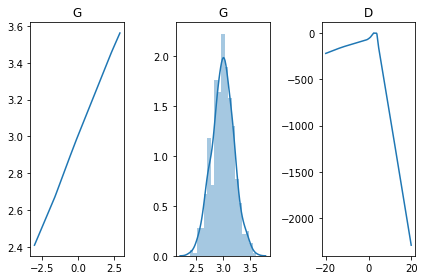

[Epoch 41704/50000] [D loss: -0.083281] [G loss: -0.125474]
[Epoch 41708/50000] [D loss: -0.071952] [G loss: -0.269579]
[Epoch 41712/50000] [D loss: -0.074632] [G loss: -0.270828]
[Epoch 41716/50000] [D loss: -0.061069] [G loss: -0.296197]
[Epoch 41720/50000] [D loss: -0.066335] [G loss: -0.315643]
[Epoch 41724/50000] [D loss: -0.061454] [G loss: -0.267424]
[Epoch 41728/50000] [D loss: -0.026183] [G loss: -0.310008]
[Epoch 41732/50000] [D loss: -0.060914] [G loss: -0.365119]
[Epoch 41736/50000] [D loss: -0.068778] [G loss: -0.446464]
[Epoch 41740/50000] [D loss: -0.088691] [G loss: -0.445773]
[Epoch 41744/50000] [D loss: -0.077775] [G loss: -0.537480]
[Epoch 41748/50000] [D loss: -0.072926] [G loss: -0.108730]
[Epoch 41752/50000] [D loss: -0.111310] [G loss: -0.264884]
[Epoch 41756/50000] [D loss: -0.038486] [G loss: -0.418026]
[Epoch 41760/50000] [D loss: -0.058043] [G loss: -0.310491]
[Epoch 41764/50000] [D loss: -0.078819] [G loss: -0.283490]
[Epoch 41768/50000] [D loss: -0.070446] 

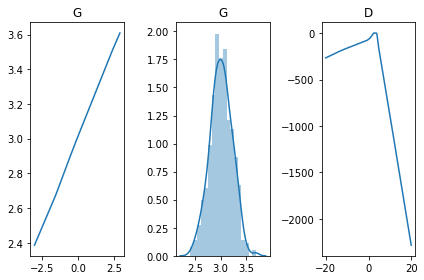

[Epoch 41804/50000] [D loss: -0.099746] [G loss: -0.352050]
[Epoch 41808/50000] [D loss: -0.098730] [G loss: -0.322793]
[Epoch 41812/50000] [D loss: -0.092301] [G loss: -0.333781]
[Epoch 41816/50000] [D loss: -0.078316] [G loss: -0.397724]
[Epoch 41820/50000] [D loss: -0.099411] [G loss: -0.408675]
[Epoch 41824/50000] [D loss: -0.091252] [G loss: -0.385894]
[Epoch 41828/50000] [D loss: -0.065756] [G loss: -0.304658]
[Epoch 41832/50000] [D loss: -0.065790] [G loss: -0.228290]
[Epoch 41836/50000] [D loss: -0.056301] [G loss: -0.232976]
[Epoch 41840/50000] [D loss: -0.051387] [G loss: -0.271904]
[Epoch 41844/50000] [D loss: -0.075220] [G loss: -0.302255]
[Epoch 41848/50000] [D loss: -0.031051] [G loss: -0.322661]
[Epoch 41852/50000] [D loss: -0.064602] [G loss: -0.362954]
[Epoch 41856/50000] [D loss: -0.068134] [G loss: -0.378404]
[Epoch 41860/50000] [D loss: -0.061439] [G loss: -0.377249]
[Epoch 41864/50000] [D loss: -0.076461] [G loss: -0.391839]
[Epoch 41868/50000] [D loss: -0.084345] 

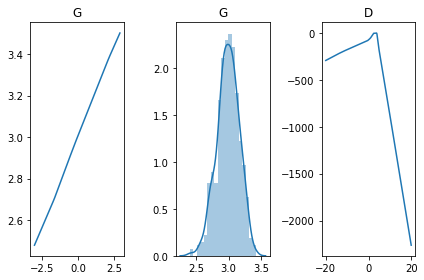

[Epoch 41904/50000] [D loss: -0.103980] [G loss: -0.274383]
[Epoch 41908/50000] [D loss: -0.078905] [G loss: -0.303827]
[Epoch 41912/50000] [D loss: -0.046890] [G loss: -0.318197]
[Epoch 41916/50000] [D loss: -0.053679] [G loss: -0.306128]
[Epoch 41920/50000] [D loss: -0.067399] [G loss: -0.200086]
[Epoch 41924/50000] [D loss: -0.056590] [G loss: -0.132821]
[Epoch 41928/50000] [D loss: -0.029656] [G loss: -0.001196]
[Epoch 41932/50000] [D loss: -0.062484] [G loss: 0.142112]
[Epoch 41936/50000] [D loss: -0.047065] [G loss: 0.240146]
[Epoch 41940/50000] [D loss: -0.038789] [G loss: 0.367001]
[Epoch 41944/50000] [D loss: -0.052099] [G loss: 0.377163]
[Epoch 41948/50000] [D loss: -0.041589] [G loss: 0.212613]
[Epoch 41952/50000] [D loss: -0.059416] [G loss: -0.116247]
[Epoch 41956/50000] [D loss: -0.138907] [G loss: 0.022442]
[Epoch 41960/50000] [D loss: -0.053026] [G loss: -0.099507]
[Epoch 41964/50000] [D loss: -0.096171] [G loss: -0.009303]
[Epoch 41968/50000] [D loss: -0.064051] [G los

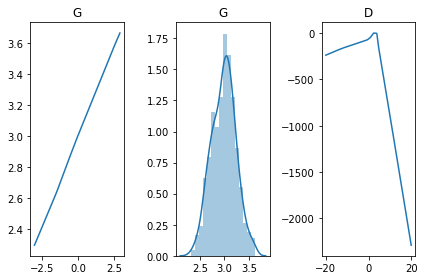

[Epoch 42004/50000] [D loss: -0.078558] [G loss: -0.233858]
[Epoch 42008/50000] [D loss: -0.077632] [G loss: -0.303985]
[Epoch 42012/50000] [D loss: -0.067200] [G loss: -0.316632]
[Epoch 42016/50000] [D loss: -0.134317] [G loss: -0.415140]
[Epoch 42020/50000] [D loss: -0.107312] [G loss: -0.505342]
[Epoch 42024/50000] [D loss: -0.034065] [G loss: -0.300629]
[Epoch 42028/50000] [D loss: -0.066801] [G loss: -0.244085]
[Epoch 42032/50000] [D loss: -0.048143] [G loss: -0.360040]
[Epoch 42036/50000] [D loss: -0.013506] [G loss: -0.424146]
[Epoch 42040/50000] [D loss: -0.033286] [G loss: -0.355667]
[Epoch 42044/50000] [D loss: -0.055243] [G loss: -0.356365]
[Epoch 42048/50000] [D loss: -0.002231] [G loss: -0.211274]
[Epoch 42052/50000] [D loss: -0.027450] [G loss: -0.280712]
[Epoch 42056/50000] [D loss: -0.074350] [G loss: -0.093557]
[Epoch 42060/50000] [D loss: -0.086296] [G loss: 0.276091]
[Epoch 42064/50000] [D loss: -0.060367] [G loss: 0.190896]
[Epoch 42068/50000] [D loss: -0.055069] [G

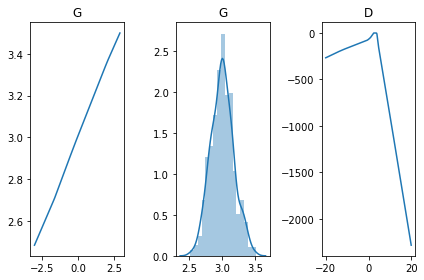

[Epoch 42104/50000] [D loss: -0.075013] [G loss: 0.498638]
[Epoch 42108/50000] [D loss: -0.098953] [G loss: 0.524547]
[Epoch 42112/50000] [D loss: -0.091958] [G loss: 0.547247]
[Epoch 42116/50000] [D loss: -0.098635] [G loss: -1.083033]
[Epoch 42120/50000] [D loss: -0.088715] [G loss: 0.590407]
[Epoch 42124/50000] [D loss: -0.023612] [G loss: 0.296491]
[Epoch 42128/50000] [D loss: -0.088061] [G loss: 0.370401]
[Epoch 42132/50000] [D loss: -0.097203] [G loss: 0.353815]
[Epoch 42136/50000] [D loss: -0.051599] [G loss: 0.292428]
[Epoch 42140/50000] [D loss: -0.077190] [G loss: 0.291595]
[Epoch 42144/50000] [D loss: -0.092221] [G loss: 0.303032]
[Epoch 42148/50000] [D loss: -0.086363] [G loss: 0.328548]
[Epoch 42152/50000] [D loss: -0.075494] [G loss: 0.330567]
[Epoch 42156/50000] [D loss: -0.080302] [G loss: 0.361837]
[Epoch 42160/50000] [D loss: -0.107104] [G loss: 0.464657]
[Epoch 42164/50000] [D loss: -0.107868] [G loss: 0.335580]
[Epoch 42168/50000] [D loss: -0.065269] [G loss: 0.2017

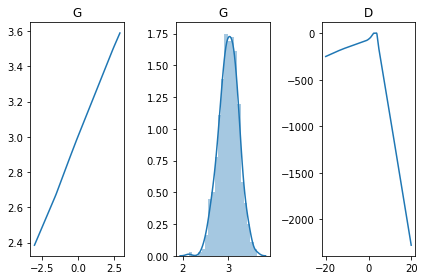

[Epoch 42204/50000] [D loss: -0.070674] [G loss: 0.165616]
[Epoch 42208/50000] [D loss: -0.025024] [G loss: 0.079100]
[Epoch 42212/50000] [D loss: -0.037091] [G loss: 0.027720]
[Epoch 42216/50000] [D loss: -0.048098] [G loss: 0.097170]
[Epoch 42220/50000] [D loss: -0.027685] [G loss: 0.084728]
[Epoch 42224/50000] [D loss: -0.040044] [G loss: 0.082742]
[Epoch 42228/50000] [D loss: -0.034594] [G loss: 0.080759]
[Epoch 42232/50000] [D loss: -0.048113] [G loss: 0.169460]
[Epoch 42236/50000] [D loss: -0.050493] [G loss: 0.141373]
[Epoch 42240/50000] [D loss: -0.054955] [G loss: 0.084593]
[Epoch 42244/50000] [D loss: -0.030811] [G loss: 0.036327]
[Epoch 42248/50000] [D loss: -0.091269] [G loss: 0.634544]
[Epoch 42252/50000] [D loss: -0.034937] [G loss: 0.434322]
[Epoch 42256/50000] [D loss: -0.037907] [G loss: 0.417971]
[Epoch 42260/50000] [D loss: -0.017379] [G loss: 0.378770]
[Epoch 42264/50000] [D loss: -0.034896] [G loss: 0.411433]
[Epoch 42268/50000] [D loss: -0.044193] [G loss: 0.40608

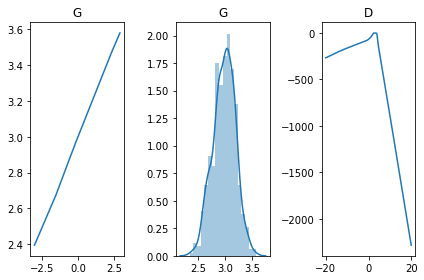

[Epoch 42304/50000] [D loss: -0.086524] [G loss: -0.413573]
[Epoch 42308/50000] [D loss: -0.109732] [G loss: -0.389658]
[Epoch 42312/50000] [D loss: -0.074237] [G loss: -0.402393]
[Epoch 42316/50000] [D loss: -0.080902] [G loss: -0.302856]
[Epoch 42320/50000] [D loss: -0.041638] [G loss: -0.230312]
[Epoch 42324/50000] [D loss: -0.076298] [G loss: -0.299666]
[Epoch 42328/50000] [D loss: -0.033597] [G loss: -0.245778]
[Epoch 42332/50000] [D loss: -0.085862] [G loss: -0.279108]
[Epoch 42336/50000] [D loss: -0.049847] [G loss: -0.268622]
[Epoch 42340/50000] [D loss: -0.057182] [G loss: -0.212990]
[Epoch 42344/50000] [D loss: -0.080730] [G loss: -0.294998]
[Epoch 42348/50000] [D loss: -0.052485] [G loss: -0.255817]
[Epoch 42352/50000] [D loss: -0.064113] [G loss: -0.269788]
[Epoch 42356/50000] [D loss: -0.051828] [G loss: -0.266936]
[Epoch 42360/50000] [D loss: -0.059320] [G loss: -0.187716]
[Epoch 42364/50000] [D loss: -0.046373] [G loss: -0.162809]
[Epoch 42368/50000] [D loss: -0.042382] 

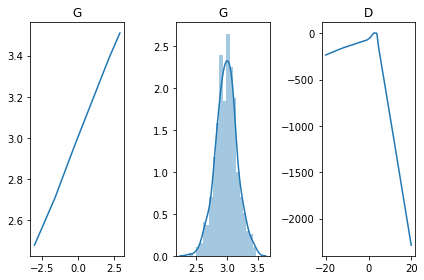

[Epoch 42404/50000] [D loss: -0.073471] [G loss: -0.305098]
[Epoch 42408/50000] [D loss: -0.068607] [G loss: -0.252159]
[Epoch 42412/50000] [D loss: -0.070399] [G loss: -0.222302]
[Epoch 42416/50000] [D loss: -0.068725] [G loss: -0.185046]
[Epoch 42420/50000] [D loss: -0.062394] [G loss: -0.239021]
[Epoch 42424/50000] [D loss: -0.089441] [G loss: -0.253422]
[Epoch 42428/50000] [D loss: -0.063030] [G loss: -0.340727]
[Epoch 42432/50000] [D loss: -0.067028] [G loss: -0.316789]
[Epoch 42436/50000] [D loss: -0.066482] [G loss: -0.275601]
[Epoch 42440/50000] [D loss: -0.068772] [G loss: -0.279345]
[Epoch 42444/50000] [D loss: -0.067772] [G loss: -0.289079]
[Epoch 42448/50000] [D loss: -0.064630] [G loss: -0.255425]
[Epoch 42452/50000] [D loss: -0.060380] [G loss: -0.270049]
[Epoch 42456/50000] [D loss: -0.074583] [G loss: -0.253559]
[Epoch 42460/50000] [D loss: -0.034557] [G loss: -0.225102]
[Epoch 42464/50000] [D loss: -0.063050] [G loss: -0.283787]
[Epoch 42468/50000] [D loss: -0.074291] 

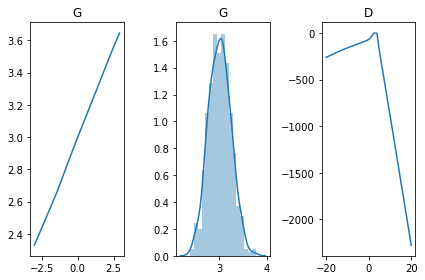

[Epoch 42504/50000] [D loss: -0.092237] [G loss: -0.452513]
[Epoch 42508/50000] [D loss: -0.077998] [G loss: -0.467609]
[Epoch 42512/50000] [D loss: -0.085502] [G loss: -0.478461]
[Epoch 42516/50000] [D loss: -0.096254] [G loss: -0.435504]
[Epoch 42520/50000] [D loss: -0.095954] [G loss: -0.394362]
[Epoch 42524/50000] [D loss: -0.087185] [G loss: -0.437333]
[Epoch 42528/50000] [D loss: -0.085040] [G loss: -0.381925]
[Epoch 42532/50000] [D loss: -0.100953] [G loss: -0.393373]
[Epoch 42536/50000] [D loss: -0.087173] [G loss: -0.517252]
[Epoch 42540/50000] [D loss: -0.069003] [G loss: 0.099901]
[Epoch 42544/50000] [D loss: -0.054942] [G loss: 0.030627]
[Epoch 42548/50000] [D loss: -0.119886] [G loss: -0.885675]
[Epoch 42552/50000] [D loss: -0.066509] [G loss: -0.845069]
[Epoch 42556/50000] [D loss: -0.089471] [G loss: -0.840298]
[Epoch 42560/50000] [D loss: -0.068633] [G loss: -0.787105]
[Epoch 42564/50000] [D loss: -0.062116] [G loss: -0.735556]
[Epoch 42568/50000] [D loss: -0.060109] [G

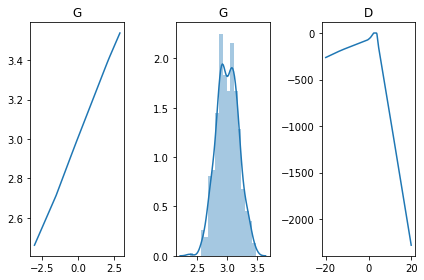

[Epoch 42604/50000] [D loss: -0.048267] [G loss: -0.568504]
[Epoch 42608/50000] [D loss: -0.044475] [G loss: -0.542098]
[Epoch 42612/50000] [D loss: -0.050421] [G loss: -0.524874]
[Epoch 42616/50000] [D loss: -0.051829] [G loss: -0.510607]
[Epoch 42620/50000] [D loss: -0.042090] [G loss: -0.522861]
[Epoch 42624/50000] [D loss: -0.047844] [G loss: -0.539862]
[Epoch 42628/50000] [D loss: -0.049730] [G loss: -0.483179]
[Epoch 42632/50000] [D loss: -0.042254] [G loss: -0.428633]
[Epoch 42636/50000] [D loss: -0.069478] [G loss: -0.803584]
[Epoch 42640/50000] [D loss: -0.073823] [G loss: -0.846318]
[Epoch 42644/50000] [D loss: -0.086345] [G loss: -0.831362]
[Epoch 42648/50000] [D loss: -0.079341] [G loss: -0.804388]
[Epoch 42652/50000] [D loss: -0.080361] [G loss: -0.722981]
[Epoch 42656/50000] [D loss: -0.054178] [G loss: -0.699441]
[Epoch 42660/50000] [D loss: -0.052468] [G loss: -0.651223]
[Epoch 42664/50000] [D loss: -0.061110] [G loss: -0.598367]
[Epoch 42668/50000] [D loss: -0.061184] 

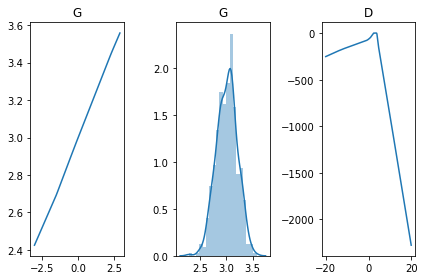

[Epoch 42704/50000] [D loss: -0.085858] [G loss: -0.897635]
[Epoch 42708/50000] [D loss: -0.084340] [G loss: -0.882011]
[Epoch 42712/50000] [D loss: -0.083118] [G loss: -0.894069]
[Epoch 42716/50000] [D loss: -0.083790] [G loss: -0.865209]
[Epoch 42720/50000] [D loss: -0.078231] [G loss: -0.863519]
[Epoch 42724/50000] [D loss: -0.071500] [G loss: -0.853409]
[Epoch 42728/50000] [D loss: -0.070912] [G loss: -0.862075]
[Epoch 42732/50000] [D loss: -0.054251] [G loss: -0.897798]
[Epoch 42736/50000] [D loss: -0.083478] [G loss: -0.831178]
[Epoch 42740/50000] [D loss: -0.073092] [G loss: -0.881485]
[Epoch 42744/50000] [D loss: -0.073406] [G loss: -0.882670]
[Epoch 42748/50000] [D loss: -0.085718] [G loss: -0.898957]
[Epoch 42752/50000] [D loss: -0.093992] [G loss: -0.865582]
[Epoch 42756/50000] [D loss: -0.076937] [G loss: -0.827928]
[Epoch 42760/50000] [D loss: -0.074126] [G loss: -0.807978]
[Epoch 42764/50000] [D loss: -0.055985] [G loss: -0.795817]
[Epoch 42768/50000] [D loss: -0.069094] 

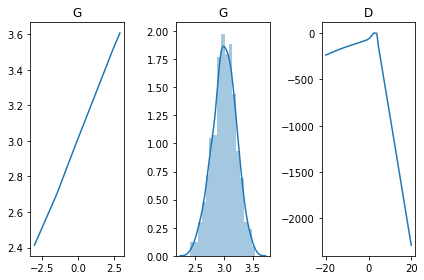

[Epoch 42804/50000] [D loss: -0.042182] [G loss: -0.755990]
[Epoch 42808/50000] [D loss: -0.053317] [G loss: -0.710275]
[Epoch 42812/50000] [D loss: -0.083438] [G loss: -0.678428]
[Epoch 42816/50000] [D loss: -0.059227] [G loss: -0.669141]
[Epoch 42820/50000] [D loss: -0.035900] [G loss: -0.665920]
[Epoch 42824/50000] [D loss: -0.082786] [G loss: -0.696666]
[Epoch 42828/50000] [D loss: -0.035899] [G loss: -0.732340]
[Epoch 42832/50000] [D loss: -0.055857] [G loss: -0.659608]
[Epoch 42836/50000] [D loss: -0.058553] [G loss: -0.691754]
[Epoch 42840/50000] [D loss: -0.056586] [G loss: -0.688430]
[Epoch 42844/50000] [D loss: -0.069671] [G loss: -0.731337]
[Epoch 42848/50000] [D loss: -0.053360] [G loss: -0.805121]
[Epoch 42852/50000] [D loss: -0.076977] [G loss: -0.872081]
[Epoch 42856/50000] [D loss: -0.088736] [G loss: -0.921292]
[Epoch 42860/50000] [D loss: -0.083195] [G loss: -0.865750]
[Epoch 42864/50000] [D loss: -0.084791] [G loss: -0.893239]
[Epoch 42868/50000] [D loss: -0.083932] 

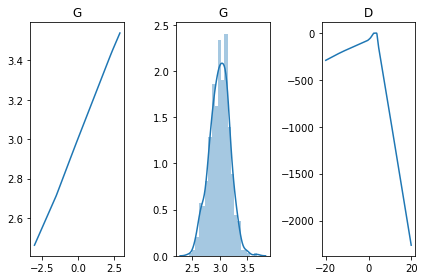

[Epoch 42904/50000] [D loss: -0.083360] [G loss: -0.234811]
[Epoch 42908/50000] [D loss: -0.033300] [G loss: -0.264796]
[Epoch 42912/50000] [D loss: -0.028740] [G loss: -0.281215]
[Epoch 42916/50000] [D loss: -0.043293] [G loss: -0.251539]
[Epoch 42920/50000] [D loss: -0.056015] [G loss: -0.188022]
[Epoch 42924/50000] [D loss: -0.054148] [G loss: -0.153033]
[Epoch 42928/50000] [D loss: -0.050604] [G loss: -0.071053]
[Epoch 42932/50000] [D loss: -0.066398] [G loss: -0.200154]
[Epoch 42936/50000] [D loss: -0.060363] [G loss: -0.222011]
[Epoch 42940/50000] [D loss: -0.072141] [G loss: -0.262182]
[Epoch 42944/50000] [D loss: -0.071564] [G loss: -0.240032]
[Epoch 42948/50000] [D loss: -0.062725] [G loss: -0.335408]
[Epoch 42952/50000] [D loss: -0.087407] [G loss: -0.276216]
[Epoch 42956/50000] [D loss: -0.078566] [G loss: -0.250408]
[Epoch 42960/50000] [D loss: -0.095352] [G loss: -0.227539]
[Epoch 42964/50000] [D loss: -0.088019] [G loss: -0.224270]
[Epoch 42968/50000] [D loss: -0.089097] 

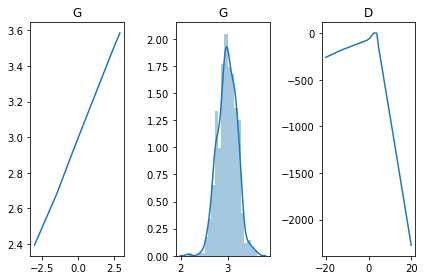

[Epoch 43004/50000] [D loss: -0.084370] [G loss: -0.301630]
[Epoch 43008/50000] [D loss: -0.082267] [G loss: -0.319761]
[Epoch 43012/50000] [D loss: -0.085833] [G loss: -0.341388]
[Epoch 43016/50000] [D loss: -0.068981] [G loss: -0.284281]
[Epoch 43020/50000] [D loss: -0.075921] [G loss: -0.282422]
[Epoch 43024/50000] [D loss: -0.076023] [G loss: -0.263323]
[Epoch 43028/50000] [D loss: -0.082142] [G loss: -0.310102]
[Epoch 43032/50000] [D loss: -0.085002] [G loss: -0.191801]
[Epoch 43036/50000] [D loss: -0.059680] [G loss: -0.223269]
[Epoch 43040/50000] [D loss: -0.104981] [G loss: -0.176655]
[Epoch 43044/50000] [D loss: -0.048643] [G loss: -0.236873]
[Epoch 43048/50000] [D loss: -0.076112] [G loss: -0.304005]
[Epoch 43052/50000] [D loss: -0.075487] [G loss: -0.287562]
[Epoch 43056/50000] [D loss: -0.084719] [G loss: -0.291808]
[Epoch 43060/50000] [D loss: -0.071934] [G loss: -0.313986]
[Epoch 43064/50000] [D loss: -0.065334] [G loss: -0.304530]
[Epoch 43068/50000] [D loss: -0.072846] 

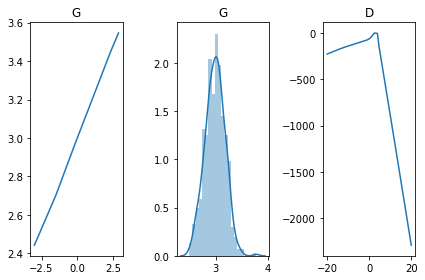

[Epoch 43104/50000] [D loss: -0.046358] [G loss: -0.233387]
[Epoch 43108/50000] [D loss: -0.060894] [G loss: -0.289512]
[Epoch 43112/50000] [D loss: -0.068974] [G loss: -0.355342]
[Epoch 43116/50000] [D loss: -0.082954] [G loss: -0.380559]
[Epoch 43120/50000] [D loss: -0.084313] [G loss: -0.437462]
[Epoch 43124/50000] [D loss: -0.085531] [G loss: -0.501573]
[Epoch 43128/50000] [D loss: -0.107566] [G loss: 0.024444]
[Epoch 43132/50000] [D loss: -0.101869] [G loss: -0.538093]
[Epoch 43136/50000] [D loss: -0.067587] [G loss: 0.384723]
[Epoch 43140/50000] [D loss: -0.087330] [G loss: 0.452688]
[Epoch 43144/50000] [D loss: -0.088090] [G loss: 0.398999]
[Epoch 43148/50000] [D loss: -0.088511] [G loss: 0.328718]
[Epoch 43152/50000] [D loss: -0.083779] [G loss: 0.254227]
[Epoch 43156/50000] [D loss: -0.054897] [G loss: 0.269844]
[Epoch 43160/50000] [D loss: -0.070187] [G loss: 0.264136]
[Epoch 43164/50000] [D loss: -0.096601] [G loss: 0.271239]
[Epoch 43168/50000] [D loss: -0.085052] [G loss: 

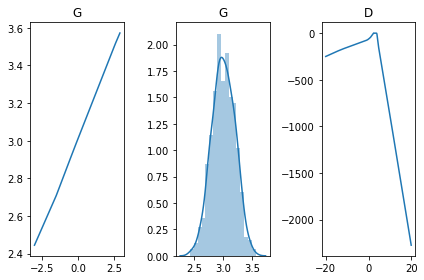

[Epoch 43204/50000] [D loss: -0.100888] [G loss: 0.472575]
[Epoch 43208/50000] [D loss: -0.094536] [G loss: 0.471247]
[Epoch 43212/50000] [D loss: -0.101272] [G loss: 0.219875]
[Epoch 43216/50000] [D loss: -0.089859] [G loss: -0.281698]
[Epoch 43220/50000] [D loss: -0.122222] [G loss: -0.447190]
[Epoch 43224/50000] [D loss: -0.066762] [G loss: -0.127908]
[Epoch 43228/50000] [D loss: -0.080953] [G loss: -0.284154]
[Epoch 43232/50000] [D loss: -0.059349] [G loss: -0.295035]
[Epoch 43236/50000] [D loss: -0.042600] [G loss: -0.309391]
[Epoch 43240/50000] [D loss: -0.075608] [G loss: -0.266060]
[Epoch 43244/50000] [D loss: -0.074669] [G loss: -0.291023]
[Epoch 43248/50000] [D loss: -0.061135] [G loss: -0.303464]
[Epoch 43252/50000] [D loss: -0.065962] [G loss: -0.345002]
[Epoch 43256/50000] [D loss: -0.079463] [G loss: -0.385159]
[Epoch 43260/50000] [D loss: -0.090104] [G loss: -0.433714]
[Epoch 43264/50000] [D loss: -0.090515] [G loss: -0.509869]
[Epoch 43268/50000] [D loss: -0.089384] [G 

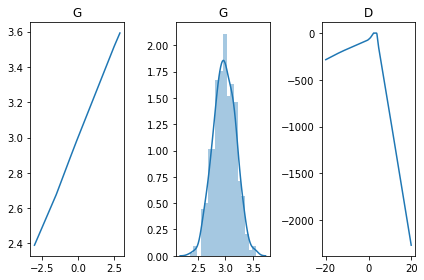

[Epoch 43304/50000] [D loss: -0.094810] [G loss: -0.221613]
[Epoch 43308/50000] [D loss: -0.085429] [G loss: -0.213507]
[Epoch 43312/50000] [D loss: -0.076750] [G loss: -0.258058]
[Epoch 43316/50000] [D loss: -0.054479] [G loss: -0.229619]
[Epoch 43320/50000] [D loss: -0.064313] [G loss: -0.281959]
[Epoch 43324/50000] [D loss: -0.054734] [G loss: -0.259391]
[Epoch 43328/50000] [D loss: -0.075258] [G loss: -0.259932]
[Epoch 43332/50000] [D loss: -0.057814] [G loss: -0.237141]
[Epoch 43336/50000] [D loss: -0.058517] [G loss: -0.205546]
[Epoch 43340/50000] [D loss: -0.076615] [G loss: -0.294509]
[Epoch 43344/50000] [D loss: -0.097355] [G loss: -0.309456]
[Epoch 43348/50000] [D loss: -0.055708] [G loss: -0.299290]
[Epoch 43352/50000] [D loss: -0.072996] [G loss: -0.312451]
[Epoch 43356/50000] [D loss: -0.044571] [G loss: -0.280398]
[Epoch 43360/50000] [D loss: -0.080417] [G loss: -0.279343]
[Epoch 43364/50000] [D loss: -0.074990] [G loss: -0.282066]
[Epoch 43368/50000] [D loss: -0.076934] 

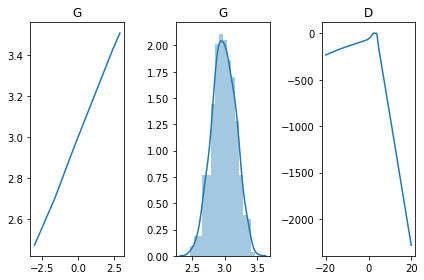

[Epoch 43404/50000] [D loss: -0.071588] [G loss: -0.345131]
[Epoch 43408/50000] [D loss: -0.088838] [G loss: -0.398115]
[Epoch 43412/50000] [D loss: -0.084098] [G loss: -0.413943]
[Epoch 43416/50000] [D loss: -0.088631] [G loss: -0.422626]
[Epoch 43420/50000] [D loss: -0.112313] [G loss: -0.426521]
[Epoch 43424/50000] [D loss: -0.096106] [G loss: -0.441468]
[Epoch 43428/50000] [D loss: -0.088004] [G loss: -0.415587]
[Epoch 43432/50000] [D loss: -0.089783] [G loss: -0.407627]
[Epoch 43436/50000] [D loss: -0.095296] [G loss: -0.395588]
[Epoch 43440/50000] [D loss: -0.061908] [G loss: -0.398611]
[Epoch 43444/50000] [D loss: -0.084761] [G loss: -0.305522]
[Epoch 43448/50000] [D loss: -0.074762] [G loss: -0.267130]
[Epoch 43452/50000] [D loss: -0.067545] [G loss: -0.302121]
[Epoch 43456/50000] [D loss: -0.071980] [G loss: -0.304418]
[Epoch 43460/50000] [D loss: -0.077255] [G loss: -0.331999]
[Epoch 43464/50000] [D loss: -0.062550] [G loss: -0.323090]
[Epoch 43468/50000] [D loss: -0.072795] 

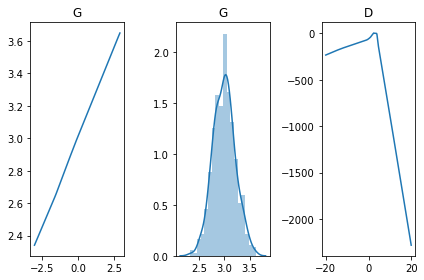

[Epoch 43504/50000] [D loss: -0.069429] [G loss: -0.280842]
[Epoch 43508/50000] [D loss: -0.085068] [G loss: -0.256532]
[Epoch 43512/50000] [D loss: -0.099208] [G loss: -0.202431]
[Epoch 43516/50000] [D loss: -0.104221] [G loss: -0.172766]
[Epoch 43520/50000] [D loss: -0.084835] [G loss: -0.299769]
[Epoch 43524/50000] [D loss: -0.057984] [G loss: -0.283143]
[Epoch 43528/50000] [D loss: -0.074097] [G loss: -0.390181]
[Epoch 43532/50000] [D loss: -0.096542] [G loss: -0.428896]
[Epoch 43536/50000] [D loss: -0.073632] [G loss: -0.395379]
[Epoch 43540/50000] [D loss: -0.105042] [G loss: -0.340630]
[Epoch 43544/50000] [D loss: -0.053895] [G loss: -0.381696]
[Epoch 43548/50000] [D loss: -0.095986] [G loss: -0.318946]
[Epoch 43552/50000] [D loss: -0.086519] [G loss: -0.259317]
[Epoch 43556/50000] [D loss: -0.097023] [G loss: -0.122244]
[Epoch 43560/50000] [D loss: -0.073523] [G loss: -0.135548]
[Epoch 43564/50000] [D loss: -0.078657] [G loss: -0.185559]
[Epoch 43568/50000] [D loss: -0.063005] 

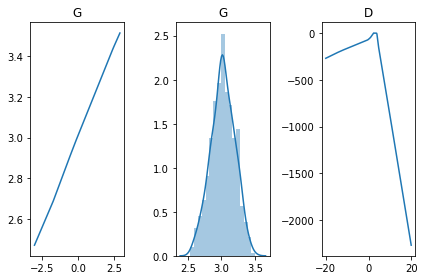

[Epoch 43604/50000] [D loss: -0.063102] [G loss: -0.231315]
[Epoch 43608/50000] [D loss: -0.065909] [G loss: -0.169303]
[Epoch 43612/50000] [D loss: -0.047512] [G loss: -0.193302]
[Epoch 43616/50000] [D loss: -0.056265] [G loss: -0.148870]
[Epoch 43620/50000] [D loss: -0.046060] [G loss: -0.096680]
[Epoch 43624/50000] [D loss: -0.053490] [G loss: -0.045554]
[Epoch 43628/50000] [D loss: -0.099775] [G loss: -0.672951]
[Epoch 43632/50000] [D loss: -0.032461] [G loss: -0.315099]
[Epoch 43636/50000] [D loss: -0.081606] [G loss: -0.166469]
[Epoch 43640/50000] [D loss: -0.070265] [G loss: -0.244314]
[Epoch 43644/50000] [D loss: -0.088983] [G loss: -0.245211]
[Epoch 43648/50000] [D loss: -0.079283] [G loss: -0.195015]
[Epoch 43652/50000] [D loss: -0.080333] [G loss: -0.282378]
[Epoch 43656/50000] [D loss: -0.102046] [G loss: -0.246736]
[Epoch 43660/50000] [D loss: -0.068101] [G loss: -0.263195]
[Epoch 43664/50000] [D loss: -0.080425] [G loss: -0.288950]
[Epoch 43668/50000] [D loss: -0.074425] 

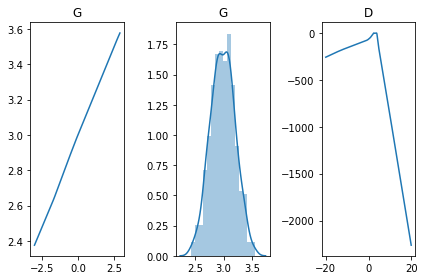

[Epoch 43704/50000] [D loss: -0.061211] [G loss: -0.408396]
[Epoch 43708/50000] [D loss: -0.068608] [G loss: -0.371016]
[Epoch 43712/50000] [D loss: -0.038993] [G loss: -0.338944]
[Epoch 43716/50000] [D loss: -0.037695] [G loss: -0.370017]
[Epoch 43720/50000] [D loss: -0.091048] [G loss: -0.313255]
[Epoch 43724/50000] [D loss: -0.116350] [G loss: -0.250382]
[Epoch 43728/50000] [D loss: -0.056234] [G loss: -0.358502]
[Epoch 43732/50000] [D loss: -0.037425] [G loss: -0.347983]
[Epoch 43736/50000] [D loss: -0.037927] [G loss: -0.285787]
[Epoch 43740/50000] [D loss: -0.052591] [G loss: -0.269332]
[Epoch 43744/50000] [D loss: -0.059939] [G loss: -0.247352]
[Epoch 43748/50000] [D loss: -0.060626] [G loss: -0.271954]
[Epoch 43752/50000] [D loss: -0.067764] [G loss: -0.260361]
[Epoch 43756/50000] [D loss: -0.085248] [G loss: -0.240305]
[Epoch 43760/50000] [D loss: -0.075875] [G loss: -0.263706]
[Epoch 43764/50000] [D loss: -0.076544] [G loss: -0.241266]
[Epoch 43768/50000] [D loss: -0.117889] 

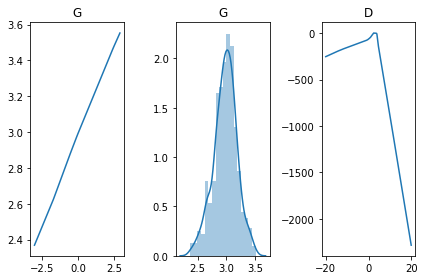

[Epoch 43804/50000] [D loss: -0.098737] [G loss: 0.079362]
[Epoch 43808/50000] [D loss: -0.078421] [G loss: 0.241398]
[Epoch 43812/50000] [D loss: -0.063647] [G loss: 0.408652]
[Epoch 43816/50000] [D loss: -0.106077] [G loss: 0.331673]
[Epoch 43820/50000] [D loss: -0.102390] [G loss: -0.002468]
[Epoch 43824/50000] [D loss: -0.105886] [G loss: 0.158252]
[Epoch 43828/50000] [D loss: -0.075688] [G loss: 0.021657]
[Epoch 43832/50000] [D loss: -0.068688] [G loss: 0.178305]
[Epoch 43836/50000] [D loss: -0.091313] [G loss: 0.114961]
[Epoch 43840/50000] [D loss: -0.083786] [G loss: 0.124380]
[Epoch 43844/50000] [D loss: -0.061875] [G loss: 0.033224]
[Epoch 43848/50000] [D loss: -0.114979] [G loss: 0.215010]
[Epoch 43852/50000] [D loss: -0.082133] [G loss: 0.223631]
[Epoch 43856/50000] [D loss: -0.066622] [G loss: 0.217960]
[Epoch 43860/50000] [D loss: -0.078597] [G loss: 0.316711]
[Epoch 43864/50000] [D loss: -0.076932] [G loss: 0.318397]
[Epoch 43868/50000] [D loss: -0.077858] [G loss: 0.3252

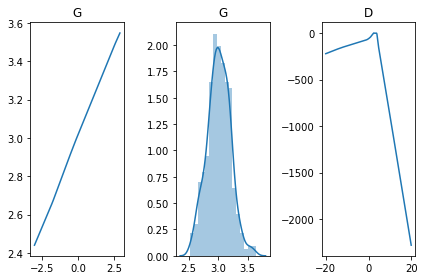

[Epoch 43904/50000] [D loss: -0.076213] [G loss: -0.139801]
[Epoch 43908/50000] [D loss: -0.094898] [G loss: -0.241154]
[Epoch 43912/50000] [D loss: -0.085698] [G loss: -0.236666]
[Epoch 43916/50000] [D loss: -0.130805] [G loss: -0.062198]
[Epoch 43920/50000] [D loss: -0.082991] [G loss: -0.141056]
[Epoch 43924/50000] [D loss: -0.106137] [G loss: -0.246775]
[Epoch 43928/50000] [D loss: -0.084553] [G loss: -0.262322]
[Epoch 43932/50000] [D loss: -0.063340] [G loss: -0.261208]
[Epoch 43936/50000] [D loss: -0.063406] [G loss: -0.314052]
[Epoch 43940/50000] [D loss: -0.086517] [G loss: -0.272860]
[Epoch 43944/50000] [D loss: -0.063629] [G loss: -0.331328]
[Epoch 43948/50000] [D loss: -0.066740] [G loss: -0.383887]
[Epoch 43952/50000] [D loss: -0.075245] [G loss: -0.404560]
[Epoch 43956/50000] [D loss: -0.081329] [G loss: -0.440085]
[Epoch 43960/50000] [D loss: -0.079931] [G loss: -0.497161]
[Epoch 43964/50000] [D loss: -0.077594] [G loss: -0.527163]
[Epoch 43968/50000] [D loss: -0.080568] 

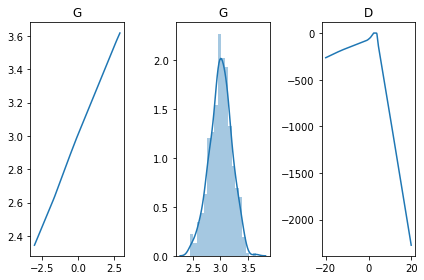

[Epoch 44004/50000] [D loss: -0.087989] [G loss: -0.348733]
[Epoch 44008/50000] [D loss: -0.083715] [G loss: -0.353390]
[Epoch 44012/50000] [D loss: -0.081068] [G loss: -0.324735]
[Epoch 44016/50000] [D loss: -0.075533] [G loss: -0.306166]
[Epoch 44020/50000] [D loss: -0.071981] [G loss: -0.328708]
[Epoch 44024/50000] [D loss: -0.073295] [G loss: -0.296390]
[Epoch 44028/50000] [D loss: -0.080791] [G loss: -0.321548]
[Epoch 44032/50000] [D loss: -0.075555] [G loss: -0.330560]
[Epoch 44036/50000] [D loss: -0.077422] [G loss: -0.314635]
[Epoch 44040/50000] [D loss: -0.070872] [G loss: -0.395203]
[Epoch 44044/50000] [D loss: -0.083022] [G loss: -0.397676]
[Epoch 44048/50000] [D loss: -0.080696] [G loss: -0.410336]
[Epoch 44052/50000] [D loss: -0.082127] [G loss: -0.404653]
[Epoch 44056/50000] [D loss: -0.085253] [G loss: -0.464769]
[Epoch 44060/50000] [D loss: -0.086448] [G loss: -0.435986]
[Epoch 44064/50000] [D loss: -0.096101] [G loss: -0.426456]
[Epoch 44068/50000] [D loss: -0.082288] 

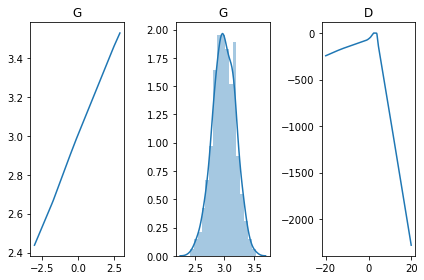

[Epoch 44104/50000] [D loss: -0.073987] [G loss: -0.152054]
[Epoch 44108/50000] [D loss: -0.059246] [G loss: -0.312248]
[Epoch 44112/50000] [D loss: -0.072450] [G loss: -0.287659]
[Epoch 44116/50000] [D loss: -0.080788] [G loss: -0.312721]
[Epoch 44120/50000] [D loss: -0.056903] [G loss: -0.360287]
[Epoch 44124/50000] [D loss: -0.076264] [G loss: -0.372232]
[Epoch 44128/50000] [D loss: -0.086363] [G loss: -0.372759]
[Epoch 44132/50000] [D loss: -0.087970] [G loss: -0.340867]
[Epoch 44136/50000] [D loss: -0.092557] [G loss: -0.340151]
[Epoch 44140/50000] [D loss: -0.080893] [G loss: -0.335354]
[Epoch 44144/50000] [D loss: -0.065143] [G loss: -0.303797]
[Epoch 44148/50000] [D loss: -0.070516] [G loss: -0.233795]
[Epoch 44152/50000] [D loss: -0.069263] [G loss: -0.207490]
[Epoch 44156/50000] [D loss: -0.082036] [G loss: -0.235848]
[Epoch 44160/50000] [D loss: -0.075177] [G loss: -0.247230]
[Epoch 44164/50000] [D loss: -0.067576] [G loss: -0.239123]
[Epoch 44168/50000] [D loss: -0.044391] 

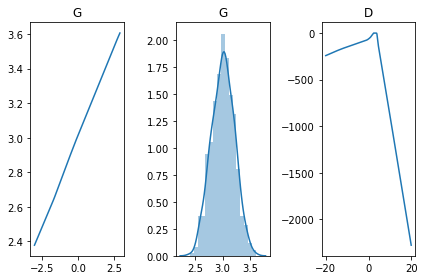

[Epoch 44204/50000] [D loss: -0.063131] [G loss: -0.301220]
[Epoch 44208/50000] [D loss: -0.072864] [G loss: -0.260041]
[Epoch 44212/50000] [D loss: -0.070408] [G loss: -0.284122]
[Epoch 44216/50000] [D loss: -0.072521] [G loss: -0.265473]
[Epoch 44220/50000] [D loss: -0.064315] [G loss: -0.276172]
[Epoch 44224/50000] [D loss: -0.071084] [G loss: -0.288899]
[Epoch 44228/50000] [D loss: -0.067880] [G loss: -0.199421]
[Epoch 44232/50000] [D loss: -0.068435] [G loss: -0.281606]
[Epoch 44236/50000] [D loss: -0.064976] [G loss: -0.276688]
[Epoch 44240/50000] [D loss: -0.078437] [G loss: -0.334037]
[Epoch 44244/50000] [D loss: -0.089526] [G loss: -0.336680]
[Epoch 44248/50000] [D loss: -0.075884] [G loss: -0.378987]
[Epoch 44252/50000] [D loss: -0.088240] [G loss: -0.402847]
[Epoch 44256/50000] [D loss: -0.091547] [G loss: -0.461889]
[Epoch 44260/50000] [D loss: -0.102610] [G loss: -0.239337]
[Epoch 44264/50000] [D loss: -0.091826] [G loss: -0.579034]
[Epoch 44268/50000] [D loss: -0.070078] 

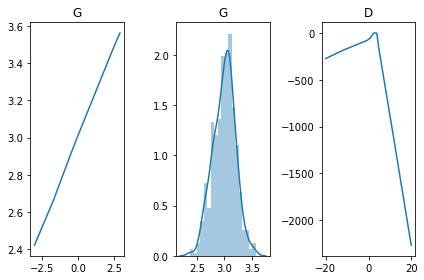

[Epoch 44304/50000] [D loss: -0.057954] [G loss: -0.565710]
[Epoch 44308/50000] [D loss: -0.039869] [G loss: -0.543505]
[Epoch 44312/50000] [D loss: -0.046225] [G loss: -0.505257]
[Epoch 44316/50000] [D loss: -0.029392] [G loss: -0.484873]
[Epoch 44320/50000] [D loss: -0.057082] [G loss: -0.444359]
[Epoch 44324/50000] [D loss: -0.043880] [G loss: -0.429551]
[Epoch 44328/50000] [D loss: -0.049766] [G loss: -0.384447]
[Epoch 44332/50000] [D loss: -0.084318] [G loss: 0.385257]
[Epoch 44336/50000] [D loss: -0.085047] [G loss: 0.323454]
[Epoch 44340/50000] [D loss: -0.066821] [G loss: 0.227265]
[Epoch 44344/50000] [D loss: -0.092706] [G loss: 0.275982]
[Epoch 44348/50000] [D loss: -0.100225] [G loss: 0.216181]
[Epoch 44352/50000] [D loss: -0.074956] [G loss: 0.173737]
[Epoch 44356/50000] [D loss: -0.093569] [G loss: 0.244993]
[Epoch 44360/50000] [D loss: -0.054384] [G loss: 0.248422]
[Epoch 44364/50000] [D loss: -0.069497] [G loss: 0.278221]
[Epoch 44368/50000] [D loss: -0.065810] [G loss: 

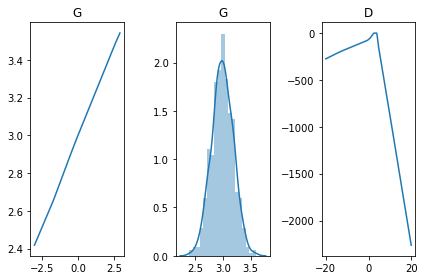

[Epoch 44404/50000] [D loss: -0.098807] [G loss: 0.301762]
[Epoch 44408/50000] [D loss: -0.060711] [G loss: 0.300833]
[Epoch 44412/50000] [D loss: -0.082651] [G loss: 0.295255]
[Epoch 44416/50000] [D loss: -0.060737] [G loss: 0.290929]
[Epoch 44420/50000] [D loss: -0.086872] [G loss: 0.357798]
[Epoch 44424/50000] [D loss: -0.058767] [G loss: 0.350742]
[Epoch 44428/50000] [D loss: -0.055095] [G loss: 0.319699]
[Epoch 44432/50000] [D loss: -0.092025] [G loss: 0.383001]
[Epoch 44436/50000] [D loss: -0.082643] [G loss: 0.430836]
[Epoch 44440/50000] [D loss: -0.087316] [G loss: 0.418255]
[Epoch 44444/50000] [D loss: -0.092396] [G loss: 0.440175]
[Epoch 44448/50000] [D loss: -0.077391] [G loss: 0.443909]
[Epoch 44452/50000] [D loss: -0.091866] [G loss: 0.495883]
[Epoch 44456/50000] [D loss: -0.094800] [G loss: 0.307092]
[Epoch 44460/50000] [D loss: -0.076798] [G loss: 0.227272]
[Epoch 44464/50000] [D loss: -0.081068] [G loss: 0.278018]
[Epoch 44468/50000] [D loss: -0.080602] [G loss: 0.26184

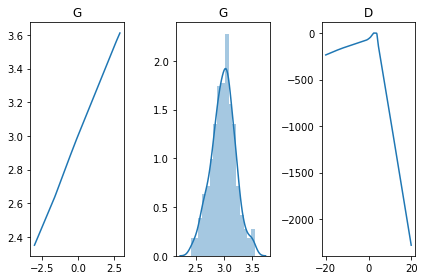

[Epoch 44504/50000] [D loss: -0.052960] [G loss: -0.263791]
[Epoch 44508/50000] [D loss: -0.071608] [G loss: -0.298432]
[Epoch 44512/50000] [D loss: -0.073809] [G loss: -0.259580]
[Epoch 44516/50000] [D loss: -0.077797] [G loss: -0.336213]
[Epoch 44520/50000] [D loss: -0.073231] [G loss: -0.382179]
[Epoch 44524/50000] [D loss: -0.089047] [G loss: -0.474834]
[Epoch 44528/50000] [D loss: -0.093182] [G loss: -0.496547]
[Epoch 44532/50000] [D loss: -0.094834] [G loss: -0.513709]
[Epoch 44536/50000] [D loss: -0.063861] [G loss: -0.111885]
[Epoch 44540/50000] [D loss: -0.076939] [G loss: -0.328317]
[Epoch 44544/50000] [D loss: -0.097170] [G loss: -0.222136]
[Epoch 44548/50000] [D loss: -0.076082] [G loss: -0.274696]
[Epoch 44552/50000] [D loss: -0.079948] [G loss: -0.279924]
[Epoch 44556/50000] [D loss: -0.048131] [G loss: -0.276183]
[Epoch 44560/50000] [D loss: -0.080876] [G loss: -0.266862]
[Epoch 44564/50000] [D loss: -0.110884] [G loss: -0.272504]
[Epoch 44568/50000] [D loss: -0.093809] 

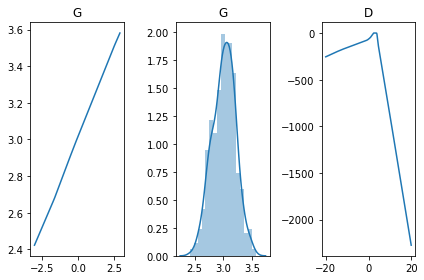

[Epoch 44604/50000] [D loss: -0.050594] [G loss: -0.114867]
[Epoch 44608/50000] [D loss: -0.060238] [G loss: -0.101693]
[Epoch 44612/50000] [D loss: -0.061663] [G loss: -0.164830]
[Epoch 44616/50000] [D loss: -0.087414] [G loss: -0.207459]
[Epoch 44620/50000] [D loss: -0.057070] [G loss: -0.226695]
[Epoch 44624/50000] [D loss: -0.070450] [G loss: -0.260308]
[Epoch 44628/50000] [D loss: -0.085370] [G loss: -0.252710]
[Epoch 44632/50000] [D loss: -0.070843] [G loss: -0.288879]
[Epoch 44636/50000] [D loss: -0.078276] [G loss: -0.316857]
[Epoch 44640/50000] [D loss: -0.104537] [G loss: -0.236995]
[Epoch 44644/50000] [D loss: -0.036913] [G loss: -0.336151]
[Epoch 44648/50000] [D loss: -0.065954] [G loss: -0.253178]
[Epoch 44652/50000] [D loss: -0.062130] [G loss: -0.296372]
[Epoch 44656/50000] [D loss: -0.066146] [G loss: -0.275911]
[Epoch 44660/50000] [D loss: -0.073096] [G loss: -0.268475]
[Epoch 44664/50000] [D loss: -0.079866] [G loss: -0.282015]
[Epoch 44668/50000] [D loss: -0.071692] 

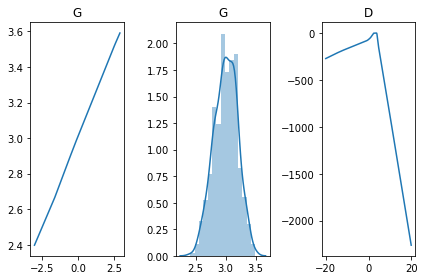

[Epoch 44704/50000] [D loss: -0.043946] [G loss: -0.230583]
[Epoch 44708/50000] [D loss: -0.035445] [G loss: -0.164962]
[Epoch 44712/50000] [D loss: -0.053713] [G loss: -0.132140]
[Epoch 44716/50000] [D loss: -0.052073] [G loss: -0.137681]
[Epoch 44720/50000] [D loss: -0.062163] [G loss: -0.108474]
[Epoch 44724/50000] [D loss: -0.069554] [G loss: -0.300444]
[Epoch 44728/50000] [D loss: -0.068725] [G loss: -0.329678]
[Epoch 44732/50000] [D loss: -0.087450] [G loss: -0.336738]
[Epoch 44736/50000] [D loss: -0.071463] [G loss: -0.295262]
[Epoch 44740/50000] [D loss: -0.070124] [G loss: -0.274208]
[Epoch 44744/50000] [D loss: -0.073881] [G loss: -0.235509]
[Epoch 44748/50000] [D loss: -0.072359] [G loss: -0.238706]
[Epoch 44752/50000] [D loss: -0.065572] [G loss: -0.286039]
[Epoch 44756/50000] [D loss: -0.067411] [G loss: -0.258016]
[Epoch 44760/50000] [D loss: -0.076084] [G loss: -0.248243]
[Epoch 44764/50000] [D loss: -0.082623] [G loss: -0.253055]
[Epoch 44768/50000] [D loss: -0.077174] 

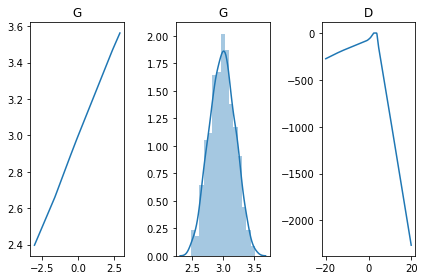

[Epoch 44804/50000] [D loss: -0.067082] [G loss: -0.295197]
[Epoch 44808/50000] [D loss: -0.098765] [G loss: -0.271892]
[Epoch 44812/50000] [D loss: -0.092507] [G loss: -0.241765]
[Epoch 44816/50000] [D loss: -0.065080] [G loss: -0.250584]
[Epoch 44820/50000] [D loss: -0.066092] [G loss: -0.273399]
[Epoch 44824/50000] [D loss: -0.090136] [G loss: -0.255046]
[Epoch 44828/50000] [D loss: -0.082842] [G loss: -0.297504]
[Epoch 44832/50000] [D loss: -0.077580] [G loss: -0.259191]
[Epoch 44836/50000] [D loss: -0.056651] [G loss: -0.256434]
[Epoch 44840/50000] [D loss: -0.055816] [G loss: -0.243501]
[Epoch 44844/50000] [D loss: -0.058954] [G loss: -0.190001]
[Epoch 44848/50000] [D loss: -0.053366] [G loss: -0.149407]
[Epoch 44852/50000] [D loss: -0.053137] [G loss: -0.119443]
[Epoch 44856/50000] [D loss: -0.051525] [G loss: -0.065584]
[Epoch 44860/50000] [D loss: -0.085792] [G loss: -0.368592]
[Epoch 44864/50000] [D loss: -0.084884] [G loss: -0.293109]
[Epoch 44868/50000] [D loss: -0.073150] 

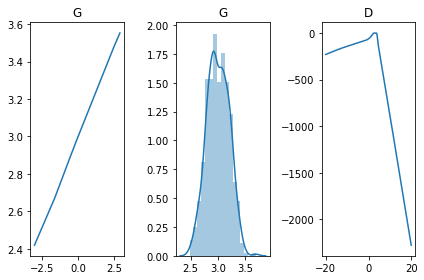

[Epoch 44904/50000] [D loss: -0.044702] [G loss: -0.303138]
[Epoch 44908/50000] [D loss: -0.067407] [G loss: -0.300577]
[Epoch 44912/50000] [D loss: -0.061698] [G loss: -0.307072]
[Epoch 44916/50000] [D loss: -0.068058] [G loss: -0.256677]
[Epoch 44920/50000] [D loss: -0.065190] [G loss: -0.333754]
[Epoch 44924/50000] [D loss: -0.081183] [G loss: -0.373341]
[Epoch 44928/50000] [D loss: -0.078044] [G loss: -0.429035]
[Epoch 44932/50000] [D loss: -0.104252] [G loss: -0.449825]
[Epoch 44936/50000] [D loss: -0.068323] [G loss: -0.422274]
[Epoch 44940/50000] [D loss: -0.071468] [G loss: -0.394149]
[Epoch 44944/50000] [D loss: -0.084648] [G loss: -0.375792]
[Epoch 44948/50000] [D loss: -0.079691] [G loss: -0.328636]
[Epoch 44952/50000] [D loss: -0.086654] [G loss: -0.266148]
[Epoch 44956/50000] [D loss: -0.056975] [G loss: -0.285044]
[Epoch 44960/50000] [D loss: -0.061785] [G loss: -0.263342]
[Epoch 44964/50000] [D loss: -0.093906] [G loss: -0.303735]
[Epoch 44968/50000] [D loss: -0.045024] 

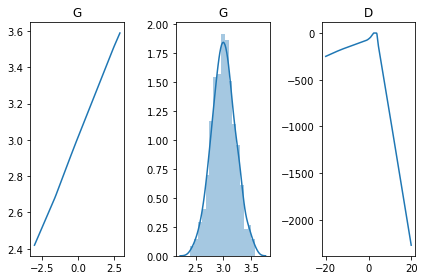

[Epoch 45004/50000] [D loss: -0.069081] [G loss: -0.186399]
[Epoch 45008/50000] [D loss: -0.074359] [G loss: -0.197884]
[Epoch 45012/50000] [D loss: -0.090794] [G loss: -0.268501]
[Epoch 45016/50000] [D loss: -0.048723] [G loss: -0.291732]
[Epoch 45020/50000] [D loss: -0.066180] [G loss: -0.280329]
[Epoch 45024/50000] [D loss: -0.063955] [G loss: -0.255804]
[Epoch 45028/50000] [D loss: -0.062115] [G loss: -0.270539]
[Epoch 45032/50000] [D loss: -0.080521] [G loss: -0.272753]
[Epoch 45036/50000] [D loss: -0.052359] [G loss: -0.276580]
[Epoch 45040/50000] [D loss: -0.052672] [G loss: -0.297112]
[Epoch 45044/50000] [D loss: -0.054625] [G loss: -0.290230]
[Epoch 45048/50000] [D loss: -0.080571] [G loss: -0.290681]
[Epoch 45052/50000] [D loss: -0.068990] [G loss: -0.304671]
[Epoch 45056/50000] [D loss: -0.070483] [G loss: -0.344222]
[Epoch 45060/50000] [D loss: -0.075015] [G loss: -0.356904]
[Epoch 45064/50000] [D loss: -0.082313] [G loss: -0.422026]
[Epoch 45068/50000] [D loss: -0.090275] 

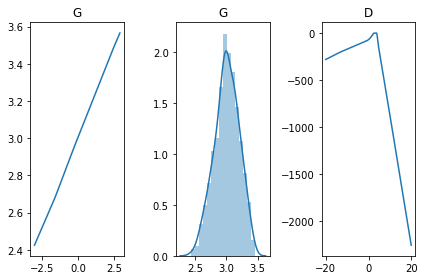

[Epoch 45104/50000] [D loss: -0.059304] [G loss: -0.271996]
[Epoch 45108/50000] [D loss: -0.036786] [G loss: -0.296917]
[Epoch 45112/50000] [D loss: -0.075931] [G loss: -0.292813]
[Epoch 45116/50000] [D loss: -0.051033] [G loss: -0.250427]
[Epoch 45120/50000] [D loss: -0.065429] [G loss: -0.187838]
[Epoch 45124/50000] [D loss: -0.057710] [G loss: -0.115744]
[Epoch 45128/50000] [D loss: -0.049781] [G loss: -0.059360]
[Epoch 45132/50000] [D loss: -0.073981] [G loss: -0.421965]
[Epoch 45136/50000] [D loss: -0.099412] [G loss: -0.434253]
[Epoch 45140/50000] [D loss: -0.073655] [G loss: -0.310118]
[Epoch 45144/50000] [D loss: -0.065138] [G loss: -0.270980]
[Epoch 45148/50000] [D loss: -0.071323] [G loss: -0.254008]
[Epoch 45152/50000] [D loss: -0.083965] [G loss: -0.233419]
[Epoch 45156/50000] [D loss: -0.076737] [G loss: -0.291465]
[Epoch 45160/50000] [D loss: -0.104502] [G loss: -0.259989]
[Epoch 45164/50000] [D loss: -0.072877] [G loss: -0.280261]
[Epoch 45168/50000] [D loss: -0.071684] 

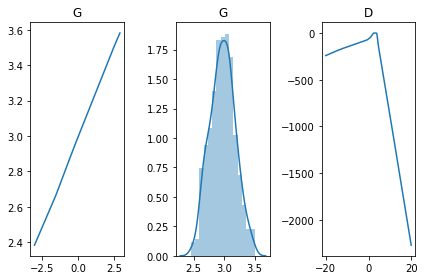

[Epoch 45204/50000] [D loss: -0.087559] [G loss: -0.447335]
[Epoch 45208/50000] [D loss: -0.090229] [G loss: -0.484561]
[Epoch 45212/50000] [D loss: -0.094233] [G loss: -0.511528]
[Epoch 45216/50000] [D loss: -0.102040] [G loss: -0.537658]
[Epoch 45220/50000] [D loss: -0.050525] [G loss: 0.023945]
[Epoch 45224/50000] [D loss: -0.105625] [G loss: 0.486082]
[Epoch 45228/50000] [D loss: -0.081216] [G loss: 0.147044]
[Epoch 45232/50000] [D loss: -0.108694] [G loss: 0.205273]
[Epoch 45236/50000] [D loss: -0.099522] [G loss: 0.187705]
[Epoch 45240/50000] [D loss: -0.056696] [G loss: 0.198469]
[Epoch 45244/50000] [D loss: -0.062258] [G loss: 0.233082]
[Epoch 45248/50000] [D loss: -0.085435] [G loss: 0.265396]
[Epoch 45252/50000] [D loss: -0.085642] [G loss: 0.256538]
[Epoch 45256/50000] [D loss: -0.091394] [G loss: 0.323339]
[Epoch 45260/50000] [D loss: -0.050214] [G loss: 0.211796]
[Epoch 45264/50000] [D loss: -0.065523] [G loss: 0.317167]
[Epoch 45268/50000] [D loss: -0.067889] [G loss: 0.2

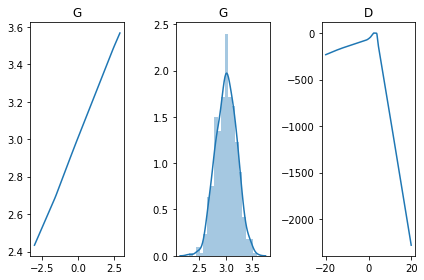

[Epoch 45304/50000] [D loss: -0.048960] [G loss: 0.270850]
[Epoch 45308/50000] [D loss: -0.065293] [G loss: 0.294122]
[Epoch 45312/50000] [D loss: -0.077194] [G loss: 0.300456]
[Epoch 45316/50000] [D loss: -0.077132] [G loss: 0.313417]
[Epoch 45320/50000] [D loss: -0.055086] [G loss: 0.291091]
[Epoch 45324/50000] [D loss: -0.060989] [G loss: 0.246962]
[Epoch 45328/50000] [D loss: -0.062490] [G loss: 0.247569]
[Epoch 45332/50000] [D loss: -0.066776] [G loss: 0.212209]
[Epoch 45336/50000] [D loss: -0.058923] [G loss: 0.161127]
[Epoch 45340/50000] [D loss: -0.053523] [G loss: 0.098616]
[Epoch 45344/50000] [D loss: -0.054940] [G loss: 0.077419]
[Epoch 45348/50000] [D loss: -0.056133] [G loss: 0.159204]
[Epoch 45352/50000] [D loss: -0.061199] [G loss: 0.189182]
[Epoch 45356/50000] [D loss: -0.077037] [G loss: 0.185142]
[Epoch 45360/50000] [D loss: -0.073656] [G loss: 0.299257]
[Epoch 45364/50000] [D loss: -0.098575] [G loss: 0.277506]
[Epoch 45368/50000] [D loss: -0.099969] [G loss: 0.26871

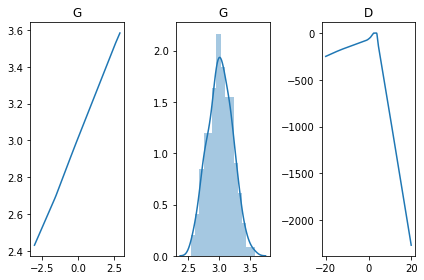

[Epoch 45404/50000] [D loss: -0.090172] [G loss: 0.480167]
[Epoch 45408/50000] [D loss: -0.100193] [G loss: 0.196314]
[Epoch 45412/50000] [D loss: -0.001433] [G loss: 0.074835]
[Epoch 45416/50000] [D loss: -0.013610] [G loss: 0.503214]
[Epoch 45420/50000] [D loss: -0.058810] [G loss: 0.164505]
[Epoch 45424/50000] [D loss: -0.034420] [G loss: 0.390837]
[Epoch 45428/50000] [D loss: -0.017073] [G loss: 0.269861]
[Epoch 45432/50000] [D loss: -0.022126] [G loss: 0.250587]
[Epoch 45436/50000] [D loss: -0.034830] [G loss: 0.425709]
[Epoch 45440/50000] [D loss: -0.019105] [G loss: 0.388756]
[Epoch 45444/50000] [D loss: -0.019900] [G loss: 0.347422]
[Epoch 45448/50000] [D loss: -0.034301] [G loss: 0.309604]
[Epoch 45452/50000] [D loss: -0.031768] [G loss: 0.272077]
[Epoch 45456/50000] [D loss: -0.038078] [G loss: 0.238731]
[Epoch 45460/50000] [D loss: -0.052165] [G loss: 0.180153]
[Epoch 45464/50000] [D loss: -0.051972] [G loss: 0.141672]
[Epoch 45468/50000] [D loss: -0.038255] [G loss: 0.07219

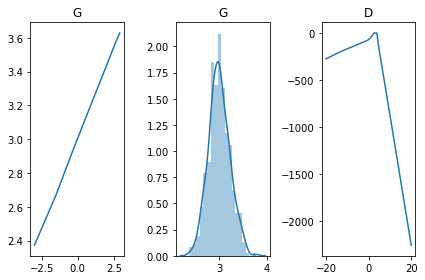

[Epoch 45504/50000] [D loss: -0.024374] [G loss: 0.359804]
[Epoch 45508/50000] [D loss: -0.029420] [G loss: 0.372178]
[Epoch 45512/50000] [D loss: -0.027438] [G loss: 0.337209]
[Epoch 45516/50000] [D loss: -0.040580] [G loss: 0.304921]
[Epoch 45520/50000] [D loss: -0.035028] [G loss: 0.296590]
[Epoch 45524/50000] [D loss: -0.045327] [G loss: 0.347300]
[Epoch 45528/50000] [D loss: -0.055911] [G loss: 0.342426]
[Epoch 45532/50000] [D loss: -0.039862] [G loss: 0.325407]
[Epoch 45536/50000] [D loss: -0.053409] [G loss: 0.351199]
[Epoch 45540/50000] [D loss: -0.084449] [G loss: 0.392124]
[Epoch 45544/50000] [D loss: -0.023448] [G loss: 0.318987]
[Epoch 45548/50000] [D loss: -0.030994] [G loss: 0.387000]
[Epoch 45552/50000] [D loss: -0.027603] [G loss: 0.320950]
[Epoch 45556/50000] [D loss: -0.012234] [G loss: 0.302762]
[Epoch 45560/50000] [D loss: -0.006840] [G loss: 0.283840]
[Epoch 45564/50000] [D loss: -0.038275] [G loss: 0.210942]
[Epoch 45568/50000] [D loss: -0.053018] [G loss: 0.18030

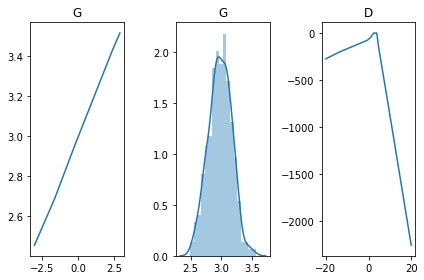

[Epoch 45604/50000] [D loss: -0.086167] [G loss: 0.239104]
[Epoch 45608/50000] [D loss: -0.073776] [G loss: 0.223001]
[Epoch 45612/50000] [D loss: -0.075585] [G loss: 0.232737]
[Epoch 45616/50000] [D loss: -0.092872] [G loss: 0.262501]
[Epoch 45620/50000] [D loss: -0.067511] [G loss: 0.299369]
[Epoch 45624/50000] [D loss: -0.068754] [G loss: 0.266094]
[Epoch 45628/50000] [D loss: -0.063106] [G loss: 0.279491]
[Epoch 45632/50000] [D loss: -0.076318] [G loss: 0.279430]
[Epoch 45636/50000] [D loss: -0.071510] [G loss: 0.244240]
[Epoch 45640/50000] [D loss: -0.057461] [G loss: 0.236880]
[Epoch 45644/50000] [D loss: -0.069154] [G loss: 0.380140]
[Epoch 45648/50000] [D loss: -0.067983] [G loss: 0.396609]
[Epoch 45652/50000] [D loss: -0.094665] [G loss: 0.475666]
[Epoch 45656/50000] [D loss: -0.099018] [G loss: 0.520405]
[Epoch 45660/50000] [D loss: -0.099364] [G loss: 0.542141]
[Epoch 45664/50000] [D loss: -0.081461] [G loss: -0.518413]
[Epoch 45668/50000] [D loss: -0.056339] [G loss: -0.006

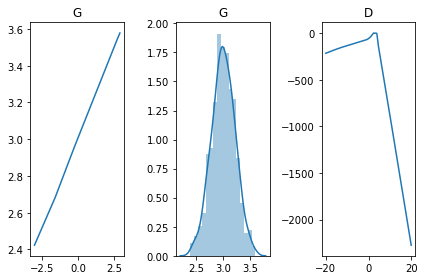

[Epoch 45704/50000] [D loss: -0.063392] [G loss: 0.156605]
[Epoch 45708/50000] [D loss: -0.064379] [G loss: 0.104153]
[Epoch 45712/50000] [D loss: -0.059752] [G loss: 0.176791]
[Epoch 45716/50000] [D loss: -0.090429] [G loss: 0.229894]
[Epoch 45720/50000] [D loss: -0.054041] [G loss: 0.211836]
[Epoch 45724/50000] [D loss: -0.064604] [G loss: 0.266365]
[Epoch 45728/50000] [D loss: -0.046531] [G loss: 0.237956]
[Epoch 45732/50000] [D loss: -0.083701] [G loss: 0.255771]
[Epoch 45736/50000] [D loss: -0.049754] [G loss: 0.188445]
[Epoch 45740/50000] [D loss: -0.061855] [G loss: 0.178892]
[Epoch 45744/50000] [D loss: -0.045323] [G loss: 0.104243]
[Epoch 45748/50000] [D loss: -0.051347] [G loss: 0.086451]
[Epoch 45752/50000] [D loss: -0.056559] [G loss: 0.191655]
[Epoch 45756/50000] [D loss: -0.064874] [G loss: 0.261286]
[Epoch 45760/50000] [D loss: -0.066850] [G loss: 0.252903]
[Epoch 45764/50000] [D loss: -0.064351] [G loss: 0.221611]
[Epoch 45768/50000] [D loss: -0.073765] [G loss: 0.27284

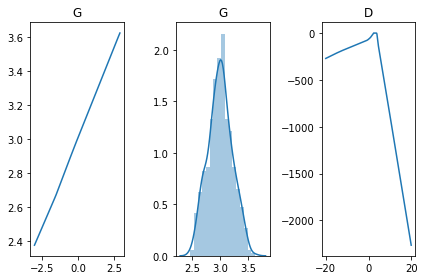

[Epoch 45804/50000] [D loss: -0.082677] [G loss: 0.311673]
[Epoch 45808/50000] [D loss: -0.070921] [G loss: 0.321075]
[Epoch 45812/50000] [D loss: -0.075865] [G loss: 0.299082]
[Epoch 45816/50000] [D loss: -0.101515] [G loss: 0.320059]
[Epoch 45820/50000] [D loss: -0.095199] [G loss: 0.323601]
[Epoch 45824/50000] [D loss: -0.089362] [G loss: 0.299211]
[Epoch 45828/50000] [D loss: -0.030689] [G loss: 0.196628]
[Epoch 45832/50000] [D loss: -0.036671] [G loss: 0.178618]
[Epoch 45836/50000] [D loss: -0.056578] [G loss: 0.183738]
[Epoch 45840/50000] [D loss: -0.055747] [G loss: 0.108524]
[Epoch 45844/50000] [D loss: -0.026543] [G loss: 0.096326]
[Epoch 45848/50000] [D loss: -0.043566] [G loss: 0.079948]
[Epoch 45852/50000] [D loss: -0.030031] [G loss: 0.084774]
[Epoch 45856/50000] [D loss: -0.050854] [G loss: 0.090029]
[Epoch 45860/50000] [D loss: -0.040945] [G loss: 0.064959]
[Epoch 45864/50000] [D loss: -0.021726] [G loss: 0.029647]
[Epoch 45868/50000] [D loss: -0.064725] [G loss: -0.4549

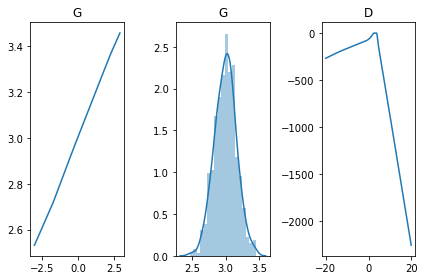

[Epoch 45904/50000] [D loss: -0.087130] [G loss: -0.251952]
[Epoch 45908/50000] [D loss: -0.064797] [G loss: -0.206164]
[Epoch 45912/50000] [D loss: -0.077850] [G loss: -0.146027]
[Epoch 45916/50000] [D loss: -0.068632] [G loss: -0.150038]
[Epoch 45920/50000] [D loss: -0.072049] [G loss: -0.075226]
[Epoch 45924/50000] [D loss: -0.069995] [G loss: -0.077674]
[Epoch 45928/50000] [D loss: -0.074580] [G loss: -0.029455]
[Epoch 45932/50000] [D loss: -0.032043] [G loss: -0.788000]
[Epoch 45936/50000] [D loss: -0.062496] [G loss: 0.124220]
[Epoch 45940/50000] [D loss: -0.076740] [G loss: 0.053850]
[Epoch 45944/50000] [D loss: -0.049651] [G loss: 0.537220]
[Epoch 45948/50000] [D loss: -0.073585] [G loss: -0.121909]
[Epoch 45952/50000] [D loss: -0.109827] [G loss: -0.131868]
[Epoch 45956/50000] [D loss: -0.128132] [G loss: -0.240054]
[Epoch 45960/50000] [D loss: -0.085766] [G loss: -0.345628]
[Epoch 45964/50000] [D loss: -0.107931] [G loss: -0.246036]
[Epoch 45968/50000] [D loss: -0.118586] [G 

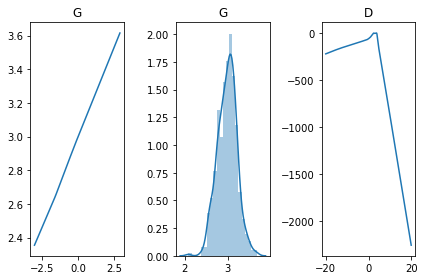

[Epoch 46004/50000] [D loss: -0.055756] [G loss: -0.317251]
[Epoch 46008/50000] [D loss: -0.014024] [G loss: -0.330756]
[Epoch 46012/50000] [D loss: -0.059110] [G loss: -0.373173]
[Epoch 46016/50000] [D loss: -0.030146] [G loss: -0.411579]
[Epoch 46020/50000] [D loss: -0.035216] [G loss: -0.439537]
[Epoch 46024/50000] [D loss: -0.011714] [G loss: -0.516250]
[Epoch 46028/50000] [D loss: 0.011995] [G loss: -0.552416]
[Epoch 46032/50000] [D loss: -0.064671] [G loss: -0.488985]
[Epoch 46036/50000] [D loss: -0.037877] [G loss: -0.493081]
[Epoch 46040/50000] [D loss: -0.058294] [G loss: -0.465059]
[Epoch 46044/50000] [D loss: -0.105628] [G loss: -0.416460]
[Epoch 46048/50000] [D loss: -0.136717] [G loss: -0.304489]
[Epoch 46052/50000] [D loss: -0.092170] [G loss: -0.305582]
[Epoch 46056/50000] [D loss: -0.139387] [G loss: -0.201944]
[Epoch 46060/50000] [D loss: -0.114801] [G loss: -0.167501]
[Epoch 46064/50000] [D loss: -0.119489] [G loss: -0.237761]
[Epoch 46068/50000] [D loss: -0.114678] [

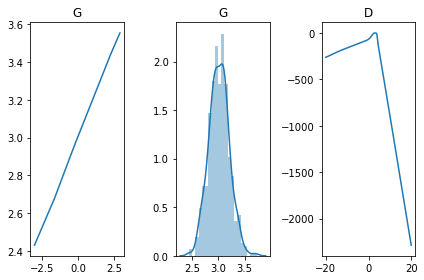

[Epoch 46104/50000] [D loss: -0.072233] [G loss: -0.407317]
[Epoch 46108/50000] [D loss: -0.027130] [G loss: -0.423999]
[Epoch 46112/50000] [D loss: -0.106762] [G loss: -0.425964]
[Epoch 46116/50000] [D loss: -0.066490] [G loss: -0.425684]
[Epoch 46120/50000] [D loss: -0.059259] [G loss: -0.425658]
[Epoch 46124/50000] [D loss: -0.066757] [G loss: -0.433820]
[Epoch 46128/50000] [D loss: -0.068296] [G loss: -0.425337]
[Epoch 46132/50000] [D loss: -0.052538] [G loss: -0.441987]
[Epoch 46136/50000] [D loss: -0.061690] [G loss: -0.479414]
[Epoch 46140/50000] [D loss: -0.065301] [G loss: -0.517466]
[Epoch 46144/50000] [D loss: -0.067125] [G loss: -0.460866]
[Epoch 46148/50000] [D loss: -0.061939] [G loss: -0.411643]
[Epoch 46152/50000] [D loss: -0.076101] [G loss: -0.416529]
[Epoch 46156/50000] [D loss: -0.079620] [G loss: -0.347989]
[Epoch 46160/50000] [D loss: -0.073409] [G loss: -0.239224]
[Epoch 46164/50000] [D loss: -0.059244] [G loss: -0.259268]
[Epoch 46168/50000] [D loss: -0.065882] 

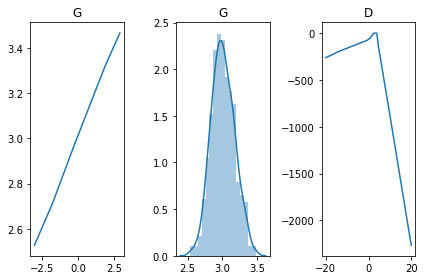

[Epoch 46204/50000] [D loss: -0.073114] [G loss: -0.076108]
[Epoch 46208/50000] [D loss: -0.071445] [G loss: 0.000201]
[Epoch 46212/50000] [D loss: -0.057441] [G loss: 0.174882]
[Epoch 46216/50000] [D loss: -0.042760] [G loss: 0.292974]
[Epoch 46220/50000] [D loss: -0.063711] [G loss: 0.424748]
[Epoch 46224/50000] [D loss: -0.052324] [G loss: 0.460829]
[Epoch 46228/50000] [D loss: -0.055543] [G loss: 0.412758]
[Epoch 46232/50000] [D loss: -0.079982] [G loss: 0.410094]
[Epoch 46236/50000] [D loss: -0.061636] [G loss: 0.287152]
[Epoch 46240/50000] [D loss: -0.020005] [G loss: 0.299239]
[Epoch 46244/50000] [D loss: -0.052826] [G loss: 0.122442]
[Epoch 46248/50000] [D loss: -0.139562] [G loss: -0.248003]
[Epoch 46252/50000] [D loss: -0.040499] [G loss: -0.212598]
[Epoch 46256/50000] [D loss: -0.071949] [G loss: -0.258800]
[Epoch 46260/50000] [D loss: -0.045189] [G loss: -0.289372]
[Epoch 46264/50000] [D loss: -0.085446] [G loss: -0.307269]
[Epoch 46268/50000] [D loss: -0.039598] [G loss: -

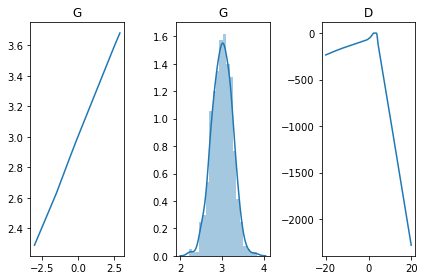

[Epoch 46304/50000] [D loss: -0.067517] [G loss: -0.376602]
[Epoch 46308/50000] [D loss: -0.064207] [G loss: -0.381415]
[Epoch 46312/50000] [D loss: -0.093786] [G loss: -0.386392]
[Epoch 46316/50000] [D loss: -0.112128] [G loss: -0.430327]
[Epoch 46320/50000] [D loss: -0.116840] [G loss: -0.458973]
[Epoch 46324/50000] [D loss: -0.107020] [G loss: -0.424226]
[Epoch 46328/50000] [D loss: -0.101993] [G loss: -0.418166]
[Epoch 46332/50000] [D loss: -0.099602] [G loss: -0.406459]
[Epoch 46336/50000] [D loss: -0.120436] [G loss: -0.378408]
[Epoch 46340/50000] [D loss: -0.115335] [G loss: -0.254829]
[Epoch 46344/50000] [D loss: -0.079409] [G loss: -0.308857]
[Epoch 46348/50000] [D loss: -0.066074] [G loss: -0.267749]
[Epoch 46352/50000] [D loss: -0.083817] [G loss: -0.378480]
[Epoch 46356/50000] [D loss: -0.104091] [G loss: -0.204014]
[Epoch 46360/50000] [D loss: -0.082125] [G loss: -0.298385]
[Epoch 46364/50000] [D loss: -0.063915] [G loss: -0.211116]
[Epoch 46368/50000] [D loss: -0.101464] 

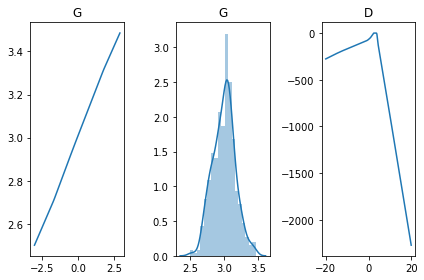

[Epoch 46404/50000] [D loss: -0.049234] [G loss: -0.249884]
[Epoch 46408/50000] [D loss: -0.046107] [G loss: -0.187032]
[Epoch 46412/50000] [D loss: -0.036900] [G loss: -0.102533]
[Epoch 46416/50000] [D loss: -0.041707] [G loss: -0.028675]
[Epoch 46420/50000] [D loss: -0.084066] [G loss: -0.468176]
[Epoch 46424/50000] [D loss: -0.095372] [G loss: -0.419519]
[Epoch 46428/50000] [D loss: -0.096577] [G loss: -0.322867]
[Epoch 46432/50000] [D loss: -0.072723] [G loss: -0.250944]
[Epoch 46436/50000] [D loss: -0.071247] [G loss: -0.188724]
[Epoch 46440/50000] [D loss: -0.076748] [G loss: -0.177163]
[Epoch 46444/50000] [D loss: -0.065664] [G loss: -0.287669]
[Epoch 46448/50000] [D loss: -0.078207] [G loss: -0.255956]
[Epoch 46452/50000] [D loss: -0.081679] [G loss: -0.315796]
[Epoch 46456/50000] [D loss: -0.081908] [G loss: -0.226817]
[Epoch 46460/50000] [D loss: -0.070256] [G loss: -0.275895]
[Epoch 46464/50000] [D loss: -0.093687] [G loss: -0.264437]
[Epoch 46468/50000] [D loss: -0.093774] 

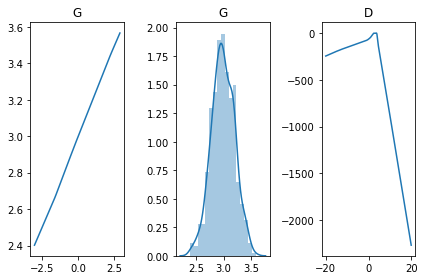

[Epoch 46504/50000] [D loss: -0.084884] [G loss: -0.318836]
[Epoch 46508/50000] [D loss: -0.073336] [G loss: -0.320264]
[Epoch 46512/50000] [D loss: -0.060794] [G loss: -0.339640]
[Epoch 46516/50000] [D loss: -0.068420] [G loss: -0.375131]
[Epoch 46520/50000] [D loss: -0.066955] [G loss: -0.451858]
[Epoch 46524/50000] [D loss: -0.073887] [G loss: -0.408176]
[Epoch 46528/50000] [D loss: -0.045876] [G loss: -0.409021]
[Epoch 46532/50000] [D loss: -0.080783] [G loss: -0.346246]
[Epoch 46536/50000] [D loss: -0.059040] [G loss: -0.444310]
[Epoch 46540/50000] [D loss: -0.045124] [G loss: -0.385261]
[Epoch 46544/50000] [D loss: -0.038945] [G loss: -0.367852]
[Epoch 46548/50000] [D loss: -0.063175] [G loss: -0.278618]
[Epoch 46552/50000] [D loss: -0.072072] [G loss: -0.149712]
[Epoch 46556/50000] [D loss: -0.066900] [G loss: -0.109969]
[Epoch 46560/50000] [D loss: -0.083900] [G loss: -0.166580]
[Epoch 46564/50000] [D loss: -0.053146] [G loss: -0.207691]
[Epoch 46568/50000] [D loss: -0.090304] 

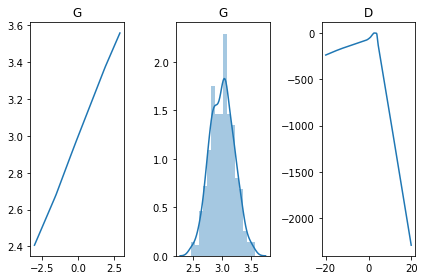

[Epoch 46604/50000] [D loss: -0.076583] [G loss: -0.376806]
[Epoch 46608/50000] [D loss: -0.089084] [G loss: -0.460442]
[Epoch 46612/50000] [D loss: -0.094158] [G loss: -0.527369]
[Epoch 46616/50000] [D loss: -0.056635] [G loss: -0.019707]
[Epoch 46620/50000] [D loss: -0.011996] [G loss: -0.583815]
[Epoch 46624/50000] [D loss: -0.032424] [G loss: -0.017717]
[Epoch 46628/50000] [D loss: -0.076951] [G loss: -0.248538]
[Epoch 46632/50000] [D loss: -0.084469] [G loss: -0.328624]
[Epoch 46636/50000] [D loss: -0.075369] [G loss: -0.269074]
[Epoch 46640/50000] [D loss: -0.081199] [G loss: -0.264745]
[Epoch 46644/50000] [D loss: -0.070124] [G loss: -0.214780]
[Epoch 46648/50000] [D loss: -0.078003] [G loss: -0.272136]
[Epoch 46652/50000] [D loss: -0.066296] [G loss: -0.203300]
[Epoch 46656/50000] [D loss: -0.077815] [G loss: -0.308998]
[Epoch 46660/50000] [D loss: -0.061562] [G loss: -0.252816]
[Epoch 46664/50000] [D loss: -0.070309] [G loss: -0.275746]
[Epoch 46668/50000] [D loss: -0.076496] 

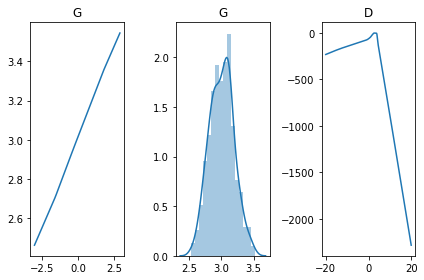

[Epoch 46704/50000] [D loss: -0.085283] [G loss: 0.228475]
[Epoch 46708/50000] [D loss: -0.094464] [G loss: 0.127748]
[Epoch 46712/50000] [D loss: -0.086881] [G loss: 0.126237]
[Epoch 46716/50000] [D loss: -0.096644] [G loss: 0.215452]
[Epoch 46720/50000] [D loss: -0.076598] [G loss: 0.078146]
[Epoch 46724/50000] [D loss: -0.050536] [G loss: 0.165851]
[Epoch 46728/50000] [D loss: -0.083789] [G loss: 0.257132]
[Epoch 46732/50000] [D loss: -0.100011] [G loss: 0.300791]
[Epoch 46736/50000] [D loss: -0.086847] [G loss: 0.289809]
[Epoch 46740/50000] [D loss: -0.071137] [G loss: 0.260327]
[Epoch 46744/50000] [D loss: -0.086916] [G loss: 0.254160]
[Epoch 46748/50000] [D loss: -0.063155] [G loss: 0.266203]
[Epoch 46752/50000] [D loss: -0.068707] [G loss: 0.274591]
[Epoch 46756/50000] [D loss: -0.072657] [G loss: 0.213397]
[Epoch 46760/50000] [D loss: -0.049193] [G loss: 0.182922]
[Epoch 46764/50000] [D loss: -0.053661] [G loss: 0.186163]
[Epoch 46768/50000] [D loss: -0.058928] [G loss: 0.16701

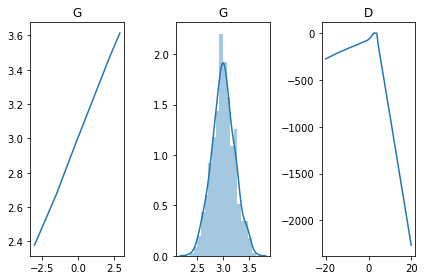

[Epoch 46804/50000] [D loss: -0.079247] [G loss: 0.247206]
[Epoch 46808/50000] [D loss: -0.074028] [G loss: 0.221489]
[Epoch 46812/50000] [D loss: -0.062439] [G loss: 0.274387]
[Epoch 46816/50000] [D loss: -0.056304] [G loss: 0.281309]
[Epoch 46820/50000] [D loss: -0.084846] [G loss: 0.325058]
[Epoch 46824/50000] [D loss: -0.078359] [G loss: 0.350821]
[Epoch 46828/50000] [D loss: -0.077128] [G loss: 0.356381]
[Epoch 46832/50000] [D loss: -0.099995] [G loss: 0.406835]
[Epoch 46836/50000] [D loss: -0.107465] [G loss: 0.389793]
[Epoch 46840/50000] [D loss: -0.100143] [G loss: 0.321331]
[Epoch 46844/50000] [D loss: -0.086093] [G loss: 0.325174]
[Epoch 46848/50000] [D loss: -0.109060] [G loss: 0.291618]
[Epoch 46852/50000] [D loss: -0.091900] [G loss: 0.296224]
[Epoch 46856/50000] [D loss: -0.057734] [G loss: 0.255748]
[Epoch 46860/50000] [D loss: -0.073023] [G loss: 0.284797]
[Epoch 46864/50000] [D loss: -0.029375] [G loss: 0.226343]
[Epoch 46868/50000] [D loss: -0.051313] [G loss: 0.31236

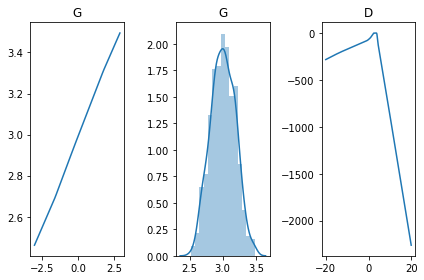

[Epoch 46904/50000] [D loss: -0.072015] [G loss: 0.209689]
[Epoch 46908/50000] [D loss: -0.069790] [G loss: 0.236955]
[Epoch 46912/50000] [D loss: -0.063709] [G loss: 0.284341]
[Epoch 46916/50000] [D loss: -0.093635] [G loss: 0.269618]
[Epoch 46920/50000] [D loss: -0.078161] [G loss: 0.256086]
[Epoch 46924/50000] [D loss: -0.088058] [G loss: 0.288426]
[Epoch 46928/50000] [D loss: -0.052873] [G loss: 0.237439]
[Epoch 46932/50000] [D loss: -0.101067] [G loss: 0.279047]
[Epoch 46936/50000] [D loss: -0.073476] [G loss: 0.284713]
[Epoch 46940/50000] [D loss: -0.074299] [G loss: 0.277209]
[Epoch 46944/50000] [D loss: -0.087830] [G loss: 0.320055]
[Epoch 46948/50000] [D loss: -0.084765] [G loss: 0.400701]
[Epoch 46952/50000] [D loss: -0.107123] [G loss: 0.471917]
[Epoch 46956/50000] [D loss: -0.090340] [G loss: 0.507926]
[Epoch 46960/50000] [D loss: -0.079759] [G loss: -0.857388]
[Epoch 46964/50000] [D loss: -0.087275] [G loss: -0.599806]
[Epoch 46968/50000] [D loss: -0.048052] [G loss: -0.52

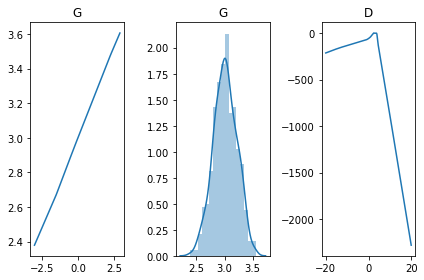

[Epoch 47004/50000] [D loss: -0.067627] [G loss: -0.279387]
[Epoch 47008/50000] [D loss: -0.079460] [G loss: -0.299674]
[Epoch 47012/50000] [D loss: -0.043081] [G loss: -0.336071]
[Epoch 47016/50000] [D loss: -0.061847] [G loss: -0.323167]
[Epoch 47020/50000] [D loss: -0.076383] [G loss: -0.419017]
[Epoch 47024/50000] [D loss: -0.075783] [G loss: -0.487462]
[Epoch 47028/50000] [D loss: -0.063575] [G loss: -0.393945]
[Epoch 47032/50000] [D loss: -0.090325] [G loss: -0.349251]
[Epoch 47036/50000] [D loss: -0.062710] [G loss: -0.330436]
[Epoch 47040/50000] [D loss: -0.090986] [G loss: -0.317206]
[Epoch 47044/50000] [D loss: -0.091417] [G loss: -0.293680]
[Epoch 47048/50000] [D loss: -0.062746] [G loss: -0.322292]
[Epoch 47052/50000] [D loss: -0.097366] [G loss: -0.279247]
[Epoch 47056/50000] [D loss: -0.096058] [G loss: -0.334355]
[Epoch 47060/50000] [D loss: -0.086584] [G loss: -0.327129]
[Epoch 47064/50000] [D loss: -0.080870] [G loss: -0.282805]
[Epoch 47068/50000] [D loss: -0.084096] 

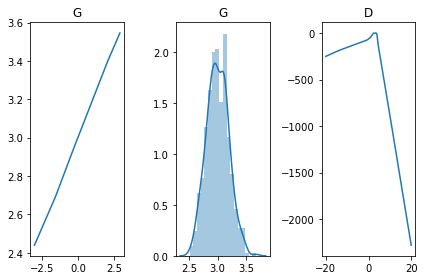

[Epoch 47104/50000] [D loss: -0.061847] [G loss: -0.287534]
[Epoch 47108/50000] [D loss: -0.063005] [G loss: -0.305036]
[Epoch 47112/50000] [D loss: -0.048403] [G loss: -0.312391]
[Epoch 47116/50000] [D loss: -0.076412] [G loss: -0.289422]
[Epoch 47120/50000] [D loss: -0.054016] [G loss: -0.270822]
[Epoch 47124/50000] [D loss: -0.069101] [G loss: -0.301334]
[Epoch 47128/50000] [D loss: -0.062683] [G loss: -0.344720]
[Epoch 47132/50000] [D loss: -0.063973] [G loss: -0.357220]
[Epoch 47136/50000] [D loss: -0.068207] [G loss: -0.335654]
[Epoch 47140/50000] [D loss: -0.071366] [G loss: -0.299622]
[Epoch 47144/50000] [D loss: -0.077153] [G loss: -0.341586]
[Epoch 47148/50000] [D loss: -0.081307] [G loss: -0.279334]
[Epoch 47152/50000] [D loss: -0.080195] [G loss: -0.216653]
[Epoch 47156/50000] [D loss: -0.074772] [G loss: -0.276116]
[Epoch 47160/50000] [D loss: -0.069053] [G loss: -0.277130]
[Epoch 47164/50000] [D loss: -0.070584] [G loss: -0.254657]
[Epoch 47168/50000] [D loss: -0.069248] 

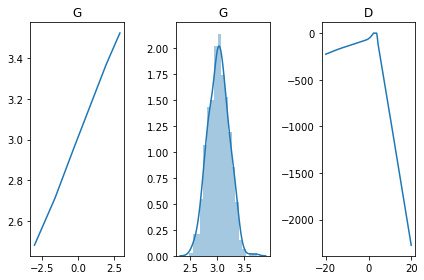

[Epoch 47204/50000] [D loss: -0.082664] [G loss: -0.263907]
[Epoch 47208/50000] [D loss: -0.097063] [G loss: -0.266348]
[Epoch 47212/50000] [D loss: -0.065765] [G loss: -0.269604]
[Epoch 47216/50000] [D loss: -0.082820] [G loss: -0.251945]
[Epoch 47220/50000] [D loss: -0.068839] [G loss: -0.255083]
[Epoch 47224/50000] [D loss: -0.043737] [G loss: -0.311024]
[Epoch 47228/50000] [D loss: -0.093837] [G loss: -0.247450]
[Epoch 47232/50000] [D loss: -0.048141] [G loss: -0.264878]
[Epoch 47236/50000] [D loss: -0.092139] [G loss: -0.288667]
[Epoch 47240/50000] [D loss: -0.060631] [G loss: -0.283923]
[Epoch 47244/50000] [D loss: -0.054049] [G loss: -0.258945]
[Epoch 47248/50000] [D loss: -0.062465] [G loss: -0.301750]
[Epoch 47252/50000] [D loss: -0.068476] [G loss: -0.279092]
[Epoch 47256/50000] [D loss: -0.064886] [G loss: -0.306492]
[Epoch 47260/50000] [D loss: -0.097576] [G loss: -0.303769]
[Epoch 47264/50000] [D loss: -0.044861] [G loss: -0.384380]
[Epoch 47268/50000] [D loss: -0.115347] 

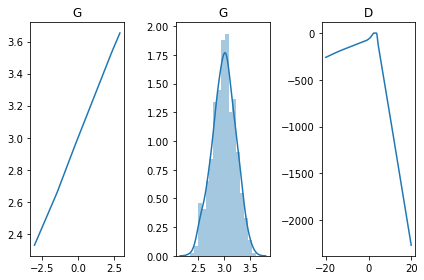

[Epoch 47304/50000] [D loss: -0.115501] [G loss: -0.378296]
[Epoch 47308/50000] [D loss: -0.088277] [G loss: -0.345474]
[Epoch 47312/50000] [D loss: -0.074523] [G loss: -0.269306]
[Epoch 47316/50000] [D loss: -0.077329] [G loss: -0.248394]
[Epoch 47320/50000] [D loss: -0.097801] [G loss: -0.321091]
[Epoch 47324/50000] [D loss: -0.070897] [G loss: -0.292547]
[Epoch 47328/50000] [D loss: -0.083183] [G loss: -0.285423]
[Epoch 47332/50000] [D loss: -0.082668] [G loss: -0.360370]
[Epoch 47336/50000] [D loss: -0.086410] [G loss: -0.357126]
[Epoch 47340/50000] [D loss: -0.087613] [G loss: -0.339794]
[Epoch 47344/50000] [D loss: -0.089400] [G loss: -0.332238]
[Epoch 47348/50000] [D loss: -0.100309] [G loss: -0.334920]
[Epoch 47352/50000] [D loss: -0.088913] [G loss: -0.342974]
[Epoch 47356/50000] [D loss: -0.073692] [G loss: -0.375931]
[Epoch 47360/50000] [D loss: -0.080677] [G loss: -0.329506]
[Epoch 47364/50000] [D loss: -0.047279] [G loss: -0.328677]
[Epoch 47368/50000] [D loss: -0.061204] 

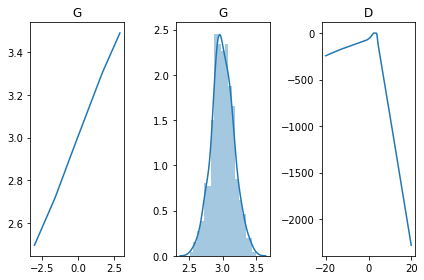

[Epoch 47404/50000] [D loss: -0.044769] [G loss: -0.137573]
[Epoch 47408/50000] [D loss: -0.058642] [G loss: -0.138517]
[Epoch 47412/50000] [D loss: -0.041356] [G loss: -0.089889]
[Epoch 47416/50000] [D loss: -0.061798] [G loss: -0.081950]
[Epoch 47420/50000] [D loss: -0.069454] [G loss: -0.215281]
[Epoch 47424/50000] [D loss: -0.057826] [G loss: -0.197584]
[Epoch 47428/50000] [D loss: -0.050019] [G loss: -0.156113]
[Epoch 47432/50000] [D loss: -0.063155] [G loss: -0.151359]
[Epoch 47436/50000] [D loss: -0.065178] [G loss: -0.144233]
[Epoch 47440/50000] [D loss: -0.065928] [G loss: -0.087786]
[Epoch 47444/50000] [D loss: -0.075650] [G loss: -0.439832]
[Epoch 47448/50000] [D loss: -0.103375] [G loss: -0.516076]
[Epoch 47452/50000] [D loss: -0.123032] [G loss: -0.466217]
[Epoch 47456/50000] [D loss: -0.103881] [G loss: -0.394325]
[Epoch 47460/50000] [D loss: -0.079177] [G loss: -0.307755]
[Epoch 47464/50000] [D loss: -0.099090] [G loss: -0.212380]
[Epoch 47468/50000] [D loss: -0.086461] 

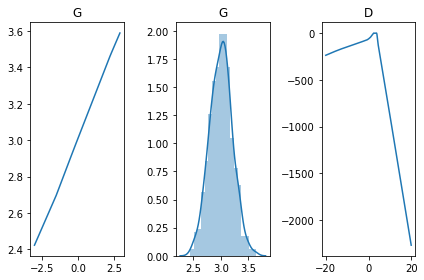

[Epoch 47504/50000] [D loss: -0.066921] [G loss: -0.255114]
[Epoch 47508/50000] [D loss: -0.050942] [G loss: -0.292518]
[Epoch 47512/50000] [D loss: -0.054192] [G loss: -0.250524]
[Epoch 47516/50000] [D loss: -0.060043] [G loss: -0.270967]
[Epoch 47520/50000] [D loss: -0.083982] [G loss: -0.247491]
[Epoch 47524/50000] [D loss: -0.086001] [G loss: -0.249767]
[Epoch 47528/50000] [D loss: -0.074194] [G loss: -0.214542]
[Epoch 47532/50000] [D loss: -0.083344] [G loss: 0.018786]
[Epoch 47536/50000] [D loss: -0.078147] [G loss: 0.191486]
[Epoch 47540/50000] [D loss: -0.054604] [G loss: 0.251727]
[Epoch 47544/50000] [D loss: -0.060454] [G loss: 0.258545]
[Epoch 47548/50000] [D loss: -0.048466] [G loss: 0.219720]
[Epoch 47552/50000] [D loss: -0.057814] [G loss: 0.263094]
[Epoch 47556/50000] [D loss: -0.048284] [G loss: 0.272553]
[Epoch 47560/50000] [D loss: -0.087648] [G loss: 0.316405]
[Epoch 47564/50000] [D loss: -0.090207] [G loss: 0.300500]
[Epoch 47568/50000] [D loss: -0.102294] [G loss: 

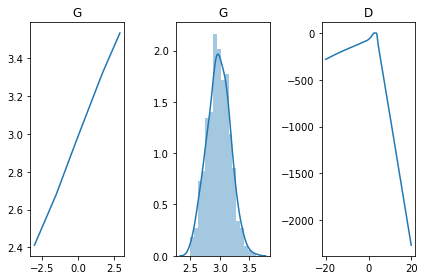

[Epoch 47604/50000] [D loss: -0.097983] [G loss: 0.126340]
[Epoch 47608/50000] [D loss: -0.070229] [G loss: -0.047806]
[Epoch 47612/50000] [D loss: -0.120262] [G loss: -0.037485]
[Epoch 47616/50000] [D loss: -0.093633] [G loss: -0.028781]
[Epoch 47620/50000] [D loss: -0.049854] [G loss: -0.006758]
[Epoch 47624/50000] [D loss: -0.054676] [G loss: -0.106874]
[Epoch 47628/50000] [D loss: -0.065392] [G loss: -0.294887]
[Epoch 47632/50000] [D loss: -0.099437] [G loss: -0.250600]
[Epoch 47636/50000] [D loss: -0.061730] [G loss: -0.252551]
[Epoch 47640/50000] [D loss: -0.064883] [G loss: -0.267303]
[Epoch 47644/50000] [D loss: -0.049757] [G loss: -0.242588]
[Epoch 47648/50000] [D loss: -0.063755] [G loss: -0.193099]
[Epoch 47652/50000] [D loss: -0.053739] [G loss: -0.161523]
[Epoch 47656/50000] [D loss: -0.050491] [G loss: -0.125463]
[Epoch 47660/50000] [D loss: -0.053766] [G loss: -0.115159]
[Epoch 47664/50000] [D loss: -0.051051] [G loss: -0.057943]
[Epoch 47668/50000] [D loss: -0.078188] [

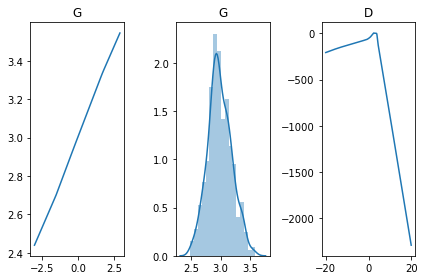

[Epoch 47704/50000] [D loss: -0.096004] [G loss: 0.061531]
[Epoch 47708/50000] [D loss: -0.088615] [G loss: 0.059055]
[Epoch 47712/50000] [D loss: -0.084357] [G loss: 0.300198]
[Epoch 47716/50000] [D loss: -0.059515] [G loss: 0.271213]
[Epoch 47720/50000] [D loss: -0.066594] [G loss: 0.275814]
[Epoch 47724/50000] [D loss: -0.051234] [G loss: 0.250526]
[Epoch 47728/50000] [D loss: -0.064371] [G loss: 0.255907]
[Epoch 47732/50000] [D loss: -0.065919] [G loss: 0.247696]
[Epoch 47736/50000] [D loss: -0.058358] [G loss: 0.166532]
[Epoch 47740/50000] [D loss: -0.047485] [G loss: 0.104686]
[Epoch 47744/50000] [D loss: -0.055183] [G loss: 0.081626]
[Epoch 47748/50000] [D loss: -0.060716] [G loss: 0.100114]
[Epoch 47752/50000] [D loss: -0.069277] [G loss: 0.122382]
[Epoch 47756/50000] [D loss: -0.054607] [G loss: 0.229928]
[Epoch 47760/50000] [D loss: -0.076581] [G loss: 0.263903]
[Epoch 47764/50000] [D loss: -0.081698] [G loss: 0.251543]
[Epoch 47768/50000] [D loss: -0.053536] [G loss: 0.26723

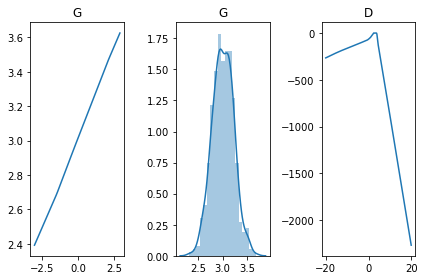

[Epoch 47804/50000] [D loss: -0.072456] [G loss: 0.293470]
[Epoch 47808/50000] [D loss: -0.070076] [G loss: 0.353910]
[Epoch 47812/50000] [D loss: -0.079948] [G loss: 0.408354]
[Epoch 47816/50000] [D loss: -0.084749] [G loss: 0.419683]
[Epoch 47820/50000] [D loss: -0.086623] [G loss: 0.430763]
[Epoch 47824/50000] [D loss: -0.093602] [G loss: 0.274786]
[Epoch 47828/50000] [D loss: -0.119137] [G loss: 0.334037]
[Epoch 47832/50000] [D loss: -0.093375] [G loss: 0.391862]
[Epoch 47836/50000] [D loss: -0.062105] [G loss: 0.283159]
[Epoch 47840/50000] [D loss: -0.123480] [G loss: 0.287977]
[Epoch 47844/50000] [D loss: -0.064427] [G loss: -0.007448]
[Epoch 47848/50000] [D loss: -0.078932] [G loss: -0.222274]
[Epoch 47852/50000] [D loss: -0.032478] [G loss: -0.270046]
[Epoch 47856/50000] [D loss: -0.099415] [G loss: -0.249805]
[Epoch 47860/50000] [D loss: -0.049107] [G loss: -0.287559]
[Epoch 47864/50000] [D loss: -0.060988] [G loss: -0.321222]
[Epoch 47868/50000] [D loss: -0.071116] [G loss: -

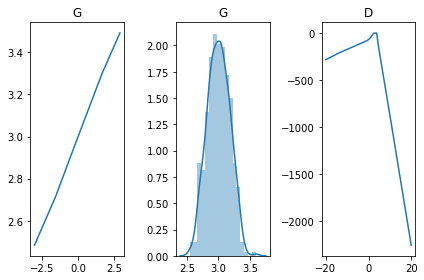

[Epoch 47904/50000] [D loss: -0.103611] [G loss: -0.202239]
[Epoch 47908/50000] [D loss: -0.076879] [G loss: -0.181697]
[Epoch 47912/50000] [D loss: -0.088618] [G loss: -0.206135]
[Epoch 47916/50000] [D loss: -0.069064] [G loss: -0.244962]
[Epoch 47920/50000] [D loss: -0.057591] [G loss: -0.316635]
[Epoch 47924/50000] [D loss: -0.056947] [G loss: -0.313474]
[Epoch 47928/50000] [D loss: -0.065630] [G loss: -0.242128]
[Epoch 47932/50000] [D loss: -0.078611] [G loss: -0.183263]
[Epoch 47936/50000] [D loss: -0.057374] [G loss: -0.144921]
[Epoch 47940/50000] [D loss: -0.035023] [G loss: -0.089238]
[Epoch 47944/50000] [D loss: -0.056896] [G loss: -0.043145]
[Epoch 47948/50000] [D loss: -0.054530] [G loss: 0.055367]
[Epoch 47952/50000] [D loss: -0.104155] [G loss: -0.114331]
[Epoch 47956/50000] [D loss: -0.087367] [G loss: -0.207405]
[Epoch 47960/50000] [D loss: -0.078114] [G loss: -0.141872]
[Epoch 47964/50000] [D loss: -0.080398] [G loss: -0.143296]
[Epoch 47968/50000] [D loss: -0.088844] [

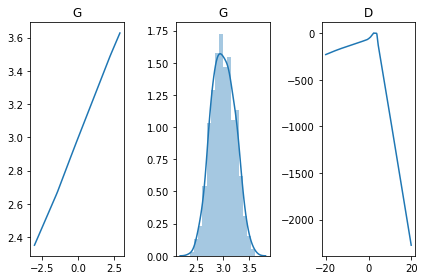

[Epoch 48004/50000] [D loss: -0.062553] [G loss: 0.230805]
[Epoch 48008/50000] [D loss: -0.056671] [G loss: 0.137566]
[Epoch 48012/50000] [D loss: -0.052029] [G loss: 0.026196]
[Epoch 48016/50000] [D loss: -0.076957] [G loss: 0.369844]
[Epoch 48020/50000] [D loss: -0.087076] [G loss: 0.364877]
[Epoch 48024/50000] [D loss: -0.061166] [G loss: 0.307937]
[Epoch 48028/50000] [D loss: -0.055721] [G loss: 0.238114]
[Epoch 48032/50000] [D loss: -0.102929] [G loss: 0.250933]
[Epoch 48036/50000] [D loss: -0.104378] [G loss: 0.265275]
[Epoch 48040/50000] [D loss: -0.081768] [G loss: 0.269285]
[Epoch 48044/50000] [D loss: -0.060646] [G loss: 0.260454]
[Epoch 48048/50000] [D loss: -0.079766] [G loss: 0.282211]
[Epoch 48052/50000] [D loss: -0.091805] [G loss: 0.277803]
[Epoch 48056/50000] [D loss: -0.090736] [G loss: 0.217951]
[Epoch 48060/50000] [D loss: -0.105534] [G loss: 0.302889]
[Epoch 48064/50000] [D loss: -0.060401] [G loss: 0.317226]
[Epoch 48068/50000] [D loss: -0.079000] [G loss: 0.31822

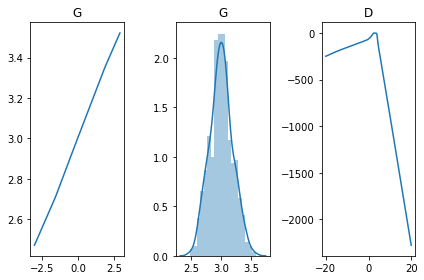

[Epoch 48104/50000] [D loss: -0.063026] [G loss: 0.394156]
[Epoch 48108/50000] [D loss: -0.072661] [G loss: 0.402873]
[Epoch 48112/50000] [D loss: -0.071521] [G loss: 0.397138]
[Epoch 48116/50000] [D loss: -0.055731] [G loss: 0.388564]
[Epoch 48120/50000] [D loss: -0.072997] [G loss: 0.399902]
[Epoch 48124/50000] [D loss: -0.082191] [G loss: 0.385697]
[Epoch 48128/50000] [D loss: -0.075740] [G loss: 0.394369]
[Epoch 48132/50000] [D loss: -0.082330] [G loss: 0.424436]
[Epoch 48136/50000] [D loss: -0.080871] [G loss: 0.444579]
[Epoch 48140/50000] [D loss: -0.085170] [G loss: 0.450599]
[Epoch 48144/50000] [D loss: -0.087045] [G loss: 0.442429]
[Epoch 48148/50000] [D loss: -0.090406] [G loss: 0.430364]
[Epoch 48152/50000] [D loss: -0.094154] [G loss: 0.450566]
[Epoch 48156/50000] [D loss: -0.094943] [G loss: 0.458959]
[Epoch 48160/50000] [D loss: -0.105479] [G loss: 0.483289]
[Epoch 48164/50000] [D loss: -0.099988] [G loss: 0.380183]
[Epoch 48168/50000] [D loss: -0.096415] [G loss: 0.37584

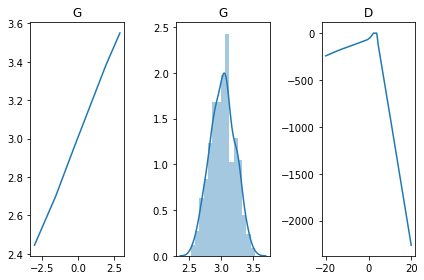

[Epoch 48204/50000] [D loss: -0.088194] [G loss: 0.489416]
[Epoch 48208/50000] [D loss: -0.073401] [G loss: 0.184396]
[Epoch 48212/50000] [D loss: -0.107010] [G loss: -0.601879]
[Epoch 48216/50000] [D loss: -0.050047] [G loss: -0.461610]
[Epoch 48220/50000] [D loss: -0.066173] [G loss: -0.765421]
[Epoch 48224/50000] [D loss: -0.060794] [G loss: -0.845966]
[Epoch 48228/50000] [D loss: -0.073894] [G loss: -0.834570]
[Epoch 48232/50000] [D loss: -0.065866] [G loss: -0.758253]
[Epoch 48236/50000] [D loss: -0.049883] [G loss: -0.711196]
[Epoch 48240/50000] [D loss: -0.077361] [G loss: -0.683864]
[Epoch 48244/50000] [D loss: -0.036721] [G loss: -0.720122]
[Epoch 48248/50000] [D loss: -0.063811] [G loss: -0.734476]
[Epoch 48252/50000] [D loss: -0.051653] [G loss: -0.726608]
[Epoch 48256/50000] [D loss: -0.030189] [G loss: -0.737467]
[Epoch 48260/50000] [D loss: -0.059125] [G loss: -0.773554]
[Epoch 48264/50000] [D loss: -0.073012] [G loss: -0.715220]
[Epoch 48268/50000] [D loss: -0.053502] [G

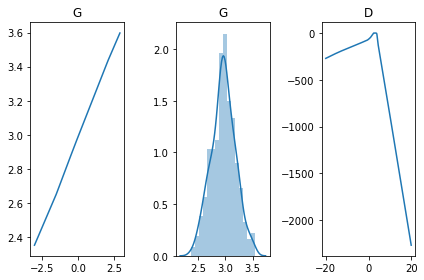

[Epoch 48304/50000] [D loss: -0.085913] [G loss: -0.681907]
[Epoch 48308/50000] [D loss: -0.113747] [G loss: -0.520814]
[Epoch 48312/50000] [D loss: -0.112182] [G loss: -0.094194]
[Epoch 48316/50000] [D loss: -0.124112] [G loss: 0.169959]
[Epoch 48320/50000] [D loss: -0.098049] [G loss: 0.102335]
[Epoch 48324/50000] [D loss: -0.077781] [G loss: 0.150933]
[Epoch 48328/50000] [D loss: -0.048130] [G loss: 0.230641]
[Epoch 48332/50000] [D loss: -0.076406] [G loss: 0.271353]
[Epoch 48336/50000] [D loss: -0.066778] [G loss: 0.281182]
[Epoch 48340/50000] [D loss: -0.044543] [G loss: 0.297411]
[Epoch 48344/50000] [D loss: -0.071145] [G loss: 0.311715]
[Epoch 48348/50000] [D loss: -0.061882] [G loss: 0.268207]
[Epoch 48352/50000] [D loss: -0.048014] [G loss: 0.290096]
[Epoch 48356/50000] [D loss: -0.054072] [G loss: 0.309063]
[Epoch 48360/50000] [D loss: -0.051164] [G loss: 0.257077]
[Epoch 48364/50000] [D loss: -0.055523] [G loss: 0.260349]
[Epoch 48368/50000] [D loss: -0.047886] [G loss: 0.34

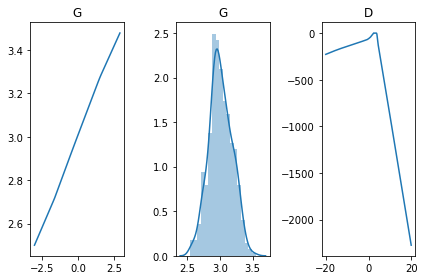

[Epoch 48404/50000] [D loss: -0.114280] [G loss: 0.797754]
[Epoch 48408/50000] [D loss: -0.095483] [G loss: 0.746568]
[Epoch 48412/50000] [D loss: -0.096165] [G loss: 0.734936]
[Epoch 48416/50000] [D loss: -0.099426] [G loss: 0.733317]
[Epoch 48420/50000] [D loss: -0.080731] [G loss: 0.705629]
[Epoch 48424/50000] [D loss: -0.100085] [G loss: 0.754093]
[Epoch 48428/50000] [D loss: -0.106010] [G loss: 0.694950]
[Epoch 48432/50000] [D loss: -0.094711] [G loss: 0.635804]
[Epoch 48436/50000] [D loss: -0.095410] [G loss: 0.706269]
[Epoch 48440/50000] [D loss: -0.079721] [G loss: 0.724052]
[Epoch 48444/50000] [D loss: -0.111686] [G loss: 0.783860]
[Epoch 48448/50000] [D loss: -0.095294] [G loss: 0.755309]
[Epoch 48452/50000] [D loss: -0.064341] [G loss: 0.713412]
[Epoch 48456/50000] [D loss: -0.054733] [G loss: 0.676289]
[Epoch 48460/50000] [D loss: -0.042561] [G loss: 0.623301]
[Epoch 48464/50000] [D loss: -0.049775] [G loss: 0.610726]
[Epoch 48468/50000] [D loss: -0.049256] [G loss: 0.59976

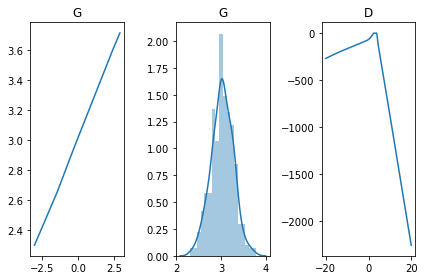

[Epoch 48504/50000] [D loss: -0.021356] [G loss: 0.658479]
[Epoch 48508/50000] [D loss: -0.047383] [G loss: 0.738455]
[Epoch 48512/50000] [D loss: -0.107971] [G loss: 0.844341]
[Epoch 48516/50000] [D loss: -0.098400] [G loss: 0.930314]
[Epoch 48520/50000] [D loss: -0.121716] [G loss: 0.939762]
[Epoch 48524/50000] [D loss: -0.151635] [G loss: 0.732623]
[Epoch 48528/50000] [D loss: -0.214681] [G loss: 0.839804]
[Epoch 48532/50000] [D loss: -0.183914] [G loss: 0.858988]
[Epoch 48536/50000] [D loss: -0.146966] [G loss: 0.758955]
[Epoch 48540/50000] [D loss: -0.091137] [G loss: 0.570535]
[Epoch 48544/50000] [D loss: -0.028534] [G loss: -0.070075]
[Epoch 48548/50000] [D loss: -0.015495] [G loss: -0.245526]
[Epoch 48552/50000] [D loss: -0.017588] [G loss: -0.309402]
[Epoch 48556/50000] [D loss: -0.037802] [G loss: -0.393950]
[Epoch 48560/50000] [D loss: -0.062592] [G loss: -0.505166]
[Epoch 48564/50000] [D loss: -0.049547] [G loss: 0.913544]
[Epoch 48568/50000] [D loss: -0.057207] [G loss: 0.

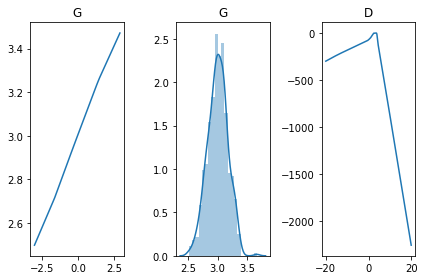

[Epoch 48604/50000] [D loss: -0.031946] [G loss: -0.096739]
[Epoch 48608/50000] [D loss: -0.090386] [G loss: -0.274905]
[Epoch 48612/50000] [D loss: -0.053286] [G loss: -0.242708]
[Epoch 48616/50000] [D loss: -0.059248] [G loss: -0.281572]
[Epoch 48620/50000] [D loss: -0.064583] [G loss: -0.172736]
[Epoch 48624/50000] [D loss: -0.061375] [G loss: -0.091465]
[Epoch 48628/50000] [D loss: -0.062812] [G loss: -0.031712]
[Epoch 48632/50000] [D loss: -0.026189] [G loss: -0.453416]
[Epoch 48636/50000] [D loss: -0.067849] [G loss: -0.258859]
[Epoch 48640/50000] [D loss: -0.085916] [G loss: -0.144502]
[Epoch 48644/50000] [D loss: -0.085771] [G loss: -0.002366]
[Epoch 48648/50000] [D loss: -0.125471] [G loss: -0.063493]
[Epoch 48652/50000] [D loss: -0.096150] [G loss: -0.057805]
[Epoch 48656/50000] [D loss: -0.078883] [G loss: -0.088290]
[Epoch 48660/50000] [D loss: -0.082968] [G loss: 0.140840]
[Epoch 48664/50000] [D loss: -0.115164] [G loss: 0.186848]
[Epoch 48668/50000] [D loss: -0.099671] [G

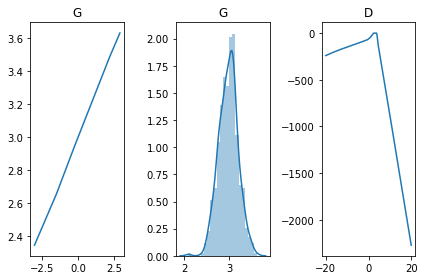

[Epoch 48704/50000] [D loss: -0.015186] [G loss: 0.064005]
[Epoch 48708/50000] [D loss: -0.036876] [G loss: 0.065059]
[Epoch 48712/50000] [D loss: -0.073866] [G loss: 0.125106]
[Epoch 48716/50000] [D loss: -0.003564] [G loss: 0.096714]
[Epoch 48720/50000] [D loss: -0.031915] [G loss: 0.069888]
[Epoch 48724/50000] [D loss: -0.036725] [G loss: 0.068767]
[Epoch 48728/50000] [D loss: -0.067700] [G loss: 0.088302]
[Epoch 48732/50000] [D loss: -0.048825] [G loss: 0.089790]
[Epoch 48736/50000] [D loss: -0.041742] [G loss: 0.105145]
[Epoch 48740/50000] [D loss: -0.066350] [G loss: 0.158074]
[Epoch 48744/50000] [D loss: -0.051478] [G loss: 0.112589]
[Epoch 48748/50000] [D loss: -0.082436] [G loss: 0.147608]
[Epoch 48752/50000] [D loss: -0.059529] [G loss: 0.174886]
[Epoch 48756/50000] [D loss: -0.065649] [G loss: 0.206543]
[Epoch 48760/50000] [D loss: -0.077177] [G loss: 0.256155]
[Epoch 48764/50000] [D loss: -0.061652] [G loss: 0.254756]
[Epoch 48768/50000] [D loss: -0.081499] [G loss: 0.27948

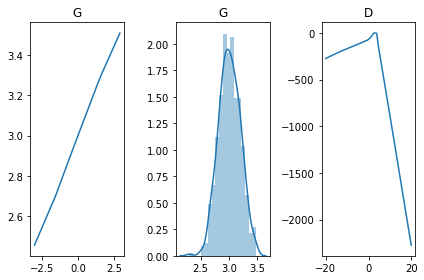

[Epoch 48804/50000] [D loss: -0.074303] [G loss: 0.290175]
[Epoch 48808/50000] [D loss: -0.062448] [G loss: 0.260358]
[Epoch 48812/50000] [D loss: -0.051195] [G loss: 0.254117]
[Epoch 48816/50000] [D loss: -0.071812] [G loss: 0.294098]
[Epoch 48820/50000] [D loss: -0.058638] [G loss: 0.296001]
[Epoch 48824/50000] [D loss: -0.036809] [G loss: 0.270337]
[Epoch 48828/50000] [D loss: -0.056605] [G loss: 0.302421]
[Epoch 48832/50000] [D loss: -0.070892] [G loss: 0.364498]
[Epoch 48836/50000] [D loss: -0.081530] [G loss: 0.403374]
[Epoch 48840/50000] [D loss: -0.089613] [G loss: 0.484781]
[Epoch 48844/50000] [D loss: -0.090808] [G loss: 0.414266]
[Epoch 48848/50000] [D loss: -0.097987] [G loss: 0.363488]
[Epoch 48852/50000] [D loss: -0.075472] [G loss: 0.307210]
[Epoch 48856/50000] [D loss: -0.107501] [G loss: 0.318702]
[Epoch 48860/50000] [D loss: -0.078061] [G loss: 0.271642]
[Epoch 48864/50000] [D loss: -0.072734] [G loss: 0.243578]
[Epoch 48868/50000] [D loss: -0.093093] [G loss: 0.20587

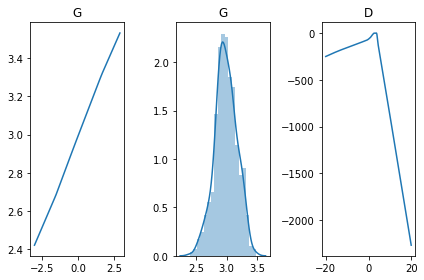

[Epoch 48904/50000] [D loss: -0.093049] [G loss: 0.227170]
[Epoch 48908/50000] [D loss: -0.088995] [G loss: 0.196190]
[Epoch 48912/50000] [D loss: -0.061843] [G loss: 0.223938]
[Epoch 48916/50000] [D loss: -0.109210] [G loss: 0.244062]
[Epoch 48920/50000] [D loss: -0.107158] [G loss: 0.068628]
[Epoch 48924/50000] [D loss: -0.042584] [G loss: 0.103435]
[Epoch 48928/50000] [D loss: -0.050842] [G loss: 0.197907]
[Epoch 48932/50000] [D loss: -0.028953] [G loss: 0.235177]
[Epoch 48936/50000] [D loss: -0.072542] [G loss: 0.254610]
[Epoch 48940/50000] [D loss: -0.056460] [G loss: 0.237732]
[Epoch 48944/50000] [D loss: -0.058317] [G loss: 0.225733]
[Epoch 48948/50000] [D loss: -0.068127] [G loss: 0.294803]
[Epoch 48952/50000] [D loss: -0.086164] [G loss: 0.347024]
[Epoch 48956/50000] [D loss: -0.062231] [G loss: 0.342520]
[Epoch 48960/50000] [D loss: -0.074323] [G loss: 0.367386]
[Epoch 48964/50000] [D loss: -0.070582] [G loss: 0.272801]
[Epoch 48968/50000] [D loss: -0.056946] [G loss: 0.14345

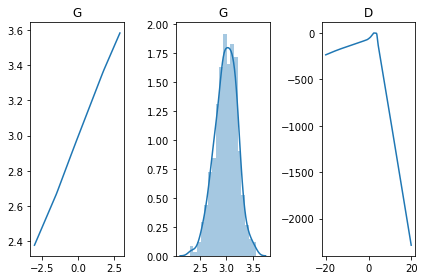

[Epoch 49004/50000] [D loss: -0.066672] [G loss: -0.298387]
[Epoch 49008/50000] [D loss: -0.081046] [G loss: -0.352165]
[Epoch 49012/50000] [D loss: -0.097728] [G loss: -0.379579]
[Epoch 49016/50000] [D loss: -0.076748] [G loss: -0.435308]
[Epoch 49020/50000] [D loss: -0.098496] [G loss: -0.494577]
[Epoch 49024/50000] [D loss: -0.105809] [G loss: -0.290636]
[Epoch 49028/50000] [D loss: -0.058889] [G loss: -0.104170]
[Epoch 49032/50000] [D loss: -0.065063] [G loss: -0.236317]
[Epoch 49036/50000] [D loss: -0.072136] [G loss: -0.308761]
[Epoch 49040/50000] [D loss: -0.069350] [G loss: -0.230551]
[Epoch 49044/50000] [D loss: -0.094355] [G loss: -0.230832]
[Epoch 49048/50000] [D loss: -0.084118] [G loss: -0.203738]
[Epoch 49052/50000] [D loss: -0.080320] [G loss: -0.082513]
[Epoch 49056/50000] [D loss: -0.079521] [G loss: 0.032486]
[Epoch 49060/50000] [D loss: -0.084656] [G loss: 0.151312]
[Epoch 49064/50000] [D loss: -0.069824] [G loss: 0.219307]
[Epoch 49068/50000] [D loss: -0.089401] [G 

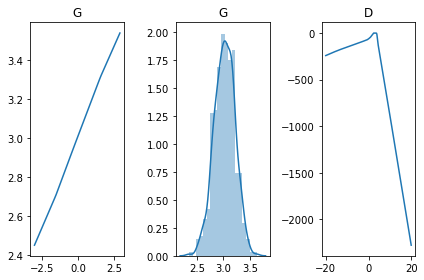

[Epoch 49104/50000] [D loss: -0.096118] [G loss: -0.638196]
[Epoch 49108/50000] [D loss: -0.055303] [G loss: -0.407244]
[Epoch 49112/50000] [D loss: -0.102961] [G loss: -0.278878]
[Epoch 49116/50000] [D loss: -0.079297] [G loss: 0.325472]
[Epoch 49120/50000] [D loss: -0.067918] [G loss: 0.218693]
[Epoch 49124/50000] [D loss: -0.077545] [G loss: 0.299339]
[Epoch 49128/50000] [D loss: -0.093131] [G loss: 0.281661]
[Epoch 49132/50000] [D loss: -0.057907] [G loss: 0.272629]
[Epoch 49136/50000] [D loss: -0.072334] [G loss: 0.244130]
[Epoch 49140/50000] [D loss: -0.083809] [G loss: 0.282966]
[Epoch 49144/50000] [D loss: -0.073195] [G loss: 0.264703]
[Epoch 49148/50000] [D loss: -0.078812] [G loss: 0.281965]
[Epoch 49152/50000] [D loss: -0.078722] [G loss: 0.261386]
[Epoch 49156/50000] [D loss: -0.064708] [G loss: 0.250482]
[Epoch 49160/50000] [D loss: -0.068347] [G loss: 0.282472]
[Epoch 49164/50000] [D loss: -0.065168] [G loss: 0.237047]
[Epoch 49168/50000] [D loss: -0.047007] [G loss: 0.17

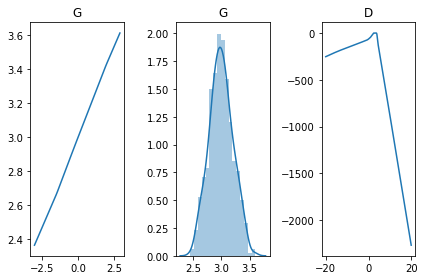

[Epoch 49204/50000] [D loss: -0.060444] [G loss: 0.376594]
[Epoch 49208/50000] [D loss: -0.091876] [G loss: 0.427347]
[Epoch 49212/50000] [D loss: -0.068123] [G loss: 0.320920]
[Epoch 49216/50000] [D loss: -0.078558] [G loss: 0.258484]
[Epoch 49220/50000] [D loss: -0.074997] [G loss: 0.295168]
[Epoch 49224/50000] [D loss: -0.064885] [G loss: 0.243911]
[Epoch 49228/50000] [D loss: -0.072964] [G loss: 0.174242]
[Epoch 49232/50000] [D loss: -0.065708] [G loss: 0.275350]
[Epoch 49236/50000] [D loss: -0.054477] [G loss: 0.279055]
[Epoch 49240/50000] [D loss: -0.081065] [G loss: 0.343902]
[Epoch 49244/50000] [D loss: -0.083415] [G loss: 0.337275]
[Epoch 49248/50000] [D loss: -0.079354] [G loss: 0.282142]
[Epoch 49252/50000] [D loss: -0.052511] [G loss: 0.253395]
[Epoch 49256/50000] [D loss: -0.035756] [G loss: 0.195068]
[Epoch 49260/50000] [D loss: -0.060313] [G loss: 0.216753]
[Epoch 49264/50000] [D loss: -0.049960] [G loss: 0.207596]
[Epoch 49268/50000] [D loss: -0.065822] [G loss: 0.20744

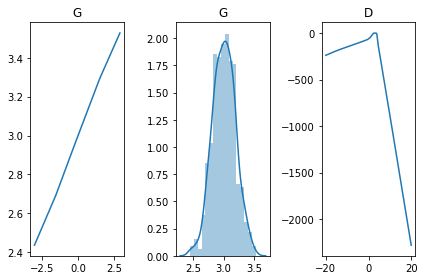

[Epoch 49304/50000] [D loss: -0.049300] [G loss: 0.219261]
[Epoch 49308/50000] [D loss: -0.060944] [G loss: 0.209948]
[Epoch 49312/50000] [D loss: -0.056286] [G loss: 0.132432]
[Epoch 49316/50000] [D loss: -0.055436] [G loss: 0.102828]
[Epoch 49320/50000] [D loss: -0.051951] [G loss: 0.270255]
[Epoch 49324/50000] [D loss: -0.076498] [G loss: 0.361086]
[Epoch 49328/50000] [D loss: -0.080372] [G loss: 0.384353]
[Epoch 49332/50000] [D loss: -0.074040] [G loss: 0.367226]
[Epoch 49336/50000] [D loss: -0.081657] [G loss: 0.354772]
[Epoch 49340/50000] [D loss: -0.085514] [G loss: 0.309179]
[Epoch 49344/50000] [D loss: -0.073042] [G loss: 0.337681]
[Epoch 49348/50000] [D loss: -0.093764] [G loss: 0.359506]
[Epoch 49352/50000] [D loss: -0.066285] [G loss: 0.344709]
[Epoch 49356/50000] [D loss: -0.092316] [G loss: 0.417850]
[Epoch 49360/50000] [D loss: -0.082770] [G loss: 0.420719]
[Epoch 49364/50000] [D loss: -0.072484] [G loss: 0.355107]
[Epoch 49368/50000] [D loss: -0.059954] [G loss: 0.33016

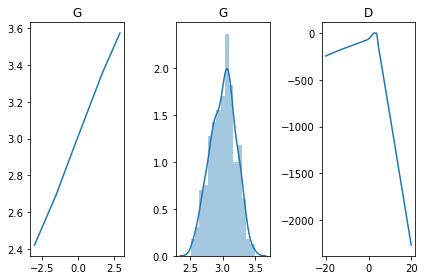

[Epoch 49404/50000] [D loss: -0.094471] [G loss: 0.522085]
[Epoch 49408/50000] [D loss: -0.047932] [G loss: 0.090491]
[Epoch 49412/50000] [D loss: -0.068587] [G loss: 0.096107]
[Epoch 49416/50000] [D loss: 0.014318] [G loss: 0.460169]
[Epoch 49420/50000] [D loss: -0.035400] [G loss: 0.358647]
[Epoch 49424/50000] [D loss: -0.042090] [G loss: 0.343782]
[Epoch 49428/50000] [D loss: -0.013760] [G loss: 0.314997]
[Epoch 49432/50000] [D loss: -0.035578] [G loss: 0.315954]
[Epoch 49436/50000] [D loss: -0.013458] [G loss: 0.290628]
[Epoch 49440/50000] [D loss: -0.026843] [G loss: 0.277704]
[Epoch 49444/50000] [D loss: -0.028942] [G loss: 0.320596]
[Epoch 49448/50000] [D loss: -0.020848] [G loss: 0.276953]
[Epoch 49452/50000] [D loss: -0.043998] [G loss: 0.265123]
[Epoch 49456/50000] [D loss: -0.056099] [G loss: 0.243014]
[Epoch 49460/50000] [D loss: -0.037004] [G loss: 0.129968]
[Epoch 49464/50000] [D loss: -0.048668] [G loss: 0.069709]
[Epoch 49468/50000] [D loss: -0.065296] [G loss: 0.057245

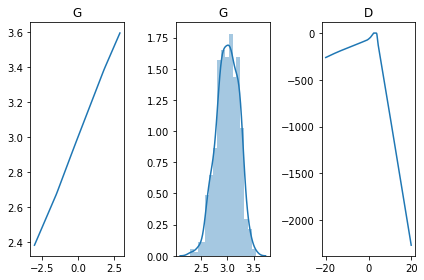

[Epoch 49504/50000] [D loss: -0.024387] [G loss: 0.451988]
[Epoch 49508/50000] [D loss: -0.010797] [G loss: 0.336033]
[Epoch 49512/50000] [D loss: -0.070545] [G loss: 0.310695]
[Epoch 49516/50000] [D loss: -0.062281] [G loss: 0.339199]
[Epoch 49520/50000] [D loss: -0.014771] [G loss: 0.375753]
[Epoch 49524/50000] [D loss: -0.009289] [G loss: 0.350116]
[Epoch 49528/50000] [D loss: -0.044110] [G loss: 0.394721]
[Epoch 49532/50000] [D loss: -0.031418] [G loss: 0.413900]
[Epoch 49536/50000] [D loss: -0.009915] [G loss: 0.429404]
[Epoch 49540/50000] [D loss: -0.010384] [G loss: 0.480157]
[Epoch 49544/50000] [D loss: -0.017795] [G loss: 0.528983]
[Epoch 49548/50000] [D loss: -0.007645] [G loss: 0.548824]
[Epoch 49552/50000] [D loss: -0.003349] [G loss: 0.554401]
[Epoch 49556/50000] [D loss: -0.002781] [G loss: 0.628741]
[Epoch 49560/50000] [D loss: -0.078644] [G loss: -0.476872]
[Epoch 49564/50000] [D loss: -0.029204] [G loss: -0.015695]
[Epoch 49568/50000] [D loss: -0.058846] [G loss: -0.33

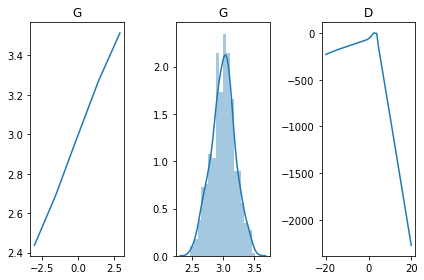

[Epoch 49604/50000] [D loss: -0.062693] [G loss: -0.283403]
[Epoch 49608/50000] [D loss: -0.085779] [G loss: -0.310741]
[Epoch 49612/50000] [D loss: -0.068114] [G loss: -0.325013]
[Epoch 49616/50000] [D loss: -0.073745] [G loss: -0.337603]
[Epoch 49620/50000] [D loss: -0.080496] [G loss: -0.361117]
[Epoch 49624/50000] [D loss: -0.087736] [G loss: -0.424844]
[Epoch 49628/50000] [D loss: -0.092382] [G loss: -0.322806]
[Epoch 49632/50000] [D loss: -0.104586] [G loss: -0.298010]
[Epoch 49636/50000] [D loss: -0.079358] [G loss: -0.262044]
[Epoch 49640/50000] [D loss: -0.054902] [G loss: -0.296074]
[Epoch 49644/50000] [D loss: -0.076988] [G loss: -0.286437]
[Epoch 49648/50000] [D loss: -0.069471] [G loss: -0.263965]
[Epoch 49652/50000] [D loss: -0.070737] [G loss: -0.267123]
[Epoch 49656/50000] [D loss: -0.049678] [G loss: -0.309297]
[Epoch 49660/50000] [D loss: -0.050717] [G loss: -0.276127]
[Epoch 49664/50000] [D loss: -0.043255] [G loss: -0.275054]
[Epoch 49668/50000] [D loss: -0.056852] 

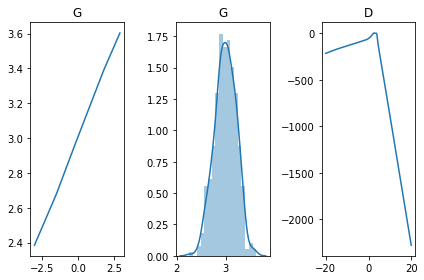

[Epoch 49704/50000] [D loss: -0.074755] [G loss: -0.213068]
[Epoch 49708/50000] [D loss: -0.091633] [G loss: -0.180392]
[Epoch 49712/50000] [D loss: -0.089839] [G loss: -0.249253]
[Epoch 49716/50000] [D loss: -0.064428] [G loss: -0.285617]
[Epoch 49720/50000] [D loss: -0.075450] [G loss: -0.310980]
[Epoch 49724/50000] [D loss: -0.092183] [G loss: -0.328734]
[Epoch 49728/50000] [D loss: -0.077674] [G loss: -0.328599]
[Epoch 49732/50000] [D loss: -0.079506] [G loss: -0.385910]
[Epoch 49736/50000] [D loss: -0.084926] [G loss: -0.428130]
[Epoch 49740/50000] [D loss: -0.090975] [G loss: -0.522124]
[Epoch 49744/50000] [D loss: -0.051704] [G loss: 0.043793]
[Epoch 49748/50000] [D loss: -0.088390] [G loss: -0.511299]
[Epoch 49752/50000] [D loss: -0.089045] [G loss: 0.073748]
[Epoch 49756/50000] [D loss: -0.089855] [G loss: 0.196013]
[Epoch 49760/50000] [D loss: -0.080232] [G loss: 0.269874]
[Epoch 49764/50000] [D loss: -0.095115] [G loss: 0.270663]
[Epoch 49768/50000] [D loss: -0.104916] [G lo

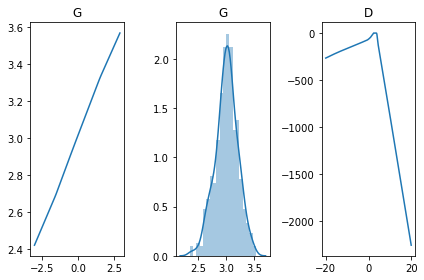

[Epoch 49804/50000] [D loss: -0.044700] [G loss: 0.298445]
[Epoch 49808/50000] [D loss: -0.076978] [G loss: 0.365765]
[Epoch 49812/50000] [D loss: -0.087673] [G loss: 0.446223]
[Epoch 49816/50000] [D loss: -0.112747] [G loss: 0.454433]
[Epoch 49820/50000] [D loss: -0.083358] [G loss: 0.327428]
[Epoch 49824/50000] [D loss: -0.116195] [G loss: 0.334240]
[Epoch 49828/50000] [D loss: -0.060420] [G loss: 0.226871]
[Epoch 49832/50000] [D loss: -0.082417] [G loss: 0.238528]
[Epoch 49836/50000] [D loss: -0.071896] [G loss: 0.242518]
[Epoch 49840/50000] [D loss: -0.074176] [G loss: 0.288415]
[Epoch 49844/50000] [D loss: -0.056780] [G loss: 0.260909]
[Epoch 49848/50000] [D loss: -0.089939] [G loss: 0.331546]
[Epoch 49852/50000] [D loss: -0.070019] [G loss: 0.242092]
[Epoch 49856/50000] [D loss: -0.101640] [G loss: 0.343136]
[Epoch 49860/50000] [D loss: -0.048733] [G loss: 0.232071]
[Epoch 49864/50000] [D loss: -0.066385] [G loss: 0.264592]
[Epoch 49868/50000] [D loss: -0.063861] [G loss: 0.23904

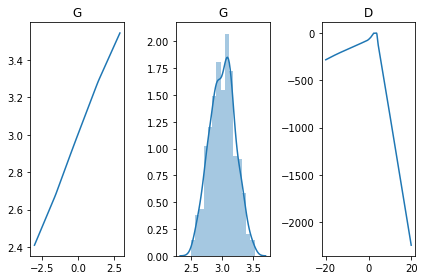

[Epoch 49904/50000] [D loss: -0.058083] [G loss: 0.150083]
[Epoch 49908/50000] [D loss: -0.061825] [G loss: 0.264132]
[Epoch 49912/50000] [D loss: -0.076662] [G loss: 0.235111]
[Epoch 49916/50000] [D loss: -0.068473] [G loss: 0.183884]
[Epoch 49920/50000] [D loss: -0.065026] [G loss: 0.232298]
[Epoch 49924/50000] [D loss: -0.038120] [G loss: 0.275568]
[Epoch 49928/50000] [D loss: -0.069812] [G loss: 0.331397]
[Epoch 49932/50000] [D loss: -0.064690] [G loss: 0.385440]
[Epoch 49936/50000] [D loss: -0.091125] [G loss: 0.405991]
[Epoch 49940/50000] [D loss: -0.091015] [G loss: 0.346670]
[Epoch 49944/50000] [D loss: -0.087467] [G loss: 0.266254]
[Epoch 49948/50000] [D loss: -0.080167] [G loss: 0.181802]
[Epoch 49952/50000] [D loss: -0.141917] [G loss: 0.216047]
[Epoch 49956/50000] [D loss: -0.087905] [G loss: 0.167892]
[Epoch 49960/50000] [D loss: -0.093122] [G loss: -0.061563]
[Epoch 49964/50000] [D loss: -0.073998] [G loss: -0.173234]
[Epoch 49968/50000] [D loss: -0.077056] [G loss: -0.16

In [13]:
# ----------
#  Training
# ----------

n_epochs=50000

n_critic=4

lambda_gp=.1

for epoch in range(n_epochs):

    # Configure input
    real_imgs =m.sample([500]).to(device)

    # ---------------------
    #  Train Discriminator
    # ---------------------

    optimizer_D.zero_grad()

    # Sample noise as generator input
    z = Tensor(np.random.normal(0, 1, (real_imgs.shape[0], lat_dim)))

    # Generate a batch of images
    fake_imgs = generator(z)

    # Real images
    real_validity = discriminator(real_imgs)
    # Fake images
    fake_validity = discriminator(fake_imgs)
    # Gradient penalty
    gradient_penalty = compute_gradient_penalty(discriminator, real_imgs.data, fake_imgs.data)
    # Adversarial loss
    d_loss = -torch.mean(real_validity) + torch.mean(fake_validity)+lambda_gp * gradient_penalty

    d_loss.backward()
    optimizer_D.step()

    optimizer_G.zero_grad()

    # Train the generator every n_critic steps
    if epoch % n_critic == 0:

        # -----------------
        #  Train Generator
        # -----------------

        # Generate a batch of images
        fake_imgs = generator(z)
        # Loss measures generator's ability to fool the discriminator
        # Train on fake images
        fake_validity = discriminator(fake_imgs)
        g_loss = -torch.mean(fake_validity)

        g_loss.backward()
        optimizer_G.step()

        print(
            "[Epoch %d/%d] [D loss: %f] [G loss: %f]"
            % (epoch, n_epochs, d_loss.item(), g_loss.item())
            )

    if epoch % 100 == 0:
        viewGAN(discriminator, generator)
    

    

In [14]:
z = Tensor(np.random.normal(0, 1, (500, lat_dim)))
fake_data=generator(z).detach().cpu()

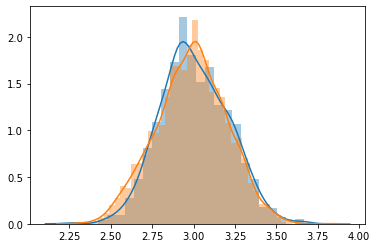

In [15]:
fig, ax= plt.subplots()

sns.distplot(real_data.cpu(), ax=ax)

z = Tensor(np.random.normal(0, 1, (5000, lat_dim)))
fake_data=generator(z).detach().cpu()
sns.distplot(fake_data, ax=ax)

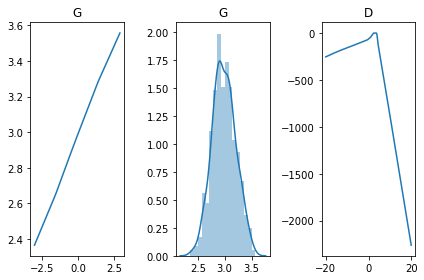

In [16]:
viewGAN(discriminator, generator)